# Monte Carlo Methods

In this notebook, you will write your own implementations of many Monte Carlo (MC) algorithms. 

While we have provided some starter code, you are welcome to erase these hints and write your code from scratch.

### Part 0: Explore BlackjackEnv

We begin by importing the necessary packages.

In [1]:
import sys
import gym
import numpy as np
from collections import defaultdict

from plot_utils import plot_blackjack_values, plot_policy

Use the code cell below to create an instance of the [Blackjack](https://github.com/openai/gym/blob/master/gym/envs/toy_text/blackjack.py) environment.

In [2]:
env = gym.make('Blackjack-v0')

Each state is a 3-tuple of:
- the player's current sum $\in \{0, 1, \ldots, 31\}$,
- the dealer's face up card $\in \{1, \ldots, 10\}$, and
- whether or not the player has a usable ace (`no` $=0$, `yes` $=1$).

The agent has two potential actions:

```
    STICK = 0
    HIT = 1
```
Verify this by running the code cell below.

In [3]:
print(env.observation_space)
print(env.action_space)

Tuple(Discrete(32), Discrete(11), Discrete(2))
Discrete(2)


Execute the code cell below to play Blackjack with a random policy.  

(_The code currently plays Blackjack three times - feel free to change this number, or to run the cell multiple times.  The cell is designed for you to get some experience with the output that is returned as the agent interacts with the environment._)

In [4]:
for i_episode in range(3):
    state = env.reset()
    while True:
        print("state: ",state)
        action = env.action_space.sample()
        print('action: ', action)
        print ("env.step(action): ",env.step(action))
        state, reward, done, info = env.step(action)
        if done:
            print('End game! Reward: ', reward)
            print('You won :)\n') if reward > 0 else print('You lost :(\n')
            break

state:  (13, 5, False)
action:  0
env.step(action):  ((13, 5, False), 1.0, True, {})
End game! Reward:  1.0
You won :)

state:  (21, 10, True)
action:  1
env.step(action):  ((15, 10, False), 0, False, {})
state:  (19, 10, False)
action:  1
env.step(action):  ((29, 10, False), -1, True, {})
End game! Reward:  -1
You lost :(

state:  (13, 10, False)
action:  0
env.step(action):  ((13, 10, False), 1.0, True, {})
End game! Reward:  1.0
You won :)



### Part 1: MC Prediction

In this section, you will write your own implementation of MC prediction (for estimating the action-value function).  

We will begin by investigating a policy where the player _almost_ always sticks if the sum of her cards exceeds 18.  In particular, she selects action `STICK` with 80% probability if the sum is greater than 18; and, if the sum is 18 or below, she selects action `HIT` with 80% probability.  The function `generate_episode_from_limit_stochastic` samples an episode using this policy. 

The function accepts as **input**:
- `bj_env`: This is an instance of OpenAI Gym's Blackjack environment.

It returns as **output**:
- `episode`: This is a list of (state, action, reward) tuples (of tuples) and corresponds to $(S_0, A_0, R_1, \ldots, S_{T-1}, A_{T-1}, R_{T})$, where $T$ is the final time step.  In particular, `episode[i]` returns $(S_i, A_i, R_{i+1})$, and `episode[i][0]`, `episode[i][1]`, and `episode[i][2]` return $S_i$, $A_i$, and $R_{i+1}$, respectively.

In [5]:
def generate_episode_from_limit_stochastic(bj_env):
    episode = []
    state = bj_env.reset()
    print("############")
    print("starting state: ", state)
    while True:
        probs = [0.8, 0.2] if state[0] > 18 else [0.2, 0.8]
        action = np.random.choice(np.arange(2), p=probs)
        print("state", state)
        print("action taken", action)
        next_state, reward, done, info = bj_env.step(action)
        print("reward: ", reward)
        print("next_state" , next_state)
        episode.append((state, action, reward))
        state = next_state
        if done:
            break
    print("Episode: ")
    
    return episode

Execute the code cell below to play Blackjack with the policy. 

(*The code currently plays Blackjack three times - feel free to change this number, or to run the cell multiple times.  The cell is designed for you to gain some familiarity with the output of the `generate_episode_from_limit_stochastic` function.*)

In [6]:
for i in range(3):
    print(generate_episode_from_limit_stochastic(env))

############
starting state:  (14, 10, True)
state (14, 10, True)
action taken 1
reward:  0
next_state (18, 10, True)
state (18, 10, True)
action taken 1
reward:  0
next_state (16, 10, False)
state (16, 10, False)
action taken 1
reward:  -1
next_state (26, 10, False)
Episode: 
[((14, 10, True), 1, 0), ((18, 10, True), 1, 0), ((16, 10, False), 1, -1)]
############
starting state:  (18, 8, False)
state (18, 8, False)
action taken 1
reward:  0
next_state (21, 8, False)
state (21, 8, False)
action taken 0
reward:  1.0
next_state (21, 8, False)
Episode: 
[((18, 8, False), 1, 0), ((21, 8, False), 0, 1.0)]
############
starting state:  (18, 1, False)
state (18, 1, False)
action taken 1
reward:  -1
next_state (25, 1, False)
Episode: 
[((18, 1, False), 1, -1)]


Now, you are ready to write your own implementation of MC prediction.  Feel free to implement either first-visit or every-visit MC prediction; in the case of the Blackjack environment, the techniques are equivalent.

Your algorithm has three arguments:
- `env`: This is an instance of an OpenAI Gym environment.
- `num_episodes`: This is the number of episodes that are generated through agent-environment interaction.
- `generate_episode`: This is a function that returns an episode of interaction.
- `gamma`: This is the discount rate.  It must be a value between 0 and 1, inclusive (default value: `1`).

The algorithm returns as output:
- `Q`: This is a dictionary (of one-dimensional arrays) where `Q[s][a]` is the estimated action value corresponding to state `s` and action `a`.

In [6]:
def mc_prediction_q(env, num_episodes, generate_episode, gamma=1.0):
    # initialize empty dictionaries of arrays
    returns_sum = defaultdict(lambda: np.zeros(env.action_space.n))
    N = defaultdict(lambda: np.zeros(env.action_space.n))
    Q = defaultdict(lambda: np.zeros(env.action_space.n))
    # loop over episodes
    for i_episode in range(1, num_episodes+1):
        # monitor progress
        if i_episode % 1000 == 0:
            print("\rEpisode {}/{}.".format(i_episode, num_episodes), end="")
            sys.stdout.flush()
        
        ## TODO: complete the function
        episode = generate_episode_from_limit_stochastic(env)
        # obtain states, actions and rewards
        states, actions,rewards= zip(*episode)
        # rememeber that each state there are multiple actions
        # prepare for discounting 
        discounts = np.array([gamma**i for i in range(len(rewards)+1)])
        
        for i,state in enumerate(states):
            
            N[state][actions[i]] += 1
            Q[state][actions[i]] = returns_sum[state][actions[i]] / N[state][actions[i]]
            returns_sum[state][actions[i]] += sum(rewards[i:] * discounts[:-(1+i)])
            
        
    return Q

In [7]:
episode = generate_episode_from_limit_stochastic(env)
print(episode)
states, actions,rewards= zip(*episode)
print("\nstates: ",states )
print("\nactions", actions)
print("\nrewards", rewards)

[((20, 7, False), 0, 1.0)]

states:  ((20, 7, False),)

actions (0,)

rewards (1.0,)


Use the cell below to obtain the action-value function estimate $Q$.  We have also plotted the corresponding state-value function.

To check the accuracy of your implementation, compare the plot below to the corresponding plot in the solutions notebook **Monte_Carlo_Solution.ipynb**.

Episode 500000/500000.

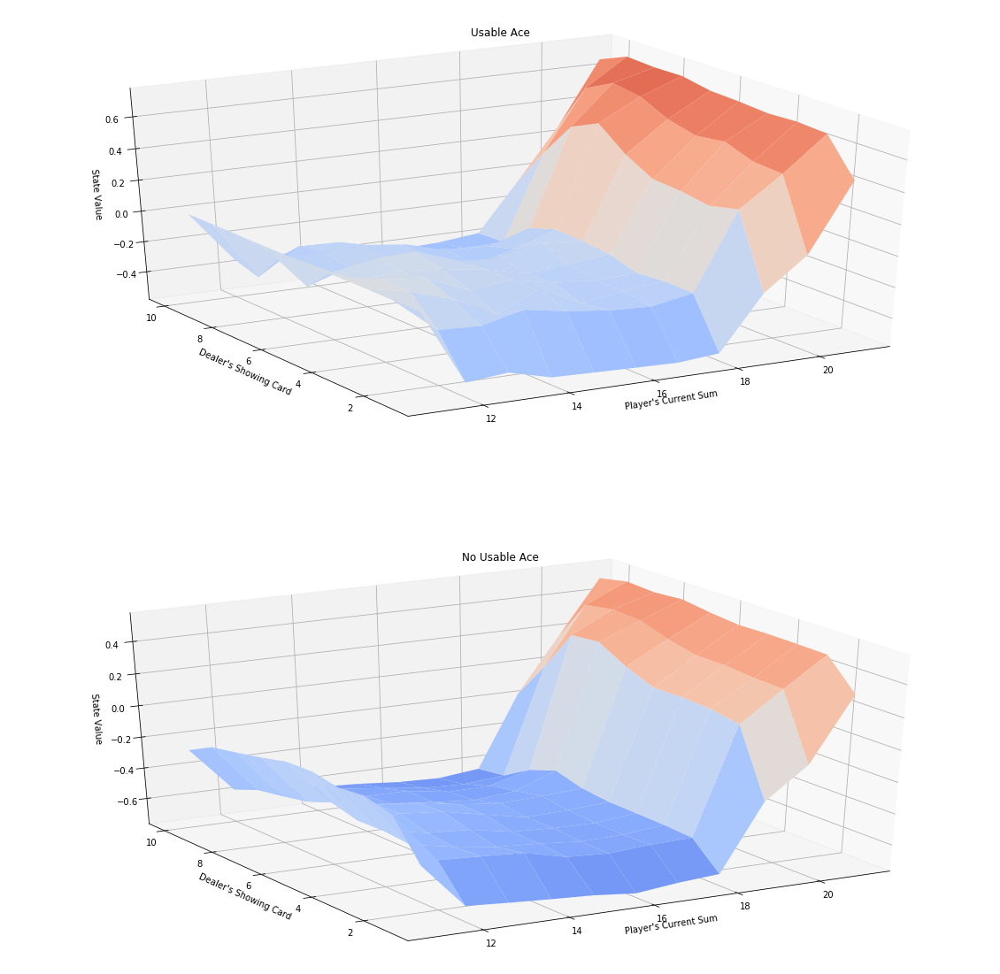

In [9]:
# obtain the action-value function
Q = mc_prediction_q(env, 500000, generate_episode_from_limit_stochastic)

# obtain the corresponding state-value function
V_to_plot = dict((k,(k[0]>18)*(np.dot([0.8, 0.2],v)) + (k[0]<=18)*(np.dot([0.2, 0.8],v))) \
         for k, v in Q.items())

# plot the state-value function
plot_blackjack_values(V_to_plot)

### Part 2: MC Control

In this section, you will write your own implementation of constant-$\alpha$ MC control.  

Your algorithm has four arguments:
- `env`: This is an instance of an OpenAI Gym environment.
- `num_episodes`: This is the number of episodes that are generated through agent-environment interaction.
- `alpha`: This is the step-size parameter for the update step.
- `gamma`: This is the discount rate.  It must be a value between 0 and 1, inclusive (default value: `1`).

The algorithm returns as output:
- `Q`: This is a dictionary (of one-dimensional arrays) where `Q[s][a]` is the estimated action value corresponding to state `s` and action `a`.
- `policy`: This is a dictionary where `policy[s]` returns the action that the agent chooses after observing state `s`.

(_Feel free to define additional functions to help you to organize your code._)

In [8]:
def get_probs(Q_s, epsilon, nA):
    """ obtains the action probabilities corresponding to epsilon-greedy policy """
    policy_s = np.ones(nA) * epsilon / nA
    #best action
    best_a = np.argmax(Q_s)
    policy_s[best_a] = 1 - epsilon + (epsilon / nA)
    return policy_s


def generate_episode_from_Q(env, Q, epsilon, nA):
    """ generates an episode from following the epsilon-greedy policy """
    episode = []
    state = env.reset()
    while True:
        #This will create a random array with nA elemenst and dimension 1 x size
        action = np.random.choice(np.arange(nA), p=get_probs(Q[state], epsilon, nA)) \
                                    if state in Q else env.action_space.sample()
        next_state, reward, done, info = env.step(action)
        episode.append((state, action, reward))
        state = next_state
        if done:
            break
    return episode
        

def update_Q(env, episode, Q, alpha, gamma):
    """ updates the action-value function estimate using the most recent episode """
    states, actions, rewards = zip(*episode)
    # prepare for discounting
    discounts = np.array([gamma**i for i in range(len(rewards)+1)])
    for i, state in enumerate(states):
        old_Q = Q[state][actions[i]] 
        Q[state][actions[i]] = old_Q + alpha*(sum(rewards[i:]*discounts[:-(1+i)]) - old_Q)
    return Q

In [9]:
def mc_control(env, num_episodes, alpha, gamma=1.0, eps_start=1.0, eps_decay=.99999, eps_min=0.05):
    nA = env.action_space.n
    # initialize empty dictionary of arrays
    Q = defaultdict(lambda: np.zeros(nA))
    epsilon = eps_start
    # loop over episodes
    for i_episode in range(1, num_episodes+1):
        # monitor progress
        if i_episode % 1000 == 0:
            print("\rEpisode {}/{}.".format(i_episode, num_episodes), end="")
            sys.stdout.flush()
        # set the value of epsilon
        epsilon = max(epsilon*eps_decay, eps_min)
#         print("epsilon: ", epsilon)
        # generate an episode by following epsilon-greedy policy
        episode = generate_episode_from_Q(env, Q, epsilon, nA)
        # update the action-value function estimate using the episode
        Q = update_Q(env, episode, Q, alpha, gamma)
    # determine the policy corresponding to the final action-value function estimate
    policy = dict((k,np.argmax(v)) for k, v in Q.items())
    return policy, Q

Use the cell below to obtain the estimated optimal policy and action-value function.  Note that you should fill in your own values for the `num_episodes` and `alpha` parameters.

In [10]:
# obtain the estimated optimal policy and action-value function
policy, Q = mc_control(env, 500000, 0.02)

epsilon:  0.99999
epsilon:  0.9999800001000001
epsilon:  0.9999700002999992
epsilon:  0.9999600005999962
epsilon:  0.9999500009999903
epsilon:  0.9999400014999804
epsilon:  0.9999300020999654
epsilon:  0.9999200027999444
epsilon:  0.9999100035999164
epsilon:  0.9999000044998805
epsilon:  0.9998900054998355
epsilon:  0.9998800065997806
epsilon:  0.9998700077997147
epsilon:  0.9998600090996367
epsilon:  0.9998500104995457
epsilon:  0.9998400119994407
epsilon:  0.9998300135993208
epsilon:  0.9998200152991848
epsilon:  0.999810017099032
epsilon:  0.999800018998861
epsilon:  0.999790020998671
epsilon:  0.999780023098461
epsilon:  0.9997700252982301
epsilon:  0.9997600275979772
epsilon:  0.9997500299977012
epsilon:  0.9997400324974013
epsilon:  0.9997300350970764
epsilon:  0.9997200377967255
epsilon:  0.9997100405963475
epsilon:  0.9997000434959415
epsilon:  0.9996900464955066
epsilon:  0.9996800495950418
epsilon:  0.9996700527945458
epsilon:  0.9996600560940179
epsilon:  0.999650059493457
e

Episode 1000/500000.epsilon:  0.9900497842463938
epsilon:  0.9900398837485513
epsilon:  0.9900299833497139
epsilon:  0.9900200830498804
epsilon:  0.99001018284905
epsilon:  0.9900002827472215
epsilon:  0.9899903827443941
epsilon:  0.9899804828405667
epsilon:  0.9899705830357384
epsilon:  0.989960683329908
epsilon:  0.9899507837230748
epsilon:  0.9899408842152376
epsilon:  0.9899309848063955
epsilon:  0.9899210854965474
epsilon:  0.9899111862856925
epsilon:  0.9899012871738297
epsilon:  0.989891388160958
epsilon:  0.9898814892470764
epsilon:  0.989871590432184
epsilon:  0.9898616917162797
epsilon:  0.9898517930993626
epsilon:  0.9898418945814316
epsilon:  0.9898319961624858
epsilon:  0.9898220978425243
epsilon:  0.9898121996215459
epsilon:  0.9898023014995497
epsilon:  0.9897924034765347
epsilon:  0.9897825055525
epsilon:  0.9897726077274446
epsilon:  0.9897627100013674
epsilon:  0.9897528123742674
epsilon:  0.9897429148461436
epsilon:  0.9897330174169953
epsilon:  0.9897231200868212
ep

epsilon:  0.9802573892593159
epsilon:  0.9802475866854233
epsilon:  0.9802377842095565
epsilon:  0.9802279818317144
epsilon:  0.9802181795518962
epsilon:  0.9802083773701007
Episode 2000/500000.epsilon:  0.980198575286327
epsilon:  0.9801887733005742
epsilon:  0.9801789714128413
epsilon:  0.9801691696231272
epsilon:  0.980159367931431
epsilon:  0.9801495663377517
epsilon:  0.9801397648420884
epsilon:  0.98012996344444
epsilon:  0.9801201621448057
epsilon:  0.9801103609431843
epsilon:  0.9801005598395749
epsilon:  0.9800907588339766
epsilon:  0.9800809579263883
epsilon:  0.980071157116809
epsilon:  0.980061356405238
epsilon:  0.9800515557916739
epsilon:  0.980041755276116
epsilon:  0.9800319548585633
epsilon:  0.9800221545390148
epsilon:  0.9800123543174694
epsilon:  0.9800025541939262
epsilon:  0.9799927541683844
epsilon:  0.9799829542408427
epsilon:  0.9799731544113003
epsilon:  0.9799633546797563
epsilon:  0.9799535550462095
epsilon:  0.979943755510659
epsilon:  0.979933956073104
eps

epsilon:  0.9707171520935053
epsilon:  0.9707074449219844
epsilon:  0.9706977378475352
epsilon:  0.9706880308701568
epsilon:  0.9706783239898481
epsilon:  0.9706686172066082
epsilon:  0.9706589105204362
epsilon:  0.970649203931331
epsilon:  0.9706394974392918
epsilon:  0.9706297910443175
epsilon:  0.970620084746407
epsilon:  0.9706103785455596
epsilon:  0.9706006724417743
epsilon:  0.9705909664350499
epsilon:  0.9705812605253856
epsilon:  0.9705715547127804
epsilon:  0.9705618489972334
epsilon:  0.9705521433787435
epsilon:  0.9705424378573098
epsilon:  0.9705327324329313
epsilon:  0.970523027105607
epsilon:  0.970513321875336
epsilon:  0.9705036167421173
epsilon:  0.9704939117059499
epsilon:  0.9704842067668329
epsilon:  0.9704745019247653
epsilon:  0.9704647971797461
epsilon:  0.9704550925317743
Episode 3000/500000.epsilon:  0.970445387980849
epsilon:  0.9704356835269693
epsilon:  0.9704259791701341
epsilon:  0.9704162749103424
epsilon:  0.9704065707475934
epsilon:  0.970396866681886


epsilon:  0.9612024772738483
epsilon:  0.9611928652490757
epsilon:  0.9611832533204232
epsilon:  0.9611736414878901
epsilon:  0.9611640297514753
epsilon:  0.9611544181111779
epsilon:  0.9611448065669967
epsilon:  0.9611351951189311
epsilon:  0.96112558376698
epsilon:  0.9611159725111423
epsilon:  0.9611063613514172
epsilon:  0.9610967502878037
epsilon:  0.9610871393203009
epsilon:  0.9610775284489077
epsilon:  0.9610679176736232
epsilon:  0.9610583069944465
epsilon:  0.9610486964113766
epsilon:  0.9610390859244126
epsilon:  0.9610294755335533
epsilon:  0.961019865238798
epsilon:  0.9610102550401457
epsilon:  0.9610006449375953
epsilon:  0.960991034931146
epsilon:  0.9609814250207968
epsilon:  0.9609718152065466
epsilon:  0.9609622054883946
epsilon:  0.9609525958663397
epsilon:  0.9609429863403811
epsilon:  0.9609333769105177
epsilon:  0.9609237675767487
epsilon:  0.960914158339073
epsilon:  0.9609045491974897
epsilon:  0.9608949401519977
epsilon:  0.9608853312025962
epsilon:  0.9608757

epsilon:  0.9519428797519441
epsilon:  0.9519333603231467
epsilon:  0.9519238409895435
epsilon:  0.9519143217511337
epsilon:  0.9519048026079162
epsilon:  0.9518952835598902
epsilon:  0.9518857646070547
epsilon:  0.9518762457494087
epsilon:  0.9518667269869512
epsilon:  0.9518572083196813
epsilon:  0.9518476897475981
epsilon:  0.9518381712707007
epsilon:  0.951828652888988
epsilon:  0.9518191346024591
epsilon:  0.9518096164111132
epsilon:  0.951800098314949
epsilon:  0.9517905803139659
epsilon:  0.9517810624081628
epsilon:  0.9517715445975388
epsilon:  0.9517620268820929
epsilon:  0.9517525092618241
epsilon:  0.9517429917367315
epsilon:  0.9517334743068142
epsilon:  0.9517239569720712
epsilon:  0.9517144397325016
epsilon:  0.9517049225881044
epsilon:  0.9516954055388785
epsilon:  0.9516858885848232
epsilon:  0.9516763717259373
epsilon:  0.9516668549622201
epsilon:  0.9516573382936706
epsilon:  0.9516478217202877
epsilon:  0.9516383052420706
epsilon:  0.9516287888590182
epsilon:  0.9516

epsilon:  0.9422164086637407
epsilon:  0.9422069864996541
epsilon:  0.9421975644297891
epsilon:  0.9421881424541448
epsilon:  0.9421787205727203
epsilon:  0.9421692987855147
epsilon:  0.9421598770925269
epsilon:  0.942150455493756
epsilon:  0.9421410339892011
epsilon:  0.9421316125788612
epsilon:  0.9421221912627356
epsilon:  0.9421127700408229
epsilon:  0.9421033489131225
epsilon:  0.9420939278796334
epsilon:  0.9420845069403546
epsilon:  0.9420750860952852
epsilon:  0.9420656653444244
epsilon:  0.9420562446877709
epsilon:  0.9420468241253241
epsilon:  0.9420374036570829
epsilon:  0.9420279832830464
epsilon:  0.9420185630032136
epsilon:  0.9420091428175836
epsilon:  0.9419997227261555
epsilon:  0.9419903027289283
epsilon:  0.941980882825901
epsilon:  0.9419714630170728
epsilon:  0.9419620433024427
epsilon:  0.9419526236820097
epsilon:  0.9419432041557729
epsilon:  0.9419337847237315
epsilon:  0.9419243653858843
epsilon:  0.9419149461422305
epsilon:  0.9419055269927691
epsilon:  0.9418

epsilon:  0.9328038390245625
epsilon:  0.9327945109861724
epsilon:  0.9327851830410626
epsilon:  0.9327758551892322
epsilon:  0.9327665274306803
epsilon:  0.932757199765406
epsilon:  0.9327478721934085
epsilon:  0.9327385447146866
epsilon:  0.9327292173292395
epsilon:  0.9327198900370662
epsilon:  0.9327105628381659
epsilon:  0.9327012357325376
epsilon:  0.9326919087201804
epsilon:  0.9326825818010932
epsilon:  0.9326732549752752
epsilon:  0.9326639282427255
epsilon:  0.932654601603443
epsilon:  0.932645275057427
epsilon:  0.9326359486046765
epsilon:  0.9326266222451904
epsilon:  0.932617295978968
epsilon:  0.9326079698060082
epsilon:  0.9325986437263102
epsilon:  0.932589317739873
epsilon:  0.9325799918466956
epsilon:  0.9325706660467772
epsilon:  0.9325613403401167
epsilon:  0.9325520147267133
epsilon:  0.9325426892065661
epsilon:  0.9325333637796741
epsilon:  0.9325240384460364
epsilon:  0.9325147132056519
epsilon:  0.9325053880585199
epsilon:  0.9324960630046394
epsilon:  0.9324867

epsilon:  0.9235961246744308
epsilon:  0.9235868887131841
epsilon:  0.9235776528442969
epsilon:  0.9235684170677685
epsilon:  0.9235591813835978
epsilon:  0.9235499457917841
epsilon:  0.9235407102923262
epsilon:  0.9235314748852234
epsilon:  0.9235222395704745
epsilon:  0.9235130043480788
epsilon:  0.9235037692180353
epsilon:  0.9234945341803432
epsilon:  0.9234852992350014
epsilon:  0.9234760643820091
epsilon:  0.9234668296213654
epsilon:  0.9234575949530692
epsilon:  0.9234483603771197
epsilon:  0.9234391258935161
epsilon:  0.9234298915022572
epsilon:  0.9234206572033422
epsilon:  0.9234114229967703
epsilon:  0.9234021888825403
epsilon:  0.9233929548606515
epsilon:  0.923383720931103
epsilon:  0.9233744870938937
epsilon:  0.9233652533490228
epsilon:  0.9233560196964893
epsilon:  0.9233467861362924
epsilon:  0.9233375526684311
epsilon:  0.9233283192929045
epsilon:  0.9233190860097116
epsilon:  0.9233098528188515
epsilon:  0.9233006197203233
epsilon:  0.9232913867141261
epsilon:  0.923

epsilon:  0.9145707527080245
epsilon:  0.9145616070004974
epsilon:  0.9145524613844274
epsilon:  0.9145433158598135
epsilon:  0.914534170426655
epsilon:  0.9145250250849507
epsilon:  0.9145158798347
epsilon:  0.9145067346759016
epsilon:  0.9144975896085549
epsilon:  0.9144884446326589
epsilon:  0.9144792997482126
epsilon:  0.9144701549552152
epsilon:  0.9144610102536657
epsilon:  0.9144518656435632
epsilon:  0.9144427211249068
epsilon:  0.9144335766976955
epsilon:  0.9144244323619286
epsilon:  0.9144152881176051
epsilon:  0.914406143964724
epsilon:  0.9143969999032844
epsilon:  0.9143878559332854
epsilon:  0.9143787120547261
epsilon:  0.9143695682676056
epsilon:  0.914360424571923
epsilon:  0.9143512809676774
epsilon:  0.9143421374548677
epsilon:  0.9143329940334932
epsilon:  0.9143238507035529
epsilon:  0.914314707465046
epsilon:  0.9143055643179714
epsilon:  0.9142964212623282
epsilon:  0.9142872782981156
epsilon:  0.9142781354253326
epsilon:  0.9142689926439784
epsilon:  0.914259849

epsilon:  0.9053619259033806
epsilon:  0.9053528722841216
epsilon:  0.9053438187553988
epsilon:  0.9053347653172114
epsilon:  0.9053257119695582
epsilon:  0.9053166587124386
epsilon:  0.9053076055458515
epsilon:  0.9052985524697962
epsilon:  0.9052894994842715
epsilon:  0.9052804465892768
epsilon:  0.9052713937848109
epsilon:  0.9052623410708731
epsilon:  0.9052532884474624
epsilon:  0.905244235914578
epsilon:  0.9052351834722189
epsilon:  0.9052261311203842
epsilon:  0.905217078859073
epsilon:  0.9052080266882845
epsilon:  0.9051989746080177
epsilon:  0.9051899226182717
epsilon:  0.9051808707190455
epsilon:  0.9051718189103384
epsilon:  0.9051627671921493
epsilon:  0.9051537155644774
epsilon:  0.9051446640273219
epsilon:  0.9051356125806816
epsilon:  0.9051265612245559
epsilon:  0.9051175099589437
epsilon:  0.9051084587838442
epsilon:  0.9050994076992563
epsilon:  0.9050903567051793
epsilon:  0.9050813058016123
epsilon:  0.9050722549885543
epsilon:  0.9050632042660044
epsilon:  0.9050

epsilon:  0.896371306742039
epsilon:  0.8963623430289717
epsilon:  0.8963533794055414
epsilon:  0.8963444158717474
epsilon:  0.8963354524275887
epsilon:  0.8963264890730644
epsilon:  0.8963175258081738
epsilon:  0.8963085626329158
epsilon:  0.8962995995472895
epsilon:  0.8962906365512942
epsilon:  0.8962816736449287
epsilon:  0.8962727108281923
epsilon:  0.896263748101084
epsilon:  0.896254785463603
epsilon:  0.8962458229157485
epsilon:  0.8962368604575194
epsilon:  0.8962278980889149
epsilon:  0.8962189358099341
epsilon:  0.896209973620576
epsilon:  0.8962010115208399
epsilon:  0.8961920495107247
epsilon:  0.8961830875902297
epsilon:  0.8961741257593538
epsilon:  0.8961651640180963
epsilon:  0.8961562023664562
epsilon:  0.8961472408044326
epsilon:  0.8961382793320246
epsilon:  0.8961293179492313
epsilon:  0.8961203566560519
epsilon:  0.8961113954524854
epsilon:  0.896102434338531
epsilon:  0.8960934733141876
epsilon:  0.8960845123794545
epsilon:  0.8960755515343307
epsilon:  0.8960665

epsilon:  0.8876386043122878
epsilon:  0.8876297279262447
epsilon:  0.8876208516289655
epsilon:  0.8876119754204493
epsilon:  0.8876030993006951
epsilon:  0.8875942232697022
epsilon:  0.8875853473274695
epsilon:  0.8875764714739963
epsilon:  0.8875675957092817
epsilon:  0.8875587200333246
epsilon:  0.8875498444461243
epsilon:  0.8875409689476799
epsilon:  0.8875320935379905
epsilon:  0.8875232182170552
epsilon:  0.887514342984873
epsilon:  0.8875054678414431
epsilon:  0.8874965927867647
epsilon:  0.8874877178208369
epsilon:  0.8874788429436588
epsilon:  0.8874699681552294
epsilon:  0.8874610934555479
epsilon:  0.8874522188446134
epsilon:  0.887443344322425
epsilon:  0.8874344698889818
epsilon:  0.8874255955442829
epsilon:  0.8874167212883275
epsilon:  0.8874078471211146
epsilon:  0.8873989730426435
epsilon:  0.8873900990529131
epsilon:  0.8873812251519226
epsilon:  0.8873723513396712
epsilon:  0.8873634776161579
epsilon:  0.8873546039813818
epsilon:  0.887345730435342
epsilon:  0.88733

epsilon:  0.8786745969539169
epsilon:  0.8786658102079474
epsilon:  0.8786570235498454
epsilon:  0.8786482369796099
epsilon:  0.8786394504972401
epsilon:  0.8786306641027352
epsilon:  0.8786218777960941
epsilon:  0.8786130915773163
epsilon:  0.8786043054464006
epsilon:  0.8785955194033461
epsilon:  0.8785867334481521
epsilon:  0.8785779475808176
epsilon:  0.8785691618013419
epsilon:  0.8785603761097239
epsilon:  0.8785515905059629
epsilon:  0.8785428049900579
epsilon:  0.878534019562008
epsilon:  0.8785252342218125
epsilon:  0.8785164489694703
epsilon:  0.8785076638049807
epsilon:  0.8784988787283426
epsilon:  0.8784900937395554
epsilon:  0.8784813088386181
epsilon:  0.8784725240255298
epsilon:  0.8784637393002895
epsilon:  0.8784549546628966
epsilon:  0.87844617011335
epsilon:  0.878437385651649
epsilon:  0.8784286012777925
epsilon:  0.8784198169917798
epsilon:  0.87841103279361
epsilon:  0.8784022486832821
epsilon:  0.8783934646607953
epsilon:  0.8783846807261487
epsilon:  0.87837589

epsilon:  0.8705755859845944
epsilon:  0.8705668802287346
epsilon:  0.8705581745599323
epsilon:  0.8705494689781867
epsilon:  0.870540763483497
epsilon:  0.8705320580758622
epsilon:  0.8705233527552815
epsilon:  0.870514647521754
epsilon:  0.8705059423752788
epsilon:  0.870497237315855
epsilon:  0.8704885323434819
epsilon:  0.8704798274581586
epsilon:  0.870471122659884
epsilon:  0.8704624179486574
epsilon:  0.870453713324478
epsilon:  0.8704450087873448
epsilon:  0.8704363043372569
epsilon:  0.8704275999742136
epsilon:  0.8704188956982138
epsilon:  0.8704101915092569
epsilon:  0.8704014874073419
epsilon:  0.8703927833924678
epsilon:  0.8703840794646339
epsilon:  0.8703753756238393
epsilon:  0.8703666718700831
epsilon:  0.8703579682033644
epsilon:  0.8703492646236825
epsilon:  0.8703405611310363
epsilon:  0.870331857725425
epsilon:  0.8703231544068478
epsilon:  0.8703144511753038
epsilon:  0.8703057480307921
epsilon:  0.8702970449733118
epsilon:  0.8702883420028621
epsilon:  0.87027963

epsilon:  0.8616029366270138
epsilon:  0.8615943205976476
epsilon:  0.8615857046544417
epsilon:  0.8615770887973953
epsilon:  0.8615684730265073
epsilon:  0.8615598573417771
epsilon:  0.8615512417432037
epsilon:  0.8615426262307864
epsilon:  0.8615340108045241
epsilon:  0.8615253954644161
epsilon:  0.8615167802104615
epsilon:  0.8615081650426595
epsilon:  0.8614995499610091
epsilon:  0.8614909349655095
epsilon:  0.8614823200561599
epsilon:  0.8614737052329594
epsilon:  0.8614650904959071
epsilon:  0.8614564758450022
epsilon:  0.8614478612802438
epsilon:  0.861439246801631
epsilon:  0.861430632409163
epsilon:  0.8614220181028389
epsilon:  0.861413403882658
epsilon:  0.8614047897486192
epsilon:  0.8613961757007218
epsilon:  0.8613875617389648
epsilon:  0.8613789478633475
epsilon:  0.8613703340738689
epsilon:  0.8613617203705282
epsilon:  0.8613531067533245
epsilon:  0.861344493222257
epsilon:  0.8613358797773248
epsilon:  0.8613272664185271
epsilon:  0.861318653145863
epsilon:  0.8613100

epsilon:  0.8540198951771638
epsilon:  0.8540113549782121
epsilon:  0.8540028148646623
epsilon:  0.8539942748365137
epsilon:  0.8539857348937654
epsilon:  0.8539771950364164
epsilon:  0.8539686552644661
epsilon:  0.8539601155779135
epsilon:  0.8539515759767577
epsilon:  0.853943036460998
epsilon:  0.8539344970306334
epsilon:  0.8539259576856632
epsilon:  0.8539174184260864
epsilon:  0.8539088792519022
epsilon:  0.8539003401631097
epsilon:  0.8538918011597081
epsilon:  0.8538832622416965
epsilon:  0.8538747234090741
epsilon:  0.85386618466184
epsilon:  0.8538576459999935
epsilon:  0.8538491074235335
epsilon:  0.8538405689324593
epsilon:  0.85383203052677
epsilon:  0.8538234922064648
epsilon:  0.8538149539715428
epsilon:  0.8538064158220031
epsilon:  0.8537978777578449
epsilon:  0.8537893397790673
epsilon:  0.8537808018856696
epsilon:  0.8537722640776508
epsilon:  0.8537637263550101
epsilon:  0.8537551887177466
epsilon:  0.8537466511658595
epsilon:  0.8537381136993478
epsilon:  0.8537295

epsilon:  0.8462666037155345
epsilon:  0.8462581410494974
epsilon:  0.846249678468087
epsilon:  0.8462412159713023
epsilon:  0.8462327535591426
epsilon:  0.846224291231607
epsilon:  0.8462158289886947
epsilon:  0.8462073668304049
epsilon:  0.8461989047567366
epsilon:  0.8461904427676891
epsilon:  0.8461819808632615
epsilon:  0.8461735190434528
epsilon:  0.8461650573082624
epsilon:  0.8461565956576894
epsilon:  0.8461481340917328
epsilon:  0.8461396726103919
epsilon:  0.8461312112136659
epsilon:  0.8461227499015538
epsilon:  0.8461142886740548
epsilon:  0.8461058275311681
epsilon:  0.8460973664728929
epsilon:  0.8460889054992282
epsilon:  0.8460804446101733
epsilon:  0.8460719838057272
epsilon:  0.8460635230858892
epsilon:  0.8460550624506583
epsilon:  0.8460466019000339
epsilon:  0.8460381414340149
epsilon:  0.8460296810526006
epsilon:  0.8460212207557901
epsilon:  0.8460127605435825
epsilon:  0.8460043004159772
epsilon:  0.845995840372973
epsilon:  0.8459873804145693
epsilon:  0.84597

Episode 17000/500000.epsilon:  0.8436640994774628
epsilon:  0.8436556628364681
epsilon:  0.8436472262798398
epsilon:  0.843638789807577
epsilon:  0.843630353419679
epsilon:  0.8436219171161448
epsilon:  0.8436134808969736
epsilon:  0.8436050447621647
epsilon:  0.8435966087117172
epsilon:  0.84358817274563
epsilon:  0.8435797368639026
epsilon:  0.843571301066534
epsilon:  0.8435628653535233
epsilon:  0.8435544297248698
epsilon:  0.8435459941805726
epsilon:  0.8435375587206309
epsilon:  0.8435291233450437
epsilon:  0.8435206880538103
epsilon:  0.8435122528469298
epsilon:  0.8435038177244013
epsilon:  0.8434953826862241
epsilon:  0.8434869477323973
epsilon:  0.84347851286292
epsilon:  0.8434700780777914
epsilon:  0.8434616433770107
epsilon:  0.843453208760577
epsilon:  0.8434447742284894
epsilon:  0.8434363397807472
epsilon:  0.8434279054173494
epsilon:  0.8434194711382952
epsilon:  0.8434110369435839
epsilon:  0.8434026028332144
epsilon:  0.8433941688071861
epsilon:  0.8433857348654981
e

epsilon:  0.8389527610237028
epsilon:  0.8389443714960926
epsilon:  0.8389359820523776
epsilon:  0.8389275926925571
epsilon:  0.8389192034166303
epsilon:  0.8389108142245961
epsilon:  0.838902425116454
epsilon:  0.8388940360922028
epsilon:  0.8388856471518419
epsilon:  0.8388772582953704
epsilon:  0.8388688695227875
epsilon:  0.8388604808340923
epsilon:  0.8388520922292839
epsilon:  0.8388437037083617
epsilon:  0.8388353152713246
epsilon:  0.838826926918172
epsilon:  0.8388185386489028
epsilon:  0.8388101504635164
epsilon:  0.8388017623620118
epsilon:  0.8387933743443882
epsilon:  0.8387849864106448
epsilon:  0.8387765985607807
epsilon:  0.8387682107947951
epsilon:  0.8387598231126873
epsilon:  0.8387514355144562
epsilon:  0.8387430480001011
epsilon:  0.8387346605696212
epsilon:  0.8387262732230155
epsilon:  0.8387178859602833
epsilon:  0.8387094987814238
epsilon:  0.838701111686436
epsilon:  0.8386927246753192
epsilon:  0.8386843377480725
epsilon:  0.838675950904695
epsilon:  0.838667

epsilon:  0.8364480261891922
epsilon:  0.8364396617089304
epsilon:  0.8364312973123134
epsilon:  0.8364229329993402
epsilon:  0.8364145687700103
epsilon:  0.8364062046243227
epsilon:  0.8363978405622765
epsilon:  0.836389476583871
epsilon:  0.8363811126891052
epsilon:  0.8363727488779783
epsilon:  0.8363643851504896
epsilon:  0.8363560215066381
epsilon:  0.8363476579464231
epsilon:  0.8363392944698437
epsilon:  0.836330931076899
epsilon:  0.8363225677675883
epsilon:  0.8363142045419106
epsilon:  0.8363058413998653
epsilon:  0.8362974783414513
epsilon:  0.836289115366668
epsilon:  0.8362807524755144
epsilon:  0.8362723896679897
epsilon:  0.8362640269440931
epsilon:  0.8362556643038237
epsilon:  0.8362473017471806
epsilon:  0.8362389392741633
epsilon:  0.8362305768847705
epsilon:  0.8362222145790017
epsilon:  0.836213852356856
epsilon:  0.8362054902183325
epsilon:  0.8361971281634303
epsilon:  0.8361887661921487
epsilon:  0.8361804043044868
epsilon:  0.8361720425004439
epsilon:  0.836163

epsilon:  0.8297084263984279
epsilon:  0.8297001293141639
epsilon:  0.8296918323128708
epsilon:  0.8296835353945478
epsilon:  0.8296752385591939
epsilon:  0.8296669418068083
epsilon:  0.8296586451373903
epsilon:  0.829650348550939
epsilon:  0.8296420520474536
epsilon:  0.8296337556269331
epsilon:  0.8296254592893768
epsilon:  0.8296171630347839
epsilon:  0.8296088668631536
epsilon:  0.829600570774485
epsilon:  0.8295922747687773
epsilon:  0.8295839788460296
epsilon:  0.8295756830062412
epsilon:  0.8295673872494111
epsilon:  0.8295590915755386
epsilon:  0.8295507959846229
epsilon:  0.8295425004766631
epsilon:  0.8295342050516584
epsilon:  0.8295259097096079
epsilon:  0.8295176144505109
epsilon:  0.8295093192743664
epsilon:  0.8295010241811738
epsilon:  0.829492729170932
epsilon:  0.8294844342436403
epsilon:  0.8294761393992979
epsilon:  0.8294678446379039
epsilon:  0.8294595499594576
epsilon:  0.829451255363958
epsilon:  0.8294429608514045
epsilon:  0.829434666421796
epsilon:  0.8294263

Episode 19000/500000.epsilon:  0.8269583483280317
epsilon:  0.8269500787445485
epsilon:  0.8269418092437612
epsilon:  0.8269335398256688
epsilon:  0.8269252704902705
epsilon:  0.8269170012375656
epsilon:  0.8269087320675533
epsilon:  0.8269004629802327
epsilon:  0.8268921939756029
epsilon:  0.8268839250536631
epsilon:  0.8268756562144126
epsilon:  0.8268673874578505
epsilon:  0.826859118783976
epsilon:  0.8268508501927881
epsilon:  0.8268425816842863
epsilon:  0.8268343132584695
epsilon:  0.826826044915337
epsilon:  0.8268177766548879
epsilon:  0.8268095084771213
epsilon:  0.8268012403820366
epsilon:  0.8267929723696328
epsilon:  0.8267847044399091
epsilon:  0.8267764365928648
epsilon:  0.8267681688284989
epsilon:  0.8267599011468106
epsilon:  0.8267516335477992
epsilon:  0.8267433660314638
epsilon:  0.8267350985978036
epsilon:  0.8267268312468177
epsilon:  0.8267185639785053
epsilon:  0.8267102967928656
epsilon:  0.8267020296898977
epsilon:  0.8266937626696008
epsilon:  0.826685495731

epsilon:  0.8219292316579944
epsilon:  0.8219210123656778
epsilon:  0.8219127931555542
epsilon:  0.8219045740276227
epsilon:  0.8218963549818825
epsilon:  0.8218881360183328
epsilon:  0.8218799171369726
epsilon:  0.8218716983378013
epsilon:  0.821863479620818
epsilon:  0.8218552609860218
epsilon:  0.821847042433412
epsilon:  0.8218388239629877
epsilon:  0.8218306055747481
epsilon:  0.8218223872686924
epsilon:  0.8218141690448197
epsilon:  0.8218059509031294
epsilon:  0.8217977328436203
epsilon:  0.8217895148662919
epsilon:  0.8217812969711433
epsilon:  0.8217730791581737
epsilon:  0.8217648614273821
epsilon:  0.8217566437787679
epsilon:  0.8217484262123301
epsilon:  0.8217402087280681
epsilon:  0.8217319913259808
epsilon:  0.8217237740060677
epsilon:  0.8217155567683276
epsilon:  0.82170733961276
epsilon:  0.821699122539364
epsilon:  0.8216909055481386
epsilon:  0.8216826886390832
epsilon:  0.8216744718121969
epsilon:  0.8216662550674788
epsilon:  0.8216580384049281
epsilon:  0.8216498

epsilon:  0.8192131299488523
epsilon:  0.8192049378175529
epsilon:  0.8191967457681747
epsilon:  0.8191885538007171
epsilon:  0.8191803619151791
epsilon:  0.81917217011156
epsilon:  0.8191639783898589
epsilon:  0.819155786750075
epsilon:  0.8191475951922076
epsilon:  0.8191394037162557
epsilon:  0.8191312123222186
epsilon:  0.8191230210100955
epsilon:  0.8191148297798855
epsilon:  0.8191066386315877
epsilon:  0.8190984475652014
epsilon:  0.8190902565807259
epsilon:  0.8190820656781601
epsilon:  0.8190738748575034
epsilon:  0.8190656841187548
epsilon:  0.8190574934619137
epsilon:  0.8190493028869791
epsilon:  0.8190411123939503
epsilon:  0.8190329219828264
epsilon:  0.8190247316536066
epsilon:  0.8190165414062901
epsilon:  0.8190083512408761
epsilon:  0.8190001611573637
epsilon:  0.8189919711557522
epsilon:  0.8189837812360407
epsilon:  0.8189755913982283
epsilon:  0.8189674016423143
epsilon:  0.8189592119682979
epsilon:  0.8189510223761782
epsilon:  0.8189428328659545
epsilon:  0.81893

epsilon:  0.8133278159077814
epsilon:  0.8133196826296223
epsilon:  0.813311549432796
epsilon:  0.8133034163173017
epsilon:  0.8132952832831386
epsilon:  0.8132871503303059
epsilon:  0.8132790174588026
epsilon:  0.8132708846686281
epsilon:  0.8132627519597814
epsilon:  0.8132546193322618
epsilon:  0.8132464867860686
epsilon:  0.8132383543212007
epsilon:  0.8132302219376576
epsilon:  0.8132220896354383
epsilon:  0.8132139574145419
epsilon:  0.8132058252749679
epsilon:  0.8131976932167152
epsilon:  0.813189561239783
epsilon:  0.8131814293441707
epsilon:  0.8131732975298773
epsilon:  0.813165165796902
epsilon:  0.8131570341452441
epsilon:  0.8131489025749027
epsilon:  0.813140771085877
epsilon:  0.8131326396781662
epsilon:  0.8131245083517694
epsilon:  0.8131163771066859
epsilon:  0.8131082459429149
epsilon:  0.8131001148604555
epsilon:  0.8130919838593069
epsilon:  0.8130838529394684
epsilon:  0.813075722100939
epsilon:  0.8130675913437181
epsilon:  0.8130594606678047
epsilon:  0.8130513

Episode 21000/500000.epsilon:  0.8105833948522739
epsilon:  0.8105752890183254
epsilon:  0.8105671832654353
epsilon:  0.8105590775936027
epsilon:  0.8105509720028268
epsilon:  0.8105428664931068
epsilon:  0.8105347610644419
epsilon:  0.8105266557168312
epsilon:  0.8105185504502741
epsilon:  0.8105104452647697
epsilon:  0.8105023401603171
epsilon:  0.8104942351369155
epsilon:  0.8104861301945642
epsilon:  0.8104780253332623
epsilon:  0.810469920553009
epsilon:  0.8104618158538035
epsilon:  0.810453711235645
epsilon:  0.8104456066985327
epsilon:  0.8104375022424658
epsilon:  0.8104293978674434
epsilon:  0.8104212935734647
epsilon:  0.810413189360529
epsilon:  0.8104050852286354
epsilon:  0.8103969811777831
epsilon:  0.8103888772079714
epsilon:  0.8103807733191993
epsilon:  0.8103726695114661
epsilon:  0.810364565784771
epsilon:  0.8103564621391132
epsilon:  0.8103483585744918
epsilon:  0.8103402550909061
epsilon:  0.8103321516883553
epsilon:  0.8103240483668385
epsilon:  0.81031594512635

epsilon:  0.8056377488606818
epsilon:  0.8056296924831933
epsilon:  0.8056216361862685
epsilon:  0.8056135799699067
epsilon:  0.805605523834107
epsilon:  0.8055974677788686
epsilon:  0.8055894118041909
epsilon:  0.8055813559100728
epsilon:  0.8055733000965137
epsilon:  0.8055652443635128
epsilon:  0.8055571887110693
epsilon:  0.8055491331391822
epsilon:  0.8055410776478509
epsilon:  0.8055330222370745
epsilon:  0.8055249669068522
epsilon:  0.8055169116571831
epsilon:  0.8055088564880666
epsilon:  0.8055008013995018
epsilon:  0.8054927463914878
epsilon:  0.8054846914640239
epsilon:  0.8054766366171093
epsilon:  0.8054685818507432
epsilon:  0.8054605271649248
epsilon:  0.8054524725596531
epsilon:  0.8054444180349276
epsilon:  0.8054363635907473
epsilon:  0.8054283092271115
epsilon:  0.8054202549440193
epsilon:  0.8054122007414698
epsilon:  0.8054041466194625
epsilon:  0.8053960925779963
epsilon:  0.8053880386170705
epsilon:  0.8053799847366844
epsilon:  0.805371930936837
epsilon:  0.8053

epsilon:  0.8030718464026323
epsilon:  0.8030638156841683
epsilon:  0.8030557850460115
epsilon:  0.8030477544881611
epsilon:  0.8030397240106163
epsilon:  0.8030316936133762
epsilon:  0.8030236632964401
epsilon:  0.8030156330598072
epsilon:  0.8030076029034766
epsilon:  0.8029995728274476
epsilon:  0.8029915428317194
epsilon:  0.8029835129162911
epsilon:  0.802975483081162
epsilon:  0.8029674533263311
epsilon:  0.802959423651798
epsilon:  0.8029513940575614
epsilon:  0.8029433645436209
epsilon:  0.8029353351099755
epsilon:  0.8029273057566244
epsilon:  0.8029192764835669
epsilon:  0.8029112472908021
epsilon:  0.8029032181783292
epsilon:  0.8028951891461474
epsilon:  0.802887160194256
epsilon:  0.8028791313226541
epsilon:  0.8028711025313409
epsilon:  0.8028630738203156
epsilon:  0.8028550451895775
epsilon:  0.8028470166391256
epsilon:  0.8028389881689593
epsilon:  0.8028309597790776
epsilon:  0.8028229314694798
epsilon:  0.8028149032401651
epsilon:  0.8028068750911328
epsilon:  0.80279

epsilon:  0.7979166554677408
epsilon:  0.7979086763011862
epsilon:  0.7979006972144232
epsilon:  0.7978927182074511
epsilon:  0.797884739280269
epsilon:  0.7978767604328763
epsilon:  0.797868781665272
epsilon:  0.7978608029774553
epsilon:  0.7978528243694256
epsilon:  0.797844845841182
epsilon:  0.7978368673927236
epsilon:  0.7978288890240497
epsilon:  0.7978209107351595
epsilon:  0.7978129325260521
epsilon:  0.7978049543967269
epsilon:  0.797796976347183
epsilon:  0.7977889983774196
epsilon:  0.7977810204874358
epsilon:  0.797773042677231
epsilon:  0.7977650649468043
epsilon:  0.7977570872961549
epsilon:  0.797749109725282
epsilon:  0.7977411322341847
epsilon:  0.7977331548228624
epsilon:  0.7977251774913142
epsilon:  0.7977172002395393
epsilon:  0.7977092230675369
epsilon:  0.7977012459753062
epsilon:  0.7976932689628465
epsilon:  0.7976852920301569
epsilon:  0.7976773151772366
epsilon:  0.7976693384040848
epsilon:  0.7976613617107008
epsilon:  0.7976533850970837
epsilon:  0.79764540

epsilon:  0.7950970101259718
epsilon:  0.7950890591558706
epsilon:  0.7950811082652791
epsilon:  0.7950731574541965
epsilon:  0.7950652067226219
epsilon:  0.7950572560705548
epsilon:  0.7950493054979941
epsilon:  0.7950413550049392
epsilon:  0.7950334045913892
epsilon:  0.7950254542573433
epsilon:  0.7950175040028007
epsilon:  0.7950095538277607
epsilon:  0.7950016037322225
epsilon:  0.7949936537161852
epsilon:  0.7949857037796482
epsilon:  0.7949777539226104
epsilon:  0.7949698041450712
epsilon:  0.7949618544470298
epsilon:  0.7949539048284854
epsilon:  0.7949459552894371
epsilon:  0.7949380058298843
epsilon:  0.7949300564498261
epsilon:  0.7949221071492616
epsilon:  0.7949141579281901
epsilon:  0.7949062087866109
epsilon:  0.7948982597245231
epsilon:  0.7948903107419258
epsilon:  0.7948823618388184
epsilon:  0.7948744130152001
epsilon:  0.79486646427107
epsilon:  0.7948585156064273
epsilon:  0.7948505670212712
epsilon:  0.794842618515601
epsilon:  0.7948346700894159
epsilon:  0.79482

epsilon:  0.789961413127187
epsilon:  0.7899535135130558
epsilon:  0.7899456139779206
epsilon:  0.7899377145217809
epsilon:  0.7899298151446357
epsilon:  0.7899219158464843
epsilon:  0.7899140166273259
epsilon:  0.7899061174871597
epsilon:  0.7898982184259848
epsilon:  0.7898903194438006
epsilon:  0.7898824205406062
epsilon:  0.7898745217164008
epsilon:  0.7898666229711837
epsilon:  0.7898587243049541
epsilon:  0.789850825717711
epsilon:  0.7898429272094539
epsilon:  0.7898350287801819
epsilon:  0.789827130429894
epsilon:  0.7898192321585898
epsilon:  0.7898113339662683
epsilon:  0.7898034358529287
epsilon:  0.7897955378185701
epsilon:  0.789787639863192
epsilon:  0.7897797419867935
epsilon:  0.7897718441893736
epsilon:  0.7897639464709317
epsilon:  0.7897560488314671
epsilon:  0.7897481512709789
epsilon:  0.7897402537894662
epsilon:  0.7897323563869284
epsilon:  0.7897244590633645
epsilon:  0.7897165618187739
epsilon:  0.7897086646531558
epsilon:  0.7897007675665093
epsilon:  0.789692

epsilon:  0.7876108204856564
epsilon:  0.7876029443774516
epsilon:  0.7875950683480079
epsilon:  0.7875871923973244
epsilon:  0.7875793165254005
epsilon:  0.7875714407322353
epsilon:  0.787563565017828
epsilon:  0.7875556893821778
epsilon:  0.787547813825284
epsilon:  0.7875399383471459
epsilon:  0.7875320629477625
epsilon:  0.787524187627133
epsilon:  0.7875163123852568
epsilon:  0.7875084372221329
epsilon:  0.7875005621377608
epsilon:  0.7874926871321394
epsilon:  0.7874848122052681
epsilon:  0.7874769373571461
epsilon:  0.7874690625877725
epsilon:  0.7874611878971467
epsilon:  0.7874533132852678
epsilon:  0.787445438752135
epsilon:  0.7874375642977476
epsilon:  0.7874296899221046
epsilon:  0.7874218156252054
epsilon:  0.7874139414070492
epsilon:  0.7874060672676352
epsilon:  0.7873981932069626
epsilon:  0.7873903192250306
epsilon:  0.7873824453218383
epsilon:  0.7873745714973851
epsilon:  0.7873666977516701
epsilon:  0.7873588240846926
epsilon:  0.7873509504964518
epsilon:  0.787343

epsilon:  0.7815460291370786
epsilon:  0.7815382136767872
epsilon:  0.7815303982946505
epsilon:  0.7815225829906677
epsilon:  0.7815147677648379
epsilon:  0.7815069526171603
epsilon:  0.7814991375476341
epsilon:  0.7814913225562586
epsilon:  0.7814835076430331
epsilon:  0.7814756928079567
epsilon:  0.7814678780510287
epsilon:  0.7814600633722482
epsilon:  0.7814522487716145
epsilon:  0.7814444342491268
epsilon:  0.7814366198047843
epsilon:  0.7814288054385863
epsilon:  0.781420991150532
epsilon:  0.7814131769406205
epsilon:  0.7814053628088511
epsilon:  0.781397548755223
epsilon:  0.7813897347797355
epsilon:  0.7813819208823878
epsilon:  0.781374107063179
epsilon:  0.7813662933221084
epsilon:  0.7813584796591752
epsilon:  0.7813506660743786
epsilon:  0.781342852567718
epsilon:  0.7813350391391923
epsilon:  0.781327225788801
epsilon:  0.7813194125165431
epsilon:  0.781311599322418
epsilon:  0.7813037862064248
epsilon:  0.7812959731685628
epsilon:  0.7812881602088312
epsilon:  0.78128034

epsilon:  0.7789945348310943
epsilon:  0.778986744885746
epsilon:  0.7789789550182972
epsilon:  0.778971165228747
epsilon:  0.7789633755170947
epsilon:  0.7789555858833396
epsilon:  0.7789477963274808
epsilon:  0.7789400068495176
epsilon:  0.7789322174494491
epsilon:  0.7789244281272746
epsilon:  0.7789166388829933
epsilon:  0.7789088497166046
epsilon:  0.7789010606281075
epsilon:  0.7788932716175012
epsilon:  0.7788854826847851
epsilon:  0.7788776938299583
epsilon:  0.77886990505302
epsilon:  0.7788621163539695
epsilon:  0.778854327732806
epsilon:  0.7788465391895287
epsilon:  0.7788387507241369
epsilon:  0.7788309623366296
epsilon:  0.7788231740270063
epsilon:  0.7788153857952661
epsilon:  0.7788075976414082
Episode 25000/500000.epsilon:  0.7787998095654318
epsilon:  0.7787920215673362
epsilon:  0.7787842336471206
epsilon:  0.7787764458047841
epsilon:  0.7787686580403261
epsilon:  0.7787608703537457
epsilon:  0.7787530827450423
epsilon:  0.7787452952142149
epsilon:  0.778737507761262

epsilon:  0.7742958223391886
epsilon:  0.7742880793809652
epsilon:  0.7742803365001715
epsilon:  0.7742725936968065
epsilon:  0.7742648509708695
epsilon:  0.7742571083223598
epsilon:  0.7742493657512767
epsilon:  0.7742416232576192
epsilon:  0.7742338808413867
epsilon:  0.7742261385025783
epsilon:  0.7742183962411933
epsilon:  0.7742106540572309
epsilon:  0.7742029119506904
epsilon:  0.7741951699215709
epsilon:  0.7741874279698717
epsilon:  0.7741796860955921
epsilon:  0.7741719442987312
epsilon:  0.7741642025792882
epsilon:  0.7741564609372624
epsilon:  0.7741487193726531
epsilon:  0.7741409778854593
epsilon:  0.7741332364756806
epsilon:  0.7741254951433159
epsilon:  0.7741177538883645
epsilon:  0.7741100127108256
epsilon:  0.7741022716106986
epsilon:  0.7740945305879825
epsilon:  0.7740867896426766
epsilon:  0.7740790487747803
epsilon:  0.7740713079842926
epsilon:  0.7740635672712127
epsilon:  0.7740558266355401
epsilon:  0.7740480860772737
epsilon:  0.774040345596413
epsilon:  0.774

epsilon:  0.7718760532305962
epsilon:  0.7718683344700639
epsilon:  0.7718606157867192
epsilon:  0.7718528971805614
epsilon:  0.7718451786515896
epsilon:  0.7718374601998031
epsilon:  0.7718297418252011
epsilon:  0.771822023527783
epsilon:  0.7718143053075477
epsilon:  0.7718065871644947
epsilon:  0.771798869098623
epsilon:  0.7717911511099321
epsilon:  0.771783433198421
epsilon:  0.7717757153640891
epsilon:  0.7717679976069355
epsilon:  0.7717602799269595
epsilon:  0.7717525623241602
epsilon:  0.771744844798537
epsilon:  0.771737127350089
epsilon:  0.7717294099788156
epsilon:  0.7717216926847158
epsilon:  0.771713975467789
epsilon:  0.7717062583280343
epsilon:  0.771698541265451
epsilon:  0.7716908242800384
epsilon:  0.7716831073717957
epsilon:  0.771675390540722
epsilon:  0.7716676737868167
epsilon:  0.7716599571100788
epsilon:  0.7716522405105077
epsilon:  0.7716445239881027
epsilon:  0.7716368075428628
epsilon:  0.7716290911747874
epsilon:  0.7716213748838757
epsilon:  0.7716136586

epsilon:  0.7666680752074022
epsilon:  0.7666604085266502
epsilon:  0.7666527419225649
epsilon:  0.7666450753951457
epsilon:  0.7666374089443918
epsilon:  0.7666297425703024
epsilon:  0.7666220762728767
epsilon:  0.7666144100521141
epsilon:  0.7666067439080135
epsilon:  0.7665990778405745
epsilon:  0.7665914118497961
epsilon:  0.7665837459356776
epsilon:  0.7665760800982182
epsilon:  0.7665684143374173
epsilon:  0.766560748653274
epsilon:  0.7665530830457874
epsilon:  0.766545417514957
epsilon:  0.7665377520607819
epsilon:  0.7665300866832613
epsilon:  0.7665224213823945
epsilon:  0.7665147561581807
epsilon:  0.7665070910106191
epsilon:  0.766499425939709
epsilon:  0.7664917609454496
epsilon:  0.7664840960278402
epsilon:  0.7664764311868799
epsilon:  0.7664687664225681
epsilon:  0.7664611017349039
epsilon:  0.7664534371238866
epsilon:  0.7664457725895154
epsilon:  0.7664381081317896
epsilon:  0.7664304437507083
epsilon:  0.7664227794462709
epsilon:  0.7664151152184765
epsilon:  0.76640

epsilon:  0.7643485751591876
epsilon:  0.7643409316734361
epsilon:  0.7643332882641194
epsilon:  0.7643256449312368
epsilon:  0.7643180016747875
epsilon:  0.7643103584947708
epsilon:  0.7643027153911859
epsilon:  0.764295072364032
epsilon:  0.7642874294133084
epsilon:  0.7642797865390143
epsilon:  0.7642721437411489
epsilon:  0.7642645010197116
epsilon:  0.7642568583747014
epsilon:  0.7642492158061176
epsilon:  0.7642415733139596
epsilon:  0.7642339308982264
epsilon:  0.7642262885589175
epsilon:  0.764218646296032
epsilon:  0.7642110041095691
epsilon:  0.7642033619995281
epsilon:  0.7641957199659082
epsilon:  0.7641880780087086
epsilon:  0.7641804361279285
epsilon:  0.7641727943235673
epsilon:  0.7641651525956241
epsilon:  0.7641575109440982
epsilon:  0.7641498693689889
epsilon:  0.7641422278702952
epsilon:  0.7641345864480165
epsilon:  0.7641269451021521
epsilon:  0.7641193038327011
epsilon:  0.7641116626396628
epsilon:  0.7641040215230365
epsilon:  0.7640963804828212
epsilon:  0.7640

epsilon:  0.7593888027117165
epsilon:  0.7593812088236894
epsilon:  0.7593736150116013
epsilon:  0.7593660212754512
epsilon:  0.7593584276152384
epsilon:  0.7593508340309623
epsilon:  0.759343240522622
epsilon:  0.7593356470902168
epsilon:  0.759328053733746
epsilon:  0.7593204604532087
epsilon:  0.7593128672486041
epsilon:  0.7593052741199317
epsilon:  0.7592976810671905
epsilon:  0.7592900880903799
epsilon:  0.7592824951894991
epsilon:  0.7592749023645472
epsilon:  0.7592673096155236
epsilon:  0.7592597169424274
epsilon:  0.759252124345258
epsilon:  0.7592445318240146
epsilon:  0.7592369393786964
epsilon:  0.7592293470093027
epsilon:  0.7592217547158326
epsilon:  0.7592141624982855
epsilon:  0.7592065703566606
epsilon:  0.7591989782909571
epsilon:  0.7591913863011742
epsilon:  0.7591837943873112
epsilon:  0.7591762025493674
epsilon:  0.7591686107873419
epsilon:  0.759161019101234
epsilon:  0.7591534274910431
epsilon:  0.7591458359567682
epsilon:  0.7591382444984087
epsilon:  0.759130

epsilon:  0.7566599043417421
epsilon:  0.7566523377426988
epsilon:  0.7566447712193214
epsilon:  0.7566372047716092
epsilon:  0.7566296383995615
epsilon:  0.7566220721031776
epsilon:  0.7566145058824566
epsilon:  0.7566069397373978
epsilon:  0.7565993736680005
epsilon:  0.7565918076742638
epsilon:  0.7565842417561871
epsilon:  0.7565766759137695
epsilon:  0.7565691101470104
epsilon:  0.7565615444559091
epsilon:  0.7565539788404645
epsilon:  0.7565464133006761
epsilon:  0.7565388478365431
epsilon:  0.7565312824480648
epsilon:  0.7565237171352404
epsilon:  0.7565161518980691
epsilon:  0.7565085867365502
epsilon:  0.7565010216506829
epsilon:  0.7564934566404664
epsilon:  0.7564858917059001
epsilon:  0.756478326846983
epsilon:  0.7564707620637146
epsilon:  0.7564631973560939
epsilon:  0.7564556327241204
epsilon:  0.7564480681677932
epsilon:  0.7564405036871116
epsilon:  0.7564329392820748
epsilon:  0.756425374952682
epsilon:  0.7564178106989325
epsilon:  0.7564102465208256
epsilon:  0.7564

epsilon:  0.7523065264999605
epsilon:  0.7522990034346956
epsilon:  0.7522914804446613
epsilon:  0.7522839575298569
epsilon:  0.7522764346902816
epsilon:  0.7522689119259347
epsilon:  0.7522613892368155
epsilon:  0.7522538666229232
epsilon:  0.752246344084257
epsilon:  0.7522388216208161
epsilon:  0.7522312992325999
epsilon:  0.7522237769196076
epsilon:  0.7522162546818385
epsilon:  0.7522087325192918
epsilon:  0.7522012104319666
epsilon:  0.7521936884198623
epsilon:  0.7521861664829782
epsilon:  0.7521786446213135
epsilon:  0.7521711228348673
epsilon:  0.752163601123639
epsilon:  0.7521560794876277
epsilon:  0.7521485579268329
epsilon:  0.7521410364412536
epsilon:  0.7521335150308892
epsilon:  0.752125993695739
epsilon:  0.752118472435802
epsilon:  0.7521109512510776
epsilon:  0.7521034301415651
epsilon:  0.7520959091072638
epsilon:  0.7520883881481727
epsilon:  0.7520808672642912
epsilon:  0.7520733464556186
epsilon:  0.7520658257221541
epsilon:  0.7520583050638969
epsilon:  0.752050

epsilon:  0.7500679789507001
epsilon:  0.7500604782709106
epsilon:  0.7500529776661279
epsilon:  0.7500454771363513
epsilon:  0.7500379766815799
epsilon:  0.7500304763018131
epsilon:  0.7500229759970501
epsilon:  0.7500154757672902
epsilon:  0.7500079756125326
epsilon:  0.7500004755327765
epsilon:  0.7499929755280212
epsilon:  0.749985475598266
epsilon:  0.7499779757435101
epsilon:  0.7499704759637527
epsilon:  0.7499629762589931
epsilon:  0.7499554766292306
epsilon:  0.7499479770744643
epsilon:  0.7499404775946935
epsilon:  0.7499329781899176
epsilon:  0.7499254788601357
epsilon:  0.7499179796053471
epsilon:  0.7499104804255511
epsilon:  0.7499029813207468
epsilon:  0.7498954822909337
epsilon:  0.7498879833361108
epsilon:  0.7498804844562775
epsilon:  0.749872985651433
epsilon:  0.7498654869215765
epsilon:  0.7498579882667074
epsilon:  0.7498504896868248
epsilon:  0.749842991181928
epsilon:  0.7498354927520162
epsilon:  0.7498279943970887
epsilon:  0.7498204961171447
epsilon:  0.74981

epsilon:  0.7445975003708515
epsilon:  0.7445900543958478
epsilon:  0.7445826084953039
epsilon:  0.744575162669219
epsilon:  0.7445677169175923
epsilon:  0.7445602712404231
epsilon:  0.7445528256377107
epsilon:  0.7445453801094544
epsilon:  0.7445379346556533
epsilon:  0.7445304892763068
epsilon:  0.7445230439714141
epsilon:  0.7445155987409744
epsilon:  0.744508153584987
epsilon:  0.7445007085034512
epsilon:  0.7444932634963661
epsilon:  0.7444858185637312
epsilon:  0.7444783737055456
epsilon:  0.7444709289218086
epsilon:  0.7444634842125194
epsilon:  0.7444560395776773
epsilon:  0.7444485950172816
epsilon:  0.7444411505313314
epsilon:  0.7444337061198262
epsilon:  0.744426261782765
epsilon:  0.7444188175201473
epsilon:  0.744411373331972
epsilon:  0.7444039292182387
epsilon:  0.7443964851789465
epsilon:  0.7443890412140948
epsilon:  0.7443815973236827
epsilon:  0.7443741535077095
epsilon:  0.7443667097661745
epsilon:  0.7443592660990769
epsilon:  0.744351822506416
epsilon:  0.7443443

epsilon:  0.7420330523887162
epsilon:  0.7420256320581924
epsilon:  0.7420182118018719
epsilon:  0.7420107916197539
epsilon:  0.7420033715118377
epsilon:  0.7419959514781226
epsilon:  0.7419885315186079
epsilon:  0.7419811116332927
epsilon:  0.7419736918221764
epsilon:  0.7419662720852582
epsilon:  0.7419588524225375
epsilon:  0.7419514328340132
epsilon:  0.741944013319685
epsilon:  0.7419365938795518
epsilon:  0.7419291745136131
epsilon:  0.741921755221868
epsilon:  0.7419143360043158
epsilon:  0.7419069168609558
epsilon:  0.7418994977917872
epsilon:  0.7418920787968093
epsilon:  0.7418846598760214
epsilon:  0.7418772410294227
epsilon:  0.7418698222570124
epsilon:  0.7418624035587899
epsilon:  0.7418549849347543
epsilon:  0.741847566384905
epsilon:  0.7418401479092412
epsilon:  0.7418327295077621
epsilon:  0.7418253111804671
epsilon:  0.7418178929273553
epsilon:  0.7418104747484261
epsilon:  0.7418030566436786
epsilon:  0.7417956386131123
epsilon:  0.7417882206567261
epsilon:  0.74178

epsilon:  0.7374614062036579
epsilon:  0.7374540315895959
epsilon:  0.73744665704928
epsilon:  0.7374392825827095
epsilon:  0.7374319081898837
epsilon:  0.7374245338708019
epsilon:  0.7374171596254632
epsilon:  0.7374097854538669
epsilon:  0.7374024113560125
epsilon:  0.7373950373318989
epsilon:  0.7373876633815256
epsilon:  0.7373802895048919
epsilon:  0.7373729157019968
epsilon:  0.7373655419728399
epsilon:  0.7373581683174202
epsilon:  0.7373507947357371
epsilon:  0.7373434212277897
epsilon:  0.7373360477935775
epsilon:  0.7373286744330997
epsilon:  0.7373213011463554
epsilon:  0.7373139279333439
epsilon:  0.7373065547940646
epsilon:  0.7372991817285167
epsilon:  0.7372918087366994
epsilon:  0.7372844358186121
epsilon:  0.737277062974254
epsilon:  0.7372696902036243
epsilon:  0.7372623175067223
epsilon:  0.7372549448835473
epsilon:  0.7372475723340984
epsilon:  0.7372401998583751
epsilon:  0.7372328274563765
epsilon:  0.737225455128102
epsilon:  0.7372180828735507
epsilon:  0.737210

epsilon:  0.7348113049352154
epsilon:  0.734803956822166
epsilon:  0.7347966087825979
epsilon:  0.7347892608165101
epsilon:  0.7347819129239019
epsilon:  0.7347745651047727
epsilon:  0.7347672173591216
epsilon:  0.7347598696869481
epsilon:  0.7347525220882513
epsilon:  0.7347451745630305
epsilon:  0.7347378271112849
epsilon:  0.7347304797330138
epsilon:  0.7347231324282164
epsilon:  0.7347157851968922
epsilon:  0.7347084380390403
epsilon:  0.73470109095466
epsilon:  0.7346937439437504
epsilon:  0.734686397006311
epsilon:  0.7346790501423409
epsilon:  0.7346717033518395
epsilon:  0.734664356634806
epsilon:  0.7346570099912397
epsilon:  0.7346496634211398
epsilon:  0.7346423169245057
epsilon:  0.7346349705013364
epsilon:  0.7346276241516314
epsilon:  0.73462027787539
epsilon:  0.7346129316726112
epsilon:  0.7346055855432945
epsilon:  0.7345982394874391
epsilon:  0.7345908935050443
epsilon:  0.7345835475961092
epsilon:  0.7345762017606333
epsilon:  0.7345688559986158
epsilon:  0.734561510

epsilon:  0.7304740512617386
epsilon:  0.730466746521226
epsilon:  0.7304594418537609
epsilon:  0.7304521372593423
epsilon:  0.7304448327379698
epsilon:  0.7304375282896425
epsilon:  0.7304302239143596
epsilon:  0.7304229196121205
epsilon:  0.7304156153829244
epsilon:  0.7304083112267706
epsilon:  0.7304010071436584
epsilon:  0.730393703133587
epsilon:  0.7303863991965557
epsilon:  0.7303790953325637
epsilon:  0.7303717915416105
epsilon:  0.7303644878236951
epsilon:  0.7303571841788169
epsilon:  0.7303498806069751
epsilon:  0.7303425771081691
epsilon:  0.730335273682398
epsilon:  0.7303279703296612
epsilon:  0.730320667049958
epsilon:  0.7303133638432876
epsilon:  0.7303060607096492
epsilon:  0.7302987576490422
epsilon:  0.7302914546614657
epsilon:  0.7302841517469192
epsilon:  0.7302768489054018
epsilon:  0.7302695461369128
epsilon:  0.7302622434414514
epsilon:  0.730254940819017
epsilon:  0.7302476382696088
epsilon:  0.7302403357932261
epsilon:  0.7302330333898682
epsilon:  0.7302257

epsilon:  0.7282786191731431
epsilon:  0.7282713363869514
epsilon:  0.7282640536735876
epsilon:  0.7282567710330509
epsilon:  0.7282494884653405
epsilon:  0.728242205970456
epsilon:  0.7282349235483963
epsilon:  0.7282276411991608
epsilon:  0.7282203589227488
epsilon:  0.7282130767191597
epsilon:  0.7282057945883925
epsilon:  0.7281985125304467
epsilon:  0.7281912305453214
epsilon:  0.728183948633016
epsilon:  0.7281766667935298
epsilon:  0.7281693850268619
epsilon:  0.7281621033330117
epsilon:  0.7281548217119784
epsilon:  0.7281475401637614
epsilon:  0.7281402586883597
epsilon:  0.7281329772857729
epsilon:  0.7281256959560001
epsilon:  0.7281184146990406
epsilon:  0.7281111335148936
epsilon:  0.7281038524035586
epsilon:  0.7280965713650346
epsilon:  0.728089290399321
epsilon:  0.7280820095064171
epsilon:  0.7280747286863221
epsilon:  0.7280674479390352
epsilon:  0.7280601672645559
epsilon:  0.7280528866628833
epsilon:  0.7280456061340167
epsilon:  0.7280383256779553
epsilon:  0.72803

Episode 32000/500000.epsilon:  0.7261478752294744
epsilon:  0.7261406137507221
epsilon:  0.7261333523445846
epsilon:  0.7261260910110612
epsilon:  0.7261188297501511
epsilon:  0.7261115685618537
epsilon:  0.726104307446168
epsilon:  0.7260970464030936
epsilon:  0.7260897854326296
epsilon:  0.7260825245347753
epsilon:  0.72607526370953
epsilon:  0.726068002956893
epsilon:  0.7260607422768635
epsilon:  0.7260534816694407
epsilon:  0.726046221134624
epsilon:  0.7260389606724127
epsilon:  0.726031700282806
epsilon:  0.7260244399658031
epsilon:  0.7260171797214034
epsilon:  0.7260099195496063
epsilon:  0.7260026594504108
epsilon:  0.7259953994238163
epsilon:  0.7259881394698221
epsilon:  0.7259808795884274
epsilon:  0.7259736197796315
epsilon:  0.7259663600434337
epsilon:  0.7259591003798334
epsilon:  0.7259518407888296
epsilon:  0.7259445812704217
epsilon:  0.725937321824609
epsilon:  0.7259300624513908
epsilon:  0.7259228031507663
epsilon:  0.7259155439227348
epsilon:  0.7259082847672956


epsilon:  0.7238134278762777
epsilon:  0.723806189741999
epsilon:  0.7237989516801016
epsilon:  0.7237917136905848
epsilon:  0.723784475773448
epsilon:  0.7237772379286902
epsilon:  0.723770000156311
epsilon:  0.7237627624563094
epsilon:  0.7237555248286849
epsilon:  0.7237482872734367
epsilon:  0.723741049790564
epsilon:  0.7237338123800661
epsilon:  0.7237265750419423
epsilon:  0.7237193377761919
epsilon:  0.7237121005828142
epsilon:  0.7237048634618084
epsilon:  0.7236976264131738
epsilon:  0.7236903894369097
epsilon:  0.7236831525330153
epsilon:  0.72367591570149
epsilon:  0.723668678942333
epsilon:  0.7236614422555436
epsilon:  0.7236542056411212
epsilon:  0.7236469690990648
epsilon:  0.7236397326293739
epsilon:  0.7236324962320476
epsilon:  0.7236252599070854
epsilon:  0.7236180236544864
epsilon:  0.7236107874742499
epsilon:  0.7236035513663752
epsilon:  0.7235963153308616
epsilon:  0.7235890793677082
epsilon:  0.7235818434769146
epsilon:  0.7235746076584798
epsilon:  0.723567371

epsilon:  0.7211474647246188
epsilon:  0.7211402532499716
epsilon:  0.7211330418474391
epsilon:  0.7211258305170206
epsilon:  0.7211186192587155
epsilon:  0.7211114080725229
epsilon:  0.7211041969584423
epsilon:  0.7210969859164728
epsilon:  0.7210897749466136
epsilon:  0.7210825640488642
epsilon:  0.7210753532232237
epsilon:  0.7210681424696915
epsilon:  0.7210609317882669
epsilon:  0.7210537211789491
epsilon:  0.7210465106417373
epsilon:  0.7210393001766309
epsilon:  0.7210320897836291
epsilon:  0.7210248794627313
epsilon:  0.7210176692139367
epsilon:  0.7210104590372446
epsilon:  0.7210032489326542
epsilon:  0.720996038900165
epsilon:  0.720988828939776
epsilon:  0.7209816190514866
epsilon:  0.7209744092352961
epsilon:  0.7209671994912038
epsilon:  0.720959989819209
epsilon:  0.7209527802193108
epsilon:  0.7209455706915086
epsilon:  0.7209383612358017
epsilon:  0.7209311518521894
epsilon:  0.7209239425406708
epsilon:  0.7209167333012455
epsilon:  0.7209095241339125
epsilon:  0.72090

Episode 33000/500000.epsilon:  0.7189225472019154
epsilon:  0.7189153579764435
epsilon:  0.7189081688228637
epsilon:  0.7189009797411755
epsilon:  0.7188937907313782
epsilon:  0.7188866017934709
epsilon:  0.7188794129274529
epsilon:  0.7188722241333237
epsilon:  0.7188650354110825
epsilon:  0.7188578467607284
epsilon:  0.7188506581822608
epsilon:  0.718843469675679
epsilon:  0.7188362812409823
epsilon:  0.71882909287817
epsilon:  0.7188219045872413
epsilon:  0.7188147163681954
epsilon:  0.7188075282210318
epsilon:  0.7188003401457496
epsilon:  0.7187931521423482
epsilon:  0.7187859642108267
epsilon:  0.7187787763511847
epsilon:  0.7187715885634213
epsilon:  0.7187644008475357
epsilon:  0.7187572132035273
epsilon:  0.7187500256313952
epsilon:  0.7187428381311389
epsilon:  0.7187356507027577
epsilon:  0.7187284633462507
epsilon:  0.7187212760616173
epsilon:  0.7187140888488567
epsilon:  0.7187069017079682
epsilon:  0.7186997146389512
epsilon:  0.7186925276418049
epsilon:  0.7186853407165

epsilon:  0.7162745982334094
epsilon:  0.7162674354874271
epsilon:  0.7162602728130723
epsilon:  0.7162531102103441
epsilon:  0.716245947679242
epsilon:  0.7162387852197653
epsilon:  0.7162316228319131
epsilon:  0.7162244605156848
epsilon:  0.7162172982710796
epsilon:  0.7162101360980969
epsilon:  0.7162029739967359
epsilon:  0.716195811966996
epsilon:  0.7161886500088763
epsilon:  0.7161814881223763
epsilon:  0.7161743263074951
epsilon:  0.716167164564232
epsilon:  0.7161600028925864
epsilon:  0.7161528412925575
epsilon:  0.7161456797641447
epsilon:  0.7161385183073471
epsilon:  0.716131356922164
epsilon:  0.7161241956085949
epsilon:  0.7161170343666388
epsilon:  0.7161098731962952
epsilon:  0.7161027120975633
epsilon:  0.7160955510704423
epsilon:  0.7160883901149316
epsilon:  0.7160812292310306
epsilon:  0.7160740684187383
epsilon:  0.7160669076780541
epsilon:  0.7160597470089773
epsilon:  0.7160525864115073
epsilon:  0.7160454258856431
epsilon:  0.7160382654313843
epsilon:  0.716031

epsilon:  0.7139290546178747
epsilon:  0.7139219153273285
epsilon:  0.7139147761081752
epsilon:  0.7139076369604141
epsilon:  0.7139004978840445
epsilon:  0.7138933588790657
epsilon:  0.713886219945477
epsilon:  0.7138790810832776
epsilon:  0.7138719422924668
epsilon:  0.7138648035730438
epsilon:  0.7138576649250081
epsilon:  0.7138505263483589
epsilon:  0.7138433878430954
epsilon:  0.713836249409217
epsilon:  0.7138291110467229
epsilon:  0.7138219727556124
epsilon:  0.7138148345358849
epsilon:  0.7138076963875396
epsilon:  0.7138005583105758
epsilon:  0.7137934203049927
epsilon:  0.7137862823707897
epsilon:  0.713779144507966
epsilon:  0.713772006716521
epsilon:  0.7137648689964539
epsilon:  0.7137577313477639
epsilon:  0.7137505937704505
epsilon:  0.7137434562645127
epsilon:  0.7137363188299501
epsilon:  0.7137291814667619
epsilon:  0.7137220441749472
epsilon:  0.7137149069545055
epsilon:  0.7137077698054359
epsilon:  0.7137006327277379
epsilon:  0.7136934957214106
epsilon:  0.713686

Episode 34000/500000.epsilon:  0.7117691127471237
epsilon:  0.7117619950559962
epsilon:  0.7117548774360457
epsilon:  0.7117477598872713
epsilon:  0.7117406424096725
epsilon:  0.7117335250032484
epsilon:  0.7117264076679983
epsilon:  0.7117192904039217
epsilon:  0.7117121732110177
epsilon:  0.7117050560892856
epsilon:  0.7116979390387247
epsilon:  0.7116908220593343
epsilon:  0.7116837051511138
epsilon:  0.7116765883140623
epsilon:  0.7116694715481793
epsilon:  0.7116623548534639
epsilon:  0.7116552382299154
epsilon:  0.7116481216775331
epsilon:  0.7116410051963163
epsilon:  0.7116338887862644
epsilon:  0.7116267724473766
epsilon:  0.7116196561796522
epsilon:  0.7116125399830904
epsilon:  0.7116054238576905
epsilon:  0.711598307803452
epsilon:  0.711591191820374
epsilon:  0.7115840759084558
epsilon:  0.7115769600676968
epsilon:  0.7115698442980961
epsilon:  0.7115627285996532
epsilon:  0.7115556129723672
epsilon:  0.7115484974162376
epsilon:  0.7115413819312635
epsilon:  0.711534266517

epsilon:  0.7096866711013727
epsilon:  0.7096795742346618
epsilon:  0.7096724774389195
epsilon:  0.7096653807141451
epsilon:  0.7096582840603379
epsilon:  0.7096511874774973
epsilon:  0.7096440909656226
epsilon:  0.7096369945247131
epsilon:  0.7096298981547678
epsilon:  0.7096228018557863
epsilon:  0.7096157056277678
epsilon:  0.7096086094707115
epsilon:  0.7096015133846167
epsilon:  0.7095944173694829
epsilon:  0.7095873214253092
epsilon:  0.709580225552095
epsilon:  0.7095731297498395
epsilon:  0.7095660340185421
epsilon:  0.7095589383582019
epsilon:  0.7095518427688184
epsilon:  0.7095447472503907
epsilon:  0.7095376518029183
epsilon:  0.7095305564264003
epsilon:  0.7095234611208361
epsilon:  0.7095163658862249
epsilon:  0.7095092707225661
epsilon:  0.7095021756298588
epsilon:  0.7094950806081026
epsilon:  0.7094879856572965
epsilon:  0.70948089077744
epsilon:  0.7094737959685323
epsilon:  0.7094667012305726
epsilon:  0.7094596065635603
epsilon:  0.7094525119674947
epsilon:  0.70944

epsilon:  0.7075607908734198
epsilon:  0.7075537152655111
epsilon:  0.7075466397283585
epsilon:  0.7075395642619613
epsilon:  0.7075324888663187
epsilon:  0.7075254135414301
epsilon:  0.7075183382872947
epsilon:  0.7075112631039119
epsilon:  0.7075041879912809
epsilon:  0.707497112949401
epsilon:  0.7074900379782715
epsilon:  0.7074829630778917
epsilon:  0.707475888248261
epsilon:  0.7074688134893786
epsilon:  0.7074617388012437
epsilon:  0.7074546641838557
epsilon:  0.7074475896372139
epsilon:  0.7074405151613176
epsilon:  0.707433440756166
epsilon:  0.7074263664217585
epsilon:  0.7074192921580943
epsilon:  0.7074122179651727
epsilon:  0.7074051438429931
epsilon:  0.7073980697915547
epsilon:  0.7073909958108568
epsilon:  0.7073839219008988
epsilon:  0.7073768480616799
epsilon:  0.7073697742931992
epsilon:  0.7073627005954564
epsilon:  0.7073556269684504
epsilon:  0.7073485534121808
epsilon:  0.7073414799266468
epsilon:  0.7073344065118475
epsilon:  0.7073273331677824
epsilon:  0.70732

epsilon:  0.7055400479475965
epsilon:  0.7055329925471171
epsilon:  0.7055259372171917
epsilon:  0.7055188819578195
epsilon:  0.705511826769
epsilon:  0.7055047716507323
epsilon:  0.7054977166030159
epsilon:  0.7054906616258498
epsilon:  0.7054836067192336
epsilon:  0.7054765518831665
epsilon:  0.7054694971176477
epsilon:  0.7054624424226765
epsilon:  0.7054553877982523
epsilon:  0.7054483332443744
epsilon:  0.705441278761042
epsilon:  0.7054342243482544
epsilon:  0.705427170006011
epsilon:  0.705420115734311
epsilon:  0.7054130615331536
epsilon:  0.7054060074025383
epsilon:  0.7053989533424644
epsilon:  0.705391899352931
epsilon:  0.7053848454339375
epsilon:  0.7053777915854832
epsilon:  0.7053707378075673
epsilon:  0.7053636841001892
epsilon:  0.7053566304633483
epsilon:  0.7053495768970437
epsilon:  0.7053425234012748
epsilon:  0.7053354699760408
epsilon:  0.705328416621341
epsilon:  0.7053213633371749
epsilon:  0.7053143101235415
epsilon:  0.7053072569804403
epsilon:  0.70530020390

epsilon:  0.7028008147277297
epsilon:  0.7027937867195825
epsilon:  0.7027867587817154
epsilon:  0.7027797309141276
epsilon:  0.7027727031168185
epsilon:  0.7027656753897874
epsilon:  0.7027586477330335
epsilon:  0.7027516201465562
epsilon:  0.7027445926303548
epsilon:  0.7027375651844285
epsilon:  0.7027305378087767
epsilon:  0.7027235105033987
epsilon:  0.7027164832682936
epsilon:  0.7027094561034609
epsilon:  0.7027024290088999
epsilon:  0.7026954019846099
epsilon:  0.7026883750305901
epsilon:  0.7026813481468398
epsilon:  0.7026743213333584
epsilon:  0.7026672945901451
epsilon:  0.7026602679171993
epsilon:  0.7026532413145201
epsilon:  0.702646214782107
epsilon:  0.7026391883199592
epsilon:  0.702632161928076
epsilon:  0.7026251356064568
epsilon:  0.7026181093551007
epsilon:  0.7026110831740072
epsilon:  0.7026040570631755
epsilon:  0.702597031022605
epsilon:  0.7025900050522947
epsilon:  0.7025829791522442
epsilon:  0.7025759533224527
epsilon:  0.7025689275629196
epsilon:  0.70256

epsilon:  0.7004993929433425
epsilon:  0.7004923879494132
epsilon:  0.7004853830255336
epsilon:  0.7004783781717034
epsilon:  0.7004713733879218
epsilon:  0.7004643686741879
epsilon:  0.7004573640305012
epsilon:  0.700450359456861
epsilon:  0.7004433549532664
epsilon:  0.7004363505197169
epsilon:  0.7004293461562117
epsilon:  0.7004223418627501
epsilon:  0.7004153376393315
epsilon:  0.7004083334859551
epsilon:  0.7004013294026202
epsilon:  0.7003943253893262
epsilon:  0.7003873214460724
epsilon:  0.700380317572858
epsilon:  0.7003733137696824
epsilon:  0.7003663100365447
epsilon:  0.7003593063734443
epsilon:  0.7003523027803806
epsilon:  0.7003452992573529
epsilon:  0.7003382958043604
epsilon:  0.7003312924214024
epsilon:  0.7003242891084782
epsilon:  0.7003172858655872
epsilon:  0.7003102826927285
epsilon:  0.7003032795899017
epsilon:  0.7002962765571058
epsilon:  0.7002892735943402
epsilon:  0.7002822707016043
epsilon:  0.7002752678788974
epsilon:  0.7002682651262186
epsilon:  0.7002

epsilon:  0.6984150016160108
epsilon:  0.6984080174659947
epsilon:  0.69840103338582
epsilon:  0.6983940493754862
epsilon:  0.6983870654349925
epsilon:  0.6983800815643382
epsilon:  0.6983730977635225
epsilon:  0.6983661140325449
epsilon:  0.6983591303714046
epsilon:  0.6983521467801009
epsilon:  0.6983451632586332
epsilon:  0.6983381798070006
epsilon:  0.6983311964252026
epsilon:  0.6983242131132383
epsilon:  0.6983172298711072
epsilon:  0.6983102466988086
epsilon:  0.6983032635963417
epsilon:  0.6982962805637057
epsilon:  0.6982892976009001
epsilon:  0.6982823147079241
epsilon:  0.6982753318847771
epsilon:  0.6982683491314583
epsilon:  0.698261366447967
epsilon:  0.6982543838343025
epsilon:  0.6982474012904641
epsilon:  0.6982404188164513
epsilon:  0.6982334364122631
epsilon:  0.698226454077899
epsilon:  0.6982194718133582
epsilon:  0.6982124896186401
epsilon:  0.698205507493744
epsilon:  0.6981985254386691
epsilon:  0.6981915434534147
epsilon:  0.6981845615379803
epsilon:  0.6981775

epsilon:  0.696169710942345
epsilon:  0.6961627492452357
epsilon:  0.6961557876177432
epsilon:  0.696148826059867
epsilon:  0.6961418645716065
epsilon:  0.6961349031529609
epsilon:  0.6961279418039293
epsilon:  0.6961209805245113
epsilon:  0.6961140193147061
epsilon:  0.6961070581745129
epsilon:  0.6961000971039312
epsilon:  0.6960931361029602
epsilon:  0.6960861751715992
epsilon:  0.6960792143098475
epsilon:  0.6960722535177045
epsilon:  0.6960652927951694
epsilon:  0.6960583321422414
epsilon:  0.69605137155892
epsilon:  0.6960444110452045
epsilon:  0.6960374506010941
epsilon:  0.6960304902265881
epsilon:  0.6960235299216859
epsilon:  0.6960165696863867
epsilon:  0.6960096095206899
epsilon:  0.6960026494245948
epsilon:  0.6959956893981005
epsilon:  0.6959887294412066
epsilon:  0.6959817695539122
epsilon:  0.6959748097362167
epsilon:  0.6959678499881194
epsilon:  0.6959608903096196
epsilon:  0.6959539307007165
epsilon:  0.6959469711614096
epsilon:  0.695940011691698
epsilon:  0.6959330

epsilon:  0.6937720517915147
epsilon:  0.6937651140709968
epsilon:  0.6937581764198562
epsilon:  0.693751238838092
epsilon:  0.6937443013257036
epsilon:  0.6937373638826904
epsilon:  0.6937304265090516
epsilon:  0.6937234892047865
epsilon:  0.6937165519698946
epsilon:  0.6937096148043749
epsilon:  0.6937026777082269
epsilon:  0.6936957406814499
epsilon:  0.6936888037240431
epsilon:  0.6936818668360059
epsilon:  0.6936749300173375
epsilon:  0.6936679932680373
epsilon:  0.6936610565881046
epsilon:  0.6936541199775388
epsilon:  0.693647183436339
epsilon:  0.6936402469645047
epsilon:  0.693633310562035
epsilon:  0.6936263742289295
epsilon:  0.6936194379651872
epsilon:  0.6936125017708076
epsilon:  0.6936055656457899
epsilon:  0.6935986295901335
epsilon:  0.6935916936038377
epsilon:  0.6935847576869016
epsilon:  0.6935778218393248
epsilon:  0.6935708860611065
epsilon:  0.6935639503522459
epsilon:  0.6935570147127424
epsilon:  0.6935500791425954
epsilon:  0.6935431436418039
epsilon:  0.69353

epsilon:  0.6910854182369682
epsilon:  0.6910785073827859
epsilon:  0.6910715965977121
epsilon:  0.6910646858817462
epsilon:  0.6910577752348874
epsilon:  0.691050864657135
epsilon:  0.6910439541484885
epsilon:  0.691037043708947
epsilon:  0.6910301333385099
epsilon:  0.6910232230371766
epsilon:  0.6910163128049462
epsilon:  0.6910094026418182
epsilon:  0.6910024925477918
epsilon:  0.6909955825228663
epsilon:  0.6909886725670411
epsilon:  0.6909817626803154
epsilon:  0.6909748528626887
epsilon:  0.6909679431141601
epsilon:  0.690961033434729
epsilon:  0.6909541238243947
epsilon:  0.6909472142831565
epsilon:  0.6909403048110138
epsilon:  0.6909333954079657
epsilon:  0.6909264860740116
epsilon:  0.690919576809151
epsilon:  0.6909126676133829
epsilon:  0.6909057584867068
epsilon:  0.6908988494291219
epsilon:  0.6908919404406276
epsilon:  0.6908850315212233
epsilon:  0.6908781226709081
epsilon:  0.6908712138896814
epsilon:  0.6908643051775426
epsilon:  0.6908573965344909
epsilon:  0.690850

epsilon:  0.688491803148317
epsilon:  0.6884849182302856
epsilon:  0.6884780333811032
epsilon:  0.6884711486007695
epsilon:  0.6884642638892835
epsilon:  0.6884573792466446
epsilon:  0.6884504946728522
epsilon:  0.6884436101679056
epsilon:  0.6884367257318039
epsilon:  0.6884298413645467
epsilon:  0.688422957066133
epsilon:  0.6884160728365624
epsilon:  0.688409188675834
epsilon:  0.6884023045839472
epsilon:  0.6883954205609014
epsilon:  0.6883885366066959
epsilon:  0.6883816527213298
epsilon:  0.6883747689048026
epsilon:  0.6883678851571137
epsilon:  0.6883610014782622
epsilon:  0.6883541178682474
epsilon:  0.6883472343270688
epsilon:  0.6883403508547256
epsilon:  0.688333467451217
epsilon:  0.6883265841165426
epsilon:  0.6883197008507015
epsilon:  0.688312817653693
epsilon:  0.6883059345255165
epsilon:  0.6882990514661712
epsilon:  0.6882921684756566
epsilon:  0.6882852855539718
epsilon:  0.6882784027011163
epsilon:  0.6882715199170893
epsilon:  0.6882646372018902
epsilon:  0.6882577

epsilon:  0.686450005853836
epsilon:  0.6864431413537775
epsilon:  0.686436276922364
epsilon:  0.6864294125595948
epsilon:  0.6864225482654692
epsilon:  0.6864156840399867
epsilon:  0.6864088198831463
epsilon:  0.6864019557949474
epsilon:  0.6863950917753895
epsilon:  0.6863882278244717
epsilon:  0.6863813639421935
epsilon:  0.6863745001285542
epsilon:  0.6863676363835529
epsilon:  0.6863607727071891
epsilon:  0.686353909099462
epsilon:  0.6863470455603711
epsilon:  0.6863401820899155
epsilon:  0.6863333186880947
epsilon:  0.6863264553549078
epsilon:  0.6863195920903542
epsilon:  0.6863127288944333
epsilon:  0.6863058657671444
epsilon:  0.6862990027084868
epsilon:  0.6862921397184597
epsilon:  0.6862852767970625
epsilon:  0.6862784139442946
epsilon:  0.6862715511601551
epsilon:  0.6862646884446436
epsilon:  0.6862578257977592
epsilon:  0.6862509632195012
epsilon:  0.6862441007098691
epsilon:  0.686237238268862
epsilon:  0.6862303758964793
epsilon:  0.6862235135927204
epsilon:  0.686216

epsilon:  0.6841610760303068
epsilon:  0.6841542344195466
epsilon:  0.6841473928772024
epsilon:  0.6841405514032737
epsilon:  0.6841337099977597
epsilon:  0.6841268686606597
epsilon:  0.6841200273919732
epsilon:  0.6841131861916993
epsilon:  0.6841063450598374
epsilon:  0.6840995039963867
epsilon:  0.6840926630013469
epsilon:  0.6840858220747169
epsilon:  0.6840789812164962
epsilon:  0.6840721404266841
epsilon:  0.6840652997052799
epsilon:  0.6840584590522828
epsilon:  0.6840516184676924
epsilon:  0.6840447779515078
epsilon:  0.6840379375037283
epsilon:  0.6840310971243533
epsilon:  0.6840242568133821
epsilon:  0.6840174165708139
epsilon:  0.6840105763966483
epsilon:  0.6840037362908844
epsilon:  0.6839968962535216
epsilon:  0.683990056284559
epsilon:  0.6839832163839962
epsilon:  0.6839763765518324
epsilon:  0.6839695367880669
epsilon:  0.6839626970926991
epsilon:  0.6839558574657282
epsilon:  0.6839490179071536
epsilon:  0.6839421784169746
epsilon:  0.6839353389951904
epsilon:  0.683

epsilon:  0.6821048371023247
epsilon:  0.6820980160539537
epsilon:  0.6820911950737932
epsilon:  0.6820843741618425
epsilon:  0.6820775533181009
epsilon:  0.6820707325425678
epsilon:  0.6820639118352424
epsilon:  0.6820570911961241
epsilon:  0.6820502706252122
epsilon:  0.682043450122506
epsilon:  0.6820366296880048
epsilon:  0.682029809321708
epsilon:  0.6820229890236148
epsilon:  0.6820161687937246
epsilon:  0.6820093486320367
epsilon:  0.6820025285385504
epsilon:  0.681995708513265
epsilon:  0.6819888885561799
epsilon:  0.6819820686672944
epsilon:  0.6819752488466078
epsilon:  0.6819684290941194
epsilon:  0.6819616094098284
epsilon:  0.6819547897937344
epsilon:  0.6819479702458364
epsilon:  0.681941150766134
epsilon:  0.6819343313546264
epsilon:  0.681927512011313
epsilon:  0.6819206927361929
epsilon:  0.6819138735292656
epsilon:  0.6819070543905303
epsilon:  0.6819002353199864
epsilon:  0.6818934163176332
epsilon:  0.6818865973834701
epsilon:  0.6818797785174964
epsilon:  0.6818729

epsilon:  0.680115986169239
epsilon:  0.6801091850093773
epsilon:  0.6801023839175273
epsilon:  0.6800955828936882
epsilon:  0.6800887819378593
epsilon:  0.6800819810500399
epsilon:  0.6800751802302295
epsilon:  0.6800683794784272
epsilon:  0.6800615787946325
epsilon:  0.6800547781788445
epsilon:  0.6800479776310627
epsilon:  0.6800411771512864
epsilon:  0.680034376739515
epsilon:  0.6800275763957476
epsilon:  0.6800207761199837
epsilon:  0.6800139759122226
epsilon:  0.6800071757724635
epsilon:  0.6800003757007058
epsilon:  0.6799935756969488
epsilon:  0.6799867757611919
epsilon:  0.6799799758934344
epsilon:  0.6799731760936755
epsilon:  0.6799663763619146
epsilon:  0.679959576698151
epsilon:  0.679952777102384
epsilon:  0.6799459775746131
epsilon:  0.6799391781148374
epsilon:  0.6799323787230562
epsilon:  0.679925579399269
epsilon:  0.6799187801434751
epsilon:  0.6799119809556736
epsilon:  0.6799051818358641
epsilon:  0.6798983827840458
epsilon:  0.679891583800218
epsilon:  0.67988478

epsilon:  0.678017660862533
epsilon:  0.6780108806859244
epsilon:  0.6780041005771176
epsilon:  0.6779973205361118
epsilon:  0.6779905405629065
epsilon:  0.6779837606575009
epsilon:  0.6779769808198943
epsilon:  0.6779702010500862
epsilon:  0.6779634213480757
epsilon:  0.6779566417138623
epsilon:  0.6779498621474451
epsilon:  0.6779430826488236
epsilon:  0.6779363032179971
epsilon:  0.677929523854965
epsilon:  0.6779227445597265
epsilon:  0.6779159653322809
epsilon:  0.6779091861726276
epsilon:  0.677902407080766
epsilon:  0.6778956280566952
epsilon:  0.6778888491004147
epsilon:  0.6778820702119237
epsilon:  0.6778752913912216
epsilon:  0.6778685126383077
epsilon:  0.6778617339531814
epsilon:  0.6778549553358418
epsilon:  0.6778481767862885
epsilon:  0.6778413983045207
epsilon:  0.6778346198905377
epsilon:  0.6778278415443388
epsilon:  0.6778210632659234
epsilon:  0.6778142850552907
epsilon:  0.6778075069124402
epsilon:  0.6778007288373711
epsilon:  0.6777939508300828
epsilon:  0.67778

epsilon:  0.6752907345018933
epsilon:  0.6752839815945483
epsilon:  0.6752772287547324
epsilon:  0.6752704759824448
epsilon:  0.675263723277685
epsilon:  0.6752569706404523
epsilon:  0.6752502180707459
epsilon:  0.6752434655685653
epsilon:  0.6752367131339096
epsilon:  0.6752299607667783
epsilon:  0.6752232084671707
epsilon:  0.675216456235086
epsilon:  0.6752097040705236
epsilon:  0.6752029519734829
epsilon:  0.6751961999439632
epsilon:  0.6751894479819638
epsilon:  0.675182696087484
epsilon:  0.6751759442605232
epsilon:  0.6751691925010807
epsilon:  0.6751624408091557
epsilon:  0.6751556891847476
epsilon:  0.6751489376278558
epsilon:  0.6751421861384795
epsilon:  0.6751354347166182
epsilon:  0.675128683362271
epsilon:  0.6751219320754375
epsilon:  0.6751151808561168
epsilon:  0.6751084297043083
epsilon:  0.6751016786200112
epsilon:  0.6750949276032251
epsilon:  0.675088176653949
epsilon:  0.6750814257721826
epsilon:  0.6750746749579248
epsilon:  0.6750679242111753
epsilon:  0.6750611

epsilon:  0.6732678879710864
epsilon:  0.6732611552922068
epsilon:  0.6732544226806538
epsilon:  0.673247690136427
epsilon:  0.6732409576595257
epsilon:  0.6732342252499491
epsilon:  0.6732274929076967
epsilon:  0.6732207606327676
epsilon:  0.6732140284251613
epsilon:  0.6732072962848771
epsilon:  0.6732005642119142
epsilon:  0.6731938322062722
epsilon:  0.6731871002679501
epsilon:  0.6731803683969475
epsilon:  0.6731736365932636
epsilon:  0.6731669048568977
epsilon:  0.6731601731878492
epsilon:  0.6731534415861173
epsilon:  0.6731467100517015
epsilon:  0.673139978584601
epsilon:  0.6731332471848152
epsilon:  0.6731265158523433
epsilon:  0.6731197845871848
epsilon:  0.6731130533893389
epsilon:  0.6731063222588051
epsilon:  0.6730995911955825
epsilon:  0.6730928601996705
epsilon:  0.6730861292710686
epsilon:  0.6730793984097759
epsilon:  0.6730726676157919
epsilon:  0.6730659368891158
epsilon:  0.6730592062297469
epsilon:  0.6730524756376847
epsilon:  0.6730457451129284
epsilon:  0.6730

epsilon:  0.6710967301446645
epsilon:  0.6710900191773631
epsilon:  0.6710833082771713
epsilon:  0.6710765974440885
epsilon:  0.6710698866781142
epsilon:  0.6710631759792475
epsilon:  0.6710564653474878
epsilon:  0.6710497547828344
epsilon:  0.6710430442852866
epsilon:  0.6710363338548437
epsilon:  0.6710296234915052
epsilon:  0.6710229131952703
epsilon:  0.6710162029661384
epsilon:  0.6710094928041088
epsilon:  0.6710027827091808
epsilon:  0.6709960726813538
epsilon:  0.6709893627206269
epsilon:  0.6709826528269998
epsilon:  0.6709759430004715
epsilon:  0.6709692332410415
epsilon:  0.6709625235487091
epsilon:  0.6709558139234737
epsilon:  0.6709491043653345
epsilon:  0.6709423948742909
epsilon:  0.6709356854503421
epsilon:  0.6709289760934877
epsilon:  0.6709222668037268
epsilon:  0.6709155575810588
epsilon:  0.670908848425483
epsilon:  0.6709021393369988
epsilon:  0.6708954303156055
epsilon:  0.6708887213613024
epsilon:  0.6708820124740889
epsilon:  0.6708753036539642
epsilon:  0.670

epsilon:  0.6690864468354897
epsilon:  0.6690797559710213
epsilon:  0.6690730651734617
epsilon:  0.6690663744428099
epsilon:  0.6690596837790656
epsilon:  0.6690529931822278
epsilon:  0.669046302652296
epsilon:  0.6690396121892696
epsilon:  0.6690329217931477
epsilon:  0.6690262314639298
epsilon:  0.6690195412016152
epsilon:  0.6690128510062032
epsilon:  0.6690061608776932
epsilon:  0.6689994708160845
epsilon:  0.6689927808213764
epsilon:  0.6689860908935682
epsilon:  0.6689794010326593
epsilon:  0.668972711238649
epsilon:  0.6689660215115366
epsilon:  0.6689593318513215
epsilon:  0.668952642258003
epsilon:  0.6689459527315804
epsilon:  0.6689392632720531
epsilon:  0.6689325738794204
epsilon:  0.6689258845536816
epsilon:  0.6689191952948361
epsilon:  0.6689125061028832
epsilon:  0.6689058169778223
epsilon:  0.6688991279196526
epsilon:  0.6688924389283734
epsilon:  0.6688857500039841
epsilon:  0.6688790611464841
epsilon:  0.6688723723558727
epsilon:  0.6688656836321492
epsilon:  0.66885

epsilon:  0.6670221503738273
epsilon:  0.6670154801523236
epsilon:  0.6670088099975221
epsilon:  0.6670021399094221
epsilon:  0.666995469888023
epsilon:  0.6669887999333242
epsilon:  0.6669821300453248
epsilon:  0.6669754602240244
epsilon:  0.6669687904694223
epsilon:  0.6669621207815176
epsilon:  0.6669554511603099
epsilon:  0.6669487816057983
epsilon:  0.6669421121179823
epsilon:  0.6669354426968611
epsilon:  0.6669287733424342
epsilon:  0.6669221040547008
epsilon:  0.6669154348336602
epsilon:  0.6669087656793119
epsilon:  0.6669020965916551
epsilon:  0.6668954275706892
epsilon:  0.6668887586164135
epsilon:  0.6668820897288273
epsilon:  0.6668754209079301
epsilon:  0.666868752153721
epsilon:  0.6668620834661995
epsilon:  0.6668554148453648
epsilon:  0.6668487462912164
epsilon:  0.6668420778037535
epsilon:  0.6668354093829755
epsilon:  0.6668287410288817
epsilon:  0.6668220727414714
epsilon:  0.6668154045207441
epsilon:  0.6668087363666989
epsilon:  0.6668020682793353
epsilon:  0.6667

epsilon:  0.6650772768675846
epsilon:  0.6650706260948159
epsilon:  0.665063975388555
epsilon:  0.6650573247488012
epsilon:  0.6650506741755537
epsilon:  0.665044023668812
epsilon:  0.6650373732285754
epsilon:  0.6650307228548431
epsilon:  0.6650240725476145
epsilon:  0.6650174223068891
epsilon:  0.665010772132666
epsilon:  0.6650041220249447
epsilon:  0.6649974719837245
epsilon:  0.6649908220090047
epsilon:  0.6649841721007846
epsilon:  0.6649775222590637
epsilon:  0.6649708724838411
epsilon:  0.6649642227751164
epsilon:  0.6649575731328886
epsilon:  0.6649509235571573
epsilon:  0.6649442740479218
epsilon:  0.6649376246051814
epsilon:  0.6649309752289353
epsilon:  0.664924325919183
epsilon:  0.6649176766759238
epsilon:  0.6649110274991571
epsilon:  0.6649043783888822
epsilon:  0.6648977293450983
epsilon:  0.6648910803678049
epsilon:  0.6648844314570013
epsilon:  0.6648777826126867
epsilon:  0.6648711338348606
epsilon:  0.6648644851235224
epsilon:  0.6648578364786711
epsilon:  0.664851

epsilon:  0.6631115490118858
epsilon:  0.6631049178963958
epsilon:  0.6630982868472168
epsilon:  0.6630916558643484
epsilon:  0.6630850249477898
epsilon:  0.6630783940975403
epsilon:  0.6630717633135994
epsilon:  0.6630651325959663
epsilon:  0.6630585019446404
epsilon:  0.6630518713596211
epsilon:  0.6630452408409075
epsilon:  0.6630386103884992
epsilon:  0.6630319800023954
epsilon:  0.6630253496825954
epsilon:  0.6630187194290986
epsilon:  0.6630120892419044
epsilon:  0.6630054591210119
epsilon:  0.6629988290664207
epsilon:  0.6629921990781301
epsilon:  0.6629855691561394
epsilon:  0.6629789393004478
epsilon:  0.6629723095110549
epsilon:  0.6629656797879598
epsilon:  0.662959050131162
epsilon:  0.6629524205406607
epsilon:  0.6629457910164553
epsilon:  0.6629391615585453
epsilon:  0.6629325321669297
epsilon:  0.662925902841608
epsilon:  0.6629192735825796
epsilon:  0.6629126443898439
epsilon:  0.6629060152634
epsilon:  0.6628993862032474
epsilon:  0.6628927572093853
epsilon:  0.6628861

epsilon:  0.6608541783472985
epsilon:  0.6608475698055151
epsilon:  0.6608409613298171
epsilon:  0.6608343529202038
epsilon:  0.6608277445766746
epsilon:  0.6608211362992289
epsilon:  0.6608145280878659
epsilon:  0.660807919942585
epsilon:  0.6608013118633856
epsilon:  0.6607947038502671
epsilon:  0.6607880959032286
epsilon:  0.6607814880222697
epsilon:  0.6607748802073895
epsilon:  0.6607682724585875
epsilon:  0.660761664775863
epsilon:  0.6607550571592152
epsilon:  0.6607484496086437
epsilon:  0.6607418421241475
epsilon:  0.6607352347057264
epsilon:  0.6607286273533793
epsilon:  0.6607220200671058
epsilon:  0.6607154128469052
epsilon:  0.6607088056927767
epsilon:  0.6607021986047198
epsilon:  0.6606955915827337
epsilon:  0.6606889846268179
epsilon:  0.6606823777369717
epsilon:  0.6606757709131944
epsilon:  0.6606691641554853
epsilon:  0.6606625574638437
epsilon:  0.6606559508382691
epsilon:  0.6606493442787608
epsilon:  0.660642737785318
epsilon:  0.6606361313579402
epsilon:  0.66062

epsilon:  0.6583806036618826
epsilon:  0.658374019855846
epsilon:  0.6583674361156474
epsilon:  0.6583608524412863
epsilon:  0.6583542688327619
epsilon:  0.6583476852900736
epsilon:  0.6583411018132207
epsilon:  0.6583345184022026
epsilon:  0.6583279350570186
epsilon:  0.658321351777668
epsilon:  0.6583147685641503
epsilon:  0.6583081854164646
epsilon:  0.6583016023346105
epsilon:  0.6582950193185872
epsilon:  0.6582884363683941
epsilon:  0.6582818534840305
epsilon:  0.6582752706654956
epsilon:  0.658268687912789
epsilon:  0.6582621052259099
epsilon:  0.6582555226048576
epsilon:  0.6582489400496316
epsilon:  0.6582423575602312
epsilon:  0.6582357751366557
epsilon:  0.6582291927789043
epsilon:  0.6582226104869766
epsilon:  0.6582160282608718
epsilon:  0.6582094461005892
epsilon:  0.6582028640061282
epsilon:  0.6581962819774881
epsilon:  0.6581897000146684
epsilon:  0.6581831181176683
epsilon:  0.6581765362864871
epsilon:  0.6581699545211243
epsilon:  0.6581633728215791
epsilon:  0.65815

epsilon:  0.6561393381266125
epsilon:  0.6561327767332312
epsilon:  0.6561262154054639
epsilon:  0.6561196541433099
epsilon:  0.6561130929467685
epsilon:  0.656106531815839
epsilon:  0.6560999707505208
epsilon:  0.6560934097508133
epsilon:  0.6560868488167159
epsilon:  0.6560802879482277
epsilon:  0.6560737271453483
epsilon:  0.6560671664080768
epsilon:  0.6560606057364128
epsilon:  0.6560540451303555
epsilon:  0.6560474845899043
epsilon:  0.6560409241150584
epsilon:  0.6560343637058174
epsilon:  0.6560278033621804
epsilon:  0.6560212430841468
epsilon:  0.6560146828717159
epsilon:  0.6560081227248873
epsilon:  0.65600156264366
epsilon:  0.6559950026280337
epsilon:  0.6559884426780074
epsilon:  0.6559818827935806
epsilon:  0.6559753229747527
epsilon:  0.655968763221523
epsilon:  0.6559622035338908
epsilon:  0.6559556439118555
epsilon:  0.6559490843554163
epsilon:  0.6559425248645728
epsilon:  0.6559359654393242
epsilon:  0.6559294060796699
epsilon:  0.6559228467856091
epsilon:  0.655916

epsilon:  0.6542065696504574
epsilon:  0.6542000275847609
epsilon:  0.6541934855844851
epsilon:  0.6541869436496293
epsilon:  0.6541804017801928
epsilon:  0.6541738599761749
epsilon:  0.6541673182375752
epsilon:  0.6541607765643929
epsilon:  0.6541542349566273
epsilon:  0.6541476934142777
epsilon:  0.6541411519373436
epsilon:  0.6541346105258242
epsilon:  0.654128069179719
epsilon:  0.6541215278990272
epsilon:  0.6541149866837482
epsilon:  0.6541084455338815
epsilon:  0.6541019044494262
epsilon:  0.6540953634303817
epsilon:  0.6540888224767474
epsilon:  0.6540822815885227
epsilon:  0.6540757407657068
epsilon:  0.6540692000082993
epsilon:  0.6540626593162993
epsilon:  0.6540561186897061
epsilon:  0.6540495781285193
epsilon:  0.654043037632738
epsilon:  0.6540364972023617
epsilon:  0.6540299568373897
epsilon:  0.6540234165378214
epsilon:  0.654016876303656
epsilon:  0.654010336134893
epsilon:  0.6540037960315317
epsilon:  0.6539972559935714
epsilon:  0.6539907160210114
epsilon:  0.653984

epsilon:  0.6520055932341386
epsilon:  0.6519990731782064
epsilon:  0.6519925531874746
epsilon:  0.6519860332619428
epsilon:  0.6519795134016102
epsilon:  0.6519729936064762
epsilon:  0.6519664738765402
epsilon:  0.6519599542118014
epsilon:  0.6519534346122593
epsilon:  0.6519469150779132
epsilon:  0.6519403956087625
epsilon:  0.6519338762048065
epsilon:  0.6519273568660444
epsilon:  0.6519208375924758
epsilon:  0.6519143183840999
epsilon:  0.651907799240916
epsilon:  0.6519012801629236
epsilon:  0.651894761150122
epsilon:  0.6518882422025105
epsilon:  0.6518817233200885
epsilon:  0.6518752045028554
epsilon:  0.6518686857508104
epsilon:  0.6518621670639528
epsilon:  0.6518556484422823
epsilon:  0.6518491298857979
epsilon:  0.6518426113944991
epsilon:  0.6518360929683852
epsilon:  0.6518295746074555
epsilon:  0.6518230563117094
epsilon:  0.6518165380811464
epsilon:  0.6518100199157656
epsilon:  0.6518035018155665
epsilon:  0.6517969837805483
epsilon:  0.6517904658107105
epsilon:  0.6517

epsilon:  0.6496365952218526
epsilon:  0.6496300988559004
epsilon:  0.6496236025549119
epsilon:  0.6496171063188864
epsilon:  0.6496106101478232
epsilon:  0.6496041140417217
epsilon:  0.6495976180005814
epsilon:  0.6495911220244014
epsilon:  0.6495846261131811
epsilon:  0.64957813026692
epsilon:  0.6495716344856174
epsilon:  0.6495651387692726
epsilon:  0.6495586431178849
epsilon:  0.6495521475314537
epsilon:  0.6495456520099785
epsilon:  0.6495391565534584
epsilon:  0.6495326611618929
epsilon:  0.6495261658352813
epsilon:  0.649519670573623
epsilon:  0.6495131753769173
epsilon:  0.6495066802451636
epsilon:  0.6495001851783612
epsilon:  0.6494936901765094
epsilon:  0.6494871952396076
epsilon:  0.6494807003676553
epsilon:  0.6494742055606516
epsilon:  0.649467710818596
epsilon:  0.6494612161414879
epsilon:  0.6494547215293265
epsilon:  0.6494482269821112
epsilon:  0.6494417324998415
epsilon:  0.6494352380825166
epsilon:  0.6494287437301358
epsilon:  0.6494222494426986
epsilon:  0.649415

epsilon:  0.6477229816656433
epsilon:  0.6477165044358267
epsilon:  0.6477100272707824
epsilon:  0.6477035501705097
epsilon:  0.647697073135008
epsilon:  0.6476905961642767
epsilon:  0.6476841192583151
epsilon:  0.6476776424171226
epsilon:  0.6476711656406984
epsilon:  0.647664688929042
epsilon:  0.6476582122821528
epsilon:  0.64765173570003
epsilon:  0.647645259182673
epsilon:  0.6476387827300812
epsilon:  0.647632306342254
epsilon:  0.6476258300191906
epsilon:  0.6476193537608904
epsilon:  0.6476128775673529
epsilon:  0.6476064014385772
epsilon:  0.6475999253745628
epsilon:  0.647593449375309
epsilon:  0.6475869734408153
epsilon:  0.6475804975710809
epsilon:  0.6475740217661052
epsilon:  0.6475675460258876
epsilon:  0.6475610703504274
epsilon:  0.647554594739724
epsilon:  0.6475481191937766
epsilon:  0.6475416437125847
epsilon:  0.6475351682961477
epsilon:  0.6475286929444647
epsilon:  0.6475222176575353
epsilon:  0.6475157424353587
epsilon:  0.6475092672779343
epsilon:  0.6475027921

epsilon:  0.64576979928498
epsilon:  0.6457633415869872
epsilon:  0.6457568839535713
epsilon:  0.6457504263847318
epsilon:  0.6457439688804679
epsilon:  0.6457375114407792
epsilon:  0.6457310540656648
epsilon:  0.6457245967551242
epsilon:  0.6457181395091567
epsilon:  0.6457116823277617
epsilon:  0.6457052252109384
epsilon:  0.6456987681586863
epsilon:  0.6456923111710048
epsilon:  0.6456858542478932
epsilon:  0.6456793973893507
epsilon:  0.6456729405953768
epsilon:  0.6456664838659709
epsilon:  0.6456600272011322
epsilon:  0.6456535706008603
epsilon:  0.6456471140651543
epsilon:  0.6456406575940137
epsilon:  0.6456342011874378
epsilon:  0.645627744845426
epsilon:  0.6456212885679775
epsilon:  0.6456148323550919
epsilon:  0.6456083762067684
epsilon:  0.6456019201230063
epsilon:  0.6455954641038051
epsilon:  0.6455890081491641
epsilon:  0.6455825522590827
epsilon:  0.6455760964335601
epsilon:  0.6455696406725958
epsilon:  0.6455631849761891
epsilon:  0.6455567293443394
epsilon:  0.64555

epsilon:  0.6435328502478715
epsilon:  0.6435264149193691
epsilon:  0.64351997965522
epsilon:  0.6435135444554235
epsilon:  0.643507109319979
epsilon:  0.6435006742488858
epsilon:  0.6434942392421433
epsilon:  0.6434878042997509
epsilon:  0.643481369421708
epsilon:  0.6434749346080137
epsilon:  0.6434684998586677
epsilon:  0.6434620651736692
epsilon:  0.6434556305530175
epsilon:  0.643449195996712
epsilon:  0.6434427615047521
epsilon:  0.643436327077137
epsilon:  0.6434298927138663
epsilon:  0.6434234584149392
epsilon:  0.6434170241803551
epsilon:  0.6434105900101132
epsilon:  0.6434041559042132
epsilon:  0.6433977218626542
epsilon:  0.6433912878854356
epsilon:  0.6433848539725568
epsilon:  0.6433784201240171
epsilon:  0.643371986339816
epsilon:  0.6433655526199525
epsilon:  0.6433591189644263
epsilon:  0.6433526853732368
epsilon:  0.643346251846383
epsilon:  0.6433398183838647
epsilon:  0.6433333849856808
epsilon:  0.643326951651831
epsilon:  0.6433205183823145
epsilon:  0.64331408517

epsilon:  0.6415153161965574
epsilon:  0.6415089010433955
epsilon:  0.6415024859543851
epsilon:  0.6414960709295255
epsilon:  0.6414896559688162
epsilon:  0.6414832410722566
epsilon:  0.6414768262398459
epsilon:  0.6414704114715836
epsilon:  0.6414639967674689
epsilon:  0.6414575821275013
epsilon:  0.64145116755168
epsilon:  0.6414447530400045
epsilon:  0.6414383385924741
epsilon:  0.6414319242090882
epsilon:  0.6414255098898461
epsilon:  0.6414190956347473
epsilon:  0.6414126814437909
epsilon:  0.6414062673169765
epsilon:  0.6413998532543034
epsilon:  0.6413934392557709
epsilon:  0.6413870253213784
epsilon:  0.6413806114511252
epsilon:  0.6413741976450108
epsilon:  0.6413677839030344
epsilon:  0.6413613702251953
epsilon:  0.6413549566114931
epsilon:  0.641348543061927
epsilon:  0.6413421295764964
epsilon:  0.6413357161552007
epsilon:  0.6413293027980391
epsilon:  0.6413228895050112
epsilon:  0.6413164762761161
epsilon:  0.6413100631113534
epsilon:  0.6413036500107223
epsilon:  0.64129

epsilon:  0.6395232928050297
epsilon:  0.6395168975721017
epsilon:  0.639510502403126
epsilon:  0.639504107298102
epsilon:  0.6394977122570291
epsilon:  0.6394913172799066
epsilon:  0.6394849223667338
epsilon:  0.6394785275175102
epsilon:  0.639472132732235
epsilon:  0.6394657380109078
epsilon:  0.6394593433535277
epsilon:  0.6394529487600942
epsilon:  0.6394465542306066
epsilon:  0.6394401597650643
epsilon:  0.6394337653634666
epsilon:  0.639427371025813
epsilon:  0.6394209767521029
epsilon:  0.6394145825423354
epsilon:  0.63940818839651
epsilon:  0.6394017943146261
epsilon:  0.639395400296683
epsilon:  0.63938900634268
epsilon:  0.6393826124526166
epsilon:  0.6393762186264921
epsilon:  0.6393698248643058
epsilon:  0.6393634311660572
epsilon:  0.6393570375317456
epsilon:  0.6393506439613703
epsilon:  0.6393442504549307
epsilon:  0.6393378570124262
epsilon:  0.6393314636338561
epsilon:  0.6393250703192198
epsilon:  0.6393186770685166
epsilon:  0.639312283881746
epsilon:  0.639305890758

Episode 45000/500000.epsilon:  0.6376267169517861
epsilon:  0.6376203406846166
epsilon:  0.6376139644812098
epsilon:  0.637607588341565
epsilon:  0.6376012122656816
epsilon:  0.637594836253559
epsilon:  0.6375884603051964
epsilon:  0.6375820844205934
epsilon:  0.6375757085997492
epsilon:  0.6375693328426633
epsilon:  0.6375629571493349
epsilon:  0.6375565815197634
epsilon:  0.6375502059539482
epsilon:  0.6375438304518887
epsilon:  0.6375374550135842
epsilon:  0.6375310796390341
epsilon:  0.6375247043282377
epsilon:  0.6375183290811944
epsilon:  0.6375119538979036
epsilon:  0.6375055787783647
epsilon:  0.637499203722577
epsilon:  0.6374928287305398
epsilon:  0.6374864538022526
epsilon:  0.6374800789377145
epsilon:  0.6374737041369252
epsilon:  0.6374673293998838
epsilon:  0.6374609547265898
epsilon:  0.6374545801170426
epsilon:  0.6374482055712415
epsilon:  0.6374418310891858
epsilon:  0.637435456670875
epsilon:  0.6374290823163083
epsilon:  0.6374227080254852
epsilon:  0.63741633379840

epsilon:  0.6356976224080838
epsilon:  0.6356912654318597
epsilon:  0.6356849085192054
epsilon:  0.6356785516701203
epsilon:  0.6356721948846037
epsilon:  0.6356658381626549
epsilon:  0.6356594815042733
epsilon:  0.6356531249094584
epsilon:  0.6356467683782093
epsilon:  0.6356404119105256
epsilon:  0.6356340555064065
epsilon:  0.6356276991658515
epsilon:  0.6356213428888599
epsilon:  0.635614986675431
epsilon:  0.6356086305255643
epsilon:  0.635602274439259
epsilon:  0.6355959184165146
epsilon:  0.6355895624573304
epsilon:  0.6355832065617059
epsilon:  0.6355768507296403
epsilon:  0.635570494961133
epsilon:  0.6355641392561835
epsilon:  0.635557783614791
epsilon:  0.6355514280369549
epsilon:  0.6355450725226746
epsilon:  0.6355387170719493
epsilon:  0.6355323616847787
epsilon:  0.6355260063611619
epsilon:  0.6355196511010983
epsilon:  0.6355132959045874
epsilon:  0.6355069407716284
epsilon:  0.6355005857022207
epsilon:  0.6354942306963637
epsilon:  0.6354878757540567
epsilon:  0.635481

epsilon:  0.6335525808814698
epsilon:  0.6335462453556611
epsilon:  0.6335399098932075
epsilon:  0.6335335744941086
epsilon:  0.6335272391583637
epsilon:  0.6335209038859722
epsilon:  0.6335145686769333
epsilon:  0.6335082335312466
epsilon:  0.6335018984489114
epsilon:  0.6334955634299269
epsilon:  0.6334892284742926
epsilon:  0.6334828935820078
epsilon:  0.6334765587530721
epsilon:  0.6334702239874845
epsilon:  0.6334638892852447
epsilon:  0.6334575546463519
epsilon:  0.6334512200708055
epsilon:  0.6334448855586048
epsilon:  0.6334385511097492
epsilon:  0.6334322167242381
epsilon:  0.6334258824020709
epsilon:  0.6334195481432469
epsilon:  0.6334132139477655
epsilon:  0.633406879815626
epsilon:  0.6334005457468279
epsilon:  0.6333942117413704
epsilon:  0.6333878777992531
epsilon:  0.6333815439204752
epsilon:  0.6333752101050361
epsilon:  0.633368876352935
epsilon:  0.6333625426641716
epsilon:  0.633356209038745
epsilon:  0.6333498754766547
epsilon:  0.6333435419778999
epsilon:  0.63333

epsilon:  0.6314716075636679
epsilon:  0.6314652928475923
epsilon:  0.6314589781946639
epsilon:  0.631452663604882
epsilon:  0.6314463490782459
epsilon:  0.6314400346147552
epsilon:  0.631433720214409
epsilon:  0.6314274058772069
epsilon:  0.6314210916031482
epsilon:  0.6314147773922322
epsilon:  0.6314084632444583
epsilon:  0.631402149159826
epsilon:  0.6313958351383344
epsilon:  0.631389521179983
epsilon:  0.6313832072847713
epsilon:  0.6313768934526984
epsilon:  0.631370579683764
epsilon:  0.6313642659779671
epsilon:  0.6313579523353073
epsilon:  0.631351638755784
epsilon:  0.6313453252393965
epsilon:  0.631339011786144
epsilon:  0.6313326983960262
epsilon:  0.6313263850690423
epsilon:  0.6313200718051916
epsilon:  0.6313137586044736
epsilon:  0.6313074454668876
epsilon:  0.6313011323924329
epsilon:  0.631294819381109
epsilon:  0.6312885064329152
Episode 46000/500000.epsilon:  0.631282193547851
epsilon:  0.6312758807259156
epsilon:  0.6312695679671083
epsilon:  0.6312632552714287
ep

epsilon:  0.6296492800377999
epsilon:  0.6296429835449995
epsilon:  0.6296366871151641
epsilon:  0.629630390748293
epsilon:  0.6296240944443855
epsilon:  0.6296177982034411
epsilon:  0.6296115020254591
epsilon:  0.6296052059104389
epsilon:  0.6295989098583799
epsilon:  0.6295926138692813
epsilon:  0.6295863179431427
epsilon:  0.6295800220799633
epsilon:  0.6295737262797425
epsilon:  0.6295674305424798
epsilon:  0.6295611348681743
epsilon:  0.6295548392568256
epsilon:  0.6295485437084332
epsilon:  0.6295422482229961
epsilon:  0.6295359528005139
epsilon:  0.6295296574409859
epsilon:  0.6295233621444115
epsilon:  0.6295170669107901
epsilon:  0.629510771740121
epsilon:  0.6295044766324037
epsilon:  0.6294981815876374
epsilon:  0.6294918866058216
epsilon:  0.6294855916869555
epsilon:  0.6294792968310386
epsilon:  0.6294730020380703
epsilon:  0.62946670730805
epsilon:  0.629460412640977
epsilon:  0.6294541180368506
epsilon:  0.6294478234956703
epsilon:  0.6294415290174353
epsilon:  0.6294352

epsilon:  0.6277066569477394
epsilon:  0.62770037988117
epsilon:  0.6276941028773713
epsilon:  0.6276878259363425
epsilon:  0.6276815490580832
epsilon:  0.6276752722425926
epsilon:  0.6276689954898702
epsilon:  0.6276627187999153
epsilon:  0.6276564421727273
epsilon:  0.6276501656083057
epsilon:  0.6276438891066496
epsilon:  0.6276376126677585
epsilon:  0.6276313362916319
epsilon:  0.627625059978269
epsilon:  0.6276187837276692
epsilon:  0.627612507539832
epsilon:  0.6276062314147566
epsilon:  0.6275999553524425
epsilon:  0.627593679352889
epsilon:  0.6275874034160955
epsilon:  0.6275811275420614
epsilon:  0.627574851730786
epsilon:  0.6275685759822687
epsilon:  0.6275623002965088
epsilon:  0.6275560246735059
epsilon:  0.6275497491132592
epsilon:  0.6275434736157681
epsilon:  0.627537198181032
epsilon:  0.6275309228090502
epsilon:  0.6275246474998222
epsilon:  0.6275183722533472
epsilon:  0.6275120970696246
epsilon:  0.627505821948654
epsilon:  0.6274995468904345
epsilon:  0.6274932718

epsilon:  0.6257137102785721
epsilon:  0.6257074531414694
epsilon:  0.625701196066938
epsilon:  0.6256949390549773
epsilon:  0.6256886821055868
epsilon:  0.6256824252187658
epsilon:  0.6256761683945137
epsilon:  0.6256699116328298
epsilon:  0.6256636549337136
epsilon:  0.6256573982971643
epsilon:  0.6256511417231814
epsilon:  0.6256448852117642
epsilon:  0.6256386287629121
epsilon:  0.6256323723766245
epsilon:  0.6256261160529007
epsilon:  0.6256198597917403
epsilon:  0.6256136035931424
epsilon:  0.6256073474571066
epsilon:  0.625601091383632
epsilon:  0.6255948353727181
epsilon:  0.6255885794243644
epsilon:  0.6255823235385702
epsilon:  0.6255760677153349
epsilon:  0.6255698119546578
epsilon:  0.6255635562565383
epsilon:  0.6255573006209757
epsilon:  0.6255510450479695
epsilon:  0.6255447895375191
epsilon:  0.6255385340896238
epsilon:  0.625532278704283
epsilon:  0.625526023381496
epsilon:  0.6255197681212622
epsilon:  0.625513512923581
epsilon:  0.6255072577884518
epsilon:  0.6255010

epsilon:  0.6239267167510263
epsilon:  0.6239204774838588
epsilon:  0.623914238279084
epsilon:  0.6239079991367013
epsilon:  0.6239017600567099
epsilon:  0.6238955210391094
epsilon:  0.623889282083899
epsilon:  0.6238830431910782
epsilon:  0.6238768043606463
epsilon:  0.6238705655926027
epsilon:  0.6238643268869468
epsilon:  0.6238580882436779
epsilon:  0.6238518496627955
epsilon:  0.6238456111442989
epsilon:  0.6238393726881876
epsilon:  0.6238331342944607
epsilon:  0.6238268959631178
epsilon:  0.6238206576941582
epsilon:  0.6238144194875813
epsilon:  0.6238081813433864
epsilon:  0.623801943261573
epsilon:  0.6237957052421405
epsilon:  0.6237894672850881
epsilon:  0.6237832293904153
epsilon:  0.6237769915581214
epsilon:  0.6237707537882058
epsilon:  0.623764516080668
epsilon:  0.6237582784355071
epsilon:  0.6237520408527228
epsilon:  0.6237458033323143
epsilon:  0.623739565874281
epsilon:  0.6237333284786223
epsilon:  0.6237270911453375
epsilon:  0.6237208538744261
epsilon:  0.6237146

epsilon:  0.6221074989925661
epsilon:  0.6221012779175762
epsilon:  0.622095056904797
epsilon:  0.622088835954228
epsilon:  0.6220826150658685
epsilon:  0.6220763942397178
epsilon:  0.6220701734757754
epsilon:  0.6220639527740407
epsilon:  0.622057732134513
epsilon:  0.6220515115571916
epsilon:  0.6220452910420761
epsilon:  0.6220390705891656
epsilon:  0.6220328501984598
epsilon:  0.6220266298699578
epsilon:  0.6220204096036591
epsilon:  0.6220141893995631
epsilon:  0.6220079692576691
epsilon:  0.6220017491779766
epsilon:  0.6219955291604848
epsilon:  0.6219893092051932
epsilon:  0.6219830893121012
epsilon:  0.6219768694812081
epsilon:  0.6219706497125134
epsilon:  0.6219644300060163
epsilon:  0.6219582103617163
epsilon:  0.6219519907796127
epsilon:  0.621945771259705
epsilon:  0.6219395518019923
epsilon:  0.6219333324064743
epsilon:  0.6219271130731503
epsilon:  0.6219208938020195
epsilon:  0.6219146745930816
epsilon:  0.6219084554463357
epsilon:  0.6219022363617812
epsilon:  0.621896

epsilon:  0.6201695386960441
epsilon:  0.6201633370006572
epsilon:  0.6201571353672872
epsilon:  0.6201509337959336
epsilon:  0.6201447322865956
epsilon:  0.6201385308392727
epsilon:  0.6201323294539643
epsilon:  0.6201261281306698
epsilon:  0.6201199268693885
epsilon:  0.6201137256701199
epsilon:  0.6201075245328632
epsilon:  0.6201013234576179
epsilon:  0.6200951224443834
epsilon:  0.620088921493159
epsilon:  0.6200827206039441
epsilon:  0.620076519776738
epsilon:  0.6200703190115403
epsilon:  0.6200641183083502
epsilon:  0.6200579176671671
epsilon:  0.6200517170879905
epsilon:  0.6200455165708196
epsilon:  0.620039316115654
epsilon:  0.6200331157224929
epsilon:  0.6200269153913357
epsilon:  0.6200207151221818
epsilon:  0.6200145149150307
epsilon:  0.6200083147698816
epsilon:  0.6200021146867339
epsilon:  0.6199959146655871
epsilon:  0.6199897147064405
epsilon:  0.6199835148092935
epsilon:  0.6199773149741454
epsilon:  0.6199711152009957
epsilon:  0.6199649154898437
epsilon:  0.61995

epsilon:  0.6183056256613907
epsilon:  0.6182994426051341
epsilon:  0.6182932596107081
epsilon:  0.618287076678112
epsilon:  0.6182808938073453
epsilon:  0.6182747109984073
epsilon:  0.6182685282512973
epsilon:  0.6182623455660148
epsilon:  0.6182561629425591
epsilon:  0.6182499803809297
epsilon:  0.6182437978811259
epsilon:  0.6182376154431471
epsilon:  0.6182314330669928
epsilon:  0.6182252507526621
epsilon:  0.6182190685001546
epsilon:  0.6182128863094697
epsilon:  0.6182067041806066
epsilon:  0.6182005221135649
epsilon:  0.6181943401083438
epsilon:  0.6181881581649428
epsilon:  0.6181819762833611
epsilon:  0.6181757944635984
epsilon:  0.6181696127056537
epsilon:  0.6181634310095268
epsilon:  0.6181572493752167
epsilon:  0.6181510678027229
epsilon:  0.6181448862920449
epsilon:  0.618138704843182
epsilon:  0.6181325234561336
epsilon:  0.618126342130899
epsilon:  0.6181201608674777
epsilon:  0.618113979665869
epsilon:  0.6181077985260723
epsilon:  0.6181016174480871
epsilon:  0.618095

epsilon:  0.6163425269375683
epsilon:  0.6163363635122989
epsilon:  0.6163302001486638
epsilon:  0.6163240368466624
epsilon:  0.616317873606294
epsilon:  0.616311710427558
epsilon:  0.6163055473104537
epsilon:  0.6162993842549807
epsilon:  0.6162932212611382
epsilon:  0.6162870583289256
epsilon:  0.6162808954583423
epsilon:  0.6162747326493877
epsilon:  0.6162685699020612
epsilon:  0.6162624072163623
epsilon:  0.6162562445922901
epsilon:  0.6162500820298442
epsilon:  0.6162439195290239
epsilon:  0.6162377570898286
epsilon:  0.6162315947122577
epsilon:  0.6162254323963107
epsilon:  0.6162192701419867
epsilon:  0.6162131079492853
epsilon:  0.6162069458182058
epsilon:  0.6162007837487476
epsilon:  0.6161946217409102
epsilon:  0.6161884597946928
epsilon:  0.6161822979100949
epsilon:  0.6161761360871159
epsilon:  0.616169974325755
epsilon:  0.6161638126260118
epsilon:  0.6161576509878856
epsilon:  0.6161514894113757
epsilon:  0.6161453278964816
epsilon:  0.6161391664432027
epsilon:  0.61613

epsilon:  0.6145761510152808
epsilon:  0.6145700052537707
epsilon:  0.6145638595537182
epsilon:  0.6145577139151227
epsilon:  0.6145515683379836
epsilon:  0.6145454228223003
epsilon:  0.6145392773680721
epsilon:  0.6145331319752985
epsilon:  0.6145269866439788
epsilon:  0.6145208413741123
epsilon:  0.6145146961656986
epsilon:  0.614508551018737
epsilon:  0.6145024059332269
epsilon:  0.6144962609091676
epsilon:  0.6144901159465586
epsilon:  0.6144839710453991
epsilon:  0.6144778262056887
epsilon:  0.6144716814274267
epsilon:  0.6144655367106124
epsilon:  0.6144593920552454
epsilon:  0.6144532474613248
epsilon:  0.6144471029288502
epsilon:  0.6144409584578209
epsilon:  0.6144348140482363
epsilon:  0.6144286697000958
epsilon:  0.6144225254133988
epsilon:  0.6144163811881447
epsilon:  0.6144102370243328
epsilon:  0.6144040929219626
epsilon:  0.6143979488810334
epsilon:  0.6143918049015445
epsilon:  0.6143856609834956
epsilon:  0.6143795171268858
epsilon:  0.6143733733317145
epsilon:  0.614

epsilon:  0.6127106671609055
epsilon:  0.6127045400542339
epsilon:  0.6126984130088334
epsilon:  0.6126922860247034
epsilon:  0.6126861591018432
epsilon:  0.6126800322402522
epsilon:  0.6126739054399298
epsilon:  0.6126677787008754
epsilon:  0.6126616520230884
epsilon:  0.6126555254065682
epsilon:  0.6126493988513142
epsilon:  0.6126432723573257
epsilon:  0.6126371459246022
epsilon:  0.6126310195531429
Episode 49000/500000.epsilon:  0.6126248932429474
epsilon:  0.6126187669940151
epsilon:  0.6126126408063451
epsilon:  0.6126065146799371
epsilon:  0.6126003886147904
epsilon:  0.6125942626109042
epsilon:  0.6125881366682782
epsilon:  0.6125820107869115
epsilon:  0.6125758849668037
epsilon:  0.6125697592079541
epsilon:  0.612563633510362
epsilon:  0.612557507874027
epsilon:  0.6125513822989482
epsilon:  0.6125452567851253
epsilon:  0.6125391313325574
epsilon:  0.6125330059412442
epsilon:  0.6125268806111848
epsilon:  0.6125207553423787
epsilon:  0.6125146301348253
epsilon:  0.612508504988

epsilon:  0.6109791385837695
epsilon:  0.6109730287923837
epsilon:  0.6109669190620958
epsilon:  0.6109608093929052
epsilon:  0.6109546997848113
epsilon:  0.6109485902378134
epsilon:  0.610942480751911
epsilon:  0.6109363713271035
epsilon:  0.6109302619633903
epsilon:  0.6109241526607707
epsilon:  0.6109180434192442
epsilon:  0.61091193423881
epsilon:  0.6109058251194676
epsilon:  0.6108997160612164
epsilon:  0.6108936070640558
epsilon:  0.6108874981279853
epsilon:  0.6108813892530041
epsilon:  0.6108752804391115
epsilon:  0.6108691716863072
epsilon:  0.6108630629945904
epsilon:  0.6108569543639605
epsilon:  0.6108508457944168
epsilon:  0.6108447372859589
epsilon:  0.6108386288385861
epsilon:  0.6108325204522977
epsilon:  0.6108264121270932
epsilon:  0.6108203038629719
epsilon:  0.6108141956599333
epsilon:  0.6108080875179768
epsilon:  0.6108019794371016
epsilon:  0.6107958714173072
epsilon:  0.610789763458593
epsilon:  0.6107836555609585
epsilon:  0.6107775477244028
epsilon:  0.610771

epsilon:  0.6091672135231653
epsilon:  0.6091611218510301
epsilon:  0.6091550302398117
epsilon:  0.6091489386895093
epsilon:  0.6091428472001224
epsilon:  0.6091367557716504
epsilon:  0.6091306644040927
epsilon:  0.6091245730974487
epsilon:  0.6091184818517178
epsilon:  0.6091123906668993
epsilon:  0.6091062995429927
epsilon:  0.6091002084799972
epsilon:  0.6090941174779124
epsilon:  0.6090880265367377
epsilon:  0.6090819356564723
epsilon:  0.6090758448371157
epsilon:  0.6090697540786674
epsilon:  0.6090636633811266
epsilon:  0.6090575727444928
epsilon:  0.6090514821687654
epsilon:  0.6090453916539437
epsilon:  0.6090393012000271
epsilon:  0.6090332108070151
epsilon:  0.609027120474907
epsilon:  0.6090210302037024
epsilon:  0.6090149399934004
epsilon:  0.6090088498440005
epsilon:  0.6090027597555021
epsilon:  0.6089966697279046
epsilon:  0.6089905797612073
epsilon:  0.6089844898554098
epsilon:  0.6089784000105113
epsilon:  0.6089723102265112
epsilon:  0.608966220503409
epsilon:  0.6089

epsilon:  0.6074214013301289
epsilon:  0.6074153271161157
epsilon:  0.6074092529628445
epsilon:  0.6074031788703149
epsilon:  0.6073971048385263
epsilon:  0.6073910308674779
epsilon:  0.6073849569571693
epsilon:  0.6073788831075998
epsilon:  0.6073728093187688
epsilon:  0.6073667355906757
epsilon:  0.6073606619233198
epsilon:  0.6073545883167006
epsilon:  0.6073485147708175
epsilon:  0.6073424412856698
epsilon:  0.607336367861257
epsilon:  0.6073302944975784
epsilon:  0.6073242211946334
epsilon:  0.6073181479524214
epsilon:  0.607312074770942
epsilon:  0.6073060016501943
epsilon:  0.6072999285901779
epsilon:  0.607293855590892
epsilon:  0.6072877826523361
epsilon:  0.6072817097745096
epsilon:  0.6072756369574118
epsilon:  0.6072695642010423
epsilon:  0.6072634915054003
epsilon:  0.6072574188704852
epsilon:  0.6072513462962965
epsilon:  0.6072452737828336
epsilon:  0.6072392013300958
epsilon:  0.6072331289380826
epsilon:  0.6072270566067932
epsilon:  0.6072209843362272
epsilon:  0.60721

epsilon:  0.6051901873688563
epsilon:  0.6051841354669827
epsilon:  0.6051780836256281
epsilon:  0.6051720318447918
epsilon:  0.6051659801244734
epsilon:  0.6051599284646723
epsilon:  0.6051538768653877
epsilon:  0.605147825326619
epsilon:  0.6051417738483658
epsilon:  0.6051357224306273
epsilon:  0.605129671073403
epsilon:  0.6051236197766923
epsilon:  0.6051175685404945
epsilon:  0.6051115173648091
epsilon:  0.6051054662496355
epsilon:  0.605099415194973
epsilon:  0.605093364200821
epsilon:  0.605087313267179
epsilon:  0.6050812623940464
epsilon:  0.6050752115814224
epsilon:  0.6050691608293066
epsilon:  0.6050631101376983
epsilon:  0.6050570595065969
epsilon:  0.6050510089360019
epsilon:  0.6050449584259127
epsilon:  0.6050389079763284
epsilon:  0.6050328575872487
epsilon:  0.6050268072586729
epsilon:  0.6050207569906003
epsilon:  0.6050147067830305
epsilon:  0.6050086566359627
epsilon:  0.6050026065493964
epsilon:  0.604996556523331
epsilon:  0.6049905065577658
epsilon:  0.60498445

epsilon:  0.6033350932446515
epsilon:  0.6033290598937191
epsilon:  0.6033230266031202
epsilon:  0.6033169933728542
epsilon:  0.6033109602029204
epsilon:  0.6033049270933184
epsilon:  0.6032988940440475
epsilon:  0.603292861055107
epsilon:  0.6032868281264965
epsilon:  0.6032807952582152
epsilon:  0.6032747624502627
epsilon:  0.6032687297026382
epsilon:  0.6032626970153412
epsilon:  0.6032566643883711
epsilon:  0.6032506318217272
epsilon:  0.6032445993154091
epsilon:  0.6032385668694159
epsilon:  0.6032325344837473
epsilon:  0.6032265021584025
epsilon:  0.6032204698933809
epsilon:  0.603214437688682
epsilon:  0.6032084055443051
epsilon:  0.6032023734602497
epsilon:  0.6031963414365151
epsilon:  0.6031903094731008
epsilon:  0.6031842775700061
epsilon:  0.6031782457272304
epsilon:  0.6031722139447732
epsilon:  0.6031661822226337
epsilon:  0.6031601505608115
epsilon:  0.6031541189593059
epsilon:  0.6031480874181163
epsilon:  0.6031420559372421
epsilon:  0.6031360245166828
epsilon:  0.6031

epsilon:  0.6010046870263227
epsilon:  0.6009986769794524
epsilon:  0.6009926669926826
epsilon:  0.6009866570660127
epsilon:  0.6009806471994421
epsilon:  0.6009746373929702
epsilon:  0.6009686276465963
epsilon:  0.6009626179603199
epsilon:  0.6009566083341403
epsilon:  0.600950598768057
epsilon:  0.6009445892620694
epsilon:  0.6009385798161768
epsilon:  0.6009325704303787
epsilon:  0.6009265611046745
epsilon:  0.6009205518390635
epsilon:  0.600914542633545
epsilon:  0.6009085334881188
epsilon:  0.6009025244027839
epsilon:  0.60089651537754
epsilon:  0.6008905064123862
epsilon:  0.6008844975073221
epsilon:  0.600878488662347
epsilon:  0.6008724798774605
epsilon:  0.6008664711526618
epsilon:  0.6008604624879503
epsilon:  0.6008544538833255
epsilon:  0.6008484453387867
epsilon:  0.6008424368543334
epsilon:  0.6008364284299649
epsilon:  0.6008304200656805
epsilon:  0.6008244117614799
epsilon:  0.6008184035173624
epsilon:  0.6008123953333272
epsilon:  0.6008063872093738
epsilon:  0.6008003

epsilon:  0.5990066599897341
epsilon:  0.5990006699231343
epsilon:  0.5989946799164351
epsilon:  0.598988689969636
epsilon:  0.5989827000827362
epsilon:  0.5989767102557354
epsilon:  0.5989707204886329
epsilon:  0.598964730781428
epsilon:  0.5989587411341202
epsilon:  0.5989527515467089
epsilon:  0.5989467620191935
epsilon:  0.5989407725515733
epsilon:  0.5989347831438478
epsilon:  0.5989287937960165
epsilon:  0.5989228045080786
epsilon:  0.5989168152800335
epsilon:  0.5989108261118807
epsilon:  0.5989048370036196
epsilon:  0.5988988479552496
epsilon:  0.5988928589667701
epsilon:  0.5988868700381805
epsilon:  0.5988808811694801
epsilon:  0.5988748923606685
epsilon:  0.5988689036117449
epsilon:  0.5988629149227088
epsilon:  0.5988569262935596
epsilon:  0.5988509377242967
epsilon:  0.5988449492149195
epsilon:  0.5988389607654274
epsilon:  0.5988329723758198
epsilon:  0.598826984046096
epsilon:  0.5988209957762556
epsilon:  0.5988150075662978
epsilon:  0.5988090194162221
epsilon:  0.59880

epsilon:  0.5972302406160391
epsilon:  0.597224268313633
epsilon:  0.5972182960709499
epsilon:  0.5972123238879892
epsilon:  0.5972063517647503
epsilon:  0.5972003797012327
epsilon:  0.5971944076974357
epsilon:  0.5971884357533588
epsilon:  0.5971824638690013
epsilon:  0.5971764920443626
epsilon:  0.5971705202794422
epsilon:  0.5971645485742394
epsilon:  0.5971585769287536
epsilon:  0.5971526053429843
epsilon:  0.5971466338169309
epsilon:  0.5971406623505927
epsilon:  0.5971346909439692
epsilon:  0.5971287195970598
epsilon:  0.5971227483098639
epsilon:  0.5971167770823809
epsilon:  0.5971108059146101
epsilon:  0.597104834806551
epsilon:  0.597098863758203
epsilon:  0.5970928927695655
epsilon:  0.5970869218406378
epsilon:  0.5970809509714194
epsilon:  0.5970749801619097
epsilon:  0.5970690094121082
epsilon:  0.597063038722014
epsilon:  0.5970570680916268
epsilon:  0.597051097520946
epsilon:  0.5970451270099708
epsilon:  0.5970391565587008
epsilon:  0.5970331861671352
epsilon:  0.5970272

epsilon:  0.5951911917588968
epsilon:  0.5951852398469792
epsilon:  0.5951792879945808
epsilon:  0.5951733362017009
epsilon:  0.5951673844683388
epsilon:  0.5951614327944942
epsilon:  0.5951554811801663
epsilon:  0.5951495296253545
epsilon:  0.5951435781300582
epsilon:  0.5951376266942769
epsilon:  0.59513167531801
epsilon:  0.5951257240012569
epsilon:  0.5951197727440168
epsilon:  0.5951138215462894
epsilon:  0.595107870408074
epsilon:  0.59510191932937
epsilon:  0.5950959683101766
epsilon:  0.5950900173504936
epsilon:  0.5950840664503201
epsilon:  0.5950781156096556
epsilon:  0.5950721648284996
epsilon:  0.5950662141068513
epsilon:  0.5950602634447103
epsilon:  0.5950543128420759
epsilon:  0.5950483622989475
epsilon:  0.5950424118153246
epsilon:  0.5950364613912065
epsilon:  0.5950305110265925
epsilon:  0.5950245607214824
epsilon:  0.5950186104758751
epsilon:  0.5950126602897704
epsilon:  0.5950067101631675
epsilon:  0.595000760096066
epsilon:  0.594994810088465
epsilon:  0.594988860

epsilon:  0.5931472414496372
epsilon:  0.5931413099772227
epsilon:  0.5931353785641229
epsilon:  0.5931294472103373
epsilon:  0.5931235159158652
epsilon:  0.5931175846807061
epsilon:  0.5931116535048593
epsilon:  0.5931057223883243
epsilon:  0.5930997913311004
epsilon:  0.5930938603331871
epsilon:  0.5930879293945838
epsilon:  0.5930819985152899
epsilon:  0.5930760676953047
epsilon:  0.5930701369346278
epsilon:  0.5930642062332585
epsilon:  0.5930582755911962
epsilon:  0.5930523450084403
epsilon:  0.5930464144849902
epsilon:  0.5930404840208453
epsilon:  0.5930345536160051
epsilon:  0.593028623270469
epsilon:  0.5930226929842364
epsilon:  0.5930167627573065
epsilon:  0.593010832589679
epsilon:  0.5930049024813532
epsilon:  0.5929989724323284
epsilon:  0.5929930424426041
epsilon:  0.5929871125121797
epsilon:  0.5929811826410546
epsilon:  0.5929752528292282
epsilon:  0.5929693230767
epsilon:  0.5929633933834693
epsilon:  0.5929574637495355
epsilon:  0.592951534174898
epsilon:  0.59294560

epsilon:  0.5911989839249536
epsilon:  0.5911930719351144
epsilon:  0.5911871600043951
epsilon:  0.591181248132795
epsilon:  0.5911753363203137
epsilon:  0.5911694245669505
epsilon:  0.5911635128727049
epsilon:  0.5911576012375761
epsilon:  0.5911516896615637
epsilon:  0.5911457781446672
epsilon:  0.5911398666868858
epsilon:  0.591133955288219
epsilon:  0.5911280439486661
epsilon:  0.5911221326682267
epsilon:  0.5911162214469
epsilon:  0.5911103102846855
epsilon:  0.5911043991815828
epsilon:  0.5910984881375909
epsilon:  0.5910925771527096
epsilon:  0.5910866662269381
epsilon:  0.5910807553602758
epsilon:  0.5910748445527223
epsilon:  0.5910689338042768
epsilon:  0.5910630231149389
epsilon:  0.5910571124847077
epsilon:  0.5910512019135828
epsilon:  0.5910452914015637
epsilon:  0.5910393809486497
epsilon:  0.5910334705548402
epsilon:  0.5910275602201347
epsilon:  0.5910216499445325
epsilon:  0.5910157397280331
epsilon:  0.5910098295706359
epsilon:  0.5910039194723402
epsilon:  0.5909980

epsilon:  0.5893985650563621
epsilon:  0.5893926710707116
epsilon:  0.5893867771440009
epsilon:  0.5893808832762295
epsilon:  0.5893749894673967
epsilon:  0.5893690957175021
epsilon:  0.5893632020265449
epsilon:  0.5893573083945247
epsilon:  0.5893514148214408
epsilon:  0.5893455213072927
epsilon:  0.5893396278520796
epsilon:  0.5893337344558011
epsilon:  0.5893278411184565
epsilon:  0.5893219478400453
epsilon:  0.5893160546205669
epsilon:  0.5893101614600207
epsilon:  0.5893042683584061
epsilon:  0.5892983753157226
epsilon:  0.5892924823319695
epsilon:  0.5892865894071462
epsilon:  0.5892806965412521
epsilon:  0.5892748037342868
epsilon:  0.5892689109862495
epsilon:  0.5892630182971396
epsilon:  0.5892571256669566
epsilon:  0.5892512330957
epsilon:  0.5892453405833691
epsilon:  0.5892394481299633
epsilon:  0.5892335557354821
epsilon:  0.5892276633999247
epsilon:  0.5892217711232908
epsilon:  0.5892158789055796
epsilon:  0.5892099867467906
epsilon:  0.5892040946469231
epsilon:  0.58919

epsilon:  0.5873098992823687
epsilon:  0.5873040261833758
epsilon:  0.5872981531431141
epsilon:  0.5872922801615826
epsilon:  0.587286407238781
epsilon:  0.5872805343747086
epsilon:  0.5872746615693649
epsilon:  0.5872687888227492
epsilon:  0.587262916134861
epsilon:  0.5872570435056997
epsilon:  0.5872511709352647
epsilon:  0.5872452984235553
epsilon:  0.5872394259705711
epsilon:  0.5872335535763115
epsilon:  0.5872276812407757
epsilon:  0.5872218089639634
epsilon:  0.5872159367458738
epsilon:  0.5872100645865064
epsilon:  0.5872041924858605
epsilon:  0.5871983204439357
epsilon:  0.5871924484607313
epsilon:  0.5871865765362467
epsilon:  0.5871807046704814
epsilon:  0.5871748328634347
epsilon:  0.5871689611151062
epsilon:  0.5871630894254951
epsilon:  0.5871572177946008
epsilon:  0.5871513462224229
epsilon:  0.5871454747089607
epsilon:  0.5871396032542137
epsilon:  0.5871337318581812
epsilon:  0.5871278605208626
epsilon:  0.5871219892422574
epsilon:  0.5871161180223651
epsilon:  0.5871

epsilon:  0.5853983769274438
epsilon:  0.5853925229436745
epsilon:  0.585386669018445
epsilon:  0.5853808151517549
epsilon:  0.5853749613436033
epsilon:  0.58536910759399
epsilon:  0.5853632539029141
epsilon:  0.5853574002703751
epsilon:  0.5853515466963725
epsilon:  0.5853456931809056
epsilon:  0.5853398397239737
epsilon:  0.5853339863255765
epsilon:  0.5853281329857133
epsilon:  0.5853222797043834
epsilon:  0.5853164264815864
epsilon:  0.5853105733173216
epsilon:  0.5853047202115884
epsilon:  0.5852988671643863
epsilon:  0.5852930141757147
epsilon:  0.5852871612455729
epsilon:  0.5852813083739604
epsilon:  0.5852754555608767
epsilon:  0.5852696028063211
epsilon:  0.5852637501102931
epsilon:  0.585257897472792
epsilon:  0.5852520448938173
epsilon:  0.5852461923733684
epsilon:  0.5852403399114446
epsilon:  0.5852344875080455
epsilon:  0.5852286351631705
epsilon:  0.5852227828768188
epsilon:  0.58521693064899
epsilon:  0.5852110784796836
epsilon:  0.5852052263688988
epsilon:  0.58519937

epsilon:  0.5834755714027997
epsilon:  0.5834697366470857
epsilon:  0.5834639019497192
epsilon:  0.5834580673106997
epsilon:  0.5834522327300267
epsilon:  0.5834463982076994
epsilon:  0.5834405637437173
epsilon:  0.5834347293380799
epsilon:  0.5834288949907865
epsilon:  0.5834230607018367
epsilon:  0.5834172264712297
epsilon:  0.583411392298965
epsilon:  0.583405558185042
epsilon:  0.5833997241294602
epsilon:  0.5833938901322189
epsilon:  0.5833880561933176
epsilon:  0.5833822223127557
epsilon:  0.5833763884905326
epsilon:  0.5833705547266478
epsilon:  0.5833647210211006
epsilon:  0.5833588873738904
epsilon:  0.5833530537850167
epsilon:  0.5833472202544788
epsilon:  0.5833413867822763
epsilon:  0.5833355533684085
epsilon:  0.5833297200128749
epsilon:  0.5833238867156748
epsilon:  0.5833180534768077
epsilon:  0.5833122202962729
epsilon:  0.58330638717407
epsilon:  0.5833005541101983
epsilon:  0.5832947211046573
epsilon:  0.5832888881574463
epsilon:  0.5832830552685647
epsilon:  0.583277

epsilon:  0.581634689517994
epsilon:  0.5816288731710989
epsilon:  0.5816230568823673
epsilon:  0.5816172406517984
epsilon:  0.581611424479392
epsilon:  0.5816056083651472
epsilon:  0.5815997923090636
epsilon:  0.5815939763111405
epsilon:  0.5815881603713774
epsilon:  0.5815823444897738
epsilon:  0.5815765286663289
epsilon:  0.5815707129010422
epsilon:  0.5815648971939132
epsilon:  0.5815590815449413
epsilon:  0.5815532659541258
epsilon:  0.5815474504214663
epsilon:  0.5815416349469621
epsilon:  0.5815358195306126
epsilon:  0.5815300041724173
epsilon:  0.5815241888723756
epsilon:  0.5815183736304869
epsilon:  0.5815125584467505
epsilon:  0.5815067433211661
epsilon:  0.581500928253733
epsilon:  0.5814951132444505
epsilon:  0.5814892982933181
epsilon:  0.5814834834003352
epsilon:  0.5814776685655012
epsilon:  0.5814718537888156
epsilon:  0.5814660390702777
epsilon:  0.5814602244098871
epsilon:  0.5814544098076431
epsilon:  0.581448595263545
epsilon:  0.5814427807775924
epsilon:  0.581436

epsilon:  0.579892391491712
epsilon:  0.5798865925677971
epsilon:  0.5798807937018714
epsilon:  0.5798749948939345
epsilon:  0.5798691961439856
epsilon:  0.5798633974520242
epsilon:  0.5798575988180497
epsilon:  0.5798518002420615
epsilon:  0.5798460017240591
epsilon:  0.5798402032640418
epsilon:  0.5798344048620092
epsilon:  0.5798286065179606
epsilon:  0.5798228082318955
epsilon:  0.5798170100038131
epsilon:  0.5798112118337131
epsilon:  0.5798054137215948
epsilon:  0.5797996156674576
epsilon:  0.579793817671301
epsilon:  0.5797880197331243
epsilon:  0.579782221852927
epsilon:  0.5797764240307085
epsilon:  0.5797706262664682
epsilon:  0.5797648285602056
epsilon:  0.57975903091192
epsilon:  0.579753233321611
epsilon:  0.5797474357892778
epsilon:  0.5797416383149199
epsilon:  0.5797358408985368
epsilon:  0.5797300435401278
epsilon:  0.5797242462396924
epsilon:  0.57971844899723
epsilon:  0.5797126518127401
epsilon:  0.5797068546862221
epsilon:  0.5797010576176752
epsilon:  0.5796952606

epsilon:  0.5780743760703055
epsilon:  0.5780685953265449
epsilon:  0.5780628146405916
epsilon:  0.5780570340124452
epsilon:  0.5780512534421052
epsilon:  0.5780454729295708
epsilon:  0.5780396924748414
epsilon:  0.5780339120779168
epsilon:  0.578028131738796
epsilon:  0.5780223514574786
epsilon:  0.5780165712339641
epsilon:  0.5780107910682518
epsilon:  0.5780050109603412
epsilon:  0.5779992309102316
epsilon:  0.5779934509179225
epsilon:  0.5779876709834134
epsilon:  0.5779818911067036
epsilon:  0.5779761112877926
epsilon:  0.5779703315266798
epsilon:  0.5779645518233645
epsilon:  0.5779587721778463
epsilon:  0.5779529925901246
epsilon:  0.5779472130601987
epsilon:  0.5779414335880682
epsilon:  0.5779356541737323
epsilon:  0.5779298748171906
epsilon:  0.5779240955184425
epsilon:  0.5779183162774874
epsilon:  0.5779125370943246
epsilon:  0.5779067579689536
epsilon:  0.5779009789013739
epsilon:  0.5778951998915849
epsilon:  0.577889420939586
epsilon:  0.5778836420453766
epsilon:  0.5778

epsilon:  0.5761525803547642
epsilon:  0.5761468188289607
epsilon:  0.5761410573607724
epsilon:  0.5761352959501987
epsilon:  0.5761295345972393
epsilon:  0.5761237733018933
epsilon:  0.5761180120641604
epsilon:  0.5761122508840397
epsilon:  0.5761064897615309
epsilon:  0.5761007286966333
epsilon:  0.5760949676893464
epsilon:  0.5760892067396696
epsilon:  0.5760834458476022
epsilon:  0.5760776850131437
epsilon:  0.5760719242362936
epsilon:  0.5760661635170513
epsilon:  0.5760604028554162
epsilon:  0.5760546422513876
epsilon:  0.576048881704965
epsilon:  0.576043121216148
epsilon:  0.5760373607849358
epsilon:  0.5760316004113281
epsilon:  0.576025840095324
epsilon:  0.576020079836923
epsilon:  0.5760143196361247
epsilon:  0.5760085594929284
epsilon:  0.5760027994073335
epsilon:  0.5759970393793394
epsilon:  0.5759912794089457
epsilon:  0.5759855194961516
epsilon:  0.5759797596409567
epsilon:  0.5759739998433603
epsilon:  0.5759682401033619
epsilon:  0.5759624804209609
epsilon:  0.575956

epsilon:  0.5745013847921951
epsilon:  0.5744956397783473
epsilon:  0.5744898948219496
epsilon:  0.5744841499230013
epsilon:  0.5744784050815022
epsilon:  0.5744726602974514
epsilon:  0.5744669155708484
epsilon:  0.5744611709016927
epsilon:  0.5744554262899837
epsilon:  0.5744496817357209
epsilon:  0.5744439372389035
epsilon:  0.5744381927995311
epsilon:  0.5744324484176031
epsilon:  0.5744267040931189
epsilon:  0.574420959826078
epsilon:  0.5744152156164798
epsilon:  0.5744094714643236
epsilon:  0.574403727369609
epsilon:  0.5743979833323353
epsilon:  0.5743922393525019
epsilon:  0.5743864954301084
epsilon:  0.5743807515651542
epsilon:  0.5743750077576386
epsilon:  0.574369264007561
epsilon:  0.574363520314921
epsilon:  0.5743577766797179
epsilon:  0.5743520331019512
epsilon:  0.5743462895816202
epsilon:  0.5743405461187243
epsilon:  0.5743348027132632
epsilon:  0.5743290593652361
epsilon:  0.5743233160746425
epsilon:  0.5743175728414818
epsilon:  0.5743118296657533
epsilon:  0.574306

epsilon:  0.5725113098135403
epsilon:  0.5725055847004421
epsilon:  0.5724998596445952
epsilon:  0.5724941346459987
epsilon:  0.5724884097046523
epsilon:  0.5724826848205553
epsilon:  0.5724769599937072
epsilon:  0.5724712352241073
epsilon:  0.5724655105117551
epsilon:  0.57245978585665
epsilon:  0.5724540612587915
epsilon:  0.572448336718179
epsilon:  0.5724426122348119
epsilon:  0.5724368878086895
epsilon:  0.5724311634398115
epsilon:  0.5724254391281771
epsilon:  0.5724197148737858
epsilon:  0.5724139906766371
epsilon:  0.5724082665367304
epsilon:  0.5724025424540651
epsilon:  0.5723968184286405
epsilon:  0.5723910944604563
epsilon:  0.5723853705495118
epsilon:  0.5723796466958063
epsilon:  0.5723739228993394
epsilon:  0.5723681991601105
epsilon:  0.5723624754781189
epsilon:  0.5723567518533642
epsilon:  0.5723510282858457
epsilon:  0.5723453047755629
epsilon:  0.5723395813225152
epsilon:  0.572333857926702
epsilon:  0.5723281345881227
epsilon:  0.5723224113067769
epsilon:  0.572316

epsilon:  0.5707506789395437
epsilon:  0.5707449714327543
epsilon:  0.57073926398304
epsilon:  0.5707335565904001
epsilon:  0.5707278492548342
epsilon:  0.5707221419763417
epsilon:  0.570716434754922
epsilon:  0.5707107275905744
epsilon:  0.5707050204832985
epsilon:  0.5706993134330937
epsilon:  0.5706936064399594
epsilon:  0.570687899503895
epsilon:  0.5706821926248999
epsilon:  0.5706764858029737
epsilon:  0.5706707790381157
epsilon:  0.5706650723303254
epsilon:  0.5706593656796021
epsilon:  0.5706536590859453
epsilon:  0.5706479525493545
epsilon:  0.570642246069829
epsilon:  0.5706365396473684
epsilon:  0.570630833281972
epsilon:  0.5706251269736392
epsilon:  0.5706194207223695
epsilon:  0.5706137145281623
epsilon:  0.5706080083910171
epsilon:  0.5706023023109332
epsilon:  0.5705965962879102
epsilon:  0.5705908903219473
epsilon:  0.5705851844130442
epsilon:  0.5705794785612001
epsilon:  0.5705737727664145
epsilon:  0.5705680670286869
epsilon:  0.5705623613480166
epsilon:  0.57055665

epsilon:  0.5688020359532061
epsilon:  0.5687963479328466
epsilon:  0.5687906599693673
epsilon:  0.5687849720627676
epsilon:  0.568779284213047
epsilon:  0.5687735964202049
epsilon:  0.5687679086842407
epsilon:  0.5687622210051538
epsilon:  0.5687565333829439
epsilon:  0.56875084581761
epsilon:  0.5687451583091518
epsilon:  0.5687394708575688
epsilon:  0.5687337834628603
epsilon:  0.5687280961250257
epsilon:  0.5687224088440646
epsilon:  0.5687167216199761
epsilon:  0.56871103445276
epsilon:  0.5687053473424154
epsilon:  0.568699660288942
epsilon:  0.5686939732923392
epsilon:  0.5686882863526063
epsilon:  0.5686825994697428
epsilon:  0.5686769126437481
epsilon:  0.5686712258746217
epsilon:  0.568665539162363
epsilon:  0.5686598525069714
epsilon:  0.5686541659084463
epsilon:  0.5686484793667872
epsilon:  0.5686427928819936
epsilon:  0.5686371064540648
epsilon:  0.5686314200830004
epsilon:  0.5686257337687995
epsilon:  0.5686200475114619
epsilon:  0.5686143613109867
epsilon:  0.568608675

epsilon:  0.5668600459760162
epsilon:  0.5668543773755566
epsilon:  0.5668487088317828
epsilon:  0.5668430403446946
epsilon:  0.5668373719142912
epsilon:  0.5668317035405721
epsilon:  0.5668260352235367
epsilon:  0.5668203669631845
epsilon:  0.5668146987595148
epsilon:  0.5668090306125273
epsilon:  0.5668033625222212
epsilon:  0.566797694488596
epsilon:  0.5667920265116511
epsilon:  0.5667863585913859
epsilon:  0.5667806907278
epsilon:  0.5667750229208928
epsilon:  0.5667693551706636
epsilon:  0.5667636874771119
epsilon:  0.5667580198402372
epsilon:  0.5667523522600388
epsilon:  0.5667466847365162
epsilon:  0.5667410172696689
epsilon:  0.5667353498594961
epsilon:  0.5667296825059975
epsilon:  0.5667240152091725
epsilon:  0.5667183479690204
epsilon:  0.5667126807855407
epsilon:  0.5667070136587329
epsilon:  0.5667013465885963
epsilon:  0.5666956795751305
epsilon:  0.5666900126183347
epsilon:  0.5666843457182086
epsilon:  0.5666786788747514
epsilon:  0.5666730120879627
epsilon:  0.566667

epsilon:  0.5652580918703494
epsilon:  0.5652524392894307
epsilon:  0.5652467867650378
epsilon:  0.5652411342971702
epsilon:  0.5652354818858272
epsilon:  0.5652298295310083
epsilon:  0.565224177232713
epsilon:  0.5652185249909407
epsilon:  0.5652128728056909
epsilon:  0.5652072206769628
epsilon:  0.5652015686047561
epsilon:  0.5651959165890701
epsilon:  0.5651902646299042
epsilon:  0.565184612727258
epsilon:  0.5651789608811307
epsilon:  0.565173309091522
epsilon:  0.5651676573584311
epsilon:  0.5651620056818576
epsilon:  0.5651563540618008
epsilon:  0.5651507024982602
epsilon:  0.5651450509912352
epsilon:  0.5651393995407253
epsilon:  0.56513374814673
epsilon:  0.5651280968092486
epsilon:  0.5651224455282805
epsilon:  0.5651167943038252
epsilon:  0.5651111431358822
epsilon:  0.5651054920244508
epsilon:  0.5650998409695306
epsilon:  0.5650941899711209
epsilon:  0.5650885390292213
epsilon:  0.565082888143831
epsilon:  0.5650772373149496
epsilon:  0.5650715865425765
epsilon:  0.56506593

epsilon:  0.5634521479979124
epsilon:  0.5634465134764325
epsilon:  0.5634408790112978
epsilon:  0.5634352446025077
epsilon:  0.5634296102500617
epsilon:  0.5634239759539592
epsilon:  0.5634183417141997
epsilon:  0.5634127075307825
epsilon:  0.5634070734037072
epsilon:  0.5634014393329732
epsilon:  0.5633958053185798
epsilon:  0.5633901713605266
epsilon:  0.563384537458813
epsilon:  0.5633789036134385
epsilon:  0.5633732698244024
epsilon:  0.5633676360917041
epsilon:  0.5633620024153433
epsilon:  0.5633563687953191
epsilon:  0.5633507352316313
epsilon:  0.563345101724279
epsilon:  0.5633394682732618
epsilon:  0.563333834878579
epsilon:  0.5633282015402302
epsilon:  0.5633225682582148
epsilon:  0.5633169350325322
epsilon:  0.5633113018631819
epsilon:  0.5633056687501633
epsilon:  0.5633000356934759
epsilon:  0.5632944026931189
epsilon:  0.563288769749092
epsilon:  0.5632831368613945
epsilon:  0.563277504030026
epsilon:  0.5632718712549857
epsilon:  0.5632662385362731
epsilon:  0.5632606

epsilon:  0.5614442001093961
epsilon:  0.561438585667395
epsilon:  0.5614329712815384
epsilon:  0.5614273569518256
epsilon:  0.5614217426782561
epsilon:  0.5614161284608293
epsilon:  0.5614105142995448
epsilon:  0.5614049001944018
epsilon:  0.5613992861453999
epsilon:  0.5613936721525384
epsilon:  0.5613880582158169
epsilon:  0.5613824443352348
epsilon:  0.5613768305107915
epsilon:  0.5613712167424864
epsilon:  0.5613656030303189
epsilon:  0.5613599893742887
epsilon:  0.561354375774395
epsilon:  0.5613487622306372
epsilon:  0.5613431487430149
epsilon:  0.5613375353115275
epsilon:  0.5613319219361744
epsilon:  0.5613263086169551
epsilon:  0.561320695353869
epsilon:  0.5613150821469155
epsilon:  0.561309468996094
epsilon:  0.5613038559014041
epsilon:  0.5612982428628451
epsilon:  0.5612926298804165
epsilon:  0.5612870169541178
epsilon:  0.5612814040839482
epsilon:  0.5612757912699075
epsilon:  0.5612701785119948
epsilon:  0.5612645658102097
epsilon:  0.5612589531645515
epsilon:  0.561253

epsilon:  0.5598463541618715
epsilon:  0.5598407556983298
epsilon:  0.5598351572907728
epsilon:  0.5598295589392
epsilon:  0.5598239606436106
epsilon:  0.5598183624040042
epsilon:  0.5598127642203802
epsilon:  0.559807166092738
epsilon:  0.5598015680210771
epsilon:  0.5597959700053968
epsilon:  0.5597903720456968
epsilon:  0.5597847741419764
epsilon:  0.559779176294235
epsilon:  0.5597735785024721
epsilon:  0.5597679807666871
epsilon:  0.5597623830868794
epsilon:  0.5597567854630486
epsilon:  0.5597511878951941
epsilon:  0.5597455903833152
epsilon:  0.5597399929274114
epsilon:  0.5597343955274822
epsilon:  0.5597287981835269
epsilon:  0.5597232008955452
epsilon:  0.5597176036635363
epsilon:  0.5597120064874996
epsilon:  0.5597064093674348
epsilon:  0.5597008123033411
epsilon:  0.5596952152952182
epsilon:  0.5596896183430652
epsilon:  0.5596840214468818
epsilon:  0.5596784246066674
epsilon:  0.5596728278224213
epsilon:  0.5596672310941432
epsilon:  0.5596616344218323
epsilon:  0.5596560

epsilon:  0.5581414156099601
epsilon:  0.558135834195804
epsilon:  0.5581302528374621
epsilon:  0.5581246715349337
epsilon:  0.5581190902882184
epsilon:  0.5581135090973155
epsilon:  0.5581079279622245
epsilon:  0.5581023468829449
epsilon:  0.5580967658594761
epsilon:  0.5580911848918175
epsilon:  0.5580856039799686
epsilon:  0.5580800231239289
epsilon:  0.5580744423236977
epsilon:  0.5580688615792745
epsilon:  0.5580632808906587
epsilon:  0.5580577002578498
epsilon:  0.5580521196808473
epsilon:  0.5580465391596505
epsilon:  0.558040958694259
epsilon:  0.5580353782846721
epsilon:  0.5580297979308892
epsilon:  0.55802421763291
epsilon:  0.5580186373907337
epsilon:  0.5580130572043598
epsilon:  0.5580074770737877
epsilon:  0.558001896999017
epsilon:  0.557996316980047
epsilon:  0.5579907370168773
epsilon:  0.5579851571095071
epsilon:  0.557979577257936
epsilon:  0.5579739974621635
epsilon:  0.5579684177221889
epsilon:  0.5579628380380116
epsilon:  0.5579572584096313
epsilon:  0.557951678

epsilon:  0.5562246982007585
epsilon:  0.5562191359537765
epsilon:  0.556213573762417
epsilon:  0.5562080116266794
epsilon:  0.5562024495465632
epsilon:  0.5561968875220678
epsilon:  0.5561913255531925
epsilon:  0.556185763639937
epsilon:  0.5561802017823007
epsilon:  0.5561746399802828
epsilon:  0.5561690782338831
epsilon:  0.5561635165431007
epsilon:  0.5561579549079353
epsilon:  0.5561523933283863
epsilon:  0.556146831804453
epsilon:  0.556141270336135
epsilon:  0.5561357089234317
epsilon:  0.5561301475663425
epsilon:  0.5561245862648668
epsilon:  0.5561190250190042
epsilon:  0.556113463828754
epsilon:  0.5561079026941158
epsilon:  0.5561023416150889
epsilon:  0.5560967805916728
epsilon:  0.5560912196238669
epsilon:  0.5560856587116707
epsilon:  0.5560800978550836
epsilon:  0.556074537054105
epsilon:  0.5560689763087345
epsilon:  0.5560634156189714
epsilon:  0.5560578549848153
epsilon:  0.5560522944062655
epsilon:  0.5560467338833214
epsilon:  0.5560411734159826
epsilon:  0.55603561

epsilon:  0.5546084290598089
epsilon:  0.5546028829755183
epsilon:  0.5545973369466886
epsilon:  0.5545917909733191
epsilon:  0.5545862450554094
epsilon:  0.5545806991929589
epsilon:  0.5545751533859671
epsilon:  0.5545696076344332
epsilon:  0.5545640619383568
epsilon:  0.5545585162977374
epsilon:  0.5545529707125745
epsilon:  0.5545474251828674
epsilon:  0.5545418797086156
epsilon:  0.5545363342898185
epsilon:  0.5545307889264757
epsilon:  0.5545252436185865
epsilon:  0.5545196983661503
epsilon:  0.5545141531691667
epsilon:  0.5545086080276351
epsilon:  0.5545030629415548
epsilon:  0.5544975179109254
epsilon:  0.5544919729357463
epsilon:  0.5544864280160169
epsilon:  0.5544808831517367
epsilon:  0.5544753383429052
epsilon:  0.5544697935895218
epsilon:  0.5544642488915859
epsilon:  0.5544587042490969
epsilon:  0.5544531596620544
epsilon:  0.5544476151304578
epsilon:  0.5544420706543065
epsilon:  0.5544365262336
epsilon:  0.5544309818683376
epsilon:  0.5544254375585189
epsilon:  0.55441

epsilon:  0.5529913264802121
epsilon:  0.5529857965669474
epsilon:  0.5529802667089817
epsilon:  0.5529747369063146
epsilon:  0.5529692071589456
epsilon:  0.552963677466874
epsilon:  0.5529581478300993
epsilon:  0.5529526182486211
epsilon:  0.5529470887224386
epsilon:  0.5529415592515514
epsilon:  0.5529360298359589
epsilon:  0.5529305004756606
epsilon:  0.5529249711706559
epsilon:  0.5529194419209442
epsilon:  0.552913912726525
epsilon:  0.5529083835873978
epsilon:  0.5529028545035619
epsilon:  0.5528973254750169
epsilon:  0.5528917965017622
epsilon:  0.5528862675837972
epsilon:  0.5528807387211214
epsilon:  0.5528752099137343
epsilon:  0.5528696811616352
epsilon:  0.5528641524648236
epsilon:  0.552858623823299
epsilon:  0.5528530952370607
epsilon:  0.5528475667061084
epsilon:  0.5528420382304413
epsilon:  0.552836509810059
epsilon:  0.552830981444961
epsilon:  0.5528254531351466
epsilon:  0.5528199248806153
epsilon:  0.5528143966813664
epsilon:  0.5528088685373996
epsilon:  0.5528033

epsilon:  0.5514230512765109
epsilon:  0.5514175370459982
epsilon:  0.5514120228706277
epsilon:  0.5514065087503991
epsilon:  0.5514009946853116
epsilon:  0.5513954806753647
epsilon:  0.551389966720558
epsilon:  0.5513844528208908
epsilon:  0.5513789389763626
epsilon:  0.5513734251869729
epsilon:  0.551367911452721
epsilon:  0.5513623977736065
epsilon:  0.5513568841496288
epsilon:  0.5513513705807873
epsilon:  0.5513458570670815
epsilon:  0.5513403436085108
epsilon:  0.5513348302050748
epsilon:  0.5513293168567728
epsilon:  0.5513238035636042
epsilon:  0.5513182903255686
epsilon:  0.5513127771426654
epsilon:  0.5513072640148939
epsilon:  0.5513017509422539
epsilon:  0.5512962379247445
epsilon:  0.5512907249623652
epsilon:  0.5512852120551156
epsilon:  0.5512796992029951
epsilon:  0.5512741864060031
epsilon:  0.5512686736641391
epsilon:  0.5512631609774025
epsilon:  0.5512576483457927
epsilon:  0.5512521357693093
epsilon:  0.5512466232479516
epsilon:  0.5512411107817191
epsilon:  0.5512

epsilon:  0.5497932442001462
epsilon:  0.5497877462677042
epsilon:  0.5497822483902416
epsilon:  0.5497767505677578
epsilon:  0.5497712528002521
epsilon:  0.5497657550877241
epsilon:  0.5497602574301732
epsilon:  0.5497547598275989
epsilon:  0.5497492622800007
epsilon:  0.5497437647873779
epsilon:  0.54973826734973
epsilon:  0.5497327699670564
epsilon:  0.5497272726393568
epsilon:  0.5497217753666305
epsilon:  0.5497162781488768
epsilon:  0.5497107809860954
epsilon:  0.5497052838782855
epsilon:  0.5496997868254467
epsilon:  0.5496942898275785
epsilon:  0.5496887928846803
epsilon:  0.5496832959967515
epsilon:  0.5496777991637916
epsilon:  0.5496723023857999
epsilon:  0.549666805662776
epsilon:  0.5496613089947194
epsilon:  0.5496558123816295
epsilon:  0.5496503158235058
epsilon:  0.5496448193203476
epsilon:  0.5496393228721544
epsilon:  0.5496338264789258
epsilon:  0.549628330140661
epsilon:  0.5496228338573597
epsilon:  0.5496173376290211
epsilon:  0.5496118414556448
epsilon:  0.549606

epsilon:  0.548140846379409
epsilon:  0.5481353649709452
epsilon:  0.5481298836172955
epsilon:  0.5481244023184594
epsilon:  0.5481189210744363
epsilon:  0.5481134398852255
epsilon:  0.5481079587508267
epsilon:  0.5481024776712392
epsilon:  0.5480969966464625
epsilon:  0.548091515676496
epsilon:  0.5480860347613393
epsilon:  0.5480805539009918
epsilon:  0.5480750730954528
epsilon:  0.5480695923447219
epsilon:  0.5480641116487984
epsilon:  0.5480586310076819
epsilon:  0.5480531504213719
epsilon:  0.5480476698898678
epsilon:  0.5480421894131688
epsilon:  0.5480367089912748
epsilon:  0.5480312286241849
epsilon:  0.5480257483118987
epsilon:  0.5480202680544155
epsilon:  0.548014787851735
epsilon:  0.5480093077038565
epsilon:  0.5480038276107795
epsilon:  0.5479983475725034
epsilon:  0.5479928675890278
epsilon:  0.5479873876603519
epsilon:  0.5479819077864754
epsilon:  0.5479764279673975
epsilon:  0.5479709482031179
epsilon:  0.5479654684936358
epsilon:  0.5479599888389509
epsilon:  0.54795

epsilon:  0.5462912486516983
epsilon:  0.5462857857392118
epsilon:  0.5462803228813544
epsilon:  0.5462748600781256
epsilon:  0.5462693973295248
epsilon:  0.5462639346355516
epsilon:  0.5462584719962053
epsilon:  0.5462530094114854
epsilon:  0.5462475468813913
epsilon:  0.5462420844059225
epsilon:  0.5462366219850785
epsilon:  0.5462311596188587
epsilon:  0.5462256973072626
epsilon:  0.5462202350502895
epsilon:  0.5462147728479391
epsilon:  0.5462093107002106
epsilon:  0.5462038486071037
epsilon:  0.5461983865686176
epsilon:  0.546192924584752
epsilon:  0.5461874626555062
epsilon:  0.5461820007808796
epsilon:  0.5461765389608718
epsilon:  0.5461710771954822
epsilon:  0.5461656154847102
epsilon:  0.5461601538285554
epsilon:  0.5461546922270172
epsilon:  0.5461492306800949
epsilon:  0.5461437691877882
epsilon:  0.5461383077500963
epsilon:  0.5461328463670189
epsilon:  0.5461273850385552
epsilon:  0.5461219237647048
epsilon:  0.5461164625454672
epsilon:  0.5461110013808418
epsilon:  0.546

epsilon:  0.5446929499526856
epsilon:  0.544687503023186
epsilon:  0.5446820561481558
epsilon:  0.5446766093275943
epsilon:  0.544671162561501
epsilon:  0.5446657158498754
epsilon:  0.5446602691927169
epsilon:  0.5446548225900251
epsilon:  0.5446493760417992
epsilon:  0.5446439295480388
epsilon:  0.5446384831087433
epsilon:  0.5446330367239123
epsilon:  0.544627590393545
epsilon:  0.5446221441176411
epsilon:  0.5446166978961999
epsilon:  0.544611251729221
epsilon:  0.5446058056167037
epsilon:  0.5446003595586475
epsilon:  0.544594913555052
epsilon:  0.5445894676059164
epsilon:  0.5445840217112404
epsilon:  0.5445785758710233
epsilon:  0.5445731300852646
epsilon:  0.5445676843539639
epsilon:  0.5445622386771204
epsilon:  0.5445567930547336
epsilon:  0.5445513474868031
epsilon:  0.5445459019733283
epsilon:  0.5445404565143086
epsilon:  0.5445350111097434
epsilon:  0.5445295657596324
epsilon:  0.5445241204639748
epsilon:  0.5445186752227702
epsilon:  0.544513230036018
epsilon:  0.54450778

epsilon:  0.543045019949424
epsilon:  0.5430395894992245
epsilon:  0.5430341591033295
epsilon:  0.5430287287617385
epsilon:  0.5430232984744509
epsilon:  0.5430178682414661
epsilon:  0.5430124380627838
epsilon:  0.5430070079384032
epsilon:  0.5430015778683238
epsilon:  0.5429961478525451
epsilon:  0.5429907178910667
epsilon:  0.5429852879838878
epsilon:  0.542979858131008
epsilon:  0.5429744283324267
epsilon:  0.5429689985881434
epsilon:  0.5429635688981576
epsilon:  0.5429581392624686
epsilon:  0.542952709681076
epsilon:  0.5429472801539792
epsilon:  0.5429418506811777
epsilon:  0.5429364212626709
epsilon:  0.5429309918984584
epsilon:  0.5429255625885394
epsilon:  0.5429201333329136
epsilon:  0.5429147041315803
epsilon:  0.542909274984539
epsilon:  0.5429038458917892
epsilon:  0.5428984168533303
epsilon:  0.5428929878691617
epsilon:  0.5428875589392831
epsilon:  0.5428821300636937
epsilon:  0.5428767012423931
epsilon:  0.5428712724753807
epsilon:  0.542865843762656
epsilon:  0.5428604

epsilon:  0.5410286351942308
epsilon:  0.5410232249078789
epsilon:  0.5410178146756298
epsilon:  0.5410124044974831
epsilon:  0.5410069943734381
epsilon:  0.5410015843034944
epsilon:  0.5409961742876515
epsilon:  0.5409907643259086
epsilon:  0.5409853544182655
epsilon:  0.5409799445647213
epsilon:  0.5409745347652757
epsilon:  0.5409691250199281
epsilon:  0.5409637153286779
epsilon:  0.5409583056915247
epsilon:  0.5409528961084679
epsilon:  0.5409474865795068
epsilon:  0.5409420771046409
epsilon:  0.5409366676838699
epsilon:  0.5409312583171931
epsilon:  0.5409258490046099
epsilon:  0.5409204397461199
epsilon:  0.5409150305417225
epsilon:  0.5409096213914171
epsilon:  0.5409042122952031
epsilon:  0.5408988032530803
epsilon:  0.5408933942650478
epsilon:  0.5408879853311052
epsilon:  0.5408825764512518
epsilon:  0.5408771676254873
epsilon:  0.5408717588538111
epsilon:  0.5408663501362226
epsilon:  0.5408609414727213
epsilon:  0.5408555328633067
epsilon:  0.5408501243079781
epsilon:  0.54

epsilon:  0.5394619171577382
epsilon:  0.5394565225385666
epsilon:  0.5394511279733412
epsilon:  0.5394457334620615
epsilon:  0.5394403390047269
epsilon:  0.5394349446013369
epsilon:  0.5394295502518909
epsilon:  0.5394241559563884
epsilon:  0.5394187617148288
epsilon:  0.5394133675272117
epsilon:  0.5394079733935364
epsilon:  0.5394025793138025
epsilon:  0.5393971852880094
epsilon:  0.5393917913161566
epsilon:  0.5393863973982435
epsilon:  0.5393810035342695
epsilon:  0.5393756097242343
epsilon:  0.5393702159681371
epsilon:  0.5393648222659774
epsilon:  0.5393594286177548
epsilon:  0.5393540350234686
epsilon:  0.5393486414831183
epsilon:  0.5393432479967035
epsilon:  0.5393378545642236
epsilon:  0.5393324611856779
epsilon:  0.5393270678610661
epsilon:  0.5393216745903875
epsilon:  0.5393162813736416
epsilon:  0.539310888210828
epsilon:  0.5393054951019459
epsilon:  0.539300102046995
epsilon:  0.5392947090459745
epsilon:  0.5392893160988841
epsilon:  0.5392839232057232
epsilon:  0.5392

epsilon:  0.5377330121362637
epsilon:  0.5377276348061424
epsilon:  0.5377222575297943
epsilon:  0.537716880307219
epsilon:  0.537711503138416
epsilon:  0.5377061260233846
epsilon:  0.5377007489621244
epsilon:  0.5376953719546348
epsilon:  0.5376899950009153
epsilon:  0.5376846181009654
epsilon:  0.5376792412547844
epsilon:  0.5376738644623719
epsilon:  0.5376684877237272
epsilon:  0.53766311103885
epsilon:  0.5376577344077397
epsilon:  0.5376523578303957
epsilon:  0.5376469813068174
epsilon:  0.5376416048370044
epsilon:  0.537636228420956
epsilon:  0.5376308520586719
epsilon:  0.5376254757501513
epsilon:  0.5376200994953938
epsilon:  0.5376147232943989
epsilon:  0.5376093471471659
epsilon:  0.5376039710536945
epsilon:  0.537598595013984
epsilon:  0.5375932190280339
epsilon:  0.5375878430958436
epsilon:  0.5375824672174127
epsilon:  0.5375770913927405
epsilon:  0.5375717156218266
epsilon:  0.5375663399046704
epsilon:  0.5375609642412714
epsilon:  0.537555588631629
epsilon:  0.537550213

epsilon:  0.5353935881564744
epsilon:  0.5353882342205929
epsilon:  0.5353828803382508
epsilon:  0.5353775265094474
epsilon:  0.5353721727341823
epsilon:  0.535366819012455
epsilon:  0.5353614653442649
epsilon:  0.5353561117296115
epsilon:  0.5353507581684942
epsilon:  0.5353454046609125
epsilon:  0.5353400512068659
epsilon:  0.5353346978063539
epsilon:  0.5353293444593759
epsilon:  0.5353239911659313
epsilon:  0.5353186379260196
epsilon:  0.5353132847396403
epsilon:  0.535307931606793
epsilon:  0.535302578527477
epsilon:  0.5352972255016917
epsilon:  0.5352918725294367
epsilon:  0.5352865196107114
epsilon:  0.5352811667455153
epsilon:  0.5352758139338478
epsilon:  0.5352704611757085
epsilon:  0.5352651084710968
epsilon:  0.5352597558200121
epsilon:  0.5352544032224539
epsilon:  0.5352490506784217
epsilon:  0.535243698187915
epsilon:  0.5352383457509331
epsilon:  0.5352329933674757
epsilon:  0.535227641037542
epsilon:  0.5352222887611316
epsilon:  0.5352169365382441
epsilon:  0.5352115

epsilon:  0.5338058202632601
epsilon:  0.5338004822050575
epsilon:  0.5337951442002354
epsilon:  0.5337898062487935
epsilon:  0.533784468350731
epsilon:  0.5337791305060475
epsilon:  0.5337737927147425
epsilon:  0.5337684549768154
epsilon:  0.5337631172922657
epsilon:  0.5337577796610927
epsilon:  0.5337524420832961
epsilon:  0.5337471045588753
epsilon:  0.5337417670878297
epsilon:  0.5337364296701589
epsilon:  0.5337310923058622
epsilon:  0.5337257549949392
epsilon:  0.5337204177373893
epsilon:  0.5337150805332119
epsilon:  0.5337097433824066
epsilon:  0.5337044062849728
epsilon:  0.53369906924091
epsilon:  0.5336937322502177
epsilon:  0.5336883953128951
epsilon:  0.533683058428942
epsilon:  0.5336777215983578
epsilon:  0.5336723848211419
epsilon:  0.5336670480972937
epsilon:  0.5336617114268127
epsilon:  0.5336563748096985
epsilon:  0.5336510382459504
epsilon:  0.5336457017355679
epsilon:  0.5336403652785506
epsilon:  0.5336350288748979
epsilon:  0.5336296925246091
epsilon:  0.533624

epsilon:  0.5322493730047592
epsilon:  0.5322440505110292
epsilon:  0.5322387280705241
epsilon:  0.5322334056832434
epsilon:  0.5322280833491866
epsilon:  0.5322227610683531
epsilon:  0.5322174388407425
epsilon:  0.532212116666354
epsilon:  0.5322067945451874
epsilon:  0.5322014724772419
epsilon:  0.5321961504625172
epsilon:  0.5321908285010126
epsilon:  0.5321855065927277
epsilon:  0.5321801847376618
epsilon:  0.5321748629358145
epsilon:  0.5321695411871852
epsilon:  0.5321642194917733
epsilon:  0.5321588978495784
epsilon:  0.5321535762605999
epsilon:  0.5321482547248373
epsilon:  0.5321429332422901
epsilon:  0.5321376118129577
epsilon:  0.5321322904368396
epsilon:  0.5321269691139353
epsilon:  0.5321216478442442
epsilon:  0.5321163266277658
epsilon:  0.5321110054644995
epsilon:  0.5321056843544449
epsilon:  0.5321003632976015
epsilon:  0.5320950422939685
epsilon:  0.5320897213435456
epsilon:  0.5320844004463322
epsilon:  0.5320790796023278
epsilon:  0.5320737588115318
epsilon:  0.532

epsilon:  0.5302253509838648
epsilon:  0.530220048730355
epsilon:  0.5302147465298677
epsilon:  0.5302094443824024
epsilon:  0.5302041422879585
epsilon:  0.5301988402465356
epsilon:  0.5301935382581332
epsilon:  0.5301882363227507
epsilon:  0.5301829344403874
epsilon:  0.5301776326110431
epsilon:  0.530172330834717
epsilon:  0.5301670291114087
epsilon:  0.5301617274411176
epsilon:  0.5301564258238431
epsilon:  0.5301511242595849
epsilon:  0.5301458227483423
epsilon:  0.5301405212901149
epsilon:  0.530135219884902
epsilon:  0.5301299185327032
epsilon:  0.5301246172335179
epsilon:  0.5301193159873456
epsilon:  0.5301140147941857
epsilon:  0.5301087136540378
epsilon:  0.5301034125669013
epsilon:  0.5300981115327756
epsilon:  0.5300928105516604
epsilon:  0.5300875096235549
epsilon:  0.5300822087484587
epsilon:  0.5300769079263712
epsilon:  0.530071607157292
epsilon:  0.5300663064412204
epsilon:  0.5300610057781561
epsilon:  0.5300557051680983
epsilon:  0.5300504046110467
epsilon:  0.530045

epsilon:  0.5286740567049374
epsilon:  0.5286687699643704
epsilon:  0.5286634832766708
epsilon:  0.528658196641838
epsilon:  0.5286529100598716
epsilon:  0.528647623530771
epsilon:  0.5286423370545357
epsilon:  0.5286370506311652
epsilon:  0.5286317642606588
epsilon:  0.5286264779430162
epsilon:  0.5286211916782368
epsilon:  0.5286159054663201
epsilon:  0.5286106193072655
epsilon:  0.5286053332010724
epsilon:  0.5286000471477404
epsilon:  0.528594761147269
epsilon:  0.5285894751996576
epsilon:  0.5285841893049056
epsilon:  0.5285789034630125
epsilon:  0.5285736176739779
epsilon:  0.5285683319378012
epsilon:  0.5285630462544818
epsilon:  0.5285577606240193
epsilon:  0.528552475046413
epsilon:  0.5285471895216626
epsilon:  0.5285419040497674
epsilon:  0.528536618630727
epsilon:  0.5285313332645407
epsilon:  0.5285260479512081
epsilon:  0.5285207626907286
epsilon:  0.5285154774831017
epsilon:  0.5285101923283269
epsilon:  0.5285049072264036
epsilon:  0.5284996221773314
epsilon:  0.5284943

epsilon:  0.5270798615290692
epsilon:  0.5270745907304539
epsilon:  0.5270693199845466
epsilon:  0.5270640492913469
epsilon:  0.5270587786508539
epsilon:  0.5270535080630675
epsilon:  0.5270482375279869
epsilon:  0.5270429670456116
epsilon:  0.5270376966159411
epsilon:  0.527032426238975
epsilon:  0.5270271559147126
epsilon:  0.5270218856431534
epsilon:  0.527016615424297
epsilon:  0.5270113452581427
epsilon:  0.5270060751446902
epsilon:  0.5270008050839388
epsilon:  0.5269955350758879
epsilon:  0.5269902651205371
epsilon:  0.526984995217886
epsilon:  0.5269797253679338
epsilon:  0.5269744555706801
epsilon:  0.5269691858261244
epsilon:  0.5269639161342662
epsilon:  0.5269586464951048
epsilon:  0.5269533769086399
epsilon:  0.5269481073748707
epsilon:  0.526942837893797
epsilon:  0.5269375684654182
epsilon:  0.5269322990897335
epsilon:  0.5269270297667427
epsilon:  0.526921760496445
epsilon:  0.5269164912788401
epsilon:  0.5269112221139274
epsilon:  0.5269059530017063
epsilon:  0.5269006

epsilon:  0.5255482810045772
epsilon:  0.5255430255217671
epsilon:  0.5255377700915119
epsilon:  0.525532514713811
epsilon:  0.5255272593886638
epsilon:  0.52552200411607
epsilon:  0.5255167488960288
epsilon:  0.5255114937285399
epsilon:  0.5255062386136027
epsilon:  0.5255009835512165
epsilon:  0.525495728541381
epsilon:  0.5254904735840956
epsilon:  0.5254852186793598
epsilon:  0.5254799638271731
epsilon:  0.5254747090275349
epsilon:  0.5254694542804447
epsilon:  0.5254641995859018
epsilon:  0.525458944943906
epsilon:  0.5254536903544565
epsilon:  0.5254484358175531
epsilon:  0.5254431813331949
epsilon:  0.5254379269013816
epsilon:  0.5254326725221126
epsilon:  0.5254274181953874
epsilon:  0.5254221639212054
epsilon:  0.5254169096995662
epsilon:  0.5254116555304692
epsilon:  0.5254064014139139
epsilon:  0.5254011473498998
epsilon:  0.5253958933384264
epsilon:  0.525390639379493
epsilon:  0.5253853854730993
epsilon:  0.5253801316192446
epsilon:  0.5253748778179284
epsilon:  0.52536962

epsilon:  0.5239268351330582
epsilon:  0.5239215958647069
epsilon:  0.5239163566487482
epsilon:  0.5239111174851818
epsilon:  0.523905878374007
epsilon:  0.5239006393152233
epsilon:  0.5238954003088302
epsilon:  0.5238901613548271
epsilon:  0.5238849224532136
epsilon:  0.5238796836039891
epsilon:  0.5238744448071531
epsilon:  0.523869206062705
epsilon:  0.5238639673706444
epsilon:  0.5238587287309707
epsilon:  0.5238534901436834
epsilon:  0.523848251608782
epsilon:  0.5238430131262659
epsilon:  0.5238377746961347
epsilon:  0.5238325363183878
epsilon:  0.5238272979930246
epsilon:  0.5238220597200447
epsilon:  0.5238168214994475
epsilon:  0.5238115833312326
epsilon:  0.5238063452153993
epsilon:  0.5238011071519472
epsilon:  0.5237958691408756
epsilon:  0.5237906311821843
epsilon:  0.5237853932758725
epsilon:  0.5237801554219398
epsilon:  0.5237749176203856
epsilon:  0.5237696798712095
epsilon:  0.5237644421744108
epsilon:  0.523759204529989
epsilon:  0.5237539669379437
epsilon:  0.523748

epsilon:  0.5223103918213612
epsilon:  0.522305168717443
epsilon:  0.5222999456657559
epsilon:  0.5222947226662993
epsilon:  0.5222894997190727
epsilon:  0.5222842768240755
epsilon:  0.5222790539813073
epsilon:  0.5222738311907674
epsilon:  0.5222686084524555
epsilon:  0.522263385766371
epsilon:  0.5222581631325134
epsilon:  0.5222529405508821
epsilon:  0.5222477180214766
epsilon:  0.5222424955442965
epsilon:  0.5222372731193411
epsilon:  0.5222320507466099
epsilon:  0.5222268284261025
epsilon:  0.5222216061578182
epsilon:  0.5222163839417566
epsilon:  0.5222111617779173
epsilon:  0.5222059396662995
epsilon:  0.5222007176069028
epsilon:  0.5221954955997268
epsilon:  0.5221902736447708
epsilon:  0.5221850517420343
epsilon:  0.5221798298915169
epsilon:  0.522174608093218
epsilon:  0.5221693863471372
epsilon:  0.5221641646532738
epsilon:  0.5221589430116272
epsilon:  0.5221537214221972
epsilon:  0.522148499884983
epsilon:  0.5221432783999842
epsilon:  0.5221380569672002
epsilon:  0.522132

epsilon:  0.5205635708334522
epsilon:  0.5205583651977439
epsilon:  0.520553159614092
epsilon:  0.5205479540824959
epsilon:  0.5205427486029551
epsilon:  0.5205375431754691
epsilon:  0.5205323378000374
epsilon:  0.5205271324766594
epsilon:  0.5205219272053346
epsilon:  0.5205167219860626
epsilon:  0.5205115168188428
epsilon:  0.5205063117036746
epsilon:  0.5205011066405576
epsilon:  0.5204959016294912
epsilon:  0.520490696670475
epsilon:  0.5204854917635083
epsilon:  0.5204802869085907
epsilon:  0.5204750821057217
epsilon:  0.5204698773549007
epsilon:  0.5204646726561272
epsilon:  0.5204594680094007
epsilon:  0.5204542634147206
epsilon:  0.5204490588720865
epsilon:  0.5204438543814978
epsilon:  0.520438649942954
epsilon:  0.5204334455564545
epsilon:  0.520428241221999
epsilon:  0.5204230369395868
epsilon:  0.5204178327092174
epsilon:  0.5204126285308903
epsilon:  0.5204074244046051
epsilon:  0.5204022203303611
epsilon:  0.5203970163081578
epsilon:  0.5203918123379948
epsilon:  0.520386

epsilon:  0.5186099172093332
epsilon:  0.5186047311101611
epsilon:  0.5185995450628501
epsilon:  0.5185943590673995
epsilon:  0.5185891731238088
epsilon:  0.5185839872320775
epsilon:  0.5185788013922052
epsilon:  0.5185736156041914
epsilon:  0.5185684298680353
epsilon:  0.5185632441837367
epsilon:  0.5185580585512949
epsilon:  0.5185528729707094
epsilon:  0.5185476874419798
epsilon:  0.5185425019651053
epsilon:  0.5185373165400857
epsilon:  0.5185321311669203
epsilon:  0.5185269458456087
epsilon:  0.5185217605761502
epsilon:  0.5185165753585445
epsilon:  0.5185113901927909
epsilon:  0.518506205078889
epsilon:  0.5185010200168383
epsilon:  0.5184958350066381
epsilon:  0.5184906500482881
epsilon:  0.5184854651417876
epsilon:  0.5184802802871362
epsilon:  0.5184750954843333
epsilon:  0.5184699107333786
epsilon:  0.5184647260342713
epsilon:  0.518459541387011
epsilon:  0.5184543567915971
epsilon:  0.5184491722480292
epsilon:  0.5184439877563067
epsilon:  0.5184388033164292
epsilon:  0.5184

epsilon:  0.5171184619170083
epsilon:  0.5171132907323891
epsilon:  0.5171081195994818
epsilon:  0.5171029485182858
epsilon:  0.5170977774888006
epsilon:  0.5170926065110257
epsilon:  0.5170874355849606
epsilon:  0.5170822647106048
epsilon:  0.5170770938879578
epsilon:  0.5170719231170189
epsilon:  0.5170667523977878
epsilon:  0.5170615817302638
epsilon:  0.5170564111144466
epsilon:  0.5170512405503355
epsilon:  0.51704607003793
epsilon:  0.5170408995772297
epsilon:  0.5170357291682339
epsilon:  0.5170305588109423
epsilon:  0.5170253885053542
epsilon:  0.5170202182514692
epsilon:  0.5170150480492867
epsilon:  0.5170098778988061
epsilon:  0.5170047078000272
epsilon:  0.5169995377529492
epsilon:  0.5169943677575717
epsilon:  0.5169891978138941
epsilon:  0.516984027921916
epsilon:  0.5169788580816368
epsilon:  0.516973688293056
epsilon:  0.5169685185561731
epsilon:  0.5169633488709876
epsilon:  0.5169581792374989
epsilon:  0.5169530096557066
epsilon:  0.51694784012561
epsilon:  0.51694267

epsilon:  0.5154560101411496
epsilon:  0.5154508555810482
epsilon:  0.5154457010724924
epsilon:  0.5154405466154818
epsilon:  0.5154353922100157
epsilon:  0.5154302378560935
epsilon:  0.515425083553715
epsilon:  0.5154199293028795
epsilon:  0.5154147751035865
epsilon:  0.5154096209558354
epsilon:  0.5154044668596259
epsilon:  0.5153993128149573
epsilon:  0.5153941588218292
epsilon:  0.515389004880241
epsilon:  0.5153838509901922
epsilon:  0.5153786971516824
epsilon:  0.5153735433647109
epsilon:  0.5153683896292772
epsilon:  0.5153632359453809
epsilon:  0.5153580823130215
epsilon:  0.5153529287321984
epsilon:  0.5153477752029111
epsilon:  0.5153426217251591
epsilon:  0.5153374682989419
epsilon:  0.5153323149242589
epsilon:  0.5153271616011097
epsilon:  0.5153220083294937
epsilon:  0.5153168551094104
epsilon:  0.5153117019408593
epsilon:  0.5153065488238399
epsilon:  0.5153013957583517
epsilon:  0.5152962427443941
epsilon:  0.5152910897819667
epsilon:  0.5152859368710689
epsilon:  0.5152

epsilon:  0.5139273693031366
epsilon:  0.5139222300294436
epsilon:  0.5139170908071433
epsilon:  0.5139119516362353
epsilon:  0.5139068125167189
epsilon:  0.5139016734485937
epsilon:  0.5138965344318592
epsilon:  0.513891395466515
epsilon:  0.5138862565525604
epsilon:  0.5138811176899949
epsilon:  0.513875978878818
epsilon:  0.5138708401190292
epsilon:  0.513865701410628
epsilon:  0.5138605627536139
epsilon:  0.5138554241479864
epsilon:  0.5138502855937449
epsilon:  0.513845147090889
epsilon:  0.5138400086394181
epsilon:  0.5138348702393317
epsilon:  0.5138297318906293
epsilon:  0.5138245935933105
epsilon:  0.5138194553473745
epsilon:  0.513814317152821
epsilon:  0.5138091790096495
epsilon:  0.5138040409178595
epsilon:  0.5137989028774503
epsilon:  0.5137937648884215
epsilon:  0.5137886269507727
epsilon:  0.5137834890645032
epsilon:  0.5137783512296126
epsilon:  0.5137732134461003
epsilon:  0.5137680757139659
epsilon:  0.5137629380332087
epsilon:  0.5137578004038285
epsilon:  0.5137526

epsilon:  0.5124083858995793
epsilon:  0.5124032618157203
epsilon:  0.5123981377831022
epsilon:  0.5123930138017244
epsilon:  0.5123878898715865
epsilon:  0.5123827659926877
epsilon:  0.5123776421650278
epsilon:  0.5123725183886062
epsilon:  0.5123673946634223
epsilon:  0.5123622709894757
epsilon:  0.5123571473667659
epsilon:  0.5123520237952922
epsilon:  0.5123469002750543
epsilon:  0.5123417768060515
epsilon:  0.5123366533882835
epsilon:  0.5123315300217496
epsilon:  0.5123264067064494
epsilon:  0.5123212834423824
epsilon:  0.512316160229548
epsilon:  0.5123110370679457
epsilon:  0.512305913957575
epsilon:  0.5123007908984354
epsilon:  0.5122956678905264
epsilon:  0.5122905449338475
epsilon:  0.5122854220283982
epsilon:  0.5122802991741779
epsilon:  0.5122751763711862
epsilon:  0.5122700536194226
epsilon:  0.5122649309188864
epsilon:  0.5122598082695772
epsilon:  0.5122546856714945
epsilon:  0.5122495631246378
epsilon:  0.5122444406290065
epsilon:  0.5122393181846002
epsilon:  0.5122

epsilon:  0.5109552033137155
epsilon:  0.5109500937616823
epsilon:  0.5109449842607448
epsilon:  0.5109398748109022
epsilon:  0.5109347654121541
epsilon:  0.5109296560645
epsilon:  0.5109245467679394
epsilon:  0.5109194375224717
epsilon:  0.5109143283280965
epsilon:  0.5109092191848132
epsilon:  0.5109041100926214
epsilon:  0.5108990010515205
epsilon:  0.51089389206151
epsilon:  0.5108887831225895
epsilon:  0.5108836742347582
epsilon:  0.5108785653980159
epsilon:  0.5108734566123619
epsilon:  0.5108683478777959
epsilon:  0.5108632391943171
epsilon:  0.5108581305619252
epsilon:  0.5108530219806195
epsilon:  0.5108479134503998
epsilon:  0.5108428049712653
epsilon:  0.5108376965432156
epsilon:  0.5108325881662502
epsilon:  0.5108274798403686
epsilon:  0.5108223715655702
epsilon:  0.5108172633418546
epsilon:  0.5108121551692212
epsilon:  0.5108070470476695
epsilon:  0.510801938977199
epsilon:  0.5107968309578093
epsilon:  0.5107917229894997
epsilon:  0.5107866150722699
epsilon:  0.51078150

epsilon:  0.5090986979806644
epsilon:  0.5090936069936847
epsilon:  0.5090885160576147
epsilon:  0.5090834251724542
epsilon:  0.5090783343382025
epsilon:  0.5090732435548592
epsilon:  0.5090681528224237
epsilon:  0.5090630621408955
epsilon:  0.5090579715102741
epsilon:  0.509052880930559
epsilon:  0.5090477904017497
epsilon:  0.5090426999238458
epsilon:  0.5090376094968465
epsilon:  0.5090325191207515
epsilon:  0.5090274287955604
epsilon:  0.5090223385212724
epsilon:  0.5090172482978872
epsilon:  0.5090121581254042
epsilon:  0.509007068003823
epsilon:  0.509001977933143
epsilon:  0.5089968879133636
epsilon:  0.5089917979444845
epsilon:  0.508986708026505
epsilon:  0.5089816181594248
epsilon:  0.5089765283432433
epsilon:  0.5089714385779598
epsilon:  0.5089663488635741
epsilon:  0.5089612592000854
epsilon:  0.5089561695874935
epsilon:  0.5089510800257976
epsilon:  0.5089459905149973
epsilon:  0.5089409010550923
epsilon:  0.5089358116460817
epsilon:  0.5089307222879653
epsilon:  0.508925

epsilon:  0.5076244430880461
epsilon:  0.5076193668436152
epsilon:  0.5076142906499468
epsilon:  0.5076092145070403
epsilon:  0.5076041384148953
epsilon:  0.5075990623735112
epsilon:  0.5075939863828874
epsilon:  0.5075889104430237
epsilon:  0.5075838345539193
epsilon:  0.5075787587155738
epsilon:  0.5075736829279867
epsilon:  0.5075686071911574
epsilon:  0.5075635315050855
epsilon:  0.5075584558697704
epsilon:  0.5075533802852118
epsilon:  0.507548304751409
epsilon:  0.5075432292683615
epsilon:  0.5075381538360688
epsilon:  0.5075330784545304
epsilon:  0.5075280031237459
epsilon:  0.5075229278437147
epsilon:  0.5075178526144363
epsilon:  0.5075127774359102
epsilon:  0.5075077023081358
epsilon:  0.5075026272311127
epsilon:  0.5074975522048404
epsilon:  0.5074924772293183
epsilon:  0.507487402304546
epsilon:  0.507482327430523
epsilon:  0.5074772526072487
epsilon:  0.5074721778347226
epsilon:  0.5074671031129443
epsilon:  0.5074620284419132
epsilon:  0.5074569538216288
epsilon:  0.50745

epsilon:  0.5059520350547807
epsilon:  0.5059469755344301
epsilon:  0.5059419160646748
epsilon:  0.5059368566455141
epsilon:  0.5059317972769477
epsilon:  0.5059267379589749
epsilon:  0.5059216786915953
epsilon:  0.5059166194748085
epsilon:  0.5059115603086137
epsilon:  0.5059065011930106
epsilon:  0.5059014421279987
epsilon:  0.5058963831135774
epsilon:  0.5058913241497464
epsilon:  0.5058862652365049
epsilon:  0.5058812063738526
epsilon:  0.5058761475617889
epsilon:  0.5058710888003133
epsilon:  0.5058660300894253
epsilon:  0.5058609714291245
epsilon:  0.5058559128194102
epsilon:  0.5058508542602821
epsilon:  0.5058457957517395
epsilon:  0.505840737293782
epsilon:  0.5058356788864091
epsilon:  0.5058306205296202
epsilon:  0.505825562223415
epsilon:  0.5058205039677928
epsilon:  0.5058154457627531
epsilon:  0.5058103876082954
epsilon:  0.5058053295044194
epsilon:  0.5058002714511244
epsilon:  0.5057952134484099
epsilon:  0.5057901554962755
epsilon:  0.5057850975947206
epsilon:  0.5057

epsilon:  0.5041893313460536
epsilon:  0.5041842894527402
epsilon:  0.5041792476098457
epsilon:  0.5041742058173696
epsilon:  0.5041691640753114
epsilon:  0.5041641223836707
epsilon:  0.5041590807424469
epsilon:  0.5041540391516395
epsilon:  0.504148997611248
epsilon:  0.5041439561212719
epsilon:  0.5041389146817108
epsilon:  0.504133873292564
epsilon:  0.5041288319538311
epsilon:  0.5041237906655116
epsilon:  0.5041187494276049
epsilon:  0.5041137082401107
epsilon:  0.5041086671030284
epsilon:  0.5041036260163574
epsilon:  0.5040985849800973
epsilon:  0.5040935439942476
epsilon:  0.5040885030588076
epsilon:  0.504083462173777
epsilon:  0.5040784213391553
epsilon:  0.5040733805549419
epsilon:  0.5040683398211364
epsilon:  0.5040632991377382
epsilon:  0.5040582585047468
epsilon:  0.5040532179221618
epsilon:  0.5040481773899826
epsilon:  0.5040431369082088
epsilon:  0.5040380964768397
epsilon:  0.504033056095875
epsilon:  0.5040280157653141
epsilon:  0.5040229754851565
epsilon:  0.504017

epsilon:  0.5025734703575152
epsilon:  0.5025684446228117
epsilon:  0.5025634189383655
epsilon:  0.5025583933041762
epsilon:  0.5025533677202432
epsilon:  0.502548342186566
epsilon:  0.5025433167031441
epsilon:  0.5025382912699771
epsilon:  0.5025332658870644
epsilon:  0.5025282405544055
epsilon:  0.502523215272
epsilon:  0.5025181900398472
epsilon:  0.5025131648579468
epsilon:  0.5025081397262983
epsilon:  0.502503114644901
epsilon:  0.5024980896137546
epsilon:  0.5024930646328585
epsilon:  0.5024880397022121
epsilon:  0.5024830148218151
epsilon:  0.5024779899916669
epsilon:  0.502472965211767
epsilon:  0.5024679404821148
epsilon:  0.5024629158027101
epsilon:  0.5024578911735521
epsilon:  0.5024528665946404
epsilon:  0.5024478420659745
epsilon:  0.5024428175875538
epsilon:  0.502437793159378
epsilon:  0.5024327687814464
epsilon:  0.5024277444537586
epsilon:  0.5024227201763141
epsilon:  0.5024176959491123
epsilon:  0.5024126717721529
epsilon:  0.5024076476454352
epsilon:  0.5024026235

epsilon:  0.5009728073985554
epsilon:  0.5009677976704815
epsilon:  0.5009627879925048
epsilon:  0.500957778364625
epsilon:  0.5009527687868414
epsilon:  0.5009477592591535
epsilon:  0.500942749781561
epsilon:  0.5009377403540631
epsilon:  0.5009327309766596
epsilon:  0.5009277216493498
epsilon:  0.5009227123721334
epsilon:  0.5009177031450097
epsilon:  0.5009126939679783
epsilon:  0.5009076848410386
epsilon:  0.5009026757641902
epsilon:  0.5008976667374326
epsilon:  0.5008926577607653
epsilon:  0.5008876488341877
epsilon:  0.5008826399576993
epsilon:  0.5008776311312998
epsilon:  0.5008726223549885
epsilon:  0.500867613628765
epsilon:  0.5008626049526287
epsilon:  0.5008575963265792
epsilon:  0.500852587750616
epsilon:  0.5008475792247385
epsilon:  0.5008425707489463
epsilon:  0.5008375623232388
epsilon:  0.5008325539476156
epsilon:  0.5008275456220762
epsilon:  0.50082253734662
epsilon:  0.5008175291212466
epsilon:  0.5008125209459554
epsilon:  0.500807512820746
epsilon:  0.500802504

epsilon:  0.49922245871792437
epsilon:  0.4992174664933372
epsilon:  0.4992124743186723
epsilon:  0.49920748219392913
epsilon:  0.4992024901191072
epsilon:  0.49919749809420605
epsilon:  0.4991925061192251
epsilon:  0.49918751419416396
epsilon:  0.49918252231902205
epsilon:  0.49917753049379887
epsilon:  0.49917253871849393
epsilon:  0.4991675469931068
epsilon:  0.49916255531763687
epsilon:  0.4991575636920837
epsilon:  0.4991525721164468
epsilon:  0.49914758059072567
epsilon:  0.49914258911491977
epsilon:  0.49913759768902866
epsilon:  0.4991326063130518
epsilon:  0.49912761498698865
epsilon:  0.4991226237108388
epsilon:  0.4991176324846017
epsilon:  0.4991126413082769
epsilon:  0.49910765018186387
epsilon:  0.49910265910536206
epsilon:  0.49909766807877104
epsilon:  0.49909267710209027
epsilon:  0.4990876861753193
epsilon:  0.49908269529845756
epsilon:  0.49907770447150457
epsilon:  0.4990727136944599
epsilon:  0.49906772296732294
epsilon:  0.4990627322900933
epsilon:  0.499057741662

epsilon:  0.4974881752935676
epsilon:  0.49748320041181465
epsilon:  0.49747822557981053
epsilon:  0.4974732507975548
epsilon:  0.49746827606504684
epsilon:  0.4974633013822862
epsilon:  0.49745832674927243
epsilon:  0.49745335216600495
epsilon:  0.4974483776324833
epsilon:  0.497443403148707
epsilon:  0.49743842871467553
epsilon:  0.4974334543303884
epsilon:  0.4974284799958451
epsilon:  0.49742350571104516
epsilon:  0.4974185314759881
epsilon:  0.4974135572906733
epsilon:  0.49740858315510045
epsilon:  0.4974036090692689
epsilon:  0.4973986350331782
epsilon:  0.4973936610468279
epsilon:  0.4973886871102175
epsilon:  0.4973837132233464
epsilon:  0.4973787393862142
epsilon:  0.49737376559882035
epsilon:  0.4973687918611644
epsilon:  0.4973638181732458
epsilon:  0.4973588445350641
epsilon:  0.4973538709466188
epsilon:  0.4973488974079094
epsilon:  0.49734392391893534
epsilon:  0.4973389504796962
epsilon:  0.4973339770901914
epsilon:  0.4973290037504205
epsilon:  0.49732403046038304
epsi

epsilon:  0.4955616514140283
epsilon:  0.4955566957975142
epsilon:  0.49555174023055626
epsilon:  0.495546784713154
epsilon:  0.4955418292453069
epsilon:  0.49553687382701445
epsilon:  0.4955319184582762
epsilon:  0.49552696313909167
epsilon:  0.4955220078694603
epsilon:  0.4955170526493817
epsilon:  0.4955120974788552
epsilon:  0.49550714235788046
epsilon:  0.4955021872864569
epsilon:  0.49549723226458403
epsilon:  0.4954922772922614
epsilon:  0.4954873223694885
epsilon:  0.49548236749626484
epsilon:  0.4954774126725899
epsilon:  0.49547245789846317
epsilon:  0.4954675031738842
epsilon:  0.4954625484988525
epsilon:  0.4954575938733676
epsilon:  0.4954526392974289
epsilon:  0.49544768477103596
epsilon:  0.4954427302941883
epsilon:  0.49543777586688537
epsilon:  0.4954328214891267
epsilon:  0.49542786716091186
epsilon:  0.4954229128822403
epsilon:  0.4954179586531115
epsilon:  0.495413004473525
epsilon:  0.4954080503434803
epsilon:  0.49540309626297685
epsilon:  0.4953981422320142
epsil

epsilon:  0.49401296066703215
epsilon:  0.4940080205374255
epsilon:  0.49400308045722013
epsilon:  0.4939981404264156
epsilon:  0.4939932004450114
epsilon:  0.4939882605130069
epsilon:  0.49398332063040185
epsilon:  0.4939783807971956
epsilon:  0.49397344101338764
epsilon:  0.4939685012789775
epsilon:  0.49396356159396476
epsilon:  0.49395862195834883
epsilon:  0.4939536823721293
epsilon:  0.4939487428353056
epsilon:  0.49394380334787724
epsilon:  0.49393886390984376
epsilon:  0.49393392452120466
epsilon:  0.4939289851819595
epsilon:  0.4939240458921077
epsilon:  0.4939191066516488
epsilon:  0.4939141674605823
epsilon:  0.4939092283189077
epsilon:  0.49390428922662455
epsilon:  0.4938993501837323
epsilon:  0.49389441119023053
epsilon:  0.4938894722461187
epsilon:  0.49388453335139626
epsilon:  0.4938795945060628
epsilon:  0.49387465571011774
epsilon:  0.49386971696356063
epsilon:  0.493864778266391
epsilon:  0.4938598396186084
epsilon:  0.49385490102021223
epsilon:  0.49384996247120205

epsilon:  0.492449411299049
epsilon:  0.492444486804936
epsilon:  0.492439562360068
epsilon:  0.4924346379644444
epsilon:  0.4924297136180648
epsilon:  0.49242478932092865
epsilon:  0.4924198650730355
epsilon:  0.49241494087438475
epsilon:  0.49241001672497603
epsilon:  0.4924050926248088
epsilon:  0.4924001685738826
epsilon:  0.49239524457219686
epsilon:  0.49239032061975113
epsilon:  0.49238539671654497
epsilon:  0.4923804728625778
epsilon:  0.4923755490578492
epsilon:  0.49237062530235864
epsilon:  0.49236570159610565
epsilon:  0.4923607779390897
epsilon:  0.49235585433131035
epsilon:  0.49235093077276704
epsilon:  0.49234600726345934
epsilon:  0.4923410838033867
epsilon:  0.4923361603925487
epsilon:  0.4923312370309448
epsilon:  0.4923263137185745
epsilon:  0.4923213904554373
epsilon:  0.4923164672415328
epsilon:  0.4923115440768604
epsilon:  0.49230662096141964
epsilon:  0.49230169789521006
epsilon:  0.49229677487823115
epsilon:  0.4922918519104824
epsilon:  0.49228692899196336
ep

epsilon:  0.4906699582860596
epsilon:  0.4906650515864767
epsilon:  0.4906601449359609
epsilon:  0.4906552383345115
epsilon:  0.4906503317821282
epsilon:  0.4906454252788104
epsilon:  0.4906405188245576
epsilon:  0.49063561241936937
epsilon:  0.4906307060632452
epsilon:  0.4906257997561846
epsilon:  0.49062089349818705
epsilon:  0.4906159872892521
epsilon:  0.49061108112937923
epsilon:  0.49060617501856796
epsilon:  0.49060126895681777
epsilon:  0.49059636294412823
epsilon:  0.49059145698049883
epsilon:  0.490586551065929
epsilon:  0.49058164520041836
epsilon:  0.4905767393839664
epsilon:  0.4905718336165726
epsilon:  0.4905669278982364
epsilon:  0.49056202222895745
epsilon:  0.4905571166087352
epsilon:  0.49055221103756913
epsilon:  0.4905473055154588
epsilon:  0.4905424000424036
epsilon:  0.49053749461840324
epsilon:  0.49053258924345705
epsilon:  0.4905276839175646
epsilon:  0.49052277864072547
epsilon:  0.49051787341293906
epsilon:  0.490512968234205
epsilon:  0.49050806310452266
e

epsilon:  0.4892686400390481
epsilon:  0.4892637473526477
epsilon:  0.4892588547151742
epsilon:  0.4892539621266271
epsilon:  0.4892490695870058
epsilon:  0.48924417709630996
epsilon:  0.48923928465453903
epsilon:  0.4892343922616925
epsilon:  0.4892294999177699
epsilon:  0.48922460762277076
epsilon:  0.48921971537669456
epsilon:  0.4892148231795408
epsilon:  0.489209931031309
epsilon:  0.4892050389319987
epsilon:  0.4892001468816094
epsilon:  0.4891952548801406
epsilon:  0.4891903629275918
epsilon:  0.4891854710239626
epsilon:  0.4891805791692524
epsilon:  0.48917568736346073
epsilon:  0.4891707956065871
epsilon:  0.48916590389863107
epsilon:  0.48916101223959213
epsilon:  0.4891561206294698
epsilon:  0.4891512290682635
epsilon:  0.48914633755597287
epsilon:  0.48914144609259735
epsilon:  0.48913655467813644
epsilon:  0.48913166331258967
epsilon:  0.48912677199595656
epsilon:  0.4891218807282366
epsilon:  0.48911698950942933
epsilon:  0.4891120983395343
epsilon:  0.4891072072185509
ep

epsilon:  0.48783229551665724
epsilon:  0.4878274171937021
epsilon:  0.4878225389195302
epsilon:  0.487817660694141
epsilon:  0.48781278251753407
epsilon:  0.4878079043897089
epsilon:  0.487803026310665
epsilon:  0.4877981482804019
epsilon:  0.4877932702989191
epsilon:  0.48778839236621613
epsilon:  0.4877835144822925
epsilon:  0.4877786366471477
epsilon:  0.4877737588607813
epsilon:  0.4877688811231927
epsilon:  0.48776400343438153
epsilon:  0.4877591257943472
epsilon:  0.48775424820308927
epsilon:  0.48774937066060725
epsilon:  0.48774449316690066
epsilon:  0.487739615721969
epsilon:  0.4877347383258118
epsilon:  0.4877298609784286
epsilon:  0.4877249836798188
epsilon:  0.48772010642998204
epsilon:  0.48771522922891775
epsilon:  0.4877103520766255
epsilon:  0.48770547497310474
epsilon:  0.487700597918355
epsilon:  0.48769572091237584
epsilon:  0.48769084395516676
epsilon:  0.48768596704672723
epsilon:  0.4876810901870568
epsilon:  0.48767621337615497
epsilon:  0.48767133661402123
eps

epsilon:  0.4862445437360829
epsilon:  0.48623968129064554
epsilon:  0.48623481889383263
epsilon:  0.4862299565456437
epsilon:  0.4862250942460783
epsilon:  0.48622023199513587
epsilon:  0.48621536979281593
epsilon:  0.48621050763911805
epsilon:  0.48620564553404166
epsilon:  0.48620078347758633
epsilon:  0.4861959214697516
epsilon:  0.4861910595105369
epsilon:  0.48618619759994186
epsilon:  0.4861813357379659
epsilon:  0.48617647392460855
epsilon:  0.4861716121598693
epsilon:  0.48616675044374774
epsilon:  0.48616188877624333
epsilon:  0.4861570271573556
epsilon:  0.486152165587084
epsilon:  0.48614730406542817
epsilon:  0.48614244259238754
epsilon:  0.48613758116796163
epsilon:  0.48613271979214995
epsilon:  0.48612785846495205
epsilon:  0.4861229971863674
epsilon:  0.4861181359563956
epsilon:  0.486113274775036
epsilon:  0.4861084136422883
epsilon:  0.4861035525581519
epsilon:  0.48609869152262636
epsilon:  0.48609383053571115
epsilon:  0.48608896959740583
epsilon:  0.48608410870770

epsilon:  0.4848122288736358
epsilon:  0.48480738075134705
epsilon:  0.48480253267753953
epsilon:  0.4847976846522128
epsilon:  0.48479283667536627
epsilon:  0.4847879887469995
epsilon:  0.48478314086711205
epsilon:  0.4847782930357034
epsilon:  0.48477344525277305
epsilon:  0.4847685975183205
epsilon:  0.4847637498323454
epsilon:  0.4847589021948471
epsilon:  0.48475405460582516
epsilon:  0.48474920706527913
epsilon:  0.4847443595732085
epsilon:  0.4847395121296128
epsilon:  0.4847346647344915
epsilon:  0.4847298173878442
epsilon:  0.48472497008967036
epsilon:  0.48472012283996946
epsilon:  0.48471527563874106
epsilon:  0.4847104284859847
epsilon:  0.4847055813816999
epsilon:  0.4847007343258861
epsilon:  0.4846958873185429
epsilon:  0.48469104035966976
epsilon:  0.48468619344926617
epsilon:  0.4846813465873317
epsilon:  0.48467649977386584
epsilon:  0.4846716530088681
epsilon:  0.48466680629233805
epsilon:  0.48466195962427516
epsilon:  0.48465711300467895
epsilon:  0.484652266433548

epsilon:  0.4831714898380203
epsilon:  0.48316665812312193
epsilon:  0.4831618264565407
epsilon:  0.4831569948382762
epsilon:  0.48315216326832783
epsilon:  0.48314733174669516
epsilon:  0.48314250027337774
epsilon:  0.483137668848375
epsilon:  0.48313283747168656
epsilon:  0.48312800614331186
epsilon:  0.48312317486325046
epsilon:  0.48311834363150186
epsilon:  0.48311351244806555
epsilon:  0.4831086813129411
epsilon:  0.483103850226128
epsilon:  0.48309901918762577
epsilon:  0.48309418819743394
epsilon:  0.48308935725555197
epsilon:  0.4830845263619794
epsilon:  0.4830796955167158
epsilon:  0.4830748647197607
epsilon:  0.48307003397111353
epsilon:  0.48306520327077385
epsilon:  0.4830603726187412
epsilon:  0.483055542015015
epsilon:  0.4830507114595949
epsilon:  0.4830458809524803
epsilon:  0.4830410504936708
epsilon:  0.4830362200831659
epsilon:  0.48303138972096504
epsilon:  0.48302655940706785
epsilon:  0.4830217291414738
epsilon:  0.48301689892418237
epsilon:  0.48301206875519315

epsilon:  0.48182531343979607
epsilon:  0.4818204951866617
epsilon:  0.48181567698170985
epsilon:  0.48181085882494007
epsilon:  0.48180604071635186
epsilon:  0.4818012226559447
epsilon:  0.4817964046437182
epsilon:  0.4817915866796718
epsilon:  0.48178676876380505
epsilon:  0.4817819508961174
epsilon:  0.48177713307660847
epsilon:  0.4817723153052777
epsilon:  0.48176749758212467
epsilon:  0.4817626799071489
epsilon:  0.48175786228034984
epsilon:  0.48175304470172703
epsilon:  0.48174822717128
epsilon:  0.4817434096890083
epsilon:  0.48173859225491145
epsilon:  0.48173377486898894
epsilon:  0.4817289575312403
epsilon:  0.481724140241665
epsilon:  0.4817193230002626
epsilon:  0.4817145058070326
epsilon:  0.48170968866197456
epsilon:  0.48170487156508796
epsilon:  0.4817000545163723
epsilon:  0.48169523751582716
epsilon:  0.481690420563452
epsilon:  0.4816856036592464
epsilon:  0.4816807868032098
epsilon:  0.4816759699953418
epsilon:  0.48167115323564186
epsilon:  0.4816663365241095
eps

epsilon:  0.480233100257765
epsilon:  0.48022829792676247
epsilon:  0.48022349564378325
epsilon:  0.48021869340882684
epsilon:  0.4802138912218928
epsilon:  0.4802090890829806
epsilon:  0.4802042869920898
epsilon:  0.4801994849492199
epsilon:  0.4801946829543704
epsilon:  0.4801898810075409
epsilon:  0.4801850791087308
epsilon:  0.48018027725793977
epsilon:  0.4801754754551672
epsilon:  0.48017067370041266
epsilon:  0.48016587199367566
epsilon:  0.48016107033495575
epsilon:  0.48015626872425243
epsilon:  0.4801514671615652
epsilon:  0.4801466656468936
epsilon:  0.4801418641802372
epsilon:  0.4801370627615954
epsilon:  0.4801322613909678
epsilon:  0.48012746006835394
epsilon:  0.48012265879375327
epsilon:  0.48011785756716535
epsilon:  0.4801130563885897
epsilon:  0.4801082552580258
epsilon:  0.48010345417547323
epsilon:  0.4800986531409315
epsilon:  0.4800938521544001
epsilon:  0.4800890512158786
epsilon:  0.48008425032536645
epsilon:  0.48007944948286324
epsilon:  0.4800746486883684
e

epsilon:  0.47889511058161516
epsilon:  0.4788903216305094
epsilon:  0.4788855327272931
epsilon:  0.4788807438719659
epsilon:  0.4788759550645272
epsilon:  0.47887116630497656
epsilon:  0.4788663775933135
epsilon:  0.4788615889295376
epsilon:  0.47885680031364836
epsilon:  0.47885201174564523
epsilon:  0.4788472232255278
epsilon:  0.4788424347532956
epsilon:  0.47883764632894804
epsilon:  0.47883285795248476
epsilon:  0.47882806962390523
epsilon:  0.478823281343209
epsilon:  0.4788184931103956
epsilon:  0.4788137049254645
epsilon:  0.47880891678841525
epsilon:  0.4788041286992474
epsilon:  0.4787993406579604
epsilon:  0.47879455266455384
epsilon:  0.47878976471902723
epsilon:  0.47878497682138005
epsilon:  0.47878018897161184
epsilon:  0.47877540116972217
epsilon:  0.4787706134157105
epsilon:  0.4787658257095763
epsilon:  0.47876103805131925
epsilon:  0.4787562504409388
epsilon:  0.4787514628784344
epsilon:  0.4787466753638056
epsilon:  0.47874188789705197
epsilon:  0.478737100478173
e

epsilon:  0.47743669841141295
epsilon:  0.47743192404442886
epsilon:  0.47742714972518846
epsilon:  0.4774223754536912
epsilon:  0.4774176012299367
epsilon:  0.4774128270539244
epsilon:  0.4774080529256539
epsilon:  0.4774032788451247
epsilon:  0.47739850481233626
epsilon:  0.47739373082728814
epsilon:  0.4773889568899799
epsilon:  0.477384183000411
epsilon:  0.477379409158581
epsilon:  0.47737463536448943
epsilon:  0.4773698616181358
epsilon:  0.47736508791951965
epsilon:  0.47736031426864045
epsilon:  0.4773555406654978
epsilon:  0.47735076711009117
epsilon:  0.4773459936024201
epsilon:  0.4773412201424841
epsilon:  0.4773364467302827
epsilon:  0.4773316733658154
epsilon:  0.47732690004908174
epsilon:  0.4773221267800813
epsilon:  0.4773173535588135
epsilon:  0.4773125803852779
epsilon:  0.4773078072594741
epsilon:  0.4773030341814015
epsilon:  0.4772982611510597
epsilon:  0.47729348816844824
epsilon:  0.4772887152335666
epsilon:  0.47728394234641425
epsilon:  0.4772791695069908
epsi

epsilon:  0.4760779341858536
epsilon:  0.47607317340651173
epsilon:  0.4760684126747777
epsilon:  0.4760636519906509
epsilon:  0.47605889135413104
epsilon:  0.4760541307652175
epsilon:  0.47604937022390986
epsilon:  0.4760446097302076
epsilon:  0.47603984928411036
epsilon:  0.4760350888856175
epsilon:  0.4760303285347287
epsilon:  0.4760255682314434
epsilon:  0.4760208079757611
epsilon:  0.47601604776768136
epsilon:  0.4760112876072037
epsilon:  0.47600652749432765
epsilon:  0.4760017674290527
epsilon:  0.47599700741137846
epsilon:  0.47599224744130436
epsilon:  0.47598748751882997
epsilon:  0.4759827276439548
epsilon:  0.47597796781667834
epsilon:  0.4759732080370002
epsilon:  0.47596844830491986
epsilon:  0.4759636886204368
epsilon:  0.47595892898355063
epsilon:  0.47595416939426083
epsilon:  0.4759494098525669
epsilon:  0.4759446503584684
epsilon:  0.4759398909119648
epsilon:  0.4759351315130557
epsilon:  0.4759303721617406
epsilon:  0.47592561285801904
epsilon:  0.47592085360189046

epsilon:  0.47462810135641004
epsilon:  0.4746233550753965
epsilon:  0.47461860884184576
epsilon:  0.47461386265575733
epsilon:  0.4746091165171308
epsilon:  0.47460437042596565
epsilon:  0.4745996243822614
epsilon:  0.4745948783860176
epsilon:  0.47459013243723375
epsilon:  0.47458538653590937
epsilon:  0.47458064068204403
epsilon:  0.4745758948756372
epsilon:  0.4745711491166885
epsilon:  0.47456640340519735
epsilon:  0.4745616577411633
epsilon:  0.47455691212458595
epsilon:  0.4745521665554647
epsilon:  0.4745474210337992
epsilon:  0.4745426755595889
epsilon:  0.47453793013283335
epsilon:  0.47453318475353207
epsilon:  0.47452843942168454
epsilon:  0.47452369413729034
epsilon:  0.474518948900349
epsilon:  0.47451420371086
epsilon:  0.47450945856882293
epsilon:  0.4745047134742373
epsilon:  0.47449996842710257
epsilon:  0.47449522342741834
epsilon:  0.4744904784751841
epsilon:  0.47448573357039936
epsilon:  0.47448098871306366
epsilon:  0.47447624390317655
epsilon:  0.474471499140737

epsilon:  0.47327259750347705
epsilon:  0.47326786477750205
epsilon:  0.4732631320988543
epsilon:  0.47325839946753334
epsilon:  0.4732536668835387
epsilon:  0.4732489343468699
epsilon:  0.4732442018575264
epsilon:  0.4732394694155079
epsilon:  0.47323473702081376
epsilon:  0.47323000467344356
epsilon:  0.47322527237339684
epsilon:  0.4732205401206731
epsilon:  0.4732158079152719
epsilon:  0.4732110757571928
epsilon:  0.4732063436464352
epsilon:  0.4732016115829988
epsilon:  0.473196879566883
epsilon:  0.47319214759808736
epsilon:  0.4731874156766114
epsilon:  0.47318268380245465
epsilon:  0.47317795197561663
epsilon:  0.47317322019609687
epsilon:  0.4731684884638949
epsilon:  0.4731637567790103
epsilon:  0.47315902514144254
epsilon:  0.47315429355119115
epsilon:  0.47314956200825564
epsilon:  0.47314483051263556
epsilon:  0.47314009906433047
epsilon:  0.47313536766333986
epsilon:  0.47313063630966323
epsilon:  0.47312590500330015
epsilon:  0.47312117374425017
epsilon:  0.4731164425325

epsilon:  0.4717841269508882
epsilon:  0.47177940910961874
epsilon:  0.4717746913155277
epsilon:  0.47176997356861455
epsilon:  0.4717652558688789
epsilon:  0.47176053821632025
epsilon:  0.4717558206109381
epsilon:  0.47175110305273205
epsilon:  0.47174638554170156
epsilon:  0.4717416680778462
epsilon:  0.47173695066116544
epsilon:  0.47173223329165886
epsilon:  0.471727515969326
epsilon:  0.47172279869416633
epsilon:  0.47171808146617944
epsilon:  0.4717133642853648
epsilon:  0.471708647151722
epsilon:  0.4717039300652505
epsilon:  0.4716992130259499
epsilon:  0.4716944960338197
epsilon:  0.4716897790888594
epsilon:  0.47168506219106854
epsilon:  0.47168034534044667
epsilon:  0.4716756285369933
epsilon:  0.47167091178070797
epsilon:  0.4716661950715902
epsilon:  0.4716614784096395
epsilon:  0.47165676179485544
epsilon:  0.4716520452272375
epsilon:  0.4716473287067853
epsilon:  0.47164261223349824
epsilon:  0.4716378958073759
epsilon:  0.47163317942841787
epsilon:  0.4716284630966236
e

epsilon:  0.4703520738682498
epsilon:  0.4703473703475111
epsilon:  0.47034266687380766
epsilon:  0.47033796344713896
epsilon:  0.47033326006750453
epsilon:  0.47032855673490387
epsilon:  0.4703238534493365
epsilon:  0.47031915021080206
epsilon:  0.4703144470193
epsilon:  0.4703097438748298
epsilon:  0.4703050407773911
epsilon:  0.4703003377269834
epsilon:  0.47029563472360614
epsilon:  0.47029093176725895
epsilon:  0.4702862288579413
epsilon:  0.47028152599565276
epsilon:  0.4702768231803928
epsilon:  0.47027212041216104
epsilon:  0.4702674176909569
epsilon:  0.47026271501678
epsilon:  0.4702580123896299
epsilon:  0.470253309809506
epsilon:  0.47024860727640794
epsilon:  0.4702439047903352
epsilon:  0.4702392023512873
epsilon:  0.4702344999592638
epsilon:  0.47022979761426426
epsilon:  0.47022509531628814
epsilon:  0.47022039306533503
epsilon:  0.4702156908614044
epsilon:  0.4702109887044958
epsilon:  0.4702062865946088
epsilon:  0.4702015845317429
epsilon:  0.4701968825158976
epsilon

epsilon:  0.4689103000478011
epsilon:  0.46890561094480065
epsilon:  0.4689009218886912
epsilon:  0.46889623287947235
epsilon:  0.4688915439171436
epsilon:  0.46888685500170446
epsilon:  0.4688821661331545
epsilon:  0.46887747731149315
epsilon:  0.46887278853672004
epsilon:  0.4688680998088347
epsilon:  0.46886341112783664
epsilon:  0.4688587224937254
epsilon:  0.4688540339065005
epsilon:  0.46884934536616146
epsilon:  0.4688446568727078
epsilon:  0.4688399684261391
epsilon:  0.46883528002645486
epsilon:  0.4688305916736546
epsilon:  0.4688259033677379
epsilon:  0.4688212151087042
epsilon:  0.4688165268965532
epsilon:  0.46881183873128424
epsilon:  0.46880715061289696
epsilon:  0.46880246254139085
epsilon:  0.46879777451676546
epsilon:  0.4687930865390203
epsilon:  0.4687883986081549
epsilon:  0.46878371072416886
epsilon:  0.46877902288706164
epsilon:  0.4687743350968328
epsilon:  0.46876964735348187
epsilon:  0.4687649596570084
epsilon:  0.4687602720074118
epsilon:  0.4687555844046918

epsilon:  0.4676038571138025
epsilon:  0.46759918107523135
epsilon:  0.4675945050834206
epsilon:  0.4675898291383698
epsilon:  0.46758515324007843
epsilon:  0.4675804773885461
epsilon:  0.4675758015837722
epsilon:  0.4675711258257564
epsilon:  0.46756645011449816
epsilon:  0.467561774449997
epsilon:  0.46755709883225255
epsilon:  0.4675524232612642
epsilon:  0.4675477477370316
epsilon:  0.46754307225955427
epsilon:  0.4675383968288317
epsilon:  0.46753372144486344
epsilon:  0.467529046107649
epsilon:  0.46752437081718795
epsilon:  0.4675196955734798
epsilon:  0.46751502037652404
epsilon:  0.4675103452263203
epsilon:  0.46750567012286803
epsilon:  0.4675009950661668
epsilon:  0.46749632005621616
epsilon:  0.4674916450930156
epsilon:  0.4674869701765647
epsilon:  0.46748229530686297
epsilon:  0.46747762048390995
epsilon:  0.46747294570770515
epsilon:  0.4674682709782481
epsilon:  0.46746359629553835
epsilon:  0.4674589216595754
epsilon:  0.4674542470703589
epsilon:  0.4674495725278882
ep

epsilon:  0.46616584571818037
epsilon:  0.46616118405972323
epsilon:  0.46615652244788264
epsilon:  0.4661518608826582
epsilon:  0.4661471993640494
epsilon:  0.4661425378920558
epsilon:  0.46613787646667687
epsilon:  0.4661332150879122
epsilon:  0.46612855375576134
epsilon:  0.4661238924702238
epsilon:  0.4661192312312991
epsilon:  0.4661145700389868
epsilon:  0.46610990889328646
epsilon:  0.46610524779419754
epsilon:  0.4661005867417196
epsilon:  0.46609592573585223
epsilon:  0.4660912647765949
epsilon:  0.4660866038639472
epsilon:  0.46608194299790856
epsilon:  0.4660772821784786
epsilon:  0.46607262140565686
epsilon:  0.46606796067944284
epsilon:  0.4660632999998361
epsilon:  0.4660586393668361
epsilon:  0.46605397878044247
epsilon:  0.4660493182406547
epsilon:  0.46604465774747234
epsilon:  0.4660399973008949
epsilon:  0.4660353369009219
epsilon:  0.4660306765475529
epsilon:  0.4660260162407875
epsilon:  0.4660213559806251
epsilon:  0.46601669576706534
epsilon:  0.4660120356001077


epsilon:  0.4647043733676485
epsilon:  0.4646997263239149
epsilon:  0.46469507932665166
epsilon:  0.46469043237585844
epsilon:  0.4646857854715347
epsilon:  0.46468113861368004
epsilon:  0.4646764918022939
epsilon:  0.4646718450373759
epsilon:  0.46466719831892556
epsilon:  0.46466255164694237
epsilon:  0.4646579050214259
epsilon:  0.4646532584423757
epsilon:  0.4646486119097913
epsilon:  0.4646439654236722
epsilon:  0.464639318984018
epsilon:  0.4646346725908282
epsilon:  0.4646300262441023
epsilon:  0.4646253799438399
epsilon:  0.4646207336900405
epsilon:  0.4646160874827036
epsilon:  0.4646114413218288
epsilon:  0.4646067952074156
epsilon:  0.46460214913946357
epsilon:  0.4645975031179722
epsilon:  0.4645928571429411
epsilon:  0.46458821121436966
epsilon:  0.46458356533225753
epsilon:  0.46457891949660424
epsilon:  0.4645742737074093
epsilon:  0.4645696279646722
epsilon:  0.4645649822683926
epsilon:  0.46456033661856994
epsilon:  0.4645556910152038
epsilon:  0.4645510454582936
epsil

epsilon:  0.46333087533491496
epsilon:  0.4633262420261616
epsilon:  0.4633216087637414
epsilon:  0.4633169755476538
epsilon:  0.4633123423778983
epsilon:  0.46330770925447456
epsilon:  0.46330307617738203
epsilon:  0.4632984431466203
epsilon:  0.46329381016218885
epsilon:  0.46328917722408725
epsilon:  0.46328454433231503
epsilon:  0.46327991148687175
epsilon:  0.4632752786877569
epsilon:  0.4632706459349701
epsilon:  0.46326601322851074
epsilon:  0.46326138056837846
epsilon:  0.4632567479545728
epsilon:  0.46325211538709327
epsilon:  0.4632474828659394
epsilon:  0.4632428503911108
epsilon:  0.4632382179626069
epsilon:  0.46323358558042727
epsilon:  0.4632289532445715
epsilon:  0.46322432095503907
epsilon:  0.46321968871182956
epsilon:  0.46321505651494244
epsilon:  0.4632104243643773
epsilon:  0.4632057922601337
epsilon:  0.46320116020221114
epsilon:  0.46319652819060914
epsilon:  0.46319189622532725
epsilon:  0.46318726430636503
epsilon:  0.463182632433722
epsilon:  0.46317800060739

epsilon:  0.46182286852792614
epsilon:  0.4618182502992409
epsilon:  0.4618136321167379
epsilon:  0.4618090139804168
epsilon:  0.461804395890277
epsilon:  0.4617997778463181
epsilon:  0.46179515984853964
epsilon:  0.4617905418969412
epsilon:  0.46178592399152224
epsilon:  0.46178130613228235
epsilon:  0.46177668831922103
epsilon:  0.4617720705523379
epsilon:  0.4617674528316324
epsilon:  0.4617628351571041
epsilon:  0.4617582175287525
epsilon:  0.4617535999465772
epsilon:  0.46174898241057777
epsilon:  0.46174436492075366
epsilon:  0.46173974747710445
epsilon:  0.4617351300796297
epsilon:  0.46173051272832893
epsilon:  0.4617258954232017
epsilon:  0.46172127816424746
epsilon:  0.46171666095146585
epsilon:  0.46171204378485636
epsilon:  0.46170742666441855
epsilon:  0.4617028095901519
epsilon:  0.461698192562056
epsilon:  0.4616935755801304
epsilon:  0.46168895864437465
epsilon:  0.46168434175478823
epsilon:  0.4616797249113707
epsilon:  0.4616751081141216
epsilon:  0.4616704913630405
e

epsilon:  0.4603888233327089
epsilon:  0.4603842194444756
epsilon:  0.4603796156022812
epsilon:  0.46037501180612517
epsilon:  0.46037040805600715
epsilon:  0.4603658043519266
epsilon:  0.4603612006938831
epsilon:  0.46035659708187615
epsilon:  0.46035199351590533
epsilon:  0.4603473899959702
epsilon:  0.4603427865220703
epsilon:  0.4603381830942051
epsilon:  0.46033357971237415
epsilon:  0.46032897637657705
epsilon:  0.4603243730868133
epsilon:  0.4603197698430824
epsilon:  0.460315166645384
epsilon:  0.4603105634937176
epsilon:  0.46030596038808264
epsilon:  0.46030135732847877
epsilon:  0.4602967543149055
epsilon:  0.4602921513473624
epsilon:  0.46028754842584896
epsilon:  0.4602829455503647
epsilon:  0.46027834272090923
epsilon:  0.46027373993748205
epsilon:  0.4602691372000827
epsilon:  0.46026453450871074
epsilon:  0.46025993186336567
epsilon:  0.46025532926404705
epsilon:  0.46025072671075445
epsilon:  0.4602461242034874
epsilon:  0.46024152174224536
epsilon:  0.460236919327028


epsilon:  0.4590510325974222
epsilon:  0.4590464420870962
epsilon:  0.45904185162267536
epsilon:  0.45903726120415916
epsilon:  0.45903267083154714
epsilon:  0.45902808050483884
epsilon:  0.4590234902240338
epsilon:  0.4590188999891316
epsilon:  0.4590143098001317
epsilon:  0.4590097196570337
epsilon:  0.45900512955983713
epsilon:  0.4590005395085416
epsilon:  0.45899594950314654
epsilon:  0.4589913595436515
epsilon:  0.4589867696300561
epsilon:  0.4589821797623598
epsilon:  0.45897758994056215
epsilon:  0.45897300016466275
epsilon:  0.45896841043466113
epsilon:  0.4589638207505568
epsilon:  0.4589592311123493
epsilon:  0.45895464152003823
epsilon:  0.45895005197362304
epsilon:  0.4589454624731033
epsilon:  0.4589408730184786
epsilon:  0.4589362836097484
epsilon:  0.4589316942469123
epsilon:  0.45892710492996985
epsilon:  0.45892251565892056
epsilon:  0.458917926433764
epsilon:  0.4589133372544997
epsilon:  0.45890874812112714
epsilon:  0.45890415903364595
epsilon:  0.4588995699920556


epsilon:  0.4576301707657739
epsilon:  0.45762559446406625
epsilon:  0.4576210182081216
epsilon:  0.45761644199793955
epsilon:  0.4576118658335196
epsilon:  0.45760728971486125
epsilon:  0.45760271364196414
epsilon:  0.45759813761482776
epsilon:  0.4575935616334516
epsilon:  0.4575889856978353
epsilon:  0.4575844098079783
epsilon:  0.45757983396388024
epsilon:  0.4575752581655406
epsilon:  0.457570682412959
epsilon:  0.4575661067061349
epsilon:  0.45756153104506786
epsilon:  0.45755695542975744
epsilon:  0.45755237986020314
epsilon:  0.4575478043364046
epsilon:  0.45754322885836124
epsilon:  0.4575386534260727
epsilon:  0.45753407803953844
epsilon:  0.4575295026987581
epsilon:  0.45752492740373113
epsilon:  0.45752035215445713
epsilon:  0.4575157769509356
epsilon:  0.4575112017931661
epsilon:  0.4575066266811482
epsilon:  0.45750205161488144
epsilon:  0.4574974765943653
epsilon:  0.4574929016195994
epsilon:  0.4574883266905832
epsilon:  0.4574837518073163
epsilon:  0.4574791769697983
e

epsilon:  0.45630495913011826
epsilon:  0.45630039608052697
epsilon:  0.4562958330765662
epsilon:  0.45629127011823545
epsilon:  0.45628670720553427
epsilon:  0.45628214433846226
epsilon:  0.4562775815170189
epsilon:  0.45627301874120374
epsilon:  0.45626845601101634
epsilon:  0.4562638933264562
epsilon:  0.456259330687523
epsilon:  0.45625476809421617
epsilon:  0.4562502055465352
epsilon:  0.4562456430444798
epsilon:  0.45624108058804935
epsilon:  0.4562365181772435
epsilon:  0.4562319558120617
epsilon:  0.45622739349250363
epsilon:  0.4562228312185687
epsilon:  0.4562182689902565
epsilon:  0.4562137068075666
epsilon:  0.45620914467049856
epsilon:  0.4562045825790519
epsilon:  0.4562000205332261
epsilon:  0.4561954585330208
epsilon:  0.4561908965784355
epsilon:  0.45618633466946973
epsilon:  0.45618177280612304
epsilon:  0.456177210988395
epsilon:  0.4561726492162851
epsilon:  0.45616808748979293
epsilon:  0.45616352580891806
epsilon:  0.45615896417366
epsilon:  0.45615440258401824
ep

epsilon:  0.4550336362576125
epsilon:  0.45502908592124997
epsilon:  0.45502453563039075
epsilon:  0.45501998538503446
epsilon:  0.4550154351851806
epsilon:  0.45501088503082876
epsilon:  0.45500633492197845
epsilon:  0.45500178485862924
epsilon:  0.4549972348407807
epsilon:  0.4549926848684323
epsilon:  0.45498813494158363
epsilon:  0.45498358506023423
epsilon:  0.45497903522438365
epsilon:  0.4549744854340314
epsilon:  0.4549699356891771
epsilon:  0.4549653859898202
epsilon:  0.45496083633596035
epsilon:  0.454956286727597
epsilon:  0.45495173716472975
epsilon:  0.45494718764735814
epsilon:  0.4549426381754817
epsilon:  0.45493808874909997
epsilon:  0.4549335393682125
epsilon:  0.45492899003281884
epsilon:  0.45492444074291855
epsilon:  0.45491989149851114
epsilon:  0.4549153422995962
epsilon:  0.4549107931461732
epsilon:  0.45490624403824176
epsilon:  0.4549016949758014
epsilon:  0.45489714595885167
epsilon:  0.4548925969873921
epsilon:  0.45488804806142225
epsilon:  0.4548834991809

epsilon:  0.4537295554522363
epsilon:  0.4537250181566818
epsilon:  0.45372048090650025
epsilon:  0.4537159437016912
epsilon:  0.4537114065422542
epsilon:  0.45370686942818883
epsilon:  0.4537023323594946
epsilon:  0.453697795336171
epsilon:  0.45369325835821767
epsilon:  0.4536887214256341
epsilon:  0.45368418453841985
epsilon:  0.4536796476965745
epsilon:  0.45367511090009754
epsilon:  0.45367057414898854
epsilon:  0.45366603744324707
epsilon:  0.45366150078287265
epsilon:  0.45365696416786483
epsilon:  0.45365242759822316
epsilon:  0.4536478910739472
epsilon:  0.45364335459503646
epsilon:  0.45363881816149054
epsilon:  0.45363428177330894
epsilon:  0.4536297454304912
epsilon:  0.45362520913303694
epsilon:  0.45362067288094565
epsilon:  0.45361613667421685
epsilon:  0.45361160051285015
epsilon:  0.45360706439684506
epsilon:  0.4536025283262011
epsilon:  0.4535979923009179
epsilon:  0.4535934563209949
epsilon:  0.4535889203864317
epsilon:  0.4535843844972279
epsilon:  0.45357984865338

epsilon:  0.4524065910035987
epsilon:  0.4524020669376887
epsilon:  0.45239754291701934
epsilon:  0.4523930189415902
epsilon:  0.45238849501140077
epsilon:  0.4523839711264507
epsilon:  0.45237944728673946
epsilon:  0.4523749234922666
epsilon:  0.4523703997430317
epsilon:  0.45236587603903433
epsilon:  0.452361352380274
epsilon:  0.4523568287667502
epsilon:  0.45235230519846253
epsilon:  0.45234778167541057
epsilon:  0.45234325819759386
epsilon:  0.4523387347650119
epsilon:  0.4523342113776643
epsilon:  0.4523296880355505
epsilon:  0.4523251647386702
epsilon:  0.45232064148702283
epsilon:  0.45231611828060797
epsilon:  0.4523115951194252
epsilon:  0.45230707200347403
epsilon:  0.452302548932754
epsilon:  0.4522980259072647
epsilon:  0.45229350292700565
epsilon:  0.4522889799919764
epsilon:  0.4522844571021765
epsilon:  0.45227993425760554
epsilon:  0.452275411458263
epsilon:  0.45227088870414844
epsilon:  0.45226636599526143
epsilon:  0.4522618433316015
epsilon:  0.4522573207131682
eps

epsilon:  0.4508845392792973
epsilon:  0.4508800304339045
epsilon:  0.4508755216336002
epsilon:  0.4508710128783839
epsilon:  0.45086650416825513
epsilon:  0.4508619955032135
epsilon:  0.4508574868832585
epsilon:  0.45085297830838966
epsilon:  0.4508484697786066
epsilon:  0.45084396129390886
epsilon:  0.45083945285429594
epsilon:  0.4508349444597674
epsilon:  0.4508304361103228
epsilon:  0.4508259278059617
epsilon:  0.45082141954668364
epsilon:  0.4508169113324882
epsilon:  0.4508124031633749
epsilon:  0.45080789503934326
epsilon:  0.4508033869603929
epsilon:  0.4507988789265233
epsilon:  0.45079437093773406
epsilon:  0.4507898629940247
epsilon:  0.45078535509539475
epsilon:  0.4507808472418438
epsilon:  0.4507763394333714
epsilon:  0.4507718316699771
epsilon:  0.4507673239516604
epsilon:  0.4507628162784209
epsilon:  0.4507583086502581
epsilon:  0.45075380106717167
epsilon:  0.450749293529161
epsilon:  0.4507447860362257
epsilon:  0.45074027858836535
epsilon:  0.4507357711855795
epsil

epsilon:  0.4496013413519718
epsilon:  0.44959684533855826
epsilon:  0.4495923493701049
epsilon:  0.44958785344661123
epsilon:  0.44958335756807677
epsilon:  0.4495788617345011
epsilon:  0.4495743659458838
epsilon:  0.44956987020222433
epsilon:  0.44956537450352235
epsilon:  0.44956087884977736
epsilon:  0.4495563832409889
epsilon:  0.44955188767715654
epsilon:  0.44954739215827977
epsilon:  0.4495428966843582
epsilon:  0.4495384012553914
epsilon:  0.44953390587137887
epsilon:  0.44952941053232015
epsilon:  0.44952491523821486
epsilon:  0.4495204199890625
epsilon:  0.44951592478486263
epsilon:  0.4495114296256148
epsilon:  0.44950693451131857
epsilon:  0.4495024394419735
epsilon:  0.44949794441757907
epsilon:  0.4494934494381349
epsilon:  0.44948895450364057
epsilon:  0.44948445961409556
epsilon:  0.4494799647694994
epsilon:  0.44947546996985177
epsilon:  0.4494709752151521
epsilon:  0.4494664805054
epsilon:  0.449461985840595
epsilon:  0.4494574912207366
epsilon:  0.4494529966458244
e

epsilon:  0.4483173121325794
epsilon:  0.4483128289594581
epsilon:  0.4483083458311685
epsilon:  0.4483038627477102
epsilon:  0.4482993797090828
epsilon:  0.4482948967152857
epsilon:  0.44829041376631856
epsilon:  0.44828593086218094
epsilon:  0.44828144800287234
epsilon:  0.44827696518839233
epsilon:  0.44827248241874046
epsilon:  0.4482679996939163
epsilon:  0.44826351701391937
epsilon:  0.44825903437874925
epsilon:  0.4482545517884055
epsilon:  0.4482500692428876
epsilon:  0.4482455867421952
epsilon:  0.4482411042863278
epsilon:  0.44823662187528496
epsilon:  0.4482321395090662
epsilon:  0.44822765718767116
epsilon:  0.4482231749110993
epsilon:  0.4482186926793502
epsilon:  0.44821421049242344
epsilon:  0.4482097283503185
epsilon:  0.44820524625303504
epsilon:  0.44820076420057253
epsilon:  0.44819628219293056
epsilon:  0.44819180023010863
epsilon:  0.44818731831210634
epsilon:  0.44818283643892326
epsilon:  0.4481783546105589
epsilon:  0.4481738728270128
epsilon:  0.448169391088284

epsilon:  0.44704142042284806
epsilon:  0.44703695000864385
epsilon:  0.4470324796391438
epsilon:  0.4470280093143474
epsilon:  0.44702353903425424
epsilon:  0.44701906879886394
epsilon:  0.447014598608176
epsilon:  0.44701012846218996
epsilon:  0.44700565836090533
epsilon:  0.44700118830432173
epsilon:  0.4469967182924387
epsilon:  0.4469922483252558
epsilon:  0.4469877784027726
epsilon:  0.4469833085249886
epsilon:  0.44697883869190336
epsilon:  0.44697436890351644
epsilon:  0.44696989915982743
epsilon:  0.44696542946083584
epsilon:  0.44696095980654127
epsilon:  0.4469564901969432
epsilon:  0.44695202063204126
epsilon:  0.446947551111835
epsilon:  0.4469430816363239
epsilon:  0.44693861220550757
epsilon:  0.44693414281938554
epsilon:  0.44692967347795737
epsilon:  0.4469252041812226
epsilon:  0.44692073492918083
epsilon:  0.4469162657218316
epsilon:  0.4469117965591744
epsilon:  0.4469073274412088
epsilon:  0.4469028583679344
epsilon:  0.4468983893393508
epsilon:  0.4468939203554574

epsilon:  0.4457914489724848
epsilon:  0.4457869910579951
epsilon:  0.44578253318808453
epsilon:  0.44577807536275266
epsilon:  0.44577361758199907
epsilon:  0.44576915984582327
epsilon:  0.4457647021542248
epsilon:  0.4457602445072033
epsilon:  0.44575578690475826
epsilon:  0.4457513293468892
epsilon:  0.4457468718335958
epsilon:  0.4457424143648775
epsilon:  0.44573795694073387
epsilon:  0.4457334995611645
epsilon:  0.4457290422261689
epsilon:  0.4457245849357466
epsilon:  0.44572012768989727
epsilon:  0.4457156704886204
epsilon:  0.4457112133319155
epsilon:  0.4457067562197822
epsilon:  0.44570229915222
epsilon:  0.44569784212922847
epsilon:  0.4456933851508072
epsilon:  0.4456889282169557
epsilon:  0.4456844713276736
epsilon:  0.44568001448296035
epsilon:  0.4456755576828155
epsilon:  0.4456711009272387
epsilon:  0.4456666442162295
epsilon:  0.4456621875497873
epsilon:  0.44565773092791183
epsilon:  0.4456532743506026
epsilon:  0.4456488178178591
epsilon:  0.44564436132968094
epsil

epsilon:  0.4444294053180046
epsilon:  0.44442496102395146
epsilon:  0.44442051677434125
epsilon:  0.44441607256917354
epsilon:  0.4444116284084479
epsilon:  0.4444071842921638
epsilon:  0.4444027402203209
epsilon:  0.4443982961929187
epsilon:  0.4443938522099568
epsilon:  0.44438940827143475
epsilon:  0.44438496437735203
epsilon:  0.44438052052770827
epsilon:  0.444376076722503
epsilon:  0.4443716329617358
epsilon:  0.44436718924540625
epsilon:  0.4443627455735138
epsilon:  0.4443583019460581
epsilon:  0.44435385836303865
epsilon:  0.44434941482445506
epsilon:  0.4443449713303068
epsilon:  0.4443405278805935
epsilon:  0.44433608447531475
epsilon:  0.44433164111447004
epsilon:  0.4443271977980589
epsilon:  0.44432275452608094
epsilon:  0.4443183112985357
epsilon:  0.4443138681154227
epsilon:  0.4443094249767416
epsilon:  0.44430498188249185
epsilon:  0.44430053883267306
epsilon:  0.44429609582728474
epsilon:  0.4442916528663265
epsilon:  0.44428720994979787
epsilon:  0.4442827670776983

epsilon:  0.4431911692285434
epsilon:  0.44318673731685115
epsilon:  0.443182305449478
epsilon:  0.4431778736264235
epsilon:  0.44317344184768726
epsilon:  0.4431690101132688
epsilon:  0.4431645784231677
epsilon:  0.44316014677738347
epsilon:  0.44315571517591573
epsilon:  0.443151283618764
epsilon:  0.4431468521059278
epsilon:  0.4431424206374068
epsilon:  0.4431379892132004
epsilon:  0.4431335578333083
epsilon:  0.44312912649773
epsilon:  0.443124695206465
epsilon:  0.443120263959513
epsilon:  0.4431158327568734
epsilon:  0.44311140159854584
epsilon:  0.44310697048452985
epsilon:  0.443102539414825
epsilon:  0.4430981083894309
epsilon:  0.44309367740834704
epsilon:  0.443089246471573
epsilon:  0.4430848155791083
epsilon:  0.4430803847309525
epsilon:  0.44307595392710525
epsilon:  0.443071523167566
epsilon:  0.44306709245233433
epsilon:  0.44306266178140985
epsilon:  0.44305823115479204
epsilon:  0.4430538005724805
epsilon:  0.4430493700344748
epsilon:  0.4430449395407745
epsilon:  0.

epsilon:  0.4419387050300506
epsilon:  0.44193428564300036
epsilon:  0.44192986630014397
epsilon:  0.441925447001481
epsilon:  0.44192102774701103
epsilon:  0.4419166085367336
epsilon:  0.44191218937064825
epsilon:  0.44190777024875455
epsilon:  0.44190335117105206
epsilon:  0.4418989321375404
epsilon:  0.44189451314821904
epsilon:  0.44189009420308756
epsilon:  0.44188567530214556
epsilon:  0.44188125644539256
epsilon:  0.44187683763282815
epsilon:  0.44187241886445183
epsilon:  0.44186800014026323
epsilon:  0.44186358146026183
epsilon:  0.44185916282444726
epsilon:  0.44185474423281906
epsilon:  0.44185032568537674
epsilon:  0.4418459071821199
epsilon:  0.4418414887230481
epsilon:  0.44183707030816094
epsilon:  0.44183265193745785
epsilon:  0.4418282336109385
epsilon:  0.4418238153286024
epsilon:  0.4418193970904491
epsilon:  0.4418149788964782
epsilon:  0.44181056074668923
epsilon:  0.44180614264108176
epsilon:  0.4418017245796554
epsilon:  0.4417973065624096
epsilon:  0.44179288858

epsilon:  0.4406853734144066
epsilon:  0.44068096656067246
epsilon:  0.4406765597510069
epsilon:  0.4406721529854094
epsilon:  0.44066774626387956
epsilon:  0.44066333958641696
epsilon:  0.4406589329530211
epsilon:  0.4406545263636916
epsilon:  0.440650119818428
epsilon:  0.44064571331722985
epsilon:  0.44064130686009667
epsilon:  0.4406369004470281
epsilon:  0.44063249407802363
epsilon:  0.4406280877530829
epsilon:  0.4406236814722054
epsilon:  0.4406192752353907
epsilon:  0.44061486904263836
epsilon:  0.44061046289394795
epsilon:  0.440606056789319
epsilon:  0.4406016507287511
epsilon:  0.4405972447122439
epsilon:  0.44059283873979677
epsilon:  0.4405884328114094
epsilon:  0.4405840269270813
epsilon:  0.4405796210868121
epsilon:  0.44057521529060123
epsilon:  0.44057080953844835
epsilon:  0.440566403830353
epsilon:  0.4405619981663147
epsilon:  0.44055759254633303
epsilon:  0.4405531869704076
epsilon:  0.4405487814385379
epsilon:  0.4405443759507235
epsilon:  0.440539970506964
epsilo

epsilon:  0.4393257505116447
epsilon:  0.43932135725413957
epsilon:  0.439316964040567
epsilon:  0.4393125708709266
epsilon:  0.4393081777452179
epsilon:  0.4393037846634405
epsilon:  0.4392993916255939
epsilon:  0.43929499863167765
epsilon:  0.43929060568169137
epsilon:  0.43928621277563457
epsilon:  0.43928181991350684
epsilon:  0.4392774270953077
epsilon:  0.43927303432103676
epsilon:  0.43926864159069356
epsilon:  0.4392642489042777
epsilon:  0.43925985626178865
epsilon:  0.43925546366322604
epsilon:  0.4392510711085894
epsilon:  0.43924667859787836
epsilon:  0.4392422861310924
epsilon:  0.43923789370823113
epsilon:  0.43923350132929406
epsilon:  0.4392291089942808
epsilon:  0.43922471670319085
epsilon:  0.4392203244560238
epsilon:  0.4392159322527793
epsilon:  0.43921154009345675
epsilon:  0.4392071479780558
epsilon:  0.43920275590657604
epsilon:  0.439198363879017
epsilon:  0.43919397189537823
epsilon:  0.4391895799556593
epsilon:  0.4391851880598598
epsilon:  0.43918079620797923

epsilon:  0.43796594267714234
epsilon:  0.4379615630177156
epsilon:  0.43795718340208545
epsilon:  0.4379528038302514
epsilon:  0.43794842430221315
epsilon:  0.43794404481797017
epsilon:  0.437939665377522
epsilon:  0.4379352859808682
epsilon:  0.43793090662800843
epsilon:  0.43792652731894216
epsilon:  0.43792214805366897
epsilon:  0.43791776883218847
epsilon:  0.43791338965450016
epsilon:  0.43790901052060366
epsilon:  0.43790463143049846
epsilon:  0.4379002523841842
epsilon:  0.43789587338166036
epsilon:  0.4378914944229266
epsilon:  0.43788711550798237
epsilon:  0.4378827366368273
epsilon:  0.43787835780946094
epsilon:  0.4378739790258829
epsilon:  0.4378696002860926
epsilon:  0.4378652215900898
epsilon:  0.4378608429378739
epsilon:  0.4378564643294446
epsilon:  0.43785208576480134
epsilon:  0.43784770724394373
epsilon:  0.4378433287668713
epsilon:  0.43783895033358367
epsilon:  0.4378345719440804
epsilon:  0.43783019359836095
epsilon:  0.437825815296425
epsilon:  0.437821437038272

epsilon:  0.43670640906355657
epsilon:  0.43670204199946594
epsilon:  0.436697674979046
epsilon:  0.4366933080022962
epsilon:  0.43668894106921624
epsilon:  0.43668457417980555
epsilon:  0.43668020733406376
epsilon:  0.43667584053199043
epsilon:  0.4366714737735851
epsilon:  0.4366671070588474
epsilon:  0.43666274038777686
epsilon:  0.436658373760373
epsilon:  0.4366540071766354
epsilon:  0.43664964063656364
epsilon:  0.4366452741401573
epsilon:  0.4366409076874159
epsilon:  0.43663654127833906
epsilon:  0.4366321749129263
epsilon:  0.43662780859117717
epsilon:  0.4366234423130913
epsilon:  0.4366190760786682
epsilon:  0.4366147098879074
epsilon:  0.43661034374080854
epsilon:  0.43660597763737113
epsilon:  0.4366016115775948
epsilon:  0.43659724556147905
epsilon:  0.43659287958902343
epsilon:  0.43658851366022755
epsilon:  0.43658414777509097
epsilon:  0.43657978193361324
epsilon:  0.4365754161357939
epsilon:  0.4365710503816326
epsilon:  0.4365666846711288
epsilon:  0.4365623190042821

epsilon:  0.43539389253802413
epsilon:  0.4353895385990988
epsilon:  0.43538518470371285
epsilon:  0.43538083085186585
epsilon:  0.43537647704355736
epsilon:  0.43537212327878694
epsilon:  0.4353677695575542
epsilon:  0.4353634158798586
epsilon:  0.4353590622456998
epsilon:  0.43535470865507736
epsilon:  0.4353503551079908
epsilon:  0.43534600160443976
epsilon:  0.4353416481444237
epsilon:  0.4353372947279423
epsilon:  0.43533294135499506
epsilon:  0.43532858802558155
epsilon:  0.43532423473970133
epsilon:  0.43531988149735396
epsilon:  0.435315528298539
epsilon:  0.435311175143256
epsilon:  0.4353068220315046
epsilon:  0.43530246896328434
epsilon:  0.43529811593859474
epsilon:  0.4352937629574354
epsilon:  0.4352894100198058
epsilon:  0.43528505712570564
epsilon:  0.43528070427513443
epsilon:  0.4352763514680917
epsilon:  0.435271998704577
epsilon:  0.43526764598459
epsilon:  0.4352632933081302
epsilon:  0.4352589406751971
epsilon:  0.4352545880857904
epsilon:  0.43525023553990955
eps

epsilon:  0.434120049155544
epsilon:  0.43411570795505244
epsilon:  0.4341113667979729
epsilon:  0.4341070256843049
epsilon:  0.4341026846140481
epsilon:  0.434098343587202
epsilon:  0.4340940026037661
epsilon:  0.43408966166374013
epsilon:  0.43408532076712353
epsilon:  0.43408097991391587
epsilon:  0.43407663910411676
epsilon:  0.43407229833772576
epsilon:  0.43406795761474243
epsilon:  0.4340636169351663
epsilon:  0.434059276298997
epsilon:  0.434054935706234
epsilon:  0.43405059515687694
epsilon:  0.4340462546509254
epsilon:  0.4340419141883789
epsilon:  0.434037573769237
epsilon:  0.43403323339349936
epsilon:  0.43402889306116543
epsilon:  0.43402455277223484
epsilon:  0.43402021252670714
epsilon:  0.4340158723245819
epsilon:  0.43401153216585864
epsilon:  0.434007192050537
epsilon:  0.43400285197861654
epsilon:  0.43399851195009675
epsilon:  0.43399417196497725
epsilon:  0.43398983202325764
epsilon:  0.4339854921249374
epsilon:  0.4339811522700162
epsilon:  0.4339768124584935
eps

epsilon:  0.4328282906264199
epsilon:  0.43282396234351367
epsilon:  0.43281963410389024
epsilon:  0.43281530590754924
epsilon:  0.4328109777544902
epsilon:  0.43280664964471266
epsilon:  0.43280232157821624
epsilon:  0.4327979935550005
epsilon:  0.43279366557506493
epsilon:  0.4327893376384092
epsilon:  0.43278500974503287
epsilon:  0.43278068189493546
epsilon:  0.43277635408811654
epsilon:  0.4327720263245757
epsilon:  0.43276769860431247
epsilon:  0.4327633709273264
epsilon:  0.43275904329361714
epsilon:  0.43275471570318425
epsilon:  0.43275038815602723
epsilon:  0.4327460606521457
epsilon:  0.4327417331915392
epsilon:  0.4327374057742073
epsilon:  0.4327330784001496
epsilon:  0.4327287510693656
epsilon:  0.43272442378185494
epsilon:  0.4327200965376171
epsilon:  0.43271576933665173
epsilon:  0.4327114421789584
epsilon:  0.43270711506453663
epsilon:  0.432702787993386
epsilon:  0.4326984609655061
epsilon:  0.4326941339808965
epsilon:  0.43268980703955673
epsilon:  0.432685480141486

epsilon:  0.43160511206208174
epsilon:  0.43160079601096113
epsilon:  0.43159648000300105
epsilon:  0.43159216403820105
epsilon:  0.4315878481165607
epsilon:  0.43158353223807955
epsilon:  0.4315792164027572
epsilon:  0.43157490061059317
epsilon:  0.43157058486158706
epsilon:  0.4315662691557385
epsilon:  0.43156195349304693
epsilon:  0.43155763787351203
epsilon:  0.43155332229713333
epsilon:  0.4315490067639104
epsilon:  0.43154469127384276
epsilon:  0.43154037582693006
epsilon:  0.43153606042317183
epsilon:  0.43153174506256764
epsilon:  0.43152742974511704
epsilon:  0.4315231144708196
epsilon:  0.4315187992396749
epsilon:  0.4315144840516825
epsilon:  0.431510168906842
epsilon:  0.431505853805153
epsilon:  0.43150153874661495
epsilon:  0.4314972237312275
epsilon:  0.4314929087589902
epsilon:  0.4314885938299026
epsilon:  0.43148427894396435
epsilon:  0.43147996410117495
epsilon:  0.431475649301534
epsilon:  0.431471334545041
epsilon:  0.43146701983169555
epsilon:  0.4314627051614972

epsilon:  0.43032944347295526
epsilon:  0.4303251401785205
epsilon:  0.43032083692711875
epsilon:  0.4303165337187495
epsilon:  0.43031223055341233
epsilon:  0.4303079274311068
epsilon:  0.4303036243518325
epsilon:  0.430299321315589
epsilon:  0.4302950183223759
epsilon:  0.43029071537219266
epsilon:  0.43028641246503896
epsilon:  0.43028210960091434
epsilon:  0.43027780677981836
epsilon:  0.4302735040017506
epsilon:  0.4302692012667106
epsilon:  0.43026489857469796
epsilon:  0.43026059592571225
epsilon:  0.430256293319753
epsilon:  0.43025199075681986
epsilon:  0.4302476882369123
epsilon:  0.43024338576002996
epsilon:  0.4302390833261724
epsilon:  0.4302347809353391
epsilon:  0.4302304785875298
epsilon:  0.4302261762827439
epsilon:  0.4302218740209811
epsilon:  0.4302175718022409
epsilon:  0.4302132696265229
epsilon:  0.43020896749382664
epsilon:  0.4302046654041517
epsilon:  0.4302003633574977
epsilon:  0.4301960613538641
epsilon:  0.4301917593932506
epsilon:  0.4301874574756567
epsi

epsilon:  0.4290832896524999
epsilon:  0.42907899881960343
epsilon:  0.4290747080296152
epsilon:  0.429070417282535
epsilon:  0.4290661265783622
epsilon:  0.4290618359170964
epsilon:  0.42905754529873724
epsilon:  0.42905325472328426
epsilon:  0.42904896419073707
epsilon:  0.42904467370109517
epsilon:  0.42904038325435817
epsilon:  0.42903609285052563
epsilon:  0.42903180248959716
epsilon:  0.42902751217157226
epsilon:  0.42902322189645054
epsilon:  0.4290189316642316
epsilon:  0.42901464147491497
epsilon:  0.42901035132850024
epsilon:  0.42900606122498697
epsilon:  0.4290017711643747
epsilon:  0.4289974811466631
epsilon:  0.42899319117185164
epsilon:  0.42898890123993993
epsilon:  0.4289846113509276
epsilon:  0.4289803215048141
epsilon:  0.42897603170159904
epsilon:  0.428971741941282
epsilon:  0.4289674522238626
epsilon:  0.4289631625493404
epsilon:  0.42895887291771495
epsilon:  0.4289545833289858
epsilon:  0.4289502937831525
epsilon:  0.42894600428021473
epsilon:  0.428941714820171

epsilon:  0.42784074446112563
epsilon:  0.42783646605368103
epsilon:  0.42783218768902054
epsilon:  0.42782790936714366
epsilon:  0.42782363108805
epsilon:  0.4278193528517391
epsilon:  0.4278150746582106
epsilon:  0.42781079650746406
epsilon:  0.427806518399499
epsilon:  0.427802240334315
epsilon:  0.4277979623119117
epsilon:  0.4277936843322886
epsilon:  0.42778940639544527
epsilon:  0.42778512850138134
epsilon:  0.42778085065009636
epsilon:  0.4277765728415899
epsilon:  0.42777229507586145
epsilon:  0.4277680173529107
epsilon:  0.4277637396727372
epsilon:  0.4277594620353405
epsilon:  0.42775518444072014
epsilon:  0.42775090688887574
epsilon:  0.42774662937980684
epsilon:  0.42774235191351306
epsilon:  0.42773807448999396
epsilon:  0.4277337971092491
epsilon:  0.427729519771278
epsilon:  0.4277252424760803
epsilon:  0.42772096522365555
epsilon:  0.4277166880140033
epsilon:  0.4277124108471232
epsilon:  0.42770813372301475
epsilon:  0.42770385664167754
epsilon:  0.4276995796031111
ep

epsilon:  0.4266401935304645
epsilon:  0.4266359271285292
epsilon:  0.42663166076925796
epsilon:  0.4266273944526503
epsilon:  0.4266231281787058
epsilon:  0.42661886194742404
epsilon:  0.4266145957588046
epsilon:  0.42661032961284706
epsilon:  0.42660606350955094
epsilon:  0.42660179744891585
epsilon:  0.42659753143094137
epsilon:  0.4265932654556271
epsilon:  0.4265889995229726
epsilon:  0.4265847336329774
epsilon:  0.42658046778564107
epsilon:  0.42657620198096324
epsilon:  0.42657193621894346
epsilon:  0.4265676704995813
epsilon:  0.4265634048228763
epsilon:  0.4265591391888281
epsilon:  0.4265548735974362
epsilon:  0.42655060804870026
epsilon:  0.4265463425426198
epsilon:  0.4265420770791944
epsilon:  0.42653781165842364
epsilon:  0.4265335462803071
epsilon:  0.4265292809448443
epsilon:  0.4265250156520349
epsilon:  0.42652075040187837
epsilon:  0.42651648519437435
epsilon:  0.42651222002952244
epsilon:  0.4265079549073222
epsilon:  0.42650368982777315
epsilon:  0.4264994247908749

epsilon:  0.42534517029966773
epsilon:  0.42534091684796477
epsilon:  0.4253366634387963
epsilon:  0.42533241007216194
epsilon:  0.42532815674806124
epsilon:  0.4253239034664938
epsilon:  0.42531965022745916
epsilon:  0.4253153970309569
epsilon:  0.4253111438769866
epsilon:  0.42530689076554784
epsilon:  0.42530263769664023
epsilon:  0.42529838467026326
epsilon:  0.42529413168641655
epsilon:  0.4252898787450997
epsilon:  0.4252856258463123
epsilon:  0.42528137299005386
epsilon:  0.42527712017632396
epsilon:  0.4252728674051222
epsilon:  0.42526861467644816
epsilon:  0.42526436199030143
epsilon:  0.42526010934668157
epsilon:  0.42525585674558813
epsilon:  0.4252516041870207
epsilon:  0.4252473516709788
epsilon:  0.4252430991974621
epsilon:  0.42523884676647017
epsilon:  0.42523459437800254
epsilon:  0.4252303420320588
epsilon:  0.42522608972863846
epsilon:  0.42522183746774117
epsilon:  0.42521758524936654
epsilon:  0.42521333307351405
epsilon:  0.42520908094018334
epsilon:  0.425204828

epsilon:  0.4241304149669769
epsilon:  0.42412617366282723
epsilon:  0.42412193240109064
epsilon:  0.4241176911817666
epsilon:  0.42411345000485484
epsilon:  0.4241092088703548
epsilon:  0.4241049677782661
epsilon:  0.42410072672858834
epsilon:  0.4240964857213211
epsilon:  0.4240922447564639
epsilon:  0.42408800383401635
epsilon:  0.42408376295397804
epsilon:  0.42407952211634853
epsilon:  0.4240752813211274
epsilon:  0.4240710405683142
epsilon:  0.4240667998579085
epsilon:  0.42406255918991
epsilon:  0.4240583185643181
epsilon:  0.4240540779811325
epsilon:  0.4240498374403527
epsilon:  0.4240455969419783
epsilon:  0.4240413564860089
epsilon:  0.42403711607244404
epsilon:  0.42403287570128334
epsilon:  0.42402863537252633
epsilon:  0.4240243950861726
epsilon:  0.4240201548422218
epsilon:  0.4240159146406734
epsilon:  0.424011674481527
epsilon:  0.4240074343647822
epsilon:  0.4240031942904386
epsilon:  0.4239989542584957
epsilon:  0.42399471426895313
epsilon:  0.4239904743218105
epsilo

epsilon:  0.4227119482428298
epsilon:  0.4227077211233474
epsilon:  0.4227034940461362
epsilon:  0.42269926701119576
epsilon:  0.42269504001852565
epsilon:  0.4226908130681255
epsilon:  0.4226865861599948
epsilon:  0.4226823592941332
epsilon:  0.4226781324705403
epsilon:  0.42267390568921565
epsilon:  0.4226696789501588
epsilon:  0.4226654522533693
epsilon:  0.42266122559884683
epsilon:  0.42265699898659087
epsilon:  0.42265277241660104
epsilon:  0.4226485458888769
epsilon:  0.422644319403418
epsilon:  0.422640092960224
epsilon:  0.4226358665592944
epsilon:  0.4226316402006288
epsilon:  0.4226274138842268
epsilon:  0.422623187610088
epsilon:  0.4226189613782119
epsilon:  0.42261473518859816
epsilon:  0.4226105090412463
epsilon:  0.42260628293615593
epsilon:  0.4226020568733266
epsilon:  0.42259783085275787
epsilon:  0.42259360487444936
epsilon:  0.42258937893840065
epsilon:  0.4225851530446113
epsilon:  0.4225809271930809
epsilon:  0.422576701383809
epsilon:  0.4225724756167952
epsilon

epsilon:  0.42151314342439467
epsilon:  0.42150892829296044
epsilon:  0.42150471320367755
epsilon:  0.42150049815654556
epsilon:  0.421496283151564
epsilon:  0.4214920681887325
epsilon:  0.42148785326805066
epsilon:  0.421483638389518
epsilon:  0.42147942355313417
epsilon:  0.42147520875889866
epsilon:  0.4214709940068111
epsilon:  0.42146677929687104
epsilon:  0.4214625646290781
epsilon:  0.42145835000343185
epsilon:  0.4214541354199318
epsilon:  0.42144992087857763
epsilon:  0.42144570637936885
epsilon:  0.42144149192230507
epsilon:  0.42143727750738585
epsilon:  0.4214330631346108
epsilon:  0.4214288488039795
epsilon:  0.4214246345154915
epsilon:  0.4214204202691464
epsilon:  0.42141620606494373
epsilon:  0.4214119919028831
epsilon:  0.42140777778296407
epsilon:  0.4214035637051863
epsilon:  0.42139934966954923
epsilon:  0.4213951356760526
epsilon:  0.42139092172469583
epsilon:  0.4213867078154786
epsilon:  0.42138249394840044
epsilon:  0.42137828012346096
epsilon:  0.42137406634065

epsilon:  0.4202841141564463
epsilon:  0.42027991131530473
epsilon:  0.4202757085161916
epsilon:  0.4202715057591065
epsilon:  0.4202673030440489
epsilon:  0.4202631003710185
epsilon:  0.4202588977400148
epsilon:  0.4202546951510374
epsilon:  0.4202504926040859
epsilon:  0.4202462900991599
epsilon:  0.420242087636259
epsilon:  0.42023788521538263
epsilon:  0.4202336828365305
epsilon:  0.42022948049970216
epsilon:  0.4202252782048972
epsilon:  0.42022107595211516
epsilon:  0.42021687374135563
epsilon:  0.4202126715726182
epsilon:  0.4202084694459025
epsilon:  0.4202042673612081
epsilon:  0.4202000653185345
epsilon:  0.42019586331788134
epsilon:  0.4201916613592482
epsilon:  0.4201874594426346
epsilon:  0.42018325756804015
epsilon:  0.4201790557354645
epsilon:  0.42017485394490717
epsilon:  0.42017065219636773
epsilon:  0.4201664504898458
epsilon:  0.4201622488253409
epsilon:  0.4201580472028527
epsilon:  0.42015384562238073
epsilon:  0.4201496440839245
epsilon:  0.4201454425874837
epsil

epsilon:  0.4190251449172164
epsilon:  0.4190209546657672
epsilon:  0.4190167644562206
epsilon:  0.4190125742885761
epsilon:  0.4190083841628332
epsilon:  0.4190041940789916
epsilon:  0.41900000403705084
epsilon:  0.41899581403701047
epsilon:  0.41899162407887014
epsilon:  0.41898743416262935
epsilon:  0.41898324428828776
epsilon:  0.4189790544558449
epsilon:  0.4189748646653003
epsilon:  0.4189706749166537
epsilon:  0.41896648520990454
epsilon:  0.41896229554505243
epsilon:  0.418958105922097
epsilon:  0.4189539163410378
Episode 87000/500000.epsilon:  0.4189497268018744
epsilon:  0.41894553730460643
epsilon:  0.4189413478492334
epsilon:  0.41893715843575496
epsilon:  0.4189329690641706
epsilon:  0.41892877973448
epsilon:  0.4189245904466827
epsilon:  0.4189204012007782
epsilon:  0.41891621199676626
epsilon:  0.4189120228346463
epsilon:  0.418907833714418
epsilon:  0.4189036446360809
epsilon:  0.41889945559963454
epsilon:  0.4188952666050786
epsilon:  0.41889107765241257
epsilon:  0.41

epsilon:  0.4178075481200905
epsilon:  0.4178033700446093
epsilon:  0.41779919201090887
epsilon:  0.4177950140189888
epsilon:  0.4177908360688486
epsilon:  0.41778665816048793
epsilon:  0.41778248029390636
epsilon:  0.4177783024691034
epsilon:  0.4177741246860787
epsilon:  0.4177699469448319
epsilon:  0.41776576924536246
epsilon:  0.41776159158767
epsilon:  0.41775741397175414
epsilon:  0.41775323639761447
epsilon:  0.4177490588652505
epsilon:  0.41774488137466187
epsilon:  0.41774070392584817
epsilon:  0.41773652651880894
epsilon:  0.4177323491535438
epsilon:  0.4177281718300523
epsilon:  0.41772399454833403
epsilon:  0.4177198173083886
epsilon:  0.4177156401102155
epsilon:  0.4177114629538144
epsilon:  0.41770728583918487
epsilon:  0.4177031087663265
epsilon:  0.41769893173523887
epsilon:  0.41769475474592155
epsilon:  0.4176905777983741
epsilon:  0.4176864008925961
epsilon:  0.41768222402858723
epsilon:  0.417678047206347
epsilon:  0.41767387042587495
epsilon:  0.4176696936871707
ep

epsilon:  0.416522674169131
epsilon:  0.41651850894238934
epsilon:  0.41651434375729995
epsilon:  0.4165101786138624
epsilon:  0.4165060135120763
epsilon:  0.41650184845194116
epsilon:  0.41649768343345667
epsilon:  0.41649351845662236
epsilon:  0.4164893535214378
epsilon:  0.41648518862790257
epsilon:  0.4164810237760163
epsilon:  0.4164768589657786
epsilon:  0.4164726941971889
epsilon:  0.41646852947024693
epsilon:  0.41646436478495225
epsilon:  0.4164602001413044
epsilon:  0.41645603553930305
epsilon:  0.4164518709789477
epsilon:  0.41644770646023793
epsilon:  0.41644354198317335
epsilon:  0.4164393775477535
epsilon:  0.416435213153978
epsilon:  0.4164310488018465
epsilon:  0.4164268844913585
epsilon:  0.4164227202225136
epsilon:  0.41641855599531136
epsilon:  0.4164143918097514
epsilon:  0.41641022766583335
epsilon:  0.4164060635635567
epsilon:  0.41640189950292106
epsilon:  0.41639773548392606
epsilon:  0.41639357150657125
epsilon:  0.4163894075708562
epsilon:  0.4163852436767805


epsilon:  0.41529573676809634
epsilon:  0.41529158381072867
epsilon:  0.41528743089489056
epsilon:  0.4152832780205816
epsilon:  0.4152791251878014
epsilon:  0.41527497239654954
epsilon:  0.4152708196468256
epsilon:  0.4152666669386292
epsilon:  0.4152625142719598
epsilon:  0.4152583616468171
epsilon:  0.41525420906320065
epsilon:  0.41525005652111
epsilon:  0.41524590402054484
epsilon:  0.41524175156150467
epsilon:  0.41523759914398906
epsilon:  0.4152334467679976
epsilon:  0.41522929443352996
epsilon:  0.41522514214058565
epsilon:  0.4152209898891643
epsilon:  0.4152168376792654
epsilon:  0.41521268551088863
epsilon:  0.4152085333840335
epsilon:  0.4152043812986997
epsilon:  0.4152002292548867
epsilon:  0.41519607725259416
epsilon:  0.41519192529182164
epsilon:  0.41518777337256874
epsilon:  0.415183621494835
epsilon:  0.41517946965862007
epsilon:  0.4151753178639235
epsilon:  0.41517116611074484
epsilon:  0.41516701439908377
epsilon:  0.4151628627289398
epsilon:  0.41515871110031255

epsilon:  0.4139896069011744
epsilon:  0.4139854670051054
epsilon:  0.4139813271504354
epsilon:  0.41397718733716393
epsilon:  0.4139730475652906
epsilon:  0.41396890783481494
epsilon:  0.41396476814573663
epsilon:  0.4139606284980552
epsilon:  0.4139564888917702
epsilon:  0.41395234932688135
epsilon:  0.4139482098033881
epsilon:  0.41394407032129005
epsilon:  0.41393993088058684
epsilon:  0.41393579148127807
epsilon:  0.4139316521233633
epsilon:  0.4139275128068421
epsilon:  0.41392337353171405
epsilon:  0.4139192342979787
epsilon:  0.4139150951056358
epsilon:  0.41391095595468474
epsilon:  0.4139068168451252
epsilon:  0.4139026777769568
epsilon:  0.413898538750179
epsilon:  0.41389439976479153
epsilon:  0.4138902608207939
epsilon:  0.4138861219181857
epsilon:  0.41388198305696655
epsilon:  0.41387784423713603
epsilon:  0.4138737054586937
epsilon:  0.4138695667216391
epsilon:  0.4138654280259719
epsilon:  0.4138612893716917
epsilon:  0.413857150758798
epsilon:  0.4138530121872904
epsi

epsilon:  0.41267107763481753
epsilon:  0.4126669509240412
epsilon:  0.412662824254532
epsilon:  0.4126586976262895
epsilon:  0.41265457103931324
epsilon:  0.4126504444936029
epsilon:  0.41264631798915796
epsilon:  0.4126421915259781
epsilon:  0.41263806510406287
epsilon:  0.41263393872341186
epsilon:  0.41262981238402463
epsilon:  0.41262568608590083
epsilon:  0.41262155982904
epsilon:  0.4126174336134417
epsilon:  0.4126133074391056
epsilon:  0.41260918130603125
epsilon:  0.4126050552142182
epsilon:  0.4126009291636661
epsilon:  0.41259680315437447
epsilon:  0.41259267718634296
epsilon:  0.4125885512595711
epsilon:  0.41258442537405854
epsilon:  0.4125802995298048
epsilon:  0.4125761737268095
epsilon:  0.41257204796507224
epsilon:  0.4125679222445926
epsilon:  0.4125637965653702
epsilon:  0.41255967092740453
epsilon:  0.4125555453306953
epsilon:  0.412551419775242
epsilon:  0.4125472942610443
epsilon:  0.4125431687881017
epsilon:  0.41253904335641384
epsilon:  0.4125349179659803
epsi

epsilon:  0.41144725668884174
epsilon:  0.41144314221627487
epsilon:  0.41143902778485275
epsilon:  0.41143491339457494
epsilon:  0.411430799045441
epsilon:  0.4114266847374506
epsilon:  0.4114225704706032
epsilon:  0.41141845624489853
epsilon:  0.4114143420603361
epsilon:  0.4114102279169155
epsilon:  0.4114061138146364
epsilon:  0.4114019997534982
epsilon:  0.4113978857335007
epsilon:  0.4113937717546434
epsilon:  0.4113896578169259
epsilon:  0.4113855439203477
epsilon:  0.4113814300649085
epsilon:  0.41137731625060786
epsilon:  0.41137320247744535
epsilon:  0.4113690887454206
epsilon:  0.4113649750545332
epsilon:  0.4113608614047827
epsilon:  0.41135674779616865
epsilon:  0.41135263422869073
epsilon:  0.41134852070234845
epsilon:  0.41134440721714144
epsilon:  0.4113402937730693
epsilon:  0.4113361803701316
epsilon:  0.4113320670083279
epsilon:  0.41132795368765784
epsilon:  0.411323840408121
epsilon:  0.41131972716971693
epsilon:  0.41131561397244526
epsilon:  0.4113115008163056
ep

epsilon:  0.41030091300400545
epsilon:  0.41029680999487544
epsilon:  0.4102927070267755
epsilon:  0.41028860409970525
epsilon:  0.4102845012136643
epsilon:  0.41028039836865215
epsilon:  0.4102762955646685
epsilon:  0.41027219280171284
epsilon:  0.4102680900797848
epsilon:  0.41026398739888403
epsilon:  0.41025988475901004
epsilon:  0.41025578216016245
epsilon:  0.4102516796023409
epsilon:  0.4102475770855449
epsilon:  0.41024347460977406
epsilon:  0.410239372175028
epsilon:  0.41023526978130626
epsilon:  0.41023116742860843
epsilon:  0.4102270651169342
epsilon:  0.410222962846283
epsilon:  0.4102188606166546
epsilon:  0.41021475842804844
epsilon:  0.41021065628046416
epsilon:  0.4102065541739014
epsilon:  0.41020245210835965
epsilon:  0.4101983500838386
epsilon:  0.4101942481003378
epsilon:  0.4101901461578568
epsilon:  0.41018604425639527
epsilon:  0.41018194239595274
epsilon:  0.4101778405765288
epsilon:  0.410173738798123
epsilon:  0.41016963706073506
epsilon:  0.41016553536436445

epsilon:  0.40915367159888427
epsilon:  0.4091495800621683
epsilon:  0.4091454885663677
epsilon:  0.409141397111482
epsilon:  0.4091373056975109
epsilon:  0.40913321432445393
epsilon:  0.4091291229923107
epsilon:  0.4091250317010808
epsilon:  0.4091209404507638
epsilon:  0.4091168492413593
epsilon:  0.40911275807286696
epsilon:  0.40910866694528625
epsilon:  0.4091045758586168
epsilon:  0.40910048481285827
epsilon:  0.40909639380801016
epsilon:  0.4090923028440721
epsilon:  0.40908821192104367
epsilon:  0.4090841210389245
epsilon:  0.4090800301977141
epsilon:  0.40907593939741216
epsilon:  0.4090718486380182
epsilon:  0.40906775791953187
epsilon:  0.4090636672419527
epsilon:  0.4090595766052803
epsilon:  0.40905548600951425
epsilon:  0.4090513954546542
epsilon:  0.4090473049406997
epsilon:  0.4090432144676503
epsilon:  0.40903912403550563
epsilon:  0.4090350336442653
epsilon:  0.40903094329392886
epsilon:  0.4090268529844959
epsilon:  0.4090227627159661
epsilon:  0.40901867248833895
ep

epsilon:  0.40797291859410373
epsilon:  0.4079688388649178
epsilon:  0.4079647591765292
epsilon:  0.40796067952893744
epsilon:  0.40795659992214217
epsilon:  0.407952520356143
epsilon:  0.40794844083093945
epsilon:  0.40794436134653117
epsilon:  0.4079402819029177
epsilon:  0.4079362025000987
epsilon:  0.40793212313807375
epsilon:  0.4079280438168424
epsilon:  0.4079239645364042
epsilon:  0.4079198852967589
epsilon:  0.40791580609790595
epsilon:  0.407911726939845
epsilon:  0.4079076478225756
epsilon:  0.4079035687460974
epsilon:  0.40789948971040996
epsilon:  0.4078954107155129
epsilon:  0.40789133176140574
epsilon:  0.40788725284808813
epsilon:  0.4078831739755597
epsilon:  0.4078790951438199
epsilon:  0.4078750163528685
epsilon:  0.407870937602705
epsilon:  0.40786685889332897
epsilon:  0.40786278022474004
epsilon:  0.4078587015969378
epsilon:  0.40785462300992187
epsilon:  0.4078505444636918
epsilon:  0.4078464659582472
epsilon:  0.40784238749358764
epsilon:  0.40783830906971275
ep

epsilon:  0.40673455799159297
epsilon:  0.4067304906460131
epsilon:  0.40672642334110665
epsilon:  0.40672235607687324
epsilon:  0.40671828885331246
epsilon:  0.4067142216704239
epsilon:  0.40671015452820725
epsilon:  0.406706087426662
epsilon:  0.40670202036578773
epsilon:  0.4066979533455841
epsilon:  0.4066938863660507
epsilon:  0.40668981942718707
epsilon:  0.4066857525289928
epsilon:  0.4066816856714675
epsilon:  0.4066776188546108
epsilon:  0.40667355207842226
epsilon:  0.4066694853429015
epsilon:  0.40666541864804806
epsilon:  0.4066613519938616
epsilon:  0.4066572853803417
epsilon:  0.4066532188074879
epsilon:  0.40664915227529985
epsilon:  0.4066450857837771
epsilon:  0.4066410193329193
epsilon:  0.406636952922726
epsilon:  0.4066328865531968
epsilon:  0.4066288202243313
epsilon:  0.40662475393612907
epsilon:  0.4066206876885897
epsilon:  0.40661662148171285
epsilon:  0.40661255531549806
epsilon:  0.4066084891899449
epsilon:  0.406604423105053
epsilon:  0.406600357060822
epsil

epsilon:  0.40551212154965044
epsilon:  0.40550806642843495
epsilon:  0.4055040113477707
epsilon:  0.40549995630765723
epsilon:  0.40549590130809415
epsilon:  0.4054918463490811
epsilon:  0.40548779143061764
epsilon:  0.40548373655270337
epsilon:  0.4054796817153379
epsilon:  0.40547562691852074
epsilon:  0.40547157216225155
epsilon:  0.4054675174465299
epsilon:  0.4054634627713555
epsilon:  0.40545940813672776
epsilon:  0.4054553535426464
epsilon:  0.405451298989111
epsilon:  0.4054472444761211
epsilon:  0.4054431900036764
epsilon:  0.4054391355717764
epsilon:  0.4054350811804207
epsilon:  0.4054310268296089
epsilon:  0.4054269725193406
epsilon:  0.40542291824961546
epsilon:  0.405418864020433
epsilon:  0.4054148098317928
epsilon:  0.4054107556836945
epsilon:  0.4054067015761377
epsilon:  0.4054026475091219
epsilon:  0.40539859348264684
epsilon:  0.40539453949671206
epsilon:  0.4053904855513171
epsilon:  0.40538643164646165
epsilon:  0.4053823777821452
epsilon:  0.40537832395836737
ep

epsilon:  0.40436613884611494
epsilon:  0.4043620951847265
epsilon:  0.40435805156377463
epsilon:  0.404354007983259
epsilon:  0.40434996444317917
epsilon:  0.4043459209435348
epsilon:  0.4043418774843254
epsilon:  0.40433783406555057
epsilon:  0.4043337906872099
epsilon:  0.40432974734930305
epsilon:  0.40432570405182955
epsilon:  0.40432166079478904
epsilon:  0.40431761757818113
epsilon:  0.4043135744020054
epsilon:  0.4043095312662614
epsilon:  0.40430548817094875
epsilon:  0.4043014451160671
epsilon:  0.40429740210161597
epsilon:  0.40429335912759495
epsilon:  0.4042893161940037
epsilon:  0.4042852733008418
epsilon:  0.4042812304481088
epsilon:  0.40427718763580434
epsilon:  0.404273144863928
epsilon:  0.4042691021324794
epsilon:  0.4042650594414581
epsilon:  0.4042610167908637
epsilon:  0.4042569741806958
epsilon:  0.404252931610954
epsilon:  0.4042488890816379
epsilon:  0.4042448465927471
epsilon:  0.4042408041442812
epsilon:  0.4042367617362398
epsilon:  0.40423271936862243
epsi

epsilon:  0.4032274269793657
epsilon:  0.40322339470509594
epsilon:  0.4032193624711489
epsilon:  0.4032153302775242
epsilon:  0.40321129812422146
epsilon:  0.40320726601124024
epsilon:  0.40320323393858015
epsilon:  0.4031992019062408
epsilon:  0.4031951699142218
epsilon:  0.40319113796252265
epsilon:  0.40318710605114305
epsilon:  0.40318307418008253
epsilon:  0.40317904234934077
epsilon:  0.4031750105589173
epsilon:  0.40317097880881175
epsilon:  0.4031669470990237
epsilon:  0.4031629154295527
epsilon:  0.4031588838003984
epsilon:  0.4031548522115604
epsilon:  0.4031508206630383
epsilon:  0.4031467891548317
epsilon:  0.4031427576869402
epsilon:  0.4031387262593633
epsilon:  0.40313469487210074
epsilon:  0.40313066352515203
epsilon:  0.4031266322185168
epsilon:  0.40312260095219465
epsilon:  0.40311856972618515
epsilon:  0.4031145385404879
epsilon:  0.4031105073951025
epsilon:  0.4031064762900286
epsilon:  0.4031024452252657
epsilon:  0.4030984142008135
epsilon:  0.4030943832166715
e

epsilon:  0.4020034708375128
epsilon:  0.40199945080280447
epsilon:  0.40199543080829647
epsilon:  0.40199141085398843
epsilon:  0.4019873909398799
epsilon:  0.40198337106597054
epsilon:  0.4019793512322599
epsilon:  0.40197533143874764
epsilon:  0.40197131168543326
epsilon:  0.40196729197231645
epsilon:  0.40196327229939677
epsilon:  0.4019592526666738
epsilon:  0.40195523307414716
epsilon:  0.40195121352181645
epsilon:  0.40194719400968126
epsilon:  0.4019431745377412
epsilon:  0.4019391551059958
epsilon:  0.4019351357144448
epsilon:  0.40193111636308765
epsilon:  0.40192709705192403
epsilon:  0.40192307778095354
epsilon:  0.40191905855017573
epsilon:  0.4019150393595903
epsilon:  0.4019110202091967
epsilon:  0.40190700109899463
epsilon:  0.40190298202898367
epsilon:  0.4018989629991634
epsilon:  0.4018949440095334
epsilon:  0.40189092506009333
epsilon:  0.40188690615084277
epsilon:  0.4018828872817813
epsilon:  0.4018788684529085
epsilon:  0.401874849664224
epsilon:  0.4018708309157

epsilon:  0.4007391459399034
epsilon:  0.400735138548444
epsilon:  0.40073113119705855
epsilon:  0.4007271238857466
epsilon:  0.40072311661450777
epsilon:  0.40071910938334165
epsilon:  0.4007151021922478
epsilon:  0.40071109504122593
epsilon:  0.40070708793027554
epsilon:  0.40070308085939627
epsilon:  0.4006990738285877
epsilon:  0.40069506683784945
epsilon:  0.40069105988718107
epsilon:  0.4006870529765822
epsilon:  0.40068304610605243
epsilon:  0.4006790392755914
epsilon:  0.40067503248519865
epsilon:  0.4006710257348738
epsilon:  0.40066701902461643
epsilon:  0.4006630123544262
epsilon:  0.4006590057243027
epsilon:  0.40065499913424546
epsilon:  0.40065099258425413
epsilon:  0.4006469860743283
epsilon:  0.4006429796044676
epsilon:  0.40063897317467156
epsilon:  0.4006349667849398
epsilon:  0.40063096043527197
epsilon:  0.4006269541256676
epsilon:  0.4006229478561264
epsilon:  0.40061894162664785
epsilon:  0.4006149354372316
epsilon:  0.4006109292878772
epsilon:  0.4006069231785844

epsilon:  0.39947080788352
epsilon:  0.3994668131754412
epsilon:  0.39946281850730947
epsilon:  0.3994588238791244
epsilon:  0.3994548292908856
epsilon:  0.3994508347425927
epsilon:  0.39944684023424526
epsilon:  0.39944284576584294
epsilon:  0.39943885133738527
epsilon:  0.39943485694887193
epsilon:  0.39943086260030247
epsilon:  0.3994268682916765
epsilon:  0.3994228740229936
epsilon:  0.3994188797942534
epsilon:  0.39941488560545546
epsilon:  0.3994108914565994
epsilon:  0.39940689734768486
epsilon:  0.3994029032787114
epsilon:  0.39939890924967864
epsilon:  0.3993949152605862
epsilon:  0.3993909213114336
epsilon:  0.39938692740222054
epsilon:  0.3993829335329465
epsilon:  0.3993789397036112
epsilon:  0.3993749459142142
epsilon:  0.39937095216475504
epsilon:  0.3993669584552334
epsilon:  0.39936296478564887
epsilon:  0.39935897115600105
epsilon:  0.3993549775662895
epsilon:  0.39935098401651387
epsilon:  0.3993469905066737
epsilon:  0.3993429970367687
epsilon:  0.3993390036067983
ep

epsilon:  0.3982463069514765
epsilon:  0.398242324488407
epsilon:  0.3982383420651622
epsilon:  0.39823435968174153
epsilon:  0.39823037733814476
epsilon:  0.3982263950343714
epsilon:  0.3982224127704211
epsilon:  0.3982184305462934
epsilon:  0.398214448361988
epsilon:  0.3982104662175044
epsilon:  0.3982064841128422
epsilon:  0.3982025020480011
epsilon:  0.3981985200229807
epsilon:  0.3981945380377805
epsilon:  0.3981905560924001
epsilon:  0.3981865741868392
epsilon:  0.3981825923210974
epsilon:  0.39817861049517417
epsilon:  0.3981746287090692
epsilon:  0.39817064696278215
epsilon:  0.39816666525631256
epsilon:  0.39816268358966
epsilon:  0.3981587019628241
epsilon:  0.3981547203758045
epsilon:  0.3981507388286008
epsilon:  0.3981467573212125
epsilon:  0.39814277585363933
epsilon:  0.3981387944258808
epsilon:  0.3981348130379366
epsilon:  0.39813083168980623
epsilon:  0.39812685038148937
epsilon:  0.39812286911298556
epsilon:  0.39811888788429445
epsilon:  0.3981149066954156
epsilon:

epsilon:  0.39705732296563395
epsilon:  0.3970533523924043
epsilon:  0.3970493818588804
epsilon:  0.39704541136506183
epsilon:  0.3970414409109482
epsilon:  0.3970374704965391
epsilon:  0.39703350012183414
epsilon:  0.3970295297868329
epsilon:  0.39702555949153506
epsilon:  0.39702158923594016
epsilon:  0.39701761902004784
epsilon:  0.39701364884385765
epsilon:  0.39700967870736925
epsilon:  0.3970057086105822
epsilon:  0.39700173855349613
epsilon:  0.39699776853611063
epsilon:  0.39699379855842526
epsilon:  0.3969898286204397
epsilon:  0.39698585872215353
epsilon:  0.39698188886356633
epsilon:  0.3969779190446777
epsilon:  0.3969739492654873
epsilon:  0.39696997952599467
epsilon:  0.39696600982619945
epsilon:  0.3969620401661012
epsilon:  0.39695807054569954
epsilon:  0.3969541009649941
epsilon:  0.3969501314239845
epsilon:  0.3969461619226703
epsilon:  0.39694219246105106
epsilon:  0.39693822303912646
epsilon:  0.3969342536568961
epsilon:  0.39693028431435956
epsilon:  0.396926315011

epsilon:  0.39590751900158194
epsilon:  0.3959035599263919
epsilon:  0.3958996008907927
epsilon:  0.39589564189478377
epsilon:  0.39589168293836485
epsilon:  0.3958877240215355
epsilon:  0.3958837651442953
epsilon:  0.3958798063066439
epsilon:  0.39587584750858085
epsilon:  0.39587188875010576
epsilon:  0.3958679300312183
epsilon:  0.395863971351918
epsilon:  0.3958600127122045
epsilon:  0.3958560541120774
epsilon:  0.39585209555153633
epsilon:  0.39584813703058086
epsilon:  0.39584417854921056
epsilon:  0.3958402201074251
epsilon:  0.395836261705224
epsilon:  0.395832303342607
epsilon:  0.3958283450195736
epsilon:  0.3958243867361234
epsilon:  0.39582042849225607
epsilon:  0.3958164702879712
epsilon:  0.3958125121232683
epsilon:  0.3958085539981471
epsilon:  0.3958045959126071
epsilon:  0.395800637866648
epsilon:  0.39579667986026934
epsilon:  0.39579272189347076
epsilon:  0.39578876396625184
epsilon:  0.3957848060786122
epsilon:  0.39578084823055143
epsilon:  0.39577689042206915
epsi

epsilon:  0.3947255175824825
epsilon:  0.39472157032730665
epsilon:  0.3947176231116034
epsilon:  0.3947136759353723
epsilon:  0.394709728798613
epsilon:  0.39470578170132503
epsilon:  0.39470183464350805
epsilon:  0.3946978876251616
epsilon:  0.3946939406462854
epsilon:  0.39468999370687896
epsilon:  0.3946860468069419
epsilon:  0.39468209994647385
epsilon:  0.3946781531254744
epsilon:  0.3946742063439431
epsilon:  0.3946702596018797
epsilon:  0.39466631289928367
epsilon:  0.3946623662361547
epsilon:  0.3946584196124924
epsilon:  0.39465447302829626
epsilon:  0.394650526483566
epsilon:  0.3946465799783012
epsilon:  0.39464263351250145
epsilon:  0.39463868708616634
epsilon:  0.3946347406992955
epsilon:  0.3946307943518885
epsilon:  0.39462684804394504
epsilon:  0.3946229017754646
epsilon:  0.3946189555464469
epsilon:  0.3946150093568914
epsilon:  0.3946110632067979
epsilon:  0.39460711709616586
epsilon:  0.3946031710249949
epsilon:  0.3945992249932847
epsilon:  0.3945952790010348
epsil

epsilon:  0.39350375707638563
epsilon:  0.3934998220388149
epsilon:  0.3934958870405945
epsilon:  0.3934919520817241
epsilon:  0.39348801716220333
epsilon:  0.39348408228203174
epsilon:  0.39348014744120896
epsilon:  0.3934762126397346
epsilon:  0.3934722778776082
epsilon:  0.3934683431548294
epsilon:  0.3934644084713979
epsilon:  0.3934604738273132
epsilon:  0.39345653922257495
epsilon:  0.39345260465718274
epsilon:  0.39344867013113616
epsilon:  0.3934447356444349
epsilon:  0.39344080119707847
epsilon:  0.39343686678906653
epsilon:  0.3934329324203987
epsilon:  0.3934289980910745
epsilon:  0.3934250638010936
epsilon:  0.3934211295504556
epsilon:  0.39341719533916014
epsilon:  0.39341326116720676
epsilon:  0.39340932703459514
epsilon:  0.3934053929413248
epsilon:  0.3934014588873954
epsilon:  0.39339752487280655
epsilon:  0.3933935908975578
epsilon:  0.39338965696164885
epsilon:  0.39338572306507924
epsilon:  0.3933817892078486
epsilon:  0.39337785538995657
epsilon:  0.393373921611402

epsilon:  0.39228577818223853
epsilon:  0.39228185532445675
epsilon:  0.39227793250590354
epsilon:  0.3922740097265785
epsilon:  0.39227008698648125
epsilon:  0.3922661642856114
epsilon:  0.39226224162396855
epsilon:  0.39225831900155234
epsilon:  0.39225439641836235
epsilon:  0.3922504738743982
epsilon:  0.39224655136965947
epsilon:  0.3922426289041458
epsilon:  0.39223870647785675
epsilon:  0.392234784090792
epsilon:  0.3922308617429511
epsilon:  0.3922269394343337
epsilon:  0.39222301716493935
epsilon:  0.3922190949347677
epsilon:  0.39221517274381834
epsilon:  0.39221125059209094
epsilon:  0.39220732847958506
epsilon:  0.3922034064063003
epsilon:  0.3921994843722363
epsilon:  0.39219556237739256
epsilon:  0.3921916404217688
epsilon:  0.3921877185053646
epsilon:  0.3921837966281796
epsilon:  0.3921798747902133
epsilon:  0.39217595299146546
epsilon:  0.39217203123193556
epsilon:  0.39216810951162323
epsilon:  0.39216418783052814
epsilon:  0.39216026618864985
epsilon:  0.3921563445859

epsilon:  0.39112632332129554
epsilon:  0.39112241205806236
epsilon:  0.3911185008339418
epsilon:  0.3911145896489335
epsilon:  0.391110678503037
epsilon:  0.391106767396252
epsilon:  0.39110285632857805
epsilon:  0.39109894530001477
epsilon:  0.3910950343105618
epsilon:  0.39109112336021873
epsilon:  0.39108721244898514
epsilon:  0.39108330157686066
epsilon:  0.3910793907438449
epsilon:  0.39107547994993747
epsilon:  0.39107156919513797
epsilon:  0.391067658479446
epsilon:  0.39106374780286124
epsilon:  0.39105983716538323
epsilon:  0.3910559265670116
epsilon:  0.391052016007746
epsilon:  0.3910481054875859
epsilon:  0.39104419500653104
epsilon:  0.391040284564581
epsilon:  0.39103637416173537
epsilon:  0.3910324637979938
epsilon:  0.3910285534733558
epsilon:  0.3910246431878211
epsilon:  0.3910207329413892
epsilon:  0.39101682273405985
epsilon:  0.39101291256583254
epsilon:  0.3910090024367069
epsilon:  0.3910050923466825
epsilon:  0.3910011822957591
epsilon:  0.39099727228393616
eps

epsilon:  0.38991570309675155
epsilon:  0.3899118039397206
epsilon:  0.3899079048216812
epsilon:  0.389904005742633
epsilon:  0.3899001067025756
epsilon:  0.38989620770150857
epsilon:  0.3898923087394316
epsilon:  0.3898884098163442
epsilon:  0.3898845109322461
epsilon:  0.38988061208713676
epsilon:  0.3898767132810159
epsilon:  0.3898728145138831
epsilon:  0.389868915785738
epsilon:  0.38986501709658017
epsilon:  0.3898611184464092
epsilon:  0.38985721983522476
epsilon:  0.3898533212630264
epsilon:  0.3898494227298138
epsilon:  0.38984552423558655
epsilon:  0.3898416257803442
epsilon:  0.3898377273640864
epsilon:  0.3898338289868128
epsilon:  0.38982993064852295
epsilon:  0.3898260323492165
epsilon:  0.389822134088893
epsilon:  0.3898182358675521
epsilon:  0.38981433768519347
epsilon:  0.38981043954181666
epsilon:  0.3898065414374213
epsilon:  0.38980264337200693
epsilon:  0.38979874534557324
epsilon:  0.3897948473581198
epsilon:  0.38979094940964626
epsilon:  0.3897870515001522
epsil

epsilon:  0.3888060198442607
epsilon:  0.3888021317840623
epsilon:  0.38879824376274447
epsilon:  0.38879435578030686
epsilon:  0.3887904678367491
epsilon:  0.3887865799320707
epsilon:  0.3887826920662714
epsilon:  0.3887788042393508
epsilon:  0.3887749164513084
epsilon:  0.3887710287021439
epsilon:  0.38876714099185694
epsilon:  0.38876325332044703
epsilon:  0.38875936568791386
epsilon:  0.388755478094257
epsilon:  0.38875159053947606
epsilon:  0.3887477030235707
epsilon:  0.38874381554654047
epsilon:  0.38873992810838504
epsilon:  0.38873604070910395
epsilon:  0.3887321533486969
epsilon:  0.3887282660271634
epsilon:  0.38872437874450316
epsilon:  0.38872049150071575
epsilon:  0.38871660429580074
epsilon:  0.3887127171297578
epsilon:  0.38870883000258655
epsilon:  0.38870494291428653
epsilon:  0.3887010558648574
epsilon:  0.3886971688542988
epsilon:  0.38869328188261026
epsilon:  0.38868939494979143
epsilon:  0.38868550805584196
epsilon:  0.38868162120076144
epsilon:  0.38867773438454

epsilon:  0.38769949470238485
epsilon:  0.3876956177074378
epsilon:  0.3876917407512608
epsilon:  0.3876878638338533
epsilon:  0.38768398695521494
epsilon:  0.3876801101153454
epsilon:  0.3876762333142443
epsilon:  0.3876723565519112
epsilon:  0.3876684798283457
epsilon:  0.3876646031435474
epsilon:  0.387660726497516
epsilon:  0.387656849890251
epsilon:  0.38765297332175214
epsilon:  0.3876490967920189
epsilon:  0.38764522030105103
epsilon:  0.387641343848848
epsilon:  0.38763746743540956
epsilon:  0.3876335910607352
epsilon:  0.3876297147248246
epsilon:  0.3876258384276774
epsilon:  0.3876219621692931
epsilon:  0.38761808594967145
epsilon:  0.387614209768812
epsilon:  0.3876103336267143
epsilon:  0.3876064575233781
epsilon:  0.3876025814588029
epsilon:  0.3875987054329883
epsilon:  0.387594829445934
epsilon:  0.38759095349763956
epsilon:  0.3875870775881046
epsilon:  0.38758320171732874
epsilon:  0.3875793258853116
epsilon:  0.38757545009205274
epsilon:  0.38757157433755185
epsilon: 

epsilon:  0.38656519207623047
epsilon:  0.38656132642430974
epsilon:  0.38655746081104553
epsilon:  0.38655359523643745
epsilon:  0.3865497297004851
epsilon:  0.38654586420318815
epsilon:  0.38654199874454614
epsilon:  0.3865381333245587
epsilon:  0.3865342679432255
epsilon:  0.38653040260054605
epsilon:  0.3865265372965201
epsilon:  0.38652267203114715
epsilon:  0.38651880680442685
epsilon:  0.3865149416163588
epsilon:  0.38651107646694266
epsilon:  0.386507211356178
epsilon:  0.38650334628406446
epsilon:  0.38649948125060163
epsilon:  0.38649561625578915
epsilon:  0.3864917512996266
epsilon:  0.3864878863821136
epsilon:  0.38648402150324984
epsilon:  0.3864801566630348
epsilon:  0.3864762918614682
epsilon:  0.3864724270985496
epsilon:  0.3864685623742787
epsilon:  0.38646469768865493
epsilon:  0.38646083304167805
epsilon:  0.38645696843334765
epsilon:  0.3864531038636633
epsilon:  0.3864492393326247
epsilon:  0.3864453748402314
epsilon:  0.386441510386483
epsilon:  0.3864376459713791

epsilon:  0.38533015440057844
epsilon:  0.38532630109903443
epsilon:  0.38532244783602343
epsilon:  0.3853185946115451
epsilon:  0.385314741425599
epsilon:  0.38531088827818477
epsilon:  0.385307035169302
epsilon:  0.3853031820989503
epsilon:  0.3852993290671293
epsilon:  0.3852954760738387
epsilon:  0.38529162311907794
epsilon:  0.38528777020284677
epsilon:  0.3852839173251448
epsilon:  0.3852800644859715
epsilon:  0.38527621168532666
epsilon:  0.3852723589232098
epsilon:  0.3852685061996206
epsilon:  0.38526465351455863
epsilon:  0.3852608008680235
epsilon:  0.38525694826001483
epsilon:  0.38525309569053223
epsilon:  0.38524924315957537
epsilon:  0.3852453906671438
epsilon:  0.38524153821323714
epsilon:  0.38523768579785506
epsilon:  0.3852338334209971
epsilon:  0.38522998108266293
epsilon:  0.3852261287828521
epsilon:  0.3852222765215643
epsilon:  0.3852184242987991
epsilon:  0.3852145721145561
epsilon:  0.385210719968835
epsilon:  0.3852068678616353
epsilon:  0.38520301579295674
ep

epsilon:  0.38425657623984666
epsilon:  0.3842527336740843
epsilon:  0.3842488911467476
epsilon:  0.38424504865783615
epsilon:  0.3842412062073496
epsilon:  0.3842373637952875
epsilon:  0.38423352142164957
epsilon:  0.38422967908643535
epsilon:  0.3842258367896445
epsilon:  0.38422199453127664
epsilon:  0.38421815231133133
epsilon:  0.3842143101298082
epsilon:  0.38421046798670694
epsilon:  0.3842066258820271
epsilon:  0.3842027838157683
epsilon:  0.3841989417879301
epsilon:  0.38419509979851224
epsilon:  0.3841912578475143
epsilon:  0.3841874159349358
epsilon:  0.3841835740607765
epsilon:  0.38417973222503593
epsilon:  0.3841758904277137
epsilon:  0.38417204866880944
epsilon:  0.38416820694832277
epsilon:  0.3841643652662533
epsilon:  0.38416052362260067
epsilon:  0.38415668201736447
epsilon:  0.3841528404505443
epsilon:  0.38414899892213983
epsilon:  0.3841451574321506
epsilon:  0.3841413159805763
epsilon:  0.38413747456741654
epsilon:  0.38413363319267085
epsilon:  0.384129791856338

epsilon:  0.38317066199292393
epsilon:  0.383166830286304
epsilon:  0.3831629986180011
epsilon:  0.38315916698801494
epsilon:  0.38315533539634505
epsilon:  0.3831515038429911
epsilon:  0.3831476723279527
epsilon:  0.38314384085122943
epsilon:  0.38314000941282095
epsilon:  0.3831361780127268
epsilon:  0.3831323466509467
epsilon:  0.3831285153274802
epsilon:  0.38312468404232697
epsilon:  0.3831208527954866
epsilon:  0.38311702158695865
epsilon:  0.3831131904167428
epsilon:  0.38310935928483864
epsilon:  0.3831055281912458
epsilon:  0.3831016971359639
epsilon:  0.3830978661189926
epsilon:  0.3830940351403314
epsilon:  0.38309020419998
epsilon:  0.38308637329793804
epsilon:  0.3830825424342051
epsilon:  0.38307871160878076
epsilon:  0.3830748808216647
epsilon:  0.38307105007285647
epsilon:  0.38306721936235577
epsilon:  0.38306338869016215
epsilon:  0.3830595580562753
epsilon:  0.3830557274606947
epsilon:  0.3830518969034201
epsilon:  0.3830480663844511
epsilon:  0.3830442359037873
epsi

epsilon:  0.3820687125455079
epsilon:  0.38206489185838244
epsilon:  0.38206107120946387
epsilon:  0.3820572505987518
epsilon:  0.3820534300262458
epsilon:  0.38204960949194555
epsilon:  0.3820457889958507
epsilon:  0.38204196853796074
epsilon:  0.38203814811827536
epsilon:  0.3820343277367942
epsilon:  0.38203050739351685
epsilon:  0.38202668708844295
epsilon:  0.3820228668215721
epsilon:  0.3820190465929039
epsilon:  0.382015226402438
epsilon:  0.382011406250174
epsilon:  0.3820075861361115
epsilon:  0.38200376606025016
epsilon:  0.3819999460225896
epsilon:  0.3819961260231294
epsilon:  0.3819923060618692
epsilon:  0.3819884861388086
epsilon:  0.3819846662539472
epsilon:  0.3819808464072847
epsilon:  0.38197702659882066
epsilon:  0.3819732068285547
epsilon:  0.3819693870964864
epsilon:  0.3819655674026155
epsilon:  0.38196174774694147
epsilon:  0.381957928129464
epsilon:  0.38195410855018275
epsilon:  0.3819502890090973
epsilon:  0.3819464695062072
epsilon:  0.3819426500415122
epsilo

epsilon:  0.38090898154498265
epsilon:  0.3809051724551672
epsilon:  0.38090136340344266
epsilon:  0.38089755438980866
epsilon:  0.3808937454142648
epsilon:  0.3808899364768107
epsilon:  0.38088612757744594
epsilon:  0.3808823187161702
epsilon:  0.38087850989298305
epsilon:  0.38087470110788413
epsilon:  0.38087089236087307
epsilon:  0.3808670836519495
epsilon:  0.380863274981113
epsilon:  0.3808594663483632
epsilon:  0.38085565775369973
epsilon:  0.3808518491971222
epsilon:  0.38084804067863026
epsilon:  0.3808442321982235
epsilon:  0.38084042375590155
epsilon:  0.380836615351664
epsilon:  0.38083280698551053
epsilon:  0.3808289986574407
epsilon:  0.3808251903674541
epsilon:  0.38082138211555044
epsilon:  0.3808175739017293
epsilon:  0.38081376572599035
epsilon:  0.3808099575883331
epsilon:  0.38080614948875724
epsilon:  0.3808023414272624
epsilon:  0.3807985334038481
epsilon:  0.3807947254185141
epsilon:  0.3807909174712599
epsilon:  0.3807871095620852
epsilon:  0.3807833016909896
ep

epsilon:  0.3798477213265884
epsilon:  0.3798439228493751
epsilon:  0.37984012441014664
epsilon:  0.37983632600890255
epsilon:  0.37983252764564246
epsilon:  0.37982872932036604
epsilon:  0.37982493103307285
epsilon:  0.37982113278376256
epsilon:  0.3798173345724347
epsilon:  0.379813536399089
epsilon:  0.379809738263725
epsilon:  0.3798059401663424
epsilon:  0.37980214210694074
epsilon:  0.3797983440855197
epsilon:  0.37979454610207886
epsilon:  0.37979074815661784
epsilon:  0.3797869502491363
epsilon:  0.3797831523796338
epsilon:  0.37977935454811
epsilon:  0.37977555675456454
epsilon:  0.379771758998997
epsilon:  0.37976796128140705
epsilon:  0.37976416360179427
epsilon:  0.3797603659601583
epsilon:  0.3797565683564987
epsilon:  0.37975277079081515
epsilon:  0.37974897326310725
epsilon:  0.37974517577337463
epsilon:  0.3797413783216169
epsilon:  0.3797375809078337
epsilon:  0.37973378353202464
epsilon:  0.37972998619418935
epsilon:  0.3797261888943274
epsilon:  0.3797223916324385
ep

epsilon:  0.37874775315963616
epsilon:  0.37874396568210456
epsilon:  0.37874017824244777
epsilon:  0.37873639084066535
epsilon:  0.37873260347675697
epsilon:  0.37872881615072224
epsilon:  0.37872502886256076
epsilon:  0.37872124161227216
epsilon:  0.37871745439985605
epsilon:  0.3787136672253121
epsilon:  0.3787098800886398
epsilon:  0.3787060929898389
epsilon:  0.378702305928909
epsilon:  0.37869851890584977
epsilon:  0.3786947319206607
epsilon:  0.37869094497334155
epsilon:  0.3786871580638918
epsilon:  0.37868337119231116
epsilon:  0.3786795843585993
epsilon:  0.3786757975627557
epsilon:  0.3786720108047801
epsilon:  0.37866822408467204
epsilon:  0.3786644374024312
epsilon:  0.3786606507580572
epsilon:  0.37865686415154964
epsilon:  0.37865307758290817
epsilon:  0.37864929105213235
epsilon:  0.37864550455922186
epsilon:  0.3786417181041763
epsilon:  0.3786379316869953
epsilon:  0.3786341453076784
epsilon:  0.3786303589662254
epsilon:  0.3786265726626357
epsilon:  0.378622786396909

epsilon:  0.3776320881245061
epsilon:  0.3776283118036249
epsilon:  0.37762453552050684
epsilon:  0.37762075927515165
epsilon:  0.3776169830675589
epsilon:  0.37761320689772826
epsilon:  0.3776094307656593
epsilon:  0.37760565467135165
epsilon:  0.37760187861480493
epsilon:  0.3775981025960188
epsilon:  0.3775943266149928
epsilon:  0.3775905506717267
epsilon:  0.37758677476622
epsilon:  0.37758299889847236
epsilon:  0.3775792230684834
epsilon:  0.37757544727625275
epsilon:  0.37757167152178
epsilon:  0.3775678958050648
epsilon:  0.37756412012610674
epsilon:  0.3775603444849055
epsilon:  0.37755656888146066
epsilon:  0.37755279331577185
epsilon:  0.3775490177878387
epsilon:  0.37754524229766084
epsilon:  0.37754146684523787
epsilon:  0.3775376914305694
epsilon:  0.37753391605365516
epsilon:  0.37753014071449464
epsilon:  0.37752636541308754
epsilon:  0.3775225901494334
epsilon:  0.3775188149235319
epsilon:  0.3775150397353827
epsilon:  0.37751126458498535
epsilon:  0.37750748947233953
e

epsilon:  0.3765611291210489
epsilon:  0.3765573635097577
epsilon:  0.37655359793612264
epsilon:  0.3765498324001433
epsilon:  0.3765460669018193
epsilon:  0.3765423014411503
epsilon:  0.3765385360181359
epsilon:  0.37653477063277574
epsilon:  0.37653100528506944
epsilon:  0.3765272399750166
epsilon:  0.3765234747026168
epsilon:  0.37651970946786983
epsilon:  0.37651594427077517
epsilon:  0.3765121791113325
epsilon:  0.3765084139895414
epsilon:  0.37650464890540153
epsilon:  0.3765008838589125
epsilon:  0.3764971188500739
epsilon:  0.37649335387888544
epsilon:  0.3764895889453467
epsilon:  0.37648582404945724
epsilon:  0.37648205919121674
epsilon:  0.37647829437062486
epsilon:  0.3764745295876812
epsilon:  0.37647076484238534
epsilon:  0.37646700013473694
epsilon:  0.3764632354647356
epsilon:  0.37645947083238096
epsilon:  0.37645570623767266
epsilon:  0.3764519416806103
epsilon:  0.3764481771611935
epsilon:  0.3764444126794219
epsilon:  0.37644064823529516
epsilon:  0.3764368838288128

epsilon:  0.37542562430886706
epsilon:  0.375421870052624
epsilon:  0.3754181158339235
epsilon:  0.37541436165276515
epsilon:  0.3754106075091486
epsilon:  0.37540685340307356
epsilon:  0.3754030993345395
epsilon:  0.3753993453035462
epsilon:  0.37539559131009315
epsilon:  0.3753918373541801
epsilon:  0.37538808343580654
epsilon:  0.3753843295549722
epsilon:  0.37538057571167666
epsilon:  0.37537682190591953
epsilon:  0.3753730681377005
epsilon:  0.37536931440701915
epsilon:  0.3753655607138751
epsilon:  0.375361807058268
epsilon:  0.3753580534401974
epsilon:  0.375354299859663
epsilon:  0.3753505463166644
epsilon:  0.37534679281120126
epsilon:  0.3753430393432732
epsilon:  0.37533928591287974
epsilon:  0.3753355325200206
epsilon:  0.3753317791646954
epsilon:  0.3753280258469038
epsilon:  0.3753242725666453
epsilon:  0.37532051932391963
epsilon:  0.3753167661187264
epsilon:  0.37531301295106523
Episode 98000/500000.epsilon:  0.3753092598209357
epsilon:  0.3753055067283375
epsilon:  0.3

epsilon:  0.3740839968118281
epsilon:  0.37408025597185995
epsilon:  0.37407651516930024
epsilon:  0.37407277440414854
epsilon:  0.37406903367640454
epsilon:  0.3740652929860678
epsilon:  0.3740615523331379
epsilon:  0.3740578117176146
epsilon:  0.37405407113949746
epsilon:  0.37405033059878606
epsilon:  0.3740465900954801
epsilon:  0.3740428496295791
epsilon:  0.37403910920108285
epsilon:  0.3740353688099909
epsilon:  0.3740316284563028
epsilon:  0.37402788814001825
epsilon:  0.37402414786113686
epsilon:  0.37402040761965827
epsilon:  0.3740166674155821
epsilon:  0.37401292724890794
epsilon:  0.3740091871196355
epsilon:  0.37400544702776434
epsilon:  0.3740017069732941
epsilon:  0.3739979669562244
epsilon:  0.3739942269765548
epsilon:  0.37399048703428506
epsilon:  0.3739867471294147
epsilon:  0.37398300726194345
epsilon:  0.3739792674318708
epsilon:  0.3739755276391965
epsilon:  0.3739717878839201
epsilon:  0.3739680481660413
epsilon:  0.37396430848555967
epsilon:  0.3739605688424748

epsilon:  0.37298952940657243
epsilon:  0.37298579951127836
epsilon:  0.3729820696532833
epsilon:  0.37297833983258677
epsilon:  0.37297461004918847
epsilon:  0.372970880303088
epsilon:  0.372967150594285
epsilon:  0.37296342092277907
epsilon:  0.3729596912885699
epsilon:  0.372955961691657
epsilon:  0.3729522321320401
epsilon:  0.3729485026097188
epsilon:  0.3729447731246927
epsilon:  0.37294104367696146
epsilon:  0.3729373142665247
epsilon:  0.3729335848933821
epsilon:  0.37292985555753316
epsilon:  0.3729261262589776
epsilon:  0.372922396997715
epsilon:  0.37291866777374505
epsilon:  0.3729149385870673
epsilon:  0.37291120943768147
epsilon:  0.3729074803255871
epsilon:  0.3729037512507839
epsilon:  0.3729000222132714
epsilon:  0.3728962932130493
epsilon:  0.3728925642501172
epsilon:  0.3728888353244747
epsilon:  0.3728851064361215
epsilon:  0.3728813775850571
epsilon:  0.37287764877128127
epsilon:  0.3728739199947936
epsilon:  0.3728701912555937
epsilon:  0.3728664625536811
epsilon:

epsilon:  0.3717829929431619
epsilon:  0.3717792751132325
epsilon:  0.3717755573204814
epsilon:  0.3717718395649082
epsilon:  0.3717681218465126
epsilon:  0.37176440416529416
epsilon:  0.37176068652125255
epsilon:  0.37175696891438736
epsilon:  0.3717532513446982
epsilon:  0.3717495338121848
epsilon:  0.37174581631684667
epsilon:  0.37174209885868353
epsilon:  0.37173838143769494
epsilon:  0.37173466405388056
epsilon:  0.37173094670724005
epsilon:  0.371727229397773
epsilon:  0.371723512125479
epsilon:  0.3717197948903578
epsilon:  0.3717160776924089
epsilon:  0.371712360531632
epsilon:  0.3717086434080267
epsilon:  0.37170492632159263
epsilon:  0.3717012092723294
epsilon:  0.3716974922602367
epsilon:  0.3716937752853141
epsilon:  0.37169005834756125
epsilon:  0.37168634144697776
epsilon:  0.3716826245835633
epsilon:  0.3716789077573175
epsilon:  0.3716751909682399
epsilon:  0.37167147421633023
epsilon:  0.3716677575015881
epsilon:  0.3716640408240131
epsilon:  0.3716603241836049
epsil

epsilon:  0.37071008582655596
epsilon:  0.3707063787256977
epsilon:  0.3707026716619105
epsilon:  0.3706989646351939
epsilon:  0.37069525764554756
epsilon:  0.3706915506929711
epsilon:  0.37068784377746417
epsilon:  0.3706841368990264
epsilon:  0.37068043005765744
epsilon:  0.3706767232533569
epsilon:  0.3706730164861244
epsilon:  0.3706693097559595
epsilon:  0.370665603062862
epsilon:  0.3706618964068314
epsilon:  0.37065818978786735
epsilon:  0.3706544832059695
epsilon:  0.37065077666113744
epsilon:  0.37064707015337084
epsilon:  0.3706433636826693
epsilon:  0.37063965724903253
epsilon:  0.37063595085246004
epsilon:  0.3706322444929515
epsilon:  0.3706285381705066
epsilon:  0.3706248318851249
epsilon:  0.37062112563680605
epsilon:  0.3706174194255497
epsilon:  0.37061371325135545
epsilon:  0.37061000711422293
epsilon:  0.3706063010141518
epsilon:  0.3706025949511417
epsilon:  0.37059888892519216
epsilon:  0.37059518293630295
epsilon:  0.3705914769844736
epsilon:  0.37058777106970375


epsilon:  0.3695515714861108
epsilon:  0.36954787597039596
epsilon:  0.3695441804916363
epsilon:  0.3695404850498314
epsilon:  0.36953678964498093
epsilon:  0.36953309427708453
epsilon:  0.3695293989461418
epsilon:  0.3695257036521523
epsilon:  0.3695220083951158
epsilon:  0.36951831317503187
epsilon:  0.3695146179919001
epsilon:  0.3695109228457202
epsilon:  0.36950722773649175
epsilon:  0.36950353266421443
epsilon:  0.36949983762888783
epsilon:  0.36949614263051156
epsilon:  0.3694924476690853
epsilon:  0.36948875274460863
epsilon:  0.3694850578570812
epsilon:  0.36948136300650264
epsilon:  0.3694776681928726
epsilon:  0.36947397341619065
epsilon:  0.3694702786764565
epsilon:  0.3694665839736697
epsilon:  0.36946288930783
epsilon:  0.36945919467893695
epsilon:  0.3694555000869902
epsilon:  0.3694518055319893
epsilon:  0.369448111013934
epsilon:  0.36944441653282384
epsilon:  0.3694407220886585
epsilon:  0.36943702768143766
epsilon:  0.36943333331116085
epsilon:  0.36942963897782777
e

epsilon:  0.36847404945753787
epsilon:  0.3684703647170433
epsilon:  0.36846668001339616
epsilon:  0.36846299534659605
epsilon:  0.3684593107166426
epsilon:  0.3684556261235355
epsilon:  0.3684519415672743
epsilon:  0.3684482570478586
epsilon:  0.3684445725652881
epsilon:  0.3684408881195625
epsilon:  0.36843720371068134
epsilon:  0.36843351933864427
epsilon:  0.3684298350034509
epsilon:  0.3684261507051009
epsilon:  0.36842246644359383
epsilon:  0.36841878221892943
epsilon:  0.3684150980311073
epsilon:  0.368411413880127
epsilon:  0.36840772976598823
epsilon:  0.3684040456886906
epsilon:  0.36840036164823375
epsilon:  0.3683966776446173
epsilon:  0.3683929936778409
epsilon:  0.3683893097479041
epsilon:  0.36838562585480666
epsilon:  0.3683819419985481
epsilon:  0.36837825817912817
epsilon:  0.3683745743965464
epsilon:  0.3683708906508025
epsilon:  0.368367206941896
epsilon:  0.36836352326982663
epsilon:  0.36835983963459396
epsilon:  0.36835615603619765
epsilon:  0.3683524724746373
ep

epsilon:  0.36738129960368554
epsilon:  0.3673776257906895
epsilon:  0.3673739520144316
epsilon:  0.3673702782749115
epsilon:  0.3673666045721287
epsilon:  0.367362930906083
epsilon:  0.367359257276774
epsilon:  0.36735558368420124
epsilon:  0.36735191012836443
epsilon:  0.3673482366092632
epsilon:  0.3673445631268971
epsilon:  0.3673408896812659
epsilon:  0.3673372162723691
epsilon:  0.36733354290020637
epsilon:  0.36732986956477737
epsilon:  0.36732619626608176
epsilon:  0.3673225230041191
epsilon:  0.36731884977888907
epsilon:  0.3673151765903913
epsilon:  0.36731150343862545
epsilon:  0.3673078303235911
epsilon:  0.36730415724528787
epsilon:  0.3673004842037154
epsilon:  0.3672968111988734
epsilon:  0.36729313823076143
epsilon:  0.3672894652993791
epsilon:  0.36728579240472614
epsilon:  0.3672821195468021
epsilon:  0.36727844672560667
epsilon:  0.36727477394113944
epsilon:  0.36727110119340006
epsilon:  0.36726742848238814
epsilon:  0.36726375580810333
epsilon:  0.36726008317054526

epsilon:  0.36628812750042367
epsilon:  0.36628446461914865
epsilon:  0.36628080177450245
epsilon:  0.3662771389664847
epsilon:  0.3662734761950951
epsilon:  0.36626981346033316
epsilon:  0.3662661507621986
epsilon:  0.366262488100691
epsilon:  0.36625882547581
epsilon:  0.3662551628875553
epsilon:  0.3662515003359264
epsilon:  0.3662478378209231
epsilon:  0.3662441753425449
epsilon:  0.36624051290079146
epsilon:  0.36623685049566246
epsilon:  0.3662331881271575
epsilon:  0.36622952579527623
epsilon:  0.3662258635000183
epsilon:  0.3662222012413833
epsilon:  0.3662185390193709
epsilon:  0.36621487683398074
epsilon:  0.3662112146852124
epsilon:  0.36620755257306553
epsilon:  0.3662038904975398
epsilon:  0.36620022845863487
epsilon:  0.3661965664563503
epsilon:  0.36619290449068576
epsilon:  0.36618924256164087
epsilon:  0.36618558066921525
epsilon:  0.36618191881340856
epsilon:  0.36617825699422046
epsilon:  0.3661745952116505
epsilon:  0.3661709334656984
epsilon:  0.36616727175636377
e

epsilon:  0.36511422186816245
epsilon:  0.3651105707259438
epsilon:  0.3651069196202365
epsilon:  0.3651032685510403
epsilon:  0.3650996175183548
epsilon:  0.3650959665221796
epsilon:  0.3650923155625144
epsilon:  0.3650886646393588
epsilon:  0.3650850137527124
epsilon:  0.36508136290257487
epsilon:  0.36507771208894585
epsilon:  0.36507406131182496
epsilon:  0.36507041057121187
epsilon:  0.3650667598671062
epsilon:  0.3650631091995075
epsilon:  0.36505945856841554
epsilon:  0.36505580797382986
epsilon:  0.36505215741575014
epsilon:  0.365048506894176
epsilon:  0.36504485640910705
epsilon:  0.36504120596054296
epsilon:  0.3650375555484834
epsilon:  0.36503390517292794
epsilon:  0.36503025483387624
epsilon:  0.3650266045313279
epsilon:  0.3650229542652826
epsilon:  0.36501930403573996
epsilon:  0.36501565384269963
epsilon:  0.3650120036861612
epsilon:  0.3650083535661244
epsilon:  0.36500470348258873
epsilon:  0.36500105343555395
epsilon:  0.36499740342501963
epsilon:  0.364993753450985

epsilon:  0.364078763347829
epsilon:  0.36407512256019553
epsilon:  0.3640714818089699
epsilon:  0.36406784109415186
epsilon:  0.36406420041574095
epsilon:  0.3640605597737368
epsilon:  0.3640569191681391
epsilon:  0.3640532785989474
epsilon:  0.3640496380661615
epsilon:  0.36404599756978084
epsilon:  0.36404235710980515
epsilon:  0.36403871668623405
epsilon:  0.36403507629906723
epsilon:  0.3640314359483042
epsilon:  0.3640277956339448
epsilon:  0.3640241553559885
epsilon:  0.36402051511443495
epsilon:  0.3640168749092838
epsilon:  0.3640132347405347
epsilon:  0.3640095946081873
epsilon:  0.36400595451224127
epsilon:  0.36400231445269615
epsilon:  0.36399867442955164
epsilon:  0.36399503444280734
epsilon:  0.3639913944924629
epsilon:  0.363987754578518
epsilon:  0.36398411470097225
epsilon:  0.36398047485982526
epsilon:  0.36397683505507666
epsilon:  0.3639731952867261
epsilon:  0.3639695555547733
epsilon:  0.3639659158592177
epsilon:  0.36396227620005916
epsilon:  0.36395863657729716

epsilon:  0.36306439422915876
epsilon:  0.3630607635852165
epsilon:  0.36305713297758063
epsilon:  0.3630535024062509
epsilon:  0.36304987187122684
epsilon:  0.3630462413725081
epsilon:  0.36304261091009443
epsilon:  0.36303898048398536
epsilon:  0.36303535009418053
epsilon:  0.3630317197406796
epsilon:  0.3630280894234822
epsilon:  0.36302445914258796
epsilon:  0.36302082889799653
epsilon:  0.36301719868970755
epsilon:  0.36301356851772065
epsilon:  0.3630099383820355
epsilon:  0.3630063082826517
epsilon:  0.3630026782195689
epsilon:  0.3629990481927867
epsilon:  0.3629954182023048
epsilon:  0.3629917882481228
epsilon:  0.36298815833024034
epsilon:  0.36298452844865703
epsilon:  0.36298089860337257
epsilon:  0.3629772687943866
epsilon:  0.36297363902169866
epsilon:  0.3629700092853085
epsilon:  0.36296637958521566
epsilon:  0.3629627499214198
epsilon:  0.3629591202939206
epsilon:  0.36295549070271765
epsilon:  0.36295186114781064
epsilon:  0.3629482316291992
epsilon:  0.36294460214688

epsilon:  0.3619840674191466
epsilon:  0.3619804475784725
epsilon:  0.3619768277739967
epsilon:  0.36197320800571897
epsilon:  0.36196958827363895
epsilon:  0.36196596857775626
epsilon:  0.3619623489180705
epsilon:  0.36195872929458134
epsilon:  0.3619551097072884
epsilon:  0.3619514901561913
epsilon:  0.3619478706412898
epsilon:  0.3619442511625834
epsilon:  0.3619406317200718
epsilon:  0.36193701231375464
epsilon:  0.3619333929436315
epsilon:  0.36192977360970213
epsilon:  0.36192615431196606
epsilon:  0.36192253505042293
epsilon:  0.36191891582507246
epsilon:  0.3619152966359142
epsilon:  0.3619116774829479
epsilon:  0.36190805836617307
epsilon:  0.3619044392855894
epsilon:  0.3619008202411966
epsilon:  0.3618972012329942
epsilon:  0.3618935822609819
epsilon:  0.3618899633251593
epsilon:  0.3618863444255261
epsilon:  0.36188272556208184
epsilon:  0.36187910673482626
epsilon:  0.36187548794375896
epsilon:  0.36187186918887954
epsilon:  0.36186825047018767
epsilon:  0.3618646317876829

epsilon:  0.36087808366107416
epsilon:  0.36087447488023755
epsilon:  0.36087086613548874
epsilon:  0.3608672574268274
epsilon:  0.36086364875425314
epsilon:  0.3608600401177656
epsilon:  0.36085643151736446
epsilon:  0.3608528229530493
epsilon:  0.3608492144248198
epsilon:  0.36084560593267556
epsilon:  0.36084199747661627
epsilon:  0.3608383890566415
epsilon:  0.36083478067275093
epsilon:  0.3608311723249442
epsilon:  0.36082756401322097
epsilon:  0.36082395573758086
epsilon:  0.3608203474980235
epsilon:  0.36081673929454855
epsilon:  0.36081313112715563
epsilon:  0.3608095229958444
epsilon:  0.3608059149006145
epsilon:  0.36080230684146547
epsilon:  0.36079869881839705
epsilon:  0.36079509083140887
epsilon:  0.36079148288050056
epsilon:  0.3607878749656718
epsilon:  0.36078426708692213
epsilon:  0.3607806592442513
epsilon:  0.36077705143765887
epsilon:  0.36077344366714453
epsilon:  0.3607698359327079
epsilon:  0.36076622823434856
epsilon:  0.36076262057206626
epsilon:  0.3607590129

epsilon:  0.3597502955294358
epsilon:  0.35974669802648057
epsilon:  0.3597431005595003
epsilon:  0.35973950312849473
epsilon:  0.3597359057334635
epsilon:  0.3597323083744062
epsilon:  0.3597287110513224
epsilon:  0.3597251137642119
epsilon:  0.35972151651307427
epsilon:  0.35971791929790914
epsilon:  0.3597143221187162
epsilon:  0.359710724975495
epsilon:  0.35970712786824527
epsilon:  0.3597035307969666
epsilon:  0.35969993376165865
epsilon:  0.35969633676232105
epsilon:  0.35969273979895344
epsilon:  0.35968914287155546
epsilon:  0.35968554598012675
epsilon:  0.35968194912466694
epsilon:  0.3596783523051757
epsilon:  0.3596747555216527
epsilon:  0.3596711587740975
epsilon:  0.35966756206250977
epsilon:  0.35966396538688916
epsilon:  0.3596603687472353
epsilon:  0.3596567721435478
epsilon:  0.3596531755758264
epsilon:  0.35964957904407063
epsilon:  0.35964598254828023
epsilon:  0.3596423860884548
epsilon:  0.3596387896645939
epsilon:  0.35963519327669724
epsilon:  0.3596315969247645

epsilon:  0.35873722373327854
epsilon:  0.3587336363610412
epsilon:  0.35873004902467764
epsilon:  0.35872646172418743
epsilon:  0.3587228744595702
epsilon:  0.3587192872308256
epsilon:  0.3587157000379533
epsilon:  0.3587121128809529
epsilon:  0.3587085257598241
epsilon:  0.3587049386745665
epsilon:  0.35870135162517974
epsilon:  0.3586977646116635
epsilon:  0.35869417763401745
epsilon:  0.35869059069224113
epsilon:  0.3586870037863342
epsilon:  0.3586834169162964
epsilon:  0.3586798300821273
epsilon:  0.35867624328382647
epsilon:  0.35867265652139363
epsilon:  0.35866906979482843
epsilon:  0.3586654831041305
epsilon:  0.35866189644929947
epsilon:  0.358658309830335
epsilon:  0.3586547232472367
epsilon:  0.3586511367000042
epsilon:  0.3586475501886372
epsilon:  0.35864396371313534
epsilon:  0.35864037727349823
epsilon:  0.3586367908697255
epsilon:  0.3586332045018168
epsilon:  0.3586296181697718
epsilon:  0.3586260318735901
epsilon:  0.3586224456132714
epsilon:  0.35861885938881527
ep

epsilon:  0.35763043105331715
epsilon:  0.35762685474900663
epsilon:  0.35762327848045916
epsilon:  0.35761970224767436
epsilon:  0.3576161260506519
epsilon:  0.3576125498893914
epsilon:  0.3576089737638925
epsilon:  0.3576053976741549
epsilon:  0.3576018216201782
epsilon:  0.35759824560196196
epsilon:  0.357594669619506
epsilon:  0.3575910936728098
epsilon:  0.3575875177618731
epsilon:  0.3575839418866955
epsilon:  0.35758036604727667
epsilon:  0.3575767902436162
epsilon:  0.3575732144757138
epsilon:  0.357569638743569
epsilon:  0.3575660630471816
epsilon:  0.3575624873865511
epsilon:  0.35755891176167726
epsilon:  0.35755533617255963
epsilon:  0.3575517606191979
epsilon:  0.35754818510159175
epsilon:  0.35754460961974077
epsilon:  0.3575410341736446
epsilon:  0.35753745876330284
epsilon:  0.3575338833887152
epsilon:  0.35753030804988134
epsilon:  0.35752673274680086
epsilon:  0.3575231574794734
epsilon:  0.3575195822478986
epsilon:  0.35751600705207615
epsilon:  0.35751243189200566
e

epsilon:  0.3565662734303599
epsilon:  0.3565627077676256
epsilon:  0.35655914214054796
epsilon:  0.35655557654912656
epsilon:  0.3565520109933611
epsilon:  0.35654844547325115
epsilon:  0.3565448799887964
epsilon:  0.35654131453999655
epsilon:  0.35653774912685116
epsilon:  0.3565341837493599
epsilon:  0.3565306184075224
epsilon:  0.35652705310133836
epsilon:  0.3565234878308074
epsilon:  0.35651992259592913
epsilon:  0.3565163573967032
epsilon:  0.3565127922331292
epsilon:  0.3565092271052069
epsilon:  0.3565056620129358
epsilon:  0.3565020969563157
epsilon:  0.35649853193534614
epsilon:  0.3564949669500268
epsilon:  0.35649140200035734
epsilon:  0.35648783708633736
epsilon:  0.3564842722079665
epsilon:  0.35648070736524445
epsilon:  0.3564771425581708
epsilon:  0.35647357778674527
epsilon:  0.3564700130509674
epsilon:  0.3564664483508369
epsilon:  0.3564628836863534
epsilon:  0.3564593190575166
epsilon:  0.35645575446432604
epsilon:  0.3564521899067814
epsilon:  0.35644862538488237


epsilon:  0.35545906937868743
epsilon:  0.35545551478799364
epsilon:  0.35545196023284575
epsilon:  0.35544840571324343
epsilon:  0.35544485122918634
epsilon:  0.35544129678067404
epsilon:  0.35543774236770626
epsilon:  0.3554341879902826
epsilon:  0.3554306336484027
epsilon:  0.35542707934206624
epsilon:  0.35542352507127284
epsilon:  0.35541997083602217
epsilon:  0.35541641663631385
epsilon:  0.3554128624721475
epsilon:  0.3554093083435228
epsilon:  0.35540575425043935
epsilon:  0.35540220019289687
epsilon:  0.35539864617089495
epsilon:  0.35539509218443327
epsilon:  0.35539153823351144
epsilon:  0.3553879843181291
epsilon:  0.35538443043828594
epsilon:  0.35538087659398154
epsilon:  0.3553773227852156
epsilon:  0.35537376901198775
epsilon:  0.35537021527429763
epsilon:  0.3553666615721449
epsilon:  0.3553631079055292
epsilon:  0.3553595542744502
epsilon:  0.3553560006789075
epsilon:  0.35535244711890074
epsilon:  0.35534889359442956
epsilon:  0.3553453401054936
epsilon:  0.355341786

epsilon:  0.3543375859890138
epsilon:  0.35433404261315393
epsilon:  0.3543304992727278
epsilon:  0.3543269559677351
epsilon:  0.35432341269817547
epsilon:  0.3543198694640485
epsilon:  0.35431632626535386
epsilon:  0.35431278310209124
epsilon:  0.3543092399742602
epsilon:  0.3543056968818605
epsilon:  0.35430215382489166
epsilon:  0.35429861080335345
epsilon:  0.35429506781724546
epsilon:  0.3542915248665673
epsilon:  0.35428798195131866
epsilon:  0.35428443907149915
epsilon:  0.35428089622710845
epsilon:  0.3542773534181462
epsilon:  0.35427381064461205
epsilon:  0.3542702679065056
epsilon:  0.35426672520382657
epsilon:  0.3542631825365746
epsilon:  0.35425963990474924
epsilon:  0.3542560973083502
epsilon:  0.35425255474737716
epsilon:  0.3542490122218297
epsilon:  0.3542454697317075
epsilon:  0.3542419272770102
epsilon:  0.35423838485773745
epsilon:  0.35423484247388887
epsilon:  0.35423130012546417
epsilon:  0.3542277578124629
epsilon:  0.3542242155348848
epsilon:  0.35422067329272

epsilon:  0.35317372511276013
epsilon:  0.35317019337550903
epsilon:  0.3531666616735753
epsilon:  0.3531631300069586
epsilon:  0.3531595983756585
epsilon:  0.35315606677967476
epsilon:  0.35315253521900697
epsilon:  0.3531490036936548
epsilon:  0.3531454722036179
epsilon:  0.3531419407488959
epsilon:  0.3531384093294884
epsilon:  0.35313487794539516
epsilon:  0.3531313465966157
epsilon:  0.35312781528314974
epsilon:  0.3531242840049969
epsilon:  0.3531207527621569
epsilon:  0.35311722155462927
epsilon:  0.35311369038241375
epsilon:  0.3531101592455099
epsilon:  0.35310662814391747
epsilon:  0.35310309707763604
epsilon:  0.35309956604666526
epsilon:  0.3530960350510048
epsilon:  0.3530925040906543
epsilon:  0.3530889731656134
epsilon:  0.35308544227588173
epsilon:  0.353081911421459
epsilon:  0.3530783806023448
epsilon:  0.3530748498185388
epsilon:  0.35307131907004063
epsilon:  0.35306778835684993
epsilon:  0.3530642576789664
epsilon:  0.3530607270363896
epsilon:  0.3530571964291192
e

epsilon:  0.35213691403597064
epsilon:  0.3521333926668303
epsilon:  0.35212987133290363
epsilon:  0.3521263500341903
epsilon:  0.35212282877068996
epsilon:  0.3521193075424023
epsilon:  0.3521157863493269
epsilon:  0.35211226519146344
epsilon:  0.35210874406881154
epsilon:  0.35210522298137087
epsilon:  0.3521017019291411
epsilon:  0.3520981809121218
epsilon:  0.3520946599303127
epsilon:  0.3520911389837134
epsilon:  0.3520876180723236
epsilon:  0.35208409719614286
epsilon:  0.3520805763551709
epsilon:  0.3520770555494074
epsilon:  0.3520735347788519
epsilon:  0.35207001404350413
epsilon:  0.3520664933433637
epsilon:  0.3520629726784303
epsilon:  0.35205945204870354
epsilon:  0.35205593145418307
epsilon:  0.35205241089486855
epsilon:  0.3520488903707596
epsilon:  0.3520453698818559
epsilon:  0.35204184942815714
epsilon:  0.35203832900966286
epsilon:  0.35203480862637276
epsilon:  0.3520312882782865
epsilon:  0.35202776796540375
epsilon:  0.3520242476877241
epsilon:  0.3520207274452472

epsilon:  0.35108208106028566
epsilon:  0.3510785702394751
epsilon:  0.3510750594537727
epsilon:  0.3510715487031782
epsilon:  0.35106803798769115
epsilon:  0.3510645273073113
epsilon:  0.35106101666203826
epsilon:  0.35105750605187164
epsilon:  0.35105399547681115
epsilon:  0.3510504849368564
epsilon:  0.35104697443200705
epsilon:  0.35104346396226277
epsilon:  0.3510399535276232
epsilon:  0.3510364431280879
epsilon:  0.35103293276365666
epsilon:  0.35102942243432905
epsilon:  0.3510259121401047
epsilon:  0.3510224018809833
epsilon:  0.35101889165696454
epsilon:  0.351015381468048
epsilon:  0.35101187131423334
epsilon:  0.3510083611955202
epsilon:  0.35100485111190827
epsilon:  0.35100134106339714
epsilon:  0.35099783104998655
epsilon:  0.35099432107167605
epsilon:  0.35099081112846536
epsilon:  0.3509873012203541
epsilon:  0.3509837913473419
epsilon:  0.35098028150942845
epsilon:  0.35097677170661334
epsilon:  0.3509732619388963
epsilon:  0.3509697522062769
epsilon:  0.35096624250875

epsilon:  0.35007941578991325
epsilon:  0.35007591499575536
epsilon:  0.3500724142366054
epsilon:  0.35006891351246305
epsilon:  0.3500654128233279
epsilon:  0.3500619121691997
epsilon:  0.350058411550078
epsilon:  0.35005491096596253
epsilon:  0.3500514104168529
epsilon:  0.35004790990274876
epsilon:  0.3500444094236497
epsilon:  0.35004090897955553
epsilon:  0.3500374085704657
epsilon:  0.35003390819638003
epsilon:  0.35003040785729805
epsilon:  0.3500269075532195
epsilon:  0.350023407284144
epsilon:  0.3500199070500712
epsilon:  0.3500164068510007
epsilon:  0.35001290668693225
epsilon:  0.3500094065578654
epsilon:  0.3500059064637998
epsilon:  0.3500024064047352
epsilon:  0.34999890638067116
epsilon:  0.34999540639160737
epsilon:  0.34999190643754347
epsilon:  0.3499884065184791
epsilon:  0.34998490663441395
epsilon:  0.3499814067853476
epsilon:  0.3499779069712798
epsilon:  0.34997440719221007
epsilon:  0.34997090744813814
epsilon:  0.34996740773906365
epsilon:  0.3499639080649863


epsilon:  0.34895745696275
epsilon:  0.34895396738818035
epsilon:  0.34895047784850647
epsilon:  0.348946988343728
epsilon:  0.34894349887384457
epsilon:  0.34894000943885584
epsilon:  0.34893652003876147
epsilon:  0.3489330306735611
epsilon:  0.3489295413432544
epsilon:  0.34892605204784094
epsilon:  0.3489225627873205
epsilon:  0.3489190735616926
epsilon:  0.348915584370957
epsilon:  0.3489120952151133
epsilon:  0.34890860609416113
epsilon:  0.34890511700810023
epsilon:  0.34890162795693014
epsilon:  0.3488981389406506
epsilon:  0.34889464995926117
epsilon:  0.3488911610127616
epsilon:  0.34888767210115146
epsilon:  0.3488841832244305
epsilon:  0.3488806943825983
epsilon:  0.3488772055756545
epsilon:  0.34887371680359874
epsilon:  0.3488702280664307
epsilon:  0.34886673936415
epsilon:  0.3488632506967564
epsilon:  0.34885976206424946
epsilon:  0.34885627346662884
epsilon:  0.3488527849038942
epsilon:  0.34884929637604517
epsilon:  0.34884580788308145
epsilon:  0.34884231942500266
eps

epsilon:  0.3479156272688471
epsilon:  0.3479121481125744
epsilon:  0.3479086689910933
epsilon:  0.3479051899044034
epsilon:  0.3479017108525044
epsilon:  0.34789823183539587
epsilon:  0.3478947528530775
epsilon:  0.347891273905549
epsilon:  0.34788779499281
epsilon:  0.34788431611486004
epsilon:  0.3478808372716989
epsilon:  0.3478773584633262
epsilon:  0.34787387968974154
epsilon:  0.3478704009509447
epsilon:  0.34786692224693516
epsilon:  0.3478634435777127
epsilon:  0.3478599649432769
epsilon:  0.3478564863436275
epsilon:  0.34785300777876405
epsilon:  0.3478495292486863
epsilon:  0.3478460507533938
epsilon:  0.3478425722928863
epsilon:  0.3478390938671634
epsilon:  0.3478356154762247
epsilon:  0.34783213712006994
epsilon:  0.34782865879869873
epsilon:  0.34782518051211075
epsilon:  0.3478217022603057
epsilon:  0.3478182240432831
epsilon:  0.3478147458610427
epsilon:  0.3478112677135841
epsilon:  0.34780778960090697
epsilon:  0.347804311523011
epsilon:  0.34780083347989577
epsilon:

epsilon:  0.3469324130319554
epsilon:  0.34692894370782507
epsilon:  0.346925474418388
epsilon:  0.34692200516364385
epsilon:  0.34691853594359223
epsilon:  0.3469150667582328
epsilon:  0.34691159760756524
epsilon:  0.3469081284915892
epsilon:  0.3469046594103043
epsilon:  0.3469011903637102
epsilon:  0.3468977213518066
epsilon:  0.3468942523745931
epsilon:  0.34689078343206936
epsilon:  0.34688731452423505
epsilon:  0.3468838456510898
epsilon:  0.34688037681263334
epsilon:  0.3468769080088652
epsilon:  0.34687343923978514
epsilon:  0.34686997050539276
epsilon:  0.34686650180568773
epsilon:  0.3468630331406697
epsilon:  0.3468595645103383
epsilon:  0.3468560959146932
epsilon:  0.34685262735373407
epsilon:  0.34684915882746054
epsilon:  0.34684569033587226
epsilon:  0.3468422218789689
epsilon:  0.34683875345675014
epsilon:  0.34683528506921557
epsilon:  0.34683181671636487
epsilon:  0.3468283483981977
epsilon:  0.34682488011471374
epsilon:  0.3468214118659126
epsilon:  0.346817943651793

epsilon:  0.3459243021821628
epsilon:  0.345920842939141
epsilon:  0.3459173837307116
epsilon:  0.3459139245568743
epsilon:  0.34591046541762877
epsilon:  0.3459070063129746
epsilon:  0.3459035472429115
epsilon:  0.3459000882074391
epsilon:  0.34589662920655706
epsilon:  0.345893170240265
epsilon:  0.3458897113085626
epsilon:  0.34588625241144955
epsilon:  0.3458827935489254
epsilon:  0.34587933472099
epsilon:  0.3458758759276428
epsilon:  0.34587241716888356
epsilon:  0.3458689584447119
epsilon:  0.3458654997551274
epsilon:  0.3458620411001299
epsilon:  0.3458585824797189
epsilon:  0.3458551238938941
epsilon:  0.3458516653426552
epsilon:  0.3458482068260018
epsilon:  0.3458447483439336
epsilon:  0.34584128989645013
epsilon:  0.3458378314835512
epsilon:  0.34583437310523635
epsilon:  0.3458309147615053
epsilon:  0.3458274564523577
epsilon:  0.3458239981777932
epsilon:  0.3458205399378114
epsilon:  0.34581708173241205
epsilon:  0.34581362356159473
epsilon:  0.34581016542535914
epsilon: 

epsilon:  0.3449536144945132
epsilon:  0.3449501649583683
epsilon:  0.34494671545671873
epsilon:  0.3449432659895642
epsilon:  0.3449398165569043
epsilon:  0.34493636715873877
epsilon:  0.3449329177950672
epsilon:  0.34492946846588923
epsilon:  0.3449260191712046
epsilon:  0.3449225699110129
epsilon:  0.3449191206853138
epsilon:  0.34491567149410696
epsilon:  0.34491222233739205
epsilon:  0.3449087732151687
epsilon:  0.3449053241274366
epsilon:  0.34490187507419534
epsilon:  0.34489842605544463
epsilon:  0.3448949770711841
epsilon:  0.3448915281214134
epsilon:  0.3448880792061322
epsilon:  0.3448846303253401
epsilon:  0.3448811814790369
epsilon:  0.3448777326672221
epsilon:  0.34487428388989544
epsilon:  0.3448708351470566
epsilon:  0.3448673864387051
epsilon:  0.34486393776484076
epsilon:  0.34486048912546313
epsilon:  0.34485704052057187
epsilon:  0.3448535919501667
epsilon:  0.3448501434142472
epsilon:  0.34484669491281306
epsilon:  0.34484324644586395
epsilon:  0.3448397980133995
e

epsilon:  0.34392373846971735
epsilon:  0.3439202992323327
epsilon:  0.3439168600293404
epsilon:  0.3439134208607401
epsilon:  0.34390998172653153
epsilon:  0.3439065426267143
epsilon:  0.343903103561288
epsilon:  0.3438996645302524
epsilon:  0.3438962255336071
epsilon:  0.3438927865713518
epsilon:  0.3438893476434861
epsilon:  0.3438859087500097
epsilon:  0.3438824698909222
epsilon:  0.3438790310662233
epsilon:  0.34387559227591263
epsilon:  0.3438721535199899
epsilon:  0.3438687147984547
epsilon:  0.34386527611130674
epsilon:  0.34386183745854565
epsilon:  0.34385839884017105
epsilon:  0.3438549602561827
epsilon:  0.3438515217065801
epsilon:  0.34384808319136306
epsilon:  0.34384464471053117
epsilon:  0.3438412062640841
epsilon:  0.34383776785202147
epsilon:  0.34383432947434295
epsilon:  0.3438308911310482
epsilon:  0.3438274528221369
epsilon:  0.3438240145476087
epsilon:  0.3438205763074632
epsilon:  0.34381713810170017
epsilon:  0.3438136999303192
epsilon:  0.3438102617933199
epsi

epsilon:  0.3429003661942357
epsilon:  0.3428969371905738
epsilon:  0.3428935082212019
epsilon:  0.3428900792861197
epsilon:  0.34288665038532684
epsilon:  0.342883221518823
epsilon:  0.34287979268660784
epsilon:  0.342876363888681
epsilon:  0.34287293512504213
epsilon:  0.3428695063956909
epsilon:  0.342866077700627
epsilon:  0.34286264903985
epsilon:  0.3428592204133596
epsilon:  0.3428557918211555
epsilon:  0.3428523632632373
epsilon:  0.3428489347396047
epsilon:  0.34284550625025734
epsilon:  0.3428420777951949
epsilon:  0.34283864937441694
epsilon:  0.3428352209879232
epsilon:  0.34283179263571334
epsilon:  0.342828364317787
epsilon:  0.3428249360341439
epsilon:  0.34282150778478354
epsilon:  0.3428180795697057
epsilon:  0.34281465138891004
epsilon:  0.34281122324239616
epsilon:  0.34280779513016374
epsilon:  0.34280436705221246
epsilon:  0.34280093900854197
epsilon:  0.3427975109991519
epsilon:  0.3427940830240419
epsilon:  0.34279065508321166
epsilon:  0.3427872271766608
epsilon

epsilon:  0.3419073906778039
epsilon:  0.3419039716038971
epsilon:  0.3419005525641811
epsilon:  0.3418971335586555
epsilon:  0.34189371458731993
epsilon:  0.3418902956501741
epsilon:  0.3418868767472176
epsilon:  0.34188345787845015
epsilon:  0.3418800390438714
epsilon:  0.341876620243481
epsilon:  0.34187320147727857
epsilon:  0.3418697827452638
epsilon:  0.34186636404743637
epsilon:  0.3418629453837959
epsilon:  0.3418595267543421
epsilon:  0.3418561081590746
epsilon:  0.341852689597993
epsilon:  0.341849271071097
epsilon:  0.34184585257838634
epsilon:  0.3418424341198606
epsilon:  0.3418390156955194
epsilon:  0.34183559730536245
epsilon:  0.3418321789493894
epsilon:  0.3418287606275999
epsilon:  0.3418253423399937
epsilon:  0.3418219240865703
epsilon:  0.3418185058673295
epsilon:  0.3418150876822708
epsilon:  0.341811669531394
epsilon:  0.3418082514146987
epsilon:  0.3418048333321846
epsilon:  0.3418014152838513
epsilon:  0.34179799726969845
epsilon:  0.3417945792897258
epsilon:  0

epsilon:  0.3408661566191794
epsilon:  0.34086274795761323
epsilon:  0.3408593393301337
epsilon:  0.3408559307367404
epsilon:  0.34085252217743306
epsilon:  0.3408491136522113
epsilon:  0.3408457051610748
epsilon:  0.3408422967040232
epsilon:  0.3408388882810562
epsilon:  0.3408354798921734
epsilon:  0.3408320715373745
epsilon:  0.3408286632166591
epsilon:  0.34082525493002697
epsilon:  0.34082184667747767
epsilon:  0.3408184384590109
epsilon:  0.3408150302746263
epsilon:  0.34081162212432353
epsilon:  0.3408082140081023
epsilon:  0.34080480592596224
epsilon:  0.340801397877903
epsilon:  0.34079798986392423
epsilon:  0.3407945818840256
epsilon:  0.3407911739382068
epsilon:  0.34078776602646743
epsilon:  0.3407843581488072
epsilon:  0.3407809503052257
epsilon:  0.3407775424957227
epsilon:  0.3407741347202977
epsilon:  0.34077072697895056
epsilon:  0.3407673192716808
epsilon:  0.3407639115984881
epsilon:  0.34076050395937213
epsilon:  0.34075709635433254
epsilon:  0.34075368878336904
eps

epsilon:  0.3398994652524097
epsilon:  0.3398960662577572
epsilon:  0.33989266729709466
epsilon:  0.3398892683704217
epsilon:  0.339885869477738
epsilon:  0.33988247061904325
epsilon:  0.3398790717943371
epsilon:  0.33987567300361915
epsilon:  0.33987227424688915
epsilon:  0.3398688755241467
epsilon:  0.3398654768353915
epsilon:  0.33986207818062314
epsilon:  0.33985867955984134
epsilon:  0.33985528097304574
epsilon:  0.339851882420236
epsilon:  0.3398484839014118
epsilon:  0.3398450854165728
epsilon:  0.33984168696571865
epsilon:  0.339838288548849
epsilon:  0.3398348901659635
epsilon:  0.3398314918170619
epsilon:  0.33982809350214377
epsilon:  0.3398246952212088
epsilon:  0.33982129697425656
epsilon:  0.3398178987612868
epsilon:  0.33981450058229923
epsilon:  0.3398111024372934
epsilon:  0.33980770432626906
epsilon:  0.3398043062492258
epsilon:  0.3398009082061633
epsilon:  0.33979751019708127
epsilon:  0.3397941122219793
epsilon:  0.3397907142808571
epsilon:  0.33978731637371434
eps

epsilon:  0.3386373818617972
epsilon:  0.3386339954879786
epsilon:  0.33863060914802373
epsilon:  0.33862722284193225
epsilon:  0.33862383656970385
epsilon:  0.3386204503313382
epsilon:  0.3386170641268349
epsilon:  0.3386136779561936
epsilon:  0.3386102918194141
epsilon:  0.33860690571649593
epsilon:  0.3386035196474388
epsilon:  0.33860013361224234
epsilon:  0.33859674761090625
epsilon:  0.3385933616434302
epsilon:  0.33858997570981375
epsilon:  0.3385865898100567
epsilon:  0.3385832039441586
epsilon:  0.3385798181121192
epsilon:  0.3385764323139381
epsilon:  0.33857304654961495
epsilon:  0.33856966081914946
epsilon:  0.3385662751225413
epsilon:  0.3385628894597901
epsilon:  0.3385595038308955
epsilon:  0.3385561182358572
epsilon:  0.33855273267467484
epsilon:  0.33854934714734813
epsilon:  0.3385459616538767
epsilon:  0.33854257619426015
epsilon:  0.3385391907684982
epsilon:  0.3385358053765905
epsilon:  0.33853242001853673
epsilon:  0.33852903469433654
epsilon:  0.3385256494039896


epsilon:  0.3376567511530307
epsilon:  0.33765337458551914
epsilon:  0.3376499980517733
epsilon:  0.3376466215517928
epsilon:  0.3376432450855773
epsilon:  0.33763986865312645
epsilon:  0.3376364922544399
epsilon:  0.3376331158895174
epsilon:  0.3376297395583585
epsilon:  0.33762636326096296
epsilon:  0.33762298699733034
epsilon:  0.3376196107674604
epsilon:  0.3376162345713527
epsilon:  0.337612858409007
epsilon:  0.3376094822804229
epsilon:  0.3376061061856001
epsilon:  0.3376027301245383
epsilon:  0.33759935409723707
epsilon:  0.3375959781036961
epsilon:  0.3375926021439151
epsilon:  0.3375892262178937
epsilon:  0.33758585032563154
epsilon:  0.3375824744671283
epsilon:  0.33757909864238367
epsilon:  0.33757572285139725
epsilon:  0.3375723470941688
epsilon:  0.33756897137069786
epsilon:  0.33756559568098415
epsilon:  0.33756222002502734
epsilon:  0.33755884440282713
epsilon:  0.33755546881438314
epsilon:  0.33755209325969504
epsilon:  0.33754871773876244
epsilon:  0.33754534225158506

epsilon:  0.33666212655659555
epsilon:  0.33665875993533
epsilon:  0.33665539334773065
epsilon:  0.3366520267937972
epsilon:  0.33664866027352924
epsilon:  0.33664529378692654
epsilon:  0.3366419273339887
epsilon:  0.33663856091471533
epsilon:  0.33663519452910623
epsilon:  0.336631828177161
epsilon:  0.33662846185887924
epsilon:  0.3366250955742607
epsilon:  0.336621729323305
epsilon:  0.33661836310601173
epsilon:  0.33661499692238067
epsilon:  0.33661163077241146
epsilon:  0.3366082646561038
epsilon:  0.3366048985734572
epsilon:  0.3366015325244715
epsilon:  0.33659816650914626
epsilon:  0.3365948005274812
epsilon:  0.33659143457947593
epsilon:  0.33658806866513014
epsilon:  0.3365847027844435
epsilon:  0.3365813369374157
epsilon:  0.33657797112404636
epsilon:  0.33657460534433514
epsilon:  0.3365712395982817
epsilon:  0.33656787388588577
epsilon:  0.33656450820714695
epsilon:  0.3365611425620649
epsilon:  0.33655777695063926
epsilon:  0.3365544113728698
epsilon:  0.33655104582875606

epsilon:  0.33569392966387146
epsilon:  0.3356905727245748
epsilon:  0.3356872158188476
epsilon:  0.3356838589466894
epsilon:  0.33568050210809997
epsilon:  0.3356771453030789
epsilon:  0.3356737885316259
epsilon:  0.33567043179374056
epsilon:  0.3356670750894226
epsilon:  0.33566371841867176
epsilon:  0.3356603617814876
epsilon:  0.33565700517786984
epsilon:  0.3356536486078181
epsilon:  0.335650292071332
epsilon:  0.3356469355684113
epsilon:  0.3356435790990556
epsilon:  0.33564022266326465
epsilon:  0.33563686626103806
epsilon:  0.33563350989237545
epsilon:  0.33563015355727654
epsilon:  0.33562679725574096
epsilon:  0.3356234409877684
epsilon:  0.3356200847533586
epsilon:  0.33561672855251107
epsilon:  0.33561337238522554
epsilon:  0.3356100162515017
epsilon:  0.3356066601513392
epsilon:  0.3356033040847377
epsilon:  0.33559994805169685
epsilon:  0.33559659205221637
epsilon:  0.3355932360862959
epsilon:  0.33558988015393504
epsilon:  0.3355865242551335
epsilon:  0.335583168389891
e

epsilon:  0.33465823122089183
epsilon:  0.3346548846385796
epsilon:  0.33465153808973325
epsilon:  0.3346481915743524
epsilon:  0.33464484509243664
epsilon:  0.33464149864398574
epsilon:  0.3346381522289993
epsilon:  0.334634805847477
epsilon:  0.3346314594994185
epsilon:  0.33462811318482355
epsilon:  0.3346247669036917
epsilon:  0.3346214206560227
epsilon:  0.3346180744418161
epsilon:  0.33461472826107175
epsilon:  0.33461138211378916
epsilon:  0.334608035999968
epsilon:  0.334604689919608
epsilon:  0.33460134387270885
epsilon:  0.33459799785927014
epsilon:  0.33459465187929155
epsilon:  0.33459130593277275
epsilon:  0.3345879600197134
epsilon:  0.33458461414011326
epsilon:  0.3345812682939719
epsilon:  0.334577922481289
epsilon:  0.3345745767020642
epsilon:  0.3345712309562972
epsilon:  0.3345678852439877
epsilon:  0.33456453956513527
epsilon:  0.33456119391973965
epsilon:  0.33455784830780044
epsilon:  0.33455450272931736
epsilon:  0.33455115718429007
epsilon:  0.33454781167271824


epsilon:  0.3336590925704964
epsilon:  0.33365575597957076
epsilon:  0.33365241942201096
epsilon:  0.33364908289781675
epsilon:  0.3336457464069878
epsilon:  0.33364240994952377
epsilon:  0.33363907352542427
epsilon:  0.333635737134689
epsilon:  0.3336324007773177
epsilon:  0.3336290644533099
epsilon:  0.3336257281626654
epsilon:  0.3336223919053838
epsilon:  0.33361905568146477
epsilon:  0.33361571949090796
epsilon:  0.33361238333371307
epsilon:  0.33360904720987977
epsilon:  0.3336057111194077
epsilon:  0.3336023750622965
epsilon:  0.3335990390385459
epsilon:  0.3335957030481555
epsilon:  0.33359236709112505
epsilon:  0.33358903116745414
epsilon:  0.3335856952771425
epsilon:  0.3335823594201897
epsilon:  0.3335790235965955
epsilon:  0.3335756878063596
epsilon:  0.33357235204948155
epsilon:  0.3335690163259611
epsilon:  0.33356568063579783
epsilon:  0.3335623449789915
epsilon:  0.3335590093555417
epsilon:  0.3335556737654482
epsilon:  0.33355233820871055
epsilon:  0.3335490026853285
e

epsilon:  0.332569803849046
epsilon:  0.33256647815100754
epsilon:  0.33256315248622603
epsilon:  0.3325598268547012
epsilon:  0.33255650125643266
epsilon:  0.3325531756914201
epsilon:  0.3325498501596632
epsilon:  0.33254652466116164
epsilon:  0.332543199195915
epsilon:  0.3325398737639231
epsilon:  0.3325365483651855
epsilon:  0.33253322299970184
epsilon:  0.3325298976674719
epsilon:  0.3325265723684952
epsilon:  0.33252324710277154
epsilon:  0.33251992187030055
epsilon:  0.33251659667108185
epsilon:  0.33251327150511517
epsilon:  0.3325099463724001
epsilon:  0.3325066212729364
epsilon:  0.3325032962067237
epsilon:  0.3324999711737616
epsilon:  0.3324966461740499
epsilon:  0.3324933212075882
epsilon:  0.33248999627437614
epsilon:  0.3324866713744134
epsilon:  0.3324833465076997
epsilon:  0.3324800216742346
epsilon:  0.3324766968740179
epsilon:  0.33247337210704914
epsilon:  0.3324700473733281
epsilon:  0.3324667226728544
epsilon:  0.3324633980056277
epsilon:  0.3324600733716476
epsil

epsilon:  0.33150727611515557
epsilon:  0.33150396104239443
epsilon:  0.331500646002784
epsilon:  0.331497330996324
epsilon:  0.33149401602301404
epsilon:  0.33149070108285383
epsilon:  0.331487386175843
epsilon:  0.33148407130198126
epsilon:  0.33148075646126823
epsilon:  0.33147744165370363
epsilon:  0.3314741268792871
epsilon:  0.3314708121380183
epsilon:  0.33146749742989695
epsilon:  0.3314641827549227
epsilon:  0.33146086811309516
epsilon:  0.331457553504414
epsilon:  0.331454238928879
epsilon:  0.3314509243864897
epsilon:  0.33144760987724586
epsilon:  0.3314442954011471
epsilon:  0.33144098095819313
epsilon:  0.3314376665483836
epsilon:  0.3314343521717181
epsilon:  0.33143103782819644
epsilon:  0.3314277235178182
epsilon:  0.33142440924058303
epsilon:  0.33142109499649064
epsilon:  0.3314177807855407
epsilon:  0.3314144666077328
epsilon:  0.33141115246306674
epsilon:  0.33140783835154214
epsilon:  0.33140452427315864
epsilon:  0.3314012102279159
epsilon:  0.33139789621581367
e

epsilon:  0.3305373765433872
epsilon:  0.3305340711696218
epsilon:  0.3305307658289101
epsilon:  0.3305274605212518
epsilon:  0.33052415524664663
epsilon:  0.3305208500050942
epsilon:  0.3305175447965941
epsilon:  0.3305142396211462
epsilon:  0.33051093447874996
epsilon:  0.3305076293694052
epsilon:  0.3305043242931115
epsilon:  0.3305010192498686
epsilon:  0.3304977142396761
epsilon:  0.3304944092625337
epsilon:  0.3304911043184411
epsilon:  0.3304877994073979
epsilon:  0.33048449452940387
epsilon:  0.3304811896844586
epsilon:  0.3304778848725618
epsilon:  0.3304745800937131
epsilon:  0.3304712753479122
epsilon:  0.33046797063515876
epsilon:  0.33046466595545243
epsilon:  0.3304613613087929
epsilon:  0.3304580566951798
epsilon:  0.3304547521146129
epsilon:  0.33045144756709177
epsilon:  0.3304481430526161
epsilon:  0.3304448385711856
epsilon:  0.3304415341227999
epsilon:  0.33043822970745873
epsilon:  0.33043492532516167
epsilon:  0.33043162097590845
epsilon:  0.3304283166596987
epsil

Episode 111000/500000.epsilon:  0.3295571320175043
epsilon:  0.32955383644618413
epsilon:  0.3295505409078197
epsilon:  0.32954724540241065
epsilon:  0.3295439499299566
epsilon:  0.32954065449045733
epsilon:  0.32953735908391246
epsilon:  0.3295340637103216
epsilon:  0.32953076836968453
epsilon:  0.32952747306200086
epsilon:  0.3295241777872703
epsilon:  0.32952088254549244
epsilon:  0.32951758733666703
epsilon:  0.3295142921607937
epsilon:  0.3295109970178721
epsilon:  0.32950770190790196
epsilon:  0.3295044068308829
epsilon:  0.32950111178681457
epsilon:  0.32949781677569673
epsilon:  0.32949452179752897
epsilon:  0.329491226852311
epsilon:  0.3294879319400425
epsilon:  0.3294846370607231
epsilon:  0.32948134221435255
epsilon:  0.3294780474009304
epsilon:  0.3294747526204564
epsilon:  0.3294714578729302
epsilon:  0.3294681631583515
epsilon:  0.3294648684767199
epsilon:  0.32946157382803515
epsilon:  0.32945827921229687
epsilon:  0.32945498462950473
epsilon:  0.32945169007965847
epsil

epsilon:  0.32860936817350467
epsilon:  0.32860608207982295
epsilon:  0.32860279601900216
epsilon:  0.328599509991042
epsilon:  0.32859622399594207
epsilon:  0.32859293803370215
epsilon:  0.32858965210432184
epsilon:  0.3285863662078008
epsilon:  0.32858308034413874
epsilon:  0.3285797945133353
epsilon:  0.3285765087153902
epsilon:  0.32857322295030306
epsilon:  0.3285699372180736
epsilon:  0.3285666515187014
epsilon:  0.3285633658521862
epsilon:  0.3285600802185277
epsilon:  0.3285567946177255
epsilon:  0.32855350904977937
epsilon:  0.3285502235146889
epsilon:  0.32854693801245377
epsilon:  0.32854365254307366
epsilon:  0.32854036710654827
epsilon:  0.3285370817028772
epsilon:  0.3285337963320602
epsilon:  0.3285305109940969
epsilon:  0.328527225688987
epsilon:  0.32852394041673016
epsilon:  0.32852065517732604
epsilon:  0.3285173699707743
epsilon:  0.3285140847970746
epsilon:  0.32851079965622665
epsilon:  0.32850751454823013
epsilon:  0.32850422947308466
epsilon:  0.3285009444307899

epsilon:  0.3276905443022172
epsilon:  0.32768726739677423
epsilon:  0.3276839905241003
epsilon:  0.32768071368419505
epsilon:  0.3276774368770582
epsilon:  0.32767416010268946
epsilon:  0.32767088336108846
epsilon:  0.32766760665225486
epsilon:  0.32766432997618833
epsilon:  0.3276610533328886
epsilon:  0.3276577767223553
epsilon:  0.3276545001445881
epsilon:  0.32765122359958665
epsilon:  0.3276479470873507
epsilon:  0.32764467060787983
epsilon:  0.32764139416117377
epsilon:  0.32763811774723217
epsilon:  0.3276348413660547
epsilon:  0.32763156501764107
epsilon:  0.3276282887019909
epsilon:  0.3276250124191039
epsilon:  0.3276217361689797
epsilon:  0.32761845995161804
epsilon:  0.32761518376701854
epsilon:  0.3276119076151809
epsilon:  0.32760863149610475
epsilon:  0.3276053554097898
epsilon:  0.3276020793562357
epsilon:  0.32759880333544217
epsilon:  0.3275955273474088
epsilon:  0.3275922513921354
epsilon:  0.32758897546962146
epsilon:  0.3275856995798668
epsilon:  0.327582423722871

epsilon:  0.32676448642151207
epsilon:  0.3267612187766479
epsilon:  0.3267579511644601
epsilon:  0.32675468358494847
epsilon:  0.32675141603811264
epsilon:  0.3267481485239523
epsilon:  0.3267448810424671
epsilon:  0.32674161359365667
epsilon:  0.32673834617752073
epsilon:  0.326735078794059
epsilon:  0.32673181144327107
epsilon:  0.3267285441251567
epsilon:  0.3267252768397154
epsilon:  0.326722009586947
epsilon:  0.32671874236685117
epsilon:  0.3267154751794275
epsilon:  0.3267122080246757
epsilon:  0.3267089409025955
epsilon:  0.3267056738131865
epsilon:  0.32670240675644835
epsilon:  0.3266991397323808
epsilon:  0.3266958727409835
epsilon:  0.3266926057822561
epsilon:  0.32668933885619833
epsilon:  0.3266860719628098
epsilon:  0.3266828051020902
epsilon:  0.32667953827403917
epsilon:  0.32667627147865647
epsilon:  0.3266730047159417
epsilon:  0.32666973798589455
epsilon:  0.3266664712885147
epsilon:  0.32666320462380183
epsilon:  0.3266599379917556
epsilon:  0.3266566713923757
eps

epsilon:  0.3258214956188389
epsilon:  0.3258182374038827
epsilon:  0.3258149792215087
epsilon:  0.3258117210717165
epsilon:  0.32580846295450583
epsilon:  0.3258052048698763
epsilon:  0.3258019468178276
epsilon:  0.32579868879835944
epsilon:  0.32579543081147144
epsilon:  0.32579217285716333
epsilon:  0.32578891493543477
epsilon:  0.3257856570462854
epsilon:  0.32578239918971497
epsilon:  0.32577914136572306
epsilon:  0.3257758835743094
epsilon:  0.32577262581547367
epsilon:  0.3257693680892155
epsilon:  0.32576611039553466
epsilon:  0.32576285273443073
epsilon:  0.3257595951059034
epsilon:  0.32575633750995237
epsilon:  0.32575307994657726
epsilon:  0.3257498224157778
epsilon:  0.32574656491755366
epsilon:  0.3257433074519045
epsilon:  0.32574005001883
epsilon:  0.32573679261832983
epsilon:  0.32573353525040366
epsilon:  0.32573027791505116
epsilon:  0.32572702061227204
epsilon:  0.32572376334206593
epsilon:  0.32572050610443254
epsilon:  0.32571724889937154
epsilon:  0.3257139917268

epsilon:  0.3248747285469514
epsilon:  0.3248714797996659
epsilon:  0.32486823108486795
epsilon:  0.3248649824025571
epsilon:  0.32486173375273314
epsilon:  0.3248584851353956
epsilon:  0.32485523655054427
epsilon:  0.32485198799817877
epsilon:  0.3248487394782988
epsilon:  0.32484549099090404
epsilon:  0.32484224253599414
epsilon:  0.3248389941135688
epsilon:  0.32483574572362767
epsilon:  0.3248324973661704
epsilon:  0.32482924904119675
epsilon:  0.3248260007487064
epsilon:  0.3248227524886989
epsilon:  0.324819504261174
epsilon:  0.3248162560661314
epsilon:  0.32481300790357076
epsilon:  0.32480975977349175
epsilon:  0.324806511675894
epsilon:  0.32480326361077727
epsilon:  0.3248000155781412
epsilon:  0.3247967675779854
epsilon:  0.32479351961030967
epsilon:  0.3247902716751136
epsilon:  0.3247870237723969
epsilon:  0.3247837759021592
epsilon:  0.32478052806440016
epsilon:  0.32477728025911956
epsilon:  0.324774032486317
epsilon:  0.32477078474599214
epsilon:  0.3247675370381447
ep

epsilon:  0.3239663470926237
epsilon:  0.32396310742915274
epsilon:  0.32395986779807845
epsilon:  0.32395662819940046
epsilon:  0.3239533886331185
epsilon:  0.3239501490992322
epsilon:  0.3239469095977412
epsilon:  0.3239436701286452
epsilon:  0.32394043069194395
epsilon:  0.32393719128763704
epsilon:  0.32393395191572416
epsilon:  0.32393071257620504
epsilon:  0.3239274732690793
epsilon:  0.3239242339943466
epsilon:  0.3239209947520067
epsilon:  0.3239177555420592
epsilon:  0.3239145163645038
epsilon:  0.32391127721934015
epsilon:  0.323908038106568
epsilon:  0.32390479902618696
epsilon:  0.3239015599781967
epsilon:  0.3238983209625969
epsilon:  0.3238950819793873
epsilon:  0.32389184302856755
epsilon:  0.32388860411013726
epsilon:  0.32388536522409617
epsilon:  0.32388212637044395
epsilon:  0.32387888754918026
epsilon:  0.3238756487603048
epsilon:  0.32387241000381717
epsilon:  0.32386917127971715
epsilon:  0.3238659325880044
epsilon:  0.3238626939286785
epsilon:  0.3238594553017392

epsilon:  0.32303789200454286
epsilon:  0.32303466162562283
Episode 113000/500000.epsilon:  0.3230314312790066
epsilon:  0.3230282009646938
epsilon:  0.32302497068268415
epsilon:  0.3230217404329773
epsilon:  0.323018510215573
epsilon:  0.32301528003047086
epsilon:  0.32301204987767057
epsilon:  0.32300881975717183
epsilon:  0.32300558966897425
epsilon:  0.32300235961307755
epsilon:  0.32299912958948146
epsilon:  0.3229958995981856
epsilon:  0.3229926696391896
epsilon:  0.3229894397124932
epsilon:  0.3229862098180961
epsilon:  0.32298297995599795
epsilon:  0.3229797501261984
epsilon:  0.32297652032869717
epsilon:  0.3229732905634939
epsilon:  0.32297006083058827
epsilon:  0.32296683112998
epsilon:  0.3229636014616687
epsilon:  0.32296037182565407
epsilon:  0.32295714222193583
epsilon:  0.32295391265051365
epsilon:  0.32295068311138714
epsilon:  0.322947453604556
epsilon:  0.32294422413002
epsilon:  0.3229409946877787
epsilon:  0.32293776527783186
epsilon:  0.3229345359001791
epsilon:  

epsilon:  0.3221024345094093
epsilon:  0.3220992134850642
epsilon:  0.32209599249292936
epsilon:  0.3220927715330045
epsilon:  0.32208955060528915
epsilon:  0.3220863297097831
epsilon:  0.32208310884648605
epsilon:  0.3220798880153976
epsilon:  0.32207666721651745
epsilon:  0.3220734464498453
epsilon:  0.32207022571538085
epsilon:  0.32206700501312374
epsilon:  0.32206378434307364
epsilon:  0.32206056370523023
epsilon:  0.3220573430995932
epsilon:  0.3220541225261622
epsilon:  0.32205090198493697
epsilon:  0.3220476814759171
epsilon:  0.3220444609991024
epsilon:  0.3220412405544924
epsilon:  0.3220380201420869
epsilon:  0.3220347997618855
epsilon:  0.3220315794138879
epsilon:  0.32202835909809374
epsilon:  0.3220251388145028
epsilon:  0.3220219185631147
epsilon:  0.32201869834392904
epsilon:  0.32201547815694564
epsilon:  0.3220122580021641
epsilon:  0.32200903787958407
epsilon:  0.3220058177892053
epsilon:  0.3220025977310274
epsilon:  0.3219993777050501
epsilon:  0.32199615771127305


epsilon:  0.32112472509123574
epsilon:  0.32112151384398485
epsilon:  0.32111830262884644
epsilon:  0.3211150914458202
epsilon:  0.3211118802949057
epsilon:  0.3211086691761028
epsilon:  0.32110545808941104
epsilon:  0.32110224703483015
epsilon:  0.32109903601235984
epsilon:  0.32109582502199974
epsilon:  0.3210926140637495
epsilon:  0.32108940313760886
epsilon:  0.3210861922435775
epsilon:  0.3210829813816551
epsilon:  0.3210797705518413
epsilon:  0.3210765597541358
epsilon:  0.3210733489885383
epsilon:  0.32107013825504843
epsilon:  0.3210669275536659
epsilon:  0.3210637168843904
epsilon:  0.32106050624722154
epsilon:  0.32105729564215907
epsilon:  0.3210540850692027
epsilon:  0.321050874528352
epsilon:  0.32104766401960677
epsilon:  0.32104445354296657
epsilon:  0.32104124309843113
epsilon:  0.3210380326860002
epsilon:  0.3210348223056733
epsilon:  0.3210316119574503
epsilon:  0.32102840164133073
epsilon:  0.32102519135731433
epsilon:  0.32102198110540076
epsilon:  0.321018770885589

epsilon:  0.3202076158832276
epsilon:  0.32020441380706877
epsilon:  0.3202012117629307
epsilon:  0.3201980097508131
epsilon:  0.3201948077707156
epsilon:  0.3201916058226379
epsilon:  0.32018840390657966
epsilon:  0.3201852020225406
epsilon:  0.3201820001705204
epsilon:  0.3201787983505187
epsilon:  0.32017559656253525
epsilon:  0.3201723948065696
epsilon:  0.32016919308262154
epsilon:  0.32016599139069074
epsilon:  0.32016278973077683
epsilon:  0.32015958810287953
epsilon:  0.3201563865069985
epsilon:  0.32015318494313344
epsilon:  0.32014998341128403
epsilon:  0.32014678191144996
epsilon:  0.32014358044363084
epsilon:  0.32014037900782644
epsilon:  0.32013717760403637
epsilon:  0.32013397623226036
epsilon:  0.3201307748924981
epsilon:  0.3201275735847492
epsilon:  0.32012437230901336
epsilon:  0.3201211710652903
epsilon:  0.32011796985357965
epsilon:  0.3201147686738811
epsilon:  0.3201115675261944
epsilon:  0.32010836641051915
epsilon:  0.32010516532685507
epsilon:  0.3201019642752

epsilon:  0.3192867400428238
epsilon:  0.3192835471754234
epsilon:  0.31928035433995167
epsilon:  0.3192771615364083
epsilon:  0.3192739687647929
epsilon:  0.3192707760251053
epsilon:  0.31926758331734506
epsilon:  0.3192643906415119
epsilon:  0.3192611979976055
epsilon:  0.31925800538562554
epsilon:  0.3192548128055717
epsilon:  0.3192516202574437
epsilon:  0.3192484277412411
epsilon:  0.31924523525696374
epsilon:  0.3192420428046112
epsilon:  0.3192388503841832
epsilon:  0.3192356579956794
epsilon:  0.31923246563909946
epsilon:  0.31922927331444306
epsilon:  0.3192260810217099
epsilon:  0.3192228887608997
epsilon:  0.3192196965320121
epsilon:  0.3192165043350468
epsilon:  0.3192133121700034
epsilon:  0.31921012003688176
epsilon:  0.3192069279356814
epsilon:  0.31920373586640205
epsilon:  0.3192005438290434
epsilon:  0.3191973518236051
epsilon:  0.31919415985008687
epsilon:  0.3191909679084884
epsilon:  0.3191877759988093
epsilon:  0.31918458412104933
epsilon:  0.31918139227520814
eps

epsilon:  0.3183621451842569
epsilon:  0.318358961562805
epsilon:  0.3183557779731894
epsilon:  0.3183525944154097
epsilon:  0.31834941088946556
epsilon:  0.3183462273953567
epsilon:  0.3183430439330827
epsilon:  0.3183398605026434
epsilon:  0.3183366771040384
epsilon:  0.3183334937372674
epsilon:  0.31833031040233
epsilon:  0.318327127099226
epsilon:  0.31832394382795504
epsilon:  0.31832076058851677
epsilon:  0.3183175773809109
epsilon:  0.3183143942051371
epsilon:  0.31831121106119503
epsilon:  0.3183080279490844
epsilon:  0.31830484486880495
epsilon:  0.3183016618203563
epsilon:  0.3182984788037381
epsilon:  0.3182952958189501
epsilon:  0.31829211286599196
epsilon:  0.3182889299448633
epsilon:  0.31828574705556384
epsilon:  0.3182825641980933
epsilon:  0.3182793813724513
epsilon:  0.3182761985786376
epsilon:  0.3182730158166518
epsilon:  0.31826983308649365
epsilon:  0.3182666503881628
epsilon:  0.318263467721659
epsilon:  0.3182602850869818
epsilon:  0.3182571024841309
epsilon:  0

epsilon:  0.3174370533777036
epsilon:  0.31743387900716985
epsilon:  0.3174307046683798
epsilon:  0.31742753036133314
epsilon:  0.31742435608602954
epsilon:  0.3174211818424687
epsilon:  0.3174180076306503
epsilon:  0.31741483345057403
epsilon:  0.3174116593022395
epsilon:  0.3174084851856465
epsilon:  0.3174053111007947
epsilon:  0.31740213704768366
epsilon:  0.3173989630263132
epsilon:  0.317395789036683
epsilon:  0.31739261507879263
epsilon:  0.31738944115264184
epsilon:  0.3173862672582303
epsilon:  0.31738309339555776
epsilon:  0.3173799195646238
epsilon:  0.3173767457654282
epsilon:  0.31737357199797056
epsilon:  0.3173703982622506
epsilon:  0.317367224558268
epsilon:  0.31736405088602243
epsilon:  0.3173608772455136
epsilon:  0.31735770363674115
epsilon:  0.3173545300597048
epsilon:  0.3173513565144042
epsilon:  0.3173481830008391
epsilon:  0.3173450095190091
epsilon:  0.317341836068914
epsilon:  0.31733866265055327
epsilon:  0.3173354892639268
epsilon:  0.31733231590903416
epsi

epsilon:  0.3165494683891932
epsilon:  0.3165463028945093
epsilon:  0.3165431374314804
epsilon:  0.3165399720001061
epsilon:  0.3165368066003861
epsilon:  0.3165336412323201
epsilon:  0.31653047589590777
epsilon:  0.3165273105911488
epsilon:  0.3165241453180429
epsilon:  0.31652098007658974
epsilon:  0.316517814866789
epsilon:  0.31651464968864035
epsilon:  0.31651148454214345
epsilon:  0.31650831942729807
epsilon:  0.3165051543441038
epsilon:  0.3165019892925604
epsilon:  0.3164988242726675
epsilon:  0.3164956592844248
epsilon:  0.316492494327832
epsilon:  0.3164893294028887
epsilon:  0.3164861645095947
epsilon:  0.3164829996479496
epsilon:  0.31647983481795317
epsilon:  0.316476670019605
epsilon:  0.3164735052529048
epsilon:  0.3164703405178523
epsilon:  0.3164671758144471
epsilon:  0.31646401114268896
epsilon:  0.31646084650257755
epsilon:  0.31645768189411255
epsilon:  0.3164545173172936
epsilon:  0.31645135277212044
epsilon:  0.3164481882585927
epsilon:  0.31644502377671013
epsilo

epsilon:  0.31559492630597713
epsilon:  0.3155917703567141
epsilon:  0.31558861443901054
epsilon:  0.3155854585528662
epsilon:  0.3155823026982807
epsilon:  0.31557914687525374
epsilon:  0.315575991083785
epsilon:  0.31557283532387415
epsilon:  0.3155696795955209
epsilon:  0.31556652389872497
epsilon:  0.315563368233486
epsilon:  0.3155602125998037
epsilon:  0.3155570569976777
epsilon:  0.31555390142710776
epsilon:  0.3155507458880935
epsilon:  0.3155475903806346
epsilon:  0.31554443490473083
epsilon:  0.3155412794603818
epsilon:  0.3155381240475872
epsilon:  0.3155349686663467
epsilon:  0.3155318133166601
epsilon:  0.3155286579985269
epsilon:  0.31552550271194696
epsilon:  0.31552234745691987
epsilon:  0.3155191922334453
epsilon:  0.315516037041523
epsilon:  0.31551288188115256
epsilon:  0.31550972675233374
epsilon:  0.31550657165506624
epsilon:  0.3155034165893497
epsilon:  0.31550026155518385
epsilon:  0.3154971065525683
epsilon:  0.3154939515815028
epsilon:  0.315490796641987
epsil

epsilon:  0.3147156392409752
epsilon:  0.3147124920845828
epsilon:  0.31470934495966196
epsilon:  0.3147061978662124
epsilon:  0.3147030508042338
epsilon:  0.31469990377372575
epsilon:  0.31469675677468806
epsilon:  0.3146936098071203
epsilon:  0.31469046287102226
epsilon:  0.31468731596639354
epsilon:  0.3146841690932339
epsilon:  0.314681022251543
epsilon:  0.3146778754413205
epsilon:  0.31467472866256607
epsilon:  0.31467158191527944
epsilon:  0.3146684351994603
epsilon:  0.31466528851510833
epsilon:  0.3146621418622232
epsilon:  0.3146589952408046
epsilon:  0.3146558486508522
epsilon:  0.31465270209236573
epsilon:  0.3146495555653448
epsilon:  0.31464640906978913
epsilon:  0.31464326260569847
epsilon:  0.3146401161730724
epsilon:  0.3146369697719107
epsilon:  0.31463382340221296
epsilon:  0.31463067706397896
epsilon:  0.31462753075720834
epsilon:  0.3146243844819008
epsilon:  0.314621238238056
epsilon:  0.31461809202567365
epsilon:  0.3146149458447534
epsilon:  0.31461179969529496


epsilon:  0.3138011433950969
epsilon:  0.313798005383663
epsilon:  0.3137948674036092
epsilon:  0.31379172945493516
epsilon:  0.3137885915376406
epsilon:  0.3137854536517252
epsilon:  0.31378231579718874
epsilon:  0.31377917797403077
epsilon:  0.313776040182251
epsilon:  0.31377290242184924
epsilon:  0.313769764692825
epsilon:  0.3137666269951781
epsilon:  0.3137634893289082
epsilon:  0.3137603516940149
epsilon:  0.31375721409049795
epsilon:  0.3137540765183571
epsilon:  0.3137509389775919
epsilon:  0.31374780146820214
epsilon:  0.31374466399018747
epsilon:  0.3137415265435476
epsilon:  0.31373838912828217
epsilon:  0.3137352517443909
epsilon:  0.31373211439187343
epsilon:  0.3137289770707295
epsilon:  0.3137258397809588
epsilon:  0.313722702522561
epsilon:  0.3137195652955358
epsilon:  0.31371642809988287
epsilon:  0.3137132909356019
epsilon:  0.31371015380269257
epsilon:  0.3137070167011546
epsilon:  0.3137038796309876
epsilon:  0.31370074259219133
epsilon:  0.3136976055847654
epsilo

epsilon:  0.3129174663226216
epsilon:  0.31291433714795835
epsilon:  0.3129112080045869
epsilon:  0.3129080788925068
epsilon:  0.3129049498117179
epsilon:  0.3129018207622198
epsilon:  0.3128986917440122
epsilon:  0.3128955627570948
epsilon:  0.31289243380146725
epsilon:  0.31288930487712924
epsilon:  0.3128861759840805
epsilon:  0.3128830471223206
epsilon:  0.3128799182918494
epsilon:  0.3128767894926665
epsilon:  0.3128736607247716
epsilon:  0.31287053198816434
epsilon:  0.31286740328284446
epsilon:  0.31286427460881167
epsilon:  0.31286114596606557
epsilon:  0.31285801735460594
epsilon:  0.3128548887744324
epsilon:  0.3128517602255447
epsilon:  0.3128486317079424
epsilon:  0.31284550322162535
epsilon:  0.31284237476659316
epsilon:  0.3128392463428455
epsilon:  0.3128361179503821
epsilon:  0.3128329895892026
epsilon:  0.31282986125930673
epsilon:  0.31282673296069413
epsilon:  0.31282360469336457
epsilon:  0.31282047645731764
epsilon:  0.3128173482525531
epsilon:  0.31281422007907056

epsilon:  0.31204563899709586
epsilon:  0.3120425185407059
epsilon:  0.3120393981155205
epsilon:  0.31203627772153936
epsilon:  0.31203315735876214
epsilon:  0.31203003702718857
epsilon:  0.3120269167268183
epsilon:  0.31202379645765105
epsilon:  0.3120206762196865
epsilon:  0.3120175560129243
epsilon:  0.3120144358373642
epsilon:  0.31201131569300583
epsilon:  0.31200819557984893
epsilon:  0.31200507549789314
epsilon:  0.31200195544713816
epsilon:  0.3119988354275837
epsilon:  0.31199571543922944
epsilon:  0.3119925954820751
epsilon:  0.3119894755561203
epsilon:  0.31198635566136473
epsilon:  0.3119832357978081
epsilon:  0.31198011596545017
epsilon:  0.31197699616429053
epsilon:  0.3119738763943289
epsilon:  0.31197075665556495
epsilon:  0.3119676369479984
epsilon:  0.31196451727162894
epsilon:  0.31196139762645625
epsilon:  0.31195827801248
epsilon:  0.3119551584296999
epsilon:  0.3119520388781156
epsilon:  0.31194891935772684
epsilon:  0.31194579986853327
epsilon:  0.311942680410534

epsilon:  0.3111451244680813
epsilon:  0.31114201301683664
epsilon:  0.3111389015967065
epsilon:  0.31113579020769055
epsilon:  0.3111326788497885
epsilon:  0.31112956752300003
epsilon:  0.3111264562273248
epsilon:  0.31112334496276256
epsilon:  0.31112023372931297
epsilon:  0.3111171225269757
epsilon:  0.31111401135575045
epsilon:  0.3111109002156369
epsilon:  0.3111077891066348
epsilon:  0.31110467802874375
epsilon:  0.3111015669819635
epsilon:  0.3110984559662937
epsilon:  0.3110953449817341
epsilon:  0.3110922340282843
epsilon:  0.311089123105944
epsilon:  0.31108601221471294
epsilon:  0.3110829013545908
epsilon:  0.31107979052557727
epsilon:  0.31107667972767206
epsilon:  0.3110735689608748
epsilon:  0.3110704582251852
epsilon:  0.31106734752060294
epsilon:  0.31106423684712775
epsilon:  0.3110611262047593
epsilon:  0.3110580155934973
epsilon:  0.3110549050133414
epsilon:  0.31105179446429126
epsilon:  0.31104868394634666
epsilon:  0.31104557345950723
epsilon:  0.31104246300377264

epsilon:  0.3102161853572638
epsilon:  0.31021308319541024
epsilon:  0.3102099810645783
epsilon:  0.3102068789647677
epsilon:  0.31020377689597806
epsilon:  0.3102006748582091
epsilon:  0.31019757285146055
epsilon:  0.31019447087573204
epsilon:  0.3101913689310233
epsilon:  0.310188267017334
epsilon:  0.3101851651346638
epsilon:  0.3101820632830125
epsilon:  0.3101789614623797
epsilon:  0.3101758596727651
epsilon:  0.31017275791416843
epsilon:  0.3101696561865893
epsilon:  0.31016655449002745
epsilon:  0.31016345282448254
epsilon:  0.31016035118995433
epsilon:  0.3101572495864424
epsilon:  0.3101541480139466
epsilon:  0.31015104647246644
epsilon:  0.3101479449620017
epsilon:  0.3101448434825521
epsilon:  0.3101417420341173
epsilon:  0.310138640616697
epsilon:  0.31013553923029086
epsilon:  0.3101324378748986
epsilon:  0.31012933655051983
epsilon:  0.3101262352571543
epsilon:  0.3101231339948018
epsilon:  0.31012003276346184
epsilon:  0.31011693156313425
epsilon:  0.3101138303938186
eps

epsilon:  0.3093240435835285
epsilon:  0.30932095034309265
epsilon:  0.3093178571335892
epsilon:  0.3093147639550179
epsilon:  0.30931167080737837
epsilon:  0.3093085776906703
epsilon:  0.30930548460489343
epsilon:  0.3093023915500474
epsilon:  0.3092992985261319
epsilon:  0.3092962055331467
epsilon:  0.3092931125710914
epsilon:  0.30929001963996566
epsilon:  0.30928692673976926
epsilon:  0.3092838338705019
epsilon:  0.3092807410321632
epsilon:  0.3092776482247529
epsilon:  0.30927455544827065
epsilon:  0.30927146270271616
epsilon:  0.30926836998808915
epsilon:  0.3092652773043893
epsilon:  0.30926218465161626
epsilon:  0.30925909202976976
epsilon:  0.30925599943884946
epsilon:  0.3092529068788551
epsilon:  0.3092498143497863
epsilon:  0.3092467218516428
epsilon:  0.3092436293844243
epsilon:  0.3092405369481305
epsilon:  0.30923744454276103
epsilon:  0.30923435216831563
epsilon:  0.30923125982479394
epsilon:  0.30922816751219573
epsilon:  0.3092250752305206
epsilon:  0.3092219829797683

epsilon:  0.30819089926952364
epsilon:  0.30818781736053097
epsilon:  0.30818473548235736
epsilon:  0.30818165363500255
epsilon:  0.3081785718184662
epsilon:  0.308175490032748
epsilon:  0.3081724082778477
epsilon:  0.30816932655376494
epsilon:  0.3081662448604994
epsilon:  0.3081631631980508
epsilon:  0.30816008156641883
epsilon:  0.3081569999656032
epsilon:  0.3081539183956036
epsilon:  0.30815083685641964
epsilon:  0.3081477553480511
epsilon:  0.30814467387049765
epsilon:  0.30814159242375894
epsilon:  0.30813851100783474
epsilon:  0.30813542962272467
epsilon:  0.30813234826842845
epsilon:  0.3081292669449458
epsilon:  0.30812618565227634
epsilon:  0.30812310439041984
epsilon:  0.308120023159376
epsilon:  0.3081169419591444
epsilon:  0.30811386078972486
epsilon:  0.308110779651117
epsilon:  0.3081076985433205
epsilon:  0.30810461746633505
epsilon:  0.3081015364201604
epsilon:  0.30809845540479625
epsilon:  0.3080953744202422
epsilon:  0.308092293466498
epsilon:  0.30808921254356336


Episode 118000/500000.epsilon:  0.3072769256514861
epsilon:  0.30727385288222964
epsilon:  0.30727078014370085
epsilon:  0.30726770743589943
epsilon:  0.3072646347588251
epsilon:  0.3072615621124775
epsilon:  0.3072584894968564
epsilon:  0.30725541691196145
epsilon:  0.30725234435779236
epsilon:  0.3072492718343488
epsilon:  0.3072461993416305
epsilon:  0.3072431268796371
epsilon:  0.3072400544483683
epsilon:  0.30723698204782385
epsilon:  0.3072339096780034
epsilon:  0.30723083733890666
epsilon:  0.3072277650305333
epsilon:  0.307224692752883
epsilon:  0.3072216205059555
epsilon:  0.3072185482897504
epsilon:  0.3072154761042675
epsilon:  0.3072124039495065
epsilon:  0.307209331825467
epsilon:  0.30720625973214877
epsilon:  0.30720318766955146
epsilon:  0.3072001156376748
epsilon:  0.30719704363651845
epsilon:  0.3071939716660821
epsilon:  0.30719089972636543
epsilon:  0.3071878278173682
epsilon:  0.30718475593909006
epsilon:  0.3071816840915307
epsilon:  0.3071786122746898
epsilon:  0

epsilon:  0.30640855693134444
epsilon:  0.3064054928457751
epsilon:  0.30640242879084667
epsilon:  0.30639936476655877
epsilon:  0.30639630077291113
epsilon:  0.30639323680990344
epsilon:  0.30639017287753534
epsilon:  0.30638710897580657
epsilon:  0.30638404510471684
epsilon:  0.30638098126426583
epsilon:  0.3063779174544532
epsilon:  0.30637485367527867
epsilon:  0.3063717899267419
epsilon:  0.30636872620884265
epsilon:  0.3063656625215806
epsilon:  0.30636259886495537
epsilon:  0.30635953523896675
epsilon:  0.3063564716436144
epsilon:  0.306353408078898
epsilon:  0.30635034454481724
epsilon:  0.3063472810413718
epsilon:  0.3063442175685614
epsilon:  0.30634115412638574
epsilon:  0.30633809071484447
epsilon:  0.30633502733393736
epsilon:  0.306331963983664
epsilon:  0.3063289006640242
epsilon:  0.30632583737501756
epsilon:  0.3063227741166438
epsilon:  0.3063197108889027
epsilon:  0.30631664769179384
epsilon:  0.30631358452531693
epsilon:  0.3063105213894717
epsilon:  0.3063074582842

epsilon:  0.305435720485878
epsilon:  0.3054326661286732
epsilon:  0.30542961180201195
epsilon:  0.3054265575058939
epsilon:  0.30542350324031886
epsilon:  0.3054204490052865
epsilon:  0.30541739480079644
epsilon:  0.30541434062684847
epsilon:  0.30541128648344223
epsilon:  0.3054082323705774
epsilon:  0.3054051782882537
epsilon:  0.30540212423647084
epsilon:  0.3053990702152285
epsilon:  0.30539601622452633
epsilon:  0.3053929622643641
epsilon:  0.30538990833474144
epsilon:  0.3053868544356581
epsilon:  0.3053838005671138
epsilon:  0.30538074672910814
epsilon:  0.30537769292164085
epsilon:  0.30537463914471163
epsilon:  0.3053715853983202
epsilon:  0.30536853168246625
epsilon:  0.3053654779971494
epsilon:  0.30536242434236943
epsilon:  0.305359370718126
epsilon:  0.30535631712441885
epsilon:  0.30535326356124765
epsilon:  0.30535021002861207
epsilon:  0.3053471565265118
epsilon:  0.3053441030549465
epsilon:  0.305341049613916
epsilon:  0.3053379962034199
epsilon:  0.30533494282345786


epsilon:  0.3045542811398211
epsilon:  0.3045512355970097
epsilon:  0.3045481900846537
epsilon:  0.3045451446027529
epsilon:  0.30454209915130687
epsilon:  0.30453905373031537
epsilon:  0.30453600833977806
epsilon:  0.3045329629796947
epsilon:  0.3045299176500649
epsilon:  0.3045268723508884
epsilon:  0.30452382708216486
epsilon:  0.30452078184389403
epsilon:  0.3045177366360756
epsilon:  0.3045146914587093
epsilon:  0.3045116463117947
epsilon:  0.30450860119533163
epsilon:  0.3045055561093197
epsilon:  0.3045025110537586
epsilon:  0.3044994660286481
epsilon:  0.30449642103398783
epsilon:  0.3044933760697775
epsilon:  0.3044903311360168
epsilon:  0.3044872862327055
epsilon:  0.3044842413598432
epsilon:  0.3044811965174296
epsilon:  0.30447815170546444
epsilon:  0.3044751069239474
epsilon:  0.3044720621728782
epsilon:  0.30446901745225646
epsilon:  0.3044659727620819
epsilon:  0.3044629281023543
epsilon:  0.3044598834730733
epsilon:  0.3044568388742386
epsilon:  0.30445379430584985
epsi

epsilon:  0.30370271764006607
epsilon:  0.30369968061288966
epsilon:  0.30369664361608356
epsilon:  0.3036936066496474
epsilon:  0.30369056971358094
epsilon:  0.3036875328078838
epsilon:  0.30368449593255575
epsilon:  0.3036814590875964
epsilon:  0.30367842227300557
epsilon:  0.30367538548878287
epsilon:  0.303672348734928
epsilon:  0.30366931201144065
epsilon:  0.3036662753183206
epsilon:  0.30366323865556744
epsilon:  0.3036602020231809
epsilon:  0.30365716542116067
epsilon:  0.3036541288495065
epsilon:  0.303651092308218
epsilon:  0.3036480557972949
epsilon:  0.303645019316737
epsilon:  0.3036419828665438
epsilon:  0.3036389464467152
epsilon:  0.3036359100572507
epsilon:  0.3036328736981502
epsilon:  0.3036298373694132
epsilon:  0.3036268010710395
epsilon:  0.30362376480302883
epsilon:  0.3036207285653808
epsilon:  0.30361769235809516
epsilon:  0.3036146561811716
epsilon:  0.30361162003460984
epsilon:  0.3036085839184095
epsilon:  0.3036055478325703
epsilon:  0.303602511777092
epsil

epsilon:  0.30276874765200096
epsilon:  0.30276571996452445
epsilon:  0.30276269230732483
epsilon:  0.3027596646804018
epsilon:  0.302756637083755
epsilon:  0.30275360951738417
epsilon:  0.302750581981289
epsilon:  0.3027475544754692
epsilon:  0.30274452699992443
epsilon:  0.30274149955465446
epsilon:  0.30273847213965893
epsilon:  0.3027354447549375
epsilon:  0.30273241740049
epsilon:  0.302729390076316
epsilon:  0.30272636278241527
epsilon:  0.30272333551878744
epsilon:  0.3027203082854323
epsilon:  0.30271728108234947
epsilon:  0.30271425390953866
epsilon:  0.3027112267669996
epsilon:  0.3027081996547319
epsilon:  0.3027051725727354
epsilon:  0.30270214552100966
epsilon:  0.30269911849955444
epsilon:  0.30269609150836946
epsilon:  0.30269306454745437
epsilon:  0.3026900376168089
epsilon:  0.3026870107164327
epsilon:  0.30268398384632555
epsilon:  0.3026809570064871
epsilon:  0.3026779301969171
epsilon:  0.3026749034176151
epsilon:  0.3026718766685809
epsilon:  0.30266884994981424
ep

epsilon:  0.30189500476917
epsilon:  0.3018919858191223
epsilon:  0.30188896689926414
epsilon:  0.3018859480095952
epsilon:  0.3018829291501151
epsilon:  0.3018799103208236
epsilon:  0.3018768915217204
epsilon:  0.3018738727528052
epsilon:  0.3018708540140777
epsilon:  0.30186783530553757
epsilon:  0.3018648166271845
epsilon:  0.30186179797901824
epsilon:  0.30185877936103844
epsilon:  0.30185576077324483
epsilon:  0.3018527422156371
epsilon:  0.301849723688215
epsilon:  0.3018467051909781
epsilon:  0.3018436867239262
epsilon:  0.30184066828705897
epsilon:  0.3018376498803761
epsilon:  0.3018346315038773
epsilon:  0.3018316131575623
epsilon:  0.3018285948414307
epsilon:  0.3018255765554823
epsilon:  0.30182255829971677
epsilon:  0.3018195400741338
epsilon:  0.3018165218787331
epsilon:  0.30181350371351434
epsilon:  0.30181048557847723
epsilon:  0.30180746747362147
epsilon:  0.30180444939894674
epsilon:  0.30180143135445275
epsilon:  0.30179841334013924
epsilon:  0.30179539535600586
eps

epsilon:  0.3009997023107582
epsilon:  0.3009966923137351
epsilon:  0.30099368234681195
epsilon:  0.3009906724099885
epsilon:  0.3009876625032644
epsilon:  0.3009846526266394
epsilon:  0.3009816427801132
epsilon:  0.3009786329636854
epsilon:  0.30097562317735577
epsilon:  0.300972613421124
epsilon:  0.3009696036949898
epsilon:  0.30096659399895287
epsilon:  0.3009635843330129
epsilon:  0.3009605746971696
epsilon:  0.30095756509142263
epsilon:  0.3009545555157717
epsilon:  0.30095154597021656
epsilon:  0.3009485364547569
epsilon:  0.30094552696939236
epsilon:  0.3009425175141227
epsilon:  0.3009395080889476
epsilon:  0.30093649869386674
epsilon:  0.3009334893288798
epsilon:  0.30093047999398653
epsilon:  0.3009274706891866
epsilon:  0.30092446141447976
epsilon:  0.30092145216986566
epsilon:  0.300918442955344
epsilon:  0.30091543377091445
epsilon:  0.30091242461657675
epsilon:  0.3009094154923306
epsilon:  0.3009064063981757
epsilon:  0.3009033973341117
epsilon:  0.3009003883001384
epsi

epsilon:  0.3001370673252746
epsilon:  0.3001340659546014
epsilon:  0.30013106461394184
epsilon:  0.3001280633032957
epsilon:  0.3001250620226627
epsilon:  0.3001220607720425
epsilon:  0.3001190595514348
epsilon:  0.3001160583608393
epsilon:  0.3001130572002557
epsilon:  0.3001100560696837
epsilon:  0.30010705496912304
epsilon:  0.30010405389857336
epsilon:  0.3001010528580344
epsilon:  0.3000980518475058
epsilon:  0.30009505086698735
epsilon:  0.3000920499164787
epsilon:  0.30008904899597955
epsilon:  0.3000860481054896
epsilon:  0.30008304724500856
epsilon:  0.3000800464145361
epsilon:  0.300077045614072
epsilon:  0.3000740448436159
epsilon:  0.3000710441031675
epsilon:  0.30006804339272647
epsilon:  0.30006504271229256
epsilon:  0.30006204206186543
epsilon:  0.30005904144144485
epsilon:  0.30005604085103044
epsilon:  0.30005304029062196
epsilon:  0.30005003976021904
epsilon:  0.30004703925982146
epsilon:  0.30004403878942887
epsilon:  0.300041038349041
epsilon:  0.3000380379386575
e

epsilon:  0.2992469782214743
epsilon:  0.2992439857516921
epsilon:  0.29924099331183457
epsilon:  0.29923800090190145
epsilon:  0.29923500852189244
epsilon:  0.2992320161718072
epsilon:  0.2992290238516455
epsilon:  0.29922603156140704
epsilon:  0.29922303930109145
epsilon:  0.29922004707069844
epsilon:  0.29921705487022776
epsilon:  0.2992140626996791
epsilon:  0.2992110705590521
epsilon:  0.2992080784483465
epsilon:  0.29920508636756205
epsilon:  0.29920209431669836
epsilon:  0.2991991022957552
epsilon:  0.29919611030473225
epsilon:  0.2991931183436292
epsilon:  0.2991901264124458
epsilon:  0.2991871345111817
epsilon:  0.29918414263983656
epsilon:  0.2991811507984102
epsilon:  0.2991781589869022
epsilon:  0.29917516720531234
epsilon:  0.2991721754536403
epsilon:  0.2991691837318858
epsilon:  0.29916619204004846
epsilon:  0.2991632003781281
epsilon:  0.2991602087461243
epsilon:  0.29915721714403687
epsilon:  0.29915422557186544
epsilon:  0.29915123402960975
epsilon:  0.299148242517269

epsilon:  0.2983207443620596
epsilon:  0.29831776115461595
epsilon:  0.2983147779770044
epsilon:  0.29831179482922465
epsilon:  0.2983088117112764
epsilon:  0.2983058286231593
epsilon:  0.2983028455648731
epsilon:  0.29829986253641744
epsilon:  0.2982968795377921
epsilon:  0.29829389656899674
epsilon:  0.2982909136300311
epsilon:  0.29828793072089477
epsilon:  0.29828494784158754
epsilon:  0.2982819649921091
epsilon:  0.29827898217245924
epsilon:  0.29827599938263755
epsilon:  0.2982730166226437
epsilon:  0.2982700338924775
epsilon:  0.2982670511921386
epsilon:  0.2982640685216267
epsilon:  0.29826108588094147
epsilon:  0.2982581032700827
epsilon:  0.29825512068904997
epsilon:  0.29825213813784307
epsilon:  0.2982491556164617
epsilon:  0.29824617312490553
epsilon:  0.2982431906631743
epsilon:  0.2982402082312677
epsilon:  0.2982372258291854
epsilon:  0.2982342434569271
epsilon:  0.29823126111449255
epsilon:  0.2982282788018814
epsilon:  0.2982252965190934
epsilon:  0.2982223142661282
e

epsilon:  0.2974449650211931
epsilon:  0.2974419905715429
epsilon:  0.2974390161516372
epsilon:  0.2974360417614757
epsilon:  0.2974330674010581
epsilon:  0.29743009307038415
epsilon:  0.29742711876945344
epsilon:  0.29742414449826576
epsilon:  0.2974211702568208
epsilon:  0.29741819604511827
epsilon:  0.29741522186315783
epsilon:  0.2974122477109392
epsilon:  0.29740927358846214
epsilon:  0.2974062994957263
epsilon:  0.29740332543273135
epsilon:  0.297400351399477
epsilon:  0.29739737739596306
epsilon:  0.2973944034221891
epsilon:  0.2973914294781549
epsilon:  0.2973884555638601
epsilon:  0.2973854816793045
epsilon:  0.2973825078244877
epsilon:  0.2973795339994095
epsilon:  0.2973765602040695
epsilon:  0.29737358643846745
epsilon:  0.29737061270260307
epsilon:  0.29736763899647606
epsilon:  0.2973646653200861
epsilon:  0.2973616916734329
epsilon:  0.2973587180565162
epsilon:  0.29735574446933566
epsilon:  0.297352770911891
epsilon:  0.2973497973841819
epsilon:  0.29734682388620803
eps

epsilon:  0.2965302393559453
epsilon:  0.2965272740535518
epsilon:  0.29652430878081126
epsilon:  0.29652134353772347
epsilon:  0.2965183783242881
epsilon:  0.2965154131405049
epsilon:  0.2965124479863735
epsilon:  0.29650948286189366
epsilon:  0.29650651776706505
epsilon:  0.2965035527018874
epsilon:  0.2965005876663604
epsilon:  0.29649762266048374
epsilon:  0.29649465768425715
epsilon:  0.29649169273768033
epsilon:  0.296488727820753
epsilon:  0.2964857629334748
epsilon:  0.2964827980758455
epsilon:  0.29647983324786475
epsilon:  0.2964768684495323
epsilon:  0.2964739036808478
epsilon:  0.29647093894181104
epsilon:  0.2964679742324216
epsilon:  0.2964650095526793
epsilon:  0.29646204490258377
epsilon:  0.29645908028213475
epsilon:  0.29645611569133196
epsilon:  0.29645315113017506
epsilon:  0.2964501865986638
epsilon:  0.2964472220967978
epsilon:  0.2964442576245768
epsilon:  0.2964412931820006
epsilon:  0.2964383287690688
epsilon:  0.2964353643857811
epsilon:  0.2964324000321373
ep

epsilon:  0.29567449982473293
epsilon:  0.2956715430797347
epsilon:  0.29566858636430393
epsilon:  0.2956656296784403
epsilon:  0.2956626730221435
epsilon:  0.2956597163954133
epsilon:  0.29565675979824935
epsilon:  0.2956538032306514
epsilon:  0.2956508466926191
epsilon:  0.29564789018415216
epsilon:  0.29564493370525036
epsilon:  0.2956419772559133
epsilon:  0.29563902083614074
epsilon:  0.2956360644459324
epsilon:  0.2956331080852879
epsilon:  0.2956301517542071
epsilon:  0.29562719545268956
epsilon:  0.29562423918073505
epsilon:  0.2956212829383433
epsilon:  0.2956183267255139
epsilon:  0.2956153705422467
epsilon:  0.29561241438854124
epsilon:  0.2956094582643974
epsilon:  0.29560650216981477
epsilon:  0.29560354610479306
epsilon:  0.29560059006933204
epsilon:  0.29559763406343137
epsilon:  0.2955946780870907
epsilon:  0.2955917221403099
epsilon:  0.2955887662230885
epsilon:  0.2955858103354263
epsilon:  0.29558285447732296
epsilon:  0.2955798986487782
epsilon:  0.29557694284979175

epsilon:  0.2947504808642364
epsilon:  0.29474753335942777
epsilon:  0.2947445858840942
epsilon:  0.29474163843823536
epsilon:  0.294738691021851
epsilon:  0.2947357436349408
epsilon:  0.2947327962775045
epsilon:  0.29472984894954174
epsilon:  0.29472690165105225
epsilon:  0.29472395438203575
epsilon:  0.29472100714249194
epsilon:  0.2947180599324205
epsilon:  0.2947151127518212
epsilon:  0.2947121656006937
epsilon:  0.2947092184790377
epsilon:  0.2947062713868529
epsilon:  0.29470332432413904
epsilon:  0.2947003772908958
epsilon:  0.2946974302871229
epsilon:  0.29469448331282005
epsilon:  0.29469153636798695
epsilon:  0.2946885894526233
epsilon:  0.29468564256672874
epsilon:  0.2946826957103031
epsilon:  0.294679748883346
epsilon:  0.2946768020858572
epsilon:  0.29467385531783635
epsilon:  0.2946709085792832
epsilon:  0.2946679618701974
epsilon:  0.2946650151905787
epsilon:  0.2946620685404268
epsilon:  0.2946591219197414
epsilon:  0.29465617532852223
epsilon:  0.29465322876676897
eps

epsilon:  0.2939204512498676
epsilon:  0.2939175120453551
epsilon:  0.29391457287023465
epsilon:  0.29391163372450596
epsilon:  0.2939086946081687
epsilon:  0.29390575552122267
epsilon:  0.29390281646366745
epsilon:  0.29389987743550283
epsilon:  0.2938969384367285
epsilon:  0.2938939994673441
epsilon:  0.2938910605273495
epsilon:  0.2938881216167442
epsilon:  0.29388518273552805
epsilon:  0.2938822438837007
epsilon:  0.29387930506126186
epsilon:  0.2938763662682113
epsilon:  0.29387342750454865
epsilon:  0.2938704887702736
epsilon:  0.2938675500653859
epsilon:  0.29386461138988523
epsilon:  0.29386167274377134
epsilon:  0.29385873412704394
epsilon:  0.2938557955397027
epsilon:  0.29385285698174735
epsilon:  0.29384991845317754
epsilon:  0.293846979953993
epsilon:  0.29384404148419346
epsilon:  0.29384110304377864
epsilon:  0.2938381646327482
epsilon:  0.29383522625110187
epsilon:  0.29383228789883936
epsilon:  0.2938293495759604
epsilon:  0.2938264112824647
epsilon:  0.293823473018351

epsilon:  0.293086897207547
epsilon:  0.2930839663385749
epsilon:  0.29308103549891157
epsilon:  0.2930781046885566
epsilon:  0.29307517390750976
epsilon:  0.2930722431557707
epsilon:  0.2930693124333391
epsilon:  0.29306638174021477
epsilon:  0.29306345107639736
epsilon:  0.29306052044188663
epsilon:  0.29305758983668223
epsilon:  0.2930546592607839
epsilon:  0.2930517287141913
epsilon:  0.29304879819690416
epsilon:  0.2930458677089222
epsilon:  0.29304293725024516
epsilon:  0.29304000682087267
epsilon:  0.29303707642080445
epsilon:  0.29303414605004025
epsilon:  0.29303121570857976
epsilon:  0.29302828539642267
epsilon:  0.2930253551135687
epsilon:  0.29302242486001756
epsilon:  0.293019494635769
epsilon:  0.29301656444082264
epsilon:  0.29301363427517824
epsilon:  0.2930107041388355
epsilon:  0.2930077740317941
epsilon:  0.2930048439540538
epsilon:  0.29300191390561425
epsilon:  0.2929989838864752
epsilon:  0.29299605389663635
epsilon:  0.2929931239360974
epsilon:  0.292990194004858

epsilon:  0.2922673976326786
epsilon:  0.2922644749587023
epsilon:  0.29226155231395273
epsilon:  0.2922586296984296
epsilon:  0.2922557071121326
epsilon:  0.2922527845550615
epsilon:  0.2922498620272159
epsilon:  0.29224693952859565
epsilon:  0.2922440170592004
epsilon:  0.2922410946190298
epsilon:  0.2922381722080836
epsilon:  0.29223524982636156
epsilon:  0.2922323274738633
epsilon:  0.2922294051505886
epsilon:  0.29222648285653713
epsilon:  0.29222356059170856
epsilon:  0.2922206383561027
epsilon:  0.29221771614971914
epsilon:  0.2922147939725577
epsilon:  0.29221187182461794
epsilon:  0.2922089497058997
epsilon:  0.2922060276164027
epsilon:  0.29220310555612655
epsilon:  0.292200183525071
epsilon:  0.2921972615232358
epsilon:  0.2921943395506206
epsilon:  0.29219141760722506
epsilon:  0.292188495693049
epsilon:  0.29218557380809207
epsilon:  0.292182651952354
epsilon:  0.2921797301258345
epsilon:  0.2921768083285332
epsilon:  0.29217388656044996
epsilon:  0.2921709648215844
epsilo

epsilon:  0.29139481890613794
epsilon:  0.2913919049579489
epsilon:  0.29138899103889937
epsilon:  0.291386077148989
epsilon:  0.2913831632882175
epsilon:  0.29138024945658464
epsilon:  0.2913773356540901
epsilon:  0.29137442188073354
epsilon:  0.29137150813651475
epsilon:  0.29136859442143337
epsilon:  0.2913656807354892
epsilon:  0.29136276707868186
epsilon:  0.29135985345101106
epsilon:  0.29135693985247657
epsilon:  0.29135402628307805
epsilon:  0.2913511127428152
epsilon:  0.2913481992316878
epsilon:  0.2913452857496955
epsilon:  0.291342372296838
epsilon:  0.2913394588731151
epsilon:  0.29133654547852633
epsilon:  0.29133363211307156
epsilon:  0.29133071877675043
epsilon:  0.29132780546956266
epsilon:  0.291324892191508
epsilon:  0.2913219789425861
epsilon:  0.2913190657227967
epsilon:  0.2913161525321395
epsilon:  0.2913132393706142
epsilon:  0.2913103262382205
epsilon:  0.2913074131349581
epsilon:  0.29130450006082675
epsilon:  0.29130158701582615
epsilon:  0.291298673999956
ep

epsilon:  0.29054518285907494
epsilon:  0.29054227740724636
epsilon:  0.2905393719844723
epsilon:  0.2905364665907525
epsilon:  0.2905335612260866
epsilon:  0.29053065589047433
epsilon:  0.29052775058391545
epsilon:  0.2905248453064096
epsilon:  0.29052194005795656
epsilon:  0.290519034838556
epsilon:  0.29051612964820767
epsilon:  0.2905132244869112
epsilon:  0.2905103193546663
epsilon:  0.2905074142514728
epsilon:  0.2905045091773303
epsilon:  0.2905016041322385
epsilon:  0.2904986991161972
epsilon:  0.29049579412920606
epsilon:  0.2904928891712648
epsilon:  0.2904899842423731
epsilon:  0.2904870793425307
epsilon:  0.2904841744717373
epsilon:  0.2904812696299926
epsilon:  0.29047836481729633
epsilon:  0.29047546003364816
epsilon:  0.29047255527904786
epsilon:  0.2904696505534951
epsilon:  0.29046674585698956
epsilon:  0.290463841189531
epsilon:  0.2904609365511191
epsilon:  0.2904580319417536
epsilon:  0.2904551273614342
epsilon:  0.2904522228101606
epsilon:  0.2904493182879325
epsil

epsilon:  0.2896922302114797
epsilon:  0.2896893332891776
epsilon:  0.28968643639584474
epsilon:  0.2896835395314808
epsilon:  0.2896806426960855
epsilon:  0.28967774588965856
epsilon:  0.28967484911219965
epsilon:  0.2896719523637085
epsilon:  0.2896690556441849
epsilon:  0.28966615895362846
epsilon:  0.2896632622920389
epsilon:  0.289660365659416
epsilon:  0.2896574690557594
epsilon:  0.28965457248106885
epsilon:  0.2896516759353441
epsilon:  0.28964877941858475
epsilon:  0.2896458829307906
epsilon:  0.2896429864719613
epsilon:  0.28964009004209657
epsilon:  0.28963719364119617
epsilon:  0.28963429726925977
epsilon:  0.2896314009262871
epsilon:  0.28962850461227785
epsilon:  0.2896256083272317
epsilon:  0.2896227120711485
epsilon:  0.2896198158440278
epsilon:  0.2896169196458694
epsilon:  0.2896140234766729
epsilon:  0.2896111273364382
epsilon:  0.2896082312251648
epsilon:  0.2896053351428526
epsilon:  0.2896024390895012
epsilon:  0.28959954306511027
epsilon:  0.28959664706967964
eps

epsilon:  0.2888562240968404
epsilon:  0.28885333553459946
epsilon:  0.2888504470012441
epsilon:  0.2888475584967741
epsilon:  0.2888446700211892
epsilon:  0.288841781574489
epsilon:  0.28883889315667327
epsilon:  0.28883600476774174
epsilon:  0.2888331164076941
epsilon:  0.28883022807653
epsilon:  0.2888273397742493
epsilon:  0.28882445150085156
epsilon:  0.28882156325633657
epsilon:  0.288818675040704
epsilon:  0.28881578685395365
epsilon:  0.2888128986960851
epsilon:  0.28881001056709815
epsilon:  0.28880712246699247
epsilon:  0.2888042343957678
epsilon:  0.28880134635342386
epsilon:  0.2887984583399603
epsilon:  0.28879557035537695
epsilon:  0.28879268239967343
epsilon:  0.28878979447284947
epsilon:  0.28878690657490474
epsilon:  0.28878401870583903
epsilon:  0.288781130865652
epsilon:  0.28877824305434335
epsilon:  0.28877535527191284
epsilon:  0.2887724675183601
epsilon:  0.28876957979368495
epsilon:  0.288766692097887
epsilon:  0.28876380443096605
epsilon:  0.28876091679292176
e

epsilon:  0.2879880697492939
epsilon:  0.28798518986859645
epsilon:  0.2879823100166978
epsilon:  0.2879794301935976
epsilon:  0.2879765503992957
epsilon:  0.2879736706337917
epsilon:  0.2879707908970854
epsilon:  0.2879679111891764
epsilon:  0.28796503151006453
epsilon:  0.28796215185974944
epsilon:  0.28795927223823087
epsilon:  0.2879563926455085
epsilon:  0.28795351308158207
epsilon:  0.2879506335464513
epsilon:  0.28794775404011586
epsilon:  0.28794487456257545
epsilon:  0.28794199511382984
epsilon:  0.2879391156938787
epsilon:  0.28793623630272175
epsilon:  0.2879333569403587
epsilon:  0.2879304776067893
epsilon:  0.28792759830201325
epsilon:  0.28792471902603023
epsilon:  0.28792183977884
epsilon:  0.28791896056044225
epsilon:  0.2879160813708367
epsilon:  0.287913202210023
epsilon:  0.2879103230780009
epsilon:  0.28790744397477014
epsilon:  0.2879045649003304
epsilon:  0.2879016858546814
epsilon:  0.2878988068378229
epsilon:  0.2878959278497545
epsilon:  0.287893048890476
epsil

epsilon:  0.28712539588447933
epsilon:  0.2871225246305205
epsilon:  0.28711965340527423
epsilon:  0.2871167822087402
epsilon:  0.28711391104091816
epsilon:  0.28711103990180775
epsilon:  0.28710816879140877
epsilon:  0.2871052977097209
epsilon:  0.2871024266567438
epsilon:  0.28709955563247724
epsilon:  0.28709668463692095
epsilon:  0.2870938136700746
epsilon:  0.2870909427319379
epsilon:  0.2870880718225106
epsilon:  0.2870852009417924
epsilon:  0.287082330089783
epsilon:  0.28707945926648215
epsilon:  0.2870765884718895
epsilon:  0.28707371770600476
epsilon:  0.28707084696882773
epsilon:  0.28706797626035807
epsilon:  0.2870651055805955
epsilon:  0.2870622349295397
epsilon:  0.2870593643071904
epsilon:  0.28705649371354736
epsilon:  0.2870536231486102
epsilon:  0.2870507526123787
epsilon:  0.2870478821048526
epsilon:  0.2870450116260316
epsilon:  0.2870421411759153
epsilon:  0.2870392707545036
epsilon:  0.28703640036179606
epsilon:  0.28703352999779247
epsilon:  0.2870306596624925
e

epsilon:  0.28622236938573675
epsilon:  0.2862195071620429
epsilon:  0.2862166449669713
epsilon:  0.2862137828005216
epsilon:  0.2862109206626936
epsilon:  0.28620805855348697
epsilon:  0.28620519647290144
epsilon:  0.28620233442093673
epsilon:  0.2861994723975925
epsilon:  0.28619661040286853
epsilon:  0.28619374843676454
epsilon:  0.2861908864992802
epsilon:  0.2861880245904152
epsilon:  0.2861851627101693
epsilon:  0.28618230085854224
epsilon:  0.28617943903553367
epsilon:  0.2861765772411433
epsilon:  0.2861737154753709
epsilon:  0.28617085373821616
epsilon:  0.2861679920296788
epsilon:  0.2861651303497585
epsilon:  0.286162268698455
epsilon:  0.28615940707576804
epsilon:  0.2861565454816973
epsilon:  0.28615368391624246
epsilon:  0.2861508223794033
epsilon:  0.28614796087117955
epsilon:  0.28614509939157085
epsilon:  0.2861422379405769
epsilon:  0.28613937651819754
epsilon:  0.2861365151244324
epsilon:  0.2861336537592812
epsilon:  0.2861307924227436
epsilon:  0.2861279311148194
e

epsilon:  0.28535927743954925
epsilon:  0.28535642384677484
epsilon:  0.2853535702825364
epsilon:  0.2853507167468336
epsilon:  0.28534786323966616
epsilon:  0.2853450097610338
epsilon:  0.2853421563109362
epsilon:  0.2853393028893731
epsilon:  0.28533644949634424
epsilon:  0.2853335961318493
epsilon:  0.285330742795888
epsilon:  0.28532788948846005
epsilon:  0.2853250362095652
epsilon:  0.2853221829592031
epsilon:  0.2853193297373735
epsilon:  0.28531647654407616
epsilon:  0.2853136233793107
epsilon:  0.28531077024307694
epsilon:  0.2853079171353745
epsilon:  0.28530506405620315
epsilon:  0.2853022110055626
epsilon:  0.2852993579834525
epsilon:  0.2852965049898727
epsilon:  0.2852936520248228
epsilon:  0.28529079908830257
epsilon:  0.2852879461803117
epsilon:  0.28528509330084995
epsilon:  0.28528224044991696
epsilon:  0.2852793876275125
epsilon:  0.28527653483363624
epsilon:  0.2852736820682879
epsilon:  0.28527082933146725
epsilon:  0.28526797662317394
epsilon:  0.2852651239434077
e

epsilon:  0.28453862092985194
epsilon:  0.2845357755436427
epsilon:  0.28453293018588727
epsilon:  0.28453008485658543
epsilon:  0.2845272395557369
epsilon:  0.28452439428334136
epsilon:  0.2845215490393985
epsilon:  0.28451870382390815
epsilon:  0.2845158586368699
epsilon:  0.28451301347828356
epsilon:  0.2845101683481488
epsilon:  0.2845073232464653
epsilon:  0.2845044781732329
epsilon:  0.28450163312845117
epsilon:  0.28449878811211987
epsilon:  0.28449594312423876
epsilon:  0.28449309816480756
epsilon:  0.28449025323382593
epsilon:  0.2844874083312936
epsilon:  0.2844845634572103
epsilon:  0.28448171861157573
epsilon:  0.28447887379438963
epsilon:  0.2844760290056517
epsilon:  0.28447318424536167
epsilon:  0.28447033951351924
epsilon:  0.2844674948101241
epsilon:  0.284464650135176
epsilon:  0.28446180548867467
epsilon:  0.2844589608706198
epsilon:  0.2844561162810111
epsilon:  0.2844532717198483
epsilon:  0.2844504271871311
epsilon:  0.28444758268285925
epsilon:  0.284444738207032

epsilon:  0.2837231617541423
epsilon:  0.28372032452252477
epsilon:  0.28371748731927954
epsilon:  0.28371465014440633
epsilon:  0.2837118129979049
epsilon:  0.2837089758797749
epsilon:  0.2837061387900161
epsilon:  0.28370330172862823
epsilon:  0.28370046469561094
epsilon:  0.283697627690964
epsilon:  0.2836947907146871
epsilon:  0.28369195376677997
epsilon:  0.2836891168472423
epsilon:  0.2836862799560738
epsilon:  0.28368344309327426
epsilon:  0.28368060625884334
epsilon:  0.2836777694527808
epsilon:  0.28367493267508626
epsilon:  0.28367209592575954
epsilon:  0.2836692592048003
epsilon:  0.28366642251220825
epsilon:  0.2836635858479831
epsilon:  0.28366074921212464
epsilon:  0.2836579126046325
epsilon:  0.2836550760255065
Episode 126000/500000.epsilon:  0.28365223947474627
epsilon:  0.2836494029523515
epsilon:  0.28364656645832204
epsilon:  0.28364372999265747
epsilon:  0.28364089355535754
epsilon:  0.283638057146422
epsilon:  0.2836352207658505
epsilon:  0.28363238441364286
epsilo

epsilon:  0.28285063443513575
epsilon:  0.2828478059287914
epsilon:  0.2828449774507321
epsilon:  0.2828421490009576
epsilon:  0.2828393205794676
epsilon:  0.28283649218626183
epsilon:  0.28283366382134
epsilon:  0.2828308354847018
epsilon:  0.28282800717634693
epsilon:  0.2828251788962752
epsilon:  0.28282235064448624
epsilon:  0.2828195224209798
epsilon:  0.2828166942257556
epsilon:  0.28281386605881337
epsilon:  0.2828110379201528
epsilon:  0.28280820980977356
epsilon:  0.2828053817276755
epsilon:  0.28280255367385826
epsilon:  0.2827997256483215
epsilon:  0.282796897651065
epsilon:  0.28279406968208853
epsilon:  0.28279124174139175
epsilon:  0.28278841382897435
epsilon:  0.28278558594483605
epsilon:  0.2827827580889766
epsilon:  0.28277993026139575
epsilon:  0.28277710246209314
epsilon:  0.28277427469106853
epsilon:  0.2827714469483216
epsilon:  0.28276861923385216
epsilon:  0.28276579154765985
epsilon:  0.28276296388974437
epsilon:  0.2827601362601055
epsilon:  0.2827573086587429


epsilon:  0.28199488984184207
epsilon:  0.2819920698929437
epsilon:  0.2819892499722448
epsilon:  0.28198643007974505
epsilon:  0.28198361021544427
epsilon:  0.28198079037934215
epsilon:  0.28197797057143836
epsilon:  0.2819751507917327
epsilon:  0.2819723310402248
epsilon:  0.2819695113169144
epsilon:  0.2819666916218012
epsilon:  0.281963871954885
epsilon:  0.2819610523161655
epsilon:  0.2819582327056423
epsilon:  0.28195541312331523
epsilon:  0.281952593569184
epsilon:  0.28194977404324834
epsilon:  0.2819469545455079
epsilon:  0.28194413507596244
epsilon:  0.2819413156346117
epsilon:  0.2819384962214554
epsilon:  0.2819356768364932
epsilon:  0.2819328574797248
epsilon:  0.28193003815115003
epsilon:  0.28192721885076855
epsilon:  0.28192439957858006
epsilon:  0.2819215803345843
epsilon:  0.281918761118781
epsilon:  0.2819159419311698
epsilon:  0.2819131227717505
epsilon:  0.28191030364052283
epsilon:  0.28190748453748643
epsilon:  0.2819046654626411
epsilon:  0.2819018464159865
epsi

epsilon:  0.2811586033377706
epsilon:  0.2811557917517372
epsilon:  0.28115298019381973
epsilon:  0.2811501686640178
epsilon:  0.2811473571623312
epsilon:  0.2811445456887596
epsilon:  0.2811417342433027
epsilon:  0.28113892282596026
epsilon:  0.281136111436732
epsilon:  0.28113330007561765
epsilon:  0.2811304887426169
epsilon:  0.2811276774377295
epsilon:  0.2811248661609551
epsilon:  0.28112205491229353
epsilon:  0.2811192436917444
epsilon:  0.2811164324993075
epsilon:  0.2811136213349825
epsilon:  0.2811108101987692
epsilon:  0.28110799909066725
epsilon:  0.28110518801067635
epsilon:  0.28110237695879625
epsilon:  0.28109956593502666
epsilon:  0.2810967549393673
epsilon:  0.2810939439718179
epsilon:  0.2810911330323782
epsilon:  0.2810883221210479
epsilon:  0.2810855112378267
epsilon:  0.2810827003827143
epsilon:  0.2810798895557105
epsilon:  0.281077078756815
epsilon:  0.2810742679860274
epsilon:  0.2810714572433476
epsilon:  0.28106864652877517
epsilon:  0.2810658358423099
epsilon

epsilon:  0.2803696527124028
epsilon:  0.28036684901587566
epsilon:  0.2803640453473855
epsilon:  0.28036124170693205
epsilon:  0.280358438094515
epsilon:  0.28035563451013407
epsilon:  0.280352830953789
epsilon:  0.2803500274254795
epsilon:  0.2803472239252052
epsilon:  0.280344420452966
epsilon:  0.2803416170087615
epsilon:  0.2803388135925914
epsilon:  0.2803360102044555
epsilon:  0.2803332068443534
epsilon:  0.280330403512285
epsilon:  0.28032760020824987
epsilon:  0.2803247969322478
epsilon:  0.2803219936842785
epsilon:  0.28031919046434167
epsilon:  0.280316387272437
epsilon:  0.28031358410856433
epsilon:  0.2803107809727233
epsilon:  0.28030797786491357
epsilon:  0.28030517478513495
epsilon:  0.2803023717333871
epsilon:  0.2802995687096698
epsilon:  0.28029676571398277
epsilon:  0.2802939627463256
epsilon:  0.28029115980669816
epsilon:  0.2802883568951001
epsilon:  0.28028555401153116
epsilon:  0.28028275115599105
epsilon:  0.2802799483284795
epsilon:  0.28027714552899624
epsilo

epsilon:  0.2795801201082855
epsilon:  0.27957732430708443
epsilon:  0.27957452853384135
epsilon:  0.279571732788556
epsilon:  0.27956893707122815
epsilon:  0.2795661413818574
epsilon:  0.2795633457204436
epsilon:  0.27956055008698644
epsilon:  0.27955775448148557
epsilon:  0.2795549589039408
epsilon:  0.27955216335435173
epsilon:  0.2795493678327182
epsilon:  0.2795465723390399
epsilon:  0.2795437768733165
epsilon:  0.2795409814355478
epsilon:  0.27953818602573344
epsilon:  0.27953539064387317
epsilon:  0.27953259528996677
epsilon:  0.2795297999640139
epsilon:  0.27952700466601427
epsilon:  0.2795242093959676
epsilon:  0.27952141415387366
epsilon:  0.2795186189397321
epsilon:  0.2795158237535427
epsilon:  0.2795130285953052
epsilon:  0.27951023346501924
epsilon:  0.2795074383626846
epsilon:  0.279504643288301
epsilon:  0.27950184824186813
epsilon:  0.27949905322338575
epsilon:  0.2794962582328535
epsilon:  0.2794934632702712
epsilon:  0.2794906683356385
epsilon:  0.27948787342895515
e

epsilon:  0.2787760837103541
epsilon:  0.27877329594951705
epsilon:  0.2787705082165576
epsilon:  0.2787677205114754
epsilon:  0.2787649328342703
epsilon:  0.27876214518494197
epsilon:  0.27875935756349013
epsilon:  0.2787565699699145
epsilon:  0.2787537824042148
epsilon:  0.27875099486639077
epsilon:  0.2787482073564421
epsilon:  0.27874541987436857
epsilon:  0.27874263242016983
epsilon:  0.27873984499384563
epsilon:  0.2787370575953957
epsilon:  0.2787342702248197
epsilon:  0.27873148288211747
epsilon:  0.27872869556728863
epsilon:  0.27872590828033295
epsilon:  0.27872312102125013
epsilon:  0.2787203337900399
epsilon:  0.278717546586702
epsilon:  0.27871475941123613
epsilon:  0.278711972263642
epsilon:  0.2787091851439194
epsilon:  0.278706398052068
epsilon:  0.2787036109880875
epsilon:  0.27870082395197765
epsilon:  0.2786980369437381
epsilon:  0.2786952499633687
epsilon:  0.2786924630108691
epsilon:  0.278689676086239
epsilon:  0.27868688918947815
epsilon:  0.27868410232058627
eps

epsilon:  0.2779799191880781
epsilon:  0.2779771393888862
epsilon:  0.2779743596174923
epsilon:  0.27797157987389615
epsilon:  0.27796880015809744
epsilon:  0.2779660204700959
epsilon:  0.2779632408098912
epsilon:  0.27796046117748313
epsilon:  0.2779576815728714
epsilon:  0.27795490199605566
epsilon:  0.2779521224470357
epsilon:  0.27794934292581125
epsilon:  0.277946563432382
epsilon:  0.2779437839667477
epsilon:  0.277941004528908
epsilon:  0.27793822511886274
epsilon:  0.27793544573661155
epsilon:  0.2779326663821542
epsilon:  0.2779298870554904
epsilon:  0.27792710775661983
epsilon:  0.27792432848554227
epsilon:  0.2779215492422574
epsilon:  0.277918770026765
epsilon:  0.27791599083906476
epsilon:  0.2779132116791564
epsilon:  0.2779104325470396
epsilon:  0.2779076534427142
epsilon:  0.2779048743661798
epsilon:  0.27790209531743615
epsilon:  0.277899316296483
epsilon:  0.27789653730332003
epsilon:  0.277893758337947
epsilon:  0.2778909794003636
epsilon:  0.2778882004905696
epsilon

epsilon:  0.2771971161729671
epsilon:  0.2771943442018054
epsilon:  0.2771915722583634
epsilon:  0.2771888003426408
epsilon:  0.2771860284546374
epsilon:  0.2771832565943529
epsilon:  0.27718048476178697
epsilon:  0.2771777129569394
epsilon:  0.27717494117980984
epsilon:  0.2771721694303981
epsilon:  0.2771693977087038
epsilon:  0.27716662601472675
epsilon:  0.27716385434846663
epsilon:  0.2771610827099232
epsilon:  0.2771583110990961
epsilon:  0.27715553951598515
epsilon:  0.27715276796059
epsilon:  0.27714999643291044
epsilon:  0.27714722493294613
epsilon:  0.2771444534606968
epsilon:  0.27714168201616224
epsilon:  0.2771389105993421
epsilon:  0.2771361392102361
epsilon:  0.277133367848844
epsilon:  0.27713059651516553
epsilon:  0.2771278252092004
epsilon:  0.2771250539309483
epsilon:  0.27712228268040895
epsilon:  0.2771195114575822
epsilon:  0.27711674026246763
epsilon:  0.277113969095065
epsilon:  0.2771111979553741
epsilon:  0.27710842684339454
epsilon:  0.2771056557591261
epsilo

epsilon:  0.27635294875751676
epsilon:  0.2763501852280292
epsilon:  0.27634742172617693
epsilon:  0.2763446582519597
epsilon:  0.2763418948053772
epsilon:  0.2763391313864291
epsilon:  0.2763363679951153
epsilon:  0.27633360463143536
epsilon:  0.27633084129538904
epsilon:  0.2763280779869761
epsilon:  0.27632531470619626
epsilon:  0.2763225514530492
epsilon:  0.27631978822753467
epsilon:  0.2763170250296524
epsilon:  0.2763142618594021
epsilon:  0.2763114987167835
epsilon:  0.27630873560179636
epsilon:  0.27630597251444033
epsilon:  0.2763032094547152
epsilon:  0.2763004464226207
epsilon:  0.27629768341815647
epsilon:  0.2762949204413223
epsilon:  0.2762921574921179
epsilon:  0.27628939457054297
epsilon:  0.2762866316765973
epsilon:  0.27628386881028055
epsilon:  0.27628110597159244
epsilon:  0.27627834316053274
epsilon:  0.27627558037710115
epsilon:  0.2762728176212974
epsilon:  0.27627005489312123
epsilon:  0.2762672921925723
epsilon:  0.27626452951965036
epsilon:  0.276261766874355

epsilon:  0.2755802389360329
epsilon:  0.27557748313364355
epsilon:  0.2755747273588122
epsilon:  0.2755719716115386
epsilon:  0.27556921589182254
epsilon:  0.27556646019966363
epsilon:  0.2755637045350616
epsilon:  0.2755609488980163
epsilon:  0.2755581932885273
epsilon:  0.27555543770659446
epsilon:  0.2755526821522174
epsilon:  0.2755499266253959
epsilon:  0.27554717112612964
epsilon:  0.2755444156544184
epsilon:  0.2755416602102619
epsilon:  0.2755389047936598
epsilon:  0.27553614940461185
epsilon:  0.27553339404311783
epsilon:  0.27553063870917743
epsilon:  0.27552788340279033
epsilon:  0.2755251281239563
epsilon:  0.27552237287267506
epsilon:  0.27551961764894634
epsilon:  0.27551686245276985
epsilon:  0.2755141072841453
epsilon:  0.2755113521430725
epsilon:  0.27550859702955105
epsilon:  0.27550584194358074
epsilon:  0.27550308688516134
epsilon:  0.2755003318542925
epsilon:  0.275497576850974
epsilon:  0.27549482187520546
epsilon:  0.27549206692698675
epsilon:  0.275489312006317

epsilon:  0.2747629757766186
epsilon:  0.27476022814686085
epsilon:  0.2747574805445794
epsilon:  0.27475473296977393
epsilon:  0.2747519854224442
epsilon:  0.27474923790259004
epsilon:  0.27474649041021104
epsilon:  0.27474374294530696
epsilon:  0.2747409955078775
epsilon:  0.27473824809792247
epsilon:  0.2747355007154415
epsilon:  0.27473275336043435
epsilon:  0.27473000603290076
epsilon:  0.27472725873284043
epsilon:  0.2747245114602531
epsilon:  0.27472176421513855
epsilon:  0.2747190169974964
epsilon:  0.27471626980732644
epsilon:  0.2747135226446284
epsilon:  0.274710775509402
epsilon:  0.2747080284016469
epsilon:  0.27470528132136285
epsilon:  0.2747025342685496
epsilon:  0.2746997872432069
epsilon:  0.27469704024533453
epsilon:  0.2746942932749321
epsilon:  0.2746915463319994
epsilon:  0.27468879941653607
epsilon:  0.2746860525285419
epsilon:  0.27468330566801663
epsilon:  0.27468055883495995
epsilon:  0.27467781202937164
epsilon:  0.27467506525125135
epsilon:  0.27467231850059

epsilon:  0.273994711674798
epsilon:  0.27399197172768125
epsilon:  0.273989231807964
epsilon:  0.2739864919156459
epsilon:  0.2739837520507267
epsilon:  0.27398101221320625
epsilon:  0.27397827240308414
epsilon:  0.2739755326203601
epsilon:  0.27397279286503395
epsilon:  0.2739700531371053
epsilon:  0.27396731343657393
epsilon:  0.2739645737634396
epsilon:  0.273961834117702
epsilon:  0.2739590944993608
epsilon:  0.2739563549084158
epsilon:  0.27395361534486673
epsilon:  0.2739508758087133
epsilon:  0.27394813629995524
epsilon:  0.27394539681859226
epsilon:  0.2739426573646241
epsilon:  0.27393991793805045
epsilon:  0.27393717853887106
epsilon:  0.2739344391670857
epsilon:  0.27393169982269405
epsilon:  0.2739289605056958
epsilon:  0.2739262212160908
epsilon:  0.2739234819538786
epsilon:  0.2739207427190591
epsilon:  0.2739180035116319
epsilon:  0.2739152643315968
epsilon:  0.2739125251789535
epsilon:  0.2739097860537017
epsilon:  0.27390704695584117
epsilon:  0.2739043078853716
epsil

epsilon:  0.27319307812806365
epsilon:  0.2731903461972824
epsilon:  0.27318761429382044
epsilon:  0.2731848824176775
epsilon:  0.27318215056885337
epsilon:  0.2731794187473477
epsilon:  0.2731766869531602
epsilon:  0.2731739551862907
epsilon:  0.27317122344673883
epsilon:  0.27316849173450436
epsilon:  0.27316576004958704
epsilon:  0.27316302839198653
epsilon:  0.2731602967617026
epsilon:  0.273157565158735
epsilon:  0.27315483358308346
epsilon:  0.27315210203474766
epsilon:  0.27314937051372734
epsilon:  0.27314663902002223
epsilon:  0.27314390755363205
epsilon:  0.2731411761145565
epsilon:  0.27313844470279536
epsilon:  0.27313571331834835
epsilon:  0.27313298196121516
epsilon:  0.27313025063139557
epsilon:  0.2731275193288893
epsilon:  0.273124788053696
epsilon:  0.27312205680581547
epsilon:  0.27311932558524743
epsilon:  0.2731165943919916
epsilon:  0.2731138632260477
epsilon:  0.27311113208741544
epsilon:  0.27310840097609457
epsilon:  0.27310566989208485
epsilon:  0.273102938835

epsilon:  0.27235293373323727
epsilon:  0.27235021020389993
epsilon:  0.2723474867017979
epsilon:  0.2723447632269309
epsilon:  0.27234203977929866
epsilon:  0.2723393163589009
epsilon:  0.2723365929657373
epsilon:  0.27233386959980765
epsilon:  0.27233114626111166
epsilon:  0.27232842294964904
epsilon:  0.27232569966541953
epsilon:  0.2723229764084229
epsilon:  0.2723202531786588
epsilon:  0.27231752997612707
epsilon:  0.2723148068008273
epsilon:  0.27231208365275933
epsilon:  0.27230936053192284
epsilon:  0.2723066374383175
epsilon:  0.2723039143719431
epsilon:  0.2723011913327994
epsilon:  0.27229846832088606
epsilon:  0.2722957453362029
epsilon:  0.2722930223787495
epsilon:  0.27229029944852573
epsilon:  0.27228757654553126
epsilon:  0.27228485366976585
epsilon:  0.27228213082122915
epsilon:  0.27227940799992095
epsilon:  0.272276685205841
epsilon:  0.27227396243898894
epsilon:  0.27227123969936456
epsilon:  0.2722685169869676
epsilon:  0.2722657943017977
epsilon:  0.27226307164385

epsilon:  0.2715615347830215
epsilon:  0.27155881916767366
epsilon:  0.271556103579482
epsilon:  0.27155338801844625
epsilon:  0.2715506724845661
epsilon:  0.2715479569778413
epsilon:  0.27154524149827153
epsilon:  0.27154252604585655
epsilon:  0.2715398106205961
epsilon:  0.2715370952224899
epsilon:  0.2715343798515377
epsilon:  0.27153166450773925
epsilon:  0.27152894919109416
epsilon:  0.27152623390160224
epsilon:  0.2715235186392632
epsilon:  0.27152080340407686
epsilon:  0.27151808819604284
epsilon:  0.2715153730151609
epsilon:  0.27151265786143075
epsilon:  0.2715099427348521
epsilon:  0.2715072276354248
epsilon:  0.27150451256314845
epsilon:  0.27150179751802284
epsilon:  0.2714990825000477
epsilon:  0.2714963675092227
epsilon:  0.2714936525455476
epsilon:  0.27149093760902215
epsilon:  0.27148822269964606
epsilon:  0.2714855078174191
epsilon:  0.27148279296234096
epsilon:  0.27148007813441133
epsilon:  0.27147736333363
epsilon:  0.27147464855999665
epsilon:  0.27147193381351103

epsilon:  0.2705450809873412
epsilon:  0.2705423755365313
epsilon:  0.27053967011277597
epsilon:  0.27053696471607486
epsilon:  0.2705342593464277
epsilon:  0.2705315540038343
epsilon:  0.27052884868829424
epsilon:  0.27052614339980735
epsilon:  0.2705234381383734
epsilon:  0.270520732903992
epsilon:  0.27051802769666294
epsilon:  0.270515322516386
epsilon:  0.27051261736316085
epsilon:  0.2705099122369872
epsilon:  0.27050720713786486
epsilon:  0.2705045020657935
epsilon:  0.27050179702077287
epsilon:  0.2704990920028027
epsilon:  0.27049638701188267
epsilon:  0.27049368204801255
epsilon:  0.2704909771111921
epsilon:  0.27048827220142097
epsilon:  0.27048556731869894
epsilon:  0.2704828624630258
epsilon:  0.27048015763440114
epsilon:  0.2704774528328248
epsilon:  0.2704747480582965
epsilon:  0.2704720433108159
epsilon:  0.2704693385903828
epsilon:  0.27046663389699693
epsilon:  0.270463929230658
epsilon:  0.2704612245913657
epsilon:  0.2704585199791198
epsilon:  0.27045581539392
epsil

epsilon:  0.2697535401159956
epsilon:  0.26975084258059445
epsilon:  0.26974814507216865
epsilon:  0.26974544759071795
epsilon:  0.26974275013624205
epsilon:  0.2697400527087407
epsilon:  0.26973735530821363
epsilon:  0.26973465793466056
epsilon:  0.26973196058808124
epsilon:  0.26972926326847535
epsilon:  0.26972656597584266
epsilon:  0.2697238687101829
epsilon:  0.2697211714714958
epsilon:  0.2697184742597811
epsilon:  0.2697157770750385
epsilon:  0.2697130799172678
epsilon:  0.26971038278646864
epsilon:  0.2697076856826408
epsilon:  0.269704988605784
epsilon:  0.269702291555898
epsilon:  0.2696995945329824
epsilon:  0.26969689753703713
epsilon:  0.26969420056806176
epsilon:  0.2696915036260561
epsilon:  0.26968880671101986
epsilon:  0.26968610982295277
epsilon:  0.26968341296185455
epsilon:  0.26968071612772493
epsilon:  0.2696780193205637
epsilon:  0.26967532254037047
epsilon:  0.26967262578714507
epsilon:  0.2696699290608872
epsilon:  0.2696672323615966
epsilon:  0.269664535689273

epsilon:  0.26890783821835823
epsilon:  0.26890514913997604
epsilon:  0.2689024600884847
epsilon:  0.2688997710638838
epsilon:  0.2688970820661732
epsilon:  0.2688943930953525
epsilon:  0.26889170415142155
epsilon:  0.26888901523438
epsilon:  0.2688863263442277
epsilon:  0.2688836374809643
epsilon:  0.2688809486445895
epsilon:  0.26887825983510305
epsilon:  0.2688755710525047
epsilon:  0.2688728822967942
epsilon:  0.2688701935679712
epsilon:  0.26886750486603556
epsilon:  0.2688648161909869
epsilon:  0.268862127542825
epsilon:  0.2688594389215496
epsilon:  0.26885675032716044
epsilon:  0.2688540617596572
epsilon:  0.2688513732190396
epsilon:  0.26884868470530743
epsilon:  0.2688459962184604
epsilon:  0.26884330775849824
epsilon:  0.2688406193254207
epsilon:  0.2688379309192275
epsilon:  0.2688352425399183
epsilon:  0.2688325541874929
epsilon:  0.26882986586195107
epsilon:  0.26882717756329244
epsilon:  0.2688244892915168
epsilon:  0.2688218010466239
epsilon:  0.2688191128286134
epsilon

epsilon:  0.2681559456527123
epsilon:  0.26815326409325574
epsilon:  0.2681505825606148
epsilon:  0.2681479010547892
epsilon:  0.26814521957577864
epsilon:  0.2681425381235829
epsilon:  0.2681398566982017
epsilon:  0.2681371752996347
epsilon:  0.26813449392788175
epsilon:  0.2681318125829425
epsilon:  0.2681291312648167
epsilon:  0.26812644997350404
epsilon:  0.26812376870900434
epsilon:  0.26812108747131724
epsilon:  0.26811840626044253
epsilon:  0.26811572507637993
epsilon:  0.26811304391912916
epsilon:  0.26811036278869
epsilon:  0.2681076816850621
epsilon:  0.26810500060824527
epsilon:  0.2681023195582392
epsilon:  0.26809963853504365
epsilon:  0.2680969575386583
epsilon:  0.2680942765690829
epsilon:  0.26809159562631724
epsilon:  0.268088914710361
epsilon:  0.26808623382121394
epsilon:  0.26808355295887576
epsilon:  0.2680808721233462
epsilon:  0.26807819131462496
epsilon:  0.26807551053271184
epsilon:  0.26807282977760655
epsilon:  0.26807014904930876
epsilon:  0.2680674683478183

epsilon:  0.2674088295403723
epsilon:  0.2674061554520769
epsilon:  0.2674034813905224
epsilon:  0.2674008073557085
epsilon:  0.26739813334763496
epsilon:  0.2673954593663015
epsilon:  0.26739278541170786
epsilon:  0.2673901114838538
epsilon:  0.267387437582739
epsilon:  0.26738476370836317
epsilon:  0.2673820898607261
epsilon:  0.2673794160398275
epsilon:  0.2673767422456671
epsilon:  0.26737406847824463
epsilon:  0.2673713947375599
epsilon:  0.26736872102361253
epsilon:  0.2673660473364023
epsilon:  0.26736337367592894
epsilon:  0.2673607000421922
epsilon:  0.2673580264351918
epsilon:  0.26735535285492745
epsilon:  0.26735267930139894
epsilon:  0.26735000577460594
epsilon:  0.2673473322745482
epsilon:  0.2673446588012255
epsilon:  0.2673419853546375
epsilon:  0.26733931193478394
epsilon:  0.2673366385416646
epsilon:  0.2673339651752792
epsilon:  0.2673312918356274
epsilon:  0.26732861852270906
epsilon:  0.26732594523652387
epsilon:  0.2673232719770715
epsilon:  0.26732059874435177
ep

epsilon:  0.26663712980772497
epsilon:  0.2666344634364269
epsilon:  0.2666317970917925
epsilon:  0.2666291307738216
epsilon:  0.26662646448251387
epsilon:  0.2666237982178691
epsilon:  0.2666211319798869
epsilon:  0.2666184657685671
epsilon:  0.26661579958390946
epsilon:  0.26661313342591364
epsilon:  0.2666104672945794
epsilon:  0.26660780118990646
epsilon:  0.2666051351118946
epsilon:  0.26660246906054347
epsilon:  0.2665998030358529
epsilon:  0.26659713703782256
epsilon:  0.2665944710664522
epsilon:  0.2665918051217415
epsilon:  0.2665891392036903
epsilon:  0.2665864733122983
epsilon:  0.26658380744756516
epsilon:  0.2665811416094907
epsilon:  0.26657847579807464
epsilon:  0.26657581001331665
epsilon:  0.26657314425521655
epsilon:  0.266570478523774
epsilon:  0.2665678128189888
epsilon:  0.2665651471408606
epsilon:  0.2665624814893892
epsilon:  0.26655981586457433
epsilon:  0.2665571502664157
epsilon:  0.26655448469491305
epsilon:  0.2665518191500661
epsilon:  0.2665491536318746
ep

epsilon:  0.265745385469881
epsilon:  0.26574272801602633
epsilon:  0.26574007058874616
epsilon:  0.2657374131880403
epsilon:  0.26573475581390843
epsilon:  0.2657320984663503
epsilon:  0.2657294411453657
epsilon:  0.2657267838509542
epsilon:  0.2657241265831157
epsilon:  0.2657214693418499
epsilon:  0.26571881212715653
epsilon:  0.2657161549390353
epsilon:  0.2657134977774859
epsilon:  0.2657108406425081
epsilon:  0.2657081835341017
epsilon:  0.26570552645226636
epsilon:  0.26570286939700183
epsilon:  0.2657002123683079
epsilon:  0.2656975553661842
epsilon:  0.2656948983906306
epsilon:  0.2656922414416467
epsilon:  0.2656895845192323
epsilon:  0.26568692762338714
epsilon:  0.26568427075411094
epsilon:  0.26568161391140344
epsilon:  0.26567895709526435
epsilon:  0.2656763003056934
epsilon:  0.26567364354269035
epsilon:  0.26567098680625495
epsilon:  0.2656683300963869
epsilon:  0.26566567341308595
epsilon:  0.26566301675635184
epsilon:  0.26566036012618427
epsilon:  0.265657703522583
e

epsilon:  0.26499968540747454
epsilon:  0.2649970354106205
epsilon:  0.2649943854402664
epsilon:  0.264991735496412
epsilon:  0.26498908557905704
epsilon:  0.26498643568820124
epsilon:  0.26498378582384435
epsilon:  0.2649811359859861
epsilon:  0.26497848617462627
epsilon:  0.2649758363897645
epsilon:  0.2649731866314006
epsilon:  0.2649705368995343
epsilon:  0.2649678871941653
epsilon:  0.2649652375152934
epsilon:  0.26496258786291826
epsilon:  0.26495993823703967
epsilon:  0.26495728863765733
epsilon:  0.26495463906477096
epsilon:  0.26495198951838034
epsilon:  0.2649493399984852
epsilon:  0.26494669050508524
epsilon:  0.2649440410381802
epsilon:  0.2649413915977698
epsilon:  0.2649387421838538
epsilon:  0.264936092796432
epsilon:  0.264933443435504
epsilon:  0.2649307941010697
epsilon:  0.2649281447931287
epsilon:  0.26492549551168076
epsilon:  0.2649228462567257
epsilon:  0.26492019702826314
epsilon:  0.26491754782629284
epsilon:  0.2649148986508146
epsilon:  0.26491224950182807
ep

epsilon:  0.2642613630322204
epsilon:  0.2642587204185901
epsilon:  0.26425607783138594
epsilon:  0.26425343527060763
epsilon:  0.26425079273625496
epsilon:  0.2642481502283276
epsilon:  0.2642455077468253
epsilon:  0.26424286529174784
epsilon:  0.26424022286309495
epsilon:  0.2642375804608663
epsilon:  0.2642349380850617
epsilon:  0.26423229573568086
epsilon:  0.26422965341272353
epsilon:  0.2642270111161894
epsilon:  0.26422436884607825
epsilon:  0.2642217266023898
epsilon:  0.26421908438512376
epsilon:  0.2642164421942799
epsilon:  0.264213800029858
epsilon:  0.26421115789185773
epsilon:  0.2642085157802788
epsilon:  0.26420587369512105
epsilon:  0.2642032316363841
epsilon:  0.2642005896040677
epsilon:  0.2641979475981717
epsilon:  0.26419530561869575
epsilon:  0.2641926636656396
epsilon:  0.26419002173900297
epsilon:  0.2641873798387856
epsilon:  0.2641847379649872
epsilon:  0.26418209611760757
epsilon:  0.2641794542966464
epsilon:  0.26417681250210345
epsilon:  0.2641741707339784


epsilon:  0.26345922434646496
epsilon:  0.2634565897542215
epsilon:  0.26345395518832393
epsilon:  0.2634513206487721
epsilon:  0.2634486861355656
epsilon:  0.26344605164870427
epsilon:  0.2634434171881878
epsilon:  0.26344078275401595
epsilon:  0.2634381483461884
epsilon:  0.26343551396470494
epsilon:  0.2634328796095653
epsilon:  0.2634302452807692
epsilon:  0.2634276109783164
epsilon:  0.26342497670220666
epsilon:  0.2634223424524397
epsilon:  0.26341970822901517
epsilon:  0.2634170740319329
epsilon:  0.26341443986119256
epsilon:  0.26341180571679396
epsilon:  0.2634091715987368
epsilon:  0.2634065375070208
epsilon:  0.26340390344164577
epsilon:  0.2634012694026114
epsilon:  0.26339863538991737
epsilon:  0.2633960014035635
epsilon:  0.26339336744354946
epsilon:  0.263390733509875
epsilon:  0.26338809960253995
epsilon:  0.2633854657215439
epsilon:  0.2633828318668867
epsilon:  0.26338019803856805
epsilon:  0.26337756423658765
epsilon:  0.2633749304609453
epsilon:  0.2633722967116407


epsilon:  0.2626726538417222
epsilon:  0.26267002711518384
epsilon:  0.2626674004149127
epsilon:  0.2626647737409086
epsilon:  0.26266214709317115
epsilon:  0.2626595204717002
epsilon:  0.2626568938764955
epsilon:  0.26265426730755675
epsilon:  0.2626516407648837
epsilon:  0.26264901424847603
epsilon:  0.26264638775833354
epsilon:  0.262643761294456
epsilon:  0.26264113485684304
epsilon:  0.26263850844549447
epsilon:  0.26263588206041
epsilon:  0.2626332557015894
epsilon:  0.2626306293690324
epsilon:  0.26262800306273876
epsilon:  0.26262537678270814
epsilon:  0.26262275052894035
epsilon:  0.26262012430143505
epsilon:  0.262617498100192
epsilon:  0.26261487192521105
epsilon:  0.2626122457764918
epsilon:  0.262609619654034
epsilon:  0.2626069935578375
epsilon:  0.26260436748790195
epsilon:  0.2626017414442271
epsilon:  0.2625991154268127
epsilon:  0.26259648943565844
epsilon:  0.2625938634707641
epsilon:  0.2625912375321294
epsilon:  0.26258861161975405
epsilon:  0.2625859857336379
epsi

epsilon:  0.26188843168200515
epsilon:  0.26188581279768836
epsilon:  0.2618831939395604
epsilon:  0.261880575107621
epsilon:  0.26187795630186994
epsilon:  0.26187533752230696
epsilon:  0.26187271876893176
epsilon:  0.2618701000417441
epsilon:  0.2618674813407437
epsilon:  0.26186486266593034
epsilon:  0.2618622440173037
epsilon:  0.2618596253948635
epsilon:  0.26185700679860957
epsilon:  0.2618543882285416
epsilon:  0.26185176968465934
epsilon:  0.2618491511669625
epsilon:  0.2618465326754508
Episode 134000/500000.epsilon:  0.2618439142101241
epsilon:  0.26184129577098203
epsilon:  0.26183867735802435
epsilon:  0.2618360589712508
epsilon:  0.2618334406106611
epsilon:  0.26183082227625504
epsilon:  0.2618282039680323
epsilon:  0.2618255856859926
epsilon:  0.2618229674301358
epsilon:  0.2618203492004615
epsilon:  0.2618177309969695
epsilon:  0.2618151128196595
epsilon:  0.26181249466853135
epsilon:  0.2618098765435847
epsilon:  0.2618072584448192
epsilon:  0.2618046403722348
epsilon:  

epsilon:  0.2611352743001856
epsilon:  0.26113266294744264
epsilon:  0.26113005162081315
epsilon:  0.26112744032029694
epsilon:  0.26112482904589374
epsilon:  0.2611222177976033
epsilon:  0.2611196065754253
epsilon:  0.26111699537935956
epsilon:  0.2611143842094058
epsilon:  0.2611117730655637
epsilon:  0.26110916194783307
epsilon:  0.2611065508562136
epsilon:  0.26110393979070506
epsilon:  0.26110132875130715
epsilon:  0.2610987177380196
epsilon:  0.26109610675084227
epsilon:  0.26109349578977475
epsilon:  0.26109088485481685
epsilon:  0.26108827394596834
epsilon:  0.2610856630632289
epsilon:  0.2610830522065983
epsilon:  0.2610804413760762
epsilon:  0.26107783057166245
epsilon:  0.26107521979335674
epsilon:  0.2610726090411588
epsilon:  0.2610699983150684
epsilon:  0.26106738761508524
epsilon:  0.2610647769412091
epsilon:  0.2610621662934397
epsilon:  0.2610595556717768
epsilon:  0.26105694507622007
epsilon:  0.26105433450676935
epsilon:  0.2610517239634243
epsilon:  0.26104911344618

epsilon:  0.26040511458198945
epsilon:  0.2604025105308436
epsilon:  0.2603999065057383
epsilon:  0.26039730250667326
epsilon:  0.2603946985336482
epsilon:  0.2603920945866629
epsilon:  0.26038949066571704
epsilon:  0.2603868867708104
epsilon:  0.2603842829019427
epsilon:  0.2603816790591137
epsilon:  0.2603790752423231
epsilon:  0.2603764714515707
epsilon:  0.2603738676868562
epsilon:  0.2603712639481794
epsilon:  0.2603686602355399
epsilon:  0.2603660565489376
epsilon:  0.2603634528883721
epsilon:  0.26036084925384323
epsilon:  0.2603582456453507
epsilon:  0.26035564206289424
epsilon:  0.2603530385064736
epsilon:  0.26035043497608856
epsilon:  0.2603478314717388
epsilon:  0.2603452279934241
epsilon:  0.26034262454114415
epsilon:  0.26034002111489873
epsilon:  0.2603374177146876
epsilon:  0.2603348143405105
epsilon:  0.2603322109923671
epsilon:  0.2603296076702572
epsilon:  0.2603270043741805
epsilon:  0.26032440110413674
epsilon:  0.2603217978601257
epsilon:  0.26031919464214714
epsi

epsilon:  0.2596692062296502
epsilon:  0.2596666095375879
epsilon:  0.25966401287149254
epsilon:  0.25966141623136385
epsilon:  0.25965881961720155
epsilon:  0.2596562230290054
epsilon:  0.2596536264667751
epsilon:  0.2596510299305104
epsilon:  0.25964843342021116
epsilon:  0.25964583693587695
epsilon:  0.2596432404775076
epsilon:  0.25964064404510284
epsilon:  0.2596380476386624
epsilon:  0.259635451258186
epsilon:  0.25963285490367344
epsilon:  0.2596302585751244
epsilon:  0.25962766227253864
epsilon:  0.25962506599591595
epsilon:  0.259622469745256
epsilon:  0.25961987352055854
epsilon:  0.2596172773218233
epsilon:  0.2596146811490501
epsilon:  0.25961208500223865
epsilon:  0.25960948888138863
epsilon:  0.25960689278649984
epsilon:  0.259604296717572
epsilon:  0.25960170067460486
epsilon:  0.2595991046575981
epsilon:  0.25959650866655154
epsilon:  0.25959391270146487
epsilon:  0.2595913167623379
epsilon:  0.2595887208491703
epsilon:  0.2595861249619618
epsilon:  0.2595835291007122
e

epsilon:  0.2589146634590012
epsilon:  0.2589120743123666
epsilon:  0.2589094851916235
epsilon:  0.2589068960967716
epsilon:  0.25890430702781064
epsilon:  0.2589017179847404
epsilon:  0.25889912896756057
epsilon:  0.2588965399762709
epsilon:  0.25889395101087115
epsilon:  0.25889136207136104
epsilon:  0.25888877315774034
epsilon:  0.25888618427000876
epsilon:  0.2588835954081661
epsilon:  0.258881006572212
epsilon:  0.2588784177621463
epsilon:  0.2588758289779687
epsilon:  0.2588732402196789
epsilon:  0.2588706514872767
epsilon:  0.25886806278076185
epsilon:  0.25886547410013405
epsilon:  0.25886288544539304
epsilon:  0.2588602968165386
epsilon:  0.25885770821357046
epsilon:  0.25885511963648833
epsilon:  0.258852531085292
epsilon:  0.25884994255998117
epsilon:  0.2588473540605556
epsilon:  0.25884476558701497
epsilon:  0.2588421771393591
epsilon:  0.2588395887175877
epsilon:  0.25883700032170054
epsilon:  0.2588344119516973
epsilon:  0.25883182360757784
epsilon:  0.25882923528934176


epsilon:  0.2581287541399589
epsilon:  0.2581261728524175
epsilon:  0.258123591590689
epsilon:  0.2581210103547731
epsilon:  0.25811842914466954
epsilon:  0.2581158479603781
epsilon:  0.25811326680189856
epsilon:  0.25811068566923057
epsilon:  0.2581081045623739
epsilon:  0.25810552348132826
epsilon:  0.25810294242609344
epsilon:  0.2581003613966692
epsilon:  0.25809778039305525
epsilon:  0.25809519941525133
epsilon:  0.2580926184632572
epsilon:  0.2580900375370726
epsilon:  0.25808745663669724
epsilon:  0.2580848757621309
epsilon:  0.2580822949133733
epsilon:  0.2580797140904242
epsilon:  0.2580771332932833
epsilon:  0.2580745525219504
epsilon:  0.25807197177642516
epsilon:  0.2580693910567074
epsilon:  0.25806681036279683
epsilon:  0.2580642296946932
epsilon:  0.2580616490523963
epsilon:  0.2580590684359058
epsilon:  0.25805648784522145
epsilon:  0.258053907280343
epsilon:  0.2580513267412702
epsilon:  0.2580487462280028
epsilon:  0.2580461657405405
epsilon:  0.2580435852788831
epsil

epsilon:  0.2573066312867561
epsilon:  0.2573040582204433
epsilon:  0.25730148517986107
epsilon:  0.2572989121650093
epsilon:  0.2572963391758876
epsilon:  0.2572937662124959
epsilon:  0.2572911932748338
epsilon:  0.25728862036290107
epsilon:  0.2572860474766974
epsilon:  0.25728347461622264
epsilon:  0.2572809017814765
epsilon:  0.2572783289724587
epsilon:  0.25727575618916904
epsilon:  0.25727318343160716
epsilon:  0.25727061069977286
epsilon:  0.2572680379936659
epsilon:  0.257265465313286
epsilon:  0.25726289265863284
epsilon:  0.2572603200297063
epsilon:  0.257257747426506
epsilon:  0.2572551748490317
epsilon:  0.25725260229728325
epsilon:  0.25725002977126027
epsilon:  0.25724745727096254
epsilon:  0.25724488479638985
epsilon:  0.2572423123475419
epsilon:  0.25723973992441845
epsilon:  0.2572371675270192
epsilon:  0.2572345951553439
epsilon:  0.2572320228093924
epsilon:  0.2572294504891643
epsilon:  0.2572268781946594
epsilon:  0.25722430592587747
epsilon:  0.2572217336828182
eps

epsilon:  0.2558313562608846
epsilon:  0.255828797947322
epsilon:  0.25582623965934254
epsilon:  0.25582368139694595
epsilon:  0.255821123160132
epsilon:  0.25581856494890043
epsilon:  0.25581600676325095
epsilon:  0.25581344860318334
epsilon:  0.2558108904686973
epsilon:  0.25580833235979267
epsilon:  0.25580577427646906
epsilon:  0.2558032162187263
epsilon:  0.2558006581865641
epsilon:  0.2557981001799823
epsilon:  0.2557955421989805
epsilon:  0.2557929842435585
epsilon:  0.25579042631371607
epsilon:  0.25578786840945295
epsilon:  0.25578531053076886
epsilon:  0.25578275267766354
epsilon:  0.25578019485013676
epsilon:  0.2557776370481883
epsilon:  0.2557750792718178
epsilon:  0.2557725215210251
epsilon:  0.2557699637958099
epsilon:  0.25576740609617193
epsilon:  0.255764848422111
epsilon:  0.2557622907736268
epsilon:  0.25575973315071904
epsilon:  0.25575717555338756
epsilon:  0.255754617981632
epsilon:  0.25575206043545223
epsilon:  0.2557495029148479
epsilon:  0.25574694541981874
e

epsilon:  0.25510837341100917
epsilon:  0.2551058223272751
epsilon:  0.2551032712690518
epsilon:  0.2551007202363391
epsilon:  0.25509816922913675
epsilon:  0.2550956182474445
epsilon:  0.255093067291262
epsilon:  0.2550905163605891
epsilon:  0.2550879654554255
epsilon:  0.25508541457577094
epsilon:  0.2550828637216252
epsilon:  0.255080312892988
epsilon:  0.25507776208985905
epsilon:  0.25507521131223815
epsilon:  0.25507266056012506
epsilon:  0.25507010983351946
epsilon:  0.25506755913242113
epsilon:  0.25506500845682983
epsilon:  0.2550624578067453
epsilon:  0.25505990718216726
epsilon:  0.2550573565830954
epsilon:  0.2550548060095296
epsilon:  0.25505225546146953
epsilon:  0.25504970493891493
epsilon:  0.25504715444186554
epsilon:  0.25504460397032114
epsilon:  0.25504205352428144
epsilon:  0.25503950310374623
epsilon:  0.2550369527087152
epsilon:  0.2550344023391881
epsilon:  0.25503185199516476
epsilon:  0.25502930167664484
epsilon:  0.25502675138362807
epsilon:  0.25502420111611

epsilon:  0.25438743372038064
epsilon:  0.25438488984604346
epsilon:  0.254382345997145
epsilon:  0.25437980217368505
epsilon:  0.25437725837566333
epsilon:  0.2543747146030796
epsilon:  0.25437217085593355
epsilon:  0.254369627134225
epsilon:  0.25436708343795367
epsilon:  0.2543645397671193
epsilon:  0.25436199612172167
epsilon:  0.25435945250176045
epsilon:  0.25435690890723545
epsilon:  0.25435436533814637
epsilon:  0.254351821794493
epsilon:  0.25434927827627507
epsilon:  0.25434673478349235
epsilon:  0.2543441913161445
epsilon:  0.25434164787423136
epsilon:  0.25433910445775265
epsilon:  0.2543365610667081
epsilon:  0.2543340177010974
epsilon:  0.2543314743609204
epsilon:  0.2543289310461768
epsilon:  0.2543263877568664
epsilon:  0.25432384449298884
epsilon:  0.25432130125454394
epsilon:  0.2543187580415314
epsilon:  0.254316214853951
epsilon:  0.25431367169180247
epsilon:  0.2543111285550856
epsilon:  0.25430858544380003
epsilon:  0.2543060423579456
epsilon:  0.25430349929752205

epsilon:  0.2536457021603622
epsilon:  0.2536431657033406
epsilon:  0.25364062927168357
epsilon:  0.25363809286539085
epsilon:  0.25363555648446223
epsilon:  0.2536330201288974
epsilon:  0.2536304837986961
epsilon:  0.25362794749385814
epsilon:  0.2536254112143832
epsilon:  0.2536228749602711
epsilon:  0.2536203387315215
epsilon:  0.2536178025281342
epsilon:  0.25361526635010895
epsilon:  0.25361273019744546
epsilon:  0.2536101940701435
epsilon:  0.25360765796820284
epsilon:  0.25360512189162315
epsilon:  0.25360258584040424
epsilon:  0.25360004981454587
epsilon:  0.2535975138140477
epsilon:  0.2535949778389096
epsilon:  0.2535924418891312
epsilon:  0.2535899059647123
epsilon:  0.2535873700656527
epsilon:  0.25358483419195205
epsilon:  0.2535822983436101
epsilon:  0.2535797625206267
epsilon:  0.2535772267230015
epsilon:  0.25357469095073426
epsilon:  0.25357215520382476
epsilon:  0.25356961948227275
epsilon:  0.25356708378607795
epsilon:  0.2535645481152401
epsilon:  0.2535620124697589

epsilon:  0.2529137206439677
epsilon:  0.2529111915067613
epsilon:  0.2529086623948462
epsilon:  0.25290613330822226
epsilon:  0.2529036042468892
epsilon:  0.2529010752108467
epsilon:  0.2528985462000946
epsilon:  0.2528960172146326
epsilon:  0.2528934882544605
epsilon:  0.252890959319578
epsilon:  0.2528884304099848
epsilon:  0.25288590152568075
epsilon:  0.2528833726666655
epsilon:  0.25288084383293885
epsilon:  0.25287831502450053
epsilon:  0.2528757862413503
epsilon:  0.25287325748348793
epsilon:  0.2528707287509131
epsilon:  0.2528682000436256
epsilon:  0.2528656713616252
epsilon:  0.25286314270491156
epsilon:  0.25286061407348454
epsilon:  0.2528580854673438
epsilon:  0.25285555688648914
epsilon:  0.25285302833092027
epsilon:  0.25285049980063695
epsilon:  0.25284797129563896
epsilon:  0.252845442815926
epsilon:  0.25284291436149786
epsilon:  0.25284038593235425
epsilon:  0.2528378575284949
epsilon:  0.25283532914991963
epsilon:  0.2528328007966281
epsilon:  0.25283027246862017
e

epsilon:  0.2521561126741567
epsilon:  0.25215359111303
epsilon:  0.25215106957711886
epsilon:  0.2521485480664231
epsilon:  0.2521460265809425
epsilon:  0.2521435051206767
epsilon:  0.2521409836856255
epsilon:  0.2521384622757886
epsilon:  0.25213594089116587
epsilon:  0.25213341953175694
epsilon:  0.2521308981975616
epsilon:  0.25212837688857964
epsilon:  0.25212585560481077
epsilon:  0.2521233343462547
epsilon:  0.2521208131129113
epsilon:  0.2521182919047802
epsilon:  0.25211577072186114
epsilon:  0.25211324956415393
epsilon:  0.2521107284316583
epsilon:  0.252108207324374
epsilon:  0.2521056862423008
epsilon:  0.25210316518543835
epsilon:  0.2521006441537865
epsilon:  0.252098123147345
epsilon:  0.25209560216611354
epsilon:  0.2520930812100919
epsilon:  0.2520905602792798
epsilon:  0.252088039373677
epsilon:  0.2520855184932833
epsilon:  0.2520829976380984
epsilon:  0.252080476808122
epsilon:  0.2520779560033539
epsilon:  0.2520754352237939
epsilon:  0.25207291446944163
epsilon:  

epsilon:  0.25139574614341337
epsilon:  0.25139323218595194
epsilon:  0.2513907182536301
epsilon:  0.25138820434644754
epsilon:  0.25138569046440407
epsilon:  0.2513831766074994
epsilon:  0.25138066277573334
epsilon:  0.2513781489691056
epsilon:  0.2513756351876159
epsilon:  0.25137312143126406
epsilon:  0.25137060770004976
epsilon:  0.25136809399397275
epsilon:  0.2513655803130328
epsilon:  0.2513630666572297
epsilon:  0.2513605530265631
epsilon:  0.25135803942103285
epsilon:  0.25135552584063864
epsilon:  0.25135301228538026
epsilon:  0.25135049875525745
epsilon:  0.2513479852502699
epsilon:  0.25134547177041744
epsilon:  0.25134295831569975
epsilon:  0.2513404448861166
epsilon:  0.2513379314816678
epsilon:  0.251335418102353
epsilon:  0.251332904748172
epsilon:  0.2513303914191245
epsilon:  0.25132787811521035
epsilon:  0.2513253648364292
epsilon:  0.25132285158278084
epsilon:  0.25132033835426504
epsilon:  0.2513178251508815
epsilon:  0.25131531197263
epsilon:  0.2513127988195103
e

epsilon:  0.2506602309855369
epsilon:  0.2506577243832271
epsilon:  0.25065521780598327
epsilon:  0.2506527112538052
epsilon:  0.2506502047266927
epsilon:  0.25064769822464544
epsilon:  0.2506451917476632
epsilon:  0.25064268529574574
epsilon:  0.2506401788688928
epsilon:  0.2506376724671041
epsilon:  0.25063516609037945
epsilon:  0.25063265973871857
epsilon:  0.2506301534121212
epsilon:  0.2506276471105871
epsilon:  0.250625140834116
epsilon:  0.25062263458270767
epsilon:  0.2506201283563619
epsilon:  0.2506176221550783
epsilon:  0.2506151159788568
epsilon:  0.250612609827697
epsilon:  0.25061010370159875
epsilon:  0.2506075976005617
epsilon:  0.2506050915245857
epsilon:  0.2506025854736705
epsilon:  0.25060007944781576
epsilon:  0.25059757344702127
epsilon:  0.2505950674712868
epsilon:  0.2505925615206121
epsilon:  0.2505900555949969
epsilon:  0.25058754969444097
epsilon:  0.25058504381894403
epsilon:  0.2505825379685059
epsilon:  0.2505800321431262
epsilon:  0.2505775263428048
epsil

epsilon:  0.24993936446202245
epsilon:  0.24993686506837784
epsilon:  0.24993436569972716
epsilon:  0.24993186635607018
epsilon:  0.24992936703740662
epsilon:  0.24992686774373626
epsilon:  0.24992436847505883
epsilon:  0.2499218692313741
epsilon:  0.2499193700126818
epsilon:  0.24991687081898167
epsilon:  0.2499143716502735
epsilon:  0.249911872506557
epsilon:  0.24990937338783195
epsilon:  0.24990687429409808
epsilon:  0.24990437522535516
epsilon:  0.24990187618160292
epsilon:  0.2498993771628411
epsilon:  0.2498968781690695
epsilon:  0.24989437920028781
epsilon:  0.24989188025649584
epsilon:  0.24988938133769328
epsilon:  0.2498868824438799
epsilon:  0.2498843835750555
epsilon:  0.24988188473121975
epsilon:  0.24987938591237244
epsilon:  0.24987688711851333
epsilon:  0.24987438834964215
epsilon:  0.24987188960575868
epsilon:  0.24986939088686264
epsilon:  0.24986689219295377
epsilon:  0.24986439352403186
epsilon:  0.24986189488009664
epsilon:  0.24985939626114784
epsilon:  0.2498568

epsilon:  0.24923552481537717
epsilon:  0.24923303246012904
epsilon:  0.24923054012980445
epsilon:  0.24922804782440316
epsilon:  0.24922555554392492
epsilon:  0.2492230632883695
epsilon:  0.24922057105773662
epsilon:  0.24921807885202607
epsilon:  0.24921558667123755
epsilon:  0.24921309451537085
epsilon:  0.24921060238442572
epsilon:  0.2492081102784019
epsilon:  0.2492056181972991
epsilon:  0.24920312614111714
epsilon:  0.24920063410985574
epsilon:  0.24919814210351465
epsilon:  0.24919565012209363
epsilon:  0.24919315816559243
epsilon:  0.2491906662340108
epsilon:  0.24918817432734847
epsilon:  0.2491856824456052
epsilon:  0.24918319058878077
epsilon:  0.2491806987568749
epsilon:  0.24917820694988735
epsilon:  0.24917571516781786
epsilon:  0.2491732234106662
epsilon:  0.2491707316784321
epsilon:  0.2491682399711153
epsilon:  0.2491657482887156
epsilon:  0.24916325663123273
epsilon:  0.24916076499866643
epsilon:  0.24915827339101645
epsilon:  0.24915578180828254
epsilon:  0.24915329

epsilon:  0.24849638976986238
epsilon:  0.2484939048059647
epsilon:  0.24849141986691664
epsilon:  0.24848893495271798
epsilon:  0.24848645006336847
epsilon:  0.24848396519886784
epsilon:  0.24848148035921586
epsilon:  0.24847899554441227
epsilon:  0.24847651075445684
epsilon:  0.2484740259893493
epsilon:  0.24847154124908943
epsilon:  0.24846905653367696
epsilon:  0.24846657184311163
epsilon:  0.2484640871773932
epsilon:  0.24846160253652144
epsilon:  0.24845911792049608
epsilon:  0.2484566333293169
epsilon:  0.2484541487629836
epsilon:  0.24845166422149598
epsilon:  0.24844917970485378
epsilon:  0.24844669521305673
epsilon:  0.24844421074610462
epsilon:  0.24844172630399716
epsilon:  0.24843924188673414
epsilon:  0.2484367574943153
epsilon:  0.24843427312674035
epsilon:  0.2484317887840091
epsilon:  0.24842930446612127
epsilon:  0.24842682017307663
epsilon:  0.24842433590487492
epsilon:  0.2484218516615159
epsilon:  0.2484193674429993
epsilon:  0.2484168832493249
epsilon:  0.24841439

epsilon:  0.24776935733531597
epsilon:  0.24776687964174263
epsilon:  0.24776440197294622
epsilon:  0.2477619243289265
epsilon:  0.24775944670968322
epsilon:  0.24775696911521614
epsilon:  0.247754491545525
epsilon:  0.24775201400060956
epsilon:  0.24774953648046957
epsilon:  0.24774705898510477
epsilon:  0.24774458151451492
epsilon:  0.2477421040686998
epsilon:  0.2477396266476591
epsilon:  0.24773714925139265
epsilon:  0.24773467187990014
epsilon:  0.24773219453318135
epsilon:  0.24772971721123602
epsilon:  0.24772723991406392
epsilon:  0.2477247626416648
epsilon:  0.2477222853940384
epsilon:  0.24771980817118447
epsilon:  0.24771733097310278
epsilon:  0.24771485379979305
epsilon:  0.24771237665125506
epsilon:  0.24770989952748856
epsilon:  0.2477074224284933
epsilon:  0.24770494535426904
epsilon:  0.24770246830481552
epsilon:  0.24769999128013248
epsilon:  0.2476975142802197
epsilon:  0.2476950373050769
epsilon:  0.24769256035470386
epsilon:  0.24769008342910032
epsilon:  0.24768760

epsilon:  0.24707904081610277
epsilon:  0.2470765700256946
epsilon:  0.24707409925999435
epsilon:  0.24707162851900177
epsilon:  0.2470691578027166
epsilon:  0.24706668711113858
epsilon:  0.2470642164442675
epsilon:  0.24706174580210305
epsilon:  0.24705927518464504
epsilon:  0.24705680459189322
epsilon:  0.2470543340238473
epsilon:  0.24705186348050706
epsilon:  0.24704939296187226
epsilon:  0.24704692246794266
epsilon:  0.247044451998718
epsilon:  0.24704198155419801
epsilon:  0.2470395111343825
epsilon:  0.24703704073927116
epsilon:  0.24703457036886378
epsilon:  0.24703210002316012
epsilon:  0.2470296297021599
epsilon:  0.24702715940586287
epsilon:  0.2470246891342688
epsilon:  0.24702221888737746
epsilon:  0.2470197486651886
epsilon:  0.24701727846770197
epsilon:  0.24701480829491732
epsilon:  0.24701233814683438
epsilon:  0.24700986802345293
epsilon:  0.2470073979247727
epsilon:  0.24700492785079345
epsilon:  0.24700245780151495
epsilon:  0.24699998777693694
epsilon:  0.246997517

epsilon:  0.24638571981701876
epsilon:  0.2463832559598206
epsilon:  0.24638079212726102
epsilon:  0.24637832831933976
epsilon:  0.2463758645360566
epsilon:  0.24637340077741124
epsilon:  0.2463709370434035
epsilon:  0.24636847333403306
epsilon:  0.24636600964929972
epsilon:  0.24636354598920324
epsilon:  0.24636108235374335
epsilon:  0.2463586187429198
epsilon:  0.2463561551567324
epsilon:  0.24635369159518083
epsilon:  0.2463512280582649
epsilon:  0.24634876454598434
epsilon:  0.24634630105833888
epsilon:  0.2463438375953283
epsilon:  0.24634137415695234
epsilon:  0.2463389107432108
epsilon:  0.24633644735410337
epsilon:  0.24633398398962983
epsilon:  0.24633152064978994
epsilon:  0.24632905733458346
epsilon:  0.24632659404401014
epsilon:  0.24632413077806972
epsilon:  0.24632166753676196
epsilon:  0.2463192043200866
epsilon:  0.24631674112804341
epsilon:  0.24631427796063216
epsilon:  0.24631181481785255
epsilon:  0.2463093516997044
epsilon:  0.2463068886061874
epsilon:  0.246304425

epsilon:  0.24567468946533685
epsilon:  0.2456722327184422
epsilon:  0.24566977599611503
epsilon:  0.24566731929835509
epsilon:  0.2456648626251621
epsilon:  0.24566240597653585
epsilon:  0.2456599493524761
epsilon:  0.24565749275298257
epsilon:  0.24565503617805506
epsilon:  0.2456525796276933
epsilon:  0.24565012310189702
epsilon:  0.245647666600666
epsilon:  0.245645210124
epsilon:  0.24564275367189878
epsilon:  0.24564029724436207
epsilon:  0.24563784084138962
epsilon:  0.24563538446298122
epsilon:  0.2456329281091366
epsilon:  0.2456304717798555
epsilon:  0.2456280154751377
epsilon:  0.24562555919498297
epsilon:  0.24562310293939102
epsilon:  0.24562064670836165
epsilon:  0.24561819050189457
epsilon:  0.24561573431998956
epsilon:  0.2456132781626464
epsilon:  0.24561082202986478
epsilon:  0.2456083659216445
epsilon:  0.2456059098379853
epsilon:  0.24560345377888693
epsilon:  0.24560099774434915
epsilon:  0.24559854173437173
epsilon:  0.2455960857489544
epsilon:  0.2455936297880969

epsilon:  0.2449583621373344
epsilon:  0.24495591255371305
epsilon:  0.2449534629945875
epsilon:  0.24495101345995757
epsilon:  0.24494856394982298
epsilon:  0.2449461144641835
epsilon:  0.24494366500303885
epsilon:  0.24494121556638884
epsilon:  0.24493876615423318
epsilon:  0.24493631676657165
epsilon:  0.244933867403404
epsilon:  0.24493141806472998
epsilon:  0.24492896875054934
epsilon:  0.24492651946086186
epsilon:  0.24492407019566725
epsilon:  0.2449216209549653
epsilon:  0.24491917173875577
epsilon:  0.2449167225470384
epsilon:  0.24491427337981292
epsilon:  0.24491182423707913
epsilon:  0.2449093751188368
epsilon:  0.2449069260250856
epsilon:  0.24490447695582535
epsilon:  0.2449020279110558
epsilon:  0.2448995788907767
epsilon:  0.24489712989498783
epsilon:  0.24489468092368888
epsilon:  0.24489223197687965
epsilon:  0.24488978305455988
epsilon:  0.24488733415672934
epsilon:  0.24488488528338778
epsilon:  0.24488243643453497
epsilon:  0.24487998761017063
epsilon:  0.244877538

epsilon:  0.24422702686894446
epsilon:  0.24422458459867577
epsilon:  0.2442221423528298
epsilon:  0.2442197001314063
epsilon:  0.244217257934405
epsilon:  0.24421481576182566
epsilon:  0.24421237361366804
epsilon:  0.24420993148993192
epsilon:  0.24420748939061704
epsilon:  0.24420504731572315
epsilon:  0.24420260526525
epsilon:  0.24420016323919735
epsilon:  0.24419772123756497
epsilon:  0.24419527926035262
epsilon:  0.24419283730756003
epsilon:  0.24419039537918696
epsilon:  0.24418795347523317
epsilon:  0.24418551159569843
epsilon:  0.2441830697405825
epsilon:  0.2441806279098851
epsilon:  0.244178186103606
epsilon:  0.244175744321745
epsilon:  0.24417330256430178
epsilon:  0.24417086083127615
epsilon:  0.24416841912266785
epsilon:  0.24416597743847662
epsilon:  0.24416353577870226
epsilon:  0.24416109414334447
epsilon:  0.24415865253240304
epsilon:  0.24415621094587772
epsilon:  0.2441537693837683
epsilon:  0.24415132784607446
epsilon:  0.24414888633279602
epsilon:  0.244146444843

epsilon:  0.24355145073155562
epsilon:  0.24354901521704833
epsilon:  0.24354657972689617
epsilon:  0.2435441442610989
epsilon:  0.2435417088196563
epsilon:  0.24353927340256812
epsilon:  0.2435368380098341
epsilon:  0.243534402641454
epsilon:  0.2435319672974276
epsilon:  0.24352953197775465
epsilon:  0.24352709668243488
epsilon:  0.24352466141146809
epsilon:  0.24352222616485397
epsilon:  0.24351979094259232
epsilon:  0.24351735574468292
epsilon:  0.24351492057112548
epsilon:  0.24351248542191978
epsilon:  0.24351005029706557
epsilon:  0.2435076151965626
epsilon:  0.24350518012041067
epsilon:  0.24350274506860947
epsilon:  0.2435003100411588
epsilon:  0.2434978750380584
epsilon:  0.243495440059308
epsilon:  0.24349300510490743
epsilon:  0.2434905701748564
epsilon:  0.24348813526915467
epsilon:  0.24348570038780198
epsilon:  0.2434832655307981
epsilon:  0.2434808306981428
epsilon:  0.24347839588983583
epsilon:  0.24347596110587694
epsilon:  0.2434735263462659
epsilon:  0.2434710916110

epsilon:  0.24285102814399376
epsilon:  0.24284859963371233
epsilon:  0.242846171147716
epsilon:  0.24284374268600453
epsilon:  0.2428413142485777
epsilon:  0.24283888583543523
epsilon:  0.2428364574465769
epsilon:  0.24283402908200244
epsilon:  0.24283160074171162
epsilon:  0.2428291724257042
epsilon:  0.24282674413397995
epsilon:  0.24282431586653863
epsilon:  0.24282188762337997
epsilon:  0.24281945940450375
epsilon:  0.24281703120990972
epsilon:  0.24281460303959762
epsilon:  0.24281217489356724
epsilon:  0.24280974677181832
epsilon:  0.24280731867435063
epsilon:  0.2428048906011639
epsilon:  0.2428024625522579
epsilon:  0.24280003452763238
epsilon:  0.2427976065272871
epsilon:  0.24279517855122185
epsilon:  0.24279275059943634
epsilon:  0.24279032267193035
epsilon:  0.24278789476870363
epsilon:  0.24278546688975597
epsilon:  0.24278303903508708
epsilon:  0.24278061120469674
epsilon:  0.2427781833985847
epsilon:  0.24277575561675072
epsilon:  0.24277332785919456
epsilon:  0.2427709

epsilon:  0.24217441470705137
epsilon:  0.24217199296290431
epsilon:  0.2421695712429747
epsilon:  0.2421671495472623
epsilon:  0.24216472787576682
epsilon:  0.24216230622848808
epsilon:  0.2421598846054258
epsilon:  0.24215746300657978
epsilon:  0.2421550414319497
epsilon:  0.2421526198815354
epsilon:  0.2421501983553366
epsilon:  0.24214777685335306
epsilon:  0.24214535537558454
epsilon:  0.2421429339220308
epsilon:  0.24214051249269158
epsilon:  0.24213809108756668
epsilon:  0.24213566970665582
epsilon:  0.24213324834995875
epsilon:  0.24213082701747526
epsilon:  0.2421284057092051
epsilon:  0.24212598442514802
epsilon:  0.24212356316530378
epsilon:  0.24212114192967213
epsilon:  0.24211872071825286
epsilon:  0.2421162995310457
epsilon:  0.2421138783680504
epsilon:  0.24211145722926672
epsilon:  0.24210903611469445
epsilon:  0.2421066150243333
epsilon:  0.24210419395818308
epsilon:  0.24210177291624352
epsilon:  0.24209935189851436
epsilon:  0.2420969309049954
epsilon:  0.2420945099

epsilon:  0.24148036710131807
epsilon:  0.24147795229764707
epsilon:  0.24147553751812412
epsilon:  0.24147312276274896
epsilon:  0.24147070803152135
epsilon:  0.24146829332444103
epsilon:  0.2414658786415078
epsilon:  0.2414634639827214
epsilon:  0.24146104934808157
epsilon:  0.2414586347375881
epsilon:  0.24145622015124074
epsilon:  0.24145380558903923
epsilon:  0.24145139105098334
epsilon:  0.24144897653707284
epsilon:  0.24144656204730747
epsilon:  0.241444147581687
epsilon:  0.2414417331402112
epsilon:  0.2414393187228798
epsilon:  0.2414369043296926
epsilon:  0.2414344899606493
epsilon:  0.24143207561574972
epsilon:  0.24142966129499357
epsilon:  0.24142724699838064
epsilon:  0.24142483272591067
epsilon:  0.24142241847758342
epsilon:  0.24142000425339866
epsilon:  0.24141759005335614
epsilon:  0.24141517587745562
epsilon:  0.24141276172569687
epsilon:  0.2414103475980796
epsilon:  0.24140793349460365
epsilon:  0.24140551941526872
epsilon:  0.2414031053600746
epsilon:  0.241400691

epsilon:  0.2408003483430958
epsilon:  0.24079794033961238
epsilon:  0.240795532360209
epsilon:  0.24079312440488543
epsilon:  0.2407907164736414
epsilon:  0.24078830856647668
epsilon:  0.24078590068339104
epsilon:  0.24078349282438422
epsilon:  0.240781084989456
epsilon:  0.2407786771786061
epsilon:  0.24077626939183433
epsilon:  0.2407738616291404
epsilon:  0.24077145389052412
epsilon:  0.24076904617598524
epsilon:  0.2407666384855235
epsilon:  0.24076423081913864
epsilon:  0.24076182317683045
epsilon:  0.2407594155585987
epsilon:  0.24075700796444313
epsilon:  0.2407546003943635
epsilon:  0.24075219284835955
epsilon:  0.24074978532643107
epsilon:  0.24074737782857783
epsilon:  0.24074497035479955
epsilon:  0.24074256290509602
epsilon:  0.24074015547946698
epsilon:  0.2407377480779122
epsilon:  0.24073534070043143
epsilon:  0.24073293334702445
epsilon:  0.240730526017691
epsilon:  0.24072811871243083
epsilon:  0.24072571143124372
epsilon:  0.2407233041741294
epsilon:  0.2407208969410

epsilon:  0.24012944835739433
epsilon:  0.24012704706291077
epsilon:  0.24012464579244014
epsilon:  0.24012224454598222
epsilon:  0.24011984332353678
epsilon:  0.24011744212510355
epsilon:  0.2401150409506823
epsilon:  0.2401126398002728
epsilon:  0.24011023867387482
epsilon:  0.2401078375714881
epsilon:  0.2401054364931124
epsilon:  0.24010303543874748
epsilon:  0.2401006344083931
epsilon:  0.24009823340204903
epsilon:  0.24009583241971502
epsilon:  0.24009343146139084
epsilon:  0.24009103052707623
epsilon:  0.24008862961677097
epsilon:  0.2400862287304748
epsilon:  0.24008382786818752
epsilon:  0.24008142702990884
epsilon:  0.24007902621563856
epsilon:  0.24007662542537642
epsilon:  0.24007422465912218
epsilon:  0.2400718239168756
epsilon:  0.24006942319863644
epsilon:  0.24006702250440448
epsilon:  0.24006462183417945
epsilon:  0.2400622211879611
epsilon:  0.24005982056574923
epsilon:  0.2400574199675436
epsilon:  0.24005501939334392
epsilon:  0.24005261884315
epsilon:  0.2400502183

epsilon:  0.23946520686342684
epsilon:  0.23946281221135823
epsilon:  0.23946041758323613
epsilon:  0.23945802297906033
epsilon:  0.23945562839883056
epsilon:  0.23945323384254658
epsilon:  0.23945083931020816
epsilon:  0.23944844480181507
epsilon:  0.23944605031736707
epsilon:  0.23944365585686392
epsilon:  0.23944126142030536
epsilon:  0.23943886700769118
epsilon:  0.23943647261902112
epsilon:  0.23943407825429494
epsilon:  0.2394316839135124
epsilon:  0.23942928959667328
epsilon:  0.23942689530377734
epsilon:  0.23942450103482432
epsilon:  0.239422106789814
epsilon:  0.2394197125687461
epsilon:  0.23941731837162045
epsilon:  0.23941492419843674
epsilon:  0.23941253004919477
epsilon:  0.2394101359238943
epsilon:  0.23940774182253508
epsilon:  0.23940534774511685
epsilon:  0.23940295369163941
epsilon:  0.2394005596621025
epsilon:  0.23939816565650587
epsilon:  0.23939577167484932
epsilon:  0.2393933777171326
epsilon:  0.23939098378335544
epsilon:  0.2393885898735176
epsilon:  0.239386

epsilon:  0.23877892357590014
epsilon:  0.23877653578666438
epsilon:  0.23877414802130653
epsilon:  0.23877176027982633
epsilon:  0.23876937256222355
epsilon:  0.23876698486849793
epsilon:  0.23876459719864926
epsilon:  0.2387622095526773
epsilon:  0.2387598219305818
epsilon:  0.2387574343323625
epsilon:  0.23875504675801917
epsilon:  0.2387526592075516
epsilon:  0.23875027168095952
epsilon:  0.23874788417824272
epsilon:  0.23874549669940096
epsilon:  0.23874310924443398
epsilon:  0.23874072181334155
epsilon:  0.23873833440612344
epsilon:  0.2387359470227794
epsilon:  0.23873355966330917
epsilon:  0.23873117232771254
epsilon:  0.23872878501598926
epsilon:  0.2387263977281391
epsilon:  0.23872401046416183
epsilon:  0.2387216232240572
epsilon:  0.238719236007825
epsilon:  0.23871684881546493
epsilon:  0.2387144616469768
epsilon:  0.23871207450236034
epsilon:  0.23870968738161533
epsilon:  0.23870730028474152
epsilon:  0.23870491321173867
epsilon:  0.23870252616260657
epsilon:  0.23870013

epsilon:  0.23808508346607885
epsilon:  0.2380827026152442
epsilon:  0.23808032178821806
epsilon:  0.23807794098500018
epsilon:  0.23807556020559034
epsilon:  0.2380731794499883
epsilon:  0.2380707987181938
epsilon:  0.23806841801020664
epsilon:  0.23806603732602655
epsilon:  0.2380636566656533
epsilon:  0.23806127602908664
epsilon:  0.23805889541632635
epsilon:  0.2380565148273722
epsilon:  0.23805413426222394
epsilon:  0.23805175372088133
epsilon:  0.23804937320334413
epsilon:  0.2380469927096121
epsilon:  0.238044612239685
epsilon:  0.23804223179356263
epsilon:  0.2380398513712447
epsilon:  0.238037470972731
epsilon:  0.2380350905980213
epsilon:  0.23803271024711534
epsilon:  0.23803032992001288
epsilon:  0.2380279496167137
epsilon:  0.23802556933721755
epsilon:  0.2380231890815242
epsilon:  0.2380208088496334
epsilon:  0.2380184286415449
epsilon:  0.2380160484572585
epsilon:  0.23801366829677392
epsilon:  0.23801128816009096
epsilon:  0.23800890804720937
epsilon:  0.238006527958128

epsilon:  0.2374241227902592
epsilon:  0.2374217485490313
epsilon:  0.23741937433154583
epsilon:  0.23741700013780254
epsilon:  0.23741462596780116
epsilon:  0.2374122518215415
epsilon:  0.23740987769902328
epsilon:  0.2374075036002463
epsilon:  0.23740512952521028
epsilon:  0.23740275547391504
epsilon:  0.2374003814463603
epsilon:  0.23739800744254586
epsilon:  0.23739563346247144
epsilon:  0.23739325950613682
epsilon:  0.23739088557354177
epsilon:  0.23738851166468605
epsilon:  0.2373861377795694
epsilon:  0.23738376391819163
epsilon:  0.23738139008055245
epsilon:  0.23737901626665164
epsilon:  0.23737664247648899
epsilon:  0.23737426871006423
epsilon:  0.23737189496737715
epsilon:  0.2373695212484275
epsilon:  0.23736714755321503
epsilon:  0.23736477388173952
epsilon:  0.2373624002340007
epsilon:  0.2373600266099984
epsilon:  0.2373576530097323
epsilon:  0.23735527943320223
epsilon:  0.23735290588040792
epsilon:  0.23735053235134912
epsilon:  0.23734815884602561
epsilon:  0.23734578

epsilon:  0.23609117408568242
epsilon:  0.23608881317394156
epsilon:  0.23608645228580982
epsilon:  0.23608409142128697
epsilon:  0.23608173058037277
epsilon:  0.23607936976306698
epsilon:  0.23607700896936937
epsilon:  0.23607464819927967
epsilon:  0.23607228745279768
epsilon:  0.23606992672992316
epsilon:  0.23606756603065587
epsilon:  0.2360652053549956
epsilon:  0.23606284470294206
epsilon:  0.23606048407449504
epsilon:  0.2360581234696543
epsilon:  0.23605576288841962
epsilon:  0.23605340233079075
epsilon:  0.23605104179676745
epsilon:  0.23604868128634948
epsilon:  0.23604632079953664
epsilon:  0.23604396033632866
epsilon:  0.2360415998967253
epsilon:  0.23603923948072633
epsilon:  0.23603687908833154
epsilon:  0.23603451871954068
epsilon:  0.23603215837435348
epsilon:  0.23602979805276975
epsilon:  0.23602743775478924
epsilon:  0.2360250774804117
epsilon:  0.2360227172296369
epsilon:  0.23602035700246463
epsilon:  0.23601799679889462
epsilon:  0.23601563661892663
epsilon:  0.236

epsilon:  0.23531805976971107
epsilon:  0.23531570658911338
epsilon:  0.2353133534320475
epsilon:  0.2353110002985132
epsilon:  0.23530864718851024
epsilon:  0.23530629410203838
epsilon:  0.23530394103909738
epsilon:  0.235301587999687
epsilon:  0.23529923498380703
epsilon:  0.2352968819914572
epsilon:  0.2352945290226373
epsilon:  0.2352921760773471
epsilon:  0.23528982315558633
epsilon:  0.23528747025735477
epsilon:  0.2352851173826522
epsilon:  0.2352827645314784
epsilon:  0.2352804117038331
epsilon:  0.23527805889971606
epsilon:  0.23527570611912707
epsilon:  0.2352733533620659
epsilon:  0.2352710006285323
epsilon:  0.235268647918526
epsilon:  0.23526629523204684
epsilon:  0.23526394256909453
epsilon:  0.23526158992966884
epsilon:  0.23525923731376955
epsilon:  0.23525688472139641
epsilon:  0.2352545321525492
epsilon:  0.2352521796072277
epsilon:  0.23524982708543163
epsilon:  0.23524747458716078
epsilon:  0.2352451221124149
epsilon:  0.23524276966119378
epsilon:  0.235240417233497

epsilon:  0.23463662255073398
epsilon:  0.23463427618450847
epsilon:  0.23463192984174663
epsilon:  0.23462958352244823
epsilon:  0.23462723722661302
epsilon:  0.23462489095424077
epsilon:  0.23462254470533125
epsilon:  0.23462019847988422
epsilon:  0.23461785227789944
epsilon:  0.23461550609937667
epsilon:  0.2346131599443157
epsilon:  0.23461081381271626
epsilon:  0.23460846770457813
epsilon:  0.2346061216199011
epsilon:  0.23460377555868492
epsilon:  0.23460142952092936
epsilon:  0.23459908350663417
epsilon:  0.2345967375157991
epsilon:  0.23459439154842396
epsilon:  0.2345920456045085
epsilon:  0.23458969968405247
epsilon:  0.23458735378705564
epsilon:  0.23458500791351777
epsilon:  0.23458266206343864
epsilon:  0.23458031623681802
epsilon:  0.23457797043365566
epsilon:  0.23457562465395135
epsilon:  0.23457327889770482
epsilon:  0.23457093316491587
Episode 145000/500000.epsilon:  0.23456858745558423
epsilon:  0.2345662417697097
epsilon:  0.234563896107292
epsilon:  0.2345615504683

epsilon:  0.233943121568281
epsilon:  0.23394078213706535
epsilon:  0.233938442729244
epsilon:  0.2339361033448167
epsilon:  0.23393376398378327
epsilon:  0.23393142464614344
epsilon:  0.233929085331897
epsilon:  0.2339267460410437
epsilon:  0.23392440677358328
epsilon:  0.23392206752951555
epsilon:  0.23391972830884028
epsilon:  0.2339173891115572
epsilon:  0.2339150499376661
epsilon:  0.23391271078716674
epsilon:  0.23391037166005887
epsilon:  0.2339080325563423
epsilon:  0.23390569347601675
epsilon:  0.233903354419082
epsilon:  0.2339010153855378
epsilon:  0.23389867637538397
epsilon:  0.23389633738862023
epsilon:  0.23389399842524636
epsilon:  0.2338916594852621
epsilon:  0.23388932056866726
epsilon:  0.2338869816754616
epsilon:  0.23388464280564486
epsilon:  0.2338823039592168
epsilon:  0.23387996513617723
epsilon:  0.23387762633652587
epsilon:  0.23387528756026252
epsilon:  0.23387294880738693
epsilon:  0.23387061007789886
epsilon:  0.23386827137179808
epsilon:  0.233865932689084

epsilon:  0.23320502442132726
epsilon:  0.23320269237108307
epsilon:  0.23320036034415936
epsilon:  0.23319802834055592
epsilon:  0.23319569636027251
epsilon:  0.23319336440330893
epsilon:  0.2331910324696649
epsilon:  0.2331887005593402
epsilon:  0.23318636867233464
epsilon:  0.23318403680864794
epsilon:  0.23318170496827986
epsilon:  0.2331793731512302
epsilon:  0.2331770413574987
epsilon:  0.23317470958708514
epsilon:  0.2331723778399893
epsilon:  0.2331700461162109
epsilon:  0.23316771441574974
epsilon:  0.2331653827386056
epsilon:  0.23316305108477822
epsilon:  0.2331607194542674
epsilon:  0.23315838784707285
epsilon:  0.23315605626319438
epsilon:  0.23315372470263176
epsilon:  0.23315139316538475
epsilon:  0.2331490616514531
epsilon:  0.2331467301608366
epsilon:  0.23314439869353498
epsilon:  0.23314206724954806
epsilon:  0.23313973582887557
epsilon:  0.2331374044315173
epsilon:  0.23313507305747297
epsilon:  0.2331327417067424
epsilon:  0.23313041037932533
epsilon:  0.2331280790

epsilon:  0.23253435682256327
epsilon:  0.23253203147899504
epsilon:  0.23252970615868027
epsilon:  0.2325273808616187
epsilon:  0.2325250555878101
epsilon:  0.2325227303372542
epsilon:  0.23252040510995084
epsilon:  0.23251807990589976
epsilon:  0.23251575472510072
epsilon:  0.23251342956755347
epsilon:  0.23251110443325781
epsilon:  0.2325087793222135
epsilon:  0.2325064542344203
epsilon:  0.23250412916987795
epsilon:  0.23250180412858626
epsilon:  0.23249947911054497
epsilon:  0.23249715411575386
epsilon:  0.2324948291442127
epsilon:  0.23249250419592127
epsilon:  0.2324901792708793
epsilon:  0.23248785436908662
epsilon:  0.23248552949054294
epsilon:  0.23248320463524805
epsilon:  0.2324808798032017
epsilon:  0.23247855499440367
epsilon:  0.23247623020885375
epsilon:  0.23247390544655167
epsilon:  0.2324715807074972
epsilon:  0.23246925599169016
epsilon:  0.23246693129913026
epsilon:  0.23246460662981727
epsilon:  0.232462281983751
epsilon:  0.23245995736093117
epsilon:  0.232457632

epsilon:  0.23185634349178813
epsilon:  0.23185402492835322
epsilon:  0.23185170638810396
epsilon:  0.2318493878710401
epsilon:  0.2318470693771614
epsilon:  0.23184475090646764
epsilon:  0.23184243245895858
epsilon:  0.231840114034634
epsilon:  0.23183779563349366
epsilon:  0.23183547725553733
epsilon:  0.23183315890076478
epsilon:  0.23183084056917577
epsilon:  0.23182852226077008
epsilon:  0.23182620397554748
epsilon:  0.23182388571350773
epsilon:  0.2318215674746506
epsilon:  0.23181924925897587
epsilon:  0.2318169310664833
epsilon:  0.23181461289717264
epsilon:  0.23181229475104367
epsilon:  0.2318099766280962
epsilon:  0.2318076585283299
epsilon:  0.23180534045174464
epsilon:  0.23180302239834014
epsilon:  0.23180070436811617
epsilon:  0.2317983863610725
epsilon:  0.2317960683772089
epsilon:  0.23179375041652514
epsilon:  0.23179143247902098
epsilon:  0.2317891145646962
epsilon:  0.23178679667355057
epsilon:  0.23178447880558384
epsilon:  0.2317821609607958
epsilon:  0.2317798431

epsilon:  0.23121267475262836
epsilon:  0.23121036262588085
epsilon:  0.2312080505222546
epsilon:  0.23120573844174938
epsilon:  0.23120342638436497
epsilon:  0.23120111435010113
epsilon:  0.23119880233895765
epsilon:  0.23119649035093426
epsilon:  0.23119417838603076
epsilon:  0.2311918664442469
epsilon:  0.23118955452558249
epsilon:  0.23118724263003723
epsilon:  0.23118493075761093
epsilon:  0.23118261890830336
epsilon:  0.2311803070821143
epsilon:  0.23117799527904348
epsilon:  0.2311756834990907
epsilon:  0.23117337174225572
epsilon:  0.2311710600085383
epsilon:  0.2311687482979382
epsilon:  0.23116643661045524
epsilon:  0.23116412494608915
epsilon:  0.2311618133048397
epsilon:  0.23115950168670665
epsilon:  0.2311571900916898
epsilon:  0.23115487851978891
epsilon:  0.23115256697100373
epsilon:  0.23115025544533402
epsilon:  0.23114794394277957
epsilon:  0.23114563246334016
epsilon:  0.23114332100701554
epsilon:  0.23114100957380548
epsilon:  0.23113869816370974
epsilon:  0.231136

epsilon:  0.2305592646274457
epsilon:  0.23055695903479942
epsilon:  0.2305546534652091
epsilon:  0.23055234791867446
epsilon:  0.23055004239519528
epsilon:  0.23054773689477134
epsilon:  0.2305454314174024
epsilon:  0.23054312596308826
epsilon:  0.23054082053182864
epsilon:  0.23053851512362333
epsilon:  0.2305362097384721
epsilon:  0.23053390437637472
epsilon:  0.23053159903733098
epsilon:  0.23052929372134062
epsilon:  0.2305269884284034
epsilon:  0.23052468315851915
epsilon:  0.2305223779116876
epsilon:  0.23052007268790847
epsilon:  0.2305177674871816
epsilon:  0.23051546230950676
epsilon:  0.23051315715488369
epsilon:  0.23051085202331215
epsilon:  0.23050854691479192
epsilon:  0.23050624182932278
epsilon:  0.2305039367669045
epsilon:  0.23050163172753685
epsilon:  0.2304993267112196
epsilon:  0.2304970217179525
epsilon:  0.23049471674773533
epsilon:  0.23049241180056787
epsilon:  0.23049010687644989
epsilon:  0.23048780197538113
epsilon:  0.23048549709736138
epsilon:  0.23048319

epsilon:  0.22927402749655204
epsilon:  0.22927173475627707
epsilon:  0.22926944203892952
epsilon:  0.22926714934450915
epsilon:  0.22926485667301572
epsilon:  0.229262564024449
epsilon:  0.22926027139880878
epsilon:  0.2292579787960948
epsilon:  0.22925568621630685
epsilon:  0.2292533936594447
epsilon:  0.22925110112550812
epsilon:  0.22924880861449687
epsilon:  0.22924651612641073
epsilon:  0.22924422366124947
epsilon:  0.22924193121901287
epsilon:  0.2292396387997007
epsilon:  0.2292373464033127
epsilon:  0.22923505402984867
epsilon:  0.2292327616793084
epsilon:  0.2292304693516916
epsilon:  0.2292281770469981
epsilon:  0.22922588476522765
epsilon:  0.22922359250638
epsilon:  0.22922130027045495
epsilon:  0.22921900805745227
epsilon:  0.2292167158673717
epsilon:  0.22921442370021303
epsilon:  0.22921213155597603
epsilon:  0.22920983943466047
epsilon:  0.22920754733626614
epsilon:  0.22920525526079277
epsilon:  0.22920296320824018
epsilon:  0.22920067117860812
epsilon:  0.22919837917

epsilon:  0.22861695110789523
epsilon:  0.22861466493838417
epsilon:  0.2286123787917348
epsilon:  0.22861009266794688
epsilon:  0.2286078065670202
epsilon:  0.22860552048895455
epsilon:  0.22860323443374966
epsilon:  0.22860094840140532
epsilon:  0.2285986623919213
epsilon:  0.2285963764052974
epsilon:  0.22859409044153337
epsilon:  0.22859180450062896
epsilon:  0.22858951858258397
epsilon:  0.22858723268739817
epsilon:  0.2285849468150713
epsilon:  0.22858266096560315
epsilon:  0.2285803751389935
epsilon:  0.22857808933524212
epsilon:  0.22857580355434878
epsilon:  0.22857351779631324
epsilon:  0.22857123206113528
epsilon:  0.22856894634881467
epsilon:  0.2285666606593512
epsilon:  0.2285643749927446
epsilon:  0.2285620893489947
epsilon:  0.22855980372810122
epsilon:  0.22855751813006395
epsilon:  0.22855523255488266
epsilon:  0.22855294700255713
epsilon:  0.2285506614730871
epsilon:  0.2285483759664724
epsilon:  0.22854609048271274
epsilon:  0.22854380502180793
epsilon:  0.228541519

epsilon:  0.2279685968238408
epsilon:  0.22796631713787258
epsilon:  0.2279640374747012
epsilon:  0.22796175783432646
epsilon:  0.2279594782167481
epsilon:  0.22795719862196595
epsilon:  0.22795491904997975
epsilon:  0.22795263950078926
epsilon:  0.22795035997439425
epsilon:  0.2279480804707945
epsilon:  0.22794580098998982
epsilon:  0.22794352153197991
epsilon:  0.2279412420967646
epsilon:  0.22793896268434366
epsilon:  0.22793668329471684
epsilon:  0.2279344039278839
epsilon:  0.22793212458384463
epsilon:  0.2279298452625988
epsilon:  0.22792756596414618
epsilon:  0.22792528668848655
epsilon:  0.22792300743561966
epsilon:  0.22792072820554532
epsilon:  0.22791844899826327
epsilon:  0.2279161698137733
epsilon:  0.22791389065207518
epsilon:  0.22791161151316866
epsilon:  0.22790933239705355
epsilon:  0.2279070533037296
epsilon:  0.22790477423319658
epsilon:  0.22790249518545425
epsilon:  0.2279002161605024
epsilon:  0.2278979371583408
epsilon:  0.22789565817896923
epsilon:  0.227893379

epsilon:  0.22730389613291227
epsilon:  0.22730162309395094
epsilon:  0.22729935007772
epsilon:  0.22729707708421923
epsilon:  0.2272948041134484
epsilon:  0.2272925311654073
epsilon:  0.22729025824009566
epsilon:  0.22728798533751327
epsilon:  0.2272857124576599
epsilon:  0.22728343960053535
epsilon:  0.22728116676613935
epsilon:  0.2272788939544717
epsilon:  0.22727662116553218
epsilon:  0.22727434839932054
epsilon:  0.22727207565583654
epsilon:  0.22726980293508
epsilon:  0.22726753023705065
epsilon:  0.22726525756174829
epsilon:  0.22726298490917268
epsilon:  0.2272607122793236
epsilon:  0.2272584396722008
epsilon:  0.22725616708780408
epsilon:  0.2272538945261332
epsilon:  0.22725162198718796
epsilon:  0.2272493494709681
epsilon:  0.2272470769774734
epsilon:  0.22724480450670365
epsilon:  0.2272425320586586
epsilon:  0.22724025963333802
epsilon:  0.2272379872307417
epsilon:  0.2272357148508694
epsilon:  0.2272334424937209
epsilon:  0.22723117015929598
epsilon:  0.2272288978475944


epsilon:  0.2266569990606442
epsilon:  0.22665473249065363
epsilon:  0.22665246594332872
epsilon:  0.2266501994186693
epsilon:  0.22664793291667512
epsilon:  0.22664566643734596
epsilon:  0.2266433999806816
epsilon:  0.22664113354668178
epsilon:  0.2266388671353463
epsilon:  0.22663660074667497
epsilon:  0.22663433438066752
epsilon:  0.22663206803732372
epsilon:  0.22662980171664335
epsilon:  0.22662753541862618
epsilon:  0.226625269143272
epsilon:  0.22662300289058057
epsilon:  0.22662073666055169
epsilon:  0.2266184704531851
epsilon:  0.22661620426848056
epsilon:  0.22661393810643787
epsilon:  0.2266116719670568
epsilon:  0.22660940585033715
epsilon:  0.22660713975627866
epsilon:  0.2266048736848811
epsilon:  0.22660260763614426
epsilon:  0.2266003416100679
epsilon:  0.2265980756066518
epsilon:  0.22659580962589573
epsilon:  0.2265935436677995
epsilon:  0.22659127773236282
epsilon:  0.22658901181958552
epsilon:  0.22658674592946734
epsilon:  0.22658448006200807
epsilon:  0.2265822142

epsilon:  0.22599612266811264
epsilon:  0.22599386270688598
epsilon:  0.22599160276825891
epsilon:  0.22598934285223124
epsilon:  0.22598708295880274
epsilon:  0.22598482308797316
epsilon:  0.22598256323974228
epsilon:  0.22598030341410988
epsilon:  0.22597804361107574
epsilon:  0.22597578383063963
epsilon:  0.22597352407280133
epsilon:  0.22597126433756062
epsilon:  0.22596900462491726
epsilon:  0.225966744934871
epsilon:  0.22596448526742166
epsilon:  0.22596222562256899
epsilon:  0.22595996600031276
epsilon:  0.22595770640065277
epsilon:  0.22595544682358878
epsilon:  0.22595318726912056
epsilon:  0.22595092773724787
epsilon:  0.2259486682279705
epsilon:  0.2259464087412882
epsilon:  0.2259441492772008
epsilon:  0.22594188983570804
epsilon:  0.2259396304168097
epsilon:  0.22593737102050554
epsilon:  0.22593511164679533
epsilon:  0.2259328522956789
epsilon:  0.22593059296715595
epsilon:  0.22592833366122628
epsilon:  0.22592607437788967
epsilon:  0.2259238151171459
epsilon:  0.225921

Episode 149000/500000.epsilon:  0.22537097650974372
epsilon:  0.22536872279997863
epsilon:  0.22536646911275066
epsilon:  0.22536421544805954
epsilon:  0.22536196180590506
epsilon:  0.225359708186287
epsilon:  0.22535745458920514
epsilon:  0.22535520101465925
epsilon:  0.2253529474626491
epsilon:  0.2253506939331745
epsilon:  0.22534844042623517
epsilon:  0.22534618694183092
epsilon:  0.2253439334799615
epsilon:  0.2253416800406267
epsilon:  0.2253394266238263
epsilon:  0.22533717322956007
epsilon:  0.22533491985782778
epsilon:  0.2253326665086292
epsilon:  0.22533041318196415
epsilon:  0.22532815987783233
epsilon:  0.22532590659623356
epsilon:  0.2253236533371676
epsilon:  0.22532140010063426
epsilon:  0.22531914688663326
epsilon:  0.22531689369516442
epsilon:  0.2253146405262275
epsilon:  0.22531238737982223
epsilon:  0.22531013425594845
epsilon:  0.2253078811546059
epsilon:  0.22530562807579435
epsilon:  0.2253033750195136
epsilon:  0.22530112198576344
epsilon:  0.2252988689745436
e

epsilon:  0.22473632246550332
epsilon:  0.22473407510227866
epsilon:  0.22473182776152764
epsilon:  0.22472958044325003
epsilon:  0.2247273331474456
epsilon:  0.22472508587411416
epsilon:  0.22472283862325543
epsilon:  0.22472059139486922
epsilon:  0.22471834418895528
epsilon:  0.2247160970055134
epsilon:  0.22471384984454335
epsilon:  0.2247116027060449
epsilon:  0.22470935559001784
epsilon:  0.22470710849646194
epsilon:  0.224704861425377
epsilon:  0.22470261437676275
epsilon:  0.224700367350619
epsilon:  0.2246981203469455
epsilon:  0.22469587336574204
epsilon:  0.22469362640700838
epsilon:  0.22469137947074433
epsilon:  0.22468913255694964
epsilon:  0.2246868856656241
epsilon:  0.22468463879676745
epsilon:  0.22468239195037948
epsilon:  0.22468014512645998
epsilon:  0.22467789832500873
epsilon:  0.22467565154602548
epsilon:  0.22467340478951003
epsilon:  0.22467115805546214
epsilon:  0.2246689113438816
epsilon:  0.22466666465476817
epsilon:  0.22466441798812165
epsilon:  0.22466217

epsilon:  0.2240608798088319
epsilon:  0.22405863920003383
epsilon:  0.22405639861364185
epsilon:  0.22405415804965573
epsilon:  0.22405191750807524
epsilon:  0.22404967698890016
epsilon:  0.22404743649213027
epsilon:  0.22404519601776535
epsilon:  0.22404295556580517
epsilon:  0.2240407151362495
epsilon:  0.22403847472909816
epsilon:  0.22403623434435088
epsilon:  0.22403399398200746
epsilon:  0.22403175364206765
epsilon:  0.22402951332453125
epsilon:  0.224027273029398
epsilon:  0.2240250327566677
epsilon:  0.22402279250634016
epsilon:  0.2240205522784151
epsilon:  0.22401831207289233
epsilon:  0.2240160718897716
epsilon:  0.2240138317290527
epsilon:  0.22401159159073541
epsilon:  0.2240093514748195
epsilon:  0.22400711138130477
epsilon:  0.22400487131019098
epsilon:  0.22400263126147787
epsilon:  0.22400039123516527
epsilon:  0.22399815123125294
epsilon:  0.22399591124974064
epsilon:  0.22399367129062814
epsilon:  0.22399143135391525
epsilon:  0.22398919143960172
epsilon:  0.2239869

epsilon:  0.22342097798885024
epsilon:  0.22341874377907037
epsilon:  0.2234165095916326
epsilon:  0.2234142754265367
epsilon:  0.22341204128378245
epsilon:  0.2234098071633696
epsilon:  0.223407573065298
epsilon:  0.22340533898956735
epsilon:  0.22340310493617746
epsilon:  0.2234008709051281
epsilon:  0.22339863689641906
epsilon:  0.2233964029100501
epsilon:  0.22339416894602102
epsilon:  0.22339193500433158
epsilon:  0.22338970108498155
epsilon:  0.2233874671879707
epsilon:  0.22338523331329882
epsilon:  0.2233829994609657
epsilon:  0.22338076563097112
epsilon:  0.22337853182331482
epsilon:  0.2233762980379966
epsilon:  0.22337406427501624
epsilon:  0.2233718305343735
epsilon:  0.2233695968160682
epsilon:  0.22336736312010003
epsilon:  0.22336512944646883
epsilon:  0.22336289579517438
epsilon:  0.22336066216621644
epsilon:  0.22335842855959478
epsilon:  0.2233561949753092
epsilon:  0.22335396141335945
epsilon:  0.22335172787374533
epsilon:  0.2233494943564666
epsilon:  0.223347260861

epsilon:  0.22274280616835482
epsilon:  0.22274057874029315
epsilon:  0.22273835133450576
epsilon:  0.22273612395099243
epsilon:  0.22273389658975293
epsilon:  0.22273166925078705
epsilon:  0.22272944193409455
epsilon:  0.2227272146396752
epsilon:  0.22272498736752883
epsilon:  0.22272276011765516
epsilon:  0.222720532890054
epsilon:  0.22271830568472512
epsilon:  0.22271607850166827
epsilon:  0.22271385134088326
epsilon:  0.22271162420236987
epsilon:  0.22270939708612786
epsilon:  0.222707169992157
epsilon:  0.2227049429204571
epsilon:  0.22270271587102788
epsilon:  0.22270048884386917
epsilon:  0.22269826183898075
epsilon:  0.22269603485636238
epsilon:  0.22269380789601384
epsilon:  0.2226915809579349
epsilon:  0.22268935404212534
epsilon:  0.22268712714858493
epsilon:  0.22268490027731347
epsilon:  0.22268267342831072
epsilon:  0.22268044660157643
epsilon:  0.22267821979711042
epsilon:  0.22267599301491245
epsilon:  0.2226737662549823
epsilon:  0.22267153951731977
epsilon:  0.222669

epsilon:  0.22206447220301886
epsilon:  0.22206225155829684
epsilon:  0.22206003093578128
epsilon:  0.22205781033547192
epsilon:  0.22205558975736858
epsilon:  0.222053369201471
epsilon:  0.222051148667779
epsilon:  0.22204892815629235
epsilon:  0.2220467076670108
epsilon:  0.22204448719993414
epsilon:  0.22204226675506214
epsilon:  0.2220400463323946
epsilon:  0.22203782593193128
epsilon:  0.22203560555367197
epsilon:  0.22203338519761645
epsilon:  0.22203116486376448
epsilon:  0.22202894455211586
epsilon:  0.22202672426267034
epsilon:  0.22202450399542772
epsilon:  0.22202228375038777
epsilon:  0.22202006352755027
epsilon:  0.22201784332691502
epsilon:  0.22201562314848175
epsilon:  0.22201340299225028
epsilon:  0.22201118285822036
epsilon:  0.22200896274639179
epsilon:  0.22200674265676434
epsilon:  0.22200452258933778
epsilon:  0.2220023025441119
epsilon:  0.22200008252108647
epsilon:  0.22199786252026127
epsilon:  0.2219956425416361
epsilon:  0.22199342258521068
epsilon:  0.221991

epsilon:  0.22139927375698532
epsilon:  0.22139705976424776
epsilon:  0.22139484579365012
epsilon:  0.2213926318451922
epsilon:  0.22139041791887376
epsilon:  0.22138820401469458
epsilon:  0.22138599013265445
epsilon:  0.22138377627275313
epsilon:  0.2213815624349904
epsilon:  0.22137934861936606
epsilon:  0.22137713482587987
epsilon:  0.22137492105453163
epsilon:  0.2213727073053211
epsilon:  0.22137049357824806
epsilon:  0.22136827987331228
epsilon:  0.22136606619051355
epsilon:  0.22136385252985166
epsilon:  0.22136163889132637
epsilon:  0.22135942527493746
epsilon:  0.22135721168068473
epsilon:  0.22135499810856793
epsilon:  0.22135278455858684
epsilon:  0.22135057103074127
epsilon:  0.22134835752503096
epsilon:  0.22134614404145572
epsilon:  0.2213439305800153
epsilon:  0.22134171714070952
epsilon:  0.2213395037235381
epsilon:  0.22133729032850089
epsilon:  0.22133507695559762
epsilon:  0.22133286360482807
epsilon:  0.22133065027619203
epsilon:  0.2213284369696893
epsilon:  0.2213

epsilon:  0.22074931255346997
epsilon:  0.22074710506034445
epsilon:  0.22074489758929386
epsilon:  0.22074269014031797
epsilon:  0.2207404827134166
epsilon:  0.22073827530858947
epsilon:  0.2207360679258364
epsilon:  0.22073386056515715
epsilon:  0.2207316532265515
epsilon:  0.22072944591001925
epsilon:  0.22072723861556015
epsilon:  0.220725031343174
epsilon:  0.2207228240928606
epsilon:  0.22072061686461966
epsilon:  0.22071840965845102
epsilon:  0.22071620247435444
epsilon:  0.2207139953123297
epsilon:  0.2207117881723766
epsilon:  0.2207095810544949
epsilon:  0.22070737395868437
epsilon:  0.2207051668849448
epsilon:  0.22070295983327595
epsilon:  0.22070075280367762
epsilon:  0.2206985457961496
epsilon:  0.22069633881069164
epsilon:  0.22069413184730355
epsilon:  0.22069192490598508
epsilon:  0.22068971798673603
epsilon:  0.22068751108955617
epsilon:  0.2206853042144453
epsilon:  0.22068309736140315
epsilon:  0.22068089053042955
epsilon:  0.22067868372152427
epsilon:  0.2206764769

epsilon:  0.22009685743598914
epsilon:  0.2200946564674148
epsilon:  0.22009245552085013
epsilon:  0.22009025459629494
epsilon:  0.22008805369374898
epsilon:  0.22008585281321205
epsilon:  0.22008365195468393
epsilon:  0.2200814511181644
epsilon:  0.22007925030365325
epsilon:  0.22007704951115023
epsilon:  0.22007484874065514
epsilon:  0.22007264799216775
epsilon:  0.22007044726568784
epsilon:  0.22006824656121518
epsilon:  0.2200660458787496
epsilon:  0.2200638452182908
epsilon:  0.22006164457983865
epsilon:  0.22005944396339286
epsilon:  0.22005724336895324
epsilon:  0.22005504279651955
epsilon:  0.2200528422460916
epsilon:  0.22005064171766914
epsilon:  0.22004844121125197
epsilon:  0.22004624072683987
epsilon:  0.2200440402644326
epsilon:  0.22004183982402997
epsilon:  0.22003963940563173
epsilon:  0.2200374390092377
epsilon:  0.2200352386348476
epsilon:  0.22003303828246126
epsilon:  0.22003083795207845
epsilon:  0.22002863764369893
epsilon:  0.2200264373573225
epsilon:  0.2200242

epsilon:  0.2193454081370509
epsilon:  0.21934321468296952
epsilon:  0.2193410212508227
epsilon:  0.2193388278406102
epsilon:  0.2193366344523318
epsilon:  0.2193344410859873
epsilon:  0.21933224774157645
epsilon:  0.21933005441909903
epsilon:  0.21932786111855485
epsilon:  0.21932566783994367
epsilon:  0.2193234745832653
epsilon:  0.21932128134851947
epsilon:  0.219319088135706
epsilon:  0.21931689494482465
epsilon:  0.2193147017758752
epsilon:  0.21931250862885746
epsilon:  0.21931031550377117
epsilon:  0.21930812240061615
epsilon:  0.21930592931939216
epsilon:  0.21930373626009897
epsilon:  0.21930154322273637
epsilon:  0.21929935020730415
epsilon:  0.21929715721380208
epsilon:  0.21929496424222994
epsilon:  0.21929277129258753
epsilon:  0.21929057836487462
epsilon:  0.219288385459091
epsilon:  0.2192861925752364
epsilon:  0.21928399971331067
epsilon:  0.21928180687331356
epsilon:  0.21927961405524482
epsilon:  0.21927742125910427
epsilon:  0.21927522848489167
epsilon:  0.2192730357

Episode 152000/500000.epsilon:  0.21871022473862184
epsilon:  0.21870803763637447
epsilon:  0.21870585055599812
epsilon:  0.21870366349749257
epsilon:  0.2187014764608576
epsilon:  0.21869928944609301
epsilon:  0.21869710245319857
epsilon:  0.21869491548217404
epsilon:  0.21869272853301921
epsilon:  0.2186905416057339
epsilon:  0.21868835470031786
epsilon:  0.21868616781677086
epsilon:  0.2186839809550927
epsilon:  0.21868179411528316
epsilon:  0.218679607297342
epsilon:  0.21867742050126904
epsilon:  0.21867523372706404
epsilon:  0.21867304697472678
epsilon:  0.21867086024425705
epsilon:  0.2186686735356546
epsilon:  0.21866648684891926
epsilon:  0.21866430018405078
epsilon:  0.21866211354104895
epsilon:  0.21865992691991354
epsilon:  0.21865774032064436
epsilon:  0.21865555374324117
epsilon:  0.21865336718770376
epsilon:  0.21865118065403188
epsilon:  0.21864899414222536
epsilon:  0.21864680765228395
epsilon:  0.21864462118420744
epsilon:  0.2186424347379956
epsilon:  0.2186402483136

epsilon:  0.2181074137660944
epsilon:  0.21810523269195675
epsilon:  0.21810305163962984
epsilon:  0.21810087060911346
epsilon:  0.21809868960040737
epsilon:  0.21809650861351138
epsilon:  0.21809432764842526
epsilon:  0.2180921467051488
epsilon:  0.21808996578368176
epsilon:  0.21808778488402392
epsilon:  0.21808560400617508
epsilon:  0.21808342315013501
epsilon:  0.21808124231590353
epsilon:  0.2180790615034804
epsilon:  0.21807688071286535
epsilon:  0.21807469994405823
epsilon:  0.2180725191970588
epsilon:  0.21807033847186685
epsilon:  0.21806815776848215
epsilon:  0.21806597708690448
epsilon:  0.2180637964271336
epsilon:  0.21806161578916936
epsilon:  0.21805943517301146
epsilon:  0.21805725457865974
epsilon:  0.21805507400611396
epsilon:  0.2180528934553739
epsilon:  0.21805071292643935
epsilon:  0.2180485324193101
epsilon:  0.21804635193398592
epsilon:  0.2180441714704666
epsilon:  0.2180419910287519
epsilon:  0.21803981060884164
epsilon:  0.21803763021073558
epsilon:  0.2180354

epsilon:  0.21746276714578963
epsilon:  0.2174605925181182
epsilon:  0.21745841791219303
epsilon:  0.21745624332801392
epsilon:  0.21745406876558065
epsilon:  0.217451894224893
epsilon:  0.21744971970595076
epsilon:  0.2174475452087537
epsilon:  0.2174453707333016
epsilon:  0.2174431962795943
epsilon:  0.2174410218476315
epsilon:  0.21743884743741304
epsilon:  0.21743667304893868
epsilon:  0.2174344986822082
epsilon:  0.2174323243372214
epsilon:  0.21743015001397803
epsilon:  0.2174279757124779
epsilon:  0.21742580143272078
epsilon:  0.21742362717470645
epsilon:  0.2174214529384347
epsilon:  0.21741927872390532
epsilon:  0.2174171045311181
epsilon:  0.21741493036007278
epsilon:  0.2174127562107692
epsilon:  0.2174105820832071
epsilon:  0.21740840797738628
epsilon:  0.21740623389330652
epsilon:  0.21740405983096758
epsilon:  0.2174018857903693
epsilon:  0.2173997117715114
epsilon:  0.2173975377743937
epsilon:  0.21739536379901594
epsilon:  0.21739318984537798
epsilon:  0.217391015913479

epsilon:  0.21679834484078742
epsilon:  0.216796176857339
epsilon:  0.21679400889557046
epsilon:  0.2167918409554815
epsilon:  0.21678967303707197
epsilon:  0.21678750514034162
epsilon:  0.21678533726529023
epsilon:  0.21678316941191758
epsilon:  0.21678100158022348
epsilon:  0.21677883377020768
epsilon:  0.21677666598186998
epsilon:  0.21677449821521017
epsilon:  0.21677233047022804
epsilon:  0.21677016274692334
epsilon:  0.2167679950452959
epsilon:  0.21676582736534544
epsilon:  0.2167636597070718
epsilon:  0.21676149207047474
epsilon:  0.21675932445555404
epsilon:  0.2167571568623095
epsilon:  0.21675498929074088
epsilon:  0.21675282174084798
epsilon:  0.21675065421263057
epsilon:  0.21674848670608846
epsilon:  0.2167463192212214
epsilon:  0.2167441517580292
epsilon:  0.21674198431651162
epsilon:  0.21673981689666846
epsilon:  0.2167376494984995
epsilon:  0.21673548212200452
epsilon:  0.21673331476718333
epsilon:  0.21673114743403565
epsilon:  0.2167289801225613
epsilon:  0.21672681

epsilon:  0.21617269898967753
epsilon:  0.21617053726268765
epsilon:  0.21616837555731502
epsilon:  0.21616621387355947
epsilon:  0.21616405221142074
epsilon:  0.21616189057089863
epsilon:  0.21615972895199292
epsilon:  0.2161575673547034
epsilon:  0.21615540577902986
epsilon:  0.2161532442249721
epsilon:  0.21615108269252986
epsilon:  0.21614892118170295
epsilon:  0.21614675969249114
epsilon:  0.21614459822489424
epsilon:  0.21614243677891198
epsilon:  0.2161402753545442
epsilon:  0.21613811395179067
epsilon:  0.21613595257065116
epsilon:  0.21613379121112547
epsilon:  0.21613162987321338
epsilon:  0.21612946855691467
epsilon:  0.21612730726222912
epsilon:  0.2161251459891565
epsilon:  0.21612298473769662
epsilon:  0.21612082350784925
epsilon:  0.21611866229961418
epsilon:  0.2161165011129912
epsilon:  0.21611433994798007
epsilon:  0.2161121788045806
epsilon:  0.2161100176827926
epsilon:  0.21610785658261578
epsilon:  0.21610569550404995
epsilon:  0.21610353444709493
epsilon:  0.21610

epsilon:  0.2154971328765143
epsilon:  0.21549497790518557
epsilon:  0.21549282295540653
epsilon:  0.21549066802717698
epsilon:  0.21548851312049672
epsilon:  0.21548635823536552
epsilon:  0.21548420337178317
epsilon:  0.21548204852974948
epsilon:  0.21547989370926418
epsilon:  0.2154777389103271
epsilon:  0.215475584132938
epsilon:  0.21547342937709668
epsilon:  0.2154712746428029
epsilon:  0.2154691199300565
epsilon:  0.2154669652388572
epsilon:  0.21546481056920483
epsilon:  0.21546265592109914
epsilon:  0.21546050129453995
epsilon:  0.215458346689527
epsilon:  0.21545619210606012
epsilon:  0.21545403754413908
epsilon:  0.21545188300376364
epsilon:  0.2154497284849336
epsilon:  0.21544757398764877
epsilon:  0.2154454195119089
epsilon:  0.2154432650577138
epsilon:  0.21544111062506324
epsilon:  0.215438956213957
epsilon:  0.21543680182439487
epsilon:  0.21543464745637664
epsilon:  0.2154324931099021
epsilon:  0.215430338784971
epsilon:  0.21542818448158316
epsilon:  0.215426030199738

epsilon:  0.21466476647828855
epsilon:  0.2146626198306238
epsilon:  0.2146604732044255
epsilon:  0.21465832659969347
epsilon:  0.21465618001642747
epsilon:  0.21465403345462733
epsilon:  0.2146518869142928
epsilon:  0.21464974039542367
epsilon:  0.21464759389801974
epsilon:  0.21464544742208078
epsilon:  0.21464330096760656
epsilon:  0.2146411545345969
epsilon:  0.21463900812305156
epsilon:  0.21463686173297034
epsilon:  0.21463471536435302
epsilon:  0.21463256901719938
epsilon:  0.21463042269150923
epsilon:  0.21462827638728232
epsilon:  0.21462613010451845
epsilon:  0.2146239838432174
epsilon:  0.21462183760337897
epsilon:  0.21461969138500295
epsilon:  0.21461754518808912
epsilon:  0.21461539901263724
epsilon:  0.21461325285864713
epsilon:  0.21461110672611855
epsilon:  0.2146089606150513
epsilon:  0.21460681452544517
epsilon:  0.21460466845729992
epsilon:  0.21460252241061537
epsilon:  0.21460037638539126
epsilon:  0.21459823038162743
epsilon:  0.21459608439932362
epsilon:  0.2145

epsilon:  0.2140645428362757
epsilon:  0.21406240219084735
epsilon:  0.21406026156682545
epsilon:  0.21405812096420979
epsilon:  0.21405598038300017
epsilon:  0.21405383982319634
epsilon:  0.2140516992847981
epsilon:  0.21404955876780526
epsilon:  0.2140474182722176
epsilon:  0.2140452777980349
epsilon:  0.21404313734525693
epsilon:  0.21404099691388348
epsilon:  0.21403885650391435
epsilon:  0.21403671611534933
epsilon:  0.21403457574818818
epsilon:  0.21403243540243072
epsilon:  0.2140302950780767
epsilon:  0.21402815477512593
epsilon:  0.2140260144935782
epsilon:  0.21402387423343328
epsilon:  0.21402173399469096
epsilon:  0.21401959377735102
epsilon:  0.21401745358141325
epsilon:  0.21401531340687743
epsilon:  0.21401317325374336
epsilon:  0.21401103312201084
epsilon:  0.21400889301167964
epsilon:  0.21400675292274954
epsilon:  0.21400461285522032
epsilon:  0.2140024728090918
epsilon:  0.2140003327843637
epsilon:  0.21399819278103588
epsilon:  0.21399605279910808
epsilon:  0.213993

epsilon:  0.21344465183898195
epsilon:  0.21344251739246356
epsilon:  0.21344038296728965
epsilon:  0.21343824856346
epsilon:  0.21343611418097438
epsilon:  0.2134339798198326
epsilon:  0.2134318454800344
epsilon:  0.21342971116157963
epsilon:  0.21342757686446803
epsilon:  0.2134254425886994
epsilon:  0.2134233083342735
epsilon:  0.21342117410119016
epsilon:  0.21341903988944916
epsilon:  0.21341690569905028
epsilon:  0.2134147715299933
epsilon:  0.213412637382278
epsilon:  0.2134105032559042
epsilon:  0.21340836915087164
epsilon:  0.21340623506718015
epsilon:  0.21340410100482948
epsilon:  0.21340196696381944
epsilon:  0.2133998329441498
epsilon:  0.21339769894582036
epsilon:  0.21339556496883091
epsilon:  0.21339343101318123
epsilon:  0.2133912970788711
epsilon:  0.21338916316590034
epsilon:  0.2133870292742687
epsilon:  0.21338489540397595
epsilon:  0.21338276155502192
epsilon:  0.21338062772740637
epsilon:  0.21337849392112912
epsilon:  0.2133763601361899
epsilon:  0.2133742263725

epsilon:  0.21270953292381828
epsilon:  0.21270740582848904
epsilon:  0.21270527875443077
epsilon:  0.21270315170164322
epsilon:  0.21270102467012622
epsilon:  0.21269889765987954
epsilon:  0.21269677067090295
epsilon:  0.21269464370319624
epsilon:  0.2126925167567592
epsilon:  0.21269038983159166
epsilon:  0.21268826292769336
epsilon:  0.2126861360450641
epsilon:  0.21268400918370364
epsilon:  0.21268188234361182
epsilon:  0.2126797555247884
epsilon:  0.21267762872723317
epsilon:  0.2126755019509459
epsilon:  0.21267337519592638
epsilon:  0.21267124846217444
epsilon:  0.21266912174968983
epsilon:  0.21266699505847234
epsilon:  0.21266486838852175
epsilon:  0.21266274173983787
epsilon:  0.2126606151124205
epsilon:  0.21265848850626937
epsilon:  0.21265636192138432
epsilon:  0.21265423535776512
epsilon:  0.21265210881541155
epsilon:  0.21264998229432341
epsilon:  0.2126478557945005
epsilon:  0.21264572931594256
epsilon:  0.21264360285864942
epsilon:  0.21264147642262085
epsilon:  0.2126

epsilon:  0.21202994693802293
epsilon:  0.21202782663855357
epsilon:  0.2120257063602872
epsilon:  0.2120235861032236
epsilon:  0.2120214658673626
epsilon:  0.21201934565270392
epsilon:  0.2120172254592474
epsilon:  0.2120151052869928
epsilon:  0.21201298513593994
epsilon:  0.2120108650060886
epsilon:  0.21200874489743854
epsilon:  0.21200662480998958
epsilon:  0.2120045047437415
epsilon:  0.21200238469869406
epsilon:  0.2120002646748471
epsilon:  0.21199814467220035
epsilon:  0.21199602469075363
epsilon:  0.21199390473050672
epsilon:  0.21199178479145941
epsilon:  0.2119896648736115
epsilon:  0.2119875449769628
epsilon:  0.21198542510151303
epsilon:  0.21198330524726203
epsilon:  0.21198118541420957
epsilon:  0.21197906560235544
epsilon:  0.21197694581169943
epsilon:  0.21197482604224133
epsilon:  0.2119727062939809
epsilon:  0.21197058656691797
epsilon:  0.2119684668610523
epsilon:  0.2119663471763837
epsilon:  0.21196422751291197
epsilon:  0.21196210787063685
epsilon:  0.21195998824

epsilon:  0.21140326311129343
epsilon:  0.21140114907866234
epsilon:  0.21139903506717156
epsilon:  0.2113969210768209
epsilon:  0.21139480710761013
epsilon:  0.21139269315953907
epsilon:  0.21139057923260748
epsilon:  0.21138846532681516
epsilon:  0.2113863514421619
epsilon:  0.21138423757864747
epsilon:  0.2113821237362717
epsilon:  0.21138000991503433
epsilon:  0.21137789611493518
epsilon:  0.21137578233597404
epsilon:  0.21137366857815068
epsilon:  0.21137155484146491
epsilon:  0.21136944112591652
epsilon:  0.21136732743150527
epsilon:  0.21136521375823097
epsilon:  0.2113631001060934
epsilon:  0.21136098647509236
epsilon:  0.21135887286522761
epsilon:  0.21135675927649897
epsilon:  0.21135464570890622
epsilon:  0.21135253216244915
epsilon:  0.21135041863712753
epsilon:  0.21134830513294117
epsilon:  0.21134619164988985
epsilon:  0.21134407818797335
epsilon:  0.21134196474719147
epsilon:  0.21133985132754401
epsilon:  0.21133773792903074
epsilon:  0.21133562455165145
epsilon:  0.21

epsilon:  0.21068360210515233
epsilon:  0.2106814952691313
epsilon:  0.2106793884541786
epsilon:  0.21067728166029406
epsilon:  0.21067517488747747
epsilon:  0.21067306813572861
epsilon:  0.21067096140504726
epsilon:  0.21066885469543323
epsilon:  0.21066674800688628
epsilon:  0.2106646413394062
epsilon:  0.21066253469299281
epsilon:  0.2106604280676459
epsilon:  0.21065832146336524
epsilon:  0.21065621488015063
epsilon:  0.21065410831800183
epsilon:  0.21065200177691865
epsilon:  0.2106498952569009
epsilon:  0.21064778875794835
epsilon:  0.21064568228006078
epsilon:  0.21064357582323798
epsilon:  0.21064146938747977
epsilon:  0.2106393629727859
epsilon:  0.2106372565791562
epsilon:  0.2106351502065904
epsilon:  0.21063304385508835
epsilon:  0.21063093752464981
epsilon:  0.21062883121527456
epsilon:  0.2106267249269624
epsilon:  0.21062461865971316
epsilon:  0.21062251241352656
epsilon:  0.21062040618840244
epsilon:  0.21061829998434056
epsilon:  0.21061619380134072
epsilon:  0.2106140

epsilon:  0.2100924092422543
epsilon:  0.2100903083181619
epsilon:  0.21008820741507872
epsilon:  0.21008610653300458
epsilon:  0.21008400567193927
epsilon:  0.21008190483188255
epsilon:  0.21007980401283424
epsilon:  0.21007770321479413
epsilon:  0.210075602437762
epsilon:  0.21007350168173763
epsilon:  0.21007140094672083
epsilon:  0.21006930023271136
epsilon:  0.21006719953970904
epsilon:  0.21006509886771366
epsilon:  0.210062998216725
epsilon:  0.21006089758674285
epsilon:  0.210058796977767
epsilon:  0.21005669638979724
epsilon:  0.21005459582283334
epsilon:  0.2100524952768751
epsilon:  0.21005039475192236
epsilon:  0.21004829424797486
epsilon:  0.2100461937650324
epsilon:  0.21004409330309476
epsilon:  0.21004199286216174
epsilon:  0.21003989244223312
epsilon:  0.2100377920433087
epsilon:  0.21003569166538827
epsilon:  0.21003359130847163
epsilon:  0.21003149097255855
epsilon:  0.21002939065764883
epsilon:  0.21002729036374226
epsilon:  0.21002519009083864
epsilon:  0.210023089

epsilon:  0.20946307334369763
epsilon:  0.2094609787129642
epsilon:  0.2094588841031771
epsilon:  0.20945678951433608
epsilon:  0.20945469494644095
epsilon:  0.20945260039949148
epsilon:  0.20945050587348749
epsilon:  0.20944841136842876
epsilon:  0.2094463168843151
epsilon:  0.20944422242114624
epsilon:  0.20944212797892203
epsilon:  0.20944003355764226
epsilon:  0.20943793915730669
epsilon:  0.20943584477791513
epsilon:  0.20943375041946735
epsilon:  0.20943165608196318
epsilon:  0.20942956176540237
epsilon:  0.20942746746978472
epsilon:  0.20942537319511004
epsilon:  0.2094232789413781
epsilon:  0.2094211847085887
epsilon:  0.20941909049674162
epsilon:  0.20941699630583666
epsilon:  0.2094149021358736
epsilon:  0.20941280798685225
epsilon:  0.20941071385877238
epsilon:  0.2094086197516338
epsilon:  0.2094065256654363
epsilon:  0.20940443160017966
epsilon:  0.20940233755586365
epsilon:  0.2094002435324881
epsilon:  0.20939814953005279
epsilon:  0.2093960555485575
epsilon:  0.20939396

epsilon:  0.20872705579628714
epsilon:  0.2087249685257292
epsilon:  0.20872288127604394
epsilon:  0.20872079404723118
epsilon:  0.20871870683929072
epsilon:  0.20871661965222235
epsilon:  0.20871453248602584
epsilon:  0.208712445340701
epsilon:  0.2087103582162476
epsilon:  0.20870827111266543
epsilon:  0.2087061840299543
epsilon:  0.208704096968114
epsilon:  0.20870200992714433
epsilon:  0.20869992290704506
epsilon:  0.208697835907816
epsilon:  0.20869574892945691
epsilon:  0.20869366197196762
epsilon:  0.2086915750353479
epsilon:  0.20868948811959756
epsilon:  0.20868740122471638
epsilon:  0.20868531435070414
epsilon:  0.20868322749756066
epsilon:  0.2086811406652857
epsilon:  0.20867905385387905
epsilon:  0.20867696706334052
epsilon:  0.2086748802936699
epsilon:  0.20867279354486698
epsilon:  0.20867070681693153
epsilon:  0.20866862010986337
epsilon:  0.2086665334236623
epsilon:  0.20866444675832807
epsilon:  0.2086623601138605
epsilon:  0.20866027349025937
epsilon:  0.208658186887

epsilon:  0.20812470241315015
epsilon:  0.20812262116612604
epsilon:  0.2081205399399144
epsilon:  0.208118458734515
epsilon:  0.20811637754992768
epsilon:  0.2081142963861522
epsilon:  0.20811221524318835
epsilon:  0.20811013412103593
epsilon:  0.20810805301969473
epsilon:  0.20810597193916455
epsilon:  0.20810389087944517
epsilon:  0.2081018098405364
epsilon:  0.208099728822438
epsilon:  0.20809764782514978
epsilon:  0.20809556684867153
epsilon:  0.20809348589300306
epsilon:  0.20809140495814413
epsilon:  0.20808932404409455
epsilon:  0.2080872431508541
epsilon:  0.2080851622784226
epsilon:  0.20808308142679982
epsilon:  0.20808100059598555
epsilon:  0.20807891978597962
epsilon:  0.20807683899678175
epsilon:  0.2080747582283918
epsilon:  0.20807267748080954
epsilon:  0.20807059675403475
epsilon:  0.20806851604806723
epsilon:  0.20806643536290675
epsilon:  0.20806435469855314
epsilon:  0.20806227405500616
epsilon:  0.20806019343226562
epsilon:  0.2080581128303313
epsilon:  0.208056032

epsilon:  0.2075199368659391
epsilon:  0.20751786166657044
epsilon:  0.20751578648795377
epsilon:  0.2075137113300889
epsilon:  0.2075116361929756
epsilon:  0.2075095610766137
epsilon:  0.20750748598100294
epsilon:  0.20750541090614313
epsilon:  0.2075033358520341
epsilon:  0.2075012608186756
epsilon:  0.2074991858060674
epsilon:  0.20749711081420935
epsilon:  0.20749503584310122
epsilon:  0.2074929608927428
epsilon:  0.2074908859631339
epsilon:  0.20748881105427427
epsilon:  0.20748673616616375
epsilon:  0.2074846612988021
epsilon:  0.20748258645218914
epsilon:  0.20748051162632464
epsilon:  0.2074784368212084
epsilon:  0.2074763620368402
epsilon:  0.20747428727321984
epsilon:  0.20747221253034712
epsilon:  0.20747013780822182
epsilon:  0.20746806310684374
epsilon:  0.20746598842621267
epsilon:  0.20746391376632842
epsilon:  0.20746183912719077
epsilon:  0.2074597645087995
epsilon:  0.2074576899111544
epsilon:  0.2074556153342553
epsilon:  0.20745354077810196
epsilon:  0.2074514662426

epsilon:  0.20693969086497976
epsilon:  0.20693762146807113
epsilon:  0.20693555209185646
epsilon:  0.20693348273633555
epsilon:  0.2069314134015082
epsilon:  0.20692934408737418
epsilon:  0.2069272747939333
epsilon:  0.20692520552118537
epsilon:  0.20692313626913017
epsilon:  0.2069210670377675
epsilon:  0.20691899782709713
epsilon:  0.20691692863711889
epsilon:  0.20691485946783253
epsilon:  0.20691279031923787
epsilon:  0.2069107211913347
epsilon:  0.2069086520841228
epsilon:  0.20690658299760195
epsilon:  0.20690451393177198
epsilon:  0.20690244488663267
epsilon:  0.20690037586218382
epsilon:  0.2068983068584252
epsilon:  0.20689623787535663
epsilon:  0.20689416891297788
epsilon:  0.20689209997128877
epsilon:  0.20689003105028905
epsilon:  0.20688796214997857
epsilon:  0.20688589327035709
epsilon:  0.2068838244114244
epsilon:  0.20688175557318028
epsilon:  0.20687968675562457
epsilon:  0.20687761795875703
epsilon:  0.20687554918257745
epsilon:  0.20687348042708562
epsilon:  0.20687

epsilon:  0.2063548765183702
epsilon:  0.20635281296960503
epsilon:  0.20635074944147536
epsilon:  0.20634868593398095
epsilon:  0.20634662244712162
epsilon:  0.20634455898089715
epsilon:  0.20634249553530734
epsilon:  0.206340432110352
epsilon:  0.2063383687060309
epsilon:  0.20633630532234384
epsilon:  0.20633424195929062
epsilon:  0.20633217861687103
epsilon:  0.20633011529508488
epsilon:  0.20632805199393195
epsilon:  0.206325988713412
epsilon:  0.20632392545352488
epsilon:  0.20632186221427035
epsilon:  0.2063197989956482
epsilon:  0.20631773579765825
epsilon:  0.2063156726203003
epsilon:  0.2063136094635741
epsilon:  0.20631154632747947
epsilon:  0.2063094832120162
epsilon:  0.2063074201171841
epsilon:  0.20630535704298292
epsilon:  0.2063032939894125
epsilon:  0.2063012309564726
epsilon:  0.20629916794416303
epsilon:  0.2062971049524836
epsilon:  0.20629504198143409
epsilon:  0.2062929790310143
epsilon:  0.206290916101224
epsilon:  0.206288853192063
epsilon:  0.2062867903035311


epsilon:  0.20573056443141624
epsilon:  0.20572850712577193
epsilon:  0.20572644984070068
epsilon:  0.2057243925762023
epsilon:  0.20572233533227655
epsilon:  0.20572027810892324
epsilon:  0.20571822090614217
epsilon:  0.20571616372393312
epsilon:  0.20571410656229588
epsilon:  0.20571204942123028
epsilon:  0.20570999230073608
epsilon:  0.2057079352008131
epsilon:  0.2057058781214611
epsilon:  0.2057038210626799
epsilon:  0.20570176402446927
epsilon:  0.20569970700682905
epsilon:  0.20569765000975898
epsilon:  0.2056955930332589
epsilon:  0.20569353607732857
epsilon:  0.2056914791419678
epsilon:  0.2056894222271764
epsilon:  0.20568736533295415
epsilon:  0.20568530845930083
epsilon:  0.20568325160621626
epsilon:  0.2056811947737002
epsilon:  0.20567913796175247
epsilon:  0.20567708117037287
epsilon:  0.20567502439956117
epsilon:  0.2056729676493172
epsilon:  0.2056709109196407
epsilon:  0.20566885421053152
epsilon:  0.20566679752198944
epsilon:  0.20566474085401423
epsilon:  0.20566268

epsilon:  0.20514916709235284
epsilon:  0.20514711560068194
epsilon:  0.20514506412952593
epsilon:  0.20514301267888466
epsilon:  0.20514096124875789
epsilon:  0.2051389098391454
epsilon:  0.205136858450047
epsilon:  0.2051348070814625
epsilon:  0.2051327557333917
epsilon:  0.2051307044058344
epsilon:  0.20512865309879033
epsilon:  0.20512660181225936
epsilon:  0.20512455054624124
epsilon:  0.20512249930073578
epsilon:  0.20512044807574278
epsilon:  0.20511839687126204
epsilon:  0.20511634568729334
epsilon:  0.20511429452383648
epsilon:  0.20511224338089123
epsilon:  0.20511019225845745
epsilon:  0.20510814115653486
epsilon:  0.20510609007512332
epsilon:  0.20510403901422258
epsilon:  0.20510198797383244
epsilon:  0.2050999369539527
epsilon:  0.20509788595458317
epsilon:  0.20509583497572365
epsilon:  0.2050937840173739
epsilon:  0.20509173307953374
epsilon:  0.20508968216220294
epsilon:  0.20508763126538132
epsilon:  0.20508558038906868
epsilon:  0.2050835295332648
epsilon:  0.2050814

epsilon:  0.2045673670958523
epsilon:  0.20456532142218134
epsilon:  0.20456327576896713
epsilon:  0.20456123013620944
epsilon:  0.2045591845239081
epsilon:  0.20455713893206287
epsilon:  0.20455509336067357
epsilon:  0.20455304780973996
epsilon:  0.20455100227926187
epsilon:  0.2045489567692391
epsilon:  0.20454691127967142
epsilon:  0.20454486581055864
epsilon:  0.20454282036190055
epsilon:  0.20454077493369693
epsilon:  0.2045387295259476
epsilon:  0.20453668413865234
epsilon:  0.20453463877181097
epsilon:  0.20453259342542326
epsilon:  0.204530548099489
epsilon:  0.20452850279400803
epsilon:  0.2045264575089801
epsilon:  0.204524412244405
epsilon:  0.2045223670002826
epsilon:  0.20452032177661258
epsilon:  0.20451827657339483
epsilon:  0.2045162313906291
epsilon:  0.20451418622831521
epsilon:  0.20451214108645294
epsilon:  0.20451009596504208
epsilon:  0.20450805086408244
epsilon:  0.2045060057835738
epsilon:  0.20450396072351598
epsilon:  0.20450191568390877
epsilon:  0.2044998706

epsilon:  0.20398109752020052
epsilon:  0.20397905770922534
epsilon:  0.20397701791864825
epsilon:  0.20397497814846907
epsilon:  0.2039729383986876
epsilon:  0.20397089866930362
epsilon:  0.20396885896031694
epsilon:  0.20396681927172736
epsilon:  0.20396477960353465
epsilon:  0.20396273995573863
epsilon:  0.20396070032833907
epsilon:  0.2039586607213358
epsilon:  0.2039566211347286
epsilon:  0.20395458156851726
epsilon:  0.20395254202270158
epsilon:  0.20395050249728136
epsilon:  0.20394846299225639
epsilon:  0.20394642350762648
epsilon:  0.2039443840433914
epsilon:  0.203942344599551
epsilon:  0.203940305176105
epsilon:  0.20393826577305327
epsilon:  0.20393622639039555
epsilon:  0.20393418702813165
epsilon:  0.2039321476862614
epsilon:  0.20393010836478453
epsilon:  0.2039280690637009
epsilon:  0.20392602978301028
Episode 159000/500000.epsilon:  0.20392399052271246
epsilon:  0.20392195128280724
epsilon:  0.20391991206329443
epsilon:  0.20391787286417382
epsilon:  0.2039158336854452

epsilon:  0.20337006817478326
epsilon:  0.2033680344741015
epsilon:  0.20336600079375677
epsilon:  0.20336396713374885
epsilon:  0.20336193349407752
epsilon:  0.2033598998747426
epsilon:  0.20335786627574384
epsilon:  0.2033558326970811
epsilon:  0.20335379913875415
epsilon:  0.20335176560076276
epsilon:  0.20334973208310678
epsilon:  0.20334769858578597
epsilon:  0.20334566510880012
epsilon:  0.20334363165214903
epsilon:  0.2033415982158325
epsilon:  0.20333956479985035
epsilon:  0.20333753140420235
epsilon:  0.2033354980288883
epsilon:  0.20333346467390803
epsilon:  0.2033314313392613
epsilon:  0.2033293980249479
epsilon:  0.20332736473096766
epsilon:  0.20332533145732035
epsilon:  0.20332329820400577
epsilon:  0.20332126497102374
epsilon:  0.20331923175837405
epsilon:  0.20331719856605648
epsilon:  0.20331516539407082
epsilon:  0.2033131322424169
epsilon:  0.2033110991110945
epsilon:  0.2033090660001034
epsilon:  0.2033070329094434
epsilon:  0.20330499983911432
epsilon:  0.203302966

epsilon:  0.2027872299378652
epsilon:  0.20278520206556583
epsilon:  0.2027831742135452
epsilon:  0.20278114638180306
epsilon:  0.20277911857033926
epsilon:  0.20277709077915357
epsilon:  0.2027750630082458
epsilon:  0.20277303525761572
epsilon:  0.20277100752726315
epsilon:  0.2027689798171879
epsilon:  0.20276695212738974
epsilon:  0.20276492445786848
epsilon:  0.20276289680862392
epsilon:  0.20276086917965583
epsilon:  0.20275884157096405
epsilon:  0.20275681398254836
epsilon:  0.20275478641440853
epsilon:  0.2027527588665444
epsilon:  0.20275073133895574
epsilon:  0.20274870383164237
epsilon:  0.20274667634460405
epsilon:  0.2027446488778406
epsilon:  0.20274262143135183
epsilon:  0.20274059400513753
epsilon:  0.20273856659919748
epsilon:  0.2027365392135315
epsilon:  0.20273451184813937
epsilon:  0.2027324845030209
epsilon:  0.20273045717817587
epsilon:  0.2027284298736041
epsilon:  0.20272640258930535
epsilon:  0.20272437532527948
epsilon:  0.20272234808152623
epsilon:  0.2027203

epsilon:  0.20221212836011862
epsilon:  0.20221010623883504
epsilon:  0.20220808413777266
epsilon:  0.20220606205693128
epsilon:  0.20220403999631073
epsilon:  0.20220201795591078
epsilon:  0.20219999593573124
epsilon:  0.20219797393577188
epsilon:  0.20219595195603254
epsilon:  0.202193929996513
epsilon:  0.20219190805721304
epsilon:  0.2021898861381325
epsilon:  0.20218786423927113
epsilon:  0.20218584236062875
epsilon:  0.20218382050220515
epsilon:  0.20218179866400013
epsilon:  0.2021797768460135
epsilon:  0.20217775504824503
epsilon:  0.20217573327069457
epsilon:  0.2021737115133619
epsilon:  0.20217168977624675
epsilon:  0.202169668059349
epsilon:  0.2021676463626684
epsilon:  0.20216562468620478
epsilon:  0.20216360302995792
epsilon:  0.20216158139392762
epsilon:  0.2021595597781137
epsilon:  0.20215753818251592
epsilon:  0.2021555166071341
epsilon:  0.20215349505196803
epsilon:  0.2021514735170175
epsilon:  0.20214945200228235
epsilon:  0.20214743050776232
epsilon:  0.202145409

epsilon:  0.20162857603066905
epsilon:  0.20162655974490876
epsilon:  0.20162454347931133
epsilon:  0.20162252723387655
epsilon:  0.20162051100860423
epsilon:  0.20161849480349414
epsilon:  0.20161647861854612
epsilon:  0.20161446245375994
epsilon:  0.2016124463091354
epsilon:  0.20161043018467234
epsilon:  0.2016084140803705
epsilon:  0.2016063979962297
epsilon:  0.20160438193224975
epsilon:  0.20160236588843045
epsilon:  0.20160034986477157
epsilon:  0.20159833386127293
epsilon:  0.20159631787793433
epsilon:  0.20159430191475555
epsilon:  0.20159228597173642
epsilon:  0.20159027004887672
epsilon:  0.20158825414617623
epsilon:  0.20158623826363478
epsilon:  0.20158422240125215
epsilon:  0.20158220655902814
epsilon:  0.20158019073696257
epsilon:  0.2015781749350552
epsilon:  0.20157615915330584
epsilon:  0.2015741433917143
epsilon:  0.2015721276502804
epsilon:  0.2015701119290039
epsilon:  0.20156809622788463
epsilon:  0.20156608054692235
epsilon:  0.2015640648861169
epsilon:  0.201562

epsilon:  0.20102057323736275
epsilon:  0.20101856303163038
epsilon:  0.20101655284600006
epsilon:  0.20101454268047161
epsilon:  0.2010125325350448
epsilon:  0.20101052240971948
epsilon:  0.2010085123044954
epsilon:  0.20100650221937236
epsilon:  0.20100449215435018
epsilon:  0.20100248210942864
epsilon:  0.20100047208460756
epsilon:  0.20099846207988672
epsilon:  0.20099645209526593
epsilon:  0.200994442130745
epsilon:  0.2009924321863237
epsilon:  0.20099042226200184
epsilon:  0.20098841235777923
epsilon:  0.20098640247365565
epsilon:  0.2009843926096309
epsilon:  0.20098238276570482
epsilon:  0.20098037294187718
epsilon:  0.20097836313814776
epsilon:  0.20097635335451638
epsilon:  0.20097434359098285
epsilon:  0.20097233384754695
epsilon:  0.20097032412420848
epsilon:  0.20096831442096724
epsilon:  0.20096630473782304
epsilon:  0.20096429507477567
epsilon:  0.20096228543182493
epsilon:  0.2009602758089706
epsilon:  0.20095826620621252
epsilon:  0.20095625662355046
epsilon:  0.20095

epsilon:  0.2004544909416015
epsilon:  0.2004524863966921
epsilon:  0.20045048187182815
epsilon:  0.20044847736700944
epsilon:  0.20044647288223577
epsilon:  0.20044446841750696
epsilon:  0.20044246397282278
epsilon:  0.20044045954818307
epsilon:  0.2004384551435876
epsilon:  0.20043645075903618
epsilon:  0.2004344463945286
epsilon:  0.20043244205006466
epsilon:  0.20043043772564417
epsilon:  0.20042843342126693
epsilon:  0.20042642913693273
epsilon:  0.20042442487264137
epsilon:  0.20042242062839266
epsilon:  0.2004204164041864
epsilon:  0.20041841220002238
epsilon:  0.20041640801590038
epsilon:  0.20041440385182024
epsilon:  0.20041239970778174
epsilon:  0.20041039558378468
epsilon:  0.20040839147982886
epsilon:  0.20040638739591407
epsilon:  0.2004043833320401
epsilon:  0.2004023792882068
epsilon:  0.20040037526441393
epsilon:  0.2003983712606613
epsilon:  0.2003963672769487
epsilon:  0.20039436331327595
epsilon:  0.20039235936964284
epsilon:  0.20039035544604916
epsilon:  0.2003883

epsilon:  0.1998959995771504
epsilon:  0.19989400061715465
epsilon:  0.1998920016771485
epsilon:  0.19989000275713173
epsilon:  0.19988800385710417
Episode 161000/500000.epsilon:  0.1998860049770656
epsilon:  0.19988400611701584
epsilon:  0.19988200727695468
epsilon:  0.19988000845688192
epsilon:  0.19987800965679736
epsilon:  0.19987601087670082
epsilon:  0.19987401211659206
epsilon:  0.1998720133764709
epsilon:  0.19987001465633714
epsilon:  0.19986801595619058
epsilon:  0.19986601727603104
epsilon:  0.19986401861585829
epsilon:  0.19986201997567213
epsilon:  0.19986002135547237
epsilon:  0.19985802275525882
epsilon:  0.1998560241750313
epsilon:  0.19985402561478954
epsilon:  0.1998520270745334
epsilon:  0.19985002855426265
epsilon:  0.1998480300539771
epsilon:  0.19984603157367659
epsilon:  0.19984403311336085
epsilon:  0.19984203467302972
epsilon:  0.19984003625268298
epsilon:  0.19983803785232046
epsilon:  0.19983603947194195
epsilon:  0.19983404111154723
epsilon:  0.1998320427711

epsilon:  0.19923941912272816
epsilon:  0.19923742672853695
epsilon:  0.19923543435426966
epsilon:  0.19923344199992613
epsilon:  0.19923144966550613
epsilon:  0.19922945735100947
epsilon:  0.19922746505643596
epsilon:  0.1992254727817854
epsilon:  0.1992234805270576
epsilon:  0.19922148829225234
epsilon:  0.1992194960773694
epsilon:  0.19921750388240864
epsilon:  0.1992155117073698
epsilon:  0.19921351955225275
epsilon:  0.19921152741705725
epsilon:  0.1992095353017831
epsilon:  0.19920754320643008
epsilon:  0.19920555113099803
epsilon:  0.19920355907548673
epsilon:  0.19920156703989597
epsilon:  0.19919957502422558
epsilon:  0.19919758302847534
epsilon:  0.19919559105264506
epsilon:  0.19919359909673454
epsilon:  0.19919160716074358
epsilon:  0.199189615244672
epsilon:  0.19918762334851955
epsilon:  0.19918563147228607
epsilon:  0.19918363961597135
epsilon:  0.1991816477795752
epsilon:  0.19917965596309742
epsilon:  0.1991776641665378
epsilon:  0.19917567238989614
epsilon:  0.1991736

epsilon:  0.19868431310082915
epsilon:  0.19868232625769816
epsilon:  0.19868033943443558
epsilon:  0.19867835263104125
epsilon:  0.19867636584751494
epsilon:  0.19867437908385646
epsilon:  0.19867239234006565
epsilon:  0.19867040561614224
epsilon:  0.1986684189120861
epsilon:  0.19866643222789698
epsilon:  0.1986644455635747
epsilon:  0.19866245891911907
epsilon:  0.19866047229452988
epsilon:  0.19865848568980693
epsilon:  0.19865649910495004
epsilon:  0.198654512539959
epsilon:  0.1986525259948336
epsilon:  0.19865053946957367
epsilon:  0.198648552964179
epsilon:  0.19864656647864937
epsilon:  0.1986445800129846
epsilon:  0.19864259356718447
epsilon:  0.19864060714124882
epsilon:  0.1986386207351774
epsilon:  0.19863663434897005
epsilon:  0.19863464798262656
epsilon:  0.19863266163614673
epsilon:  0.19863067530953038
epsilon:  0.1986286890027773
epsilon:  0.19862670271588728
epsilon:  0.19862471644886012
epsilon:  0.19862273020169563
epsilon:  0.1986207439743936
epsilon:  0.198618757

epsilon:  0.19813669771545164
epsilon:  0.1981347163484745
epsilon:  0.198132735001311
epsilon:  0.19813075367396102
epsilon:  0.1981287723664243
epsilon:  0.19812679107870063
epsilon:  0.19812480981078984
epsilon:  0.19812282856269173
epsilon:  0.1981208473344061
epsilon:  0.19811886612593277
epsilon:  0.19811688493727153
epsilon:  0.19811490376842217
epsilon:  0.19811292261938449
epsilon:  0.1981109414901583
epsilon:  0.19810896038074338
epsilon:  0.19810697929113957
epsilon:  0.19810499822134667
epsilon:  0.19810301717136447
epsilon:  0.19810103614119276
epsilon:  0.19809905513083137
epsilon:  0.19809707414028008
epsilon:  0.1980950931695387
epsilon:  0.198093112218607
epsilon:  0.19809113128748485
epsilon:  0.19808915037617197
epsilon:  0.19808716948466823
epsilon:  0.1980851886129734
epsilon:  0.19808320776108726
epsilon:  0.19808122692900965
epsilon:  0.19807924611674035
epsilon:  0.1980772653242792
epsilon:  0.19807528455162596
epsilon:  0.19807330379878044
epsilon:  0.198071323

epsilon:  0.19748984565916763
epsilon:  0.19748787076071106
epsilon:  0.19748589588200346
epsilon:  0.19748392102304466
epsilon:  0.19748194618383444
epsilon:  0.19747997136437262
epsilon:  0.19747799656465898
epsilon:  0.19747602178469334
epsilon:  0.1974740470244755
epsilon:  0.19747207228400526
epsilon:  0.19747009756328243
epsilon:  0.1974681228623068
epsilon:  0.1974661481810782
epsilon:  0.1974641735195964
epsilon:  0.1974621988778612
epsilon:  0.19746022425587242
epsilon:  0.19745824965362987
epsilon:  0.19745627507113334
epsilon:  0.19745430050838264
epsilon:  0.19745232596537757
epsilon:  0.19745035144211792
epsilon:  0.1974483769386035
epsilon:  0.19744640245483414
epsilon:  0.1974444279908096
epsilon:  0.1974424535465297
epsilon:  0.19744047912199425
epsilon:  0.19743850471720303
epsilon:  0.19743653033215586
epsilon:  0.19743455596685255
epsilon:  0.1974325816212929
epsilon:  0.1974306072954767
epsilon:  0.19742863298940377
epsilon:  0.19742665870307388
epsilon:  0.19742468

epsilon:  0.19692582880904624
epsilon:  0.19692385955075817
epsilon:  0.19692189031216267
epsilon:  0.19691992109325956
epsilon:  0.19691795189404865
epsilon:  0.19691598271452973
epsilon:  0.1969140135547026
epsilon:  0.19691204441456706
epsilon:  0.1969100752941229
epsilon:  0.19690810619336999
epsilon:  0.19690613711230806
epsilon:  0.19690416805093694
epsilon:  0.19690219900925643
epsilon:  0.19690022998726633
epsilon:  0.19689826098496646
epsilon:  0.19689629200235662
epsilon:  0.1968943230394366
epsilon:  0.19689235409620623
epsilon:  0.19689038517266527
epsilon:  0.19688841626881357
epsilon:  0.1968864473846509
epsilon:  0.19688447852017704
epsilon:  0.19688250967539184
epsilon:  0.1968805408502951
epsilon:  0.19687857204488662
epsilon:  0.19687660325916617
epsilon:  0.19687463449313358
epsilon:  0.19687266574678866
epsilon:  0.1968706970201312
epsilon:  0.19686872831316102
epsilon:  0.1968667596258779
epsilon:  0.19686479095828166
epsilon:  0.19686282231037208
epsilon:  0.19686

epsilon:  0.1963634227506398
epsilon:  0.1963614591164123
epsilon:  0.19635949550182116
epsilon:  0.19635753190686617
epsilon:  0.1963555683315471
epsilon:  0.1963536047758638
epsilon:  0.19635164123981605
epsilon:  0.19634967772340367
epsilon:  0.19634771422662645
epsilon:  0.19634575074948418
epsilon:  0.19634378729197668
epsilon:  0.1963418238541038
epsilon:  0.19633986043586527
epsilon:  0.19633789703726093
epsilon:  0.19633593365829055
epsilon:  0.19633397029895397
epsilon:  0.196332006959251
epsilon:  0.1963300436391814
epsilon:  0.19632808033874502
epsilon:  0.19632611705794165
epsilon:  0.19632415379677107
epsilon:  0.19632219055523312
epsilon:  0.19632022733332757
epsilon:  0.19631826413105424
epsilon:  0.19631630094841293
epsilon:  0.19631433778540344
epsilon:  0.19631237464202558
epsilon:  0.19631041151827916
epsilon:  0.19630844841416398
epsilon:  0.19630648532967984
epsilon:  0.19630452226482656
epsilon:  0.1963025592196039
epsilon:  0.19630059619401172
epsilon:  0.1962986

epsilon:  0.1956284352033533
epsilon:  0.19562647891900128
epsilon:  0.1956245226542121
epsilon:  0.19562256640898557
epsilon:  0.1956206101833215
epsilon:  0.19561865397721967
epsilon:  0.19561669779067992
epsilon:  0.19561474162370202
epsilon:  0.1956127854762858
epsilon:  0.19561082934843105
epsilon:  0.19560887324013757
epsilon:  0.19560691715140519
epsilon:  0.19560496108223369
epsilon:  0.19560300503262287
epsilon:  0.19560104900257255
epsilon:  0.19559909299208253
epsilon:  0.1955971370011526
epsilon:  0.1955951810297826
epsilon:  0.1955932250779723
epsilon:  0.19559126914572153
epsilon:  0.19558931323303008
epsilon:  0.19558735733989777
epsilon:  0.1955854014663244
epsilon:  0.19558344561230973
epsilon:  0.1955814897778536
epsilon:  0.19557953396295585
epsilon:  0.19557757816761623
epsilon:  0.19557562239183457
epsilon:  0.19557366663561065
epsilon:  0.19557171089894432
epsilon:  0.19556975518183534
epsilon:  0.19556779948428352
epsilon:  0.1955658438062887
epsilon:  0.19556388

epsilon:  0.19505998111648123
epsilon:  0.1950580305166701
epsilon:  0.19505607993636492
epsilon:  0.19505412937556557
epsilon:  0.1950521788342718
epsilon:  0.19505022831248348
epsilon:  0.19504827781020037
epsilon:  0.19504632732742228
epsilon:  0.19504437686414902
epsilon:  0.1950424264203804
epsilon:  0.19504047599611618
epsilon:  0.19503852559135623
epsilon:  0.19503657520610032
epsilon:  0.19503462484034828
epsilon:  0.1950326744940999
epsilon:  0.19503072416735495
epsilon:  0.19502877386011327
epsilon:  0.1950268235723747
epsilon:  0.19502487330413898
epsilon:  0.19502292305540594
epsilon:  0.1950209728261754
epsilon:  0.19501902261644713
epsilon:  0.19501707242622096
epsilon:  0.19501512225549672
epsilon:  0.19501317210427419
epsilon:  0.19501122197255316
epsilon:  0.19500927186033346
epsilon:  0.19500732176761487
epsilon:  0.19500537169439722
epsilon:  0.19500342164068027
epsilon:  0.19500147160646386
epsilon:  0.1949995215917478
epsilon:  0.1949975715965319
epsilon:  0.194995

epsilon:  0.1944717856547274
epsilon:  0.19446984093687086
epsilon:  0.1944678962384615
epsilon:  0.19446595155949914
epsilon:  0.19446400689998355
epsilon:  0.19446206225991455
epsilon:  0.19446011763929197
epsilon:  0.19445817303811558
epsilon:  0.19445622845638522
epsilon:  0.19445428389410066
epsilon:  0.19445233935126172
epsilon:  0.19445039482786822
epsilon:  0.19444845032391994
epsilon:  0.19444650583941672
epsilon:  0.19444456137435834
epsilon:  0.1944426169287446
epsilon:  0.19444067250257532
epsilon:  0.1944387280958503
epsilon:  0.19443678370856934
epsilon:  0.19443483934073227
epsilon:  0.19443289499233887
epsilon:  0.19443095066338895
epsilon:  0.19442900635388233
epsilon:  0.1944270620638188
epsilon:  0.19442511779319815
epsilon:  0.19442317354202024
epsilon:  0.19442122931028483
epsilon:  0.19441928509799172
epsilon:  0.19441734090514076
epsilon:  0.19441539673173172
epsilon:  0.1944134525777644
epsilon:  0.19441150844323865
epsilon:  0.19440956432815423
epsilon:  0.1944

epsilon:  0.19393384151534168
epsilon:  0.19393190217692655
epsilon:  0.1939299628579048
epsilon:  0.1939280235582762
epsilon:  0.19392608427804064
epsilon:  0.19392414501719787
epsilon:  0.1939222057757477
epsilon:  0.19392026655368996
epsilon:  0.19391832735102443
epsilon:  0.19391638816775092
epsilon:  0.19391444900386925
epsilon:  0.19391250985937922
epsilon:  0.19391057073428064
epsilon:  0.1939086316285733
epsilon:  0.19390669254225704
epsilon:  0.19390475347533162
epsilon:  0.1939028144277969
epsilon:  0.19390087539965262
epsilon:  0.19389893639089864
epsilon:  0.19389699740153474
epsilon:  0.19389505843156074
epsilon:  0.19389311948097643
epsilon:  0.19389118054978163
epsilon:  0.19388924163797613
epsilon:  0.19388730274555976
epsilon:  0.19388536387253233
epsilon:  0.1938834250188936
epsilon:  0.19388148618464343
epsilon:  0.1938795473697816
epsilon:  0.1938776085743079
epsilon:  0.19387566979822218
epsilon:  0.19387373104152422
epsilon:  0.1938717923042138
epsilon:  0.1938698

epsilon:  0.19339738542676055
epsilon:  0.1933954514529063
epsilon:  0.19339351749839176
epsilon:  0.19339158356321678
epsilon:  0.19338964964738117
epsilon:  0.1933877157508847
epsilon:  0.1933857818737272
epsilon:  0.19338384801590847
epsilon:  0.1933819141774283
epsilon:  0.19337998035828655
epsilon:  0.19337804655848298
epsilon:  0.19337611277801742
epsilon:  0.19337417901688964
epsilon:  0.19337224527509947
epsilon:  0.19337031155264672
epsilon:  0.1933683778495312
epsilon:  0.19336644416575272
epsilon:  0.19336451050131107
epsilon:  0.19336257685620606
epsilon:  0.1933606432304375
epsilon:  0.1933587096240052
epsilon:  0.19335677603690896
epsilon:  0.1933548424691486
epsilon:  0.19335290892072393
epsilon:  0.19335097539163473
epsilon:  0.19334904188188082
epsilon:  0.19334710839146202
epsilon:  0.19334517492037812
epsilon:  0.1933432414686289
epsilon:  0.19334130803621424
epsilon:  0.19333937462313389
epsilon:  0.19333744122938767
epsilon:  0.19333550785497539
epsilon:  0.1933335

epsilon:  0.19285662745822665
epsilon:  0.1928546988919521
epsilon:  0.19285277034496318
epsilon:  0.19285084181725973
epsilon:  0.19284891330884157
epsilon:  0.1928469848197085
epsilon:  0.1928450563498603
epsilon:  0.1928431278992968
epsilon:  0.1928411994680178
epsilon:  0.19283927105602314
epsilon:  0.1928373426633126
epsilon:  0.19283541428988596
epsilon:  0.19283348593574307
epsilon:  0.19283155760088372
epsilon:  0.19282962928530772
epsilon:  0.1928277009890149
epsilon:  0.19282577271200502
epsilon:  0.19282384445427792
epsilon:  0.1928219162158334
epsilon:  0.19281998799667124
epsilon:  0.19281805979679129
epsilon:  0.19281613161619332
epsilon:  0.19281420345487715
epsilon:  0.19281227531284262
epsilon:  0.1928103471900895
epsilon:  0.1928084190866176
epsilon:  0.19280649100242675
epsilon:  0.19280456293751674
epsilon:  0.19280263489188737
epsilon:  0.19280070686553846
epsilon:  0.19279877885846983
epsilon:  0.19279685087068124
epsilon:  0.19279492290217254
epsilon:  0.19279299

epsilon:  0.19231930469480693
epsilon:  0.19231738150176
epsilon:  0.192315458327945
epsilon:  0.19231353517336172
epsilon:  0.19231161203801
epsilon:  0.19230968892188963
epsilon:  0.19230776582500042
epsilon:  0.1923058427473422
epsilon:  0.19230391968891472
epsilon:  0.19230199664971784
epsilon:  0.19230007362975135
epsilon:  0.19229815062901506
epsilon:  0.19229622764750878
epsilon:  0.19229430468523231
epsilon:  0.19229238174218546
epsilon:  0.19229045881836804
epsilon:  0.19228853591377987
epsilon:  0.19228661302842073
epsilon:  0.19228469016229047
epsilon:  0.19228276731538885
epsilon:  0.1922808444877157
epsilon:  0.19227892167927083
epsilon:  0.19227699889005403
epsilon:  0.19227507612006514
epsilon:  0.19227315336930395
epsilon:  0.19227123063777027
epsilon:  0.1922693079254639
epsilon:  0.19226738523238465
epsilon:  0.19226546255853233
epsilon:  0.19226353990390677
epsilon:  0.19226161726850774
epsilon:  0.19225969465233506
epsilon:  0.19225777205538855
epsilon:  0.192255849

epsilon:  0.19176813683869298
epsilon:  0.1917662191573246
epsilon:  0.19176430149513304
epsilon:  0.1917623838521181
epsilon:  0.1917604662282796
epsilon:  0.19175854862361733
epsilon:  0.1917566310381311
epsilon:  0.19175471347182071
epsilon:  0.191752795924686
epsilon:  0.19175087839672675
epsilon:  0.1917489608879428
epsilon:  0.19174704339833393
epsilon:  0.19174512592789994
epsilon:  0.19174320847664067
epsilon:  0.19174129104455592
epsilon:  0.19173937363164548
epsilon:  0.19173745623790917
epsilon:  0.1917355388633468
epsilon:  0.19173362150795817
epsilon:  0.1917317041717431
epsilon:  0.19172978685470138
epsilon:  0.19172786955683285
epsilon:  0.1917259522781373
epsilon:  0.1917240350186145
epsilon:  0.19172211777826434
epsilon:  0.19172020055708658
epsilon:  0.191718283355081
epsilon:  0.19171636617224747
epsilon:  0.19171444900858575
epsilon:  0.19171253186409568
epsilon:  0.19171061473877704
epsilon:  0.19170869763262965
epsilon:  0.19170678054565335
epsilon:  0.19170486347

epsilon:  0.191193691654561
epsilon:  0.19119177971764445
epsilon:  0.19118986779984729
epsilon:  0.1911879559011693
epsilon:  0.1911860440216103
epsilon:  0.19118413216117008
epsilon:  0.19118222031984847
epsilon:  0.19118030849764528
epsilon:  0.1911783966945603
epsilon:  0.19117648491059336
epsilon:  0.19117457314574426
epsilon:  0.19117266140001282
epsilon:  0.19117074967339884
epsilon:  0.19116883796590212
epsilon:  0.19116692627752246
epsilon:  0.1911650146082597
epsilon:  0.19116310295811362
epsilon:  0.19116119132708403
epsilon:  0.19115927971517077
epsilon:  0.19115736812237363
epsilon:  0.19115545654869243
epsilon:  0.19115354499412696
epsilon:  0.19115163345867703
epsilon:  0.19114972194234245
epsilon:  0.19114781044512302
epsilon:  0.19114589896701858
epsilon:  0.1911439875080289
epsilon:  0.19114207606815384
epsilon:  0.19114016464739317
epsilon:  0.1911382532457467
epsilon:  0.19113634186321427
epsilon:  0.19113443049979564
epsilon:  0.19113251915549065
epsilon:  0.191130

epsilon:  0.1906514691795096
epsilon:  0.1906495626648178
epsilon:  0.19064765616919116
epsilon:  0.19064574969262948
epsilon:  0.19064384323513256
epsilon:  0.19064193679670022
epsilon:  0.19064003037733226
epsilon:  0.1906381239770285
epsilon:  0.19063621759578875
epsilon:  0.1906343112336128
epsilon:  0.19063240489050046
epsilon:  0.19063049856645156
epsilon:  0.19062859226146592
epsilon:  0.1906266859755433
epsilon:  0.19062477970868355
epsilon:  0.19062287346088647
epsilon:  0.19062096723215186
epsilon:  0.19061906102247955
epsilon:  0.19061715483186933
epsilon:  0.19061524866032103
epsilon:  0.19061334250783443
epsilon:  0.19061143637440936
epsilon:  0.19060953026004562
epsilon:  0.19060762416474303
epsilon:  0.19060571808850138
epsilon:  0.1906038120313205
epsilon:  0.1906019059932002
epsilon:  0.1905999999741403
epsilon:  0.19059809397414054
epsilon:  0.1905961879932008
epsilon:  0.19059428203132087
epsilon:  0.19059237608850055
epsilon:  0.19059047016473968
epsilon:  0.1905885

epsilon:  0.19008797239991573
epsilon:  0.19008607152019175
epsilon:  0.19008417065947655
epsilon:  0.19008226981776996
epsilon:  0.1900803689950718
epsilon:  0.19007846819138186
epsilon:  0.19007656740669995
epsilon:  0.1900746666410259
epsilon:  0.1900727658943595
epsilon:  0.19007086516670058
epsilon:  0.1900689644580489
epsilon:  0.19006706376840435
epsilon:  0.19006516309776667
epsilon:  0.1900632624461357
epsilon:  0.19006136181351124
epsilon:  0.19005946119989311
epsilon:  0.19005756060528112
epsilon:  0.19005566002967508
epsilon:  0.1900537594730748
epsilon:  0.19005185893548007
epsilon:  0.19004995841689074
epsilon:  0.19004805791730658
epsilon:  0.19004615743672743
epsilon:  0.19004425697515306
epsilon:  0.19004235653258333
epsilon:  0.190040456109018
epsilon:  0.19003855570445694
epsilon:  0.1900366553188999
epsilon:  0.19003475495234673
epsilon:  0.1900328546047972
epsilon:  0.19003095427625116
epsilon:  0.1900290539667084
epsilon:  0.19002715367616876
epsilon:  0.190025253

epsilon:  0.18955457230858117
epsilon:  0.18955267676285809
epsilon:  0.18955078123609045
epsilon:  0.1895488857282781
epsilon:  0.18954699023942084
epsilon:  0.18954509476951845
epsilon:  0.18954319931857075
epsilon:  0.18954130388657758
epsilon:  0.18953940847353873
epsilon:  0.189537513079454
epsilon:  0.1895356177043232
epsilon:  0.18953372234814617
epsilon:  0.1895318270109227
epsilon:  0.1895299316926526
epsilon:  0.18952803639333568
epsilon:  0.18952614111297175
epsilon:  0.18952424585156064
epsilon:  0.18952235060910214
epsilon:  0.18952045538559606
epsilon:  0.1895185601810422
epsilon:  0.1895166649954404
epsilon:  0.18951476982879045
epsilon:  0.18951287468109218
epsilon:  0.1895109795523454
epsilon:  0.18950908444254988
epsilon:  0.18950718935170546
epsilon:  0.18950529427981194
epsilon:  0.18950339922686915
epsilon:  0.1895015041928769
epsilon:  0.18949960917783498
epsilon:  0.18949771418174322
epsilon:  0.1894958192046014
epsilon:  0.18949392424640937
epsilon:  0.189492029

epsilon:  0.18900565761531568
epsilon:  0.18900376755873954
epsilon:  0.18900187752106395
epsilon:  0.18899998750228875
epsilon:  0.18899809750241373
epsilon:  0.1889962075214387
epsilon:  0.1889943175593635
epsilon:  0.1889924276161879
epsilon:  0.18899053769191174
epsilon:  0.18898864778653482
epsilon:  0.18898675790005695
epsilon:  0.18898486803247797
epsilon:  0.18898297818379764
epsilon:  0.1889810883540158
epsilon:  0.18897919854313228
epsilon:  0.18897730875114685
epsilon:  0.18897541897805933
epsilon:  0.18897352922386956
epsilon:  0.18897163948857734
epsilon:  0.18896974977218248
epsilon:  0.18896786007468477
epsilon:  0.18896597039608404
epsilon:  0.18896408073638007
epsilon:  0.18896219109557272
epsilon:  0.18896030147366177
epsilon:  0.18895841187064705
epsilon:  0.18895652228652834
epsilon:  0.1889546327213055
epsilon:  0.1889527431749783
epsilon:  0.18895085364754655
epsilon:  0.18894896413901008
epsilon:  0.1889470746493687
epsilon:  0.18894518517862222
epsilon:  0.18894

epsilon:  0.18847340982171082
epsilon:  0.1884715250876126
epsilon:  0.18846964037236175
epsilon:  0.18846775567595803
epsilon:  0.18846587099840129
epsilon:  0.1884639863396913
epsilon:  0.1884621016998279
epsilon:  0.18846021707881092
epsilon:  0.18845833247664012
epsilon:  0.18845644789331537
epsilon:  0.18845456332883645
epsilon:  0.18845267878320318
epsilon:  0.18845079425641537
epsilon:  0.1884489097484728
epsilon:  0.18844702525937534
epsilon:  0.18844514078912275
epsilon:  0.18844325633771486
epsilon:  0.18844137190515148
epsilon:  0.18843948749143244
epsilon:  0.18843760309655752
epsilon:  0.18843571872052656
epsilon:  0.18843383436333935
epsilon:  0.18843195002499571
epsilon:  0.18843006570549548
epsilon:  0.18842818140483844
epsilon:  0.1884262971230244
epsilon:  0.18842441286005318
epsilon:  0.1884225286159246
epsilon:  0.18842064439063844
epsilon:  0.18841876018419454
epsilon:  0.1884168759965927
epsilon:  0.18841499182783275
epsilon:  0.18841310767791447
epsilon:  0.18841

epsilon:  0.18794266086003156
epsilon:  0.18794078143342297
epsilon:  0.18793890202560865
epsilon:  0.1879370226365884
epsilon:  0.18793514326636204
epsilon:  0.1879332639149294
epsilon:  0.18793138458229025
epsilon:  0.18792950526844443
epsilon:  0.18792762597339174
epsilon:  0.18792574669713202
epsilon:  0.18792386743966505
epsilon:  0.18792198820099065
epsilon:  0.18792010898110864
epsilon:  0.18791822978001885
epsilon:  0.18791635059772105
epsilon:  0.18791447143421508
epsilon:  0.18791259228950075
epsilon:  0.18791071316357785
epsilon:  0.18790883405644623
epsilon:  0.18790695496810567
epsilon:  0.18790507589855598
epsilon:  0.187903196847797
epsilon:  0.18790131781582853
epsilon:  0.18789943880265036
epsilon:  0.18789755980826234
epsilon:  0.18789568083266425
epsilon:  0.18789380187585594
epsilon:  0.18789192293783719
epsilon:  0.18789004401860782
epsilon:  0.18788816511816764
epsilon:  0.18788628623651646
epsilon:  0.1878844073736541
epsilon:  0.18788252852958037
epsilon:  0.187

epsilon:  0.18739653997759198
epsilon:  0.1873946660121922
epsilon:  0.18739279206553208
epsilon:  0.18739091813761144
epsilon:  0.18738904422843009
epsilon:  0.1873871703379878
epsilon:  0.18738529646628443
epsilon:  0.18738342261331978
epsilon:  0.18738154877909366
epsilon:  0.18737967496360589
epsilon:  0.18737780116685626
epsilon:  0.1873759273888446
epsilon:  0.1873740536295707
epsilon:  0.18737217988903443
epsilon:  0.18737030616723555
epsilon:  0.1873684324641739
epsilon:  0.18736655877984926
epsilon:  0.18736468511426146
epsilon:  0.18736281146741032
epsilon:  0.18736093783929567
epsilon:  0.18735906422991727
epsilon:  0.18735719063927497
epsilon:  0.18735531706736858
epsilon:  0.18735344351419791
epsilon:  0.1873515699797628
epsilon:  0.187349696464063
epsilon:  0.18734782296709837
epsilon:  0.1873459494888687
epsilon:  0.18734407602937383
epsilon:  0.18734220258861356
epsilon:  0.1873403291665877
epsilon:  0.18733845576329602
epsilon:  0.1873365823787384
epsilon:  0.187334709

epsilon:  0.18681090287945434
epsilon:  0.18680903477042557
epsilon:  0.18680716668007788
epsilon:  0.18680529860841108
epsilon:  0.186803430555425
epsilon:  0.18680156252111946
epsilon:  0.18679969450549425
epsilon:  0.1867978265085492
epsilon:  0.18679595853028413
epsilon:  0.18679409057069885
epsilon:  0.18679222262979314
epsilon:  0.18679035470756686
epsilon:  0.1867884868040198
epsilon:  0.18678661891915177
epsilon:  0.18678475105296258
epsilon:  0.18678288320545205
epsilon:  0.18678101537662
epsilon:  0.18677914756646624
epsilon:  0.1867772797749906
epsilon:  0.18677541200219286
epsilon:  0.18677354424807285
epsilon:  0.18677167651263038
epsilon:  0.18676980879586527
epsilon:  0.18676794109777733
epsilon:  0.18676607341836637
epsilon:  0.1867642057576322
epsilon:  0.18676233811557463
epsilon:  0.1867604704921935
epsilon:  0.18675860288748858
epsilon:  0.18675673530145973
epsilon:  0.1867548677341067
epsilon:  0.18675300018542937
epsilon:  0.18675113265542753
epsilon:  0.186749265

epsilon:  0.18626993334121597
epsilon:  0.18626807064188255
epsilon:  0.18626620796117616
epsilon:  0.18626434529909655
epsilon:  0.18626248265564357
epsilon:  0.18626062003081703
epsilon:  0.18625875742461673
epsilon:  0.1862568948370425
epsilon:  0.18625503226809415
epsilon:  0.18625316971777148
epsilon:  0.1862513071860743
epsilon:  0.18624944467300245
epsilon:  0.18624758217855572
epsilon:  0.18624571970273393
epsilon:  0.1862438572455369
epsilon:  0.18624199480696446
epsilon:  0.1862401323870164
epsilon:  0.18623826998569254
epsilon:  0.1862364076029927
epsilon:  0.1862345452389167
epsilon:  0.1862326828934643
epsilon:  0.1862308205666354
epsilon:  0.18622895825842975
epsilon:  0.18622709596884718
epsilon:  0.1862252336978875
epsilon:  0.1862233714455505
epsilon:  0.18622150921183606
epsilon:  0.18621964699674395
epsilon:  0.18621778480027398
epsilon:  0.18621592262242598
epsilon:  0.18621406046319977
epsilon:  0.18621219832259514
epsilon:  0.18621033620061192
epsilon:  0.18620847

epsilon:  0.1857546770090579
epsilon:  0.1857528194622878
epsilon:  0.18575096193409318
epsilon:  0.18574910442447384
epsilon:  0.18574724693342962
epsilon:  0.18574538946096028
epsilon:  0.18574353200706567
epsilon:  0.18574167457174562
epsilon:  0.1857398171549999
epsilon:  0.18573795975682836
epsilon:  0.1857361023772308
epsilon:  0.18573424501620703
epsilon:  0.18573238767375688
epsilon:  0.18573053034988016
epsilon:  0.18572867304457666
epsilon:  0.18572681575784622
epsilon:  0.18572495848968865
epsilon:  0.18572310124010374
epsilon:  0.18572124400909135
epsilon:  0.18571938679665126
epsilon:  0.1857175296027833
epsilon:  0.18571567242748727
epsilon:  0.185713815270763
epsilon:  0.1857119581326103
epsilon:  0.18571010101302898
epsilon:  0.18570824391201887
epsilon:  0.18570638682957977
epsilon:  0.18570452976571147
epsilon:  0.18570267272041383
epsilon:  0.18570081569368663
epsilon:  0.18569895868552969
epsilon:  0.18569710169594283
epsilon:  0.18569524472492588
epsilon:  0.185693

epsilon:  0.18521120965655663
epsilon:  0.18520935754446008
epsilon:  0.18520750545088463
epsilon:  0.18520565337583014
epsilon:  0.1852038013192964
epsilon:  0.18520194928128322
epsilon:  0.18520009726179043
epsilon:  0.18519824526081782
epsilon:  0.18519639327836523
epsilon:  0.18519454131443247
epsilon:  0.18519268936901934
epsilon:  0.18519083744212567
epsilon:  0.18518898553375127
epsilon:  0.18518713364389594
epsilon:  0.18518528177255952
epsilon:  0.1851834299197418
epsilon:  0.1851815780854426
epsilon:  0.18517972626966175
epsilon:  0.18517787447239906
epsilon:  0.18517602269365435
epsilon:  0.18517417093342742
epsilon:  0.1851723191917181
epsilon:  0.18517046746852617
epsilon:  0.1851686157638515
epsilon:  0.18516676407769386
epsilon:  0.1851649124100531
epsilon:  0.185163060760929
epsilon:  0.1851612091303214
epsilon:  0.18515935751823012
epsilon:  0.18515750592465494
epsilon:  0.1851556543495957
epsilon:  0.1851538027930522
epsilon:  0.1851519512550243
epsilon:  0.1851500997

epsilon:  0.1846804128885638
epsilon:  0.18467856608443492
epsilon:  0.18467671929877408
epsilon:  0.1846748725315811
epsilon:  0.1846730257828558
epsilon:  0.18467117905259797
epsilon:  0.18466933234080746
epsilon:  0.18466748564748406
epsilon:  0.18466563897262758
epsilon:  0.18466379231623786
epsilon:  0.1846619456783147
epsilon:  0.18466009905885794
epsilon:  0.18465825245786735
epsilon:  0.18465640587534277
epsilon:  0.18465455931128402
epsilon:  0.18465271276569092
epsilon:  0.18465086623856328
epsilon:  0.1846490197299009
epsilon:  0.1846471732397036
epsilon:  0.1846453267679712
epsilon:  0.18464348031470354
epsilon:  0.1846416338799004
epsilon:  0.1846397874635616
epsilon:  0.18463794106568698
epsilon:  0.18463609468627634
epsilon:  0.1846342483253295
epsilon:  0.18463240198284625
epsilon:  0.18463055565882644
epsilon:  0.18462870935326986
epsilon:  0.18462686306617634
epsilon:  0.1846250167975457
epsilon:  0.18462317054737773
epsilon:  0.18462132431567227
epsilon:  0.184619478

epsilon:  0.18412904040979738
epsilon:  0.1841271991193933
epsilon:  0.1841253578474021
epsilon:  0.18412351659382364
epsilon:  0.18412167535865773
epsilon:  0.18411983414190414
epsilon:  0.18411799294356274
epsilon:  0.1841161517636333
epsilon:  0.18411431060211567
epsilon:  0.18411246945900966
epsilon:  0.18411062833431507
epsilon:  0.18410878722803173
epsilon:  0.18410694614015946
epsilon:  0.18410510507069808
epsilon:  0.18410326401964738
epsilon:  0.18410142298700718
epsilon:  0.18409958197277732
epsilon:  0.1840977409769576
epsilon:  0.18409589999954784
epsilon:  0.18409405904054785
epsilon:  0.18409221809995746
epsilon:  0.18409037717777646
epsilon:  0.18408853627400468
epsilon:  0.18408669538864195
epsilon:  0.18408485452168807
epsilon:  0.18408301367314286
epsilon:  0.18408117284300615
epsilon:  0.18407933203127774
epsilon:  0.18407749123795744
epsilon:  0.18407565046304508
epsilon:  0.18407380970654047
epsilon:  0.1840719689684434
epsilon:  0.18407012824875374
epsilon:  0.184

epsilon:  0.18361603379901748
epsilon:  0.1836141976386795
epsilon:  0.18361236149670312
epsilon:  0.18361052537308817
epsilon:  0.18360868926783444
epsilon:  0.18360685318094178
epsilon:  0.18360501711240998
epsilon:  0.18360318106223886
epsilon:  0.18360134503042824
epsilon:  0.18359950901697794
epsilon:  0.1835976730218878
epsilon:  0.18359583704515758
epsilon:  0.18359400108678714
epsilon:  0.1835921651467763
epsilon:  0.18359032922512483
epsilon:  0.18358849332183258
epsilon:  0.18358665743689936
epsilon:  0.183584821570325
epsilon:  0.1835829857221093
epsilon:  0.18358114989225208
epsilon:  0.18357931408075318
epsilon:  0.18357747828761237
epsilon:  0.1835756425128295
epsilon:  0.1835738067564044
epsilon:  0.18357197101833683
epsilon:  0.18357013529862665
epsilon:  0.18356829959727367
epsilon:  0.1835664639142777
epsilon:  0.18356462824963857
epsilon:  0.1835627926033561
epsilon:  0.18356095697543007
epsilon:  0.18355912136586033
epsilon:  0.1835572857746467
epsilon:  0.183555450

epsilon:  0.1830788235313018
epsilon:  0.18307699274306652
epsilon:  0.18307516197313908
epsilon:  0.18307333122151936
epsilon:  0.18307150048820717
epsilon:  0.1830696697732023
epsilon:  0.18306783907650456
epsilon:  0.1830660083981138
epsilon:  0.18306417773802983
epsilon:  0.18306234709625246
epsilon:  0.18306051647278151
epsilon:  0.18305868586761678
epsilon:  0.1830568552807581
epsilon:  0.1830550247122053
epsilon:  0.1830531941619582
epsilon:  0.1830513636300166
epsilon:  0.1830495331163803
epsilon:  0.18304770262104916
epsilon:  0.18304587214402296
epsilon:  0.18304404168530153
epsilon:  0.18304221124488468
epsilon:  0.18304038082277224
epsilon:  0.18303855041896402
epsilon:  0.18303672003345983
epsilon:  0.1830348896662595
epsilon:  0.18303305931736286
epsilon:  0.18303122898676968
epsilon:  0.18302939867447982
epsilon:  0.18302756838049308
epsilon:  0.1830257381048093
epsilon:  0.18302390784742825
epsilon:  0.1830220776083498
epsilon:  0.18302024738757372
epsilon:  0.183018417

epsilon:  0.18257239438615508
epsilon:  0.18257056866221122
epsilon:  0.18256874295652462
epsilon:  0.18256691726909505
epsilon:  0.18256509159992237
epsilon:  0.18256326594900638
epsilon:  0.18256144031634688
epsilon:  0.18255961470194373
epsilon:  0.18255778910579673
epsilon:  0.18255596352790568
epsilon:  0.1825541379682704
epsilon:  0.18255231242689074
epsilon:  0.1825504869037665
epsilon:  0.18254866139889747
epsilon:  0.1825468359122835
epsilon:  0.18254501044392438
epsilon:  0.18254318499381994
epsilon:  0.18254135956197
epsilon:  0.1825395341483744
epsilon:  0.18253770875303293
epsilon:  0.18253588337594542
epsilon:  0.18253405801711167
epsilon:  0.18253223267653151
epsilon:  0.18253040735420475
epsilon:  0.18252858205013123
epsilon:  0.18252675676431074
epsilon:  0.1825249314967431
epsilon:  0.18252310624742812
epsilon:  0.18252128101636567
epsilon:  0.18251945580355552
epsilon:  0.1825176306089975
epsilon:  0.1825158054326914
epsilon:  0.18251398027463708
epsilon:  0.18251215

epsilon:  0.18202185473571114
epsilon:  0.18202003451716378
epsilon:  0.1820182143168186
epsilon:  0.18201639413467546
epsilon:  0.18201457397073412
epsilon:  0.1820127538249944
epsilon:  0.18201093369745616
epsilon:  0.1820091135881192
epsilon:  0.18200729349698333
epsilon:  0.18200547342404838
epsilon:  0.18200365336931415
epsilon:  0.18200183333278047
epsilon:  0.18200001331444715
epsilon:  0.18199819331431402
epsilon:  0.1819963733323809
epsilon:  0.18199455336864756
epsilon:  0.1819927334231139
epsilon:  0.18199091349577967
epsilon:  0.18198909358664472
epsilon:  0.18198727369570886
epsilon:  0.1819854538229719
epsilon:  0.18198363396843367
epsilon:  0.181981814132094
epsilon:  0.18197999431395268
epsilon:  0.18197817451400955
epsilon:  0.18197635473226442
epsilon:  0.1819745349687171
epsilon:  0.18197271522336742
epsilon:  0.1819708954962152
epsilon:  0.18196907578726024
epsilon:  0.18196725609650238
epsilon:  0.18196543642394142
epsilon:  0.18196361676957717
epsilon:  0.18196179

epsilon:  0.1815056434541876
epsilon:  0.18150382839775306
epsilon:  0.18150201335946908
epsilon:  0.1815001983393355
epsilon:  0.18149838333735213
epsilon:  0.18149656835351877
epsilon:  0.18149475338783524
epsilon:  0.18149293844030137
epsilon:  0.18149112351091698
epsilon:  0.18148930859968188
epsilon:  0.1814874937065959
epsilon:  0.18148567883165884
epsilon:  0.18148386397487054
epsilon:  0.1814820491362308
epsilon:  0.18148023431573945
epsilon:  0.1814784195133963
epsilon:  0.18147660472920119
epsilon:  0.18147478996315392
epsilon:  0.1814729752152543
epsilon:  0.18147116048550216
epsilon:  0.1814693457738973
epsilon:  0.1814675310804396
epsilon:  0.1814657164051288
epsilon:  0.18146390174796476
epsilon:  0.1814620871089473
epsilon:  0.1814602724880762
epsilon:  0.18145845788535134
epsilon:  0.1814566433007725
epsilon:  0.1814548287343395
epsilon:  0.18145301418605214
epsilon:  0.18145119965591028
epsilon:  0.18144938514391373
epsilon:  0.1814475706500623
epsilon:  0.181445756174

epsilon:  0.18098184677638793
epsilon:  0.18098003695792017
epsilon:  0.1809782271575506
epsilon:  0.18097641737527903
epsilon:  0.1809746076111053
epsilon:  0.18097279786502918
epsilon:  0.18097098813705054
epsilon:  0.18096917842716917
epsilon:  0.1809673687353849
epsilon:  0.18096555906169756
epsilon:  0.18096374940610696
epsilon:  0.1809619397686129
epsilon:  0.18096013014921522
epsilon:  0.18095832054791375
epsilon:  0.18095651096470827
epsilon:  0.18095470139959863
epsilon:  0.18095289185258465
epsilon:  0.18095108232366613
epsilon:  0.1809492728128429
epsilon:  0.18094746332011477
epsilon:  0.18094565384548159
epsilon:  0.18094384438894315
epsilon:  0.18094203495049926
epsilon:  0.18094022553014977
epsilon:  0.18093841612789446
epsilon:  0.18093660674373319
epsilon:  0.18093479737766577
epsilon:  0.180932988029692
epsilon:  0.1809311786998117
epsilon:  0.18092936938802473
epsilon:  0.18092756009433086
epsilon:  0.18092575081872994
epsilon:  0.18092394156122177
epsilon:  0.180922

epsilon:  0.18047941343610943
epsilon:  0.18047760864197507
epsilon:  0.18047580386588866
epsilon:  0.18047399910785
epsilon:  0.18047219436785894
epsilon:  0.18047038964591527
epsilon:  0.1804685849420188
epsilon:  0.1804667802561694
epsilon:  0.18046497558836685
epsilon:  0.18046317093861097
epsilon:  0.1804613663069016
epsilon:  0.18045956169323854
epsilon:  0.18045775709762163
epsilon:  0.18045595252005067
epsilon:  0.18045414796052547
epsilon:  0.18045234341904587
epsilon:  0.1804505388956117
epsilon:  0.18044873439022274
epsilon:  0.18044692990287886
epsilon:  0.18044512543357985
epsilon:  0.18044332098232552
epsilon:  0.1804415165491157
epsilon:  0.18043971213395021
epsilon:  0.18043790773682888
epsilon:  0.18043610335775154
epsilon:  0.18043429899671798
epsilon:  0.18043249465372801
epsilon:  0.18043069032878148
epsilon:  0.1804288860218782
epsilon:  0.180427081733018
epsilon:  0.18042527746220066
epsilon:  0.18042347320942606
epsilon:  0.18042166897469397
epsilon:  0.180419864

epsilon:  0.17998017472952388
epsilon:  0.1799783749277766
epsilon:  0.17997657514402735
epsilon:  0.17997477537827591
epsilon:  0.17997297563052214
epsilon:  0.17997117590076583
epsilon:  0.17996937618900682
epsilon:  0.17996757649524495
epsilon:  0.17996577681948
epsilon:  0.1799639771617118
epsilon:  0.1799621775219402
epsilon:  0.17996037790016498
epsilon:  0.17995857829638598
epsilon:  0.17995677871060303
epsilon:  0.17995497914281594
epsilon:  0.1799531795930245
epsilon:  0.1799513800612286
epsilon:  0.179949580547428
epsilon:  0.1799477810516225
epsilon:  0.179945981573812
epsilon:  0.17994418211399626
epsilon:  0.17994238267217513
epsilon:  0.1799405832483484
epsilon:  0.17993878384251594
epsilon:  0.1799369844546775
epsilon:  0.17993518508483297
epsilon:  0.17993338573298212
epsilon:  0.1799315863991248
epsilon:  0.17992978708326082
epsilon:  0.17992798778539
epsilon:  0.17992618850551215
epsilon:  0.1799243892436271
epsilon:  0.17992258999973468
epsilon:  0.1799207907738347
e

epsilon:  0.17946795892469336
epsilon:  0.17946616424510412
epsilon:  0.17946436958346168
epsilon:  0.17946257493976586
epsilon:  0.17946078031401647
epsilon:  0.17945898570621333
epsilon:  0.17945719111635627
epsilon:  0.17945539654444512
epsilon:  0.1794536019904797
epsilon:  0.1794518074544598
epsilon:  0.17945001293638527
epsilon:  0.1794482184362559
epsilon:  0.17944642395407157
epsilon:  0.17944462948983203
epsilon:  0.17944283504353714
epsilon:  0.1794410406151867
epsilon:  0.17943924620478055
epsilon:  0.17943745181231852
epsilon:  0.1794356574378004
epsilon:  0.17943386308122602
epsilon:  0.1794320687425952
epsilon:  0.1794302744219078
epsilon:  0.17942848011916357
epsilon:  0.1794266858343624
epsilon:  0.17942489156750405
epsilon:  0.17942309731858838
epsilon:  0.1794213030876152
epsilon:  0.17941950887458433
epsilon:  0.17941771467949558
epsilon:  0.17941592050234878
epsilon:  0.17941412634314377
epsilon:  0.17941233220188035
epsilon:  0.17941053807855833
epsilon:  0.1794087

epsilon:  0.1789518322015842
epsilon:  0.1789500426832622
epsilon:  0.1789482531828354
epsilon:  0.17894646370030357
epsilon:  0.17894467423566657
epsilon:  0.17894288478892423
epsilon:  0.17894109536007635
epsilon:  0.17893930594912277
epsilon:  0.1789375165560633
epsilon:  0.17893572718089776
epsilon:  0.17893393782362596
epsilon:  0.17893214848424774
epsilon:  0.1789303591627629
epsilon:  0.17892856985917127
epsilon:  0.1789267805734727
epsilon:  0.17892499130566697
epsilon:  0.17892320205575393
epsilon:  0.1789214128237334
epsilon:  0.17891962360960517
epsilon:  0.1789178344133691
epsilon:  0.17891604523502497
epsilon:  0.17891425607457262
epsilon:  0.17891246693201188
epsilon:  0.17891067780734257
epsilon:  0.1789088887005645
epsilon:  0.1789070996116775
epsilon:  0.1789053105406814
epsilon:  0.178903521487576
epsilon:  0.17890173245236113
epsilon:  0.17889994343503662
epsilon:  0.17889815443560228
epsilon:  0.17889636545405793
epsilon:  0.1788945764904034
epsilon:  0.178892787544

epsilon:  0.17840685789678104
epsilon:  0.1784050738282021
epsilon:  0.1784032897774638
epsilon:  0.17840150574456604
epsilon:  0.1783997217295086
epsilon:  0.17839793773229132
epsilon:  0.178396153752914
epsilon:  0.1783943697913765
epsilon:  0.1783925858476786
epsilon:  0.1783908019218201
epsilon:  0.1783890180138009
epsilon:  0.17838723412362076
epsilon:  0.17838545025127953
epsilon:  0.17838366639677702
epsilon:  0.17838188256011306
epsilon:  0.17838009874128746
epsilon:  0.17837831494030007
epsilon:  0.1783765311571507
epsilon:  0.17837474739183912
epsilon:  0.1783729636443652
epsilon:  0.17837117991472876
epsilon:  0.1783693962029296
epsilon:  0.17836761250896757
epsilon:  0.1783658288328425
epsilon:  0.17836404517455418
epsilon:  0.17836226153410245
epsilon:  0.17836047791148713
epsilon:  0.17835869430670803
epsilon:  0.17835691071976498
epsilon:  0.1783551271506578
epsilon:  0.1783533435993863
epsilon:  0.1783515600659503
epsilon:  0.17834977655034964
epsilon:  0.17834799305258

epsilon:  0.17791335225374558
epsilon:  0.17791157312022304
epsilon:  0.17790979400449186
epsilon:  0.17790801490655184
epsilon:  0.17790623582640278
epsilon:  0.1779044567640445
epsilon:  0.17790267771947688
epsilon:  0.17790089869269968
epsilon:  0.17789911968371275
epsilon:  0.17789734069251592
epsilon:  0.177895561719109
epsilon:  0.17789378276349183
epsilon:  0.1778920038256642
epsilon:  0.17789022490562595
epsilon:  0.1778884460033769
epsilon:  0.17788666711891687
epsilon:  0.1778848882522457
epsilon:  0.17788310940336316
epsilon:  0.17788133057226913
epsilon:  0.17787955175896342
epsilon:  0.17787777296344584
epsilon:  0.1778759941857162
epsilon:  0.17787421542577436
epsilon:  0.1778724366836201
epsilon:  0.17787065795925328
epsilon:  0.1778688792526737
epsilon:  0.17786710056388116
epsilon:  0.17786532189287554
epsilon:  0.1778635432396566
epsilon:  0.17786176460422423
epsilon:  0.1778599859865782
epsilon:  0.17785820738671834
epsilon:  0.17785642880464447
epsilon:  0.177854650

epsilon:  0.17741588915346865
epsilon:  0.17741411499457713
epsilon:  0.1774123408534272
epsilon:  0.17741056673001868
epsilon:  0.17740879262435139
epsilon:  0.17740701853642515
epsilon:  0.1774052444662398
epsilon:  0.17740347041379514
epsilon:  0.177401696379091
epsilon:  0.17739992236212723
epsilon:  0.17739814836290363
epsilon:  0.17739637438142
epsilon:  0.17739460041767618
epsilon:  0.177392826471672
epsilon:  0.1773910525434073
epsilon:  0.1773892786328819
epsilon:  0.17738750474009557
epsilon:  0.17738573086504816
epsilon:  0.1773839570077395
epsilon:  0.17738218316816945
epsilon:  0.17738040934633778
epsilon:  0.1773786355422443
epsilon:  0.1773768617558889
epsilon:  0.17737508798727136
epsilon:  0.1773733142363915
epsilon:  0.17737154050324913
epsilon:  0.1773697667878441
epsilon:  0.17736799309017623
epsilon:  0.17736621941024533
epsilon:  0.17736444574805124
epsilon:  0.17736267210359377
epsilon:  0.17736089847687275
epsilon:  0.177359124867888
epsilon:  0.1773573512766393

epsilon:  0.17689681881229397
epsilon:  0.17689504984410584
epsilon:  0.1768932808936074
epsilon:  0.17689151196079847
epsilon:  0.17688974304567887
epsilon:  0.17688797414824842
epsilon:  0.17688620526850693
epsilon:  0.17688443640645427
epsilon:  0.1768826675620902
epsilon:  0.1768808987354146
epsilon:  0.17687912992642726
epsilon:  0.176877361135128
epsilon:  0.17687559236151665
epsilon:  0.17687382360559303
epsilon:  0.176872054867357
epsilon:  0.17687028614680833
epsilon:  0.17686851744394688
epsilon:  0.17686674875877245
epsilon:  0.17686498009128487
epsilon:  0.17686321144148398
epsilon:  0.17686144280936958
epsilon:  0.1768596741949415
epsilon:  0.17685790559819956
epsilon:  0.17685613701914357
epsilon:  0.1768543684577734
epsilon:  0.1768525999140888
epsilon:  0.17685083138808966
epsilon:  0.17684906287977578
epsilon:  0.17684729438914698
epsilon:  0.1768455259162031
epsilon:  0.17684375746094394
epsilon:  0.17684198902336934
epsilon:  0.17684022060347912
epsilon:  0.176838452

epsilon:  0.17637573956118757
epsilon:  0.17637397580379197
epsilon:  0.17637221206403395
epsilon:  0.17637044834191332
epsilon:  0.1763686846374299
epsilon:  0.17636692095058354
epsilon:  0.17636515728137403
epsilon:  0.17636339362980122
epsilon:  0.17636162999586494
epsilon:  0.176359866379565
epsilon:  0.1763581027809012
epsilon:  0.1763563391998734
epsilon:  0.1763545756364814
epsilon:  0.17635281209072506
epsilon:  0.17635104856260417
epsilon:  0.17634928505211855
epsilon:  0.17634752155926803
epsilon:  0.17634575808405245
epsilon:  0.17634399462647163
epsilon:  0.17634223118652537
epsilon:  0.1763404677642135
epsilon:  0.17633870435953586
epsilon:  0.17633694097249228
epsilon:  0.17633517760308257
epsilon:  0.17633341425130655
epsilon:  0.17633165091716405
epsilon:  0.17632988760065488
epsilon:  0.17632812430177888
epsilon:  0.17632636102053587
epsilon:  0.17632459775692566
epsilon:  0.1763228345109481
epsilon:  0.176321071282603
epsilon:  0.17631930807189017
epsilon:  0.17631754

epsilon:  0.17588785235890111
epsilon:  0.17588609348037754
epsilon:  0.17588433461944275
epsilon:  0.17588257577609656
epsilon:  0.1758808169503388
epsilon:  0.1758790581421693
epsilon:  0.17587729935158788
epsilon:  0.17587554057859436
epsilon:  0.17587378182318858
epsilon:  0.17587202308537037
epsilon:  0.17587026436513953
epsilon:  0.17586850566249587
epsilon:  0.17586674697743926
epsilon:  0.1758649883099695
epsilon:  0.1758632296600864
epsilon:  0.17586147102778982
epsilon:  0.17585971241307954
epsilon:  0.17585795381595543
epsilon:  0.17585619523641727
epsilon:  0.1758544366744649
epsilon:  0.17585267813009817
epsilon:  0.17585091960331686
epsilon:  0.17584916109412083
epsilon:  0.1758474026025099
epsilon:  0.17584564412848389
epsilon:  0.17584388567204262
epsilon:  0.1758421272331859
epsilon:  0.1758403688119136
epsilon:  0.1758386104082255
epsilon:  0.1758368520221214
epsilon:  0.1758350936536012
epsilon:  0.17583333530266468
epsilon:  0.17583157696931165
epsilon:  0.175829818

epsilon:  0.17535922326605985
epsilon:  0.1753574696738272
epsilon:  0.17535571609913048
epsilon:  0.1753539625419695
epsilon:  0.17535220900234408
epsilon:  0.17535045548025407
epsilon:  0.17534870197569927
epsilon:  0.17534694848867952
epsilon:  0.17534519501919463
epsilon:  0.17534344156724443
epsilon:  0.17534168813282877
epsilon:  0.17533993471594744
epsilon:  0.17533818131660028
epsilon:  0.17533642793478713
epsilon:  0.17533467457050778
epsilon:  0.17533292122376207
epsilon:  0.17533116789454983
epsilon:  0.1753294145828709
epsilon:  0.1753276612887251
epsilon:  0.1753259080121122
epsilon:  0.1753241547530321
epsilon:  0.17532240151148457
epsilon:  0.17532064828746946
epsilon:  0.17531889508098658
epsilon:  0.1753171418920358
epsilon:  0.1753153887206169
epsilon:  0.1753136355667297
epsilon:  0.17531188243037402
epsilon:  0.1753101293115497
epsilon:  0.1753083762102566
epsilon:  0.1753066231264945
epsilon:  0.17530487006026324
epsilon:  0.17530311701156265
epsilon:  0.1753013639

epsilon:  0.17483393130171734
epsilon:  0.17483218296240433
epsilon:  0.1748304346405747
epsilon:  0.1748286863362283
epsilon:  0.17482693804936494
epsilon:  0.17482518977998446
epsilon:  0.17482344152808665
epsilon:  0.1748216932936714
epsilon:  0.17481994507673845
epsilon:  0.1748181968772877
epsilon:  0.17481644869531893
epsilon:  0.17481470053083198
epsilon:  0.1748129523838267
epsilon:  0.17481120425430285
epsilon:  0.17480945614226032
epsilon:  0.1748077080476989
epsilon:  0.17480595997061843
epsilon:  0.17480421191101872
epsilon:  0.1748024638688996
epsilon:  0.17480071584426093
epsilon:  0.1747989678371025
epsilon:  0.17479721984742413
epsilon:  0.17479547187522568
epsilon:  0.17479372392050693
epsilon:  0.17479197598326773
epsilon:  0.1747902280635079
epsilon:  0.17478848016122728
epsilon:  0.17478673227642566
epsilon:  0.1747849844091029
epsilon:  0.17478323655925881
epsilon:  0.17478148872689322
epsilon:  0.17477974091200596
epsilon:  0.17477799311459685
epsilon:  0.17477624

epsilon:  0.17433636148344173
epsilon:  0.1743346181198269
epsilon:  0.1743328747736457
epsilon:  0.17433113144489798
epsilon:  0.17432938813358353
epsilon:  0.1743276448397022
epsilon:  0.1743259015632538
epsilon:  0.1743241583042382
epsilon:  0.17432241506265517
epsilon:  0.17432067183850455
epsilon:  0.17431892863178616
epsilon:  0.17431718544249986
epsilon:  0.17431544227064544
epsilon:  0.17431369911622274
epsilon:  0.17431195597923158
epsilon:  0.1743102128596718
epsilon:  0.17430846975754322
epsilon:  0.17430672667284564
epsilon:  0.17430498360557892
epsilon:  0.17430324055574287
epsilon:  0.17430149752333732
epsilon:  0.1742997545083621
epsilon:  0.17429801151081703
epsilon:  0.17429626853070193
epsilon:  0.17429452556801664
epsilon:  0.17429278262276096
epsilon:  0.17429103969493473
epsilon:  0.17428929678453778
epsilon:  0.17428755389156994
epsilon:  0.17428581101603102
epsilon:  0.17428406815792086
epsilon:  0.17428232531723928
epsilon:  0.17428058249398612
epsilon:  0.17427

epsilon:  0.17384020772738126
epsilon:  0.173838469325304
epsilon:  0.17383673094061075
epsilon:  0.17383499257330134
epsilon:  0.17383325422337562
epsilon:  0.1738315158908334
epsilon:  0.1738297775756745
epsilon:  0.17382803927789875
epsilon:  0.17382630099750598
epsilon:  0.173824562734496
epsilon:  0.17382282448886868
epsilon:  0.1738210862606238
epsilon:  0.1738193480497612
epsilon:  0.17381760985628072
epsilon:  0.17381587168018217
epsilon:  0.17381413352146538
epsilon:  0.17381239538013019
epsilon:  0.1738106572561764
epsilon:  0.17380891914960384
epsilon:  0.17380718106041235
epsilon:  0.17380544298860176
epsilon:  0.17380370493417188
epsilon:  0.17380196689712255
epsilon:  0.17380022887745358
epsilon:  0.17379849087516483
epsilon:  0.1737967528902561
epsilon:  0.1737950149227272
epsilon:  0.173793276972578
epsilon:  0.17379153903980826
epsilon:  0.17378980112441786
epsilon:  0.17378806322640664
epsilon:  0.17378632534577437
epsilon:  0.17378458748252093
epsilon:  0.17378284963

epsilon:  0.17334893296480863
epsilon:  0.173347199475479
epsilon:  0.17334546600348424
epsilon:  0.1733437325488242
epsilon:  0.17334199911149872
epsilon:  0.17334026569150762
epsilon:  0.1733385322888507
epsilon:  0.17333679890352782
epsilon:  0.1733350655355388
epsilon:  0.17333333218488345
epsilon:  0.1733315988515616
epsilon:  0.17332986553557309
epsilon:  0.17332813223691773
epsilon:  0.17332639895559537
epsilon:  0.17332466569160582
epsilon:  0.1733229324449489
epsilon:  0.17332119921562444
epsilon:  0.1733194660036323
epsilon:  0.17331773280897225
epsilon:  0.17331599963164418
epsilon:  0.17331426647164788
epsilon:  0.17331253332898316
epsilon:  0.1733108002036499
epsilon:  0.17330906709564786
epsilon:  0.17330733400497692
epsilon:  0.17330560093163688
epsilon:  0.17330386787562757
epsilon:  0.1733021348369488
epsilon:  0.17330040181560044
epsilon:  0.1732986688115823
epsilon:  0.1732969358248942
epsilon:  0.17329520285553596
epsilon:  0.1732934699035074
epsilon:  0.17329173696

epsilon:  0.17283657622351478
epsilon:  0.17283484785775255
epsilon:  0.172833119509274
epsilon:  0.1728313911780789
epsilon:  0.17282966286416715
epsilon:  0.1728279345675385
epsilon:  0.17282620628819284
epsilon:  0.17282447802612996
epsilon:  0.1728227497813497
epsilon:  0.1728210215538519
epsilon:  0.17281929334363638
epsilon:  0.17281756515070296
epsilon:  0.17281583697505146
epsilon:  0.17281410881668172
epsilon:  0.17281238067559357
epsilon:  0.17281065255178682
epsilon:  0.1728089244452613
epsilon:  0.17280719635601685
epsilon:  0.1728054682840533
epsilon:  0.17280374022937048
epsilon:  0.1728020121919682
epsilon:  0.17280028417184629
epsilon:  0.17279855616900458
epsilon:  0.17279682818344289
epsilon:  0.17279510021516106
epsilon:  0.17279337226415892
epsilon:  0.17279164433043628
epsilon:  0.172789916413993
epsilon:  0.17278818851482886
epsilon:  0.17278646063294373
epsilon:  0.17278473276833742
epsilon:  0.17278300492100973
epsilon:  0.17278127709096053
epsilon:  0.172779549

epsilon:  0.17233607372933932
epsilon:  0.17233435036860204
epsilon:  0.17233262702509836
epsilon:  0.17233090369882811
epsilon:  0.17232918038979114
epsilon:  0.17232745709798725
epsilon:  0.1723257338234163
epsilon:  0.17232401056607807
epsilon:  0.1723222873259724
epsilon:  0.17232056410309915
epsilon:  0.17231884089745814
epsilon:  0.17231711770904917
epsilon:  0.1723153945378721
epsilon:  0.17231367138392673
epsilon:  0.17231194824721288
epsilon:  0.17231022512773042
epsilon:  0.17230850202547915
epsilon:  0.1723067789404589
epsilon:  0.1723050558726695
epsilon:  0.1723033328221108
epsilon:  0.1723016097887826
epsilon:  0.1722998867726847
epsilon:  0.172298163773817
epsilon:  0.17229644079217926
epsilon:  0.17229471782777134
epsilon:  0.17229299488059308
epsilon:  0.17229127195064428
epsilon:  0.1722895490379248
epsilon:  0.17228782614243443
epsilon:  0.172286103264173
epsilon:  0.17228438040314037
epsilon:  0.17228265755933633
epsilon:  0.17228093473276074
epsilon:  0.17227921192

epsilon:  0.17184733117915646
epsilon:  0.17184561270584467
epsilon:  0.1718438942497176
epsilon:  0.17184217581077513
epsilon:  0.17184045738901702
epsilon:  0.17183873898444313
epsilon:  0.1718370205970533
epsilon:  0.17183530222684734
epsilon:  0.17183358387382508
epsilon:  0.17183186553798635
epsilon:  0.171830147219331
epsilon:  0.1718284289178588
epsilon:  0.17182671063356963
epsilon:  0.1718249923664633
epsilon:  0.17182327411653966
epsilon:  0.1718215558837985
epsilon:  0.17181983766823966
epsilon:  0.17181811946986297
epsilon:  0.1718164012886683
epsilon:  0.17181468312465542
epsilon:  0.1718129649778242
epsilon:  0.17181124684817442
epsilon:  0.17180952873570596
epsilon:  0.1718078106404186
epsilon:  0.17180609256231222
epsilon:  0.1718043745013866
epsilon:  0.1718026564576416
epsilon:  0.17180093843107702
epsilon:  0.1717992204216927
epsilon:  0.1717975024294885
epsilon:  0.1717957844544642
epsilon:  0.17179406649661966
epsilon:  0.1717923485559547
epsilon:  0.17179063063246

epsilon:  0.17136682926595123
epsilon:  0.17136511559765857
epsilon:  0.1713634019465026
epsilon:  0.17136168831248313
epsilon:  0.17135997469560002
epsilon:  0.17135826109585306
epsilon:  0.1713565475132421
epsilon:  0.171354833947767
epsilon:  0.17135312039942752
epsilon:  0.17135140686822353
epsilon:  0.17134969335415487
epsilon:  0.17134797985722133
epsilon:  0.17134626637742276
epsilon:  0.171344552914759
epsilon:  0.17134283946922987
epsilon:  0.17134112604083518
epsilon:  0.17133941262957478
epsilon:  0.17133769923544848
epsilon:  0.17133598585845614
epsilon:  0.17133427249859756
epsilon:  0.1713325591558726
epsilon:  0.17133084583028105
epsilon:  0.17132913252182275
epsilon:  0.17132741923049755
epsilon:  0.17132570595630525
epsilon:  0.1713239926992457
epsilon:  0.17132227945931872
epsilon:  0.17132056623652414
epsilon:  0.17131885303086178
epsilon:  0.1713171398423315
epsilon:  0.17131542667093308
epsilon:  0.17131371351666638
epsilon:  0.17131200037953123
epsilon:  0.1713102

epsilon:  0.17085520514754637
epsilon:  0.1708534965954949
epsilon:  0.17085178806052895
epsilon:  0.17085007954264836
epsilon:  0.17084837104185294
epsilon:  0.17084666255814251
epsilon:  0.17084495409151695
epsilon:  0.17084324564197606
epsilon:  0.17084153720951964
epsilon:  0.17083982879414755
epsilon:  0.1708381203958596
epsilon:  0.17083641201465566
epsilon:  0.17083470365053552
epsilon:  0.17083299530349902
epsilon:  0.170831286973546
epsilon:  0.17082957866067627
epsilon:  0.17082787036488967
epsilon:  0.17082616208618603
epsilon:  0.17082445382456518
epsilon:  0.17082274558002694
epsilon:  0.17082103735257115
epsilon:  0.17081932914219763
epsilon:  0.1708176209489062
epsilon:  0.17081591277269673
epsilon:  0.170814204613569
epsilon:  0.17081249647152286
epsilon:  0.17081078834655816
epsilon:  0.1708090802386747
epsilon:  0.1708073721478723
epsilon:  0.17080566407415085
epsilon:  0.1708039560175101
epsilon:  0.17080224797794993
epsilon:  0.17080053995547015
epsilon:  0.17079883

Episode 177000/500000.epsilon:  0.1703314813764502
epsilon:  0.17032977806163646
epsilon:  0.17032807476385586
epsilon:  0.17032637148310822
epsilon:  0.1703246682193934
epsilon:  0.1703229649727112
epsilon:  0.1703212617430615
epsilon:  0.1703195585304441
epsilon:  0.1703178553348588
epsilon:  0.17031615215630547
epsilon:  0.1703144489947839
epsilon:  0.17031274585029396
epsilon:  0.17031104272283545
epsilon:  0.17030933961240824
epsilon:  0.17030763651901212
epsilon:  0.17030593344264694
epsilon:  0.17030423038331252
epsilon:  0.1703025273410087
epsilon:  0.1703008243157353
epsilon:  0.17029912130749214
epsilon:  0.17029741831627906
epsilon:  0.17029571534209592
epsilon:  0.17029401238494252
epsilon:  0.17029230944481868
epsilon:  0.17029060652172423
epsilon:  0.17028890361565902
epsilon:  0.17028720072662287
epsilon:  0.1702854978546156
epsilon:  0.17028379499963708
epsilon:  0.1702820921616871
epsilon:  0.1702803893407655
epsilon:  0.17027868653687211
epsilon:  0.17027698375000674


epsilon:  0.1698569164964314
epsilon:  0.16985521792726643
epsilon:  0.16985351937508716
epsilon:  0.16985182083989342
epsilon:  0.16985012232168503
epsilon:  0.16984842382046184
epsilon:  0.16984672533622364
epsilon:  0.1698450268689703
epsilon:  0.16984332841870162
epsilon:  0.16984162998541744
epsilon:  0.16983993156911759
epsilon:  0.1698382331698019
epsilon:  0.1698365347874702
epsilon:  0.16983483642212235
epsilon:  0.16983313807375813
epsilon:  0.1698314397423774
epsilon:  0.16982974142798
epsilon:  0.1698280431305657
epsilon:  0.1698263448501344
epsilon:  0.1698246465866859
epsilon:  0.16982294834022002
epsilon:  0.16982125011073662
epsilon:  0.16981955189823553
epsilon:  0.16981785370271654
epsilon:  0.16981615552417953
epsilon:  0.1698144573626243
epsilon:  0.16981275921805067
epsilon:  0.1698110610904585
epsilon:  0.16980936297984758
epsilon:  0.1698076648862178
epsilon:  0.16980596680956894
epsilon:  0.16980426874990084
epsilon:  0.16980257070721336
epsilon:  0.169800872681

epsilon:  0.1693802861571778
epsilon:  0.16937859235431624
epsilon:  0.1693768985683927
epsilon:  0.16937520479940701
epsilon:  0.16937351104735904
epsilon:  0.16937181731224857
epsilon:  0.16937012359407547
epsilon:  0.16936842989283954
epsilon:  0.16936673620854062
epsilon:  0.16936504254117854
epsilon:  0.16936334889075313
epsilon:  0.16936165525726424
epsilon:  0.16935996164071168
epsilon:  0.16935826804109527
epsilon:  0.16935657445841487
epsilon:  0.16935488089267028
epsilon:  0.16935318734386137
epsilon:  0.16935149381198794
epsilon:  0.16934980029704982
epsilon:  0.16934810679904685
epsilon:  0.16934641331797887
epsilon:  0.1693447198538457
epsilon:  0.16934302640664717
epsilon:  0.1693413329763831
epsilon:  0.16933963956305334
epsilon:  0.1693379461666577
epsilon:  0.16933625278719605
epsilon:  0.16933455942466819
epsilon:  0.16933286607907394
epsilon:  0.16933117275041315
epsilon:  0.16932947943868565
epsilon:  0.16932778614389127
epsilon:  0.16932609286602984
epsilon:  0.169

epsilon:  0.16890161519288144
epsilon:  0.16889992617672953
epsilon:  0.16889823717746777
epsilon:  0.168896548195096
epsilon:  0.16889485922961406
epsilon:  0.16889317028102177
epsilon:  0.16889148134931897
epsilon:  0.1688897924345055
epsilon:  0.16888810353658115
epsilon:  0.1688864146555458
epsilon:  0.16888472579139924
epsilon:  0.16888303694414133
epsilon:  0.1688813481137719
epsilon:  0.16887965930029075
epsilon:  0.16887797050369777
epsilon:  0.16887628172399274
epsilon:  0.16887459296117552
epsilon:  0.16887290421524592
epsilon:  0.1688712154862038
epsilon:  0.16886952677404893
epsilon:  0.1688678380787812
epsilon:  0.16886614940040043
epsilon:  0.16886446073890643
epsilon:  0.16886277209429904
epsilon:  0.1688610834665781
epsilon:  0.16885939485574344
epsilon:  0.1688577062617949
epsilon:  0.16885601768473227
epsilon:  0.16885432912455542
epsilon:  0.16885264058126417
epsilon:  0.16885095205485837
epsilon:  0.16884926354533783
epsilon:  0.1688475750527024
epsilon:  0.16884588

epsilon:  0.1684074552873543
epsilon:  0.16840577121280143
epsilon:  0.1684040871550893
epsilon:  0.16840240311421778
epsilon:  0.16840071909018664
epsilon:  0.16839903508299575
epsilon:  0.16839735109264492
epsilon:  0.168395667119134
epsilon:  0.16839398316246282
epsilon:  0.16839229922263121
epsilon:  0.168390615299639
epsilon:  0.168388931393486
epsilon:  0.16838724750417208
epsilon:  0.16838556363169704
epsilon:  0.16838387977606073
epsilon:  0.16838219593726297
epsilon:  0.1683805121153036
epsilon:  0.16837882831018247
epsilon:  0.16837714452189936
epsilon:  0.16837546075045415
epsilon:  0.16837377699584666
epsilon:  0.1683720932580767
epsilon:  0.16837040953714413
epsilon:  0.16836872583304877
epsilon:  0.16836704214579043
epsilon:  0.168365358475369
epsilon:  0.16836367482178424
epsilon:  0.16836199118503603
epsilon:  0.16836030756512418
epsilon:  0.16835862396204854
epsilon:  0.16835694037580892
epsilon:  0.16835525680640517
epsilon:  0.16835357325383712
epsilon:  0.1683518897

epsilon:  0.16791474115848207
epsilon:  0.16791306201107048
epsilon:  0.16791138288045038
epsilon:  0.1679097037666216
epsilon:  0.16790802466958393
epsilon:  0.16790634558933726
epsilon:  0.16790466652588137
epsilon:  0.16790298747921611
epsilon:  0.16790130844934134
epsilon:  0.16789962943625686
epsilon:  0.1678979504399625
epsilon:  0.1678962714604581
epsilon:  0.1678945924977435
epsilon:  0.1678929135518185
epsilon:  0.167891234622683
epsilon:  0.16788955571033676
epsilon:  0.16788787681477965
epsilon:  0.1678861979360115
epsilon:  0.16788451907403215
epsilon:  0.16788284022884142
epsilon:  0.16788116140043916
epsilon:  0.16787948258882515
epsilon:  0.16787780379399928
epsilon:  0.16787612501596133
epsilon:  0.16787444625471118
epsilon:  0.16787276751024863
epsilon:  0.16787108878257354
epsilon:  0.1678694100716857
epsilon:  0.167867731377585
epsilon:  0.16786605270027125
epsilon:  0.16786437403974425
epsilon:  0.16786269539600385
epsilon:  0.16786101676904988
epsilon:  0.167859338

epsilon:  0.167428491380831
epsilon:  0.1674268170959172
epsilon:  0.16742514282774623
epsilon:  0.16742346857631796
epsilon:  0.1674217943416322
epsilon:  0.1674201201236888
epsilon:  0.16741844592248756
epsilon:  0.16741677173802835
epsilon:  0.16741509757031098
epsilon:  0.1674134234193353
epsilon:  0.1674117492851011
epsilon:  0.16741007516760825
epsilon:  0.1674084010668566
epsilon:  0.16740672698284592
epsilon:  0.1674050529155761
epsilon:  0.16740337886504697
epsilon:  0.16740170483125832
epsilon:  0.16740003081421
epsilon:  0.1673983568139019
epsilon:  0.16739668283033377
epsilon:  0.16739500886350547
epsilon:  0.16739333491341685
epsilon:  0.16739166098006772
epsilon:  0.16738998706345792
epsilon:  0.1673883131635873
epsilon:  0.16738663928045566
epsilon:  0.16738496541406286
epsilon:  0.16738329156440873
epsilon:  0.1673816177314931
epsilon:  0.1673799439153158
epsilon:  0.16737827011587667
epsilon:  0.1673765963331755
epsilon:  0.16737492256721218
epsilon:  0.167373248817986

Episode 179000/500000.epsilon:  0.16695867537160639
epsilon:  0.16695700578485267
epsilon:  0.16695533621479483
epsilon:  0.1669536666614327
epsilon:  0.16695199712476608
epsilon:  0.16695032760479483
epsilon:  0.1669486581015188
epsilon:  0.16694698861493779
epsilon:  0.16694531914505165
epsilon:  0.1669436496918602
epsilon:  0.1669419802553633
epsilon:  0.16694031083556077
epsilon:  0.16693864143245243
epsilon:  0.1669369720460381
epsilon:  0.16693530267631765
epsilon:  0.1669336333232909
epsilon:  0.16693196398695767
epsilon:  0.16693029466731782
epsilon:  0.16692862536437114
epsilon:  0.1669269560781175
epsilon:  0.16692528680855673
epsilon:  0.16692361755568866
epsilon:  0.1669219483195131
epsilon:  0.1669202791000299
epsilon:  0.16691860989723892
epsilon:  0.16691694071113997
epsilon:  0.16691527154173286
epsilon:  0.16691360238901745
epsilon:  0.16691193325299356
epsilon:  0.16691026413366103
epsilon:  0.1669085950310197
epsilon:  0.1669069259450694
epsilon:  0.16690525687580995

epsilon:  0.16648684791192417
epsilon:  0.16648518304344506
epsilon:  0.16648351819161464
epsilon:  0.16648185335643273
epsilon:  0.16648018853789917
epsilon:  0.1664785237360138
epsilon:  0.16647685895077644
epsilon:  0.16647519418218693
epsilon:  0.1664735294302451
epsilon:  0.16647186469495082
epsilon:  0.16647019997630388
epsilon:  0.16646853527430414
epsilon:  0.1664668705889514
epsilon:  0.16646520592024552
epsilon:  0.16646354126818633
epsilon:  0.16646187663277365
epsilon:  0.16646021201400732
epsilon:  0.16645854741188718
epsilon:  0.16645688282641308
epsilon:  0.16645521825758483
epsilon:  0.16645355370540227
epsilon:  0.16645188916986522
epsilon:  0.16645022465097353
epsilon:  0.16644856014872703
epsilon:  0.16644689566312554
epsilon:  0.1664452311941689
epsilon:  0.16644356674185698
epsilon:  0.16644190230618958
epsilon:  0.16644023788716653
epsilon:  0.16643857348478766
epsilon:  0.16643690909905282
epsilon:  0.16643524472996182
epsilon:  0.16643358037751452
epsilon:  0.16

epsilon:  0.1659980929571222
epsilon:  0.16599643297619263
epsilon:  0.16599477301186288
epsilon:  0.16599311306413278
epsilon:  0.16599145313300215
epsilon:  0.16598979321847082
epsilon:  0.16598813332053863
epsilon:  0.16598647343920545
epsilon:  0.16598481357447106
epsilon:  0.16598315372633532
epsilon:  0.16598149389479808
epsilon:  0.16597983407985914
epsilon:  0.16597817428151834
epsilon:  0.16597651449977555
epsilon:  0.16597485473463056
epsilon:  0.1659731949860832
epsilon:  0.16597153525413336
epsilon:  0.16596987553878081
epsilon:  0.16596821584002544
epsilon:  0.16596655615786704
epsilon:  0.16596489649230547
epsilon:  0.16596323684334055
epsilon:  0.16596157721097213
epsilon:  0.1659599175952
epsilon:  0.16595825799602407
epsilon:  0.16595659841344412
epsilon:  0.16595493884746
epsilon:  0.16595327929807152
epsilon:  0.16595161976527856
epsilon:  0.1659499602490809
epsilon:  0.16594830074947842
epsilon:  0.16594664126647093
epsilon:  0.1659449818000583
epsilon:  0.165943322

epsilon:  0.16550746263991237
epsilon:  0.16550580756528596
epsilon:  0.16550415250721032
epsilon:  0.16550249746568524
epsilon:  0.1655008424407106
epsilon:  0.1654991874322862
epsilon:  0.16549753244041188
epsilon:  0.16549587746508748
epsilon:  0.16549422250631285
epsilon:  0.16549256756408778
epsilon:  0.16549091263841215
epsilon:  0.16548925772928577
epsilon:  0.1654876028367085
epsilon:  0.16548594796068014
epsilon:  0.16548429310120055
epsilon:  0.16548263825826956
epsilon:  0.165480983431887
epsilon:  0.1654793286220527
epsilon:  0.1654776738287665
epsilon:  0.16547601905202822
epsilon:  0.1654743642918377
epsilon:  0.1654727095481948
epsilon:  0.1654710548210993
epsilon:  0.1654694001105511
epsilon:  0.16546774541655002
epsilon:  0.16546609073909585
epsilon:  0.16546443607818848
epsilon:  0.1654627814338277
epsilon:  0.16546112680601338
epsilon:  0.16545947219474533
epsilon:  0.1654578176000234
epsilon:  0.1654561630218474
epsilon:  0.1654545084602172
epsilon:  0.1654528539151

epsilon:  0.1650232330959333
epsilon:  0.16502158286360236
epsilon:  0.16501993264777373
epsilon:  0.16501828244844727
epsilon:  0.1650166322656228
epsilon:  0.16501498209930016
epsilon:  0.16501333194947918
epsilon:  0.1650116818161597
epsilon:  0.16501003169934153
epsilon:  0.16500838159902453
epsilon:  0.16500673151520856
epsilon:  0.16500508144789341
epsilon:  0.16500343139707893
epsilon:  0.16500178136276497
epsilon:  0.16500013134495134
epsilon:  0.1649984813436379
epsilon:  0.16499683135882448
epsilon:  0.1649951813905109
epsilon:  0.164993531438697
epsilon:  0.16499188150338262
epsilon:  0.1649902315845676
epsilon:  0.16498858168225178
epsilon:  0.16498693179643498
epsilon:  0.16498528192711703
epsilon:  0.16498363207429778
epsilon:  0.16498198223797705
epsilon:  0.16498033241815468
epsilon:  0.1649786826148305
epsilon:  0.16497703282800436
epsilon:  0.1649753830576761
epsilon:  0.16497373330384552
epsilon:  0.1649720835665125
epsilon:  0.16497043384567683
epsilon:  0.164968784

epsilon:  0.1645683946641632
epsilon:  0.16456674898021656
epsilon:  0.16456510331272675
epsilon:  0.16456345766169364
epsilon:  0.16456181202711703
epsilon:  0.16456016640899676
epsilon:  0.1645585208073327
epsilon:  0.16455687522212462
epsilon:  0.1645552296533724
epsilon:  0.16455358410107587
epsilon:  0.16455193856523487
epsilon:  0.16455029304584923
epsilon:  0.16454864754291879
epsilon:  0.16454700205644338
epsilon:  0.16454535658642283
epsilon:  0.16454371113285698
epsilon:  0.16454206569574567
epsilon:  0.16454042027508872
epsilon:  0.16453877487088597
epsilon:  0.16453712948313728
epsilon:  0.16453548411184246
epsilon:  0.16453383875700134
epsilon:  0.16453219341861378
epsilon:  0.1645305480966796
epsilon:  0.16452890279119864
epsilon:  0.16452725750217073
epsilon:  0.16452561222959572
epsilon:  0.16452396697347343
epsilon:  0.1645223217338037
epsilon:  0.16452067651058638
epsilon:  0.16451903130382128
epsilon:  0.16451738611350825
epsilon:  0.16451574093964713
epsilon:  0.164

epsilon:  0.16409511716786673
epsilon:  0.16409347621669507
epsilon:  0.1640918352819329
epsilon:  0.1640901943635801
epsilon:  0.16408855346163648
epsilon:  0.16408691257610186
epsilon:  0.16408527170697612
epsilon:  0.16408363085425906
epsilon:  0.1640819900179505
epsilon:  0.16408034919805034
epsilon:  0.16407870839455838
epsilon:  0.16407706760747442
epsilon:  0.16407542683679835
epsilon:  0.16407378608252998
epsilon:  0.16407214534466916
epsilon:  0.1640705046232157
epsilon:  0.1640688639181695
epsilon:  0.16406722322953032
epsilon:  0.16406558255729803
epsilon:  0.16406394190147247
epsilon:  0.16406230126205346
epsilon:  0.16406066063904085
epsilon:  0.16405902003243447
epsilon:  0.16405737944223414
epsilon:  0.16405573886843972
epsilon:  0.16405409831105103
epsilon:  0.1640524577700679
epsilon:  0.16405081724549023
epsilon:  0.16404917673731778
epsilon:  0.1640475362455504
epsilon:  0.16404589577018797
epsilon:  0.16404425531123026
epsilon:  0.16404261486867716
epsilon:  0.16404

epsilon:  0.1636248370050318
epsilon:  0.16362320075666176
epsilon:  0.1636215645246542
epsilon:  0.16361992830900896
epsilon:  0.16361829210972587
epsilon:  0.16361665592680477
epsilon:  0.1636150197602455
epsilon:  0.1636133836100479
epsilon:  0.16361174747621182
epsilon:  0.16361011135873707
epsilon:  0.16360847525762348
epsilon:  0.16360683917287092
epsilon:  0.1636052031044792
epsilon:  0.16360356705244816
epsilon:  0.16360193101677764
epsilon:  0.16360029499746748
epsilon:  0.1635986589945175
epsilon:  0.16359702300792756
epsilon:  0.1635953870376975
epsilon:  0.16359375108382712
epsilon:  0.1635921151463163
epsilon:  0.16359047922516484
epsilon:  0.1635888433203726
epsilon:  0.1635872074319394
epsilon:  0.1635855715598651
epsilon:  0.16358393570414953
epsilon:  0.1635822998647925
epsilon:  0.16358066404179386
epsilon:  0.16357902823515344
epsilon:  0.1635773924448711
epsilon:  0.16357575667094665
epsilon:  0.16357412091337994
epsilon:  0.16357248517217082
epsilon:  0.16357084944

epsilon:  0.163152641516243
epsilon:  0.16315100998982784
epsilon:  0.16314937847972796
epsilon:  0.16314774698594317
epsilon:  0.16314611550847333
epsilon:  0.16314448404731824
epsilon:  0.16314285260247777
epsilon:  0.16314122117395174
epsilon:  0.16313958976174
epsilon:  0.16313795836584238
epsilon:  0.16313632698625874
epsilon:  0.16313469562298888
epsilon:  0.16313306427603266
epsilon:  0.1631314329453899
epsilon:  0.16312980163106044
epsilon:  0.16312817033304414
epsilon:  0.1631265390513408
epsilon:  0.1631249077859503
epsilon:  0.16312327653687245
epsilon:  0.16312164530410708
epsilon:  0.16312001408765406
epsilon:  0.16311838288751318
epsilon:  0.1631167517036843
epsilon:  0.16311512053616728
epsilon:  0.16311348938496192
epsilon:  0.16311185825006808
epsilon:  0.16311022713148557
epsilon:  0.16310859602921426
epsilon:  0.16310696494325397
epsilon:  0.16310533387360454
epsilon:  0.16310370282026582
epsilon:  0.16310207178323763
epsilon:  0.1631004407625198
epsilon:  0.16309880

epsilon:  0.16269319689133896
epsilon:  0.16269156995937006
epsilon:  0.1626899430436705
epsilon:  0.16268831614424006
epsilon:  0.16268668926107863
epsilon:  0.16268506239418604
epsilon:  0.1626834355435621
epsilon:  0.16268180870920668
epsilon:  0.1626801818911196
epsilon:  0.1626785550893007
epsilon:  0.16267692830374983
epsilon:  0.1626753015344668
epsilon:  0.16267367478145145
epsilon:  0.16267204804470364
epsilon:  0.1626704213242232
epsilon:  0.16266879462000997
epsilon:  0.16266716793206376
epsilon:  0.16266554126038446
epsilon:  0.16266391460497187
epsilon:  0.16266228796582582
epsilon:  0.16266066134294618
epsilon:  0.16265903473633275
epsilon:  0.1626574081459854
epsilon:  0.16265578157190394
epsilon:  0.16265415501408823
epsilon:  0.16265252847253808
epsilon:  0.16265090194725337
epsilon:  0.1626492754382339
epsilon:  0.16264764894547953
epsilon:  0.1626460224689901
epsilon:  0.1626443960087654
epsilon:  0.16264276956480533
epsilon:  0.1626411431371097
epsilon:  0.162639516

epsilon:  0.16221233465143797
epsilon:  0.16221071252809147
epsilon:  0.1622090904209662
epsilon:  0.162207468330062
epsilon:  0.1622058462553787
epsilon:  0.16220422419691616
epsilon:  0.1622026021546742
epsilon:  0.16220098012865264
epsilon:  0.16219935811885136
epsilon:  0.1621977361252702
epsilon:  0.16219611414790894
epsilon:  0.16219449218676746
epsilon:  0.1621928702418456
epsilon:  0.1621912483131432
epsilon:  0.16218962640066006
epsilon:  0.16218800450439608
epsilon:  0.16218638262435103
epsilon:  0.1621847607605248
epsilon:  0.1621831389129172
epsilon:  0.16218151708152806
epsilon:  0.16217989526635726
epsilon:  0.1621782734674046
epsilon:  0.16217665168466994
epsilon:  0.1621750299181531
epsilon:  0.16217340816785394
epsilon:  0.16217178643377228
epsilon:  0.16217016471590795
epsilon:  0.16216854301426079
epsilon:  0.16216692132883065
epsilon:  0.16216529965961737
epsilon:  0.1621636780066208
epsilon:  0.16216205636984074
epsilon:  0.16216043474927705
epsilon:  0.16215881314

epsilon:  0.16171186965167206
epsilon:  0.16171025253297555
epsilon:  0.16170863543045022
epsilon:  0.16170701834409593
epsilon:  0.1617054012739125
epsilon:  0.16170378421989978
epsilon:  0.1617021671820576
epsilon:  0.1617005501603858
epsilon:  0.16169893315488418
epsilon:  0.16169731616555263
epsilon:  0.161695699192391
epsilon:  0.16169408223539908
epsilon:  0.16169246529457673
epsilon:  0.16169084836992378
epsilon:  0.1616892314614401
epsilon:  0.1616876145691255
epsilon:  0.1616859976929798
epsilon:  0.16168438083300288
epsilon:  0.16168276398919457
epsilon:  0.16168114716155468
epsilon:  0.16167953035008306
epsilon:  0.16167791355477956
epsilon:  0.16167629677564402
epsilon:  0.16167468001267626
epsilon:  0.16167306326587613
epsilon:  0.16167144653524348
epsilon:  0.16166982982077813
epsilon:  0.16166821312247992
epsilon:  0.1616665964403487
epsilon:  0.1616649797743843
epsilon:  0.16166336312458657
epsilon:  0.16166174649095533
epsilon:  0.16166012987349043
epsilon:  0.16165851

epsilon:  0.16125648230026787
epsilon:  0.16125486973544487
epsilon:  0.16125325718674752
epsilon:  0.16125164465417566
epsilon:  0.16125003213772912
epsilon:  0.16124841963740774
epsilon:  0.16124680715321138
epsilon:  0.16124519468513984
epsilon:  0.161243582233193
epsilon:  0.16124196979737065
epsilon:  0.1612403573776727
epsilon:  0.16123874497409893
epsilon:  0.1612371325866492
epsilon:  0.16123552021532334
epsilon:  0.16123390786012118
epsilon:  0.1612322955210426
epsilon:  0.1612306831980874
epsilon:  0.16122907089125543
epsilon:  0.16122745860054652
epsilon:  0.16122584632596051
epsilon:  0.16122423406749725
epsilon:  0.1612226218251566
epsilon:  0.16122100959893834
epsilon:  0.16121939738884236
epsilon:  0.16121778519486848
epsilon:  0.16121617301701655
epsilon:  0.16121456085528638
epsilon:  0.16121294870967784
epsilon:  0.16121133658019074
epsilon:  0.16120972446682494
epsilon:  0.16120811236958027
epsilon:  0.1612065002884566
epsilon:  0.16120488822345372
epsilon:  0.161203

epsilon:  0.16080880959448643
epsilon:  0.1608072015063905
epsilon:  0.16080559343437545
epsilon:  0.16080398537844112
epsilon:  0.16080237733858735
epsilon:  0.16080076931481396
epsilon:  0.16079916130712082
epsilon:  0.16079755331550777
epsilon:  0.16079594533997463
epsilon:  0.16079433738052124
epsilon:  0.16079272943714742
epsilon:  0.16079112150985306
epsilon:  0.16078951359863797
epsilon:  0.160787905703502
epsilon:  0.16078629782444495
epsilon:  0.16078468996146672
epsilon:  0.1607830821145671
epsilon:  0.16078147428374595
epsilon:  0.1607798664690031
epsilon:  0.16077825867033843
epsilon:  0.16077665088775173
epsilon:  0.16077504312124286
epsilon:  0.16077343537081165
epsilon:  0.16077182763645795
epsilon:  0.16077021991818158
epsilon:  0.1607686122159824
epsilon:  0.16076700452986026
epsilon:  0.16076539685981497
epsilon:  0.16076378920584639
epsilon:  0.16076218156795433
epsilon:  0.16076057394613866
epsilon:  0.1607589663403992
epsilon:  0.16075735875073582
epsilon:  0.16075

epsilon:  0.1603527581944962
epsilon:  0.16035115466691427
epsilon:  0.16034955115536761
epsilon:  0.16034794765985608
epsilon:  0.1603463441803795
epsilon:  0.1603447407169377
epsilon:  0.16034313726953053
epsilon:  0.16034153383815786
epsilon:  0.1603399304228195
epsilon:  0.16033832702351528
epsilon:  0.16033672364024504
epsilon:  0.16033512027300864
epsilon:  0.16033351692180592
epsilon:  0.1603319135866367
epsilon:  0.16033031026750086
epsilon:  0.1603287069643982
epsilon:  0.16032710367732855
epsilon:  0.1603255004062918
epsilon:  0.16032389715128773
epsilon:  0.16032229391231623
epsilon:  0.1603206906893771
epsilon:  0.1603190874824702
epsilon:  0.1603174842915954
epsilon:  0.1603158811167525
epsilon:  0.16031427795794134
epsilon:  0.16031267481516176
epsilon:  0.1603110716884136
epsilon:  0.16030946857769673
epsilon:  0.16030786548301096
epsilon:  0.16030626240435614
epsilon:  0.1603046593417321
epsilon:  0.1603030562951387
epsilon:  0.16030145326457573
epsilon:  0.160299850250

epsilon:  0.15984524225120844
epsilon:  0.15984364379878593
epsilon:  0.15984204536234795
epsilon:  0.15984044694189434
epsilon:  0.15983884853742492
epsilon:  0.15983725014893954
epsilon:  0.15983565177643805
epsilon:  0.1598340534199203
epsilon:  0.1598324550793861
epsilon:  0.1598308567548353
epsilon:  0.15982925844626775
epsilon:  0.1598276601536833
epsilon:  0.15982606187708176
epsilon:  0.159824463616463
epsilon:  0.15982286537182683
epsilon:  0.15982126714317313
epsilon:  0.1598196689305017
epsilon:  0.1598180707338124
epsilon:  0.15981647255310508
epsilon:  0.15981487438837955
epsilon:  0.15981327623963568
epsilon:  0.1598116781068733
epsilon:  0.15981007999009225
epsilon:  0.15980848188929236
epsilon:  0.15980688380447347
epsilon:  0.15980528573563543
epsilon:  0.15980368768277808
epsilon:  0.15980208964590126
epsilon:  0.15980049162500481
epsilon:  0.15979889362008856
epsilon:  0.15979729563115236
epsilon:  0.15979569765819607
epsilon:  0.1597940997012195
epsilon:  0.15979250

epsilon:  0.15939511140020712
epsilon:  0.15939351744909314
epsilon:  0.15939192351391865
epsilon:  0.15939032959468352
epsilon:  0.1593887356913876
epsilon:  0.15938714180403069
epsilon:  0.15938554793261264
epsilon:  0.15938395407713332
epsilon:  0.15938236023759256
epsilon:  0.15938076641399018
epsilon:  0.15937917260632606
epsilon:  0.1593775788146
epsilon:  0.15937598503881184
epsilon:  0.15937439127896147
epsilon:  0.15937279753504868
epsilon:  0.15937120380707334
epsilon:  0.15936961009503528
epsilon:  0.15936801639893433
epsilon:  0.15936642271877036
epsilon:  0.1593648290545432
epsilon:  0.15936323540625266
epsilon:  0.1593616417738986
epsilon:  0.15936004815748087
epsilon:  0.1593584545569993
epsilon:  0.15935686097245372
epsilon:  0.159355267403844
epsilon:  0.15935367385116997
epsilon:  0.15935208031443146
epsilon:  0.15935048679362832
epsilon:  0.1593488932887604
epsilon:  0.1593472997998275
epsilon:  0.1593457063268295
epsilon:  0.15934411286976624
epsilon:  0.15934251942

epsilon:  0.15892081864396967
epsilon:  0.15891922943578324
epsilon:  0.1589176402434889
epsilon:  0.15891605106708648
epsilon:  0.15891446190657582
epsilon:  0.15891287276195676
epsilon:  0.15891128363322915
epsilon:  0.15890969452039283
epsilon:  0.15890810542344763
epsilon:  0.15890651634239342
epsilon:  0.15890492727723
epsilon:  0.1589033382279572
epsilon:  0.15890174919457495
epsilon:  0.158900160177083
epsilon:  0.15889857117548123
epsilon:  0.15889698218976947
epsilon:  0.15889539321994758
epsilon:  0.1588938042660154
epsilon:  0.15889221532797276
epsilon:  0.1588906264058195
epsilon:  0.15888903749955544
epsilon:  0.15888744860918044
epsilon:  0.15888585973469435
epsilon:  0.15888427087609702
epsilon:  0.15888268203338826
epsilon:  0.15888109320656793
epsilon:  0.15887950439563586
epsilon:  0.15887791560059192
epsilon:  0.15887632682143593
epsilon:  0.15887473805816774
epsilon:  0.15887314931078717
epsilon:  0.15887156057929405
epsilon:  0.15886997186368826
epsilon:  0.1588683

epsilon:  0.15846853685710957
epsilon:  0.158466952171741
epsilon:  0.1584653675022193
epsilon:  0.1584637828485443
epsilon:  0.1584621982107158
epsilon:  0.1584606135887337
epsilon:  0.1584590289825978
epsilon:  0.158457444392308
epsilon:  0.1584558598178641
epsilon:  0.15845427525926592
epsilon:  0.15845269071651333
epsilon:  0.15845110618960617
epsilon:  0.1584495216785443
epsilon:  0.1584479371833275
epsilon:  0.15844635270395568
epsilon:  0.15844476824042866
epsilon:  0.15844318379274627
epsilon:  0.15844159936090835
epsilon:  0.15844001494491475
epsilon:  0.1584384305447653
epsilon:  0.15843684616045986
epsilon:  0.15843526179199827
epsilon:  0.15843367743938036
epsilon:  0.15843209310260598
epsilon:  0.15843050878167494
epsilon:  0.15842892447658713
epsilon:  0.15842734018734236
epsilon:  0.1584257559139405
epsilon:  0.15842417165638137
epsilon:  0.1584225874146648
epsilon:  0.15842100318879065
epsilon:  0.15841941897875877
epsilon:  0.158417834784569
epsilon:  0.158416250606221

epsilon:  0.15802070264293405
epsilon:  0.15801912243590763
epsilon:  0.15801754224468328
epsilon:  0.15801596206926086
epsilon:  0.15801438190964018
epsilon:  0.15801280176582108
epsilon:  0.15801122163780343
epsilon:  0.15800964152558705
epsilon:  0.15800806142917181
epsilon:  0.15800648134855752
epsilon:  0.15800490128374403
epsilon:  0.1580033212347312
epsilon:  0.15800174120151886
epsilon:  0.15800016118410684
epsilon:  0.15799858118249502
epsilon:  0.1579970011966832
epsilon:  0.15799542122667123
epsilon:  0.15799384127245897
epsilon:  0.15799226133404626
epsilon:  0.15799068141143294
epsilon:  0.15798910150461884
epsilon:  0.1579875216136038
epsilon:  0.15798594173838768
epsilon:  0.1579843618789703
epsilon:  0.15798278203535152
epsilon:  0.15798120220753117
epsilon:  0.1579796223955091
epsilon:  0.15797804259928516
epsilon:  0.1579764628188592
epsilon:  0.15797488305423102
epsilon:  0.1579733033054005
epsilon:  0.15797172357236744
epsilon:  0.15797014385513172
epsilon:  0.15796

epsilon:  0.15757098254734167
epsilon:  0.1575694068375162
epsilon:  0.15756783114344783
epsilon:  0.1575662554651364
epsilon:  0.15756467980258174
epsilon:  0.15756310415578373
epsilon:  0.15756152852474217
epsilon:  0.15755995290945693
epsilon:  0.15755837730992783
epsilon:  0.15755680172615474
epsilon:  0.1575552261581375
epsilon:  0.15755365060587592
epsilon:  0.15755207506936986
epsilon:  0.15755049954861916
epsilon:  0.1575489240436237
epsilon:  0.15754734855438327
epsilon:  0.15754577308089773
epsilon:  0.15754419762316693
epsilon:  0.1575426221811907
epsilon:  0.15754104675496888
epsilon:  0.15753947134450133
epsilon:  0.1575378959497879
epsilon:  0.15753632057082842
epsilon:  0.15753474520762273
epsilon:  0.15753316986017066
epsilon:  0.15753159452847207
epsilon:  0.1575300192125268
epsilon:  0.15752844391233467
epsilon:  0.15752686862789556
epsilon:  0.15752529335920928
epsilon:  0.1575237181062757
epsilon:  0.15752214286909463
epsilon:  0.15752056764766595
epsilon:  0.157518

epsilon:  0.1571021176307274
epsilon:  0.1571005466095511
epsilon:  0.15709897560408503
epsilon:  0.157097404614329
epsilon:  0.15709583364028287
epsilon:  0.15709426268194648
epsilon:  0.15709269173931967
epsilon:  0.15709112081240229
epsilon:  0.15708954990119417
epsilon:  0.15708797900569516
epsilon:  0.1570864081259051
epsilon:  0.15708483726182385
epsilon:  0.15708326641345124
epsilon:  0.1570816955807871
epsilon:  0.15708012476383132
epsilon:  0.1570785539625837
epsilon:  0.15707698317704408
epsilon:  0.15707541240721232
epsilon:  0.15707384165308824
epsilon:  0.1570722709146717
epsilon:  0.15707070019196256
epsilon:  0.15706912948496066
epsilon:  0.15706755879366582
epsilon:  0.1570659881180779
epsilon:  0.15706441745819671
epsilon:  0.15706284681402213
epsilon:  0.157061276185554
epsilon:  0.15705970557279214
epsilon:  0.15705813497573642
epsilon:  0.15705656439438667
epsilon:  0.15705499382874274
epsilon:  0.15705342327880448
epsilon:  0.1570518527445717
epsilon:  0.1570502822

epsilon:  0.15665187870384012
epsilon:  0.1566503121850531
epsilon:  0.15664874568193127
epsilon:  0.15664717919447446
epsilon:  0.15664561272268251
epsilon:  0.1566440462665553
epsilon:  0.15664247982609264
epsilon:  0.15664091340129438
epsilon:  0.15663934699216037
epsilon:  0.15663778059869046
epsilon:  0.15663621422088447
epsilon:  0.15663464785874226
epsilon:  0.15663308151226368
epsilon:  0.15663151518144858
epsilon:  0.15662994886629678
epsilon:  0.1566283825668081
epsilon:  0.15662681628298245
epsilon:  0.1566252500148196
epsilon:  0.15662368376231947
epsilon:  0.15662211752548186
epsilon:  0.1566205513043066
epsilon:  0.15661898509879357
epsilon:  0.1566174189089426
epsilon:  0.1566158527347535
epsilon:  0.15661428657622617
epsilon:  0.15661272043336041
epsilon:  0.15661115430615608
epsilon:  0.15660958819461301
epsilon:  0.15660802209873106
epsilon:  0.1566064560185101
epsilon:  0.15660488995394992
epsilon:  0.15660332390505038
epsilon:  0.15660175787181135
epsilon:  0.156600

epsilon:  0.15621230262044353
epsilon:  0.15621074049741732
epsilon:  0.15620917839001236
epsilon:  0.15620761629822846
epsilon:  0.1562060542220655
epsilon:  0.15620449216152327
epsilon:  0.15620293011660166
epsilon:  0.1562013680873005
epsilon:  0.15619980607361963
epsilon:  0.1561982440755589
epsilon:  0.15619668209311816
epsilon:  0.15619512012629724
epsilon:  0.15619355817509598
epsilon:  0.15619199623951424
epsilon:  0.15619043431955185
epsilon:  0.15618887241520865
epsilon:  0.15618731052648452
epsilon:  0.15618574865337925
epsilon:  0.15618418679589272
epsilon:  0.15618262495402477
epsilon:  0.15618106312777524
epsilon:  0.15617950131714398
epsilon:  0.1561779395221308
epsilon:  0.15617637774273557
epsilon:  0.15617481597895816
epsilon:  0.15617325423079836
epsilon:  0.15617169249825608
epsilon:  0.1561701307813311
epsilon:  0.1561685690800233
epsilon:  0.1561670073943325
epsilon:  0.15616544572425858
epsilon:  0.15616388406980136
epsilon:  0.15616232243096068
epsilon:  0.15616

epsilon:  0.15575215308124002
epsilon:  0.15575059555970922
epsilon:  0.15574903805375362
epsilon:  0.1557474805633731
epsilon:  0.15574592308856747
epsilon:  0.15574436562933658
epsilon:  0.1557428081856803
epsilon:  0.15574125075759843
epsilon:  0.15573969334509086
epsilon:  0.1557381359481574
epsilon:  0.15573657856679793
epsilon:  0.15573502120101226
epsilon:  0.15573346385080025
epsilon:  0.15573190651616176
epsilon:  0.1557303491970966
epsilon:  0.15572879189360464
epsilon:  0.15572723460568572
epsilon:  0.15572567733333967
epsilon:  0.15572412007656633
epsilon:  0.15572256283536556
epsilon:  0.15572100560973723
epsilon:  0.15571944839968113
epsilon:  0.15571789120519713
epsilon:  0.1557163340262851
epsilon:  0.15571477686294485
epsilon:  0.15571321971517624
epsilon:  0.15571166258297908
epsilon:  0.15571010546635325
epsilon:  0.1557085483652986
epsilon:  0.15570699127981497
epsilon:  0.15570543420990218
epsilon:  0.15570387715556008
epsilon:  0.15570232011678853
epsilon:  0.1557

epsilon:  0.15528870023550415
epsilon:  0.1552871473485018
epsilon:  0.15528559447702833
epsilon:  0.15528404162108356
epsilon:  0.15528248878066736
epsilon:  0.15528093595577955
epsilon:  0.15527938314642
epsilon:  0.15527783035258855
epsilon:  0.15527627757428503
epsilon:  0.15527472481150928
epsilon:  0.15527317206426117
epsilon:  0.15527161933254052
epsilon:  0.1552700666163472
epsilon:  0.15526851391568106
epsilon:  0.1552669612305419
epsilon:  0.1552654085609296
epsilon:  0.155263855906844
epsilon:  0.15526230326828494
epsilon:  0.15526075064525227
epsilon:  0.15525919803774582
epsilon:  0.15525764544576545
epsilon:  0.155256092869311
epsilon:  0.15525454030838232
epsilon:  0.15525298776297924
epsilon:  0.15525143523310161
epsilon:  0.1552498827187493
epsilon:  0.1552483302199221
epsilon:  0.1552467777366199
epsilon:  0.15524522526884255
epsilon:  0.15524367281658988
epsilon:  0.1552421203798617
epsilon:  0.15524056795865793
epsilon:  0.15523901555297834
epsilon:  0.1552374631628

epsilon:  0.15484830378381942
epsilon:  0.1548467553007816
epsilon:  0.15484520683322858
epsilon:  0.15484365838116027
epsilon:  0.15484210994457645
epsilon:  0.154840561523477
epsilon:  0.15483901311786177
epsilon:  0.1548374647277306
epsilon:  0.15483591635308333
epsilon:  0.1548343679939198
epsilon:  0.15483281965023987
epsilon:  0.15483127132204338
epsilon:  0.15482972300933018
epsilon:  0.1548281747121001
epsilon:  0.15482662643035297
epsilon:  0.15482507816408866
epsilon:  0.15482352991330703
epsilon:  0.1548219816780079
epsilon:  0.15482043345819113
epsilon:  0.15481888525385656
epsilon:  0.15481733706500403
epsilon:  0.1548157888916334
epsilon:  0.15481424073374447
epsilon:  0.15481269259133715
epsilon:  0.15481114446441124
epsilon:  0.1548095963529666
epsilon:  0.15480804825700306
epsilon:  0.1548065001765205
epsilon:  0.15480495211151873
epsilon:  0.15480340406199763
epsilon:  0.154801856027957
epsilon:  0.15480030800939673
epsilon:  0.15479876000631665
epsilon:  0.1547972120

epsilon:  0.15439680398977654
epsilon:  0.15439526002173665
epsilon:  0.15439371606913643
epsilon:  0.15439217213197576
epsilon:  0.15439062821025445
epsilon:  0.15438908430397236
epsilon:  0.15438754041312933
epsilon:  0.1543859965377252
epsilon:  0.15438445267775983
epsilon:  0.15438290883323305
epsilon:  0.15438136500414473
epsilon:  0.1543798211904947
epsilon:  0.1543782773922828
epsilon:  0.15437673360950888
epsilon:  0.1543751898421728
epsilon:  0.15437364609027437
epsilon:  0.1543721023538135
epsilon:  0.15437055863278995
epsilon:  0.15436901492720362
epsilon:  0.15436747123705435
epsilon:  0.154365927562342
epsilon:  0.15436438390306637
epsilon:  0.15436284025922734
epsilon:  0.15436129663082476
epsilon:  0.15435975301785845
epsilon:  0.15435820942032827
epsilon:  0.15435666583823407
epsilon:  0.1543551222715757
epsilon:  0.154353578720353
epsilon:  0.1543520351845658
epsilon:  0.15435049166421397
epsilon:  0.15434894815929734
epsilon:  0.15434740466981575
epsilon:  0.154345861

epsilon:  0.15396971449930622
epsilon:  0.15396817480216124
epsilon:  0.15396663512041323
epsilon:  0.15396509545406203
epsilon:  0.1539635558031075
epsilon:  0.15396201616754948
epsilon:  0.15396047654738781
epsilon:  0.15395893694262236
epsilon:  0.15395739735325295
epsilon:  0.15395585777927942
epsilon:  0.15395431822070163
epsilon:  0.15395277867751944
epsilon:  0.15395123914973266
epsilon:  0.15394969963734118
epsilon:  0.15394816014034482
epsilon:  0.15394662065874343
epsilon:  0.15394508119253686
epsilon:  0.15394354174172495
epsilon:  0.15394200230630753
epsilon:  0.15394046288628446
epsilon:  0.1539389234816556
epsilon:  0.1539373840924208
epsilon:  0.15393584471857988
epsilon:  0.1539343053601327
epsilon:  0.1539327660170791
epsilon:  0.15393122668941892
epsilon:  0.15392968737715204
epsilon:  0.15392814808027827
epsilon:  0.15392660879879747
epsilon:  0.15392506953270949
epsilon:  0.15392353028201416
epsilon:  0.15392199104671137
epsilon:  0.1539204518268009
epsilon:  0.1539

epsilon:  0.1535345940175551
epsilon:  0.15353305867161493
epsilon:  0.1535315233410282
epsilon:  0.15352998802579482
epsilon:  0.15352845272591456
epsilon:  0.1535269174413873
epsilon:  0.1535253821722129
epsilon:  0.1535238469183912
epsilon:  0.153522311679922
epsilon:  0.1535207764568052
epsilon:  0.15351924124904065
epsilon:  0.15351770605662818
epsilon:  0.15351617087956762
epsilon:  0.15351463571785884
epsilon:  0.15351310057150166
epsilon:  0.15351156544049596
epsilon:  0.15351003032484156
epsilon:  0.15350849522453833
epsilon:  0.1535069601395861
epsilon:  0.1535054250699847
epsilon:  0.15350389001573403
epsilon:  0.15350235497683387
epsilon:  0.1535008199532841
epsilon:  0.15349928494508458
epsilon:  0.15349774995223514
epsilon:  0.15349621497473562
epsilon:  0.15349468001258587
epsilon:  0.15349314506578576
epsilon:  0.1534916101343351
epsilon:  0.15349007521823377
epsilon:  0.1534885403174816
epsilon:  0.15348700543207844
epsilon:  0.15348547056202413
epsilon:  0.15348393570

epsilon:  0.15303029271226237
epsilon:  0.15302876240933524
epsilon:  0.15302723212171115
epsilon:  0.15302570184938993
epsilon:  0.15302417159237144
epsilon:  0.15302264135065552
epsilon:  0.15302111112424202
epsilon:  0.15301958091313078
epsilon:  0.15301805071732166
epsilon:  0.1530165205368145
epsilon:  0.15301499037160915
epsilon:  0.15301346022170545
epsilon:  0.15301193008710323
epsilon:  0.15301039996780236
epsilon:  0.1530088698638027
epsilon:  0.15300733977510406
epsilon:  0.15300580970170632
epsilon:  0.15300427964360933
epsilon:  0.1530027496008129
epsilon:  0.1530012195733169
epsilon:  0.15299968956112117
epsilon:  0.15299815956422558
epsilon:  0.15299662958262994
epsilon:  0.15299509961633412
epsilon:  0.15299356966533798
epsilon:  0.15299203972964132
epsilon:  0.15299050980924403
epsilon:  0.15298897990414595
epsilon:  0.1529874500143469
epsilon:  0.15298592013984677
epsilon:  0.15298439028064537
epsilon:  0.15298286043674256
epsilon:  0.1529813306081382
epsilon:  0.1529

epsilon:  0.15259324916007042
epsilon:  0.15259172322757883
epsilon:  0.15259019731034656
Episode 188000/500000.epsilon:  0.15258867140837346
epsilon:  0.1525871455216594
epsilon:  0.15258561965020417
epsilon:  0.15258409379400767
epsilon:  0.15258256795306974
epsilon:  0.1525810421273902
epsilon:  0.15257951631696895
epsilon:  0.1525779905218058
epsilon:  0.1525764647419006
epsilon:  0.1525749389772532
epsilon:  0.1525734132278634
epsilon:  0.15257188749373113
epsilon:  0.1525703617748562
epsilon:  0.15256883607123845
epsilon:  0.15256731038287774
epsilon:  0.15256578470977392
epsilon:  0.15256425905192683
epsilon:  0.15256273340933632
epsilon:  0.15256120778200224
epsilon:  0.15255968216992444
epsilon:  0.15255815657310273
epsilon:  0.15255663099153702
epsilon:  0.1525551054252271
epsilon:  0.15255357987417287
epsilon:  0.15255205433837413
epsilon:  0.15255052881783074
epsilon:  0.15254900331254256
epsilon:  0.15254747782250944
epsilon:  0.15254595234773122
epsilon:  0.15254442688820

epsilon:  0.15215593219841367
epsilon:  0.1521544106390917
epsilon:  0.1521528890949853
epsilon:  0.15215136756609438
epsilon:  0.1521498460524187
epsilon:  0.1521483245539582
epsilon:  0.15214680307071266
epsilon:  0.15214528160268195
epsilon:  0.15214376014986594
epsilon:  0.15214223871226445
epsilon:  0.15214071728987735
epsilon:  0.15213919588270447
epsilon:  0.15213767449074564
epsilon:  0.15213615311400075
epsilon:  0.1521346317524696
epsilon:  0.1521331104061521
epsilon:  0.15213158907504803
epsilon:  0.1521300677591573
epsilon:  0.1521285464584797
epsilon:  0.15212702517301513
epsilon:  0.15212550390276341
epsilon:  0.1521239826477244
epsilon:  0.15212246140789792
epsilon:  0.15212094018328384
epsilon:  0.152119418973882
epsilon:  0.15211789777969228
epsilon:  0.1521163766007145
epsilon:  0.1521148554369485
epsilon:  0.15211333428839413
epsilon:  0.15211181315505126
epsilon:  0.15211029203691973
epsilon:  0.15210877093399935
epsilon:  0.15210724984629
epsilon:  0.15210572877379

epsilon:  0.15173504136469565
epsilon:  0.151733524014282
epsilon:  0.15173200667904185
epsilon:  0.15173048935897507
epsilon:  0.15172897205408148
epsilon:  0.15172745476436095
epsilon:  0.1517259374898133
epsilon:  0.15172442023043842
epsilon:  0.1517229029862361
epsilon:  0.15172138575720626
epsilon:  0.15171986854334868
epsilon:  0.15171835134466324
epsilon:  0.1517168341611498
epsilon:  0.1517153169928082
epsilon:  0.15171379983963829
epsilon:  0.1517122827016399
epsilon:  0.15171076557881288
epsilon:  0.1517092484711571
epsilon:  0.1517077313786724
epsilon:  0.15170621430135864
epsilon:  0.15170469723921562
epsilon:  0.15170318019224324
epsilon:  0.1517016631604413
epsilon:  0.15170014614380972
epsilon:  0.1516986291423483
epsilon:  0.15169711215605688
epsilon:  0.15169559518493533
epsilon:  0.15169407822898348
epsilon:  0.1516925612882012
epsilon:  0.15169104436258832
epsilon:  0.1516895274521447
epsilon:  0.15168801055687017
epsilon:  0.15168649367676462
epsilon:  0.15168497681

epsilon:  0.15128656746869815
epsilon:  0.15128505460302347
epsilon:  0.15128354175247744
epsilon:  0.1512820289170599
epsilon:  0.15128051609677076
epsilon:  0.15127900329160981
epsilon:  0.1512774905015769
epsilon:  0.1512759777266719
epsilon:  0.15127446496689465
epsilon:  0.151272952222245
epsilon:  0.1512714394927228
epsilon:  0.15126992677832787
epsilon:  0.1512684140790601
epsilon:  0.15126690139491933
epsilon:  0.1512653887259054
epsilon:  0.15126387607201813
epsilon:  0.1512623634332574
epsilon:  0.1512608508096231
epsilon:  0.151259338201115
epsilon:  0.15125782560773302
epsilon:  0.15125631302947695
epsilon:  0.15125480046634665
epsilon:  0.151253287918342
epsilon:  0.15125177538546283
epsilon:  0.15125026286770898
epsilon:  0.15124875036508031
epsilon:  0.15124723787757666
epsilon:  0.1512457254051979
epsilon:  0.15124421294794385
epsilon:  0.15124270050581437
epsilon:  0.15124118807880932
epsilon:  0.15123967566692853
epsilon:  0.15123816327017187
epsilon:  0.1512366508885

epsilon:  0.15085148679588115
epsilon:  0.15084997828101318
epsilon:  0.15084846978123037
epsilon:  0.15084696129653258
epsilon:  0.1508454528269196
epsilon:  0.15084394437239135
epsilon:  0.15084243593294763
epsilon:  0.15084092750858832
epsilon:  0.15083941909931325
epsilon:  0.15083791070512226
epsilon:  0.15083640232601522
epsilon:  0.15083489396199196
epsilon:  0.15083338561305235
epsilon:  0.15083187727919622
epsilon:  0.15083036896042343
epsilon:  0.15082886065673384
epsilon:  0.15082735236812728
epsilon:  0.1508258440946036
epsilon:  0.15082433583616264
epsilon:  0.1508228275928043
epsilon:  0.1508213193645284
epsilon:  0.15081981115133475
epsilon:  0.15081830295322324
epsilon:  0.15081679477019372
epsilon:  0.15081528660224602
epsilon:  0.15081377844938001
epsilon:  0.15081227031159553
epsilon:  0.15081076218889242
epsilon:  0.15080925408127052
epsilon:  0.1508077459887297
epsilon:  0.15080623791126982
epsilon:  0.1508047298488907
epsilon:  0.15080322180159222
epsilon:  0.1508

epsilon:  0.15042517846751327
epsilon:  0.1504236742157286
epsilon:  0.15042216997898647
epsilon:  0.1504206657572867
epsilon:  0.15041916155062912
epsilon:  0.15041765735901363
epsilon:  0.15041615318244006
epsilon:  0.15041464902090823
epsilon:  0.15041314487441804
epsilon:  0.1504116407429693
epsilon:  0.15041013662656189
epsilon:  0.15040863252519562
epsilon:  0.15040712843887039
epsilon:  0.150405624367586
epsilon:  0.15040412031134234
epsilon:  0.15040261627013923
epsilon:  0.15040111224397654
epsilon:  0.15039960823285412
epsilon:  0.1503981042367718
epsilon:  0.15039660025572943
epsilon:  0.1503950962897269
epsilon:  0.150393592338764
epsilon:  0.15039208840284063
epsilon:  0.1503905844819566
epsilon:  0.1503890805761118
epsilon:  0.15038757668530606
epsilon:  0.15038607280953922
epsilon:  0.15038456894881114
epsilon:  0.15038306510312166
epsilon:  0.15038156127247063
epsilon:  0.1503800574568579
epsilon:  0.15037855365628333
epsilon:  0.15037704987074677
epsilon:  0.1503755461

epsilon:  0.14999857489145998
epsilon:  0.14999707490571107
epsilon:  0.14999557493496202
epsilon:  0.1499940749792127
epsilon:  0.14999257503846292
epsilon:  0.14999107511271254
epsilon:  0.1499895752019614
epsilon:  0.1499880753062094
epsilon:  0.14998657542545635
epsilon:  0.1499850755597021
epsilon:  0.14998357570894652
epsilon:  0.14998207587318943
epsilon:  0.1499805760524307
epsilon:  0.14997907624667017
epsilon:  0.1499775764559077
epsilon:  0.14997607668014315
epsilon:  0.14997457691937635
epsilon:  0.14997307717360717
epsilon:  0.14997157744283543
epsilon:  0.149970077727061
epsilon:  0.14996857802628374
epsilon:  0.1499670783405035
epsilon:  0.1499655786697201
epsilon:  0.1499640790139334
epsilon:  0.14996257937314328
epsilon:  0.14996107974734954
epsilon:  0.14995958013655208
epsilon:  0.14995808054075072
epsilon:  0.14995658095994532
epsilon:  0.14995508139413574
epsilon:  0.1499535818433218
epsilon:  0.14995208230750337
epsilon:  0.1499505827866803
epsilon:  0.14994908328

epsilon:  0.14957766844200393
epsilon:  0.14957617266531953
epsilon:  0.14957467690359288
epsilon:  0.14957318115682386
epsilon:  0.14957168542501229
epsilon:  0.14957018970815805
epsilon:  0.14956869400626097
Episode 190000/500000.epsilon:  0.14956719831932092
epsilon:  0.14956570264733773
epsilon:  0.14956420699031125
epsilon:  0.14956271134824137
epsilon:  0.1495612157211279
epsilon:  0.1495597201089707
epsilon:  0.14955822451176962
epsilon:  0.1495567289295245
epsilon:  0.14955523336223522
epsilon:  0.1495537378099016
epsilon:  0.1495522422725235
epsilon:  0.1495507467501008
epsilon:  0.1495492512426333
epsilon:  0.1495477557501209
epsilon:  0.1495462602725634
epsilon:  0.14954476480996068
epsilon:  0.14954326936231258
epsilon:  0.14954177392961895
epsilon:  0.14954027851187968
epsilon:  0.14953878310909458
epsilon:  0.14953728772126348
epsilon:  0.14953579234838626
epsilon:  0.14953429699046278
epsilon:  0.14953280164749289
epsilon:  0.14953130631947642
epsilon:  0.149529811006413

epsilon:  0.1491475023425742
epsilon:  0.14914601086755078
epsilon:  0.1491445194074421
epsilon:  0.14914302796224804
epsilon:  0.14914153653196843
epsilon:  0.14914004511660311
epsilon:  0.14913855371615195
epsilon:  0.1491370623306148
epsilon:  0.1491355709599915
epsilon:  0.1491340796042819
epsilon:  0.14913258826348588
epsilon:  0.14913109693760326
epsilon:  0.14912960562663388
epsilon:  0.14912811433057763
epsilon:  0.14912662304943433
epsilon:  0.14912513178320386
epsilon:  0.14912364053188604
epsilon:  0.14912214929548073
epsilon:  0.14912065807398778
epsilon:  0.14911916686740703
epsilon:  0.14911767567573836
epsilon:  0.14911618449898162
epsilon:  0.14911469333713664
epsilon:  0.14911320219020327
epsilon:  0.14911171105818138
epsilon:  0.14911021994107082
epsilon:  0.1491087288388714
epsilon:  0.14910723775158302
epsilon:  0.1491057466792055
epsilon:  0.14910425562173873
epsilon:  0.14910276457918253
epsilon:  0.14910127355153674
epsilon:  0.14909978253880124
epsilon:  0.14909

epsilon:  0.1487304713666864
epsilon:  0.14872898406197274
epsilon:  0.14872749677213212
epsilon:  0.1487260094971644
epsilon:  0.14872452223706945
epsilon:  0.14872303499184708
epsilon:  0.14872154776149718
epsilon:  0.14872006054601958
epsilon:  0.14871857334541413
epsilon:  0.14871708615968068
epsilon:  0.1487155989888191
epsilon:  0.1487141118328292
epsilon:  0.14871262469171087
epsilon:  0.14871113756546395
epsilon:  0.1487096504540883
epsilon:  0.14870816335758377
epsilon:  0.14870667627595022
epsilon:  0.14870518920918746
epsilon:  0.14870370215729536
epsilon:  0.1487022151202738
epsilon:  0.1487007280981226
epsilon:  0.14869924109084162
epsilon:  0.14869775409843072
epsilon:  0.14869626712088974
epsilon:  0.14869478015821852
epsilon:  0.14869329321041694
epsilon:  0.14869180627748485
epsilon:  0.1486903193594221
epsilon:  0.1486888324562285
epsilon:  0.14868734556790394
epsilon:  0.14868585869444828
epsilon:  0.14868437183586133
epsilon:  0.148682884992143
epsilon:  0.148681398

epsilon:  0.14830719086810712
epsilon:  0.14830570779619845
epsilon:  0.1483042247391205
epsilon:  0.1483027416968731
epsilon:  0.14830125866945615
epsilon:  0.14829977565686947
epsilon:  0.1482982926591129
epsilon:  0.14829680967618633
epsilon:  0.14829532670808956
epsilon:  0.1482938437548225
epsilon:  0.14829236081638494
epsilon:  0.14829087789277678
epsilon:  0.14828939498399787
epsilon:  0.14828791209004805
epsilon:  0.14828642921092716
epsilon:  0.14828494634663505
epsilon:  0.14828346349717159
epsilon:  0.14828198066253662
epsilon:  0.14828049784273
epsilon:  0.1482790150377516
epsilon:  0.14827753224760123
epsilon:  0.14827604947227876
epsilon:  0.14827456671178404
epsilon:  0.14827308396611694
epsilon:  0.14827160123527727
epsilon:  0.14827011851926492
epsilon:  0.14826863581807972
epsilon:  0.14826715313172156
epsilon:  0.14826567046019026
epsilon:  0.14826418780348566
epsilon:  0.14826270516160764
epsilon:  0.14826122253455604
epsilon:  0.14825973992233069
epsilon:  0.148258

epsilon:  0.14788067849846268
epsilon:  0.1478791996916777
epsilon:  0.1478777208996808
epsilon:  0.1478762421224718
epsilon:  0.1478747633600506
epsilon:  0.147873284612417
epsilon:  0.14787180587957088
epsilon:  0.1478703271615121
epsilon:  0.1478688484582405
epsilon:  0.14786736976975592
epsilon:  0.14786589109605824
epsilon:  0.1478644124371473
epsilon:  0.14786293379302293
epsilon:  0.147861455163685
epsilon:  0.14785997654913338
epsilon:  0.1478584979493679
epsilon:  0.14785701936438841
epsilon:  0.14785554079419477
epsilon:  0.14785406223878683
epsilon:  0.14785258369816445
epsilon:  0.14785110517232747
epsilon:  0.14784962666127574
epsilon:  0.14784814816500913
epsilon:  0.1478466696835275
epsilon:  0.14784519121683068
epsilon:  0.1478437127649185
epsilon:  0.14784223432779087
epsilon:  0.1478407559054476
epsilon:  0.14783927749788855
epsilon:  0.14783779910511358
epsilon:  0.14783632072712252
epsilon:  0.14783484236391525
epsilon:  0.14783336401549163
epsilon:  0.1478318856818

epsilon:  0.14746571501380973
epsilon:  0.1474642403566596
epsilon:  0.14746276571425604
epsilon:  0.14746129108659892
epsilon:  0.14745981647368805
epsilon:  0.1474583418755233
epsilon:  0.14745686729210455
epsilon:  0.14745539272343164
epsilon:  0.1474539181695044
epsilon:  0.1474524436303227
epsilon:  0.1474509691058864
epsilon:  0.14744949459619536
epsilon:  0.1474480201012494
epsilon:  0.1474465456210484
epsilon:  0.1474450711555922
epsilon:  0.14744359670488064
epsilon:  0.1474421222689136
epsilon:  0.14744064784769093
epsilon:  0.14743917344121246
epsilon:  0.14743769904947807
epsilon:  0.14743622467248757
epsilon:  0.14743475031024086
epsilon:  0.14743327596273778
epsilon:  0.14743180162997815
epsilon:  0.14743032731196187
epsilon:  0.14742885300868877
epsilon:  0.14742737872015868
epsilon:  0.1474259044463715
epsilon:  0.14742443018732704
epsilon:  0.14742295594302518
epsilon:  0.14742148171346575
epsilon:  0.14742000749864861
epsilon:  0.14741853329857363
epsilon:  0.14741705

epsilon:  0.14704897492198582
epsilon:  0.1470475044322366
epsilon:  0.1470460339571923
epsilon:  0.14704456349685271
epsilon:  0.14704309305121777
epsilon:  0.14704162262028725
epsilon:  0.14704015220406105
epsilon:  0.147038681802539
epsilon:  0.147037211415721
epsilon:  0.14703574104360684
epsilon:  0.1470342706861964
epsilon:  0.14703280034348953
epsilon:  0.1470313300154861
epsilon:  0.14702985970218596
epsilon:  0.14702838940358895
epsilon:  0.14702691911969493
epsilon:  0.14702544885050373
epsilon:  0.14702397859601524
epsilon:  0.1470225083562293
epsilon:  0.14702103813114573
epsilon:  0.14701956792076443
epsilon:  0.14701809772508523
epsilon:  0.147016627544108
epsilon:  0.14701515737783255
epsilon:  0.14701368722625877
epsilon:  0.1470122170893865
epsilon:  0.1470107469672156
epsilon:  0.14700927685974594
epsilon:  0.14700780676697733
epsilon:  0.14700633668890967
epsilon:  0.1470048666255428
epsilon:  0.14700339657687655
epsilon:  0.1470019265429108
epsilon:  0.1470004565236

epsilon:  0.146634878892049
epsilon:  0.14663341254326007
epsilon:  0.14663194620913464
epsilon:  0.14663047988967257
epsilon:  0.14662901358487368
epsilon:  0.14662754729473784
epsilon:  0.14662608101926491
epsilon:  0.14662461475845473
epsilon:  0.14662314851230715
epsilon:  0.14662168228082204
epsilon:  0.14662021606399922
epsilon:  0.1466187498618386
epsilon:  0.14661728367434
epsilon:  0.14661581750150324
epsilon:  0.14661435134332823
epsilon:  0.1466128851998148
epsilon:  0.1466114190709628
epsilon:  0.14660995295677212
epsilon:  0.14660848685724256
epsilon:  0.146607020772374
Episode 192000/500000.epsilon:  0.1466055547021663
epsilon:  0.14660408864661928
epsilon:  0.1466026226057328
epsilon:  0.14660115657950676
epsilon:  0.14659969056794098
epsilon:  0.1465982245710353
epsilon:  0.1465967585887896
epsilon:  0.14659529262120372
epsilon:  0.1465938266682775
epsilon:  0.14659236073001083
epsilon:  0.14659089480640355
epsilon:  0.1465894288974555
epsilon:  0.14658796300316654
epsi

epsilon:  0.1462000172166751
epsilon:  0.14619855521650296
epsilon:  0.14619709323095081
epsilon:  0.1461956312600185
epsilon:  0.1461941693037059
epsilon:  0.14619270736201287
epsilon:  0.14619124543493925
epsilon:  0.1461897835224849
epsilon:  0.14618832162464968
epsilon:  0.14618685974143344
epsilon:  0.14618539787283605
epsilon:  0.14618393601885732
epsilon:  0.14618247417949715
epsilon:  0.14618101235475536
epsilon:  0.14617955054463183
epsilon:  0.14617808874912638
epsilon:  0.1461766269682389
epsilon:  0.14617516520196924
epsilon:  0.14617370345031722
epsilon:  0.14617224171328272
epsilon:  0.14617077999086558
epsilon:  0.14616931828306567
epsilon:  0.14616785658988285
epsilon:  0.14616639491131697
epsilon:  0.14616493324736787
epsilon:  0.14616347159803542
epsilon:  0.14616200996331943
epsilon:  0.14616054834321981
epsilon:  0.1461590867377364
epsilon:  0.14615762514686903
epsilon:  0.14615616357061756
epsilon:  0.14615470200898187
epsilon:  0.1461532404619618
epsilon:  0.14615

epsilon:  0.1457343799199202
epsilon:  0.145732922576121
epsilon:  0.14573146524689523
epsilon:  0.14573000793224278
epsilon:  0.14572855063216347
epsilon:  0.14572709334665715
epsilon:  0.1457256360757237
epsilon:  0.14572417881936295
epsilon:  0.14572272157757477
epsilon:  0.145721264350359
epsilon:  0.1457198071377155
epsilon:  0.14571834993964414
epsilon:  0.14571689275614474
epsilon:  0.1457154355872172
epsilon:  0.14571397843286132
epsilon:  0.145712521293077
epsilon:  0.14571106416786406
epsilon:  0.14570960705722238
epsilon:  0.1457081499611518
epsilon:  0.1457066928796522
epsilon:  0.14570523581272343
epsilon:  0.1457037787603653
epsilon:  0.14570232172257772
epsilon:  0.1457008646993605
epsilon:  0.14569940769071352
epsilon:  0.14569795069663663
epsilon:  0.14569649371712967
epsilon:  0.1456950367521925
epsilon:  0.14569357980182499
epsilon:  0.14569212286602698
epsilon:  0.14569066594479832
epsilon:  0.14568920903813887
epsilon:  0.14568775214604848
epsilon:  0.1456862952685

epsilon:  0.14530654792499537
epsilon:  0.14530509485951612
epsilon:  0.14530364180856753
epsilon:  0.14530218877214945
epsilon:  0.14530073575026173
epsilon:  0.14529928274290424
epsilon:  0.14529782975007682
epsilon:  0.14529637677177934
epsilon:  0.14529492380801162
epsilon:  0.14529347085877356
epsilon:  0.145292017924065
epsilon:  0.14529056500388576
epsilon:  0.14528911209823572
epsilon:  0.14528765920711476
epsilon:  0.1452862063305227
epsilon:  0.1452847534684594
epsilon:  0.14528330062092473
epsilon:  0.14528184778791853
epsilon:  0.14528039496944065
epsilon:  0.14527894216549095
epsilon:  0.1452774893760693
epsilon:  0.14527603660117555
epsilon:  0.14527458384080955
epsilon:  0.14527313109497114
epsilon:  0.1452716783636602
epsilon:  0.14527022564687658
epsilon:  0.14526877294462012
epsilon:  0.14526732025689068
epsilon:  0.14526586758368812
epsilon:  0.1452644149250123
epsilon:  0.14526296228086305
epsilon:  0.14526150965124024
epsilon:  0.14526005703614372
epsilon:  0.14525

epsilon:  0.14489156283455137
epsilon:  0.14489011391892304
epsilon:  0.14488866501778386
epsilon:  0.14488721613113367
epsilon:  0.14488576725897237
epsilon:  0.14488431840129978
epsilon:  0.14488286955811577
epsilon:  0.1448814207294202
epsilon:  0.1448799719152129
epsilon:  0.14487852311549376
epsilon:  0.14487707433026262
epsilon:  0.14487562555951933
epsilon:  0.14487417680326373
epsilon:  0.1448727280614957
epsilon:  0.1448712793342151
epsilon:  0.14486983062142175
epsilon:  0.14486838192311555
epsilon:  0.14486693323929634
epsilon:  0.14486548456996395
epsilon:  0.14486403591511826
epsilon:  0.14486258727475912
epsilon:  0.1448611386488864
epsilon:  0.1448596900374999
epsilon:  0.14485824144059953
epsilon:  0.14485679285818512
epsilon:  0.14485534429025654
epsilon:  0.14485389573681365
epsilon:  0.14485244719785628
epsilon:  0.1448509986733843
epsilon:  0.14484955016339757
epsilon:  0.14484810166789594
epsilon:  0.14484665318687925
epsilon:  0.1448452047203474
epsilon:  0.144843

epsilon:  0.14447487337098353
epsilon:  0.14447342862224982
epsilon:  0.14447198388796362
epsilon:  0.14447053916812475
epsilon:  0.14446909446273307
epsilon:  0.14446764977178844
epsilon:  0.14446620509529073
epsilon:  0.14446476043323978
epsilon:  0.14446331578563545
epsilon:  0.1444618711524776
epsilon:  0.1444604265337661
epsilon:  0.14445898192950077
epsilon:  0.14445753733968147
epsilon:  0.1444560927643081
epsilon:  0.14445464820338047
epsilon:  0.14445320365689845
epsilon:  0.14445175912486188
epsilon:  0.14445031460727065
epsilon:  0.14444887010412458
epsilon:  0.14444742561542354
epsilon:  0.14444598114116738
epsilon:  0.14444453668135598
epsilon:  0.14444309223598917
epsilon:  0.14444164780506683
epsilon:  0.1444402033885888
epsilon:  0.14443875898655492
epsilon:  0.14443731459896506
epsilon:  0.14443587022581908
epsilon:  0.14443442586711683
epsilon:  0.14443298152285816
epsilon:  0.14443153719304294
epsilon:  0.14443009287767103
epsilon:  0.14442864857674226
epsilon:  0.14

epsilon:  0.1440752297354982
epsilon:  0.14407378898320083
epsilon:  0.144072348245311
epsilon:  0.14407090752182855
epsilon:  0.14406946681275334
epsilon:  0.14406802611808522
epsilon:  0.14406658543782405
epsilon:  0.1440651447719697
epsilon:  0.14406370412052197
epsilon:  0.14406226348348078
epsilon:  0.14406082286084596
epsilon:  0.14405938225261736
epsilon:  0.14405794165879485
epsilon:  0.14405650107937826
epsilon:  0.14405506051436748
epsilon:  0.14405361996376234
epsilon:  0.1440521794275627
epsilon:  0.14405073890576844
epsilon:  0.1440492983983794
epsilon:  0.14404785790539543
epsilon:  0.14404641742681637
epsilon:  0.1440449769626421
epsilon:  0.14404353651287247
epsilon:  0.14404209607750734
epsilon:  0.14404065565654658
epsilon:  0.14403921524999003
epsilon:  0.14403777485783753
epsilon:  0.14403633448008896
epsilon:  0.14403489411674417
epsilon:  0.144033453767803
epsilon:  0.14403201343326533
epsilon:  0.144030573113131
epsilon:  0.14402913280739987
epsilon:  0.144027692

epsilon:  0.14365370503999092
epsilon:  0.14365226850294052
epsilon:  0.1436508319802555
epsilon:  0.1436493954719357
epsilon:  0.143647958977981
epsilon:  0.14364652249839122
epsilon:  0.14364508603316622
epsilon:  0.1436436495823059
epsilon:  0.1436422131458101
epsilon:  0.14364077672367864
epsilon:  0.1436393403159114
epsilon:  0.14363790392250825
epsilon:  0.14363646754346904
epsilon:  0.14363503117879362
epsilon:  0.14363359482848184
epsilon:  0.14363215849253355
epsilon:  0.14363072217094863
epsilon:  0.14362928586372692
epsilon:  0.1436278495708683
epsilon:  0.1436264132923726
epsilon:  0.1436249770282397
epsilon:  0.14362354077846942
epsilon:  0.14362210454306165
epsilon:  0.14362066832201623
epsilon:  0.143619232115333
epsilon:  0.14361779592301185
epsilon:  0.14361635974505263
epsilon:  0.1436149235814552
epsilon:  0.14361348743221938
epsilon:  0.14361205129734506
epsilon:  0.1436106151768321
epsilon:  0.14360917907068033
epsilon:  0.14360774297888962
epsilon:  0.143606306901

epsilon:  0.14323198127625483
epsilon:  0.14323054895644208
epsilon:  0.14322911665095253
epsilon:  0.14322768435978603
epsilon:  0.14322625208294243
epsilon:  0.1432248198204216
epsilon:  0.1432233875722234
epsilon:  0.14322195533834767
epsilon:  0.1432205231187943
epsilon:  0.1432190909135631
epsilon:  0.143217658722654
epsilon:  0.14321622654606678
epsilon:  0.14321479438380133
epsilon:  0.1432133622358575
epsilon:  0.14321193010223515
epsilon:  0.14321049798293414
epsilon:  0.14320906587795432
epsilon:  0.14320763378729554
epsilon:  0.14320620171095766
epsilon:  0.14320476964894055
epsilon:  0.14320333760124407
epsilon:  0.14320190556786808
epsilon:  0.1432004735488124
epsilon:  0.14319904154407692
epsilon:  0.14319760955366148
epsilon:  0.14319617757756595
epsilon:  0.14319474561579018
epsilon:  0.14319331366833402
epsilon:  0.14319188173519734
epsilon:  0.14319044981638
epsilon:  0.14318901791188182
epsilon:  0.1431875860217027
epsilon:  0.1431861541458425
epsilon:  0.14318472228

epsilon:  0.1427915032558979
epsilon:  0.14279007534086535
epsilon:  0.14278864744011194
epsilon:  0.14278721955363755
epsilon:  0.142785791681442
epsilon:  0.1427843638235252
epsilon:  0.14278293597988695
epsilon:  0.14278150815052715
epsilon:  0.14278008033544565
epsilon:  0.1427786525346423
epsilon:  0.14277722474811697
epsilon:  0.14277579697586948
epsilon:  0.14277436921789974
epsilon:  0.14277294147420758
epsilon:  0.14277151374479283
epsilon:  0.14277008602965538
epsilon:  0.1427686583287951
epsilon:  0.1427672306422118
epsilon:  0.1427658029699054
epsilon:  0.14276437531187572
epsilon:  0.14276294766812261
epsilon:  0.14276152003864595
epsilon:  0.14276009242344556
epsilon:  0.14275866482252134
epsilon:  0.1427572372358731
epsilon:  0.14275580966350077
epsilon:  0.14275438210540414
epsilon:  0.1427529545615831
epsilon:  0.1427515270320375
epsilon:  0.14275009951676718
epsilon:  0.14274867201577202
epsilon:  0.14274724452905185
epsilon:  0.14274581705660658
epsilon:  0.142744389

epsilon:  0.14238654866957404
epsilon:  0.14238512480408735
epsilon:  0.1423837009528393
epsilon:  0.1423822771158298
epsilon:  0.14238085329305863
epsilon:  0.1423794294845257
epsilon:  0.14237800569023085
epsilon:  0.14237658191017394
epsilon:  0.14237515814435484
epsilon:  0.1423737343927734
epsilon:  0.1423723106554295
epsilon:  0.14237088693232294
epsilon:  0.14236946322345362
epsilon:  0.14236803952882138
epsilon:  0.1423666158484261
epsilon:  0.14236519218226762
epsilon:  0.1423637685303458
epsilon:  0.1423623448926605
epsilon:  0.14236092126921157
epsilon:  0.1423594976599989
epsilon:  0.1423580740650223
epsilon:  0.14235665048428164
epsilon:  0.1423552269177768
epsilon:  0.14235380336550763
epsilon:  0.14235237982747398
epsilon:  0.14235095630367572
epsilon:  0.1423495327941127
epsilon:  0.14234810929878475
epsilon:  0.14234668581769178
epsilon:  0.1423452623508336
epsilon:  0.14234383889821012
epsilon:  0.14234241545982115
epsilon:  0.14234099203566655
epsilon:  0.14233956862

epsilon:  0.14196712520765717
epsilon:  0.1419657055364051
epsilon:  0.14196428587934976
epsilon:  0.14196286623649096
epsilon:  0.1419614466078286
epsilon:  0.14196002699336255
epsilon:  0.14195860739309263
epsilon:  0.14195718780701871
epsilon:  0.14195576823514064
epsilon:  0.1419543486774583
epsilon:  0.14195292913397153
epsilon:  0.1419515096046802
epsilon:  0.14195009008958415
epsilon:  0.14194867058868327
epsilon:  0.1419472511019774
epsilon:  0.1419458316294664
epsilon:  0.14194441217115011
epsilon:  0.1419429927270284
epsilon:  0.14194157329710114
epsilon:  0.14194015388136816
epsilon:  0.14193873447982935
epsilon:  0.14193731509248456
epsilon:  0.14193589571933363
epsilon:  0.14193447636037643
epsilon:  0.14193305701561282
epsilon:  0.14193163768504266
epsilon:  0.14193021836866582
epsilon:  0.14192879906648215
epsilon:  0.14192737977849149
epsilon:  0.14192596050469372
epsilon:  0.1419245412450887
epsilon:  0.14192312199967624
epsilon:  0.14192170276845625
epsilon:  0.141920

epsilon:  0.14152912166473036
epsilon:  0.14152770637351372
epsilon:  0.14152629109644999
epsilon:  0.14152487583353904
epsilon:  0.1415234605847807
epsilon:  0.14152204535017487
epsilon:  0.14152063012972138
epsilon:  0.1415192149234201
epsilon:  0.14151779973127088
epsilon:  0.14151638455327356
epsilon:  0.14151496938942804
epsilon:  0.14151355423973414
epsilon:  0.14151213910419175
epsilon:  0.1415107239828007
epsilon:  0.14150930887556087
epsilon:  0.14150789378247214
epsilon:  0.14150647870353433
epsilon:  0.1415050636387473
epsilon:  0.1415036485881109
epsilon:  0.14150223355162503
epsilon:  0.14150081852928953
epsilon:  0.14149940352110424
epsilon:  0.14149798852706905
epsilon:  0.14149657354718378
epsilon:  0.14149515858144832
epsilon:  0.1414937436298625
epsilon:  0.1414923286924262
epsilon:  0.14149091376913928
epsilon:  0.1414894988600016
epsilon:  0.141488083965013
epsilon:  0.14148666908417334
epsilon:  0.1414852542174825
epsilon:  0.14148383936494033
epsilon:  0.141482424

epsilon:  0.14113339242490122
epsilon:  0.14113198109097697
epsilon:  0.14113056977116606
epsilon:  0.14112915846546836
epsilon:  0.1411277471738837
epsilon:  0.141126335896412
epsilon:  0.14112492463305304
epsilon:  0.14112351338380671
epsilon:  0.14112210214867288
epsilon:  0.1411206909276514
epsilon:  0.14111927972074212
epsilon:  0.14111786852794492
epsilon:  0.14111645734925965
epsilon:  0.14111504618468618
epsilon:  0.14111363503422433
epsilon:  0.141112223897874
epsilon:  0.14111081277563503
epsilon:  0.14110940166750727
epsilon:  0.1411079905734906
epsilon:  0.14110657949358488
epsilon:  0.14110516842778995
epsilon:  0.14110375737610567
epsilon:  0.14110234633853191
epsilon:  0.14110093531506854
epsilon:  0.1410995243057154
epsilon:  0.14109811331047234
epsilon:  0.14109670232933924
epsilon:  0.14109529136231597
epsilon:  0.14109388040940235
epsilon:  0.14109246947059825
epsilon:  0.14109105854590356
epsilon:  0.14108964763531812
epsilon:  0.14108823673884177
epsilon:  0.141086

epsilon:  0.1407317328849102
epsilon:  0.14073032556758136
epsilon:  0.14072891826432568
epsilon:  0.14072751097514305
epsilon:  0.1407261037000333
epsilon:  0.1407246964389963
epsilon:  0.14072328919203192
epsilon:  0.14072188195914
epsilon:  0.14072047474032043
epsilon:  0.14071906753557303
epsilon:  0.1407176603448977
epsilon:  0.14071625316829425
epsilon:  0.1407148460057626
epsilon:  0.14071343885730253
epsilon:  0.14071203172291397
epsilon:  0.14071062460259676
epsilon:  0.14070921749635074
epsilon:  0.14070781040417576
epsilon:  0.14070640332607173
epsilon:  0.14070499626203847
epsilon:  0.14070358921207585
epsilon:  0.14070218217618374
epsilon:  0.140700775154362
epsilon:  0.14069936814661047
epsilon:  0.140697961152929
epsilon:  0.1406965541733175
epsilon:  0.14069514720777576
epsilon:  0.14069374025630368
epsilon:  0.14069233331890113
epsilon:  0.14069092639556796
epsilon:  0.140689519486304
epsilon:  0.14068811259110917
epsilon:  0.14068670570998326
epsilon:  0.1406852988429

epsilon:  0.14033402311705317
epsilon:  0.14033261977682202
epsilon:  0.14033121645062424
epsilon:  0.14032981313845974
epsilon:  0.14032840984032835
epsilon:  0.14032700655622996
epsilon:  0.1403256032861644
epsilon:  0.14032420003013155
epsilon:  0.14032279678813125
epsilon:  0.14032139356016338
epsilon:  0.14031999034622777
epsilon:  0.1403185871463243
epsilon:  0.14031718396045284
epsilon:  0.14031578078861323
epsilon:  0.14031437763080534
epsilon:  0.14031297448702904
epsilon:  0.14031157135728417
epsilon:  0.1403101682415706
epsilon:  0.14030876513988821
epsilon:  0.14030736205223682
epsilon:  0.1403059589786163
epsilon:  0.14030455591902652
epsilon:  0.14030315287346734
epsilon:  0.1403017498419386
epsilon:  0.1403003468244402
epsilon:  0.14029894382097197
epsilon:  0.14029754083153376
epsilon:  0.14029613785612544
epsilon:  0.1402947348947469
epsilon:  0.14029333194739796
epsilon:  0.1402919290140785
epsilon:  0.14029052609478837
epsilon:  0.14028912318952744
epsilon:  0.140287

epsilon:  0.1399388366707101
epsilon:  0.1399374372823434
epsilon:  0.13993603790797057
epsilon:  0.1399346385475915
epsilon:  0.13993323920120604
epsilon:  0.13993183986881402
epsilon:  0.13993044055041534
epsilon:  0.13992904124600986
epsilon:  0.1399276419555974
epsilon:  0.13992624267917786
epsilon:  0.13992484341675107
epsilon:  0.13992344416831692
epsilon:  0.13992204493387525
epsilon:  0.1399206457134259
epsilon:  0.1399192465069688
epsilon:  0.13991784731450374
epsilon:  0.1399164481360306
epsilon:  0.13991504897154924
epsilon:  0.13991364982105953
epsilon:  0.1399122506845613
epsilon:  0.13991085156205446
epsilon:  0.13990945245353884
epsilon:  0.1399080533590143
epsilon:  0.1399066542784807
epsilon:  0.13990525521193792
epsilon:  0.1399038561593858
epsilon:  0.13990245712082422
epsilon:  0.13990105809625303
epsilon:  0.13989965908567206
epsilon:  0.1398982600890812
epsilon:  0.13989686110648034
epsilon:  0.13989546213786927
epsilon:  0.1398940631832479
epsilon:  0.13989266424

epsilon:  0.13952383283653147
epsilon:  0.1395224375982031
epsilon:  0.13952104237382712
epsilon:  0.1395196471634034
epsilon:  0.13951825196693177
epsilon:  0.1395168567844121
epsilon:  0.13951546161584427
epsilon:  0.13951406646122813
epsilon:  0.13951267132056352
epsilon:  0.13951127619385031
epsilon:  0.1395098810810884
epsilon:  0.13950848598227758
epsilon:  0.13950709089741775
epsilon:  0.1395056958265088
epsilon:  0.13950430076955053
epsilon:  0.13950290572654284
epsilon:  0.13950151069748556
epsilon:  0.1395001156823786
epsilon:  0.1394987206812218
epsilon:  0.139497325694015
epsilon:  0.13949593072075805
epsilon:  0.13949453576145085
epsilon:  0.13949314081609324
epsilon:  0.13949174588468508
epsilon:  0.13949035096722623
epsilon:  0.13948895606371656
epsilon:  0.13948756117415592
epsilon:  0.13948616629854418
epsilon:  0.1394847714368812
epsilon:  0.13948337658916685
epsilon:  0.13948198175540097
epsilon:  0.13948058693558343
epsilon:  0.13947919212971407
epsilon:  0.13947779

epsilon:  0.13912536276607962
epsilon:  0.13912397151245195
epsilon:  0.13912258027273683
epsilon:  0.1391211890469341
epsilon:  0.13911979783504363
epsilon:  0.1391184066370653
epsilon:  0.13911701545299893
epsilon:  0.1391156242828444
epsilon:  0.1391142331266016
epsilon:  0.13911284198427035
epsilon:  0.1391114508558505
epsilon:  0.13911005974134194
epsilon:  0.13910866864074453
epsilon:  0.13910727755405813
epsilon:  0.1391058864812826
epsilon:  0.1391044954224178
epsilon:  0.13910310437746357
epsilon:  0.1391017133464198
epsilon:  0.13910032232928635
epsilon:  0.13909893132606305
epsilon:  0.1390975403367498
epsilon:  0.13909614936134643
epsilon:  0.13909475839985283
epsilon:  0.13909336745226883
epsilon:  0.1390919765185943
epsilon:  0.13909058559882914
epsilon:  0.13908919469297315
epsilon:  0.13908780380102623
epsilon:  0.13908641292298823
epsilon:  0.139085022058859
epsilon:  0.13908363120863843
epsilon:  0.13908224037232633
epsilon:  0.1390808495499226
epsilon:  0.13907945874

epsilon:  0.13872248165960913
epsilon:  0.13872109443479252
epsilon:  0.1387197072238482
epsilon:  0.13871832002677595
epsilon:  0.1387169328435757
epsilon:  0.13871554567424726
epsilon:  0.13871415851879054
epsilon:  0.13871277137720536
epsilon:  0.1387113842494916
epsilon:  0.1387099971356491
epsilon:  0.13870861003567775
epsilon:  0.1387072229495774
epsilon:  0.13870583587734792
epsilon:  0.13870444881898916
epsilon:  0.13870306177450098
epsilon:  0.13870167474388323
epsilon:  0.1387002877271358
epsilon:  0.13869890072425853
epsilon:  0.1386975137352513
epsilon:  0.13869612676011395
epsilon:  0.13869473979884636
epsilon:  0.13869335285144838
epsilon:  0.13869196591791988
epsilon:  0.1386905789982607
epsilon:  0.13868919209247074
epsilon:  0.13868780520054982
epsilon:  0.1386864183224978
epsilon:  0.1386850314583146
epsilon:  0.138683644608
epsilon:  0.13868225777155394
epsilon:  0.13868087094897621
epsilon:  0.13867948414026673
epsilon:  0.13867809734542533
epsilon:  0.1386767105644

epsilon:  0.13830970194760653
epsilon:  0.13830831885058706
epsilon:  0.13830693576739855
epsilon:  0.13830555269804087
epsilon:  0.1383041696425139
epsilon:  0.1383027866008175
epsilon:  0.13830140357295148
epsilon:  0.13830002055891577
epsilon:  0.1382986375587102
epsilon:  0.1382972545723346
epsilon:  0.1382958715997889
epsilon:  0.1382944886410729
epsilon:  0.1382931056961865
epsilon:  0.13829172276512955
epsilon:  0.1382903398479019
epsilon:  0.13828895694450344
epsilon:  0.138287574054934
epsilon:  0.13828619117919347
epsilon:  0.13828480831728168
epsilon:  0.13828342546919853
epsilon:  0.13828204263494384
epsilon:  0.1382806598145175
epsilon:  0.13827927700791937
epsilon:  0.1382778942151493
epsilon:  0.13827651143620714
epsilon:  0.1382751286710928
epsilon:  0.1382737459198061
epsilon:  0.1382723631823469
epsilon:  0.13827098045871508
epsilon:  0.1382695977489105
epsilon:  0.13826821505293302
epsilon:  0.1382668323707825
epsilon:  0.1382654497024588
epsilon:  0.1382640670479618

epsilon:  0.1378747096840098
epsilon:  0.13787333093691298
epsilon:  0.13787195220360363
epsilon:  0.1378705734840816
epsilon:  0.13786919477834678
epsilon:  0.137867816086399
epsilon:  0.13786643740823815
epsilon:  0.13786505874386407
epsilon:  0.13786368009327662
epsilon:  0.1378623014564757
epsilon:  0.13786092283346116
epsilon:  0.13785954422423283
epsilon:  0.13785816562879058
epsilon:  0.1378567870471343
epsilon:  0.13785540847926384
epsilon:  0.13785402992517906
epsilon:  0.13785265138487982
epsilon:  0.137851272858366
epsilon:  0.1378498943456374
epsilon:  0.13784851584669397
epsilon:  0.1378471373615355
epsilon:  0.1378457588901619
epsilon:  0.137844380432573
epsilon:  0.13784300198876867
epsilon:  0.1378416235587488
epsilon:  0.13784024514251322
epsilon:  0.1378388667400618
epsilon:  0.1378374883513944
epsilon:  0.13783610997651088
epsilon:  0.13783473161541113
epsilon:  0.13783335326809498
epsilon:  0.1378319749345623
epsilon:  0.13783059661481298
epsilon:  0.137829218308846

epsilon:  0.1374727007403862
epsilon:  0.1374713260133788
epsilon:  0.1374699513001187
epsilon:  0.13746857660060569
epsilon:  0.1374672019148397
epsilon:  0.13746582724282055
epsilon:  0.13746445258454812
epsilon:  0.13746307794002227
epsilon:  0.13746170330924287
epsilon:  0.13746032869220978
epsilon:  0.13745895408892286
epsilon:  0.13745757949938198
epsilon:  0.13745620492358698
epsilon:  0.13745483036153774
epsilon:  0.13745345581323415
epsilon:  0.13745208127867603
epsilon:  0.13745070675786325
epsilon:  0.13744933225079567
epsilon:  0.13744795775747318
epsilon:  0.1374465832778956
epsilon:  0.13744520881206285
epsilon:  0.13744383435997473
epsilon:  0.13744245992163115
epsilon:  0.13744108549703193
epsilon:  0.13743971108617697
epsilon:  0.13743833668906613
epsilon:  0.13743696230569924
epsilon:  0.1374355879360762
epsilon:  0.13743421358019683
epsilon:  0.13743283923806104
epsilon:  0.13743146490966868
epsilon:  0.1374300905950196
epsilon:  0.13742871629411366
epsilon:  0.13742

epsilon:  0.13708008855624843
epsilon:  0.13707871775536287
epsilon:  0.13707734696818533
epsilon:  0.13707597619471565
epsilon:  0.1370746054349537
epsilon:  0.13707323468889937
epsilon:  0.1370718639565525
epsilon:  0.13707049323791293
epsilon:  0.13706912253298056
epsilon:  0.13706775184175524
epsilon:  0.13706638116423683
epsilon:  0.1370650105004252
epsilon:  0.1370636398503202
epsilon:  0.1370622692139217
epsilon:  0.13706089859122958
epsilon:  0.13705952798224366
epsilon:  0.13705815738696384
epsilon:  0.13705678680538996
epsilon:  0.1370554162375219
epsilon:  0.13705404568335955
epsilon:  0.13705267514290273
epsilon:  0.1370513046161513
epsilon:  0.13704993410310515
epsilon:  0.13704856360376413
epsilon:  0.1370471931181281
epsilon:  0.13704582264619694
epsilon:  0.13704445218797048
epsilon:  0.13704308174344862
epsilon:  0.13704171131263118
epsilon:  0.13704034089551806
epsilon:  0.1370389704921091
epsilon:  0.1370376001024042
epsilon:  0.1370362297264032
epsilon:  0.137034859

Episode 199000/500000.epsilon:  0.1366940653249772
epsilon:  0.13669269838432394
epsilon:  0.1366913314573401
epsilon:  0.13668996454402554
epsilon:  0.1366885976443801
epsilon:  0.13668723075840367
epsilon:  0.13668586388609608
epsilon:  0.13668449702745722
epsilon:  0.13668313018248696
epsilon:  0.13668176335118515
epsilon:  0.13668039653355163
epsilon:  0.1366790297295863
epsilon:  0.13667766293928899
epsilon:  0.1366762961626596
epsilon:  0.136674929399698
epsilon:  0.136673562650404
epsilon:  0.1366721959147775
epsilon:  0.13667082919281837
epsilon:  0.13666946248452644
epsilon:  0.1366680957899016
epsilon:  0.1366667291089437
epsilon:  0.13666536244165262
epsilon:  0.1366639957880282
epsilon:  0.13666262914807034
epsilon:  0.13666126252177888
epsilon:  0.13665989590915367
epsilon:  0.1366585293101946
epsilon:  0.1366571627249015
epsilon:  0.13665579615327425
epsilon:  0.13665442959531274
epsilon:  0.1366530630510168
epsilon:  0.13665169652038628
epsilon:  0.13665033000342108
epsi

epsilon:  0.13631321850684328
epsilon:  0.1363118553746582
epsilon:  0.13631049225610448
epsilon:  0.13630912915118193
epsilon:  0.13630776605989042
epsilon:  0.13630640298222982
epsilon:  0.1363050399182
epsilon:  0.13630367686780082
epsilon:  0.13630231383103214
epsilon:  0.13630095080789384
epsilon:  0.13629958779838577
epsilon:  0.1362982248025078
epsilon:  0.1362968618202598
epsilon:  0.1362954988516416
epsilon:  0.1362941358966531
epsilon:  0.13629277295529413
epsilon:  0.1362914100275646
epsilon:  0.13629004711346432
epsilon:  0.1362886842129932
epsilon:  0.13628732132615107
epsilon:  0.1362859584529378
epsilon:  0.1362845955933533
epsilon:  0.13628323274739737
epsilon:  0.1362818699150699
epsilon:  0.13628050709637077
epsilon:  0.1362791442912998
epsilon:  0.1362777814998569
epsilon:  0.1362764187220419
epsilon:  0.1362750559578547
epsilon:  0.13627369320729513
epsilon:  0.13627233047036305
epsilon:  0.13627096774705835
epsilon:  0.1362696050373809
epsilon:  0.13626824234133053

epsilon:  0.1358858641614111
epsilon:  0.1358845053027695
epsilon:  0.13588314645771646
epsilon:  0.1358817876262519
epsilon:  0.13588042880837564
epsilon:  0.13587907000408755
epsilon:  0.13587771121338751
epsilon:  0.13587635243627538
epsilon:  0.13587499367275102
epsilon:  0.1358736349228143
epsilon:  0.13587227618646508
epsilon:  0.13587091746370322
epsilon:  0.13586955875452858
epsilon:  0.13586820005894104
epsilon:  0.13586684137694047
epsilon:  0.1358654827085267
epsilon:  0.1358641240536996
epsilon:  0.13586276541245906
epsilon:  0.13586140678480493
epsilon:  0.1358600481707371
epsilon:  0.1358586895702554
epsilon:  0.1358573309833597
epsilon:  0.13585597241004987
epsilon:  0.13585461385032577
epsilon:  0.13585325530418726
epsilon:  0.13585189677163423
epsilon:  0.13585053825266652
epsilon:  0.135849179747284
epsilon:  0.13584782125548653
epsilon:  0.13584646277727397
epsilon:  0.1358451043126462
epsilon:  0.13584374586160308
epsilon:  0.13584238742414448
epsilon:  0.1358410290

epsilon:  0.13550591402043952
epsilon:  0.13550455896129932
epsilon:  0.13550320391570972
epsilon:  0.13550184888367056
epsilon:  0.13550049386518173
epsilon:  0.1354991388602431
epsilon:  0.1354977838688545
epsilon:  0.13549642889101582
epsilon:  0.1354950739267269
epsilon:  0.13549371897598764
epsilon:  0.13549236403879789
epsilon:  0.1354910091151575
epsilon:  0.13548965420506634
epsilon:  0.1354882993085243
epsilon:  0.13548694442553122
epsilon:  0.13548558955608697
epsilon:  0.1354842347001914
epsilon:  0.1354828798578444
epsilon:  0.13548152502904584
epsilon:  0.13548017021379555
epsilon:  0.13547881541209342
epsilon:  0.1354774606239393
epsilon:  0.1354761058493331
epsilon:  0.13547475108827461
epsilon:  0.13547339634076375
epsilon:  0.13547204160680035
epsilon:  0.13547068688638428
epsilon:  0.13546933217951543
epsilon:  0.13546797748619363
epsilon:  0.13546662280641877
epsilon:  0.13546526814019072
epsilon:  0.13546391348750933
epsilon:  0.13546255884837446
epsilon:  0.1354612

epsilon:  0.13511216302743997
epsilon:  0.1351108119058097
epsilon:  0.13510946079769065
epsilon:  0.13510810970308268
epsilon:  0.13510675862198565
epsilon:  0.13510540755439943
epsilon:  0.1351040565003239
epsilon:  0.1351027054597589
epsilon:  0.1351013544327043
epsilon:  0.13510000341915998
epsilon:  0.1350986524191258
epsilon:  0.13509730143260162
epsilon:  0.1350959504595873
epsilon:  0.1350945995000827
epsilon:  0.13509324855408772
epsilon:  0.13509189762160217
epsilon:  0.13509054670262596
epsilon:  0.13508919579715895
epsilon:  0.13508784490520098
epsilon:  0.13508649402675194
epsilon:  0.13508514316181167
epsilon:  0.13508379231038006
epsilon:  0.13508244147245696
epsilon:  0.13508109064804225
epsilon:  0.13507973983713578
epsilon:  0.13507838903973743
epsilon:  0.13507703825584705
epsilon:  0.1350756874854645
epsilon:  0.13507433672858965
epsilon:  0.13507298598522238
epsilon:  0.13507163525536253
epsilon:  0.13507028453901
epsilon:  0.1350689338361646
epsilon:  0.1350675831

epsilon:  0.13473168155631454
epsilon:  0.13473033423949898
epsilon:  0.1347289869361566
epsilon:  0.13472763964628723
epsilon:  0.13472629236989078
epsilon:  0.1347249451069671
epsilon:  0.13472359785751603
epsilon:  0.13472225062153745
epsilon:  0.13472090339903123
epsilon:  0.13471955618999723
epsilon:  0.13471820899443535
epsilon:  0.1347168618123454
epsilon:  0.1347155146437273
epsilon:  0.13471416748858087
epsilon:  0.134712820346906
epsilon:  0.13471147321870253
epsilon:  0.13471012610397035
epsilon:  0.1347087790027093
epsilon:  0.1347074319149193
epsilon:  0.13470608484060015
epsilon:  0.13470473777975175
epsilon:  0.13470339073237397
epsilon:  0.13470204369846667
epsilon:  0.1347006966780297
epsilon:  0.13469934967106292
epsilon:  0.1346980026775662
epsilon:  0.13469665569753944
epsilon:  0.13469530873098248
epsilon:  0.13469396177789517
epsilon:  0.13469261483827738
epsilon:  0.13469126791212901
epsilon:  0.1346899209994499
epsilon:  0.1346885741002399
epsilon:  0.1346872272

epsilon:  0.1343589893519479
epsilon:  0.1343576457620544
epsilon:  0.13435630218559677
epsilon:  0.13435495862257493
epsilon:  0.1343536150729887
epsilon:  0.13435227153683799
epsilon:  0.13435092801412263
epsilon:  0.1343495845048425
epsilon:  0.13434824100899745
epsilon:  0.13434689752658738
epsilon:  0.13434555405761212
epsilon:  0.13434421060207155
epsilon:  0.13434286715996555
epsilon:  0.13434152373129396
epsilon:  0.13434018031605666
epsilon:  0.1343388369142535
epsilon:  0.13433749352588437
epsilon:  0.1343361501509491
epsilon:  0.1343348067894476
epsilon:  0.1343334634413797
epsilon:  0.13433212010674528
epsilon:  0.13433077678554423
epsilon:  0.13432943347777637
epsilon:  0.1343280901834416
epsilon:  0.1343267469025398
epsilon:  0.13432540363507078
epsilon:  0.13432406038103445
epsilon:  0.13432271714043065
epsilon:  0.13432137391325924
epsilon:  0.13432003069952012
epsilon:  0.13431868749921314
epsilon:  0.13431734431233816
epsilon:  0.13431600113889505
epsilon:  0.13431465

Episode 201000/500000.epsilon:  0.13398732808163916
epsilon:  0.13398598820835836
epsilon:  0.1339846483484763
epsilon:  0.1339833085019928
epsilon:  0.1339819686689078
epsilon:  0.1339806288492211
epsilon:  0.1339792890429326
epsilon:  0.13397794925004217
epsilon:  0.13397660947054968
epsilon:  0.13397526970445497
epsilon:  0.13397392995175794
epsilon:  0.13397259021245844
epsilon:  0.13397125048655634
epsilon:  0.1339699107740515
epsilon:  0.13396857107494375
epsilon:  0.133967231389233
epsilon:  0.1339658917169191
epsilon:  0.13396455205800195
epsilon:  0.13396321241248138
epsilon:  0.13396187278035726
epsilon:  0.13396053316162945
epsilon:  0.13395919355629785
epsilon:  0.1339578539643623
epsilon:  0.13395651438582265
epsilon:  0.13395517482067879
epsilon:  0.1339538352689306
epsilon:  0.1339524957305779
epsilon:  0.13395115620562062
epsilon:  0.13394981669405856
epsilon:  0.13394847719589162
epsilon:  0.13394713771111966
epsilon:  0.13394579823974256
epsilon:  0.13394445878176017


epsilon:  0.1336113503060118
epsilon:  0.13361001419250873
epsilon:  0.13360867809236682
epsilon:  0.1336073420055859
epsilon:  0.13360600593216587
epsilon:  0.13360466987210656
epsilon:  0.13360333382540784
epsilon:  0.1336019977920696
epsilon:  0.13360066177209168
epsilon:  0.13359932576547395
epsilon:  0.1335979897722163
epsilon:  0.13359665379231858
epsilon:  0.13359531782578066
epsilon:  0.1335939818726024
epsilon:  0.1335926459327837
epsilon:  0.13359131000632438
epsilon:  0.13358997409322432
epsilon:  0.13358863819348338
epsilon:  0.13358730230710145
epsilon:  0.13358596643407838
epsilon:  0.13358463057441405
epsilon:  0.13358329472810831
epsilon:  0.13358195889516103
epsilon:  0.13358062307557209
epsilon:  0.13357928726934135
epsilon:  0.13357795147646867
epsilon:  0.13357661569695392
epsilon:  0.13357527993079696
epsilon:  0.13357394417799764
epsilon:  0.13357260843855587
epsilon:  0.1335712727124715
epsilon:  0.13356993699974437
epsilon:  0.13356860130037437
epsilon:  0.13356

epsilon:  0.13324175714055345
epsilon:  0.13324042472298206
epsilon:  0.13323909231873485
epsilon:  0.13323775992781167
epsilon:  0.1332364275502124
epsilon:  0.1332350951859369
epsilon:  0.13323376283498506
epsilon:  0.13323243049735672
epsilon:  0.13323109817305176
epsilon:  0.13322976586207003
epsilon:  0.1332284335644114
epsilon:  0.13322710128007578
epsilon:  0.133225769009063
epsilon:  0.1332244367513729
epsilon:  0.1332231045070054
epsilon:  0.13322177227596033
epsilon:  0.13322044005823758
epsilon:  0.133219107853837
epsilon:  0.13321777566275847
epsilon:  0.13321644348500186
epsilon:  0.13321511132056701
epsilon:  0.13321377916945382
epsilon:  0.13321244703166213
epsilon:  0.1332111149071918
epsilon:  0.13320978279604276
epsilon:  0.1332084506982148
epsilon:  0.13320711861370782
epsilon:  0.1332057865425217
epsilon:  0.13320445448465626
epsilon:  0.13320312244011143
epsilon:  0.13320179040888702
epsilon:  0.13320045839098293
epsilon:  0.13319912638639902
epsilon:  0.1331977943

epsilon:  0.13282403210602803
epsilon:  0.13282270386570696
epsilon:  0.1328213756386683
epsilon:  0.13282004742491194
epsilon:  0.1328187192244377
epsilon:  0.13281739103724546
epsilon:  0.1328160628633351
epsilon:  0.1328147347027065
epsilon:  0.13281340655535948
epsilon:  0.13281207842129392
epsilon:  0.1328107503005097
epsilon:  0.1328094221930067
epsilon:  0.13280809409878477
epsilon:  0.1328067660178438
epsilon:  0.13280543795018362
epsilon:  0.13280410989580413
epsilon:  0.13280278185470518
epsilon:  0.13280145382688663
epsilon:  0.13280012581234837
epsilon:  0.13279879781109025
epsilon:  0.13279746982311214
epsilon:  0.1327961418484139
epsilon:  0.13279481388699543
epsilon:  0.13279348593885656
epsilon:  0.13279215800399718
epsilon:  0.13279083008241716
epsilon:  0.13278950217411634
epsilon:  0.1327881742790946
epsilon:  0.1327868463973518
epsilon:  0.13278551852888784
epsilon:  0.13278419067370256
epsilon:  0.13278286283179583
epsilon:  0.13278153500316753
epsilon:  0.13278020

epsilon:  0.13241026486955798
epsilon:  0.1324089407669093
epsilon:  0.13240761667750162
epsilon:  0.13240629260133485
epsilon:  0.13240496853840886
epsilon:  0.13240364448872347
epsilon:  0.1324023204522786
epsilon:  0.13240099642907407
epsilon:  0.1323996724191098
epsilon:  0.13239834842238563
epsilon:  0.13239702443890142
epsilon:  0.13239570046865703
epsilon:  0.13239437651165237
epsilon:  0.13239305256788725
epsilon:  0.13239172863736157
epsilon:  0.1323904047200752
epsilon:  0.13238908081602802
epsilon:  0.13238775692521987
epsilon:  0.13238643304765063
epsilon:  0.13238510918332017
epsilon:  0.13238378533222833
epsilon:  0.13238246149437502
epsilon:  0.1323811376697601
epsilon:  0.1323798138583834
epsilon:  0.13237849006024482
epsilon:  0.13237716627534424
epsilon:  0.13237584250368148
epsilon:  0.13237451874525644
epsilon:  0.132373195000069
epsilon:  0.132371871268119
epsilon:  0.13237054754940633
epsilon:  0.13236922384393085
epsilon:  0.13236790015169242
epsilon:  0.13236657

epsilon:  0.13201890802263577
epsilon:  0.13201758783355555
epsilon:  0.1320162676576772
epsilon:  0.13201494749500065
epsilon:  0.1320136273455257
epsilon:  0.13201230720925228
epsilon:  0.1320109870861802
epsilon:  0.13200966697630934
epsilon:  0.13200834687963958
epsilon:  0.1320070267961708
epsilon:  0.13200570672590284
epsilon:  0.13200438666883557
epsilon:  0.13200306662496888
epsilon:  0.13200174659430264
epsilon:  0.1320004265768367
epsilon:  0.13199910657257094
epsilon:  0.1319977865815052
epsilon:  0.1319964666036394
epsilon:  0.13199514663897335
epsilon:  0.13199382668750698
epsilon:  0.1319925067492401
epsilon:  0.1319911868241726
epsilon:  0.13198986691230435
epsilon:  0.13198854701363524
epsilon:  0.1319872271281651
epsilon:  0.13198590725589382
epsilon:  0.13198458739682126
epsilon:  0.1319832675509473
epsilon:  0.1319819477182718
epsilon:  0.1319806278987946
epsilon:  0.13197930809251562
epsilon:  0.13197798829943472
epsilon:  0.13197666851955173
epsilon:  0.13197534875

epsilon:  0.13161817795691214
epsilon:  0.13161686177513257
epsilon:  0.13161554560651484
epsilon:  0.13161422945105877
epsilon:  0.13161291330876426
epsilon:  0.13161159717963117
epsilon:  0.13161028106365938
epsilon:  0.13160896496084876
epsilon:  0.13160764887119916
epsilon:  0.13160633279471046
epsilon:  0.13160501673138253
epsilon:  0.1316037006812152
epsilon:  0.1316023846442084
epsilon:  0.13160106862036197
epsilon:  0.13159975260967577
epsilon:  0.13159843661214968
epsilon:  0.13159712062778356
epsilon:  0.13159580465657728
epsilon:  0.13159448869853071
epsilon:  0.13159317275364374
epsilon:  0.1315918568219162
epsilon:  0.13159054090334799
epsilon:  0.13158922499793896
epsilon:  0.131587909105689
epsilon:  0.13158659322659794
epsilon:  0.13158527736066566
epsilon:  0.13158396150789206
epsilon:  0.131582645668277
epsilon:  0.1315813298418203
epsilon:  0.1315800140285219
epsilon:  0.1315786982283816
epsilon:  0.13157738244139933
epsilon:  0.13157606666757493
epsilon:  0.13157475

epsilon:  0.13122260090550295
epsilon:  0.1312212886794939
epsilon:  0.1312199764666071
epsilon:  0.13121866426684245
epsilon:  0.1312173520801998
epsilon:  0.13121603990667902
epsilon:  0.13121472774627996
epsilon:  0.13121341559900251
epsilon:  0.13121210346484652
epsilon:  0.1312107913438119
epsilon:  0.13120947923589846
epsilon:  0.1312081671411061
epsilon:  0.13120685505943472
epsilon:  0.13120554299088413
epsilon:  0.13120423093545422
epsilon:  0.13120291889314487
epsilon:  0.13120160686395593
epsilon:  0.1312002948478873
epsilon:  0.13119898284493883
epsilon:  0.1311976708551104
epsilon:  0.13119635887840184
epsilon:  0.13119504691481307
epsilon:  0.13119373496434392
epsilon:  0.13119242302699427
epsilon:  0.13119111110276402
epsilon:  0.131189799191653
epsilon:  0.1311884872936611
epsilon:  0.13118717540878816
epsilon:  0.13118586353703407
epsilon:  0.1311845516783987
epsilon:  0.13118323983288194
epsilon:  0.13118192800048362
epsilon:  0.1311806161812036
epsilon:  0.1311793043

epsilon:  0.13085830685686037
epsilon:  0.1308569982737918
epsilon:  0.13085568970380906
epsilon:  0.13085438114691203
epsilon:  0.13085307260310056
epsilon:  0.13085176407237453
epsilon:  0.13085045555473382
epsilon:  0.13084914705017828
epsilon:  0.13084783855870777
epsilon:  0.13084653008032218
epsilon:  0.13084522161502138
epsilon:  0.13084391316280525
epsilon:  0.13084260472367362
epsilon:  0.1308412962976264
epsilon:  0.13083998788466342
epsilon:  0.1308386794847846
epsilon:  0.13083737109798974
epsilon:  0.13083606272427875
epsilon:  0.13083475436365152
epsilon:  0.13083344601610788
epsilon:  0.13083213768164773
epsilon:  0.1308308293602709
epsilon:  0.13082952105197732
epsilon:  0.13082821275676682
epsilon:  0.13082690447463927
epsilon:  0.13082559620559453
epsilon:  0.13082428794963247
epsilon:  0.13082297970675297
epsilon:  0.13082167147695592
epsilon:  0.13082036326024116
epsilon:  0.13081905505660857
epsilon:  0.13081774686605802
epsilon:  0.13081643868858936
epsilon:  0.13

epsilon:  0.13047675602839828
epsilon:  0.130475451260838
epsilon:  0.1304741465063254
epsilon:  0.13047284176486035
epsilon:  0.1304715370364427
epsilon:  0.13047023232107235
epsilon:  0.13046892761874915
epsilon:  0.13046762292947298
epsilon:  0.13046631825324367
epsilon:  0.13046501359006116
epsilon:  0.13046370893992526
epsilon:  0.13046240430283587
epsilon:  0.13046109967879285
epsilon:  0.13045979506779606
epsilon:  0.1304584904698454
epsilon:  0.1304571858849407
epsilon:  0.13045588131308186
epsilon:  0.13045457675426875
epsilon:  0.1304532722085012
epsilon:  0.13045196767577913
epsilon:  0.13045066315610238
epsilon:  0.13044935864947083
epsilon:  0.13044805415588434
epsilon:  0.13044674967534278
epsilon:  0.13044544520784604
epsilon:  0.13044414075339397
epsilon:  0.13044283631198644
epsilon:  0.13044153188362334
epsilon:  0.1304402274683045
epsilon:  0.13043892306602983
epsilon:  0.13043761867679918
epsilon:  0.13043631430061242
epsilon:  0.13043500993746943
epsilon:  0.130433

epsilon:  0.13010932805619363
epsilon:  0.13010802696291307
epsilon:  0.13010672588264344
epsilon:  0.13010542481538462
epsilon:  0.13010412376113648
epsilon:  0.13010282271989887
epsilon:  0.1301015216916717
epsilon:  0.13010022067645477
epsilon:  0.130098919674248
epsilon:  0.13009761868505126
epsilon:  0.13009631770886443
epsilon:  0.13009501674568735
epsilon:  0.1300937157955199
epsilon:  0.13009241485836195
epsilon:  0.13009111393421338
epsilon:  0.13008981302307404
epsilon:  0.13008851212494382
epsilon:  0.1300872112398226
epsilon:  0.1300859103677102
epsilon:  0.13008460950860654
epsilon:  0.13008330866251144
epsilon:  0.13008200782942483
epsilon:  0.13008070700934654
epsilon:  0.13007940620227645
epsilon:  0.13007810540821443
epsilon:  0.13007680462716037
epsilon:  0.1300755038591141
epsilon:  0.1300742031040755
epsilon:  0.13007290236204447
epsilon:  0.13007160163302087
epsilon:  0.13007030091700456
epsilon:  0.1300690002139954
epsilon:  0.13006769952399327
epsilon:  0.1300663

epsilon:  0.12971698865445452
epsilon:  0.129715691484568
epsilon:  0.12971439432765314
epsilon:  0.12971309718370988
epsilon:  0.12971180005273805
epsilon:  0.12971050293473754
epsilon:  0.1297092058297082
epsilon:  0.12970790873764992
epsilon:  0.12970661165856257
epsilon:  0.129705314592446
epsilon:  0.12970401753930008
epsilon:  0.1297027204991247
epsilon:  0.12970142347191974
epsilon:  0.12970012645768503
epsilon:  0.12969882945642044
epsilon:  0.12969753246812588
epsilon:  0.1296962354928012
epsilon:  0.12969493853044628
epsilon:  0.12969364158106098
epsilon:  0.12969234464464516
epsilon:  0.12969104772119872
epsilon:  0.1296897508107215
epsilon:  0.1296884539132134
epsilon:  0.12968715702867428
epsilon:  0.129685860157104
epsilon:  0.12968456329850245
epsilon:  0.12968326645286946
epsilon:  0.12968196962020492
epsilon:  0.12968067280050874
epsilon:  0.12967937599378074
epsilon:  0.1296780792000208
epsilon:  0.1296767824192288
epsilon:  0.12967548565140463
epsilon:  0.12967418889

epsilon:  0.12898744045052984
epsilon:  0.12898615057612534
epsilon:  0.1289848607146196
epsilon:  0.12898357086601245
epsilon:  0.1289822810303038
epsilon:  0.12898099120749348
epsilon:  0.12897970139758141
epsilon:  0.12897841160056744
epsilon:  0.12897712181645143
epsilon:  0.12897583204523327
epsilon:  0.12897454228691282
epsilon:  0.12897325254148997
epsilon:  0.12897196280896456
epsilon:  0.12897067308933646
epsilon:  0.12896938338260558
epsilon:  0.12896809368877177
epsilon:  0.1289668040078349
epsilon:  0.1289655143397948
epsilon:  0.1289642246846514
epsilon:  0.12896293504240455
epsilon:  0.12896164541305413
epsilon:  0.1289603557966
epsilon:  0.12895906619304204
epsilon:  0.12895777660238011
epsilon:  0.1289564870246141
epsilon:  0.12895519745974385
epsilon:  0.12895390790776926
epsilon:  0.12895261836869018
epsilon:  0.1289513288425065
epsilon:  0.12895003932921809
epsilon:  0.1289487498288248
epsilon:  0.1289474603413265
epsilon:  0.1289461708667231
epsilon:  0.128944881405

epsilon:  0.12861648919348748
epsilon:  0.12861520302859555
epsilon:  0.1286139168765653
epsilon:  0.12861263073739654
epsilon:  0.12861134461108917
epsilon:  0.12861005849764306
epsilon:  0.1286087723970581
epsilon:  0.12860748630933413
epsilon:  0.12860620023447106
epsilon:  0.12860491417246872
epsilon:  0.128603628123327
epsilon:  0.1286023420870458
epsilon:  0.12860105606362493
epsilon:  0.1285997700530643
epsilon:  0.12859848405536378
epsilon:  0.12859719807052322
epsilon:  0.12859591209854251
epsilon:  0.12859462613942155
epsilon:  0.12859334019316015
epsilon:  0.12859205425975823
epsilon:  0.12859076833921562
epsilon:  0.12858948243153223
epsilon:  0.12858819653670792
epsilon:  0.12858691065474256
epsilon:  0.128585624785636
epsilon:  0.12858433892938817
epsilon:  0.12858305308599888
epsilon:  0.12858176725546802
epsilon:  0.12858048143779546
epsilon:  0.1285791956329811
epsilon:  0.12857790984102477
epsilon:  0.12857662406192635
epsilon:  0.12857533829568574
epsilon:  0.1285740

epsilon:  0.12824916971502784
epsilon:  0.1282478872233307
epsilon:  0.12824660474445845
epsilon:  0.128245322278411
epsilon:  0.12824403982518823
epsilon:  0.12824275738479
epsilon:  0.12824147495721616
epsilon:  0.1282401925424666
epsilon:  0.12823891014054117
epsilon:  0.12823762775143976
epsilon:  0.12823634537516226
epsilon:  0.1282350630117085
epsilon:  0.1282337806610784
epsilon:  0.1282324983232718
epsilon:  0.12823121599828857
epsilon:  0.1282299336861286
epsilon:  0.12822865138679174
epsilon:  0.12822736910027788
epsilon:  0.12822608682658687
epsilon:  0.1282248045657186
epsilon:  0.12822352231767295
epsilon:  0.12822224008244978
epsilon:  0.12822095786004897
epsilon:  0.12821967565047038
epsilon:  0.12821839345371389
epsilon:  0.12821711126977936
epsilon:  0.12821582909866666
epsilon:  0.12821454694037568
epsilon:  0.12821326479490627
epsilon:  0.12821198266225833
epsilon:  0.12821070054243172
epsilon:  0.1282094184354263
epsilon:  0.12820813634124195
epsilon:  0.12820685425

epsilon:  0.12788289927468255
epsilon:  0.12788162044568982
epsilon:  0.12788034162948536
epsilon:  0.12787906282606906
epsilon:  0.1278777840354408
epsilon:  0.12787650525760047
epsilon:  0.1278752264925479
epsilon:  0.127873947740283
epsilon:  0.1278726690008056
epsilon:  0.1278713902741156
epsilon:  0.12787011156021286
epsilon:  0.12786883285909725
epsilon:  0.12786755417076867
epsilon:  0.12786627549522697
epsilon:  0.12786499683247202
epsilon:  0.1278637181825037
epsilon:  0.12786243954532187
epsilon:  0.12786116092092642
epsilon:  0.12785988230931722
epsilon:  0.12785860371049412
epsilon:  0.12785732512445702
epsilon:  0.12785604655120578
epsilon:  0.12785476799074028
epsilon:  0.12785348944306038
epsilon:  0.12785221090816595
epsilon:  0.12785093238605688
epsilon:  0.12784965387673303
epsilon:  0.12784837538019428
epsilon:  0.12784709689644047
epsilon:  0.12784581842547152
epsilon:  0.12784453996728726
epsilon:  0.1278432615218876
epsilon:  0.1278419830892724
epsilon:  0.1278407

epsilon:  0.12750109857334083
epsilon:  0.1274998235623551
epsilon:  0.12749854856411946
epsilon:  0.12749727357863383
epsilon:  0.12749599860589805
epsilon:  0.127494723645912
epsilon:  0.12749344869867554
epsilon:  0.12749217376418856
epsilon:  0.12749089884245093
epsilon:  0.12748962393346253
epsilon:  0.1274883490372232
epsilon:  0.12748707415373284
epsilon:  0.1274857992829913
epsilon:  0.1274845244249985
epsilon:  0.12748324957975427
epsilon:  0.12748197474725848
epsilon:  0.12748069992751102
epsilon:  0.12747942512051175
epsilon:  0.12747815032626056
epsilon:  0.1274768755447573
epsilon:  0.12747560077600187
epsilon:  0.12747432601999412
epsilon:  0.12747305127673392
epsilon:  0.12747177654622116
epsilon:  0.1274705018284557
epsilon:  0.12746922712343742
epsilon:  0.12746795243116618
epsilon:  0.1274666777516419
epsilon:  0.12746540308486437
epsilon:  0.12746412843083352
epsilon:  0.12746285378954922
epsilon:  0.12746157916101133
epsilon:  0.12746030454521973
epsilon:  0.1274590

epsilon:  0.12714840746952938
epsilon:  0.12714713598545468
epsilon:  0.12714586451409485
epsilon:  0.1271445930554497
epsilon:  0.12714332160951916
epsilon:  0.12714205017630306
epsilon:  0.1271407787558013
epsilon:  0.12713950734801374
epsilon:  0.12713823595294027
epsilon:  0.12713696457058074
epsilon:  0.12713569320093504
epsilon:  0.12713442184400303
epsilon:  0.1271331504997846
epsilon:  0.12713187916827962
epsilon:  0.12713060784948793
epsilon:  0.12712933654340944
epsilon:  0.127128065250044
epsilon:  0.1271267939693915
epsilon:  0.1271255227014518
epsilon:  0.1271242514462248
epsilon:  0.12712298020371035
epsilon:  0.12712170897390832
epsilon:  0.12712043775681858
epsilon:  0.12711916655244102
epsilon:  0.1271178953607755
epsilon:  0.1271166241818219
epsilon:  0.12711535301558008
epsilon:  0.12711408186204992
epsilon:  0.12711281072123132
epsilon:  0.1271115395931241
epsilon:  0.1271102684777282
epsilon:  0.12710899737504341
epsilon:  0.12710772628506967
epsilon:  0.1271064552

epsilon:  0.12679035226530996
epsilon:  0.12678908436178732
epsilon:  0.1267878164709437
epsilon:  0.126786548592779
epsilon:  0.12678528072729306
epsilon:  0.1267840128744858
epsilon:  0.12678274503435705
epsilon:  0.12678147720690672
epsilon:  0.12678020939213466
epsilon:  0.12677894159004074
epsilon:  0.12677767380062485
epsilon:  0.12677640602388685
epsilon:  0.12677513825982661
epsilon:  0.12677387050844402
epsilon:  0.12677260276973895
epsilon:  0.12677133504371127
epsilon:  0.12677006733036084
epsilon:  0.12676879962968754
epsilon:  0.12676753194169124
epsilon:  0.12676626426637183
epsilon:  0.12676499660372917
epsilon:  0.12676372895376314
epsilon:  0.12676246131647362
epsilon:  0.12676119369186045
epsilon:  0.12675992607992354
epsilon:  0.12675865848066273
epsilon:  0.12675739089407792
epsilon:  0.12675612332016897
epsilon:  0.12675485575893577
epsilon:  0.1267535882103782
epsilon:  0.1267523206744961
epsilon:  0.12675105315128937
epsilon:  0.12674978564075787
epsilon:  0.1267

epsilon:  0.1264282481030845
epsilon:  0.1264269838206035
epsilon:  0.1264257195507653
epsilon:  0.12642445529356977
epsilon:  0.12642319104901684
epsilon:  0.12642192681710634
epsilon:  0.12642066259783818
epsilon:  0.12641939839121222
epsilon:  0.1264181341972283
epsilon:  0.12641687001588633
epsilon:  0.12641560584718617
epsilon:  0.1264143416911277
epsilon:  0.12641307754771078
epsilon:  0.1264118134169353
epsilon:  0.12641054929880113
epsilon:  0.12640928519330816
epsilon:  0.12640802110045624
epsilon:  0.12640675702024523
epsilon:  0.12640549295267503
epsilon:  0.1264042288977455
epsilon:  0.12640296485545652
epsilon:  0.12640170082580796
epsilon:  0.1264004368087997
epsilon:  0.1263991728044316
epsilon:  0.12639790881270357
epsilon:  0.12639664483361546
epsilon:  0.12639538086716712
epsilon:  0.12639411691335845
epsilon:  0.12639285297218933
epsilon:  0.1263915890436596
epsilon:  0.12639032512776918
epsilon:  0.1263890612245179
epsilon:  0.12638779733390565
epsilon:  0.126386533

epsilon:  0.12604826933133884
epsilon:  0.12604700884864553
epsilon:  0.12604574837855706
epsilon:  0.12604448792107328
epsilon:  0.1260432274761941
epsilon:  0.12604196704391935
epsilon:  0.1260407066242489
epsilon:  0.12603944621718266
epsilon:  0.1260381858227205
epsilon:  0.12603692544086229
epsilon:  0.12603566507160788
epsilon:  0.12603440471495717
epsilon:  0.12603314437091
epsilon:  0.1260318840394663
epsilon:  0.1260306237206259
epsilon:  0.1260293634143887
epsilon:  0.12602810312075455
epsilon:  0.12602684283972335
epsilon:  0.12602558257129495
epsilon:  0.12602432231546926
epsilon:  0.12602306207224612
epsilon:  0.1260218018416254
epsilon:  0.12602054162360699
epsilon:  0.12601928141819074
epsilon:  0.12601802122537656
epsilon:  0.12601676104516432
epsilon:  0.12601550087755387
epsilon:  0.1260142407225451
epsilon:  0.12601298058013788
epsilon:  0.12601172045033207
epsilon:  0.12601046033312757
epsilon:  0.12600920022852424
epsilon:  0.12600794013652197
epsilon:  0.126006680

epsilon:  0.1256606359854212
epsilon:  0.12565937937906135
epsilon:  0.12565812278526756
epsilon:  0.1256568662040397
epsilon:  0.12565560963537767
epsilon:  0.12565435307928133
epsilon:  0.12565309653575055
epsilon:  0.1256518400047852
epsilon:  0.12565058348638514
epsilon:  0.12564932698055029
epsilon:  0.1256480704872805
epsilon:  0.12564681400657562
epsilon:  0.12564555753843556
epsilon:  0.12564430108286018
epsilon:  0.12564304463984935
epsilon:  0.12564178820940294
epsilon:  0.12564053179152085
epsilon:  0.12563927538620293
epsilon:  0.12563801899344906
epsilon:  0.12563676261325912
epsilon:  0.125635506245633
epsilon:  0.12563424989057054
epsilon:  0.12563299354807164
epsilon:  0.12563173721813617
epsilon:  0.12563048090076398
epsilon:  0.125629224595955
epsilon:  0.12562796830370904
epsilon:  0.125626712024026
epsilon:  0.12562545575690576
epsilon:  0.12562419950234818
epsilon:  0.12562294326035317
epsilon:  0.12562168703092058
epsilon:  0.12562043081405028
epsilon:  0.12561917

epsilon:  0.12529298735200733
epsilon:  0.12529173442213382
epsilon:  0.1252904815047896
epsilon:  0.12528922859997457
epsilon:  0.12528797570768857
epsilon:  0.1252867228279315
epsilon:  0.12528546996070322
epsilon:  0.12528421710600363
epsilon:  0.12528296426383256
epsilon:  0.12528171143418992
epsilon:  0.1252804586170756
epsilon:  0.12527920581248944
epsilon:  0.12527795302043132
epsilon:  0.12527670024090112
epsilon:  0.1252754474738987
epsilon:  0.12527419471942397
epsilon:  0.1252729419774768
epsilon:  0.125271689248057
epsilon:  0.12527043653116454
epsilon:  0.12526918382679925
epsilon:  0.12526793113496099
epsilon:  0.12526667845564965
epsilon:  0.1252654257888651
epsilon:  0.12526417313460722
epsilon:  0.12526292049287588
epsilon:  0.12526166786367096
epsilon:  0.12526041524699233
epsilon:  0.12525916264283987
epsilon:  0.12525791005121345
epsilon:  0.12525665747211295
epsilon:  0.12525540490553824
epsilon:  0.1252541523514892
epsilon:  0.1252528998099657
epsilon:  0.12525164

epsilon:  0.12494640428328503
epsilon:  0.1249451548192422
epsilon:  0.12494390536769402
epsilon:  0.12494265592864034
epsilon:  0.12494140650208106
epsilon:  0.12494015708801605
epsilon:  0.12493890768644518
epsilon:  0.12493765829736832
epsilon:  0.12493640892078535
epsilon:  0.12493515955669615
epsilon:  0.12493391020510058
epsilon:  0.12493266086599854
epsilon:  0.12493141153938989
epsilon:  0.1249301622252745
Episode 208000/500000.epsilon:  0.12492891292365225
epsilon:  0.12492766363452303
epsilon:  0.12492641435788669
epsilon:  0.12492516509374312
epsilon:  0.12492391584209218
epsilon:  0.12492266660293377
epsilon:  0.12492141737626775
epsilon:  0.12492016816209399
epsilon:  0.12491891896041238
epsilon:  0.12491766977122278
epsilon:  0.12491642059452507
epsilon:  0.12491517143031913
epsilon:  0.12491392227860483
epsilon:  0.12491267313938205
epsilon:  0.12491142401265067
epsilon:  0.12491017489841054
epsilon:  0.12490892579666156
epsilon:  0.1249076767074036
epsilon:  0.124906427

epsilon:  0.12460202594628775
epsilon:  0.12460077992602829
epsilon:  0.12459953391822903
epsilon:  0.12459828792288985
epsilon:  0.12459704194001063
epsilon:  0.12459579596959124
epsilon:  0.12459455001163154
epsilon:  0.12459330406613144
epsilon:  0.12459205813309078
epsilon:  0.12459081221250945
epsilon:  0.12458956630438733
epsilon:  0.12458832040872429
epsilon:  0.12458707452552022
epsilon:  0.12458582865477497
epsilon:  0.12458458279648843
epsilon:  0.12458333695066047
epsilon:  0.12458209111729097
epsilon:  0.1245808452963798
epsilon:  0.12457959948792685
epsilon:  0.12457835369193197
epsilon:  0.12457710790839506
epsilon:  0.12457586213731599
epsilon:  0.12457461637869462
epsilon:  0.12457337063253084
epsilon:  0.12457212489882452
epsilon:  0.12457087917757553
epsilon:  0.12456963346878376
epsilon:  0.12456838777244908
epsilon:  0.12456714208857136
epsilon:  0.12456589641715049
epsilon:  0.12456465075818632
epsilon:  0.12456340511167874
epsilon:  0.12456215947762762
epsilon:  0

epsilon:  0.12423126276666648
epsilon:  0.12423002045403882
epsilon:  0.12422877815383428
epsilon:  0.12422753586605274
epsilon:  0.12422629359069409
epsilon:  0.12422505132775818
epsilon:  0.12422380907724491
epsilon:  0.12422256683915414
epsilon:  0.12422132461348576
epsilon:  0.12422008240023963
epsilon:  0.12421884019941563
epsilon:  0.12421759801101365
epsilon:  0.12421635583503354
epsilon:  0.1242151136714752
epsilon:  0.12421387152033848
epsilon:  0.12421262938162328
epsilon:  0.12421138725532947
epsilon:  0.12421014514145692
epsilon:  0.12420890304000551
epsilon:  0.12420766095097512
epsilon:  0.1242064188743656
epsilon:  0.12420517681017687
epsilon:  0.12420393475840877
epsilon:  0.12420269271906119
epsilon:  0.12420145069213401
epsilon:  0.12420020867762709
epsilon:  0.12419896667554031
epsilon:  0.12419772468587356
epsilon:  0.12419648270862671
epsilon:  0.12419524074379963
epsilon:  0.1241939987913922
epsilon:  0.1241927568514043
epsilon:  0.12419151492383579
epsilon:  0.12

epsilon:  0.12354245017510374
epsilon:  0.123541214750602
epsilon:  0.1235399793384545
epsilon:  0.12353874393866111
epsilon:  0.12353750855122174
epsilon:  0.12353627317613623
epsilon:  0.12353503781340448
epsilon:  0.12353380246302635
epsilon:  0.12353256712500173
epsilon:  0.12353133179933048
epsilon:  0.1235300964860125
epsilon:  0.12352886118504765
epsilon:  0.1235276258964358
epsilon:  0.12352639062017684
epsilon:  0.12352515535627065
epsilon:  0.12352392010471709
epsilon:  0.12352268486551606
epsilon:  0.1235214496386674
epsilon:  0.12352021442417102
epsilon:  0.12351897922202679
epsilon:  0.12351774403223457
epsilon:  0.12351650885479426
epsilon:  0.12351527368970572
epsilon:  0.12351403853696882
epsilon:  0.12351280339658346
epsilon:  0.1235115682685495
epsilon:  0.12351033315286683
epsilon:  0.1235090980495353
epsilon:  0.12350786295855481
epsilon:  0.12350662787992524
epsilon:  0.12350539281364645
epsilon:  0.12350415775971832
epsilon:  0.12350292271814073
epsilon:  0.123501

epsilon:  0.12319331755112187
epsilon:  0.12319208561794637
epsilon:  0.1231908536970902
epsilon:  0.12318962178855322
epsilon:  0.12318838989233534
epsilon:  0.12318715800843642
epsilon:  0.12318592613685635
epsilon:  0.12318469427759499
epsilon:  0.12318346243065222
epsilon:  0.12318223059602791
epsilon:  0.12318099877372196
epsilon:  0.12317976696373423
epsilon:  0.1231785351660646
epsilon:  0.12317730338071295
epsilon:  0.12317607160767914
epsilon:  0.12317483984696306
epsilon:  0.1231736080985646
epsilon:  0.12317237636248363
epsilon:  0.12317114463872
epsilon:  0.12316991292727363
epsilon:  0.12316868122814435
epsilon:  0.12316744954133207
epsilon:  0.12316621786683667
epsilon:  0.123164986204658
epsilon:  0.12316375455479596
epsilon:  0.12316252291725041
epsilon:  0.12316129129202125
epsilon:  0.12316005967910833
epsilon:  0.12315882807851154
epsilon:  0.12315759649023077
epsilon:  0.12315636491426588
epsilon:  0.12315513335061674
epsilon:  0.12315390179928325
epsilon:  0.123152

epsilon:  0.12282183309855912
epsilon:  0.12282060488022814
epsilon:  0.12281937667417935
epsilon:  0.12281814848041261
epsilon:  0.12281692029892781
epsilon:  0.12281569212972483
epsilon:  0.12281446397280354
epsilon:  0.12281323582816382
epsilon:  0.12281200769580555
epsilon:  0.1228107795757286
epsilon:  0.12280955146793285
epsilon:  0.12280832337241818
epsilon:  0.12280709528918446
epsilon:  0.12280586721823157
epsilon:  0.1228046391595594
epsilon:  0.12280341111316781
epsilon:  0.12280218307905669
epsilon:  0.12280095505722591
epsilon:  0.12279972704767535
epsilon:  0.12279849905040488
epsilon:  0.12279727106541438
epsilon:  0.12279604309270373
epsilon:  0.1227948151322728
epsilon:  0.12279358718412149
epsilon:  0.12279235924824966
epsilon:  0.12279113132465719
epsilon:  0.12278990341334395
epsilon:  0.12278867551430982
epsilon:  0.12278744762755468
epsilon:  0.12278621975307841
epsilon:  0.12278499189088088
epsilon:  0.12278376404096197
epsilon:  0.12278253620332157
epsilon:  0.1

epsilon:  0.1224735122007476
epsilon:  0.1224722874656256
epsilon:  0.12247106274275095
epsilon:  0.12246983803212352
epsilon:  0.1224686133337432
epsilon:  0.12246738864760986
epsilon:  0.1224661639737234
epsilon:  0.12246493931208366
epsilon:  0.12246371466269054
epsilon:  0.12246249002554392
epsilon:  0.12246126540064367
epsilon:  0.12246004078798967
epsilon:  0.1224588161875818
epsilon:  0.12245759159941992
epsilon:  0.12245636702350393
Episode 210000/500000.epsilon:  0.1224551424598337
epsilon:  0.12245391790840911
epsilon:  0.12245269336923002
epsilon:  0.12245146884229634
epsilon:  0.12245024432760793
epsilon:  0.12244901982516465
epsilon:  0.1224477953349664
epsilon:  0.12244657085701306
epsilon:  0.1224453463913045
epsilon:  0.12244412193784059
epsilon:  0.12244289749662121
epsilon:  0.12244167306764625
epsilon:  0.12244044865091558
epsilon:  0.12243922424642907
epsilon:  0.12243799985418662
epsilon:  0.12243677547418808
epsilon:  0.12243555110643334
epsilon:  0.12243432675092

epsilon:  0.12213106430513229
epsilon:  0.12212984299448924
epsilon:  0.1221286216960593
epsilon:  0.12212740040984235
epsilon:  0.12212617913583826
epsilon:  0.12212495787404691
epsilon:  0.12212373662446818
epsilon:  0.12212251538710195
epsilon:  0.12212129416194809
epsilon:  0.12212007294900647
epsilon:  0.12211885174827698
epsilon:  0.12211763055975951
epsilon:  0.12211640938345392
epsilon:  0.12211518821936009
epsilon:  0.1221139670674779
epsilon:  0.12211274592780723
epsilon:  0.12211152480034795
epsilon:  0.12211030368509995
epsilon:  0.12210908258206311
epsilon:  0.1221078614912373
epsilon:  0.1221066404126224
epsilon:  0.12210541934621828
epsilon:  0.12210419829202483
epsilon:  0.12210297725004192
epsilon:  0.12210175622026942
epsilon:  0.12210053520270722
epsilon:  0.1220993141973552
epsilon:  0.12209809320421323
epsilon:  0.1220968722232812
epsilon:  0.12209565125455897
epsilon:  0.12209443029804642
epsilon:  0.12209320935374345
epsilon:  0.12209198842164991
epsilon:  0.1220

epsilon:  0.12176400067415635
epsilon:  0.12176278303414961
epsilon:  0.12176156540631927
epsilon:  0.12176034779066522
epsilon:  0.12175913018718731
epsilon:  0.12175791259588545
epsilon:  0.1217566950167595
epsilon:  0.12175547744980933
epsilon:  0.12175425989503484
epsilon:  0.12175304235243589
epsilon:  0.12175182482201237
epsilon:  0.12175060730376415
epsilon:  0.12174938979769112
epsilon:  0.12174817230379315
epsilon:  0.12174695482207011
epsilon:  0.1217457373525219
epsilon:  0.12174451989514837
epsilon:  0.12174330244994942
epsilon:  0.12174208501692493
epsilon:  0.12174086759607478
epsilon:  0.12173965018739882
epsilon:  0.12173843279089695
epsilon:  0.12173721540656905
epsilon:  0.121735998034415
epsilon:  0.12173478067443466
epsilon:  0.12173356332662792
epsilon:  0.12173234599099467
epsilon:  0.12173112866753476
epsilon:  0.12172991135624808
epsilon:  0.12172869405713453
epsilon:  0.12172747677019397
epsilon:  0.12172625949542627
epsilon:  0.12172504223283133
epsilon:  0.12

epsilon:  0.12140532438642547
epsilon:  0.12140411033318162
epsilon:  0.12140289629207829
epsilon:  0.12140168226311537
epsilon:  0.12140046824629275
epsilon:  0.12139925424161029
epsilon:  0.12139804024906788
epsilon:  0.1213968262686654
epsilon:  0.12139561230040272
epsilon:  0.12139439834427972
epsilon:  0.12139318440029628
epsilon:  0.12139197046845229
epsilon:  0.12139075654874762
epsilon:  0.12138954264118214
epsilon:  0.12138832874575574
epsilon:  0.12138711486246828
epsilon:  0.12138590099131966
epsilon:  0.12138468713230975
epsilon:  0.12138347328543843
epsilon:  0.12138225945070558
epsilon:  0.12138104562811107
epsilon:  0.1213798318176548
epsilon:  0.12137861801933662
epsilon:  0.12137740423315643
epsilon:  0.1213761904591141
epsilon:  0.12137497669720952
epsilon:  0.12137376294744255
epsilon:  0.12137254920981308
epsilon:  0.12137133548432098
epsilon:  0.12137012177096615
epsilon:  0.12136890806974844
epsilon:  0.12136769438066775
epsilon:  0.12136648070372394
epsilon:  0.1

epsilon:  0.12105133614363069
epsilon:  0.12105012563026926
epsilon:  0.12104891512901296
epsilon:  0.12104770463986167
epsilon:  0.12104649416281528
epsilon:  0.12104528369787365
epsilon:  0.12104407324503667
epsilon:  0.12104286280430424
epsilon:  0.1210416523756762
epsilon:  0.12104044195915245
epsilon:  0.12103923155473287
epsilon:  0.12103802116241733
epsilon:  0.12103681078220571
epsilon:  0.1210356004140979
epsilon:  0.12103439005809377
epsilon:  0.1210331797141932
epsilon:  0.12103196938239606
epsilon:  0.12103075906270225
epsilon:  0.12102954875511163
epsilon:  0.12102833845962409
epsilon:  0.12102712817623949
epsilon:  0.12102591790495773
epsilon:  0.12102470764577869
epsilon:  0.12102349739870223
epsilon:  0.12102228716372825
epsilon:  0.12102107694085662
epsilon:  0.12101986673008722
epsilon:  0.12101865653141992
epsilon:  0.12101744634485462
epsilon:  0.12101623617039117
epsilon:  0.12101502600802948
epsilon:  0.12101381585776941
epsilon:  0.12101260571961084
epsilon:  0.1

epsilon:  0.12069596608847223
epsilon:  0.12069475912881135
epsilon:  0.12069355218122006
epsilon:  0.12069234524569826
epsilon:  0.1206911383222458
epsilon:  0.12068993141086258
epsilon:  0.12068872451154848
epsilon:  0.12068751762430337
epsilon:  0.12068631074912713
epsilon:  0.12068510388601963
epsilon:  0.12068389703498078
epsilon:  0.12068269019601044
epsilon:  0.12068148336910849
epsilon:  0.1206802765542748
epsilon:  0.12067906975150926
epsilon:  0.12067786296081175
epsilon:  0.12067665618218214
epsilon:  0.12067544941562032
epsilon:  0.12067424266112617
epsilon:  0.12067303591869956
epsilon:  0.12067182918834038
epsilon:  0.1206706224700485
epsilon:  0.12066941576382381
epsilon:  0.12066820906966617
epsilon:  0.12066700238757548
epsilon:  0.12066579571755161
epsilon:  0.12066458905959444
epsilon:  0.12066338241370385
epsilon:  0.12066217577987971
epsilon:  0.12066096915812193
epsilon:  0.12065976254843035
epsilon:  0.12065855595080487
epsilon:  0.12065734936524536
epsilon:  0.1

epsilon:  0.12036330284520198
epsilon:  0.12036209921217354
epsilon:  0.12036089559118143
epsilon:  0.12035969198222553
epsilon:  0.12035848838530572
epsilon:  0.12035728480042188
epsilon:  0.12035608122757388
epsilon:  0.1203548776667616
epsilon:  0.12035367411798494
epsilon:  0.12035247058124376
epsilon:  0.12035126705653795
epsilon:  0.12035006354386739
epsilon:  0.12034886004323196
epsilon:  0.12034765655463153
epsilon:  0.12034645307806599
epsilon:  0.12034524961353521
epsilon:  0.12034404616103908
epsilon:  0.12034284272057748
epsilon:  0.12034163929215028
epsilon:  0.12034043587575737
epsilon:  0.12033923247139862
epsilon:  0.12033802907907391
epsilon:  0.12033682569878312
epsilon:  0.12033562233052614
epsilon:  0.12033441897430283
epsilon:  0.1203332156301131
epsilon:  0.1203320122979568
epsilon:  0.12033080897783383
epsilon:  0.12032960566974406
epsilon:  0.12032840237368736
epsilon:  0.12032719908966363
epsilon:  0.12032599581767274
epsilon:  0.12032479255771457
epsilon:  0.1

Episode 212000/500000.epsilon:  0.12003035617561353
epsilon:  0.12002915587205178
epsilon:  0.12002795558049306
epsilon:  0.12002675530093726
epsilon:  0.12002555503338426
epsilon:  0.12002435477783394
epsilon:  0.12002315453428616
epsilon:  0.12002195430274083
epsilon:  0.12002075408319782
epsilon:  0.12001955387565699
epsilon:  0.12001835368011825
epsilon:  0.12001715349658146
epsilon:  0.1200159533250465
epsilon:  0.12001475316551326
epsilon:  0.12001355301798161
epsilon:  0.12001235288245143
epsilon:  0.12001115275892262
epsilon:  0.12000995264739503
epsilon:  0.12000875254786857
epsilon:  0.12000755246034309
epsilon:  0.1200063523848185
epsilon:  0.12000515232129465
epsilon:  0.12000395226977144
epsilon:  0.12000275223024874
epsilon:  0.12000155220272644
epsilon:  0.12000035218720442
epsilon:  0.11999915218368255
epsilon:  0.11999795219216072
epsilon:  0.11999675221263881
epsilon:  0.11999555224511668
epsilon:  0.11999435228959424
epsilon:  0.11999315234607134
epsilon:  0.11999195

epsilon:  0.11966721282069925
epsilon:  0.11966601614857106
epsilon:  0.11966481948840958
epsilon:  0.1196636228402147
epsilon:  0.1196624262039863
epsilon:  0.11966122957972426
epsilon:  0.11966003296742847
epsilon:  0.1196588363670988
epsilon:  0.11965763977873513
epsilon:  0.11965644320233734
epsilon:  0.11965524663790532
epsilon:  0.11965405008543895
epsilon:  0.1196528535449381
epsilon:  0.11965165701640265
epsilon:  0.1196504604998325
epsilon:  0.1196492639952275
epsilon:  0.11964806750258755
epsilon:  0.11964687102191253
epsilon:  0.11964567455320231
epsilon:  0.11964447809645679
epsilon:  0.11964328165167583
epsilon:  0.11964208521885931
epsilon:  0.11964088879800713
epsilon:  0.11963969238911916
epsilon:  0.11963849599219527
epsilon:  0.11963729960723535
epsilon:  0.11963610323423927
epsilon:  0.11963490687320694
epsilon:  0.11963371052413821
epsilon:  0.11963251418703297
epsilon:  0.1196313178618911
epsilon:  0.11963012154871248
epsilon:  0.119628925247497
epsilon:  0.1196277

epsilon:  0.11933380495014276
epsilon:  0.11933261161209326
epsilon:  0.11933141828597714
epsilon:  0.11933022497179428
epsilon:  0.11932903166954457
epsilon:  0.11932783837922789
epsilon:  0.1193266451008441
epsilon:  0.11932545183439311
epsilon:  0.11932425857987478
epsilon:  0.11932306533728898
epsilon:  0.11932187210663561
epsilon:  0.11932067888791455
epsilon:  0.11931948568112567
epsilon:  0.11931829248626886
epsilon:  0.11931709930334401
epsilon:  0.11931590613235099
epsilon:  0.11931471297328967
epsilon:  0.11931351982615995
epsilon:  0.1193123266909617
epsilon:  0.1193111335676948
epsilon:  0.11930994045635912
epsilon:  0.11930874735695456
epsilon:  0.11930755426948099
epsilon:  0.1193063611939383
epsilon:  0.11930516813032636
epsilon:  0.11930397507864507
epsilon:  0.11930278203889429
epsilon:  0.1193015890110739
epsilon:  0.1193003959951838
epsilon:  0.11929920299122386
epsilon:  0.11929800999919395
epsilon:  0.11929681701909396
epsilon:  0.11929562405092378
epsilon:  0.1192

epsilon:  0.11899775599166947
epsilon:  0.11899656601410956
epsilon:  0.11899537604844942
epsilon:  0.11899418609468894
epsilon:  0.118992996152828
epsilon:  0.11899180622286648
epsilon:  0.11899061630480426
epsilon:  0.11898942639864121
epsilon:  0.11898823650437723
epsilon:  0.11898704662201219
epsilon:  0.11898585675154598
epsilon:  0.11898466689297847
epsilon:  0.11898347704630954
epsilon:  0.11898228721153908
epsilon:  0.11898109738866697
epsilon:  0.11897990757769308
epsilon:  0.11897871777861731
epsilon:  0.11897752799143953
epsilon:  0.11897633821615962
epsilon:  0.11897514845277746
epsilon:  0.11897395870129293
epsilon:  0.11897276896170593
epsilon:  0.11897157923401631
epsilon:  0.11897038951822397
epsilon:  0.1189691998143288
epsilon:  0.11896801012233066
epsilon:  0.11896682044222943
epsilon:  0.11896563077402501
epsilon:  0.11896444111771728
epsilon:  0.11896325147330611
epsilon:  0.11896206184079137
epsilon:  0.11896087222017297
epsilon:  0.11895968261145078
epsilon:  0.1

epsilon:  0.11867096007904183
epsilon:  0.11866977336944105
epsilon:  0.11866858667170736
epsilon:  0.11866739998584065
epsilon:  0.1186662133118408
epsilon:  0.11866502664970768
epsilon:  0.11866383999944119
epsilon:  0.1186626533610412
epsilon:  0.1186614667345076
epsilon:  0.11866028011984026
epsilon:  0.11865909351703906
epsilon:  0.1186579069261039
epsilon:  0.11865672034703464
epsilon:  0.11865553377983118
epsilon:  0.11865434722449339
epsilon:  0.11865316068102115
epsilon:  0.11865197414941435
epsilon:  0.11865078762967286
epsilon:  0.11864960112179657
epsilon:  0.11864841462578535
epsilon:  0.1186472281416391
epsilon:  0.11864604166935769
epsilon:  0.118644855208941
epsilon:  0.11864366876038891
epsilon:  0.11864248232370131
epsilon:  0.11864129589887808
epsilon:  0.11864010948591909
epsilon:  0.11863892308482424
epsilon:  0.1186377366955934
epsilon:  0.11863655031822644
epsilon:  0.11863536395272326
epsilon:  0.11863417759908373
epsilon:  0.11863299125730775
epsilon:  0.118631

epsilon:  0.11833086099874655
epsilon:  0.11832967769013657
epsilon:  0.11832849439335967
epsilon:  0.11832731110841574
epsilon:  0.11832612783530466
epsilon:  0.11832494457402631
epsilon:  0.11832376132458058
epsilon:  0.11832257808696735
epsilon:  0.11832139486118648
epsilon:  0.11832021164723787
epsilon:  0.1183190284451214
epsilon:  0.11831784525483696
epsilon:  0.11831666207638442
epsilon:  0.11831547890976366
epsilon:  0.11831429575497457
epsilon:  0.11831311261201702
epsilon:  0.1183119294808909
epsilon:  0.11831074636159611
epsilon:  0.1183095632541325
epsilon:  0.11830838015849997
epsilon:  0.11830719707469839
epsilon:  0.11830601400272765
epsilon:  0.11830483094258763
epsilon:  0.11830364789427822
epsilon:  0.11830246485779929
epsilon:  0.11830128183315071
epsilon:  0.11830009882033238
epsilon:  0.11829891581934418
epsilon:  0.11829773283018599
epsilon:  0.1182965498528577
epsilon:  0.11829536688735919
epsilon:  0.11829418393369032
epsilon:  0.11829300099185099
epsilon:  0.11

epsilon:  0.11799645639579441
epsilon:  0.11799527643123046
epsilon:  0.11799409647846616
epsilon:  0.11799291653750138
epsilon:  0.117991736608336
epsilon:  0.11799055669096993
epsilon:  0.11798937678540303
epsilon:  0.11798819689163517
epsilon:  0.11798701700966627
epsilon:  0.11798583713949617
epsilon:  0.11798465728112478
epsilon:  0.11798347743455198
epsilon:  0.11798229759977764
epsilon:  0.11798111777680165
epsilon:  0.11797993796562388
epsilon:  0.11797875816624423
epsilon:  0.11797757837866257
epsilon:  0.1179763986028788
epsilon:  0.11797521883889278
epsilon:  0.1179740390867044
epsilon:  0.11797285934631353
epsilon:  0.11797167961772008
epsilon:  0.11797049990092391
epsilon:  0.1179693201959249
epsilon:  0.11796814050272295
epsilon:  0.11796696082131793
epsilon:  0.11796578115170972
epsilon:  0.1179646014938982
epsilon:  0.11796342184788326
epsilon:  0.11796224221366479
epsilon:  0.11796106259124266
epsilon:  0.11795988298061676
epsilon:  0.11795870338178696
epsilon:  0.1179

epsilon:  0.11766535011997888
epsilon:  0.11766417346647769
epsilon:  0.11766299682474303
epsilon:  0.1176618201947748
epsilon:  0.11766064357657285
epsilon:  0.1176594669701371
epsilon:  0.1176582903754674
epsilon:  0.11765711379256366
epsilon:  0.11765593722142574
epsilon:  0.11765476066205353
Episode 214000/500000.epsilon:  0.11765358411444692
epsilon:  0.11765240757860577
epsilon:  0.11765123105453
epsilon:  0.11765005454221945
epsilon:  0.11764887804167404
epsilon:  0.11764770155289363
epsilon:  0.1176465250758781
epsilon:  0.11764534861062734
epsilon:  0.11764417215714124
epsilon:  0.11764299571541967
epsilon:  0.11764181928546252
epsilon:  0.11764064286726968
epsilon:  0.117639466460841
epsilon:  0.1176382900661764
epsilon:  0.11763711368327574
epsilon:  0.11763593731213892
epsilon:  0.1176347609527658
epsilon:  0.11763358460515629
epsilon:  0.11763240826931023
epsilon:  0.11763123194522755
epsilon:  0.1176300556329081
epsilon:  0.11762887933235178
epsilon:  0.11762770304355846


epsilon:  0.1173410398860913
epsilon:  0.11733986647569244
epsilon:  0.1173386930770277
epsilon:  0.11733751969009694
epsilon:  0.11733634631490004
epsilon:  0.1173351729514369
epsilon:  0.11733399959970739
epsilon:  0.11733282625971139
epsilon:  0.1173316529314488
epsilon:  0.11733047961491949
epsilon:  0.11732930631012335
epsilon:  0.11732813301706026
epsilon:  0.1173269597357301
epsilon:  0.11732578646613274
epsilon:  0.11732461320826809
epsilon:  0.11732343996213601
epsilon:  0.1173222667277364
epsilon:  0.11732109350506913
epsilon:  0.11731992029413409
epsilon:  0.11731874709493115
epsilon:  0.1173175739074602
epsilon:  0.11731640073172113
epsilon:  0.11731522756771381
epsilon:  0.11731405441543814
epsilon:  0.11731288127489399
epsilon:  0.11731170814608124
epsilon:  0.1173105350289998
epsilon:  0.1173093619236495
epsilon:  0.11730818883003027
epsilon:  0.11730701574814198
epsilon:  0.11730584267798451
epsilon:  0.11730466961955774
epsilon:  0.11730349657286154
epsilon:  0.1173023

epsilon:  0.11701294288408459
epsilon:  0.11701177275465575
epsilon:  0.11701060263692821
epsilon:  0.11700943253090185
epsilon:  0.11700826243657654
epsilon:  0.11700709235395218
epsilon:  0.11700592228302864
epsilon:  0.11700475222380581
epsilon:  0.11700358217628358
epsilon:  0.11700241214046182
epsilon:  0.11700124211634043
epsilon:  0.11700007210391927
epsilon:  0.11699890210319824
epsilon:  0.11699773211417722
epsilon:  0.11699656213685608
epsilon:  0.11699539217123471
epsilon:  0.11699422221731301
epsilon:  0.11699305227509084
epsilon:  0.11699188234456809
epsilon:  0.11699071242574464
epsilon:  0.1169895425186204
epsilon:  0.11698837262319521
epsilon:  0.11698720273946898
epsilon:  0.1169860328674416
epsilon:  0.11698486300711293
epsilon:  0.11698369315848287
epsilon:  0.11698252332155129
epsilon:  0.11698135349631808
epsilon:  0.11698018368278312
epsilon:  0.1169790138809463
epsilon:  0.11697784409080748
epsilon:  0.11697667431236658
epsilon:  0.11697550454562346
epsilon:  0.1

epsilon:  0.11664259731127757
epsilon:  0.11664143088530447
epsilon:  0.11664026447099562
epsilon:  0.11663909806835092
epsilon:  0.11663793167737024
epsilon:  0.11663676529805347
epsilon:  0.1166355989304005
epsilon:  0.1166344325744112
epsilon:  0.11663326623008545
epsilon:  0.11663209989742315
epsilon:  0.11663093357642418
epsilon:  0.11662976726708842
epsilon:  0.11662860096941575
epsilon:  0.11662743468340607
epsilon:  0.11662626840905924
epsilon:  0.11662510214637516
epsilon:  0.11662393589535369
epsilon:  0.11662276965599475
epsilon:  0.11662160342829819
epsilon:  0.11662043721226391
epsilon:  0.1166192710078918
epsilon:  0.11661810481518173
epsilon:  0.11661693863413358
epsilon:  0.11661577246474725
epsilon:  0.11661460630702261
epsilon:  0.11661344016095955
epsilon:  0.11661227402655795
epsilon:  0.11661110790381769
epsilon:  0.11660994179273866
epsilon:  0.11660877569332075
epsilon:  0.11660760960556382
epsilon:  0.11660644352946777
epsilon:  0.11660527746503248
epsilon:  0.1

epsilon:  0.11631994278627762
epsilon:  0.11631877958684976
epsilon:  0.1163176163990539
epsilon:  0.11631645322288992
epsilon:  0.1163152900583577
epsilon:  0.11631412690545712
epsilon:  0.11631296376418807
epsilon:  0.11631180063455043
epsilon:  0.1163106375165441
epsilon:  0.11630947441016894
epsilon:  0.11630831131542484
epsilon:  0.11630714823231168
epsilon:  0.11630598516082936
epsilon:  0.11630482210097776
epsilon:  0.11630365905275675
epsilon:  0.11630249601616623
epsilon:  0.11630133299120607
epsilon:  0.11630016997787616
epsilon:  0.11629900697617639
epsilon:  0.11629784398610662
epsilon:  0.11629668100766677
epsilon:  0.1162955180408567
epsilon:  0.11629435508567629
epsilon:  0.11629319214212544
epsilon:  0.11629202921020403
epsilon:  0.11629086628991193
epsilon:  0.11628970338124904
epsilon:  0.11628854048421523
epsilon:  0.1162873775988104
epsilon:  0.11628621472503442
epsilon:  0.11628505186288718
epsilon:  0.11628388901236855
epsilon:  0.11628272617347843
epsilon:  0.116

epsilon:  0.11596918471654577
epsilon:  0.1159680250246986
epsilon:  0.11596686534444836
epsilon:  0.11596570567579492
epsilon:  0.11596454601873817
epsilon:  0.11596338637327798
epsilon:  0.11596222673941425
epsilon:  0.11596106711714686
epsilon:  0.1159599075064757
epsilon:  0.11595874790740064
epsilon:  0.11595758831992158
epsilon:  0.11595642874403839
epsilon:  0.11595526917975095
epsilon:  0.11595410962705915
epsilon:  0.11595295008596289
epsilon:  0.11595179055646203
epsilon:  0.11595063103855646
epsilon:  0.11594947153224608
epsilon:  0.11594831203753077
epsilon:  0.1159471525544104
epsilon:  0.11594599308288486
epsilon:  0.11594483362295403
epsilon:  0.1159436741746178
epsilon:  0.11594251473787606
epsilon:  0.11594135531272869
epsilon:  0.11594019589917556
epsilon:  0.11593903649721658
epsilon:  0.11593787710685162
epsilon:  0.11593671772808056
epsilon:  0.11593555836090329
epsilon:  0.11593439900531968
epsilon:  0.11593323966132964
epsilon:  0.11593208032893303
epsilon:  0.11

epsilon:  0.11564839297260421
epsilon:  0.11564723648867449
epsilon:  0.1156460800163096
epsilon:  0.11564492355550944
epsilon:  0.11564376710627389
epsilon:  0.11564261066860283
epsilon:  0.11564145424249615
epsilon:  0.11564029782795374
epsilon:  0.11563914142497546
epsilon:  0.11563798503356121
epsilon:  0.11563682865371087
epsilon:  0.11563567228542435
epsilon:  0.1156345159287015
epsilon:  0.11563335958354222
epsilon:  0.11563220324994639
epsilon:  0.11563104692791389
epsilon:  0.11562989061744461
epsilon:  0.11562873431853844
epsilon:  0.11562757803119526
epsilon:  0.11562642175541496
epsilon:  0.11562526549119741
epsilon:  0.1156241092385425
epsilon:  0.11562295299745011
epsilon:  0.11562179676792014
epsilon:  0.11562064054995247
epsilon:  0.11561948434354698
epsilon:  0.11561832814870354
epsilon:  0.11561717196542207
epsilon:  0.11561601579370241
epsilon:  0.11561485963354448
epsilon:  0.11561370348494815
epsilon:  0.1156125473479133
epsilon:  0.11561139122243984
epsilon:  0.11

Episode 216000/500000.epsilon:  0.11532387552631093
epsilon:  0.11532272228755568
epsilon:  0.11532156906033281
epsilon:  0.11532041584464221
epsilon:  0.11531926264048377
epsilon:  0.11531810944785736
epsilon:  0.11531695626676289
epsilon:  0.11531580309720023
epsilon:  0.11531464993916926
epsilon:  0.11531349679266988
epsilon:  0.11531234365770196
epsilon:  0.11531119053426539
epsilon:  0.11531003742236005
epsilon:  0.11530888432198584
epsilon:  0.11530773123314263
epsilon:  0.1153065781558303
epsilon:  0.11530542509004875
epsilon:  0.11530427203579785
epsilon:  0.11530311899307749
epsilon:  0.11530196596188756
epsilon:  0.11530081294222795
epsilon:  0.11529965993409853
epsilon:  0.1152985069374992
epsilon:  0.11529735395242983
epsilon:  0.11529620097889032
epsilon:  0.11529504801688054
epsilon:  0.11529389506640038
epsilon:  0.11529274212744972
epsilon:  0.11529158920002845
epsilon:  0.11529043628413646
epsilon:  0.11528928337977362
epsilon:  0.11528813048693982
epsilon:  0.11528697

epsilon:  0.11499451880014086
epsilon:  0.11499336885495287
epsilon:  0.11499221892126432
epsilon:  0.11499106899907512
epsilon:  0.11498991908838513
epsilon:  0.11498876918919425
epsilon:  0.11498761930150236
epsilon:  0.11498646942530935
epsilon:  0.1149853195606151
epsilon:  0.1149841697074195
epsilon:  0.11498301986572243
epsilon:  0.11498187003552378
epsilon:  0.11498072021682343
epsilon:  0.11497957040962127
epsilon:  0.11497842061391718
epsilon:  0.11497727082971104
epsilon:  0.11497612105700275
epsilon:  0.11497497129579219
epsilon:  0.11497382154607924
epsilon:  0.11497267180786379
epsilon:  0.11497152208114572
epsilon:  0.11497037236592492
epsilon:  0.11496922266220126
epsilon:  0.11496807296997465
epsilon:  0.11496692328924495
epsilon:  0.11496577362001206
epsilon:  0.11496462396227587
epsilon:  0.11496347431603625
epsilon:  0.1149623246812931
epsilon:  0.11496117505804629
epsilon:  0.11496002544629572
epsilon:  0.11495887584604125
epsilon:  0.1149577262572828
epsilon:  0.11

epsilon:  0.11463743960723032
epsilon:  0.11463629323283425
epsilon:  0.11463514686990194
epsilon:  0.11463400051843324
epsilon:  0.11463285417842806
epsilon:  0.11463170784988627
epsilon:  0.11463056153280778
epsilon:  0.11462941522719246
epsilon:  0.11462826893304019
epsilon:  0.11462712265035087
epsilon:  0.11462597637912438
epsilon:  0.11462483011936059
epsilon:  0.1146236838710594
epsilon:  0.11462253763422069
epsilon:  0.11462139140884435
epsilon:  0.11462024519493026
epsilon:  0.11461909899247832
epsilon:  0.1146179528014884
epsilon:  0.11461680662196039
epsilon:  0.11461566045389417
epsilon:  0.11461451429728964
epsilon:  0.11461336815214666
epsilon:  0.11461222201846515
epsilon:  0.11461107589624496
epsilon:  0.11460992978548601
epsilon:  0.11460878368618815
epsilon:  0.1146076375983513
epsilon:  0.11460649152197531
epsilon:  0.1146053454570601
epsilon:  0.11460419940360553
epsilon:  0.1146030533616115
epsilon:  0.11460190733107789
epsilon:  0.11460076131200458
epsilon:  0.114

epsilon:  0.11432147492592536
epsilon:  0.1143203317111761
epsilon:  0.114319188507859
epsilon:  0.11431804531597392
epsilon:  0.11431690213552076
epsilon:  0.11431575896649941
epsilon:  0.11431461580890975
epsilon:  0.11431347266275167
epsilon:  0.11431232952802504
epsilon:  0.11431118640472977
epsilon:  0.11431004329286573
epsilon:  0.11430890019243281
epsilon:  0.11430775710343088
epsilon:  0.11430661402585986
epsilon:  0.1143054709597196
epsilon:  0.11430432790501001
epsilon:  0.11430318486173097
epsilon:  0.11430204182988235
epsilon:  0.11430089880946406
epsilon:  0.11429975580047598
epsilon:  0.11429861280291798
epsilon:  0.11429746981678995
epsilon:  0.11429632684209179
epsilon:  0.11429518387882337
epsilon:  0.11429404092698459
epsilon:  0.11429289798657533
epsilon:  0.11429175505759546
epsilon:  0.11429061214004489
epsilon:  0.1142894692339235
epsilon:  0.11428832633923117
epsilon:  0.11428718345596778
epsilon:  0.11428604058413322
epsilon:  0.11428489772372738
epsilon:  0.114

epsilon:  0.11400752118436105
epsilon:  0.11400638110914922
epsilon:  0.11400524104533813
epsilon:  0.11400410099292768
epsilon:  0.11400296095191775
epsilon:  0.11400182092230823
epsilon:  0.11400068090409901
epsilon:  0.11399954089728997
epsilon:  0.11399840090188101
epsilon:  0.113997260917872
epsilon:  0.11399612094526283
epsilon:  0.11399498098405339
epsilon:  0.11399384103424355
epsilon:  0.11399270109583322
epsilon:  0.11399156116882227
epsilon:  0.11399042125321059
epsilon:  0.11398928134899806
epsilon:  0.11398814145618458
epsilon:  0.11398700157477001
epsilon:  0.11398586170475428
epsilon:  0.11398472184613724
epsilon:  0.11398358199891878
epsilon:  0.1139824421630988
epsilon:  0.11398130233867718
epsilon:  0.1139801625256538
epsilon:  0.11397902272402854
epsilon:  0.1139778829338013
epsilon:  0.11397674315497197
epsilon:  0.11397560338754043
epsilon:  0.11397446363150655
epsilon:  0.11397332388687025
epsilon:  0.11397218415363138
epsilon:  0.11397104443178985
epsilon:  0.113

epsilon:  0.11366941948548791
epsilon:  0.11366828279129305
epsilon:  0.11366714610846515
epsilon:  0.11366600943700407
epsilon:  0.1136648727769097
epsilon:  0.11366373612818194
epsilon:  0.11366259949082066
epsilon:  0.11366146286482576
epsilon:  0.11366032625019712
epsilon:  0.11365918964693462
epsilon:  0.11365805305503816
epsilon:  0.11365691647450762
epsilon:  0.11365577990534288
epsilon:  0.11365464334754384
epsilon:  0.11365350680111037
epsilon:  0.11365237026604237
epsilon:  0.11365123374233972
epsilon:  0.1136500972300023
epsilon:  0.11364896072903001
epsilon:  0.11364782423942273
epsilon:  0.11364668776118034
epsilon:  0.11364555129430273
epsilon:  0.1136444148387898
epsilon:  0.11364327839464142
epsilon:  0.11364214196185747
epsilon:  0.11364100554043785
epsilon:  0.11363986913038245
epsilon:  0.11363873273169114
epsilon:  0.11363759634436384
epsilon:  0.1136364599684004
epsilon:  0.11363532360380071
epsilon:  0.11363418725056468
epsilon:  0.11363305090869218
epsilon:  0.11

epsilon:  0.11334025404373328
epsilon:  0.11333912064119285
epsilon:  0.11333798724998645
epsilon:  0.11333685387011395
epsilon:  0.11333572050157525
epsilon:  0.11333458714437024
epsilon:  0.1133334537984988
epsilon:  0.11333232046396081
epsilon:  0.11333118714075618
epsilon:  0.11333005382888478
epsilon:  0.11332892052834649
epsilon:  0.1133277872391412
epsilon:  0.11332665396126881
epsilon:  0.1133255206947292
epsilon:  0.11332438743952226
epsilon:  0.11332325419564787
epsilon:  0.11332212096310593
epsilon:  0.1133209877418963
epsilon:  0.1133198545320189
epsilon:  0.11331872133347358
epsilon:  0.11331758814626025
epsilon:  0.11331645497037879
epsilon:  0.1133153218058291
epsilon:  0.11331418865261104
epsilon:  0.11331305551072453
epsilon:  0.11331192238016942
epsilon:  0.11331078926094562
epsilon:  0.11330965615305302
epsilon:  0.1133085230564915
epsilon:  0.11330738997126094
epsilon:  0.11330625689736123
epsilon:  0.11330512383479227
epsilon:  0.11330399078355392
epsilon:  0.11330

epsilon:  0.11299961110066448
epsilon:  0.11299848110455347
epsilon:  0.11299735111974243
epsilon:  0.11299622114623124
epsilon:  0.11299509118401979
epsilon:  0.11299396123310795
epsilon:  0.11299283129349563
epsilon:  0.1129917013651827
epsilon:  0.11299057144816906
epsilon:  0.11298944154245458
epsilon:  0.11298831164803916
epsilon:  0.11298718176492269
epsilon:  0.11298605189310504
epsilon:  0.11298492203258612
epsilon:  0.1129837921833658
epsilon:  0.11298266234544396
epsilon:  0.11298153251882051
epsilon:  0.11298040270349533
epsilon:  0.1129792728994683
epsilon:  0.1129781431067393
epsilon:  0.11297701332530824
epsilon:  0.11297588355517499
epsilon:  0.11297475379633944
epsilon:  0.11297362404880147
epsilon:  0.11297249431256098
epsilon:  0.11297136458761786
epsilon:  0.112970234873972
epsilon:  0.11296910517162326
epsilon:  0.11296797548057155
epsilon:  0.11296684580081676
epsilon:  0.11296571613235876
epsilon:  0.11296458647519744
epsilon:  0.11296345682933269
epsilon:  0.1129

epsilon:  0.11268252632080758
epsilon:  0.11268139949554437
epsilon:  0.11268027268154943
epsilon:  0.11267914587882262
epsilon:  0.11267801908736384
epsilon:  0.11267689230717297
epsilon:  0.1126757655382499
epsilon:  0.11267463878059453
epsilon:  0.11267351203420672
epsilon:  0.11267238529908638
epsilon:  0.1126712585752334
epsilon:  0.11267013186264765
epsilon:  0.11266900516132904
epsilon:  0.11266787847127743
epsilon:  0.11266675179249272
epsilon:  0.1126656251249748
epsilon:  0.11266449846872356
epsilon:  0.11266337182373888
epsilon:  0.11266224519002065
epsilon:  0.11266111856756875
epsilon:  0.11265999195638307
epsilon:  0.11265886535646351
epsilon:  0.11265773876780995
epsilon:  0.11265661219042228
epsilon:  0.11265548562430037
epsilon:  0.11265435906944414
epsilon:  0.11265323252585345
epsilon:  0.11265210599352819
epsilon:  0.11265097947246826
epsilon:  0.11264985296267353
epsilon:  0.11264872646414391
epsilon:  0.11264759997687927
epsilon:  0.11264647350087952
epsilon:  0.1

epsilon:  0.11234723055471425
epsilon:  0.1123461070824087
epsilon:  0.1123449836213379
epsilon:  0.11234386017150169
epsilon:  0.11234273673289998
epsilon:  0.11234161330553265
epsilon:  0.1123404898893996
epsilon:  0.11233936648450071
epsilon:  0.11233824309083587
epsilon:  0.11233711970840497
epsilon:  0.1123359963372079
epsilon:  0.11233487297724452
epsilon:  0.11233374962851475
epsilon:  0.11233262629101846
epsilon:  0.11233150296475555
epsilon:  0.1123303796497259
epsilon:  0.11232925634592941
epsilon:  0.11232813305336596
epsilon:  0.11232700977203543
epsilon:  0.11232588650193771
epsilon:  0.1123247632430727
epsilon:  0.11232363999544027
epsilon:  0.11232251675904033
epsilon:  0.11232139353387274
epsilon:  0.11232027031993741
epsilon:  0.11231914711723422
epsilon:  0.11231802392576305
epsilon:  0.1123169007455238
epsilon:  0.11231577757651635
epsilon:  0.1123146544187406
epsilon:  0.11231353127219641
epsilon:  0.1123124081368837
epsilon:  0.11231128501280234
epsilon:  0.1123101

epsilon:  0.11203757816698345
epsilon:  0.11203645779120179
epsilon:  0.11203533742662389
epsilon:  0.11203421707324962
epsilon:  0.11203309673107889
epsilon:  0.11203197640011159
epsilon:  0.11203085608034759
epsilon:  0.11202973577178679
epsilon:  0.11202861547442908
epsilon:  0.11202749518827433
epsilon:  0.11202637491332246
epsilon:  0.11202525464957333
epsilon:  0.11202413439702684
epsilon:  0.11202301415568287
epsilon:  0.11202189392554132
epsilon:  0.11202077370660207
epsilon:  0.11201965349886502
epsilon:  0.11201853330233003
epsilon:  0.112017413116997
epsilon:  0.11201629294286584
epsilon:  0.11201517277993642
epsilon:  0.11201405262820863
epsilon:  0.11201293248768235
epsilon:  0.11201181235835747
epsilon:  0.1120106922402339
epsilon:  0.1120095721333115
epsilon:  0.11200845203759018
epsilon:  0.1120073319530698
epsilon:  0.11200621187975028
epsilon:  0.11200509181763149
epsilon:  0.11200397176671333
epsilon:  0.11200285172699566
epsilon:  0.1120017316984784
epsilon:  0.1120

epsilon:  0.11172207568662079
epsilon:  0.11172095846586393
epsilon:  0.11171984125627928
epsilon:  0.11171872405786672
epsilon:  0.11171760687062614
epsilon:  0.11171648969455744
epsilon:  0.1117153725296605
epsilon:  0.11171425537593521
epsilon:  0.11171313823338146
epsilon:  0.11171202110199913
epsilon:  0.11171090398178811
epsilon:  0.1117097868727483
epsilon:  0.11170866977487957
epsilon:  0.11170755268818183
epsilon:  0.11170643561265496
epsilon:  0.11170531854829883
epsilon:  0.11170420149511336
epsilon:  0.11170308445309841
epsilon:  0.11170196742225388
epsilon:  0.11170085040257967
epsilon:  0.11169973339407564
epsilon:  0.11169861639674171
epsilon:  0.11169749941057774
epsilon:  0.11169638243558365
epsilon:  0.1116952654717593
epsilon:  0.11169414851910459
epsilon:  0.1116930315776194
epsilon:  0.11169191464730363
epsilon:  0.11169079772815717
epsilon:  0.1116896808201799
epsilon:  0.1116885639233717
epsilon:  0.11168744703773248
epsilon:  0.11168633016326211
epsilon:  0.1116

epsilon:  0.11139854938936711
epsilon:  0.11139743540387322
epsilon:  0.11139632142951918
epsilon:  0.11139520746630488
epsilon:  0.11139409351423023
epsilon:  0.1113929795732951
epsilon:  0.11139186564349937
epsilon:  0.11139075172484295
epsilon:  0.1113896378173257
epsilon:  0.11138852392094754
epsilon:  0.11138741003570835
epsilon:  0.11138629616160799
epsilon:  0.11138518229864637
epsilon:  0.11138406844682339
epsilon:  0.11138295460613892
epsilon:  0.11138184077659287
epsilon:  0.11138072695818511
epsilon:  0.11137961315091553
epsilon:  0.11137849935478403
epsilon:  0.11137738556979049
epsilon:  0.11137627179593479
epsilon:  0.11137515803321683
epsilon:  0.11137404428163651
epsilon:  0.1113729305411937
epsilon:  0.11137181681188829
epsilon:  0.11137070309372017
epsilon:  0.11136958938668924
epsilon:  0.11136847569079537
epsilon:  0.11136736200603847
epsilon:  0.11136624833241841
epsilon:  0.1113651346699351
epsilon:  0.1113640210185884
epsilon:  0.11136290737837821
epsilon:  0.111

epsilon:  0.11105263634479408
epsilon:  0.11105152581843064
epsilon:  0.11105041530317246
epsilon:  0.11104930479901944
epsilon:  0.11104819430597145
epsilon:  0.11104708382402839
epsilon:  0.11104597335319015
epsilon:  0.11104486289345662
epsilon:  0.1110437524448277
epsilon:  0.11104264200730325
epsilon:  0.11104153158088319
epsilon:  0.11104042116556738
epsilon:  0.11103931076135573
epsilon:  0.11103820036824812
epsilon:  0.11103708998624444
epsilon:  0.11103597961534459
epsilon:  0.11103486925554844
epsilon:  0.11103375890685589
epsilon:  0.11103264856926683
epsilon:  0.11103153824278114
epsilon:  0.11103042792739871
epsilon:  0.11102931762311945
epsilon:  0.11102820732994322
epsilon:  0.11102709704786992
epsilon:  0.11102598677689945
epsilon:  0.11102487651703169
epsilon:  0.11102376626826653
epsilon:  0.11102265603060385
epsilon:  0.11102154580404355
epsilon:  0.11102043558858551
epsilon:  0.11101932538422964
epsilon:  0.1110182151909758
epsilon:  0.11101710500882389
epsilon:  0.

epsilon:  0.11071111872438055
epsilon:  0.11071001161319331
epsilon:  0.11070890451307719
epsilon:  0.11070779742403206
epsilon:  0.11070669034605782
epsilon:  0.11070558327915436
epsilon:  0.11070447622332158
epsilon:  0.11070336917855936
epsilon:  0.11070226214486757
epsilon:  0.11070115512224613
epsilon:  0.1107000481106949
epsilon:  0.1106989411102138
epsilon:  0.11069783412080271
epsilon:  0.11069672714246151
epsilon:  0.1106956201751901
epsilon:  0.11069451321898835
epsilon:  0.11069340627385617
epsilon:  0.11069229933979344
epsilon:  0.11069119241680005
epsilon:  0.11069008550487588
epsilon:  0.11068897860402084
epsilon:  0.1106878717142348
epsilon:  0.11068676483551766
epsilon:  0.1106856579678693
epsilon:  0.11068455111128964
epsilon:  0.11068344426577853
epsilon:  0.11068233743133588
epsilon:  0.11068123060796156
epsilon:  0.11068012379565549
epsilon:  0.11067901699441754
epsilon:  0.1106779102042476
epsilon:  0.11067680342514556
epsilon:  0.11067569665711131
epsilon:  0.1106

epsilon:  0.11040487174216614
epsilon:  0.11040376769344871
epsilon:  0.11040266365577178
epsilon:  0.11040155962913523
epsilon:  0.11040045561353894
epsilon:  0.1103993516089828
epsilon:  0.11039824761546671
epsilon:  0.11039714363299057
epsilon:  0.11039603966155424
epsilon:  0.11039493570115763
epsilon:  0.11039383175180062
epsilon:  0.11039272781348311
epsilon:  0.11039162388620498
epsilon:  0.11039051996996613
epsilon:  0.11038941606476643
epsilon:  0.1103883121706058
epsilon:  0.11038720828748409
epsilon:  0.11038610441540123
epsilon:  0.11038500055435707
epsilon:  0.11038389670435153
epsilon:  0.1103827928653845
epsilon:  0.11038168903745585
epsilon:  0.11038058522056549
epsilon:  0.11037948141471328
epsilon:  0.11037837761989913
epsilon:  0.11037727383612293
epsilon:  0.11037617006338457
epsilon:  0.11037506630168394
epsilon:  0.11037396255102093
epsilon:  0.11037285881139543
epsilon:  0.11037175508280732
epsilon:  0.11037065136525649
epsilon:  0.11036954765874285
epsilon:  0.1

epsilon:  0.1101016739169732
epsilon:  0.11010057290023403
epsilon:  0.11009947189450503
epsilon:  0.1100983708997861
epsilon:  0.1100972699160771
epsilon:  0.11009616894337794
epsilon:  0.11009506798168851
epsilon:  0.1100939670310087
epsilon:  0.11009286609133839
epsilon:  0.11009176516267749
epsilon:  0.11009066424502587
epsilon:  0.11008956333838342
epsilon:  0.11008846244275004
epsilon:  0.11008736155812562
epsilon:  0.11008626068451005
epsilon:  0.11008515982190321
epsilon:  0.110084058970305
epsilon:  0.1100829581297153
epsilon:  0.110081857300134
epsilon:  0.11008075648156102
epsilon:  0.1100796556739962
epsilon:  0.11007855487743946
epsilon:  0.1100774540918907
epsilon:  0.11007635331734979
epsilon:  0.11007525255381662
epsilon:  0.11007415180129108
epsilon:  0.11007305105977308
epsilon:  0.1100719503292625
epsilon:  0.1100708496097592
epsilon:  0.1100697489012631
epsilon:  0.1100686482037741
epsilon:  0.11006754751729207
epsilon:  0.1100664468418169
epsilon:  0.11006534617734

epsilon:  0.10977954654880645
epsilon:  0.10977844875334097
epsilon:  0.10977735096885345
epsilon:  0.10977625319534377
epsilon:  0.10977515543281183
epsilon:  0.1097740576812575
epsilon:  0.10977295994068069
epsilon:  0.10977186221108129
epsilon:  0.10977076449245918
epsilon:  0.10976966678481426
epsilon:  0.10976856908814642
epsilon:  0.10976747140245555
epsilon:  0.10976637372774152
epsilon:  0.10976527606400424
epsilon:  0.10976417841124361
epsilon:  0.10976308076945951
epsilon:  0.10976198313865182
epsilon:  0.10976088551882043
epsilon:  0.10975978790996525
epsilon:  0.10975869031208615
epsilon:  0.10975759272518304
epsilon:  0.1097564951492558
epsilon:  0.1097553975843043
epsilon:  0.10975430003032846
epsilon:  0.10975320248732816
epsilon:  0.10975210495530328
epsilon:  0.10975100743425374
epsilon:  0.1097499099241794
epsilon:  0.10974881242508017
epsilon:  0.10974771493695593
epsilon:  0.10974661745980656
epsilon:  0.10974551999363197
epsilon:  0.10974442253843204
epsilon:  0.10

epsilon:  0.10945726705355126
epsilon:  0.10945617248088073
epsilon:  0.10945507791915593
epsilon:  0.10945398336837674
epsilon:  0.10945288882854305
epsilon:  0.10945179429965478
epsilon:  0.10945069978171179
epsilon:  0.10944960527471398
epsilon:  0.10944851077866123
epsilon:  0.10944741629355345
epsilon:  0.10944632181939053
epsilon:  0.10944522735617233
epsilon:  0.10944413290389877
epsilon:  0.10944303846256974
epsilon:  0.10944194403218512
epsilon:  0.10944084961274479
epsilon:  0.10943975520424867
epsilon:  0.10943866080669663
epsilon:  0.10943756642008858
epsilon:  0.10943647204442437
epsilon:  0.10943537767970393
epsilon:  0.10943428332592714
epsilon:  0.10943318898309388
epsilon:  0.10943209465120406
epsilon:  0.10943100033025754
epsilon:  0.10942990602025425
epsilon:  0.10942881172119405
epsilon:  0.10942771743307685
epsilon:  0.10942662315590251
epsilon:  0.10942552888967096
epsilon:  0.10942443463438206
epsilon:  0.10942334039003572
epsilon:  0.10942224615663182
epsilon:  

epsilon:  0.10913047698572355
epsilon:  0.10912938568095369
epsilon:  0.10912829438709688
epsilon:  0.10912720310415301
epsilon:  0.10912611183212198
epsilon:  0.10912502057100366
epsilon:  0.10912392932079795
epsilon:  0.10912283808150475
epsilon:  0.10912174685312394
epsilon:  0.10912065563565541
epsilon:  0.10911956442909906
epsilon:  0.10911847323345478
epsilon:  0.10911738204872244
epsilon:  0.10911629087490196
epsilon:  0.10911519971199321
epsilon:  0.10911410855999609
epsilon:  0.1091130174189105
epsilon:  0.10911192628873631
epsilon:  0.10911083516947342
epsilon:  0.10910974406112174
epsilon:  0.10910865296368114
epsilon:  0.10910756187715151
epsilon:  0.10910647080153274
epsilon:  0.10910537973682473
epsilon:  0.10910428868302736
epsilon:  0.10910319764014054
epsilon:  0.10910210660816413
epsilon:  0.10910101558709806
epsilon:  0.10909992457694219
epsilon:  0.10909883357769642
epsilon:  0.10909774258936066
epsilon:  0.10909665161193477
epsilon:  0.10909556064541866
epsilon:  0

epsilon:  0.10882098457087105
epsilon:  0.10881989636102535
epsilon:  0.10881880816206174
epsilon:  0.10881771997398013
epsilon:  0.10881663179678039
epsilon:  0.10881554363046242
epsilon:  0.10881445547502612
epsilon:  0.10881336733047138
epsilon:  0.10881227919679808
epsilon:  0.10881119107400611
epsilon:  0.10881010296209537
epsilon:  0.10880901486106576
epsilon:  0.10880792677091715
epsilon:  0.10880683869164945
epsilon:  0.10880575062326253
epsilon:  0.1088046625657563
epsilon:  0.10880357451913064
epsilon:  0.10880248648338546
epsilon:  0.10880139845852063
epsilon:  0.10880031044453606
epsilon:  0.10879922244143161
epsilon:  0.1087981344492072
epsilon:  0.10879704646786272
epsilon:  0.10879595849739804
epsilon:  0.10879487053781307
epsilon:  0.1087937825891077
epsilon:  0.10879269465128182
epsilon:  0.10879160672433531
epsilon:  0.10879051880826808
epsilon:  0.10878943090308
epsilon:  0.10878834300877098
epsilon:  0.1087872551253409
epsilon:  0.10878616725278965
epsilon:  0.10878

epsilon:  0.10852213647353082
epsilon:  0.10852105125216609
epsilon:  0.10851996604165356
epsilon:  0.10851888084199315
epsilon:  0.10851779565318474
epsilon:  0.10851671047522822
epsilon:  0.10851562530812348
epsilon:  0.1085145401518704
epsilon:  0.10851345500646889
epsilon:  0.10851236987191883
epsilon:  0.10851128474822011
epsilon:  0.10851019963537263
epsilon:  0.10850911453337628
epsilon:  0.10850802944223095
epsilon:  0.10850694436193653
epsilon:  0.10850585929249291
epsilon:  0.1085047742339
epsilon:  0.10850368918615766
epsilon:  0.1085026041492658
epsilon:  0.10850151912322431
epsilon:  0.10850043410803309
epsilon:  0.10849934910369201
epsilon:  0.10849826411020097
epsilon:  0.10849717912755988
epsilon:  0.10849609415576861
epsilon:  0.10849500919482706
epsilon:  0.10849392424473511
epsilon:  0.10849283930549267
epsilon:  0.10849175437709961
epsilon:  0.10849066945955585
epsilon:  0.10848958455286126
epsilon:  0.10848849965701574
epsilon:  0.10848741477201918
epsilon:  0.1084

epsilon:  0.10820679452474742
epsilon:  0.10820571245680217
epsilon:  0.1082046303996776
epsilon:  0.10820354835337362
epsilon:  0.10820246631789009
epsilon:  0.10820138429322691
epsilon:  0.10820030227938399
epsilon:  0.1081992202763612
epsilon:  0.10819813828415843
epsilon:  0.1081970563027756
epsilon:  0.10819597433221258
epsilon:  0.10819489237246926
epsilon:  0.10819381042354555
epsilon:  0.10819272848544131
epsilon:  0.10819164655815647
epsilon:  0.1081905646416909
epsilon:  0.10818948273604449
epsilon:  0.10818840084121714
epsilon:  0.10818731895720873
epsilon:  0.10818623708401917
epsilon:  0.10818515522164833
epsilon:  0.10818407337009611
epsilon:  0.10818299152936242
epsilon:  0.10818190969944713
epsilon:  0.10818082788035015
epsilon:  0.10817974607207134
epsilon:  0.10817866427461062
epsilon:  0.10817758248796788
epsilon:  0.108176500712143
epsilon:  0.10817541894713589
epsilon:  0.10817433719294643
epsilon:  0.10817325544957451
epsilon:  0.10817217371702002
epsilon:  0.1081

epsilon:  0.10790747495630562
epsilon:  0.10790639588155607
epsilon:  0.10790531681759725
epsilon:  0.10790423776442909
epsilon:  0.10790315872205145
epsilon:  0.10790207969046423
epsilon:  0.10790100066966733
epsilon:  0.10789992165966064
epsilon:  0.10789884266044406
epsilon:  0.10789776367201745
epsilon:  0.10789668469438074
epsilon:  0.1078956057275338
epsilon:  0.10789452677147653
epsilon:  0.10789344782620881
epsilon:  0.10789236889173055
epsilon:  0.10789128996804163
epsilon:  0.10789021105514196
epsilon:  0.10788913215303142
epsilon:  0.10788805326170989
epsilon:  0.10788697438117728
epsilon:  0.10788589551143347
epsilon:  0.10788481665247837
epsilon:  0.10788373780431185
epsilon:  0.1078826589669338
epsilon:  0.10788158014034414
epsilon:  0.10788050132454274
epsilon:  0.1078794225195295
epsilon:  0.10787834372530432
epsilon:  0.10787726494186707
epsilon:  0.10787618616921765
epsilon:  0.10787510740735597
epsilon:  0.1078740286562819
epsilon:  0.10787294991599534
epsilon:  0.10

epsilon:  0.10759499503142007
epsilon:  0.10759391908146976
epsilon:  0.10759284314227895
epsilon:  0.10759176721384753
epsilon:  0.10759069129617539
epsilon:  0.10758961538926244
epsilon:  0.10758853949310855
epsilon:  0.10758746360771362
epsilon:  0.10758638773307755
epsilon:  0.10758531186920023
epsilon:  0.10758423601608154
epsilon:  0.10758316017372138
epsilon:  0.10758208434211965
epsilon:  0.10758100852127624
epsilon:  0.10757993271119103
epsilon:  0.10757885691186392
epsilon:  0.1075777811232948
epsilon:  0.10757670534548358
epsilon:  0.10757562957843013
epsilon:  0.10757455382213435
epsilon:  0.10757347807659613
epsilon:  0.10757240234181537
epsilon:  0.10757132661779195
epsilon:  0.10757025090452578
epsilon:  0.10756917520201674
epsilon:  0.10756809951026472
epsilon:  0.10756702382926962
epsilon:  0.10756594815903134
epsilon:  0.10756487249954975
epsilon:  0.10756379685082476
epsilon:  0.10756272121285626
epsilon:  0.10756164558564414
epsilon:  0.1075605699691883
epsilon:  0.

epsilon:  0.10729522187442585
epsilon:  0.10729414892220711
epsilon:  0.1072930759807179
epsilon:  0.10729200304995809
epsilon:  0.10729093012992759
epsilon:  0.1072898572206263
epsilon:  0.10728878432205409
epsilon:  0.10728771143421087
epsilon:  0.10728663855709654
epsilon:  0.10728556569071097
epsilon:  0.10728449283505408
epsilon:  0.10728341999012574
epsilon:  0.10728234715592584
epsilon:  0.10728127433245428
epsilon:  0.10728020151971096
epsilon:  0.10727912871769577
epsilon:  0.1072780559264086
epsilon:  0.10727698314584934
epsilon:  0.10727591037601789
epsilon:  0.10727483761691413
epsilon:  0.10727376486853797
epsilon:  0.10727269213088929
epsilon:  0.10727161940396798
epsilon:  0.10727054668777394
epsilon:  0.10726947398230707
epsilon:  0.10726840128756726
epsilon:  0.1072673286035544
epsilon:  0.10726625593026837
epsilon:  0.10726518326770906
epsilon:  0.10726411061587639
epsilon:  0.10726303797477023
epsilon:  0.10726196534439049
epsilon:  0.10726089272473704
epsilon:  0.10

epsilon:  0.10696525934438254
epsilon:  0.1069641896917891
epsilon:  0.10696312004989218
epsilon:  0.10696205041869168
epsilon:  0.1069609807981875
epsilon:  0.10695991118837953
epsilon:  0.10695884158926765
epsilon:  0.10695777200085176
epsilon:  0.10695670242313175
epsilon:  0.10695563285610753
epsilon:  0.10695456329977897
epsilon:  0.10695349375414598
epsilon:  0.10695242421920845
epsilon:  0.10695135469496626
epsilon:  0.10695028518141932
epsilon:  0.10694921567856751
epsilon:  0.10694814618641073
epsilon:  0.10694707670494887
epsilon:  0.10694600723418182
epsilon:  0.10694493777410949
epsilon:  0.10694386832473175
epsilon:  0.1069427988860485
epsilon:  0.10694172945805965
epsilon:  0.10694066004076506
epsilon:  0.10693959063416467
epsilon:  0.10693852123825832
epsilon:  0.10693745185304594
epsilon:  0.10693638247852742
epsilon:  0.10693531311470264
epsilon:  0.1069342437615715
epsilon:  0.10693317441913389
epsilon:  0.1069321050873897
epsilon:  0.10693103576633883
epsilon:  0.106

epsilon:  0.10665764104235986
epsilon:  0.10665657446594945
epsilon:  0.1066555079002048
epsilon:  0.1066544413451258
epsilon:  0.10665337480071235
epsilon:  0.10665230826696435
epsilon:  0.10665124174388169
epsilon:  0.10665017523146425
epsilon:  0.10664910872971194
epsilon:  0.10664804223862465
epsilon:  0.10664697575820227
epsilon:  0.1066459092884447
epsilon:  0.10664484282935181
epsilon:  0.10664377638092352
epsilon:  0.10664270994315972
epsilon:  0.10664164351606029
epsilon:  0.10664057709962513
epsilon:  0.10663951069385413
epsilon:  0.1066384442987472
epsilon:  0.10663737791430422
epsilon:  0.10663631154052508
epsilon:  0.10663524517740967
epsilon:  0.1066341788249579
epsilon:  0.10663311248316966
epsilon:  0.10663204615204483
epsilon:  0.10663097983158332
epsilon:  0.10662991352178501
epsilon:  0.1066288472226498
epsilon:  0.10662778093417757
epsilon:  0.10662671465636823
epsilon:  0.10662564838922167
epsilon:  0.10662458213273779
epsilon:  0.10662351588691647
epsilon:  0.1066

epsilon:  0.10631688039503935
epsilon:  0.10631581722623541
epsilon:  0.10631475406806315
epsilon:  0.10631369092052248
epsilon:  0.10631262778361328
epsilon:  0.10631156465733545
epsilon:  0.10631050154168888
epsilon:  0.10630943843667347
epsilon:  0.10630837534228911
epsilon:  0.1063073122585357
epsilon:  0.10630624918541311
epsilon:  0.10630518612292125
epsilon:  0.10630412307106003
epsilon:  0.10630306002982932
epsilon:  0.10630199699922903
epsilon:  0.10630093397925904
epsilon:  0.10629987096991925
epsilon:  0.10629880797120955
epsilon:  0.10629774498312984
epsilon:  0.10629668200568002
epsilon:  0.10629561903885996
epsilon:  0.10629455608266958
epsilon:  0.10629349313710876
epsilon:  0.1062924302021774
epsilon:  0.10629136727787537
epsilon:  0.1062903043642026
epsilon:  0.10628924146115896
epsilon:  0.10628817856874435
epsilon:  0.10628711568695867
epsilon:  0.10628605281580181
epsilon:  0.10628498995527365
epsilon:  0.1062839271053741
epsilon:  0.10628286426610305
epsilon:  0.10

epsilon:  0.10600370619107029
epsilon:  0.10600264615400838
epsilon:  0.10600158612754684
epsilon:  0.10600052611168558
epsilon:  0.10599946610642447
epsilon:  0.10599840611176341
epsilon:  0.1059973461277023
epsilon:  0.10599628615424103
epsilon:  0.1059952261913795
epsilon:  0.10599416623911759
epsilon:  0.1059931062974552
epsilon:  0.10599204636639223
epsilon:  0.10599098644592857
epsilon:  0.10598992653606411
epsilon:  0.10598886663679875
epsilon:  0.1059878067481324
epsilon:  0.10598674687006492
epsilon:  0.10598568700259622
epsilon:  0.1059846271457262
epsilon:  0.10598356729945475
epsilon:  0.10598250746378177
epsilon:  0.10598144763870714
epsilon:  0.10598038782423075
epsilon:  0.10597932802035251
epsilon:  0.1059782682270723
epsilon:  0.10597720844439004
epsilon:  0.1059761486723056
epsilon:  0.10597508891081889
epsilon:  0.10597402915992979
epsilon:  0.1059729694196382
epsilon:  0.10597190968994401
epsilon:  0.10597084997084712
epsilon:  0.10596979026234742
epsilon:  0.105968

epsilon:  0.10568299947381923
epsilon:  0.1056819426438245
epsilon:  0.10568088582439807
epsilon:  0.10567982901553982
epsilon:  0.10567877221724967
epsilon:  0.1056777154295275
epsilon:  0.10567665865237322
epsilon:  0.1056756018857867
epsilon:  0.10567454512976784
epsilon:  0.10567348838431655
epsilon:  0.10567243164943271
epsilon:  0.10567137492511622
epsilon:  0.10567031821136698
epsilon:  0.10566926150818487
epsilon:  0.1056682048155698
epsilon:  0.10566714813352164
epsilon:  0.10566609146204031
epsilon:  0.1056650348011257
epsilon:  0.10566397815077769
epsilon:  0.10566292151099618
epsilon:  0.10566186488178107
epsilon:  0.10566080826313226
epsilon:  0.10565975165504964
epsilon:  0.10565869505753309
epsilon:  0.10565763847058252
epsilon:  0.10565658189419781
epsilon:  0.10565552532837888
epsilon:  0.1056544687731256
epsilon:  0.10565341222843788
epsilon:  0.10565235569431561
epsilon:  0.10565129917075868
epsilon:  0.10565024265776697
epsilon:  0.1056491861553404
epsilon:  0.10564

epsilon:  0.10537590744549857
epsilon:  0.10537485368642412
epsilon:  0.10537379993788726
epsilon:  0.10537274619988789
epsilon:  0.10537169247242589
epsilon:  0.10537063875550118
epsilon:  0.10536958504911363
epsilon:  0.10536853135326314
epsilon:  0.10536747766794961
epsilon:  0.10536642399317293
epsilon:  0.105365370328933
epsilon:  0.10536431667522972
epsilon:  0.10536326303206298
epsilon:  0.10536220939943267
epsilon:  0.10536115577733868
epsilon:  0.10536010216578091
epsilon:  0.10535904856475926
epsilon:  0.10535799497427362
epsilon:  0.10535694139432387
epsilon:  0.10535588782490994
epsilon:  0.10535483426603169
epsilon:  0.10535378071768904
epsilon:  0.10535272717988187
epsilon:  0.10535167365261007
epsilon:  0.10535062013587355
epsilon:  0.1053495666296722
epsilon:  0.10534851313400591
epsilon:  0.10534745964887457
epsilon:  0.10534640617427808
epsilon:  0.10534535271021635
epsilon:  0.10534429925668926
epsilon:  0.1053432458136967
epsilon:  0.10534219238123857
epsilon:  0.10

epsilon:  0.10508231694496602
epsilon:  0.10508126612179657
epsilon:  0.10508021530913535
epsilon:  0.10507916450698226
epsilon:  0.10507811371533719
epsilon:  0.10507706293420005
epsilon:  0.10507601216357071
epsilon:  0.10507496140344907
epsilon:  0.10507391065383505
epsilon:  0.10507285991472852
epsilon:  0.10507180918612938
epsilon:  0.10507075846803753
epsilon:  0.10506970776045285
epsilon:  0.10506865706337525
epsilon:  0.10506760637680462
epsilon:  0.10506655570074086
epsilon:  0.10506550503518386
epsilon:  0.10506445438013351
epsilon:  0.10506340373558971
epsilon:  0.10506235310155236
epsilon:  0.10506130247802135
epsilon:  0.10506025186499658
epsilon:  0.10505920126247793
epsilon:  0.10505815067046531
epsilon:  0.1050571000889586
epsilon:  0.10505604951795772
epsilon:  0.10505499895746254
epsilon:  0.10505394840747297
epsilon:  0.1050528978679889
epsilon:  0.10505184733901023
epsilon:  0.10505079682053683
epsilon:  0.10504974631256864
epsilon:  0.10504869581510552
epsilon:  0.

epsilon:  0.10478116155425816
epsilon:  0.10478011374264262
epsilon:  0.1047790659415052
epsilon:  0.10477801815084578
epsilon:  0.10477697037066427
epsilon:  0.10477592260096057
epsilon:  0.10477487484173456
epsilon:  0.10477382709298615
epsilon:  0.10477277935471523
epsilon:  0.10477173162692169
epsilon:  0.10477068390960542
epsilon:  0.10476963620276633
epsilon:  0.1047685885064043
epsilon:  0.10476754082051924
epsilon:  0.10476649314511104
epsilon:  0.10476544548017959
epsilon:  0.10476439782572479
epsilon:  0.10476335018174654
epsilon:  0.10476230254824473
epsilon:  0.10476125492521925
epsilon:  0.10476020731267
epsilon:  0.10475915971059688
epsilon:  0.10475811211899978
epsilon:  0.1047570645378786
epsilon:  0.10475601696723323
epsilon:  0.10475496940706357
epsilon:  0.1047539218573695
epsilon:  0.10475287431815093
epsilon:  0.10475182678940775
epsilon:  0.10475077927113986
epsilon:  0.10474973176334716
epsilon:  0.10474868426602953
epsilon:  0.10474763677918687
epsilon:  0.10474

epsilon:  0.10448504858397586
epsilon:  0.10448400373349002
epsilon:  0.10448295889345269
epsilon:  0.10448191406386376
epsilon:  0.10448086924472312
epsilon:  0.10447982443603068
epsilon:  0.10447877963778633
epsilon:  0.10447773484998996
epsilon:  0.10447669007264146
epsilon:  0.10447564530574074
epsilon:  0.10447460054928769
epsilon:  0.1044735558032822
epsilon:  0.10447251106772418
epsilon:  0.1044714663426135
epsilon:  0.10447042162795009
epsilon:  0.10446937692373381
epsilon:  0.10446833222996459
epsilon:  0.10446728754664229
epsilon:  0.10446624287376684
epsilon:  0.10446519821133811
epsilon:  0.104464153559356
epsilon:  0.1044631089178204
epsilon:  0.10446206428673123
epsilon:  0.10446101966608837
epsilon:  0.1044599750558917
epsilon:  0.10445893045614114
epsilon:  0.10445788586683659
epsilon:  0.10445684128797793
epsilon:  0.10445579671956505
epsilon:  0.10445475216159786
epsilon:  0.10445370761407624
epsilon:  0.1044526630770001
epsilon:  0.10445161855036934
epsilon:  0.10445

epsilon:  0.10418977243292582
epsilon:  0.1041887305352015
epsilon:  0.10418768864789615
epsilon:  0.10418664677100968
epsilon:  0.10418560490454197
epsilon:  0.10418456304849293
epsilon:  0.10418352120286245
epsilon:  0.10418247936765043
epsilon:  0.10418143754285676
epsilon:  0.10418039572848134
epsilon:  0.10417935392452406
epsilon:  0.10417831213098482
epsilon:  0.1041772703478635
epsilon:  0.10417622857516003
epsilon:  0.10417518681287428
epsilon:  0.10417414506100615
epsilon:  0.10417310331955555
epsilon:  0.10417206158852237
epsilon:  0.10417101986790649
epsilon:  0.10416997815770782
epsilon:  0.10416893645792624
epsilon:  0.10416789476856167
epsilon:  0.10416685308961399
epsilon:  0.1041658114210831
epsilon:  0.10416476976296889
epsilon:  0.10416372811527126
epsilon:  0.10416268647799011
epsilon:  0.10416164485112533
epsilon:  0.10416060323467682
epsilon:  0.10415956162864448
epsilon:  0.1041585200330282
epsilon:  0.10415747844782787
epsilon:  0.10415643687304339
epsilon:  0.10

epsilon:  0.10386832132658246
epsilon:  0.1038672826433692
epsilon:  0.10386624397054277
epsilon:  0.10386520530810307
epsilon:  0.10386416665605
epsilon:  0.10386312801438344
epsilon:  0.1038620893831033
epsilon:  0.10386105076220947
epsilon:  0.10386001215170186
epsilon:  0.10385897355158034
epsilon:  0.10385793496184484
epsilon:  0.10385689638249522
epsilon:  0.1038558578135314
epsilon:  0.10385481925495327
epsilon:  0.10385378070676073
epsilon:  0.10385274216895367
epsilon:  0.10385170364153198
epsilon:  0.10385066512449558
epsilon:  0.10384962661784433
epsilon:  0.10384858812157816
epsilon:  0.10384754963569695
epsilon:  0.1038465111602006
epsilon:  0.10384547269508901
epsilon:  0.10384443424036206
epsilon:  0.10384339579601966
epsilon:  0.1038423573620617
epsilon:  0.10384131893848808
epsilon:  0.1038402805252987
epsilon:  0.10383924212249346
epsilon:  0.10383820373007224
epsilon:  0.10383716534803494
epsilon:  0.10383612697638146
epsilon:  0.1038350886151117
epsilon:  0.10383405

epsilon:  0.10357685958188136
epsilon:  0.10357582381328555
epsilon:  0.10357478805504743
epsilon:  0.10357375230716688
epsilon:  0.10357271656964381
epsilon:  0.10357168084247813
epsilon:  0.10357064512566971
epsilon:  0.10356960941921846
epsilon:  0.10356857372312427
epsilon:  0.10356753803738704
epsilon:  0.10356650236200667
epsilon:  0.10356546669698305
epsilon:  0.10356443104231608
epsilon:  0.10356339539800566
epsilon:  0.10356235976405169
epsilon:  0.10356132414045405
epsilon:  0.10356028852721265
epsilon:  0.10355925292432738
epsilon:  0.10355821733179814
epsilon:  0.10355718174962482
epsilon:  0.10355614617780733
epsilon:  0.10355511061634555
epsilon:  0.10355407506523939
epsilon:  0.10355303952448874
epsilon:  0.1035520039940935
epsilon:  0.10355096847405357
epsilon:  0.10354993296436883
epsilon:  0.10354889746503919
epsilon:  0.10354786197606454
epsilon:  0.10354682649744479
epsilon:  0.10354579102917982
epsilon:  0.10354475557126953
epsilon:  0.10354372012371382
epsilon:  0

epsilon:  0.10328621569913803
epsilon:  0.10328518283698104
epsilon:  0.10328414998515267
epsilon:  0.10328311714365283
epsilon:  0.1032820843124814
epsilon:  0.10328105149163828
epsilon:  0.10328001868112337
epsilon:  0.10327898588093656
epsilon:  0.10327795309107776
epsilon:  0.10327692031154685
epsilon:  0.10327588754234374
epsilon:  0.10327485478346832
epsilon:  0.10327382203492048
epsilon:  0.10327278929670014
epsilon:  0.10327175656880717
epsilon:  0.10327072385124149
epsilon:  0.10326969114400299
epsilon:  0.10326865844709156
epsilon:  0.10326762576050709
epsilon:  0.10326659308424949
epsilon:  0.10326556041831865
epsilon:  0.10326452776271447
epsilon:  0.10326349511743685
epsilon:  0.10326246248248568
epsilon:  0.10326142985786085
epsilon:  0.10326039724356229
epsilon:  0.10325936463958986
epsilon:  0.10325833204594347
epsilon:  0.103257299462623
epsilon:  0.10325626688962838
epsilon:  0.10325523432695949
epsilon:  0.10325420177461622
epsilon:  0.10325316923259847
epsilon:  0.1

epsilon:  0.10297167109289472
epsilon:  0.1029706413761838
epsilon:  0.10296961166977003
epsilon:  0.10296858197365334
epsilon:  0.10296755228783361
epsilon:  0.10296652261231073
epsilon:  0.10296549294708461
epsilon:  0.10296446329215514
epsilon:  0.10296343364752222
epsilon:  0.10296240401318575
epsilon:  0.10296137438914563
epsilon:  0.10296034477540174
epsilon:  0.10295931517195399
epsilon:  0.10295828557880228
epsilon:  0.1029572559959465
epsilon:  0.10295622642338655
epsilon:  0.10295519686112231
epsilon:  0.1029541673091537
epsilon:  0.10295313776748062
epsilon:  0.10295210823610296
epsilon:  0.1029510787150206
epsilon:  0.10295004920423345
epsilon:  0.10294901970374142
epsilon:  0.10294799021354438
epsilon:  0.10294696073364225
epsilon:  0.10294593126403492
epsilon:  0.1029449018047223
epsilon:  0.10294387235570425
epsilon:  0.10294284291698069
epsilon:  0.10294181348855153
epsilon:  0.10294078407041664
epsilon:  0.10293975466257593
epsilon:  0.10293872526502931
epsilon:  0.102

epsilon:  0.102675537836058
epsilon:  0.10267451108067964
epsilon:  0.10267348433556883
epsilon:  0.10267245760072548
epsilon:  0.10267143087614948
epsilon:  0.10267040416184073
epsilon:  0.10266937745779911
epsilon:  0.10266835076402454
epsilon:  0.1026673240805169
epsilon:  0.1026662974072761
epsilon:  0.10266527074430204
epsilon:  0.1026642440915946
epsilon:  0.10266321744915369
epsilon:  0.1026621908169792
epsilon:  0.10266116419507104
epsilon:  0.1026601375834291
epsilon:  0.10265911098205327
epsilon:  0.10265808439094345
epsilon:  0.10265705781009955
epsilon:  0.10265603123952145
epsilon:  0.10265500467920906
epsilon:  0.10265397812916227
epsilon:  0.10265295158938098
epsilon:  0.10265192505986509
epsilon:  0.1026508985406145
epsilon:  0.1026498720316291
epsilon:  0.10264884553290879
epsilon:  0.10264781904445347
epsilon:  0.10264679256626302
epsilon:  0.10264576609833737
epsilon:  0.10264473964067639
epsilon:  0.10264371319327999
epsilon:  0.10264268675614806
epsilon:  0.1026416

epsilon:  0.10239049480904326
epsilon:  0.10238947090409517
epsilon:  0.10238844700938614
epsilon:  0.10238742312491605
epsilon:  0.10238639925068481
epsilon:  0.1023853753866923
epsilon:  0.10238435153293844
epsilon:  0.10238332768942311
epsilon:  0.10238230385614622
epsilon:  0.10238128003310766
epsilon:  0.10238025622030733
epsilon:  0.10237923241774513
epsilon:  0.10237820862542096
epsilon:  0.10237718484333472
epsilon:  0.10237616107148628
epsilon:  0.10237513730987557
epsilon:  0.10237411355850248
epsilon:  0.1023730898173669
epsilon:  0.10237206608646873
epsilon:  0.10237104236580788
epsilon:  0.10237001865538423
epsilon:  0.10236899495519768
epsilon:  0.10236797126524813
epsilon:  0.10236694758553548
epsilon:  0.10236592391605963
epsilon:  0.10236490025682048
epsilon:  0.10236387660781791
epsilon:  0.10236285296905184
epsilon:  0.10236182934052215
epsilon:  0.10236080572222875
epsilon:  0.10235978211417153
epsilon:  0.10235875851635039
epsilon:  0.10235773492876522
epsilon:  0.

epsilon:  0.10209399102985754
epsilon:  0.10209297008994725
epsilon:  0.10209194916024636
epsilon:  0.10209092824075476
epsilon:  0.10208990733147236
epsilon:  0.10208888643239905
epsilon:  0.10208786554353473
epsilon:  0.1020868446648793
epsilon:  0.10208582379643266
epsilon:  0.1020848029381947
epsilon:  0.10208378209016533
epsilon:  0.10208276125234443
epsilon:  0.1020817404247319
epsilon:  0.10208071960732766
epsilon:  0.1020796988001316
epsilon:  0.1020786780031436
epsilon:  0.10207765721636358
epsilon:  0.10207663643979142
epsilon:  0.10207561567342703
epsilon:  0.1020745949172703
epsilon:  0.10207357417132114
epsilon:  0.10207255343557943
epsilon:  0.10207153271004508
epsilon:  0.10207051199471799
epsilon:  0.10206949128959805
epsilon:  0.10206847059468516
epsilon:  0.10206744990997921
epsilon:  0.10206642923548011
epsilon:  0.10206540857118776
epsilon:  0.10206438791710205
epsilon:  0.10206336727322289
epsilon:  0.10206234663955016
epsilon:  0.10206132601608377
epsilon:  0.1020

epsilon:  0.10181158058169863
epsilon:  0.10181056246589282
epsilon:  0.10180954436026816
epsilon:  0.10180852626482456
epsilon:  0.10180750817956191
epsilon:  0.10180649010448012
epsilon:  0.10180547203957908
epsilon:  0.1018044539848587
epsilon:  0.10180343594031885
epsilon:  0.10180241790595945
epsilon:  0.1018013998817804
epsilon:  0.10180038186778159
epsilon:  0.10179936386396292
epsilon:  0.10179834587032428
epsilon:  0.10179732788686559
epsilon:  0.10179630991358672
epsilon:  0.10179529195048759
epsilon:  0.10179427399756809
epsilon:  0.10179325605482811
epsilon:  0.10179223812226756
epsilon:  0.10179122019988635
epsilon:  0.10179020228768434
epsilon:  0.10178918438566147
epsilon:  0.10178816649381761
epsilon:  0.10178714861215268
epsilon:  0.10178613074066657
epsilon:  0.10178511287935917
epsilon:  0.10178409502823038
epsilon:  0.10178307718728011
epsilon:  0.10178205935650823
epsilon:  0.10178104153591468
epsilon:  0.10178002372549932
epsilon:  0.10177900592526208
epsilon:  0.

epsilon:  0.10152893603241463
epsilon:  0.1015279207430543
epsilon:  0.10152690546384688
epsilon:  0.10152589019479225
epsilon:  0.1015248749358903
epsilon:  0.10152385968714095
epsilon:  0.10152284444854408
epsilon:  0.1015218292200996
epsilon:  0.1015208140018074
epsilon:  0.10151979879366739
epsilon:  0.10151878359567945
epsilon:  0.1015177684078435
epsilon:  0.10151675323015943
epsilon:  0.10151573806262713
epsilon:  0.10151472290524652
epsilon:  0.10151370775801748
epsilon:  0.1015126926209399
epsilon:  0.1015116774940137
epsilon:  0.10151066237723877
epsilon:  0.101509647270615
epsilon:  0.1015086321741423
epsilon:  0.10150761708782056
epsilon:  0.1015066020116497
epsilon:  0.10150558694562958
epsilon:  0.10150457188976013
epsilon:  0.10150355684404123
epsilon:  0.1015025418084728
epsilon:  0.10150152678305473
epsilon:  0.1015005117677869
epsilon:  0.10149949676266923
epsilon:  0.10149848176770161
epsilon:  0.10149746678288395
epsilon:  0.10149645180821612
epsilon:  0.10149543684

epsilon:  0.10122885322300303
epsilon:  0.1012278409344708
epsilon:  0.10122682865606146
epsilon:  0.1012258163877749
epsilon:  0.10122480412961103
epsilon:  0.10122379188156974
epsilon:  0.10122277964365094
epsilon:  0.10122176741585451
epsilon:  0.10122075519818036
epsilon:  0.10121974299062839
epsilon:  0.10121873079319849
epsilon:  0.10121771860589056
epsilon:  0.1012167064287045
epsilon:  0.10121569426164022
epsilon:  0.10121468210469761
epsilon:  0.10121366995787658
epsilon:  0.101212657821177
epsilon:  0.1012116456945988
epsilon:  0.10121063357814186
epsilon:  0.10120962147180608
epsilon:  0.10120860937559137
epsilon:  0.10120759728949762
epsilon:  0.10120658521352473
epsilon:  0.1012055731476726
epsilon:  0.10120456109194113
epsilon:  0.10120354904633022
epsilon:  0.10120253701083977
epsilon:  0.10120152498546967
epsilon:  0.10120051297021981
epsilon:  0.10119950096509012
epsilon:  0.10119848897008046
epsilon:  0.10119747698519077
epsilon:  0.10119646501042093
epsilon:  0.10119

epsilon:  0.10094076027830182
epsilon:  0.10093975087069904
epsilon:  0.10093874147319033
epsilon:  0.10093773208577561
epsilon:  0.10093672270845476
epsilon:  0.10093571334122768
epsilon:  0.10093470398409428
epsilon:  0.10093369463705444
epsilon:  0.10093268530010807
epsilon:  0.10093167597325507
epsilon:  0.10093066665649535
epsilon:  0.10092965734982878
epsilon:  0.10092864805325528
epsilon:  0.10092763876677475
epsilon:  0.1009266294903871
epsilon:  0.1009256202240922
epsilon:  0.10092461096788996
epsilon:  0.10092360172178029
epsilon:  0.10092259248576307
epsilon:  0.10092158325983822
epsilon:  0.10092057404400562
epsilon:  0.10091956483826518
epsilon:  0.1009185556426168
epsilon:  0.10091754645706037
epsilon:  0.1009165372815958
epsilon:  0.100915528116223
epsilon:  0.10091451896094183
epsilon:  0.10091350981575223
epsilon:  0.10091250068065408
epsilon:  0.10091149155564727
epsilon:  0.10091048244073172
epsilon:  0.10090947333590732
epsilon:  0.10090846424117396
epsilon:  0.1009

epsilon:  0.10065952665429184
epsilon:  0.1006585200590253
epsilon:  0.10065751347382472
epsilon:  0.10065650689868999
epsilon:  0.10065550033362101
epsilon:  0.10065449377861768
epsilon:  0.1006534872336799
epsilon:  0.10065248069880756
epsilon:  0.10065147417400057
epsilon:  0.10065046765925884
epsilon:  0.10064946115458225
epsilon:  0.1006484546599707
epsilon:  0.1006474481754241
epsilon:  0.10064644170094236
epsilon:  0.10064543523652536
epsilon:  0.100644428782173
epsilon:  0.10064342233788519
epsilon:  0.10064241590366181
epsilon:  0.10064140947950279
epsilon:  0.100640403065408
epsilon:  0.10063939666137735
epsilon:  0.10063839026741074
epsilon:  0.10063738388350807
epsilon:  0.10063637750966924
epsilon:  0.10063537114589415
epsilon:  0.10063436479218268
epsilon:  0.10063335844853477
epsilon:  0.1006323521149503
epsilon:  0.10063134579142916
epsilon:  0.10063033947797125
epsilon:  0.10062933317457647
epsilon:  0.10062832688124472
epsilon:  0.10062732059797591
epsilon:  0.1006263

epsilon:  0.10036301713468669
epsilon:  0.10036201350451535
epsilon:  0.1003610098843803
epsilon:  0.10036000627428146
epsilon:  0.10035900267421873
epsilon:  0.10035799908419199
epsilon:  0.10035699550420116
epsilon:  0.10035599193424612
epsilon:  0.10035498837432678
epsilon:  0.10035398482444305
epsilon:  0.10035298128459481
epsilon:  0.10035197775478197
epsilon:  0.10035097423500443
epsilon:  0.10034997072526208
epsilon:  0.10034896722555484
epsilon:  0.10034796373588259
epsilon:  0.10034696025624523
epsilon:  0.10034595678664267
epsilon:  0.10034495332707481
epsilon:  0.10034394987754154
epsilon:  0.10034294643804277
epsilon:  0.10034194300857839
epsilon:  0.1003409395891483
epsilon:  0.10033993617975241
epsilon:  0.10033893278039062
epsilon:  0.10033792939106281
epsilon:  0.10033692601176891
epsilon:  0.1003359226425088
epsilon:  0.10033491928328238
epsilon:  0.10033391593408955
epsilon:  0.10033291259493021
epsilon:  0.10033190926580426
epsilon:  0.10033090594671161
epsilon:  0.1

epsilon:  0.10005437305456819
epsilon:  0.10005337251083764
epsilon:  0.10005237197711253
epsilon:  0.10005137145339277
epsilon:  0.10005037093967824
epsilon:  0.10004937043596884
epsilon:  0.10004836994226449
epsilon:  0.10004736945856507
epsilon:  0.10004636898487049
epsilon:  0.10004536852118065
epsilon:  0.10004436806749545
epsilon:  0.10004336762381477
epsilon:  0.10004236719013854
epsilon:  0.10004136676646665
epsilon:  0.10004036635279899
epsilon:  0.10003936594913547
epsilon:  0.10003836555547599
epsilon:  0.10003736517182044
epsilon:  0.10003636479816873
epsilon:  0.10003536443452075
epsilon:  0.10003436408087642
epsilon:  0.10003336373723562
epsilon:  0.10003236340359825
epsilon:  0.10003136307996421
epsilon:  0.10003036276633342
epsilon:  0.10002936246270576
epsilon:  0.10002836216908113
epsilon:  0.10002736188545945
epsilon:  0.1000263616118406
epsilon:  0.10002536134822448
epsilon:  0.100024361094611
epsilon:  0.10002336085100007
epsilon:  0.10002236061739156
epsilon:  0.1

epsilon:  0.0997686249334801
epsilon:  0.09976762724723078
epsilon:  0.0997666295709583
epsilon:  0.0997656319046626
epsilon:  0.09976463424834356
epsilon:  0.09976363660200108
epsilon:  0.09976263896563506
epsilon:  0.09976164133924541
epsilon:  0.09976064372283203
epsilon:  0.0997596461163948
epsilon:  0.09975864851993364
epsilon:  0.09975765093344845
epsilon:  0.09975665335693912
epsilon:  0.09975565579040556
epsilon:  0.09975465823384766
epsilon:  0.09975366068726532
epsilon:  0.09975266315065845
epsilon:  0.09975166562402694
epsilon:  0.09975066810737071
epsilon:  0.09974967060068964
epsilon:  0.09974867310398364
epsilon:  0.0997476756172526
epsilon:  0.09974667814049644
epsilon:  0.09974568067371505
epsilon:  0.09974468321690831
epsilon:  0.09974368577007614
epsilon:  0.09974268833321845
epsilon:  0.09974169090633513
epsilon:  0.09974069348942606
epsilon:  0.09973969608249117
epsilon:  0.09973869868553036
epsilon:  0.09973770129854351
epsilon:  0.09973670392153053
epsilon:  0.099

epsilon:  0.09946479268797939
epsilon:  0.09946379804005252
epsilon:  0.09946280340207213
epsilon:  0.09946180877403811
epsilon:  0.09946081415595037
epsilon:  0.09945981954780882
epsilon:  0.09945882494961335
epsilon:  0.09945783036136385
epsilon:  0.09945683578306025
epsilon:  0.09945584121470243
epsilon:  0.09945484665629029
epsilon:  0.09945385210782373
epsilon:  0.09945285756930265
epsilon:  0.09945186304072696
epsilon:  0.09945086852209656
epsilon:  0.09944987401341134
epsilon:  0.09944887951467121
epsilon:  0.09944788502587606
epsilon:  0.09944689054702581
epsilon:  0.09944589607812035
epsilon:  0.09944490161915957
epsilon:  0.09944390717014338
epsilon:  0.09944291273107168
epsilon:  0.09944191830194438
epsilon:  0.09944092388276136
epsilon:  0.09943992947352254
epsilon:  0.09943893507422781
epsilon:  0.09943794068487707
epsilon:  0.09943694630547023
epsilon:  0.09943595193600718
epsilon:  0.09943495757648783
epsilon:  0.09943396322691207
epsilon:  0.0994329688872798
epsilon:  0

epsilon:  0.09916783564507176
epsilon:  0.09916684396671531
epsilon:  0.09916585229827565
epsilon:  0.09916486063975267
epsilon:  0.09916386899114628
epsilon:  0.09916287735245637
epsilon:  0.09916188572368284
epsilon:  0.0991608941048256
epsilon:  0.09915990249588456
epsilon:  0.0991589108968596
epsilon:  0.09915791930775064
epsilon:  0.09915692772855757
epsilon:  0.09915593615928028
epsilon:  0.09915494459991869
epsilon:  0.0991539530504727
epsilon:  0.0991529615109422
epsilon:  0.0991519699813271
epsilon:  0.09915097846162729
epsilon:  0.09914998695184268
epsilon:  0.09914899545197317
epsilon:  0.09914800396201866
epsilon:  0.09914701248197905
epsilon:  0.09914602101185423
epsilon:  0.09914502955164411
epsilon:  0.0991440381013486
epsilon:  0.09914304666096758
epsilon:  0.09914205523050099
epsilon:  0.09914106380994868
epsilon:  0.09914007239931058
epsilon:  0.09913908099858659
epsilon:  0.0991380896077766
epsilon:  0.09913709822688054
epsilon:  0.09913610685589827
epsilon:  0.09913

epsilon:  0.09888659713336341
epsilon:  0.09888560826739208
epsilon:  0.09888461941130941
epsilon:  0.0988836305651153
epsilon:  0.09888264172880966
epsilon:  0.09888165290239237
epsilon:  0.09888066408586335
epsilon:  0.09887967527922249
epsilon:  0.09887868648246971
epsilon:  0.0988776976956049
epsilon:  0.09887670891862795
epsilon:  0.09887572015153877
epsilon:  0.09887473139433725
epsilon:  0.09887374264702331
epsilon:  0.09887275390959685
epsilon:  0.09887176518205776
epsilon:  0.09887077646440594
epsilon:  0.09886978775664129
epsilon:  0.09886879905876372
epsilon:  0.09886781037077313
epsilon:  0.09886682169266943
epsilon:  0.09886583302445251
epsilon:  0.09886484436612226
epsilon:  0.09886385571767861
epsilon:  0.09886286707912144
epsilon:  0.09886187845045065
epsilon:  0.09886088983166615
epsilon:  0.09885990122276783
epsilon:  0.09885891262375561
epsilon:  0.09885792403462938
epsilon:  0.09885693545538904
epsilon:  0.0988559468860345
epsilon:  0.09885495832656564
epsilon:  0.0

epsilon:  0.09860122600069961
epsilon:  0.0986002399884396
epsilon:  0.09859925398603972
epsilon:  0.09859826799349987
epsilon:  0.09859728201081994
epsilon:  0.09859629603799984
epsilon:  0.09859531007503947
epsilon:  0.09859432412193872
epsilon:  0.0985933381786975
epsilon:  0.09859235224531572
epsilon:  0.09859136632179327
epsilon:  0.09859038040813006
epsilon:  0.09858939450432598
epsilon:  0.09858840861038094
epsilon:  0.09858742272629484
epsilon:  0.09858643685206758
epsilon:  0.09858545098769907
epsilon:  0.09858446513318919
epsilon:  0.09858347928853786
epsilon:  0.09858249345374498
epsilon:  0.09858150762881045
epsilon:  0.09858052181373417
epsilon:  0.09857953600851603
epsilon:  0.09857855021315595
epsilon:  0.09857756442765382
epsilon:  0.09857657865200956
epsilon:  0.09857559288622304
epsilon:  0.09857460713029419
epsilon:  0.09857362138422289
epsilon:  0.09857263564800905
epsilon:  0.09857164992165258
epsilon:  0.09857066420515337
epsilon:  0.09856967849851132
epsilon:  0.

epsilon:  0.09830586411024511
epsilon:  0.09830488105160401
epsilon:  0.0983038980027935
epsilon:  0.09830291496381348
epsilon:  0.09830193193466384
epsilon:  0.0983009489153445
epsilon:  0.09829996590585534
epsilon:  0.09829898290619628
epsilon:  0.09829799991636722
epsilon:  0.09829701693636805
epsilon:  0.0982960339661987
epsilon:  0.09829505100585904
epsilon:  0.09829406805534899
epsilon:  0.09829308511466844
epsilon:  0.0982921021838173
epsilon:  0.09829111926279546
epsilon:  0.09829013635160284
epsilon:  0.09828915345023934
epsilon:  0.09828817055870484
epsilon:  0.09828718767699926
epsilon:  0.0982862048051225
epsilon:  0.09828522194307446
epsilon:  0.09828423909085503
epsilon:  0.09828325624846412
epsilon:  0.09828227341590165
epsilon:  0.0982812905931675
epsilon:  0.09828030778026156
epsilon:  0.09827932497718377
epsilon:  0.098278342183934
epsilon:  0.09827735940051216
epsilon:  0.09827637662691815
epsilon:  0.09827539386315189
epsilon:  0.09827441110921326
epsilon:  0.098273

epsilon:  0.09802118865986117
epsilon:  0.09802020844797459
epsilon:  0.09801922824589011
epsilon:  0.09801824805360766
epsilon:  0.09801726787112713
epsilon:  0.09801628769844843
epsilon:  0.09801530753557146
epsilon:  0.0980143273824961
epsilon:  0.09801334723922228
epsilon:  0.0980123671057499
epsilon:  0.09801138698207884
epsilon:  0.09801040686820903
epsilon:  0.09800942676414034
epsilon:  0.09800844666987271
epsilon:  0.09800746658540602
epsilon:  0.09800648651074016
epsilon:  0.09800550644587507
epsilon:  0.09800452639081061
epsilon:  0.09800354634554671
epsilon:  0.09800256631008326
epsilon:  0.09800158628442017
epsilon:  0.09800060626855733
epsilon:  0.09799962626249466
epsilon:  0.09799864626623203
epsilon:  0.09799766627976937
epsilon:  0.09799668630310658
epsilon:  0.09799570633624355
epsilon:  0.09799472637918019
epsilon:  0.0979937464319164
epsilon:  0.09799276649445209
epsilon:  0.09799178656678714
epsilon:  0.09799080664892149
epsilon:  0.097989826740855
epsilon:  0.097

epsilon:  0.09774906681939133
epsilon:  0.09774808932872314
epsilon:  0.09774711184782986
epsilon:  0.09774613437671138
epsilon:  0.09774515691536761
epsilon:  0.09774417946379847
epsilon:  0.09774320202200384
epsilon:  0.09774222458998363
epsilon:  0.09774124716773774
epsilon:  0.09774026975526608
epsilon:  0.09773929235256852
epsilon:  0.097738314959645
epsilon:  0.0977373375764954
epsilon:  0.09773636020311964
epsilon:  0.09773538283951762
epsilon:  0.09773440548568922
epsilon:  0.09773342814163437
epsilon:  0.09773245080735296
epsilon:  0.09773147348284489
epsilon:  0.09773049616811007
epsilon:  0.09772951886314839
epsilon:  0.09772854156795976
epsilon:  0.09772756428254409
epsilon:  0.09772658700690126
epsilon:  0.0977256097410312
epsilon:  0.0977246324849338
epsilon:  0.09772365523860894
epsilon:  0.09772267800205656
epsilon:  0.09772170077527655
epsilon:  0.0977207235582688
epsilon:  0.09771974635103323
epsilon:  0.09771876915356972
epsilon:  0.0977177919658782
epsilon:  0.09771

epsilon:  0.09746307979925735
epsilon:  0.09746210516845936
epsilon:  0.09746113054740768
epsilon:  0.09746015593610222
epsilon:  0.09745918133454286
epsilon:  0.09745820674272952
epsilon:  0.0974572321606621
epsilon:  0.09745625758834049
epsilon:  0.09745528302576462
epsilon:  0.09745430847293436
epsilon:  0.09745333392984963
epsilon:  0.09745235939651034
epsilon:  0.09745138487291638
epsilon:  0.09745041035906765
epsilon:  0.09744943585496406
epsilon:  0.09744846136060552
epsilon:  0.09744748687599192
epsilon:  0.09744651240112316
epsilon:  0.09744553793599915
epsilon:  0.09744456348061979
epsilon:  0.09744358903498498
epsilon:  0.09744261459909465
epsilon:  0.09744164017294867
epsilon:  0.09744066575654695
epsilon:  0.09743969134988939
epsilon:  0.0974387169529759
epsilon:  0.09743774256580638
epsilon:  0.09743676818838073
epsilon:  0.09743579382069885
epsilon:  0.09743481946276064
epsilon:  0.09743384511456601
epsilon:  0.09743287077611487
epsilon:  0.09743189644740712
epsilon:  0.

epsilon:  0.09716335382978218
epsilon:  0.09716238219624389
epsilon:  0.09716141057242193
epsilon:  0.09716043895831622
epsilon:  0.09715946735392664
epsilon:  0.0971584957592531
epsilon:  0.09715752417429552
epsilon:  0.09715655259905379
epsilon:  0.0971555810335278
epsilon:  0.09715460947771747
epsilon:  0.0971536379316227
epsilon:  0.09715266639524338
epsilon:  0.09715169486857943
epsilon:  0.09715072335163075
epsilon:  0.09714975184439724
epsilon:  0.0971487803468788
epsilon:  0.09714780885907533
epsilon:  0.09714683738098674
epsilon:  0.09714586591261294
epsilon:  0.09714489445395381
epsilon:  0.09714392300500928
epsilon:  0.09714295156577923
epsilon:  0.09714198013626359
epsilon:  0.09714100871646222
epsilon:  0.09714003730637506
epsilon:  0.097139065906002
epsilon:  0.09713809451534296
epsilon:  0.0971371231343978
epsilon:  0.09713615176316646
epsilon:  0.09713518040164884
epsilon:  0.09713420904984482
epsilon:  0.09713323770775432
epsilon:  0.09713226637537725
epsilon:  0.09713

epsilon:  0.0968800492460658
epsilon:  0.09687908044557335
epsilon:  0.0968781116547689
epsilon:  0.09687714287365236
epsilon:  0.09687617410222363
epsilon:  0.0968752053404826
epsilon:  0.09687423658842921
epsilon:  0.09687326784606333
epsilon:  0.09687229911338488
epsilon:  0.09687133039039375
epsilon:  0.09687036167708984
epsilon:  0.09686939297347308
epsilon:  0.09686842427954334
epsilon:  0.09686745559530055
epsilon:  0.09686648692074461
epsilon:  0.0968655182558754
epsilon:  0.09686454960069285
epsilon:  0.09686358095519684
epsilon:  0.0968626123193873
epsilon:  0.09686164369326411
epsilon:  0.09686067507682718
epsilon:  0.09685970647007641
epsilon:  0.09685873787301172
epsilon:  0.096857769285633
epsilon:  0.09685680070794014
epsilon:  0.09685583213993307
epsilon:  0.09685486358161167
epsilon:  0.09685389503297587
epsilon:  0.09685292649402555
epsilon:  0.09685195796476061
epsilon:  0.09685098944518096
epsilon:  0.09685002093528651
epsilon:  0.09684905243507716
epsilon:  0.09684

epsilon:  0.09660819707959815
epsilon:  0.09660723099762736
epsilon:  0.09660626492531739
epsilon:  0.09660529886266814
epsilon:  0.09660433280967952
epsilon:  0.09660336676635142
epsilon:  0.09660240073268377
epsilon:  0.09660143470867644
epsilon:  0.09660046869432935
epsilon:  0.09659950268964242
epsilon:  0.09659853669461553
epsilon:  0.09659757070924858
epsilon:  0.0965966047335415
epsilon:  0.09659563876749416
epsilon:  0.0965946728111065
epsilon:  0.09659370686437839
epsilon:  0.09659274092730975
epsilon:  0.09659177499990049
epsilon:  0.0965908090821505
epsilon:  0.09658984317405968
epsilon:  0.09658887727562794
epsilon:  0.09658791138685519
epsilon:  0.09658694550774131
epsilon:  0.09658597963828625
epsilon:  0.09658501377848987
epsilon:  0.09658404792835208
epsilon:  0.0965830820878728
epsilon:  0.09658211625705193
epsilon:  0.09658115043588937
epsilon:  0.09658018462438502
epsilon:  0.09657921882253878
epsilon:  0.09657825303035056
epsilon:  0.09657728724782026
epsilon:  0.09

epsilon:  0.0963371077492458
epsilon:  0.0963361443781683
epsilon:  0.09633518101672453
epsilon:  0.09633421766491437
epsilon:  0.09633325432273773
epsilon:  0.09633229099019451
epsilon:  0.09633132766728461
epsilon:  0.09633036435400794
epsilon:  0.0963294010503644
epsilon:  0.0963284377563539
epsilon:  0.09632747447197634
Episode 234000/500000.epsilon:  0.09632651119723162
epsilon:  0.09632554793211966
epsilon:  0.09632458467664035
epsilon:  0.09632362143079358
epsilon:  0.09632265819457927
epsilon:  0.09632169496799733
epsilon:  0.09632073175104766
epsilon:  0.09631976854373016
epsilon:  0.09631880534604473
epsilon:  0.09631784215799127
epsilon:  0.0963168789795697
epsilon:  0.0963159158107799
epsilon:  0.0963149526516218
epsilon:  0.09631398950209528
epsilon:  0.09631302636220027
epsilon:  0.09631206323193665
epsilon:  0.09631110011130434
epsilon:  0.09631013700030323
epsilon:  0.09630917389893323
epsilon:  0.09630821080719425
epsilon:  0.09630724772508618
epsilon:  0.0963062846526

epsilon:  0.09605717286881507
epsilon:  0.09605621229708639
epsilon:  0.09605525173496342
epsilon:  0.09605429118244607
epsilon:  0.09605333063953425
epsilon:  0.09605237010622786
epsilon:  0.0960514095825268
epsilon:  0.09605044906843098
epsilon:  0.0960494885639403
epsilon:  0.09604852806905466
epsilon:  0.09604756758377397
epsilon:  0.09604660710809813
epsilon:  0.09604564664202705
epsilon:  0.09604468618556064
epsilon:  0.09604372573869879
epsilon:  0.09604276530144142
epsilon:  0.09604180487378841
epsilon:  0.09604084445573968
epsilon:  0.09603988404729513
epsilon:  0.09603892364845466
epsilon:  0.09603796325921818
epsilon:  0.0960370028795856
epsilon:  0.0960360425095568
epsilon:  0.09603508214913171
epsilon:  0.09603412179831022
epsilon:  0.09603316145709224
epsilon:  0.09603220112547768
epsilon:  0.09603124080346644
epsilon:  0.09603028049105841
epsilon:  0.09602932018825351
epsilon:  0.09602835989505164
epsilon:  0.0960273996114527
epsilon:  0.09602643933745658
epsilon:  0.096

epsilon:  0.09577517810602891
epsilon:  0.09577422035424786
epsilon:  0.09577326261204432
epsilon:  0.0957723048794182
epsilon:  0.09577134715636941
epsilon:  0.09577038944289785
epsilon:  0.09576943173900343
epsilon:  0.09576847404468604
epsilon:  0.0957675163599456
epsilon:  0.095766558684782
epsilon:  0.09576560101919515
epsilon:  0.09576464336318496
epsilon:  0.09576368571675134
epsilon:  0.09576272807989418
epsilon:  0.09576177045261339
epsilon:  0.09576081283490886
epsilon:  0.09575985522678052
epsilon:  0.09575889762822826
epsilon:  0.09575794003925198
epsilon:  0.09575698245985159
epsilon:  0.09575602489002699
epsilon:  0.09575506732977809
epsilon:  0.0957541097791048
epsilon:  0.09575315223800701
epsilon:  0.09575219470648463
epsilon:  0.09575123718453757
epsilon:  0.09575027967216573
epsilon:  0.09574932216936902
epsilon:  0.09574836467614732
epsilon:  0.09574740719250056
epsilon:  0.09574644971842865
epsilon:  0.09574549225393146
epsilon:  0.09574453479900892
epsilon:  0.095

epsilon:  0.09551215687108705
epsilon:  0.09551120174951834
epsilon:  0.09551024663750085
epsilon:  0.09550929153503449
epsilon:  0.09550833644211913
epsilon:  0.09550738135875471
epsilon:  0.09550642628494113
epsilon:  0.09550547122067829
epsilon:  0.09550451616596609
epsilon:  0.09550356112080444
epsilon:  0.09550260608519323
epsilon:  0.09550165105913239
epsilon:  0.0955006960426218
epsilon:  0.09549974103566139
epsilon:  0.09549878603825104
epsilon:  0.09549783105039067
epsilon:  0.09549687607208017
epsilon:  0.09549592110331945
epsilon:  0.09549496614410842
epsilon:  0.09549401119444699
epsilon:  0.09549305625433505
epsilon:  0.0954921013237725
epsilon:  0.09549114640275927
epsilon:  0.09549019149129524
epsilon:  0.09548923658938033
epsilon:  0.09548828169701444
epsilon:  0.09548732681419747
epsilon:  0.09548637194092933
epsilon:  0.09548541707720994
epsilon:  0.09548446222303916
epsilon:  0.09548350737841693
epsilon:  0.09548255254334315
epsilon:  0.09548159771781772
epsilon:  0.

epsilon:  0.09524795296687591
epsilon:  0.09524700048734625
epsilon:  0.09524604801734138
epsilon:  0.09524509555686121
epsilon:  0.09524414310590565
epsilon:  0.09524319066447459
epsilon:  0.09524223823256796
epsilon:  0.09524128581018564
epsilon:  0.09524033339732754
epsilon:  0.09523938099399357
epsilon:  0.09523842860018362
epsilon:  0.09523747621589762
epsilon:  0.09523652384113547
epsilon:  0.09523557147589706
epsilon:  0.09523461912018232
epsilon:  0.09523366677399112
epsilon:  0.09523271443732338
epsilon:  0.09523176211017902
epsilon:  0.09523080979255792
epsilon:  0.09522985748446
epsilon:  0.09522890518588516
epsilon:  0.0952279528968333
epsilon:  0.09522700061730434
epsilon:  0.09522604834729817
epsilon:  0.0952250960868147
epsilon:  0.09522414383585384
epsilon:  0.09522319159441549
epsilon:  0.09522223936249954
epsilon:  0.09522128714010593
epsilon:  0.09522033492723453
epsilon:  0.09521938272388526
epsilon:  0.09521843053005803
epsilon:  0.09521747834575274
epsilon:  0.095

epsilon:  0.09496453515222797
epsilon:  0.09496358550687645
epsilon:  0.09496263587102138
epsilon:  0.09496168624466268
epsilon:  0.09496073662780025
epsilon:  0.09495978702043398
epsilon:  0.09495883742256378
epsilon:  0.09495788783418956
epsilon:  0.09495693825531122
epsilon:  0.09495598868592867
epsilon:  0.09495503912604181
epsilon:  0.09495408957565055
epsilon:  0.09495314003475479
epsilon:  0.09495219050335445
epsilon:  0.09495124098144941
epsilon:  0.0949502914690396
epsilon:  0.09494934196612492
epsilon:  0.09494839247270527
epsilon:  0.09494744298878055
epsilon:  0.09494649351435067
epsilon:  0.09494554404941552
epsilon:  0.09494459459397503
epsilon:  0.0949436451480291
epsilon:  0.09494269571157762
epsilon:  0.09494174628462052
epsilon:  0.09494079686715767
epsilon:  0.094939847459189
epsilon:  0.09493889806071441
epsilon:  0.09493794867173382
epsilon:  0.0949369992922471
epsilon:  0.09493604992225418
epsilon:  0.09493510056175497
epsilon:  0.09493415121074936
epsilon:  0.094

epsilon:  0.09468480118532548
epsilon:  0.09468385433731363
epsilon:  0.09468290749877026
epsilon:  0.09468196066969528
epsilon:  0.09468101385008859
epsilon:  0.09468006703995009
epsilon:  0.0946791202392797
epsilon:  0.09467817344807732
epsilon:  0.09467722666634285
epsilon:  0.09467627989407619
epsilon:  0.09467533313127725
epsilon:  0.09467438637794595
epsilon:  0.09467343963408217
epsilon:  0.09467249289968584
epsilon:  0.09467154617475684
epsilon:  0.0946705994592951
epsilon:  0.09466965275330051
epsilon:  0.09466870605677298
epsilon:  0.09466775936971242
epsilon:  0.09466681269211873
epsilon:  0.09466586602399181
epsilon:  0.09466491936533157
epsilon:  0.09466397271613793
epsilon:  0.09466302607641076
epsilon:  0.09466207944615
epsilon:  0.09466113282535554
epsilon:  0.09466018621402729
epsilon:  0.09465923961216516
epsilon:  0.09465829301976904
epsilon:  0.09465734643683885
epsilon:  0.09465639986337449
epsilon:  0.09465545329937586
epsilon:  0.09465450674484287
epsilon:  0.094

Episode 236000/500000.epsilon:  0.09441910903782871
epsilon:  0.09441816484673834
epsilon:  0.09441722066508988
epsilon:  0.09441627649288324
epsilon:  0.09441533233011831
epsilon:  0.09441438817679501
epsilon:  0.09441344403291324
epsilon:  0.09441249989847292
epsilon:  0.09441155577347393
epsilon:  0.0944106116579162
epsilon:  0.09440966755179962
epsilon:  0.0944087234551241
epsilon:  0.09440777936788956
epsilon:  0.09440683529009589
epsilon:  0.09440589122174299
epsilon:  0.09440494716283078
epsilon:  0.09440400311335916
epsilon:  0.09440305907332802
epsilon:  0.0944021150427373
epsilon:  0.09440117102158688
epsilon:  0.09440022700987667
epsilon:  0.09439928300760658
epsilon:  0.09439833901477651
epsilon:  0.09439739503138636
epsilon:  0.09439645105743605
epsilon:  0.09439550709292548
epsilon:  0.09439456313785455
epsilon:  0.09439361919222318
epsilon:  0.09439267525603126
epsilon:  0.09439173132927871
epsilon:  0.09439078741196542
epsilon:  0.09438984350409131
epsilon:  0.094388899

epsilon:  0.09415510399204488
epsilon:  0.09415416244100497
epsilon:  0.09415322089938057
epsilon:  0.09415227936717158
epsilon:  0.0941513378443779
epsilon:  0.09415039633099946
epsilon:  0.09414945482703616
epsilon:  0.09414851333248789
epsilon:  0.09414757184735456
epsilon:  0.09414663037163609
epsilon:  0.09414568890533238
epsilon:  0.09414474744844334
epsilon:  0.09414380600096886
epsilon:  0.09414286456290885
epsilon:  0.09414192313426323
epsilon:  0.0941409817150319
epsilon:  0.09414004030521475
epsilon:  0.0941390989048117
epsilon:  0.09413815751382267
epsilon:  0.09413721613224753
epsilon:  0.09413627476008621
epsilon:  0.09413533339733861
epsilon:  0.09413439204400464
epsilon:  0.0941334507000842
epsilon:  0.09413250936557721
epsilon:  0.09413156804048356
epsilon:  0.09413062672480316
epsilon:  0.09412968541853592
epsilon:  0.09412874412168173
epsilon:  0.09412780283424052
epsilon:  0.09412686155621218
epsilon:  0.09412592028759661
epsilon:  0.09412497902839374
epsilon:  0.09

epsilon:  0.09389371499505095
epsilon:  0.093892776057901
epsilon:  0.09389183713014043
epsilon:  0.09389089821176913
epsilon:  0.09388995930278701
epsilon:  0.093889020403194
epsilon:  0.09388808151298997
epsilon:  0.09388714263217485
epsilon:  0.09388620376074854
epsilon:  0.09388526489871094
epsilon:  0.09388432604606195
epsilon:  0.0938833872028015
epsilon:  0.09388244836892948
epsilon:  0.0938815095444458
epsilon:  0.09388057072935035
epsilon:  0.09387963192364307
epsilon:  0.09387869312732383
epsilon:  0.09387775434039257
epsilon:  0.09387681556284917
epsilon:  0.09387587679469354
epsilon:  0.0938749380359256
epsilon:  0.09387399928654525
epsilon:  0.09387306054655238
epsilon:  0.09387212181594692
epsilon:  0.09387118309472876
epsilon:  0.09387024438289782
epsilon:  0.09386930568045398
epsilon:  0.09386836698739719
epsilon:  0.09386742830372731
epsilon:  0.09386648962944427
epsilon:  0.09386555096454798
epsilon:  0.09386461230903834
epsilon:  0.09386367366291525
epsilon:  0.09386

epsilon:  0.09361900767932418
epsilon:  0.09361807148924739
epsilon:  0.0936171353085325
epsilon:  0.09361619913717942
epsilon:  0.09361526297518805
epsilon:  0.0936143268225583
epsilon:  0.09361339067929007
epsilon:  0.09361245454538328
epsilon:  0.09361151842083783
epsilon:  0.09361058230565363
epsilon:  0.09360964619983057
epsilon:  0.09360871010336858
epsilon:  0.09360777401626755
epsilon:  0.09360683793852739
epsilon:  0.09360590187014801
epsilon:  0.09360496581112931
epsilon:  0.09360402976147121
epsilon:  0.0936030937211736
epsilon:  0.0936021576902364
epsilon:  0.0936012216686595
epsilon:  0.09360028565644282
epsilon:  0.09359934965358627
epsilon:  0.09359841366008974
epsilon:  0.09359747767595314
epsilon:  0.09359654170117639
epsilon:  0.09359560573575938
epsilon:  0.09359466977970203
epsilon:  0.09359373383300423
epsilon:  0.09359279789566591
epsilon:  0.09359186196768696
epsilon:  0.09359092604906728
epsilon:  0.0935899901398068
epsilon:  0.0935890542399054
epsilon:  0.09358

epsilon:  0.09335910696784566
epsilon:  0.09335817337677599
epsilon:  0.09335723979504222
epsilon:  0.09335630622264428
epsilon:  0.09335537265958206
epsilon:  0.09335443910585547
epsilon:  0.09335350556146442
epsilon:  0.09335257202640881
epsilon:  0.09335163850068856
epsilon:  0.09335070498430356
epsilon:  0.09334977147725372
epsilon:  0.09334883797953895
epsilon:  0.09334790449115916
epsilon:  0.09334697101211425
epsilon:  0.09334603754240414
epsilon:  0.09334510408202873
epsilon:  0.09334417063098792
epsilon:  0.09334323718928161
epsilon:  0.09334230375690973
epsilon:  0.09334137033387217
epsilon:  0.09334043692016884
epsilon:  0.09333950351579964
epsilon:  0.09333857012076449
epsilon:  0.09333763673506329
epsilon:  0.09333670335869594
epsilon:  0.09333576999166236
epsilon:  0.09333483663396246
epsilon:  0.09333390328559613
epsilon:  0.09333296994656327
epsilon:  0.09333203661686382
epsilon:  0.09333110329649766
epsilon:  0.0933301699854647
epsilon:  0.09332923668376485
epsilon:  0

epsilon:  0.09307107113168564
epsilon:  0.09307014042097432
epsilon:  0.09306920971957011
epsilon:  0.09306827902747292
epsilon:  0.09306734834468265
epsilon:  0.0930664176711992
epsilon:  0.0930654870070225
epsilon:  0.09306455635215242
epsilon:  0.09306362570658891
epsilon:  0.09306269507033185
epsilon:  0.09306176444338116
epsilon:  0.09306083382573672
epsilon:  0.09305990321739847
epsilon:  0.0930589726183663
epsilon:  0.09305804202864013
epsilon:  0.09305711144821985
epsilon:  0.09305618087710538
epsilon:  0.09305525031529661
epsilon:  0.09305431976279346
epsilon:  0.09305338921959584
epsilon:  0.09305245868570365
epsilon:  0.0930515281611168
epsilon:  0.09305059764583519
epsilon:  0.09304966713985874
epsilon:  0.09304873664318734
epsilon:  0.09304780615582092
epsilon:  0.09304687567775936
epsilon:  0.09304594520900258
epsilon:  0.0930450147495505
epsilon:  0.09304408429940302
epsilon:  0.09304315385856003
epsilon:  0.09304222342702145
epsilon:  0.09304129300478718
epsilon:  0.093

epsilon:  0.09281361971222604
epsilon:  0.09281269157602892
epsilon:  0.09281176344911317
epsilon:  0.09281083533147869
epsilon:  0.09280990722312538
epsilon:  0.09280897912405314
epsilon:  0.0928080510342619
epsilon:  0.09280712295375157
epsilon:  0.09280619488252204
epsilon:  0.09280526682057322
epsilon:  0.09280433876790502
epsilon:  0.09280341072451734
epsilon:  0.0928024826904101
epsilon:  0.0928015546655832
epsilon:  0.09280062665003654
epsilon:  0.09279969864377004
epsilon:  0.0927987706467836
epsilon:  0.09279784265907713
epsilon:  0.09279691468065054
epsilon:  0.09279598671150374
epsilon:  0.09279505875163663
epsilon:  0.09279413080104912
epsilon:  0.09279320285974112
epsilon:  0.09279227492771253
epsilon:  0.09279134700496325
epsilon:  0.0927904190914932
epsilon:  0.09278949118730229
epsilon:  0.09278856329239042
epsilon:  0.0927876354067575
epsilon:  0.09278670753040344
epsilon:  0.09278577966332814
epsilon:  0.09278485180553152
epsilon:  0.09278392395701347
epsilon:  0.0927

Episode 238000/500000.epsilon:  0.09254947615868427
epsilon:  0.09254855066392269
epsilon:  0.09254762517841605
epsilon:  0.09254669970216427
epsilon:  0.09254577423516724
epsilon:  0.0925448487774249
epsilon:  0.09254392332893713
epsilon:  0.09254299788970384
epsilon:  0.09254207245972494
epsilon:  0.09254114703900035
epsilon:  0.09254022162752996
epsilon:  0.09253929622531369
epsilon:  0.09253837083235145
epsilon:  0.09253744544864313
epsilon:  0.09253652007418865
epsilon:  0.09253559470898791
epsilon:  0.09253466935304082
epsilon:  0.0925337440063473
epsilon:  0.09253281866890724
epsilon:  0.09253189334072055
epsilon:  0.09253096802178715
epsilon:  0.09253004271210694
epsilon:  0.09252911741167982
epsilon:  0.09252819212050571
epsilon:  0.0925272668385845
epsilon:  0.09252634156591612
epsilon:  0.09252541630250047
epsilon:  0.09252449104833745
epsilon:  0.09252356580342697
epsilon:  0.09252264056776893
epsilon:  0.09252171534136326
epsilon:  0.09252079012420986
epsilon:  0.092519864

epsilon:  0.09228700721636092
epsilon:  0.09228608434628877
epsilon:  0.09228516148544531
epsilon:  0.09228423863383046
epsilon:  0.09228331579144414
epsilon:  0.09228239295828623
epsilon:  0.09228147013435666
epsilon:  0.09228054731965532
epsilon:  0.09227962451418213
epsilon:  0.09227870171793699
epsilon:  0.09227777893091982
epsilon:  0.09227685615313051
epsilon:  0.09227593338456899
epsilon:  0.09227501062523515
epsilon:  0.0922740878751289
epsilon:  0.09227316513425016
epsilon:  0.09227224240259882
epsilon:  0.0922713196801748
epsilon:  0.092270396966978
epsilon:  0.09226947426300834
epsilon:  0.09226855156826572
epsilon:  0.09226762888275004
epsilon:  0.09226670620646123
epsilon:  0.09226578353939917
epsilon:  0.09226486088156378
epsilon:  0.09226393823295498
epsilon:  0.09226301559357265
epsilon:  0.09226209296341673
epsilon:  0.0922611703424871
epsilon:  0.09226024773078367
epsilon:  0.09225932512830637
epsilon:  0.09225840253505509
epsilon:  0.09225747995102974
epsilon:  0.092

epsilon:  0.09202804344576197
epsilon:  0.09202712316532752
epsilon:  0.09202620289409587
epsilon:  0.09202528263206693
epsilon:  0.09202436237924061
epsilon:  0.09202344213561682
epsilon:  0.09202252190119546
epsilon:  0.09202160167597645
epsilon:  0.09202068145995969
epsilon:  0.0920197612531451
epsilon:  0.09201884105553257
epsilon:  0.09201792086712202
epsilon:  0.09201700068791335
epsilon:  0.09201608051790648
epsilon:  0.0920151603571013
epsilon:  0.09201424020549774
epsilon:  0.09201332006309569
epsilon:  0.09201239992989506
epsilon:  0.09201147980589576
epsilon:  0.0920105596910977
epsilon:  0.09200963958550079
epsilon:  0.09200871948910494
epsilon:  0.09200779940191005
epsilon:  0.09200687932391603
epsilon:  0.0920059592551228
epsilon:  0.09200503919553026
epsilon:  0.0920041191451383
epsilon:  0.09200319910394686
epsilon:  0.09200227907195582
epsilon:  0.09200135904916511
epsilon:  0.09200043903557462
epsilon:  0.09199951903118427
epsilon:  0.09199859903599396
epsilon:  0.091

epsilon:  0.0917707240527822
epsilon:  0.09176980634554167
epsilon:  0.09176888864747822
epsilon:  0.09176797095859175
epsilon:  0.09176705327888217
epsilon:  0.09176613560834938
epsilon:  0.0917652179469933
epsilon:  0.09176430029481383
epsilon:  0.09176338265181089
epsilon:  0.09176246501798438
epsilon:  0.0917615473933342
epsilon:  0.09176062977786027
epsilon:  0.0917597121715625
epsilon:  0.09175879457444078
epsilon:  0.09175787698649504
epsilon:  0.09175695940772519
epsilon:  0.09175604183813112
epsilon:  0.09175512427771274
epsilon:  0.09175420672646996
epsilon:  0.0917532891844027
epsilon:  0.09175237165151086
epsilon:  0.09175145412779434
epsilon:  0.09175053661325307
epsilon:  0.09174961910788694
epsilon:  0.09174870161169586
epsilon:  0.09174778412467975
epsilon:  0.09174686664683851
epsilon:  0.09174594917817204
epsilon:  0.09174503171868026
epsilon:  0.09174411426836307
epsilon:  0.09174319682722039
epsilon:  0.09174227939525212
epsilon:  0.09174136197245818
epsilon:  0.091

epsilon:  0.09151046363988609
epsilon:  0.09150954853524969
epsilon:  0.09150863343976434
epsilon:  0.09150771835342995
epsilon:  0.09150680327624643
epsilon:  0.09150588820821366
epsilon:  0.09150497314933158
epsilon:  0.09150405809960009
epsilon:  0.0915031430590191
epsilon:  0.09150222802758852
epsilon:  0.09150131300530825
epsilon:  0.09150039799217821
epsilon:  0.0914994829881983
epsilon:  0.09149856799336842
epsilon:  0.09149765300768849
epsilon:  0.09149673803115842
epsilon:  0.09149582306377811
epsilon:  0.09149490810554747
epsilon:  0.09149399315646642
epsilon:  0.09149307821653486
epsilon:  0.0914921632857527
epsilon:  0.09149124836411984
epsilon:  0.09149033345163621
epsilon:  0.0914894185483017
epsilon:  0.09148850365411622
epsilon:  0.09148758876907968
epsilon:  0.091486673893192
epsilon:  0.09148575902645308
epsilon:  0.09148484416886282
epsilon:  0.09148392932042114
epsilon:  0.09148301448112794
epsilon:  0.09148209965098314
epsilon:  0.09148118482998663
epsilon:  0.0914

epsilon:  0.09125732914306538
epsilon:  0.09125641656977396
epsilon:  0.09125550400560827
epsilon:  0.09125459145056822
epsilon:  0.09125367890465372
epsilon:  0.09125276636786468
epsilon:  0.09125185384020101
epsilon:  0.09125094132166262
epsilon:  0.0912500288122494
epsilon:  0.09124911631196128
epsilon:  0.09124820382079817
epsilon:  0.09124729133875996
epsilon:  0.09124637886584658
epsilon:  0.09124546640205793
epsilon:  0.0912445539473939
epsilon:  0.09124364150185443
epsilon:  0.09124272906543941
epsilon:  0.09124181663814876
epsilon:  0.09124090421998238
epsilon:  0.09123999181094018
epsilon:  0.09123907941102208
epsilon:  0.09123816702022797
epsilon:  0.09123725463855777
epsilon:  0.09123634226601138
epsilon:  0.09123542990258872
epsilon:  0.09123451754828969
epsilon:  0.09123360520311422
epsilon:  0.09123269286706219
epsilon:  0.09123178054013352
epsilon:  0.09123086822232812
epsilon:  0.0912299559136459
epsilon:  0.09122904361408676
epsilon:  0.09122813132365062
epsilon:  0.0

epsilon:  0.09100034470831624
epsilon:  0.09099943470486915
epsilon:  0.09099852471052211
epsilon:  0.09099761472527501
epsilon:  0.09099670474912776
epsilon:  0.09099579478208027
epsilon:  0.09099488482413245
epsilon:  0.09099397487528421
epsilon:  0.09099306493553547
epsilon:  0.09099215500488611
epsilon:  0.09099124508333607
epsilon:  0.09099033517088524
epsilon:  0.09098942526753354
epsilon:  0.09098851537328087
epsilon:  0.09098760548812714
epsilon:  0.09098669561207226
epsilon:  0.09098578574511615
epsilon:  0.0909848758872587
epsilon:  0.09098396603849984
epsilon:  0.09098305619883947
epsilon:  0.09098214636827748
epsilon:  0.0909812365468138
epsilon:  0.09098032673444834
epsilon:  0.090979416931181
epsilon:  0.0909785071370117
epsilon:  0.09097759735194033
epsilon:  0.09097668757596682
epsilon:  0.09097577780909107
epsilon:  0.09097486805131298
epsilon:  0.09097395830263247
epsilon:  0.09097304856304944
epsilon:  0.09097213883256382
epsilon:  0.0909712291111755
epsilon:  0.0909

epsilon:  0.0907504362923923
epsilon:  0.09074952878802937
epsilon:  0.0907486212927415
epsilon:  0.09074771380652857
epsilon:  0.09074680632939051
epsilon:  0.09074589886132722
epsilon:  0.09074499140233862
epsilon:  0.0907440839524246
epsilon:  0.09074317651158507
epsilon:  0.09074226907981996
epsilon:  0.09074136165712916
epsilon:  0.0907404542435126
epsilon:  0.09073954683897016
epsilon:  0.09073863944350177
epsilon:  0.09073773205710735
epsilon:  0.09073682467978678
epsilon:  0.09073591731153999
epsilon:  0.09073500995236687
epsilon:  0.09073410260226736
epsilon:  0.09073319526124134
epsilon:  0.09073228792928872
epsilon:  0.09073138060640944
epsilon:  0.09073047329260338
epsilon:  0.09072956598787045
epsilon:  0.09072865869221057
epsilon:  0.09072775140562366
epsilon:  0.09072684412810961
epsilon:  0.09072593685966833
epsilon:  0.09072502960029974
epsilon:  0.09072412235000374
epsilon:  0.09072321510878024
epsilon:  0.09072230787662916
epsilon:  0.0907214006535504
epsilon:  0.090

epsilon:  0.0904840205007266
epsilon:  0.0904831156605216
epsilon:  0.090482210829365
epsilon:  0.0904813060072567
epsilon:  0.09048040119419663
epsilon:  0.0904794963901847
epsilon:  0.0904785915952208
epsilon:  0.09047768680930485
epsilon:  0.09047678203243675
epsilon:  0.09047587726461644
epsilon:  0.0904749725058438
epsilon:  0.09047406775611874
epsilon:  0.09047316301544119
epsilon:  0.09047225828381103
epsilon:  0.0904713535612282
epsilon:  0.09047044884769259
epsilon:  0.09046954414320411
epsilon:  0.09046863944776269
epsilon:  0.09046773476136821
epsilon:  0.09046683008402061
epsilon:  0.09046592541571977
epsilon:  0.09046502075646562
epsilon:  0.09046411610625806
epsilon:  0.09046321146509699
epsilon:  0.09046230683298234
epsilon:  0.09046140220991401
epsilon:  0.09046049759589192
epsilon:  0.09045959299091597
epsilon:  0.09045868839498607
epsilon:  0.09045778380810213
epsilon:  0.09045687923026405
epsilon:  0.09045597466147175
epsilon:  0.09045507010172514
epsilon:  0.0904541

epsilon:  0.09023192066583072
epsilon:  0.09023101834662406
epsilon:  0.0902301160364406
epsilon:  0.09022921373528024
epsilon:  0.09022831144314289
epsilon:  0.09022740916002846
epsilon:  0.09022650688593686
epsilon:  0.09022560462086801
epsilon:  0.0902247023648218
epsilon:  0.09022380011779815
epsilon:  0.09022289787979698
epsilon:  0.09022199565081819
epsilon:  0.09022109343086168
epsilon:  0.09022019121992737
epsilon:  0.09021928901801518
epsilon:  0.09021838682512501
epsilon:  0.09021748464125676
epsilon:  0.09021658246641034
epsilon:  0.09021568030058569
epsilon:  0.09021477814378269
epsilon:  0.09021387599600125
epsilon:  0.0902129738572413
epsilon:  0.09021207172750273
epsilon:  0.09021116960678546
epsilon:  0.0902102674950894
epsilon:  0.09020936539241445
epsilon:  0.09020846329876053
epsilon:  0.09020756121412755
epsilon:  0.09020665913851542
epsilon:  0.09020575707192403
epsilon:  0.09020485501435332
epsilon:  0.09020395296580319
epsilon:  0.09020305092627354
epsilon:  0.09

epsilon:  0.08997962340747574
epsilon:  0.08997872361124166
epsilon:  0.08997782382400556
epsilon:  0.08997692404576732
epsilon:  0.08997602427652687
epsilon:  0.08997512451628412
epsilon:  0.08997422476503895
epsilon:  0.0899733250227913
epsilon:  0.08997242528954108
epsilon:  0.08997152556528819
epsilon:  0.08997062585003254
epsilon:  0.08996972614377405
epsilon:  0.08996882644651262
epsilon:  0.08996792675824816
epsilon:  0.08996702707898058
epsilon:  0.0899661274087098
epsilon:  0.0899652277474357
epsilon:  0.08996432809515824
epsilon:  0.0899634284518773
epsilon:  0.08996252881759279
epsilon:  0.08996162919230462
epsilon:  0.0899607295760127
epsilon:  0.08995982996871695
epsilon:  0.08995893037041726
epsilon:  0.08995803078111356
epsilon:  0.08995713120080576
epsilon:  0.08995623162949375
epsilon:  0.08995533206717746
epsilon:  0.08995443251385679
epsilon:  0.08995353296953165
epsilon:  0.08995263343420196
epsilon:  0.08995173390786762
epsilon:  0.08995083439052855
epsilon:  0.089

epsilon:  0.08972264804957822
epsilon:  0.08972175082309773
epsilon:  0.0897208536055895
epsilon:  0.08971995639705345
epsilon:  0.08971905919748949
epsilon:  0.08971816200689751
epsilon:  0.08971726482527745
epsilon:  0.0897163676526292
epsilon:  0.08971547048895269
epsilon:  0.0897145733342478
epsilon:  0.08971367618851446
epsilon:  0.08971277905175258
epsilon:  0.08971188192396207
epsilon:  0.08971098480514283
epsilon:  0.08971008769529479
epsilon:  0.08970919059441784
epsilon:  0.0897082935025119
epsilon:  0.08970739641957688
epsilon:  0.08970649934561269
epsilon:  0.08970560228061923
epsilon:  0.08970470522459643
epsilon:  0.0897038081775442
epsilon:  0.08970291113946242
epsilon:  0.08970201411035103
epsilon:  0.08970111709020993
epsilon:  0.08970022007903904
epsilon:  0.08969932307683826
epsilon:  0.0896984260836075
epsilon:  0.08969752909934667
epsilon:  0.08969663212405568
epsilon:  0.08969573515773445
epsilon:  0.08969483820038288
epsilon:  0.08969394125200088
epsilon:  0.0896

epsilon:  0.08947088004942455
epsilon:  0.08946998534062406
epsilon:  0.08946909064077066
epsilon:  0.08946819594986426
epsilon:  0.08946730126790477
epsilon:  0.08946640659489209
epsilon:  0.08946551193082615
epsilon:  0.08946461727570684
epsilon:  0.08946372262953409
epsilon:  0.0894628279923078
epsilon:  0.08946193336402788
epsilon:  0.08946103874469424
epsilon:  0.08946014413430681
epsilon:  0.08945924953286546
epsilon:  0.08945835494037015
epsilon:  0.08945746035682074
epsilon:  0.08945656578221718
epsilon:  0.08945567121655937
epsilon:  0.0894547766598472
epsilon:  0.08945388211208061
epsilon:  0.0894529875732595
epsilon:  0.08945209304338377
epsilon:  0.08945119852245334
epsilon:  0.08945030401046812
epsilon:  0.08944940950742802
epsilon:  0.08944851501333295
epsilon:  0.08944762052818282
epsilon:  0.08944672605197755
epsilon:  0.08944583158471704
epsilon:  0.0894449371264012
epsilon:  0.08944404267702993
epsilon:  0.08944314823660317
epsilon:  0.0894422538051208
epsilon:  0.089

epsilon:  0.08922160295095316
epsilon:  0.08922071073492366
epsilon:  0.08921981852781631
epsilon:  0.08921892632963103
epsilon:  0.08921803414036775
epsilon:  0.08921714196002635
epsilon:  0.08921624978860675
epsilon:  0.08921535762610887
epsilon:  0.08921446547253262
epsilon:  0.0892135733278779
epsilon:  0.08921268119214462
epsilon:  0.08921178906533271
epsilon:  0.08921089694744207
epsilon:  0.08921000483847259
epsilon:  0.08920911273842422
epsilon:  0.08920822064729683
epsilon:  0.08920732856509037
epsilon:  0.08920643649180472
epsilon:  0.0892055444274398
epsilon:  0.08920465237199553
epsilon:  0.08920376032547181
epsilon:  0.08920286828786855
epsilon:  0.08920197625918568
epsilon:  0.08920108423942309
epsilon:  0.08920019222858071
epsilon:  0.08919930022665842
epsilon:  0.08919840823365616
epsilon:  0.08919751624957382
epsilon:  0.08919662427441133
epsilon:  0.08919573230816859
epsilon:  0.08919484035084552
epsilon:  0.08919394840244202
epsilon:  0.089193056462958
epsilon:  0.08

epsilon:  0.08896946150232564
epsilon:  0.08896857180771062
epsilon:  0.08896768212199255
epsilon:  0.08896679244517133
epsilon:  0.08896590277724689
epsilon:  0.08896501311821912
epsilon:  0.08896412346808795
epsilon:  0.08896323382685327
epsilon:  0.088962344194515
epsilon:  0.08896145457107306
epsilon:  0.08896056495652735
epsilon:  0.08895967535087779
epsilon:  0.08895878575412428
epsilon:  0.08895789616626675
epsilon:  0.08895700658730508
epsilon:  0.08895611701723921
epsilon:  0.08895522745606904
epsilon:  0.08895433790379448
epsilon:  0.08895344836041544
epsilon:  0.08895255882593184
epsilon:  0.08895166930034358
epsilon:  0.08895077978365058
epsilon:  0.08894989027585275
epsilon:  0.08894900077694999
epsilon:  0.08894811128694223
epsilon:  0.08894722180582937
epsilon:  0.08894633233361131
epsilon:  0.08894544287028798
epsilon:  0.08894455341585929
epsilon:  0.08894366397032513
epsilon:  0.08894277453368543
epsilon:  0.0889418851059401
epsilon:  0.08894099568708905
epsilon:  0.0

epsilon:  0.08872513037082382
epsilon:  0.08872424311952011
epsilon:  0.08872335587708892
epsilon:  0.08872246864353016
epsilon:  0.08872158141884373
epsilon:  0.08872069420302954
epsilon:  0.08871980699608752
epsilon:  0.08871891979801756
epsilon:  0.08871803260881958
epsilon:  0.0887171454284935
epsilon:  0.08871625825703922
epsilon:  0.08871537109445665
epsilon:  0.08871448394074571
epsilon:  0.0887135967959063
epsilon:  0.08871270965993835
epsilon:  0.08871182253284175
epsilon:  0.08871093541461643
epsilon:  0.08871004830526229
epsilon:  0.08870916120477924
epsilon:  0.0887082741131672
epsilon:  0.08870738703042608
epsilon:  0.08870649995655577
epsilon:  0.08870561289155621
epsilon:  0.0887047258354273
epsilon:  0.08870383878816894
epsilon:  0.08870295174978106
epsilon:  0.08870206472026357
epsilon:  0.08870117769961637
epsilon:  0.08870029068783938
epsilon:  0.08869940368493251
epsilon:  0.08869851669089567
epsilon:  0.08869762970572877
epsilon:  0.08869674272943172
epsilon:  0.08

epsilon:  0.08847970060969663
epsilon:  0.08847881581269054
epsilon:  0.08847793102453241
epsilon:  0.08847704624522217
epsilon:  0.08847616147475972
epsilon:  0.08847527671314497
epsilon:  0.08847439196037783
epsilon:  0.08847350721645823
epsilon:  0.08847262248138607
epsilon:  0.08847173775516126
epsilon:  0.08847085303778371
epsilon:  0.08846996832925333
epsilon:  0.08846908362957004
epsilon:  0.08846819893873374
epsilon:  0.08846731425674435
epsilon:  0.08846642958360179
epsilon:  0.08846554491930596
epsilon:  0.08846466026385677
epsilon:  0.08846377561725413
epsilon:  0.08846289097949796
epsilon:  0.08846200635058817
epsilon:  0.08846112173052466
epsilon:  0.08846023711930735
epsilon:  0.08845935251693617
epsilon:  0.088458467923411
epsilon:  0.08845758333873177
epsilon:  0.08845669876289838
epsilon:  0.08845581419591075
epsilon:  0.0884549296377688
epsilon:  0.08845404508847242
epsilon:  0.08845316054802153
epsilon:  0.08845227601641606
epsilon:  0.0884513914936559
epsilon:  0.08

epsilon:  0.08823406740218984
epsilon:  0.08823318506151581
epsilon:  0.0882323027296652
epsilon:  0.08823142040663791
epsilon:  0.08823053809243385
epsilon:  0.08822965578705293
epsilon:  0.08822877349049506
epsilon:  0.08822789120276016
epsilon:  0.08822700892384813
epsilon:  0.0882261266537589
epsilon:  0.08822524439249237
epsilon:  0.08822436214004845
epsilon:  0.08822347989642705
epsilon:  0.08822259766162809
epsilon:  0.08822171543565148
epsilon:  0.08822083321849712
epsilon:  0.08821995101016494
epsilon:  0.08821906881065485
epsilon:  0.08821818661996675
epsilon:  0.08821730443810055
epsilon:  0.08821642226505617
epsilon:  0.08821554010083353
epsilon:  0.08821465794543253
epsilon:  0.08821377579885308
epsilon:  0.0882128936610951
epsilon:  0.08821201153215849
epsilon:  0.08821112941204318
epsilon:  0.08821024730074906
epsilon:  0.08820936519827605
epsilon:  0.08820848310462406
epsilon:  0.08820760101979302
epsilon:  0.08820671894378283
epsilon:  0.0882058368765934
epsilon:  0.08

epsilon:  0.08792051101598143
epsilon:  0.08791963181087127
epsilon:  0.08791875261455316
epsilon:  0.08791787342702702
epsilon:  0.08791699424829275
epsilon:  0.08791611507835027
epsilon:  0.08791523591719949
epsilon:  0.08791435676484033
epsilon:  0.08791347762127269
epsilon:  0.08791259848649648
epsilon:  0.08791171936051162
epsilon:  0.08791084024331802
epsilon:  0.08790996113491559
epsilon:  0.08790908203530425
epsilon:  0.0879082029444839
epsilon:  0.08790732386245446
epsilon:  0.08790644478921585
epsilon:  0.08790556572476796
epsilon:  0.08790468666911072
epsilon:  0.08790380762224403
epsilon:  0.08790292858416782
epsilon:  0.08790204955488198
epsilon:  0.08790117053438644
epsilon:  0.0879002915226811
epsilon:  0.08789941251976588
epsilon:  0.08789853352564068
epsilon:  0.08789765454030543
epsilon:  0.08789677556376004
epsilon:  0.0878958965960044
epsilon:  0.08789501763703844
epsilon:  0.08789413868686208
epsilon:  0.08789325974547521
epsilon:  0.08789238081287776
epsilon:  0.0

epsilon:  0.08763961365172551
epsilon:  0.087638737255589
epsilon:  0.08763786086821646
epsilon:  0.08763698448960777
epsilon:  0.08763610811976288
epsilon:  0.0876352317586817
epsilon:  0.0876343554063641
epsilon:  0.08763347906281005
epsilon:  0.08763260272801943
epsilon:  0.08763172640199215
epsilon:  0.08763085008472814
epsilon:  0.08762997377622729
epsilon:  0.08762909747648953
epsilon:  0.08762822118551478
epsilon:  0.08762734490330293
epsilon:  0.0876264686298539
epsilon:  0.0876255923651676
epsilon:  0.08762471610924395
epsilon:  0.08762383986208286
epsilon:  0.08762296362368424
epsilon:  0.087622087394048
epsilon:  0.08762121117317406
epsilon:  0.08762033496106233
epsilon:  0.08761945875771272
epsilon:  0.08761858256312514
epsilon:  0.08761770637729951
epsilon:  0.08761683020023575
epsilon:  0.08761595403193376
epsilon:  0.08761507787239343
epsilon:  0.08761420172161472
epsilon:  0.0876133255795975
epsilon:  0.08761244944634171
epsilon:  0.08761157332184726
epsilon:  0.0876106

epsilon:  0.0873866995406223
epsilon:  0.08738582567362689
epsilon:  0.08738495181537016
epsilon:  0.08738407796585201
epsilon:  0.08738320412507236
epsilon:  0.08738233029303112
epsilon:  0.0873814564697282
epsilon:  0.0873805826551635
epsilon:  0.08737970884933696
epsilon:  0.08737883505224847
epsilon:  0.08737796126389795
epsilon:  0.08737708748428531
epsilon:  0.08737621371341048
epsilon:  0.08737533995127335
epsilon:  0.08737446619787384
epsilon:  0.08737359245321187
epsilon:  0.08737271871728734
epsilon:  0.08737184499010017
epsilon:  0.08737097127165028
epsilon:  0.08737009756193756
epsilon:  0.08736922386096195
epsilon:  0.08736835016872334
epsilon:  0.08736747648522165
epsilon:  0.0873666028104568
epsilon:  0.0873657291444287
epsilon:  0.08736485548713725
epsilon:  0.08736398183858239
epsilon:  0.08736310819876401
epsilon:  0.08736223456768204
epsilon:  0.08736136094533636
epsilon:  0.08736048733172691
epsilon:  0.0873596137268536
epsilon:  0.08735874013071633
epsilon:  0.0873

epsilon:  0.08714148637469764
epsilon:  0.0871406149598339
epsilon:  0.0871397435536843
epsilon:  0.08713887215624877
epsilon:  0.08713800076752722
epsilon:  0.08713712938751954
epsilon:  0.08713625801622567
epsilon:  0.08713538665364551
epsilon:  0.08713451529977898
epsilon:  0.08713364395462599
epsilon:  0.08713277261818644
epsilon:  0.08713190129046026
epsilon:  0.08713102997144737
epsilon:  0.08713015866114765
epsilon:  0.08712928735956105
epsilon:  0.08712841606668746
epsilon:  0.0871275447825268
epsilon:  0.08712667350707898
epsilon:  0.08712580224034391
epsilon:  0.08712493098232152
epsilon:  0.0871240597330117
epsilon:  0.08712318849241438
epsilon:  0.08712231726052946
epsilon:  0.08712144603735686
epsilon:  0.0871205748228965
epsilon:  0.08711970361714827
epsilon:  0.0871188324201121
epsilon:  0.0871179612317879
epsilon:  0.08711709005217559
epsilon:  0.08711621888127508
epsilon:  0.08711534771908627
epsilon:  0.08711447656560908
epsilon:  0.08711360542084343
epsilon:  0.08711

epsilon:  0.08689869925929238
epsilon:  0.08689783027229979
epsilon:  0.08689696129399707
epsilon:  0.08689609232438414
epsilon:  0.0868952233634609
epsilon:  0.08689435441122727
epsilon:  0.08689348546768316
epsilon:  0.0868926165328285
epsilon:  0.08689174760666317
epsilon:  0.0868908786891871
epsilon:  0.08689000978040021
epsilon:  0.0868891408803024
epsilon:  0.08688827198889361
epsilon:  0.08688740310617372
epsilon:  0.08688653423214267
epsilon:  0.08688566536680035
epsilon:  0.08688479651014669
epsilon:  0.08688392766218159
epsilon:  0.08688305882290497
epsilon:  0.08688218999231674
epsilon:  0.08688132117041682
epsilon:  0.08688045235720512
epsilon:  0.08687958355268155
epsilon:  0.08687871475684603
epsilon:  0.08687784596969846
epsilon:  0.08687697719123877
epsilon:  0.08687610842146685
epsilon:  0.08687523966038264
epsilon:  0.08687437090798604
epsilon:  0.08687350216427696
epsilon:  0.08687263342925532
epsilon:  0.08687176470292103
epsilon:  0.086870895985274
epsilon:  0.0868

epsilon:  0.08665745515380667
epsilon:  0.08665658857925514
epsilon:  0.08665572201336935
epsilon:  0.08665485545614922
epsilon:  0.08665398890759467
epsilon:  0.0866531223677056
epsilon:  0.08665225583648192
epsilon:  0.08665138931392356
epsilon:  0.08665052280003042
epsilon:  0.08664965629480242
epsilon:  0.08664878979823948
epsilon:  0.0866479233103415
epsilon:  0.0866470568311084
epsilon:  0.0866461903605401
epsilon:  0.0866453238986365
epsilon:  0.08664445744539752
epsilon:  0.08664359100082307
epsilon:  0.08664272456491307
epsilon:  0.08664185813766742
epsilon:  0.08664099171908606
epsilon:  0.08664012530916887
epsilon:  0.08663925890791578
epsilon:  0.0866383925153267
epsilon:  0.08663752613140156
epsilon:  0.08663665975614025
epsilon:  0.08663579338954269
epsilon:  0.0866349270316088
epsilon:  0.08663406068233849
epsilon:  0.08663319434173167
epsilon:  0.08663232800978825
epsilon:  0.08663146168650815
epsilon:  0.08663059537189129
epsilon:  0.08662972906593758
epsilon:  0.08662

epsilon:  0.08640737539731906
epsilon:  0.0864065113235651
epsilon:  0.08640564725845186
epsilon:  0.08640478320197928
epsilon:  0.08640391915414726
epsilon:  0.08640305511495572
epsilon:  0.08640219108440457
epsilon:  0.08640132706249373
epsilon:  0.08640046304922311
epsilon:  0.08639959904459261
epsilon:  0.08639873504860217
epsilon:  0.08639787106125169
epsilon:  0.08639700708254108
epsilon:  0.08639614311247026
epsilon:  0.08639527915103914
epsilon:  0.08639441519824764
epsilon:  0.08639355125409566
epsilon:  0.08639268731858313
epsilon:  0.08639182339170995
epsilon:  0.08639095947347604
epsilon:  0.0863900955638813
epsilon:  0.08638923166292567
epsilon:  0.08638836777060904
epsilon:  0.08638750388693134
epsilon:  0.08638664001189247
epsilon:  0.08638577614549237
epsilon:  0.08638491228773092
epsilon:  0.08638404843860804
epsilon:  0.08638318459812366
epsilon:  0.08638232076627769
epsilon:  0.08638145694307003
epsilon:  0.0863805931285006
epsilon:  0.08637972932256932
epsilon:  0.0

epsilon:  0.0861657719408758
epsilon:  0.08616491028315638
epsilon:  0.08616404863405355
epsilon:  0.08616318699356722
epsilon:  0.08616232536169728
epsilon:  0.08616146373844367
epsilon:  0.08616060212380629
epsilon:  0.08615974051778505
epsilon:  0.08615887892037988
epsilon:  0.08615801733159067
epsilon:  0.08615715575141736
epsilon:  0.08615629417985984
epsilon:  0.08615543261691805
epsilon:  0.08615457106259189
epsilon:  0.08615370951688127
epsilon:  0.0861528479797861
epsilon:  0.08615198645130631
epsilon:  0.08615112493144181
epsilon:  0.0861502634201925
epsilon:  0.0861494019175583
epsilon:  0.08614854042353912
epsilon:  0.08614767893813488
epsilon:  0.0861468174613455
epsilon:  0.08614595599317089
epsilon:  0.08614509453361097
epsilon:  0.08614423308266564
epsilon:  0.08614337164033481
epsilon:  0.08614251020661841
epsilon:  0.08614164878151635
epsilon:  0.08614078736502855
epsilon:  0.0861399259571549
epsilon:  0.08613906455789534
epsilon:  0.08613820316724977
epsilon:  0.0861

epsilon:  0.0859265625539397
epsilon:  0.08592570328831416
epsilon:  0.08592484403128128
epsilon:  0.08592398478284097
epsilon:  0.08592312554299314
epsilon:  0.08592226631173772
epsilon:  0.0859214070890746
epsilon:  0.08592054787500371
epsilon:  0.08591968866952496
epsilon:  0.08591882947263826
epsilon:  0.08591797028434354
epsilon:  0.0859171111046407
epsilon:  0.08591625193352966
epsilon:  0.08591539277101032
epsilon:  0.08591453361708261
epsilon:  0.08591367447174644
epsilon:  0.08591281533500172
epsilon:  0.08591195620684838
epsilon:  0.08591109708728632
epsilon:  0.08591023797631546
epsilon:  0.0859093788739357
epsilon:  0.08590851978014696
epsilon:  0.08590766069494916
epsilon:  0.08590680161834222
epsilon:  0.08590594255032603
epsilon:  0.08590508349090054
epsilon:  0.08590422444006562
epsilon:  0.08590336539782123
epsilon:  0.08590250636416726
epsilon:  0.08590164733910362
epsilon:  0.08590078832263023
epsilon:  0.085899929314747
epsilon:  0.08589907031545387
epsilon:  0.0858

epsilon:  0.08567602170623308
epsilon:  0.08567516494601601
epsilon:  0.08567430819436656
epsilon:  0.08567345145128462
epsilon:  0.0856725947167701
epsilon:  0.08567173799082295
epsilon:  0.08567088127344305
epsilon:  0.08567002456463033
epsilon:  0.08566916786438468
epsilon:  0.08566831117270604
epsilon:  0.08566745448959431
epsilon:  0.08566659781504943
epsilon:  0.08566574114907129
epsilon:  0.0856648844916598
epsilon:  0.08566402784281489
epsilon:  0.08566317120253647
epsilon:  0.08566231457082445
epsilon:  0.08566145794767874
epsilon:  0.08566060133309926
epsilon:  0.08565974472708593
epsilon:  0.08565888812963866
epsilon:  0.08565803154075737
epsilon:  0.08565717496044196
epsilon:  0.08565631838869237
epsilon:  0.08565546182550848
epsilon:  0.08565460527089024
epsilon:  0.08565374872483753
epsilon:  0.08565289218735028
epsilon:  0.08565203565842841
epsilon:  0.08565117913807183
epsilon:  0.08565032262628045
epsilon:  0.08564946612305419
epsilon:  0.08564860962839296
epsilon:  0.

Episode 246000/500000.epsilon:  0.08543390011783791
epsilon:  0.08543304577883674
epsilon:  0.08543219144837896
epsilon:  0.08543133712646449
epsilon:  0.08543048281309323
epsilon:  0.0854296285082651
epsilon:  0.08542877421198003
epsilon:  0.08542791992423791
epsilon:  0.08542706564503867
epsilon:  0.08542621137438222
epsilon:  0.08542535711226848
epsilon:  0.08542450285869736
epsilon:  0.08542364861366877
epsilon:  0.08542279437718264
epsilon:  0.08542194014923887
epsilon:  0.08542108592983738
epsilon:  0.08542023171897808
epsilon:  0.0854193775166609
epsilon:  0.08541852332288574
epsilon:  0.08541766913765252
epsilon:  0.08541681496096114
epsilon:  0.08541596079281154
epsilon:  0.08541510663320362
epsilon:  0.08541425248213728
epsilon:  0.08541339833961246
epsilon:  0.08541254420562908
epsilon:  0.08541169008018702
epsilon:  0.08541083596328622
epsilon:  0.08540998185492658
epsilon:  0.08540912775510803
epsilon:  0.08540827366383048
epsilon:  0.08540741958109385
epsilon:  0.08540656

epsilon:  0.08518820323035771
epsilon:  0.0851873513483254
epsilon:  0.08518649947481192
epsilon:  0.08518564760981719
epsilon:  0.08518479575334109
epsilon:  0.08518394390538356
epsilon:  0.0851830920659445
epsilon:  0.08518224023502384
epsilon:  0.08518138841262149
epsilon:  0.08518053659873737
epsilon:  0.08517968479337139
epsilon:  0.08517883299652346
epsilon:  0.08517798120819349
epsilon:  0.08517712942838142
epsilon:  0.08517627765708714
epsilon:  0.08517542589431058
epsilon:  0.08517457414005164
epsilon:  0.08517372239431024
epsilon:  0.0851728706570863
epsilon:  0.08517201892837974
epsilon:  0.08517116720819046
epsilon:  0.08517031549651838
epsilon:  0.08516946379336342
epsilon:  0.08516861209872549
epsilon:  0.0851677604126045
epsilon:  0.08516690873500038
epsilon:  0.08516605706591303
epsilon:  0.08516520540534238
epsilon:  0.08516435375328833
epsilon:  0.08516350210975081
epsilon:  0.08516265047472972
epsilon:  0.08516179884822497
epsilon:  0.0851609472302365
epsilon:  0.085

epsilon:  0.08494491182520665
epsilon:  0.0849440623760884
epsilon:  0.08494321293546464
epsilon:  0.08494236350333528
epsilon:  0.08494151407970026
epsilon:  0.08494066466455946
epsilon:  0.08493981525791282
epsilon:  0.08493896585976024
epsilon:  0.08493811647010165
epsilon:  0.08493726708893695
epsilon:  0.08493641771626606
epsilon:  0.0849355683520889
epsilon:  0.08493471899640538
epsilon:  0.08493386964921543
epsilon:  0.08493302031051894
epsilon:  0.08493217098031584
epsilon:  0.08493132165860605
epsilon:  0.08493047234538946
epsilon:  0.08492962304066601
epsilon:  0.08492877374443561
epsilon:  0.08492792445669817
epsilon:  0.0849270751774536
epsilon:  0.08492622590670183
epsilon:  0.08492537664444277
epsilon:  0.08492452739067634
epsilon:  0.08492367814540243
epsilon:  0.08492282890862098
epsilon:  0.0849219796803319
epsilon:  0.0849211304605351
epsilon:  0.0849202812492305
epsilon:  0.08491943204641801
epsilon:  0.08491858285209755
epsilon:  0.08491773366626904
epsilon:  0.0849

epsilon:  0.08469553929482056
epsilon:  0.08469469233942761
epsilon:  0.08469384539250423
epsilon:  0.0846929984540503
epsilon:  0.08469215152406577
epsilon:  0.08469130460255053
epsilon:  0.0846904576895045
epsilon:  0.08468961078492762
epsilon:  0.08468876388881978
epsilon:  0.0846879170011809
epsilon:  0.08468707012201089
epsilon:  0.08468622325130967
epsilon:  0.08468537638907717
epsilon:  0.08468452953531327
epsilon:  0.08468368269001793
epsilon:  0.08468283585319103
epsilon:  0.0846819890248325
epsilon:  0.08468114220494226
epsilon:  0.08468029539352022
epsilon:  0.08467944859056628
epsilon:  0.08467860179608037
epsilon:  0.08467775501006242
epsilon:  0.08467690823251232
epsilon:  0.08467606146343
epsilon:  0.08467521470281537
epsilon:  0.08467436795066835
epsilon:  0.08467352120698884
epsilon:  0.08467267447177677
epsilon:  0.08467182774503206
epsilon:  0.0846709810267546
epsilon:  0.08467013431694434
epsilon:  0.08466928761560118
epsilon:  0.08466844092272502
epsilon:  0.084667

epsilon:  0.0844511213182616
epsilon:  0.08445027680704842
epsilon:  0.08444943230428036
epsilon:  0.08444858780995732
epsilon:  0.08444774332407921
epsilon:  0.08444689884664598
epsilon:  0.08444605437765752
epsilon:  0.08444520991711375
epsilon:  0.08444436546501459
epsilon:  0.08444352102135995
epsilon:  0.08444267658614973
epsilon:  0.08444183215938388
epsilon:  0.08444098774106229
epsilon:  0.08444014333118488
epsilon:  0.08443929892975158
epsilon:  0.08443845453676228
epsilon:  0.08443761015221692
epsilon:  0.08443676577611539
epsilon:  0.08443592140845764
epsilon:  0.08443507704924356
epsilon:  0.08443423269847308
epsilon:  0.0844333883561461
epsilon:  0.08443254402226254
epsilon:  0.08443169969682232
epsilon:  0.08443085537982535
epsilon:  0.08443001107127156
epsilon:  0.08442916677116084
epsilon:  0.08442832247949314
epsilon:  0.08442747819626835
epsilon:  0.08442663392148639
epsilon:  0.08442578965514717
epsilon:  0.08442494539725062
epsilon:  0.08442410114779665
epsilon:  0.

epsilon:  0.0842107770740143
epsilon:  0.08420993496624356
epsilon:  0.0842090928668939
epsilon:  0.08420825077596523
epsilon:  0.08420740869345748
epsilon:  0.08420656661937055
epsilon:  0.08420572455370436
epsilon:  0.08420488249645883
epsilon:  0.08420404044763387
epsilon:  0.0842031984072294
epsilon:  0.08420235637524533
epsilon:  0.08420151435168158
epsilon:  0.08420067233653807
epsilon:  0.0841998303298147
epsilon:  0.08419898833151142
epsilon:  0.0841981463416281
epsilon:  0.08419730436016469
epsilon:  0.0841964623871211
epsilon:  0.08419562042249723
epsilon:  0.08419477846629302
epsilon:  0.08419393651850836
epsilon:  0.08419309457914317
epsilon:  0.08419225264819738
epsilon:  0.0841914107256709
epsilon:  0.08419056881156366
epsilon:  0.08418972690587555
epsilon:  0.0841888850086065
epsilon:  0.08418804311975642
epsilon:  0.08418720123932523
epsilon:  0.08418635936731284
epsilon:  0.08418551750371916
epsilon:  0.08418467564854414
epsilon:  0.08418383380178765
epsilon:  0.084182

epsilon:  0.08396691836723523
epsilon:  0.08396607869805156
epsilon:  0.08396523903726458
epsilon:  0.08396439938487421
epsilon:  0.08396355974088036
epsilon:  0.08396272010528295
epsilon:  0.08396188047808191
epsilon:  0.08396104085927714
epsilon:  0.08396020124886855
epsilon:  0.08395936164685606
epsilon:  0.0839585220532396
epsilon:  0.08395768246801907
epsilon:  0.0839568428911944
epsilon:  0.0839560033227655
epsilon:  0.08395516376273227
epsilon:  0.08395432421109464
epsilon:  0.08395348466785253
epsilon:  0.08395264513300586
epsilon:  0.08395180560655453
epsilon:  0.08395096608849847
epsilon:  0.08395012657883759
epsilon:  0.08394928707757181
epsilon:  0.08394844758470103
epsilon:  0.0839476081002252
epsilon:  0.0839467686241442
epsilon:  0.08394592915645796
epsilon:  0.0839450896971664
epsilon:  0.08394425024626943
epsilon:  0.08394341080376698
epsilon:  0.08394257136965895
epsilon:  0.08394173194394526
epsilon:  0.08394089252662583
epsilon:  0.08394005311770057
epsilon:  0.0839

epsilon:  0.08372962672783787
epsilon:  0.0837287894315706
epsilon:  0.08372795214367629
epsilon:  0.08372711486415485
epsilon:  0.08372627759300622
epsilon:  0.08372544033023029
epsilon:  0.08372460307582699
epsilon:  0.08372376582979624
epsilon:  0.08372292859213794
epsilon:  0.08372209136285202
epsilon:  0.0837212541419384
epsilon:  0.08372041692939698
epsilon:  0.08371957972522769
epsilon:  0.08371874252943044
epsilon:  0.08371790534200516
epsilon:  0.08371706816295174
epsilon:  0.08371623099227012
epsilon:  0.0837153938299602
epsilon:  0.0837145566760219
epsilon:  0.08371371953045514
epsilon:  0.08371288239325984
epsilon:  0.08371204526443592
epsilon:  0.08371120814398328
epsilon:  0.08371037103190185
epsilon:  0.08370953392819153
epsilon:  0.08370869683285224
epsilon:  0.08370785974588392
epsilon:  0.08370702266728647
epsilon:  0.08370618559705979
epsilon:  0.08370534853520382
epsilon:  0.08370451148171848
epsilon:  0.08370367443660366
epsilon:  0.0837028373998593
epsilon:  0.083

epsilon:  0.08349634548152313
epsilon:  0.08349551051806832
epsilon:  0.08349467556296314
epsilon:  0.08349384061620752
epsilon:  0.08349300567780135
epsilon:  0.08349217074774458
epsilon:  0.0834913358260371
epsilon:  0.08349050091267884
epsilon:  0.08348966600766972
epsilon:  0.08348883111100965
epsilon:  0.08348799622269854
epsilon:  0.08348716134273632
epsilon:  0.08348632647112289
epsilon:  0.08348549160785819
epsilon:  0.08348465675294212
epsilon:  0.08348382190637459
epsilon:  0.08348298706815553
epsilon:  0.08348215223828485
epsilon:  0.08348131741676247
epsilon:  0.08348048260358831
epsilon:  0.08347964779876228
epsilon:  0.0834788130022843
epsilon:  0.08347797821415427
epsilon:  0.08347714343437214
epsilon:  0.0834763086629378
epsilon:  0.08347547389985117
epsilon:  0.08347463914511218
epsilon:  0.08347380439872072
epsilon:  0.08347296966067674
epsilon:  0.08347213493098014
epsilon:  0.08347130020963084
epsilon:  0.08347046549662875
epsilon:  0.08346963079197378
epsilon:  0.0

epsilon:  0.0832662121474169
epsilon:  0.08326537948529543
epsilon:  0.08326454683150059
epsilon:  0.08326371418603228
epsilon:  0.08326288154889042
epsilon:  0.08326204892007492
epsilon:  0.08326121629958573
epsilon:  0.08326038368742274
epsilon:  0.08325955108358586
epsilon:  0.08325871848807503
epsilon:  0.08325788590089016
epsilon:  0.08325705332203115
epsilon:  0.08325622075149794
epsilon:  0.08325538818929043
epsilon:  0.08325455563540854
epsilon:  0.08325372308985218
epsilon:  0.08325289055262129
epsilon:  0.08325205802371577
epsilon:  0.08325122550313553
epsilon:  0.08325039299088051
epsilon:  0.0832495604869506
epsilon:  0.08324872799134574
epsilon:  0.08324789550406583
epsilon:  0.0832470630251108
epsilon:  0.08324623055448055
epsilon:  0.083245398092175
epsilon:  0.08324456563819409
epsilon:  0.08324373319253771
epsilon:  0.08324290075520578
epsilon:  0.08324206832619824
epsilon:  0.08324123590551498
epsilon:  0.08324040349315592
epsilon:  0.083239571089121
epsilon:  0.08323

epsilon:  0.08303256135613457
epsilon:  0.08303173103052101
epsilon:  0.08303090071321072
epsilon:  0.08303007040420358
epsilon:  0.08302924010349955
epsilon:  0.08302840981109852
epsilon:  0.0830275795270004
epsilon:  0.08302674925120514
epsilon:  0.08302591898371263
epsilon:  0.0830250887245228
epsilon:  0.08302425847363556
epsilon:  0.08302342823105083
epsilon:  0.08302259799676852
epsilon:  0.08302176777078855
epsilon:  0.08302093755311085
epsilon:  0.08302010734373533
epsilon:  0.0830192771426619
epsilon:  0.08301844694989048
epsilon:  0.08301761676542099
epsilon:  0.08301678658925334
epsilon:  0.08301595642138744
epsilon:  0.08301512626182322
epsilon:  0.0830142961105606
epsilon:  0.0830134659675995
epsilon:  0.08301263583293983
epsilon:  0.08301180570658151
epsilon:  0.08301097558852445
epsilon:  0.08301014547876857
epsilon:  0.08300931537731379
epsilon:  0.08300848528416002
epsilon:  0.08300765519930718
epsilon:  0.08300682512275519
epsilon:  0.08300599505450397
epsilon:  0.083

epsilon:  0.08279294247178544
epsilon:  0.08279211454236073
epsilon:  0.08279128662121531
epsilon:  0.0827904587083491
epsilon:  0.08278963080376202
epsilon:  0.08278880290745398
epsilon:  0.0827879750194249
epsilon:  0.08278714713967472
epsilon:  0.08278631926820333
epsilon:  0.08278549140501065
epsilon:  0.0827846635500966
epsilon:  0.08278383570346111
epsilon:  0.08278300786510408
epsilon:  0.08278218003502542
epsilon:  0.08278135221322508
epsilon:  0.08278052439970295
epsilon:  0.08277969659445895
epsilon:  0.08277886879749301
epsilon:  0.08277804100880504
epsilon:  0.08277721322839496
epsilon:  0.08277638545626267
epsilon:  0.08277555769240812
epsilon:  0.0827747299368312
epsilon:  0.08277390218953183
epsilon:  0.08277307445050994
epsilon:  0.08277224671976544
epsilon:  0.08277141899729824
epsilon:  0.08277059128310828
epsilon:  0.08276976357719545
epsilon:  0.08276893587955969
epsilon:  0.0827681081902009
epsilon:  0.08276728050911901
epsilon:  0.08276645283631393
epsilon:  0.082

epsilon:  0.08255649175975333
epsilon:  0.08255566619483573
epsilon:  0.08255484063817378
epsilon:  0.08255401508976741
epsilon:  0.08255318954961652
epsilon:  0.08255236401772102
epsilon:  0.08255153849408085
epsilon:  0.08255071297869591
epsilon:  0.08254988747156614
epsilon:  0.08254906197269142
epsilon:  0.0825482364820717
epsilon:  0.08254741099970689
epsilon:  0.08254658552559689
epsilon:  0.08254576005974164
epsilon:  0.08254493460214105
epsilon:  0.08254410915279503
epsilon:  0.08254328371170351
epsilon:  0.0825424582788664
epsilon:  0.08254163285428362
epsilon:  0.08254080743795508
epsilon:  0.0825399820298807
epsilon:  0.08253915663006041
epsilon:  0.0825383312384941
epsilon:  0.08253750585518173
epsilon:  0.08253668048012318
epsilon:  0.08253585511331839
epsilon:  0.08253502975476726
epsilon:  0.08253420440446971
epsilon:  0.08253337906242567
epsilon:  0.08253255372863505
epsilon:  0.08253172840309776
epsilon:  0.08253090308581373
epsilon:  0.08253007777678288
epsilon:  0.08

epsilon:  0.08231166150796809
epsilon:  0.08231083839135302
epsilon:  0.0823100152829691
epsilon:  0.08230919218281628
epsilon:  0.08230836909089445
epsilon:  0.08230754600720355
epsilon:  0.08230672293174349
epsilon:  0.08230589986451417
epsilon:  0.08230507680551553
epsilon:  0.08230425375474748
epsilon:  0.08230343071220994
epsilon:  0.08230260767790282
epsilon:  0.08230178465182604
epsilon:  0.08230096163397953
epsilon:  0.0823001386243632
epsilon:  0.08229931562297696
epsilon:  0.08229849262982074
epsilon:  0.08229766964489445
epsilon:  0.082296846668198
epsilon:  0.08229602369973132
epsilon:  0.08229520073949433
epsilon:  0.08229437778748694
epsilon:  0.08229355484370907
epsilon:  0.08229273190816064
epsilon:  0.08229190898084156
epsilon:  0.08229108606175176
epsilon:  0.08229026315089114
epsilon:  0.08228944024825963
epsilon:  0.08228861735385715
epsilon:  0.08228779446768361
epsilon:  0.08228697158973894
epsilon:  0.08228614872002304
epsilon:  0.08228532585853585
epsilon:  0.08

Episode 250000/500000.epsilon:  0.08208397256192254
epsilon:  0.08208315172219692
epsilon:  0.0820823308906797
epsilon:  0.0820815100673708
epsilon:  0.08208068925227013
epsilon:  0.08207986844537761
epsilon:  0.08207904764669316
epsilon:  0.0820782268562167
epsilon:  0.08207740607394814
epsilon:  0.08207658529988741
epsilon:  0.08207576453403442
epsilon:  0.08207494377638909
epsilon:  0.08207412302695133
epsilon:  0.08207330228572106
epsilon:  0.08207248155269821
epsilon:  0.08207166082788268
epsilon:  0.08207084011127441
epsilon:  0.0820700194028733
epsilon:  0.08206919870267927
epsilon:  0.08206837801069225
epsilon:  0.08206755732691215
epsilon:  0.08206673665133889
epsilon:  0.08206591598397238
epsilon:  0.08206509532481254
epsilon:  0.0820642746738593
epsilon:  0.08206345403111256
epsilon:  0.08206263339657226
epsilon:  0.0820618127702383
epsilon:  0.0820609921521106
epsilon:  0.08206017154218909
epsilon:  0.08205935094047367
epsilon:  0.08205853034696427
epsilon:  0.0820577097616

epsilon:  0.0818372700445497
epsilon:  0.08183645167184926
epsilon:  0.08183563330733255
epsilon:  0.08183481495099948
epsilon:  0.08183399660284997
epsilon:  0.08183317826288394
epsilon:  0.08183235993110131
epsilon:  0.081831541607502
epsilon:  0.08183072329208593
epsilon:  0.08182990498485301
epsilon:  0.08182908668580317
epsilon:  0.08182826839493632
epsilon:  0.08182745011225237
epsilon:  0.08182663183775125
epsilon:  0.08182581357143288
epsilon:  0.08182499531329718
epsilon:  0.08182417706334405
epsilon:  0.08182335882157342
epsilon:  0.0818225405879852
epsilon:  0.08182172236257933
epsilon:  0.0818209041453557
epsilon:  0.08182008593631425
epsilon:  0.08181926773545489
epsilon:  0.08181844954277755
epsilon:  0.08181763135828213
epsilon:  0.08181681318196855
epsilon:  0.08181599501383674
epsilon:  0.0818151768538866
epsilon:  0.08181435870211806
epsilon:  0.08181354055853104
epsilon:  0.08181272242312547
epsilon:  0.08181190429590124
epsilon:  0.08181108617685828
epsilon:  0.0818

epsilon:  0.08159865257398487
epsilon:  0.08159783658745913
epsilon:  0.08159702060909325
epsilon:  0.08159620463888717
epsilon:  0.08159538867684078
epsilon:  0.08159457272295402
epsilon:  0.0815937567772268
epsilon:  0.08159294083965903
epsilon:  0.08159212491025063
epsilon:  0.08159130898900153
epsilon:  0.08159049307591165
epsilon:  0.0815896771709809
epsilon:  0.0815888612742092
epsilon:  0.08158804538559646
epsilon:  0.0815872295051426
epsilon:  0.08158641363284756
epsilon:  0.08158559776871124
epsilon:  0.08158478191273356
epsilon:  0.08158396606491444
epsilon:  0.0815831502252538
epsilon:  0.08158233439375155
epsilon:  0.08158151857040762
epsilon:  0.08158070275522192
epsilon:  0.08157988694819437
epsilon:  0.0815790711493249
epsilon:  0.08157825535861342
epsilon:  0.08157743957605984
epsilon:  0.08157662380166408
epsilon:  0.08157580803542606
epsilon:  0.08157499227734571
epsilon:  0.08157417652742295
epsilon:  0.08157336078565768
epsilon:  0.08157254505204982
epsilon:  0.0815

epsilon:  0.08136642633259968
epsilon:  0.08136561266833635
epsilon:  0.08136479901220967
epsilon:  0.08136398536421954
epsilon:  0.0813631717243659
epsilon:  0.08136235809264866
epsilon:  0.08136154446906774
epsilon:  0.08136073085362305
epsilon:  0.08135991724631451
epsilon:  0.08135910364714205
epsilon:  0.08135829005610558
epsilon:  0.08135747647320501
epsilon:  0.08135666289844029
epsilon:  0.08135584933181131
epsilon:  0.081355035773318
epsilon:  0.08135422222296027
epsilon:  0.08135340868073804
epsilon:  0.08135259514665123
epsilon:  0.08135178162069977
epsilon:  0.08135096810288356
epsilon:  0.08135015459320254
epsilon:  0.0813493410916566
epsilon:  0.08134852759824569
epsilon:  0.08134771411296972
epsilon:  0.0813469006358286
epsilon:  0.08134608716682225
epsilon:  0.08134527370595059
epsilon:  0.08134446025321353
epsilon:  0.081343646808611
epsilon:  0.08134283337214292
epsilon:  0.0813420199438092
epsilon:  0.08134120652360977
epsilon:  0.08134039311154453
epsilon:  0.081339

epsilon:  0.08113810647264517
epsilon:  0.08113729509158045
epsilon:  0.08113648371862954
epsilon:  0.08113567235379236
epsilon:  0.08113486099706883
epsilon:  0.08113404964845887
epsilon:  0.08113323830796239
epsilon:  0.0811324269755793
epsilon:  0.08113161565130955
epsilon:  0.08113080433515305
epsilon:  0.0811299930271097
epsilon:  0.08112918172717944
epsilon:  0.08112837043536217
epsilon:  0.08112755915165781
epsilon:  0.0811267478760663
epsilon:  0.08112593660858755
epsilon:  0.08112512534922146
epsilon:  0.08112431409796797
epsilon:  0.08112350285482699
epsilon:  0.08112269161979845
epsilon:  0.08112188039288225
epsilon:  0.08112106917407833
epsilon:  0.0811202579633866
epsilon:  0.08111944676080696
epsilon:  0.08111863556633936
epsilon:  0.0811178243799837
epsilon:  0.0811170132017399
epsilon:  0.0811162020316079
epsilon:  0.08111539086958758
epsilon:  0.08111457971567888
epsilon:  0.08111376856988173
epsilon:  0.08111295743219603
epsilon:  0.08111214630262172
epsilon:  0.08111

epsilon:  0.08089748259663447
epsilon:  0.08089667362180851
epsilon:  0.0808958646550723
epsilon:  0.08089505569642576
epsilon:  0.0808942467458688
epsilon:  0.08089343780340134
epsilon:  0.08089262886902332
epsilon:  0.08089181994273463
epsilon:  0.0808910110245352
epsilon:  0.08089020211442496
epsilon:  0.08088939321240382
epsilon:  0.0808885843184717
epsilon:  0.08088777543262853
epsilon:  0.0808869665548742
epsilon:  0.08088615768520867
epsilon:  0.08088534882363183
epsilon:  0.0808845399701436
epsilon:  0.0808837311247439
epsilon:  0.08088292228743266
epsilon:  0.08088211345820978
epsilon:  0.0808813046370752
epsilon:  0.08088049582402883
epsilon:  0.0808796870190706
epsilon:  0.08087887822220041
epsilon:  0.08087806943341819
epsilon:  0.08087726065272385
epsilon:  0.08087645188011733
epsilon:  0.08087564311559853
epsilon:  0.08087483435916737
epsilon:  0.08087402561082378
epsilon:  0.08087321687056767
epsilon:  0.08087240813839897
epsilon:  0.08087159941431758
epsilon:  0.0808707

epsilon:  0.08067289878822977
epsilon:  0.08067209205924189
epsilon:  0.0806712853383213
epsilon:  0.08067047862546792
epsilon:  0.08066967192068167
epsilon:  0.08066886522396247
epsilon:  0.08066805853531023
epsilon:  0.08066725185472488
epsilon:  0.08066644518220634
epsilon:  0.08066563851775452
epsilon:  0.08066483186136934
epsilon:  0.08066402521305073
epsilon:  0.08066321857279861
epsilon:  0.08066241194061288
epsilon:  0.08066160531649348
epsilon:  0.08066079870044032
epsilon:  0.08065999209245332
epsilon:  0.0806591854925324
epsilon:  0.08065837890067748
epsilon:  0.08065757231688847
epsilon:  0.0806567657411653
epsilon:  0.08065595917350789
epsilon:  0.08065515261391616
epsilon:  0.08065434606239003
epsilon:  0.08065353951892941
epsilon:  0.08065273298353422
epsilon:  0.08065192645620438
epsilon:  0.08065111993693982
epsilon:  0.08065031342574046
epsilon:  0.08064950692260621
epsilon:  0.08064870042753698
epsilon:  0.0806478939405327
epsilon:  0.0806470874615933
epsilon:  0.080

epsilon:  0.08045215649688128
epsilon:  0.08045135197531632
epsilon:  0.08045054746179657
epsilon:  0.08044974295632196
epsilon:  0.0804489384588924
epsilon:  0.08044813396950781
epsilon:  0.08044732948816812
epsilon:  0.08044652501487323
epsilon:  0.08044572054962308
epsilon:  0.08044491609241759
epsilon:  0.08044411164325667
epsilon:  0.08044330720214024
epsilon:  0.08044250276906822
epsilon:  0.08044169834404054
epsilon:  0.0804408939270571
epsilon:  0.08044008951811783
epsilon:  0.08043928511722266
epsilon:  0.08043848072437149
epsilon:  0.08043767633956425
epsilon:  0.08043687196280086
epsilon:  0.08043606759408124
epsilon:  0.0804352632334053
epsilon:  0.08043445888077297
epsilon:  0.08043365453618416
epsilon:  0.0804328501996388
epsilon:  0.08043204587113681
epsilon:  0.0804312415506781
epsilon:  0.0804304372382626
epsilon:  0.08042963293389022
epsilon:  0.08042882863756089
epsilon:  0.08042802434927451
epsilon:  0.08042722006903102
epsilon:  0.08042641579683034
epsilon:  0.0804

epsilon:  0.08022319313382006
epsilon:  0.08022239090188873
epsilon:  0.08022158867797972
epsilon:  0.08022078646209295
epsilon:  0.08021998425422833
epsilon:  0.08021918205438579
epsilon:  0.08021837986256525
epsilon:  0.08021757767876662
epsilon:  0.08021677550298983
epsilon:  0.08021597333523481
epsilon:  0.08021517117550146
epsilon:  0.08021436902378971
epsilon:  0.08021356688009948
epsilon:  0.08021276474443068
epsilon:  0.08021196261678323
epsilon:  0.08021116049715707
epsilon:  0.0802103583855521
epsilon:  0.08020955628196824
epsilon:  0.08020875418640543
epsilon:  0.08020795209886357
epsilon:  0.08020715001934259
epsilon:  0.0802063479478424
epsilon:  0.08020554588436292
epsilon:  0.08020474382890408
epsilon:  0.0802039417814658
epsilon:  0.08020313974204799
epsilon:  0.08020233771065056
epsilon:  0.08020153568727346
epsilon:  0.0802007336719166
epsilon:  0.0801999316645799
epsilon:  0.08019912966526326
epsilon:  0.0801983276739666
epsilon:  0.08019752569068987
epsilon:  0.0801

epsilon:  0.08000128126910487
epsilon:  0.08000048125629218
epsilon:  0.07999968125147962
epsilon:  0.0799988812546671
epsilon:  0.07999808126585456
epsilon:  0.07999728128504191
epsilon:  0.07999648131222907
epsilon:  0.07999568134741596
epsilon:  0.07999488139060248
epsilon:  0.07999408144178859
epsilon:  0.07999328150097418
epsilon:  0.07999248156815918
epsilon:  0.0799916816433435
epsilon:  0.07999088172652707
epsilon:  0.07999008181770981
epsilon:  0.07998928191689163
epsilon:  0.07998848202407247
epsilon:  0.07998768213925223
epsilon:  0.07998688226243084
epsilon:  0.07998608239360822
epsilon:  0.07998528253278428
epsilon:  0.07998448267995896
epsilon:  0.07998368283513216
epsilon:  0.0799828829983038
epsilon:  0.07998208316947383
epsilon:  0.07998128334864214
epsilon:  0.07998048353580867
epsilon:  0.0799796837309733
epsilon:  0.079978883934136
epsilon:  0.07997808414529667
epsilon:  0.07997728436445523
epsilon:  0.07997648459161158
epsilon:  0.07997568482676566
epsilon:  0.0799

epsilon:  0.07977758987718804
epsilon:  0.07977679210128927
epsilon:  0.07977599433336825
epsilon:  0.07977519657342493
epsilon:  0.07977439882145919
epsilon:  0.07977360107747097
epsilon:  0.0797728033414602
epsilon:  0.07977200561342679
epsilon:  0.07977120789337065
epsilon:  0.07977041018129172
epsilon:  0.0797696124771899
epsilon:  0.07976881478106514
epsilon:  0.07976801709291732
epsilon:  0.07976721941274639
epsilon:  0.07976642174055226
epsilon:  0.07976562407633486
epsilon:  0.07976482642009411
epsilon:  0.0797640287718299
epsilon:  0.0797632311315422
epsilon:  0.07976243349923089
epsilon:  0.0797616358748959
epsilon:  0.07976083825853716
epsilon:  0.07976004065015459
epsilon:  0.07975924304974809
epsilon:  0.0797584454573176
epsilon:  0.07975764787286303
epsilon:  0.07975685029638431
epsilon:  0.07975605272788135
epsilon:  0.07975525516735407
epsilon:  0.0797544576148024
epsilon:  0.07975366007022626
epsilon:  0.07975286253362555
epsilon:  0.07975206500500022
epsilon:  0.07975

epsilon:  0.07954577338814148
epsilon:  0.0795449779304076
epsilon:  0.0795441824806283
epsilon:  0.07954338703880351
epsilon:  0.07954259160493313
epsilon:  0.07954179617901708
epsilon:  0.07954100076105529
epsilon:  0.07954020535104768
epsilon:  0.07953940994899417
epsilon:  0.07953861455489468
epsilon:  0.07953781916874914
epsilon:  0.07953702379055745
epsilon:  0.07953622842031954
epsilon:  0.07953543305803534
epsilon:  0.07953463770370477
epsilon:  0.07953384235732773
epsilon:  0.07953304701890417
epsilon:  0.07953225168843397
epsilon:  0.07953145636591709
epsilon:  0.07953066105135344
epsilon:  0.07952986574474293
epsilon:  0.07952907044608548
epsilon:  0.07952827515538102
epsilon:  0.07952747987262947
epsilon:  0.07952668459783074
epsilon:  0.07952588933098477
epsilon:  0.07952509407209146
epsilon:  0.07952429882115075
epsilon:  0.07952350357816254
epsilon:  0.07952270834312676
epsilon:  0.07952191311604333
epsilon:  0.07952111789691217
epsilon:  0.07952032268573321
epsilon:  0.

epsilon:  0.07927894677516475
epsilon:  0.079278153985697
epsilon:  0.07927736120415714
epsilon:  0.0792765684305451
epsilon:  0.0792757756648608
epsilon:  0.07927498290710415
epsilon:  0.07927419015727508
epsilon:  0.07927339741537351
epsilon:  0.07927260468139936
epsilon:  0.07927181195535256
epsilon:  0.07927101923723301
epsilon:  0.07927022652704065
epsilon:  0.07926943382477537
epsilon:  0.07926864113043713
epsilon:  0.07926784844402583
epsilon:  0.0792670557655414
epsilon:  0.07926626309498375
epsilon:  0.0792654704323528
epsilon:  0.07926467777764848
epsilon:  0.07926388513087071
epsilon:  0.0792630924920194
epsilon:  0.07926229986109448
epsilon:  0.07926150723809587
epsilon:  0.07926071462302349
epsilon:  0.07925992201587727
epsilon:  0.07925912941665711
epsilon:  0.07925833682536294
epsilon:  0.07925754424199469
epsilon:  0.07925675166655227
epsilon:  0.07925595909903561
epsilon:  0.07925516653944463
epsilon:  0.07925437398777924
epsilon:  0.07925358144403936
epsilon:  0.07925

epsilon:  0.07905569396340892
epsilon:  0.07905490340646928
epsilon:  0.07905411285743523
epsilon:  0.07905332231630666
epsilon:  0.0790525317830835
epsilon:  0.07905174125776566
epsilon:  0.0790509507403531
epsilon:  0.0790501602308457
epsilon:  0.0790493697292434
epsilon:  0.0790485792355461
epsilon:  0.07904778874975375
epsilon:  0.07904699827186626
epsilon:  0.07904620780188354
epsilon:  0.07904541733980552
epsilon:  0.07904462688563213
epsilon:  0.07904383643936327
epsilon:  0.07904304600099889
epsilon:  0.07904225557053889
epsilon:  0.07904146514798319
epsilon:  0.0790406747333317
epsilon:  0.07903988432658438
epsilon:  0.07903909392774111
epsilon:  0.07903830353680184
epsilon:  0.07903751315376648
epsilon:  0.07903672277863494
epsilon:  0.07903593241140716
epsilon:  0.07903514205208305
epsilon:  0.07903435170066253
epsilon:  0.07903356135714552
epsilon:  0.07903277102153196
epsilon:  0.07903198069382175
epsilon:  0.07903119037401482
epsilon:  0.07903040006211108
epsilon:  0.0790

epsilon:  0.0788385883764852
epsilon:  0.07883779999060145
epsilon:  0.07883701161260155
epsilon:  0.07883622324248543
epsilon:  0.078835434880253
epsilon:  0.0788346465259042
epsilon:  0.07883385817943894
epsilon:  0.07883306984085715
epsilon:  0.07883228151015875
epsilon:  0.07883149318734366
epsilon:  0.07883070487241178
epsilon:  0.07882991656536306
epsilon:  0.07882912826619741
epsilon:  0.07882833997491476
epsilon:  0.07882755169151501
epsilon:  0.07882676341599809
epsilon:  0.07882597514836394
epsilon:  0.07882518688861245
epsilon:  0.07882439863674356
epsilon:  0.0788236103927572
epsilon:  0.07882282215665327
epsilon:  0.0788220339284317
epsilon:  0.07882124570809243
epsilon:  0.07882045749563535
epsilon:  0.07881966929106039
epsilon:  0.07881888109436748
epsilon:  0.07881809290555654
epsilon:  0.07881730472462749
epsilon:  0.07881651655158024
epsilon:  0.07881572838641474
epsilon:  0.07881494022913088
epsilon:  0.0788141520797286
epsilon:  0.0788133639382078
epsilon:  0.078812

epsilon:  0.0786157894665405
epsilon:  0.07861500330864585
epsilon:  0.07861421715861276
epsilon:  0.07861343101644118
epsilon:  0.07861264488213102
epsilon:  0.0786118587556822
epsilon:  0.07861107263709464
epsilon:  0.07861028652636828
epsilon:  0.07860950042350302
epsilon:  0.0786087143284988
epsilon:  0.07860792824135551
epsilon:  0.0786071421620731
epsilon:  0.07860635609065147
epsilon:  0.07860557002709057
epsilon:  0.0786047839713903
epsilon:  0.07860399792355059
epsilon:  0.07860321188357136
epsilon:  0.07860242585145252
epsilon:  0.07860163982719401
epsilon:  0.07860085381079573
epsilon:  0.07860006780225763
epsilon:  0.07859928180157962
epsilon:  0.0785984958087616
epsilon:  0.07859770982380351
epsilon:  0.07859692384670527
epsilon:  0.0785961378774668
epsilon:  0.07859535191608803
epsilon:  0.07859456596256888
epsilon:  0.07859378001690925
epsilon:  0.0785929940791091
epsilon:  0.0785922081491683
epsilon:  0.07859142222708682
epsilon:  0.07859063631286455
epsilon:  0.0785898

epsilon:  0.0783810781507579
epsilon:  0.0783802943399764
epsilon:  0.078379510537033
epsilon:  0.07837872674192764
epsilon:  0.07837794295466022
epsilon:  0.07837715917523068
epsilon:  0.07837637540363893
epsilon:  0.07837559163988489
epsilon:  0.0783748078839685
epsilon:  0.07837402413588966
epsilon:  0.0783732403956483
epsilon:  0.07837245666324436
epsilon:  0.07837167293867772
epsilon:  0.07837088922194833
epsilon:  0.07837010551305612
epsilon:  0.078369321812001
epsilon:  0.07836853811878289
epsilon:  0.0783677544334017
epsilon:  0.07836697075585737
epsilon:  0.07836618708614981
epsilon:  0.07836540342427896
epsilon:  0.07836461977024473
epsilon:  0.07836383612404703
epsilon:  0.07836305248568579
epsilon:  0.07836226885516093
epsilon:  0.07836148523247238
epsilon:  0.07836070161762006
epsilon:  0.07835991801060388
epsilon:  0.07835913441142378
epsilon:  0.07835835082007966
epsilon:  0.07835756723657147
epsilon:  0.07835678366089911
epsilon:  0.07835600009306251
epsilon:  0.0783552

epsilon:  0.07816426190932754
epsilon:  0.07816348026670845
epsilon:  0.0781626986319058
epsilon:  0.07816191700491948
epsilon:  0.07816113538574944
epsilon:  0.07816035377439559
epsilon:  0.07815957217085785
epsilon:  0.07815879057513615
epsilon:  0.07815800898723041
epsilon:  0.07815722740714054
epsilon:  0.07815644583486647
epsilon:  0.07815566427040813
epsilon:  0.07815488271376543
epsilon:  0.0781541011649383
epsilon:  0.07815331962392666
epsilon:  0.07815253809073042
epsilon:  0.07815175656534952
epsilon:  0.07815097504778387
epsilon:  0.0781501935380334
epsilon:  0.07814941203609803
epsilon:  0.07814863054197767
epsilon:  0.07814784905567225
epsilon:  0.07814706757718169
epsilon:  0.07814628610650592
epsilon:  0.07814550464364486
epsilon:  0.07814472318859843
epsilon:  0.07814394174136655
epsilon:  0.07814316030194914
epsilon:  0.07814237887034611
epsilon:  0.07814159744655741
epsilon:  0.07814081603058294
epsilon:  0.07814003462242264
epsilon:  0.07813925322207642
epsilon:  0.0

epsilon:  0.07793869216983286
epsilon:  0.07793791278291116
epsilon:  0.07793713340378335
epsilon:  0.0779363540324493
epsilon:  0.07793557466890899
epsilon:  0.0779347953131623
epsilon:  0.07793401596520917
epsilon:  0.07793323662504953
epsilon:  0.07793245729268328
epsilon:  0.07793167796811036
epsilon:  0.07793089865133068
epsilon:  0.07793011934234417
epsilon:  0.07792934004115075
epsilon:  0.07792856074775034
epsilon:  0.07792778146214287
epsilon:  0.07792700218432826
epsilon:  0.07792622291430641
epsilon:  0.07792544365207728
epsilon:  0.07792466439764076
epsilon:  0.07792388515099678
epsilon:  0.07792310591214528
epsilon:  0.07792232668108616
epsilon:  0.07792154745781935
epsilon:  0.07792076824234477
epsilon:  0.07791998903466235
epsilon:  0.077919209834772
epsilon:  0.07791843064267366
epsilon:  0.07791765145836724
epsilon:  0.07791687228185265
epsilon:  0.07791609311312983
epsilon:  0.07791531395219871
epsilon:  0.07791453479905919
epsilon:  0.0779137556537112
epsilon:  0.077

epsilon:  0.07771532768783378
epsilon:  0.0777145505345569
epsilon:  0.07771377338905157
epsilon:  0.07771299625131768
epsilon:  0.07771221912135517
epsilon:  0.07771144199916397
epsilon:  0.07771066488474397
epsilon:  0.07770988777809512
epsilon:  0.07770911067921735
epsilon:  0.07770833358811056
epsilon:  0.07770755650477469
epsilon:  0.07770677942920964
epsilon:  0.07770600236141535
epsilon:  0.07770522530139175
epsilon:  0.07770444824913873
epsilon:  0.07770367120465624
epsilon:  0.0777028941679442
epsilon:  0.07770211713900252
epsilon:  0.07770134011783113
epsilon:  0.07770056310442995
epsilon:  0.0776997860987989
epsilon:  0.07769900910093792
epsilon:  0.07769823211084692
epsilon:  0.07769745512852581
epsilon:  0.07769667815397453
epsilon:  0.077695901187193
epsilon:  0.07769512422818113
epsilon:  0.07769434727693886
epsilon:  0.07769357033346609
epsilon:  0.07769279339776276
epsilon:  0.07769201646982879
epsilon:  0.0776912395496641
epsilon:  0.07769046263726861
epsilon:  0.0776

epsilon:  0.07749182842002472
epsilon:  0.07749105350174053
epsilon:  0.07749027859120551
epsilon:  0.0774895036884196
epsilon:  0.07748872879338271
epsilon:  0.07748795390609478
epsilon:  0.07748717902655572
epsilon:  0.07748640415476546
epsilon:  0.07748562929072392
epsilon:  0.07748485443443101
epsilon:  0.07748407958588667
epsilon:  0.07748330474509081
epsilon:  0.07748252991204337
epsilon:  0.07748175508674425
epsilon:  0.07748098026919338
epsilon:  0.07748020545939069
epsilon:  0.0774794306573361
epsilon:  0.07747865586302953
epsilon:  0.0774778810764709
epsilon:  0.07747710629766014
epsilon:  0.07747633152659716
epsilon:  0.0774755567632819
epsilon:  0.07747478200771427
epsilon:  0.07747400725989419
epsilon:  0.07747323251982159
epsilon:  0.0774724577874964
epsilon:  0.07747168306291853
epsilon:  0.0774709083460879
epsilon:  0.07747013363700445
epsilon:  0.07746935893566807
epsilon:  0.07746858424207873
epsilon:  0.0774678095562363
epsilon:  0.07746703487814074
epsilon:  0.07746

epsilon:  0.07727129002282844
epsilon:  0.07727051730992822
epsilon:  0.07726974460475512
epsilon:  0.07726897190730908
epsilon:  0.07726819921759001
epsilon:  0.07726742653559784
epsilon:  0.0772666538613325
epsilon:  0.07726588119479388
epsilon:  0.07726510853598194
epsilon:  0.07726433588489658
epsilon:  0.07726356324153773
epsilon:  0.07726279060590531
epsilon:  0.07726201797799925
epsilon:  0.07726124535781947
epsilon:  0.0772604727453659
epsilon:  0.07725970014063846
epsilon:  0.07725892754363706
epsilon:  0.07725815495436163
epsilon:  0.07725738237281209
epsilon:  0.07725660979898837
epsilon:  0.07725583723289038
epsilon:  0.07725506467451805
epsilon:  0.0772542921238713
epsilon:  0.07725351958095007
epsilon:  0.07725274704575427
epsilon:  0.07725197451828382
epsilon:  0.07725120199853865
epsilon:  0.07725042948651867
epsilon:  0.0772496569822238
epsilon:  0.07724888448565398
epsilon:  0.07724811199680913
epsilon:  0.07724733951568917
epsilon:  0.07724656704229402
epsilon:  0.07

epsilon:  0.07705523195292993
epsilon:  0.07705446140061041
epsilon:  0.0770536908559964
epsilon:  0.07705292031908785
epsilon:  0.07705214978988466
epsilon:  0.07705137926838676
epsilon:  0.07705060875459407
epsilon:  0.07704983824850653
epsilon:  0.07704906775012405
epsilon:  0.07704829725944655
epsilon:  0.07704752677647396
epsilon:  0.07704675630120619
epsilon:  0.07704598583364318
epsilon:  0.07704521537378485
epsilon:  0.07704444492163112
epsilon:  0.07704367447718191
epsilon:  0.07704290404043715
epsilon:  0.07704213361139675
epsilon:  0.07704136319006064
epsilon:  0.07704059277642873
epsilon:  0.07703982237050097
epsilon:  0.07703905197227727
epsilon:  0.07703828158175755
epsilon:  0.07703751119894173
epsilon:  0.07703674082382975
epsilon:  0.07703597045642151
epsilon:  0.07703520009671695
epsilon:  0.07703442974471598
epsilon:  0.07703365940041854
epsilon:  0.07703288906382454
epsilon:  0.0770321187349339
epsilon:  0.07703134841374655
epsilon:  0.07703057810026241
epsilon:  0.

epsilon:  0.07683363103539258
epsilon:  0.07683286269908222
epsilon:  0.07683209437045524
epsilon:  0.07683132604951154
epsilon:  0.07683055773625105
epsilon:  0.0768297894306737
epsilon:  0.0768290211327794
epsilon:  0.07682825284256807
epsilon:  0.07682748456003965
epsilon:  0.07682671628519405
epsilon:  0.0768259480180312
epsilon:  0.07682517975855103
epsilon:  0.07682441150675345
epsilon:  0.0768236432626384
epsilon:  0.07682287502620577
epsilon:  0.07682210679745552
epsilon:  0.07682133857638755
epsilon:  0.07682057036300179
epsilon:  0.07681980215729815
epsilon:  0.07681903395927658
epsilon:  0.076818265768937
epsilon:  0.0768174975862793
epsilon:  0.07681672941130344
epsilon:  0.07681596124400933
epsilon:  0.0768151930843969
epsilon:  0.07681442493246605
epsilon:  0.07681365678821674
epsilon:  0.07681288865164886
epsilon:  0.07681212052276234
epsilon:  0.07681135240155712
epsilon:  0.07681058428803311
epsilon:  0.07680981618219024
epsilon:  0.07680904808402841
epsilon:  0.076808

epsilon:  0.07660960295280884
epsilon:  0.07660883685677931
epsilon:  0.07660807076841075
epsilon:  0.07660730468770308
epsilon:  0.0766065386146562
epsilon:  0.07660577254927006
epsilon:  0.07660500649154457
epsilon:  0.07660424044147966
epsilon:  0.07660347439907525
epsilon:  0.07660270836433127
epsilon:  0.07660194233724762
epsilon:  0.07660117631782426
epsilon:  0.07660041030606109
epsilon:  0.07659964430195804
epsilon:  0.07659887830551503
epsilon:  0.07659811231673197
epsilon:  0.0765973463356088
epsilon:  0.07659658036214545
epsilon:  0.07659581439634183
epsilon:  0.07659504843819787
epsilon:  0.0765942824877135
epsilon:  0.07659351654488862
epsilon:  0.07659275060972318
epsilon:  0.07659198468221708
epsilon:  0.07659121876237025
epsilon:  0.07659045285018264
epsilon:  0.07658968694565414
epsilon:  0.07658892104878469
epsilon:  0.0765881551595742
epsilon:  0.07658738927802261
epsilon:  0.07658662340412983
epsilon:  0.07658585753789579
epsilon:  0.07658509167932041
epsilon:  0.07

epsilon:  0.07638699195125938
epsilon:  0.07638622808133987
epsilon:  0.07638546421905906
epsilon:  0.07638470036441687
epsilon:  0.07638393651741324
epsilon:  0.07638317267804806
epsilon:  0.07638240884632129
epsilon:  0.07638164502223282
epsilon:  0.07638088120578261
epsilon:  0.07638011739697055
epsilon:  0.07637935359579659
epsilon:  0.07637858980226063
epsilon:  0.07637782601636262
epsilon:  0.07637706223810245
epsilon:  0.07637629846748008
epsilon:  0.0763755347044954
epsilon:  0.07637477094914837
epsilon:  0.07637400720143887
epsilon:  0.07637324346136687
epsilon:  0.07637247972893225
epsilon:  0.07637171600413496
epsilon:  0.07637095228697492
epsilon:  0.07637018857745205
epsilon:  0.07636942487556628
epsilon:  0.07636866118131752
epsilon:  0.07636789749470571
epsilon:  0.07636713381573076
epsilon:  0.07636637014439261
epsilon:  0.07636560648069117
epsilon:  0.07636484282462637
epsilon:  0.07636407917619813
epsilon:  0.07636331553540637
epsilon:  0.07636255190225102
epsilon:  0

epsilon:  0.07615969641731875
epsilon:  0.07615893482035457
epsilon:  0.07615817323100638
epsilon:  0.07615741164927407
epsilon:  0.07615665007515758
epsilon:  0.07615588850865683
epsilon:  0.07615512694977175
epsilon:  0.07615436539850226
epsilon:  0.07615360385484828
epsilon:  0.07615284231880973
epsilon:  0.07615208079038654
epsilon:  0.07615131926957865
epsilon:  0.07615055775638595
epsilon:  0.0761497962508084
epsilon:  0.07614903475284589
epsilon:  0.07614827326249836
epsilon:  0.07614751177976574
epsilon:  0.07614675030464794
epsilon:  0.0761459888371449
epsilon:  0.07614522737725654
epsilon:  0.07614446592498277
epsilon:  0.07614370448032352
epsilon:  0.07614294304327872
epsilon:  0.0761421816138483
epsilon:  0.07614142019203216
epsilon:  0.07614065877783024
epsilon:  0.07613989737124247
epsilon:  0.07613913597226876
epsilon:  0.07613837458090904
epsilon:  0.07613761319716324
epsilon:  0.07613685182103126
epsilon:  0.07613609045251306
epsilon:  0.07613532909160854
epsilon:  0.0

epsilon:  0.07592472499833536
epsilon:  0.07592396575108538
epsilon:  0.07592320651142788
epsilon:  0.07592244727936277
epsilon:  0.07592168805488998
epsilon:  0.07592092883800944
epsilon:  0.07592016962872106
epsilon:  0.07591941042702477
epsilon:  0.0759186512329205
epsilon:  0.07591789204640818
epsilon:  0.07591713286748772
epsilon:  0.07591637369615904
epsilon:  0.07591561453242208
epsilon:  0.07591485537627676
epsilon:  0.07591409622772301
epsilon:  0.07591333708676073
epsilon:  0.07591257795338988
epsilon:  0.07591181882761035
epsilon:  0.07591105970942208
epsilon:  0.07591030059882499
epsilon:  0.07590954149581901
epsilon:  0.07590878240040405
epsilon:  0.07590802331258005
epsilon:  0.07590726423234692
epsilon:  0.0759065051597046
epsilon:  0.075905746094653
epsilon:  0.07590498703719206
epsilon:  0.07590422798732169
epsilon:  0.07590346894504182
epsilon:  0.07590270991035238
epsilon:  0.07590195088325327
epsilon:  0.07590119186374444
epsilon:  0.07590043285182581
epsilon:  0.07

epsilon:  0.07570107598583078
epsilon:  0.07570031897507093
epsilon:  0.07569956197188119
epsilon:  0.07569880497626147
epsilon:  0.07569804798821171
epsilon:  0.07569729100773183
epsilon:  0.07569653403482175
epsilon:  0.07569577706948141
epsilon:  0.07569502011171073
epsilon:  0.07569426316150961
epsilon:  0.07569350621887799
epsilon:  0.07569274928381581
epsilon:  0.07569199235632297
epsilon:  0.07569123543639941
epsilon:  0.07569047852404505
epsilon:  0.07568972161925981
epsilon:  0.07568896472204362
epsilon:  0.0756882078323964
epsilon:  0.07568745095031808
epsilon:  0.07568669407580858
epsilon:  0.07568593720886782
epsilon:  0.07568518034949573
epsilon:  0.07568442349769224
epsilon:  0.07568366665345726
epsilon:  0.07568290981679072
epsilon:  0.07568215298769256
epsilon:  0.07568139616616268
epsilon:  0.07568063935220103
epsilon:  0.07567988254580751
epsilon:  0.07567912574698206
epsilon:  0.07567836895572459
epsilon:  0.07567761217203504
epsilon:  0.07567685539591333
epsilon:  0

epsilon:  0.07549318297131533
epsilon:  0.07549242803948561
epsilon:  0.07549167311520522
epsilon:  0.07549091819847406
epsilon:  0.07549016328929208
epsilon:  0.07548940838765919
epsilon:  0.07548865349357532
epsilon:  0.07548789860704039
epsilon:  0.07548714372805432
epsilon:  0.07548638885661704
epsilon:  0.07548563399272848
epsilon:  0.07548487913638856
epsilon:  0.0754841242875972
epsilon:  0.07548336944635432
epsilon:  0.07548261461265986
epsilon:  0.07548185978651373
epsilon:  0.07548110496791587
epsilon:  0.07548035015686619
epsilon:  0.07547959535336463
epsilon:  0.0754788405574111
epsilon:  0.07547808576900553
epsilon:  0.07547733098814784
epsilon:  0.07547657621483796
epsilon:  0.07547582144907582
epsilon:  0.07547506669086133
epsilon:  0.07547431194019442
epsilon:  0.07547355719707502
epsilon:  0.07547280246150305
epsilon:  0.07547204773347843
epsilon:  0.0754712930130011
epsilon:  0.07547053830007097
epsilon:  0.07546978359468798
epsilon:  0.07546902889685203
epsilon:  0.0

epsilon:  0.07528134384133968
epsilon:  0.07528059102790127
epsilon:  0.075279838221991
epsilon:  0.07527908542360878
epsilon:  0.07527833263275455
epsilon:  0.07527757984942822
epsilon:  0.07527682707362973
epsilon:  0.075276074305359
epsilon:  0.07527532154461596
epsilon:  0.07527456879140051
epsilon:  0.07527381604571261
epsilon:  0.07527306330755215
epsilon:  0.07527231057691908
epsilon:  0.07527155785381331
epsilon:  0.07527080513823478
epsilon:  0.0752700524301834
epsilon:  0.07526929972965911
epsilon:  0.07526854703666182
epsilon:  0.07526779435119145
epsilon:  0.07526704167324794
epsilon:  0.07526628900283121
epsilon:  0.07526553633994118
epsilon:  0.07526478368457779
epsilon:  0.07526403103674094
epsilon:  0.07526327839643057
epsilon:  0.07526252576364661
epsilon:  0.07526177313838898
epsilon:  0.0752610205206576
epsilon:  0.0752602679104524
epsilon:  0.07525951530777329
epsilon:  0.07525876271262022
epsilon:  0.0752580101249931
epsilon:  0.07525725754489185
epsilon:  0.075256

epsilon:  0.07506334310804152
epsilon:  0.07506259247461045
epsilon:  0.07506184184868571
epsilon:  0.07506109123026723
epsilon:  0.07506034061935493
epsilon:  0.07505959001594874
epsilon:  0.07505883942004858
epsilon:  0.07505808883165438
epsilon:  0.07505733825076606
epsilon:  0.07505658767738356
epsilon:  0.07505583711150679
epsilon:  0.07505508655313568
epsilon:  0.07505433600227016
epsilon:  0.07505358545891014
epsilon:  0.07505283492305555
epsilon:  0.07505208439470631
epsilon:  0.07505133387386237
epsilon:  0.07505058336052363
epsilon:  0.07504983285469002
epsilon:  0.07504908235636149
epsilon:  0.07504833186553793
epsilon:  0.07504758138221927
epsilon:  0.07504683090640546
epsilon:  0.0750460804380964
epsilon:  0.07504532997729202
epsilon:  0.07504457952399225
epsilon:  0.07504382907819701
epsilon:  0.07504307863990624
epsilon:  0.07504232820911984
epsilon:  0.07504157778583775
epsilon:  0.0750408273700599
epsilon:  0.0750400769617862
epsilon:  0.07503932656101658
epsilon:  0.0

epsilon:  0.07484896757800816
epsilon:  0.07484821908833238
epsilon:  0.0748474706061415
epsilon:  0.07484672213143544
epsilon:  0.07484597366421412
epsilon:  0.07484522520447749
epsilon:  0.07484447675222546
epsilon:  0.07484372830745793
epsilon:  0.07484297987017487
epsilon:  0.07484223144037618
epsilon:  0.07484148301806177
epsilon:  0.0748407346032316
epsilon:  0.07483998619588557
epsilon:  0.07483923779602361
epsilon:  0.07483848940364565
epsilon:  0.07483774101875162
epsilon:  0.07483699264134144
epsilon:  0.07483624427141504
epsilon:  0.07483549590897233
epsilon:  0.07483474755401325
epsilon:  0.0748339992065377
epsilon:  0.07483325086654564
epsilon:  0.07483250253403698
epsilon:  0.07483175420901164
epsilon:  0.07483100589146956
epsilon:  0.07483025758141064
epsilon:  0.07482950927883483
epsilon:  0.07482876098374205
epsilon:  0.07482801269613222
epsilon:  0.07482726441600526
epsilon:  0.07482651614336111
epsilon:  0.07482576787819968
epsilon:  0.0748250196205209
epsilon:  0.07

epsilon:  0.07462848738942436
epsilon:  0.07462774110455048
epsilon:  0.07462699482713943
epsilon:  0.07462624855719116
epsilon:  0.07462550229470559
epsilon:  0.07462475603968265
epsilon:  0.07462400979212225
epsilon:  0.07462326355202432
epsilon:  0.0746225173193888
epsilon:  0.07462177109421561
epsilon:  0.07462102487650467
epsilon:  0.07462027866625591
epsilon:  0.07461953246346925
epsilon:  0.07461878626814462
epsilon:  0.07461804008028194
epsilon:  0.07461729389988114
epsilon:  0.07461654772694215
epsilon:  0.07461580156146488
epsilon:  0.07461505540344927
epsilon:  0.07461430925289524
epsilon:  0.07461356310980272
epsilon:  0.07461281697417162
epsilon:  0.07461207084600188
epsilon:  0.07461132472529343
epsilon:  0.07461057861204617
epsilon:  0.07460983250626006
epsilon:  0.07460908640793501
epsilon:  0.07460834031707093
epsilon:  0.07460759423366776
epsilon:  0.07460684815772543
epsilon:  0.07460610208924386
epsilon:  0.07460535602822296
epsilon:  0.07460460997466269
epsilon:  0

epsilon:  0.07441684210556877
epsilon:  0.07441609793714772
epsilon:  0.07441535377616836
epsilon:  0.07441460962263059
epsilon:  0.07441386547653436
epsilon:  0.0744131213378796
epsilon:  0.07441237720666623
epsilon:  0.07441163308289417
epsilon:  0.07441088896656334
epsilon:  0.07441014485767368
epsilon:  0.07440940075622511
epsilon:  0.07440865666221755
epsilon:  0.07440791257565094
epsilon:  0.07440716849652518
epsilon:  0.07440642442484022
epsilon:  0.07440568036059597
epsilon:  0.07440493630379237
epsilon:  0.07440419225442933
epsilon:  0.07440344821250679
epsilon:  0.07440270417802466
epsilon:  0.07440196015098288
epsilon:  0.07440121613138137
epsilon:  0.07440047211922006
epsilon:  0.07439972811449887
epsilon:  0.07439898411721772
epsilon:  0.07439824012737656
epsilon:  0.07439749614497529
epsilon:  0.07439675217001385
epsilon:  0.07439600820249215
epsilon:  0.07439526424241012
epsilon:  0.0743945202897677
epsilon:  0.0743937763445648
epsilon:  0.07439303240680135
epsilon:  0.0

epsilon:  0.07419911879000114
epsilon:  0.07419837679881325
epsilon:  0.07419763481504527
epsilon:  0.07419689283869711
epsilon:  0.07419615086976873
epsilon:  0.07419540890826004
epsilon:  0.07419466695417096
epsilon:  0.07419392500750142
epsilon:  0.07419318306825136
epsilon:  0.07419244113642068
epsilon:  0.07419169921200931
epsilon:  0.07419095729501719
epsilon:  0.07419021538544425
epsilon:  0.0741894734832904
epsilon:  0.07418873158855557
epsilon:  0.07418798970123969
epsilon:  0.07418724782134267
epsilon:  0.07418650594886446
epsilon:  0.07418576408380498
epsilon:  0.07418502222616415
epsilon:  0.0741842803759419
epsilon:  0.07418353853313814
epsilon:  0.07418279669775281
epsilon:  0.07418205486978584
epsilon:  0.07418131304923714
epsilon:  0.07418057123610665
epsilon:  0.07417982943039429
epsilon:  0.07417908763209999
epsilon:  0.07417834584122367
epsilon:  0.07417760405776526
epsilon:  0.07417686228172468
epsilon:  0.07417612051310186
epsilon:  0.07417537875189674
epsilon:  0.

epsilon:  0.0739894310834389
epsilon:  0.07398869118912807
epsilon:  0.07398795130221618
epsilon:  0.07398721142270316
epsilon:  0.07398647155058893
epsilon:  0.07398573168587343
epsilon:  0.07398499182855657
epsilon:  0.07398425197863828
epsilon:  0.07398351213611849
epsilon:  0.07398277230099713
epsilon:  0.07398203247327413
epsilon:  0.0739812926529494
epsilon:  0.07398055284002288
epsilon:  0.07397981303449448
epsilon:  0.07397907323636414
epsilon:  0.07397833344563179
epsilon:  0.07397759366229734
epsilon:  0.07397685388636072
epsilon:  0.07397611411782186
epsilon:  0.07397537435668068
epsilon:  0.07397463460293711
epsilon:  0.07397389485659109
epsilon:  0.07397315511764252
epsilon:  0.07397241538609135
epsilon:  0.07397167566193749
epsilon:  0.07397093594518088
epsilon:  0.07397019623582143
epsilon:  0.07396945653385908
epsilon:  0.07396871683929375
epsilon:  0.07396797715212536
epsilon:  0.07396723747235384
epsilon:  0.07396649779997912
epsilon:  0.07396575813500111
epsilon:  0.

epsilon:  0.07378476293225271
epsilon:  0.0737840250846234
epsilon:  0.07378328724437255
epsilon:  0.07378254941150011
epsilon:  0.073781811586006
epsilon:  0.07378107376789014
epsilon:  0.07378033595715247
epsilon:  0.0737795981537929
epsilon:  0.07377886035781137
epsilon:  0.0737781225692078
epsilon:  0.07377738478798211
epsilon:  0.07377664701413424
epsilon:  0.0737759092476641
epsilon:  0.07377517148857163
epsilon:  0.07377443373685674
epsilon:  0.07377369599251937
epsilon:  0.07377295825555945
epsilon:  0.0737722205259769
epsilon:  0.07377148280377165
epsilon:  0.07377074508894362
epsilon:  0.07377000738149272
epsilon:  0.07376926968141892
epsilon:  0.0737685319887221
epsilon:  0.07376779430340222
epsilon:  0.07376705662545918
epsilon:  0.07376631895489293
epsilon:  0.07376558129170338
epsilon:  0.07376484363589046
epsilon:  0.0737641059874541
epsilon:  0.07376336834639423
epsilon:  0.07376263071271076
epsilon:  0.07376189308640364
epsilon:  0.07376115546747278
epsilon:  0.0737604

epsilon:  0.07357698197073108
epsilon:  0.07357624620091137
epsilon:  0.07357551043844936
epsilon:  0.07357477468334497
epsilon:  0.07357403893559815
epsilon:  0.0735733031952088
epsilon:  0.07357256746217686
epsilon:  0.07357183173650224
epsilon:  0.07357109601818487
epsilon:  0.07357036030722469
epsilon:  0.07356962460362163
epsilon:  0.07356888890737559
epsilon:  0.07356815321848652
epsilon:  0.07356741753695434
epsilon:  0.07356668186277897
epsilon:  0.07356594619596034
epsilon:  0.07356521053649838
epsilon:  0.07356447488439302
epsilon:  0.07356373923964418
epsilon:  0.07356300360225179
epsilon:  0.07356226797221577
epsilon:  0.07356153234953605
epsilon:  0.07356079673421256
epsilon:  0.07356006112624522
epsilon:  0.07355932552563396
epsilon:  0.07355858993237871
epsilon:  0.07355785434647939
epsilon:  0.07355711876793593
epsilon:  0.07355638319674825
epsilon:  0.07355564763291628
epsilon:  0.07355491207643995
epsilon:  0.07355417652731919
epsilon:  0.07355344098555391
epsilon:  0

epsilon:  0.07337345472840348
epsilon:  0.0733727209938562
epsilon:  0.07337198726664626
epsilon:  0.0733712535467736
epsilon:  0.07337051983423813
epsilon:  0.0733697861290398
epsilon:  0.07336905243117851
epsilon:  0.0733683187406542
epsilon:  0.07336758505746681
epsilon:  0.07336685138161624
epsilon:  0.07336611771310242
epsilon:  0.07336538405192529
epsilon:  0.07336465039808478
epsilon:  0.0733639167515808
epsilon:  0.07336318311241329
epsilon:  0.07336244948058217
epsilon:  0.07336171585608736
epsilon:  0.0733609822389288
epsilon:  0.07336024862910641
epsilon:  0.07335951502662012
epsilon:  0.07335878143146986
epsilon:  0.07335804784365554
epsilon:  0.07335731426317711
epsilon:  0.07335658069003448
epsilon:  0.07335584712422759
epsilon:  0.07335511356575634
epsilon:  0.07335438001462069
epsilon:  0.07335364647082054
epsilon:  0.07335291293435584
epsilon:  0.0733521794052265
epsilon:  0.07335144588343244
epsilon:  0.07335071236897361
epsilon:  0.07334997886184992
epsilon:  0.07334

epsilon:  0.0731697587743417
epsilon:  0.07316902707675396
epsilon:  0.0731682953864832
epsilon:  0.07316756370352934
epsilon:  0.0731668320278923
epsilon:  0.07316610035957202
epsilon:  0.07316536869856843
epsilon:  0.07316463704488145
epsilon:  0.073163905398511
epsilon:  0.07316317375945702
epsilon:  0.07316244212771943
epsilon:  0.07316171050329816
epsilon:  0.07316097888619313
epsilon:  0.07316024727640427
epsilon:  0.07315951567393152
epsilon:  0.07315878407877478
epsilon:  0.073158052490934
epsilon:  0.0731573209104091
epsilon:  0.0731565893372
epsilon:  0.07315585777130663
epsilon:  0.07315512621272892
epsilon:  0.0731543946614668
epsilon:  0.07315366311752018
epsilon:  0.07315293158088901
epsilon:  0.0731522000515732
epsilon:  0.07315146852957269
epsilon:  0.07315073701488739
epsilon:  0.07315000550751724
epsilon:  0.07314927400746217
epsilon:  0.0731485425147221
epsilon:  0.07314781102929695
epsilon:  0.07314707955118666
epsilon:  0.07314634808039115
epsilon:  0.0731456166169

epsilon:  0.07295860238365298
epsilon:  0.07295787279762915
epsilon:  0.07295714321890118
epsilon:  0.07295641364746899
epsilon:  0.07295568408333253
epsilon:  0.0729549545264917
epsilon:  0.07295422497694644
epsilon:  0.07295349543469667
epsilon:  0.07295276589974233
epsilon:  0.07295203637208333
epsilon:  0.07295130685171962
epsilon:  0.07295057733865111
epsilon:  0.07294984783287772
epsilon:  0.0729491183343994
epsilon:  0.07294838884321607
epsilon:  0.07294765935932764
epsilon:  0.07294692988273405
epsilon:  0.07294620041343522
epsilon:  0.07294547095143109
epsilon:  0.07294474149672157
epsilon:  0.07294401204930662
epsilon:  0.07294328260918613
epsilon:  0.07294255317636004
epsilon:  0.07294182375082829
epsilon:  0.07294109433259079
epsilon:  0.07294036492164746
epsilon:  0.07293963551799824
epsilon:  0.07293890612164307
epsilon:  0.07293817673258185
epsilon:  0.07293744735081453
epsilon:  0.07293671797634103
epsilon:  0.07293598860916127
epsilon:  0.07293525924927519
epsilon:  0.

epsilon:  0.07274660040319283
epsilon:  0.0727458729371888
epsilon:  0.07274514547845944
epsilon:  0.07274441802700465
epsilon:  0.07274369058282439
epsilon:  0.07274296314591856
epsilon:  0.0727422357162871
epsilon:  0.07274150829392995
epsilon:  0.07274078087884701
epsilon:  0.07274005347103824
epsilon:  0.07273932607050353
epsilon:  0.07273859867724282
epsilon:  0.07273787129125606
epsilon:  0.07273714391254314
epsilon:  0.07273641654110402
epsilon:  0.07273568917693861
epsilon:  0.07273496182004684
epsilon:  0.07273423447042864
epsilon:  0.07273350712808394
epsilon:  0.07273277979301265
epsilon:  0.07273205246521472
epsilon:  0.07273132514469006
epsilon:  0.07273059783143862
epsilon:  0.07272987052546032
epsilon:  0.07272914322675507
epsilon:  0.07272841593532281
epsilon:  0.07272768865116346
epsilon:  0.07272696137427695
epsilon:  0.07272623410466321
epsilon:  0.07272550684232217
epsilon:  0.07272477958725375
epsilon:  0.07272405233945788
epsilon:  0.07272332509893449
epsilon:  0.

epsilon:  0.07252360969088356
epsilon:  0.07252288445478666
epsilon:  0.07252215922594211
epsilon:  0.07252143400434986
epsilon:  0.07252070879000982
epsilon:  0.07251998358292193
epsilon:  0.07251925838308611
epsilon:  0.07251853319050228
epsilon:  0.07251780800517038
epsilon:  0.07251708282709034
epsilon:  0.07251635765626208
epsilon:  0.07251563249268551
epsilon:  0.0725149073363606
epsilon:  0.07251418218728724
epsilon:  0.07251345704546537
epsilon:  0.07251273191089493
epsilon:  0.07251200678357582
epsilon:  0.07251128166350798
epsilon:  0.07251055655069134
epsilon:  0.07250983144512584
epsilon:  0.07250910634681139
epsilon:  0.07250838125574792
epsilon:  0.07250765617193536
epsilon:  0.07250693109537364
epsilon:  0.07250620602606268
epsilon:  0.07250548096400243
epsilon:  0.0725047559091928
epsilon:  0.0725040308616337
epsilon:  0.0725033058213251
epsilon:  0.07250258078826688
epsilon:  0.072501855762459
epsilon:  0.07250113074390138
epsilon:  0.07250040573259395
epsilon:  0.0724

epsilon:  0.07231793380897591
epsilon:  0.07231721062963783
epsilon:  0.07231648745753154
epsilon:  0.07231576429265697
epsilon:  0.07231504113501405
epsilon:  0.07231431798460271
epsilon:  0.07231359484142287
epsilon:  0.07231287170547446
epsilon:  0.07231214857675741
epsilon:  0.07231142545527165
epsilon:  0.07231070234101711
epsilon:  0.0723099792339937
epsilon:  0.07230925613420136
epsilon:  0.07230853304164002
epsilon:  0.0723078099563096
epsilon:  0.07230708687821004
epsilon:  0.07230636380734126
epsilon:  0.07230564074370319
epsilon:  0.07230491768729576
epsilon:  0.0723041946381189
epsilon:  0.07230347159617252
epsilon:  0.07230274856145656
epsilon:  0.07230202553397096
epsilon:  0.07230130251371562
epsilon:  0.07230057950069049
epsilon:  0.0722998564948955
epsilon:  0.07229913349633055
epsilon:  0.0722984105049956
epsilon:  0.07229768752089055
epsilon:  0.07229696454401535
epsilon:  0.07229624157436991
epsilon:  0.07229551861195417
epsilon:  0.07229479565676805
epsilon:  0.072

epsilon:  0.07211500464932526
epsilon:  0.07211428349927877
epsilon:  0.07211356235644378
epsilon:  0.07211284122082022
epsilon:  0.07211212009240801
epsilon:  0.0721113989712071
epsilon:  0.07211067785721738
epsilon:  0.07210995675043881
epsilon:  0.07210923565087131
epsilon:  0.0721085145585148
epsilon:  0.07210779347336922
epsilon:  0.07210707239543448
epsilon:  0.07210635132471054
epsilon:  0.07210563026119729
epsilon:  0.07210490920489468
epsilon:  0.07210418815580263
epsilon:  0.07210346711392109
epsilon:  0.07210274607924995
epsilon:  0.07210202505178916
epsilon:  0.07210130403153864
epsilon:  0.07210058301849832
epsilon:  0.07209986201266814
epsilon:  0.07209914101404802
epsilon:  0.07209842002263789
epsilon:  0.07209769903843767
epsilon:  0.07209697806144728
epsilon:  0.07209625709166667
epsilon:  0.07209553612909576
epsilon:  0.07209481517373448
epsilon:  0.07209409422558274
epsilon:  0.0720933732846405
epsilon:  0.07209265235090766
epsilon:  0.07209193142438415
epsilon:  0.0

epsilon:  0.07189323103282612
epsilon:  0.0718925121005158
epsilon:  0.07189179317539479
epsilon:  0.07189107425746304
epsilon:  0.07189035534672046
epsilon:  0.071889636443167
epsilon:  0.07188891754680257
epsilon:  0.0718881986576271
epsilon:  0.07188747977564053
epsilon:  0.07188676090084277
epsilon:  0.07188604203323376
epsilon:  0.07188532317281343
epsilon:  0.07188460431958171
epsilon:  0.07188388547353852
epsilon:  0.07188316663468379
epsilon:  0.07188244780301745
epsilon:  0.07188172897853942
epsilon:  0.07188101016124963
epsilon:  0.07188029135114803
epsilon:  0.07187957254823452
epsilon:  0.07187885375250903
epsilon:  0.07187813496397151
epsilon:  0.07187741618262188
epsilon:  0.07187669740846005
epsilon:  0.07187597864148597
epsilon:  0.07187525988169956
epsilon:  0.07187454112910074
epsilon:  0.07187382238368946
epsilon:  0.07187310364546562
epsilon:  0.07187238491442917
epsilon:  0.07187166619058002
epsilon:  0.07187094747391812
epsilon:  0.07187022876444338
epsilon:  0.07

epsilon:  0.07168145746200832
epsilon:  0.07168074064743371
epsilon:  0.07168002384002724
epsilon:  0.07167930703978884
epsilon:  0.07167859024671844
epsilon:  0.07167787346081597
epsilon:  0.07167715668208137
epsilon:  0.07167643991051455
epsilon:  0.07167572314611545
epsilon:  0.071675006388884
epsilon:  0.07167428963882011
epsilon:  0.07167357289592373
epsilon:  0.07167285616019477
epsilon:  0.07167213943163317
epsilon:  0.07167142271023885
epsilon:  0.07167070599601175
epsilon:  0.0716699892889518
epsilon:  0.0716692725890589
epsilon:  0.07166855589633302
epsilon:  0.07166783921077406
epsilon:  0.07166712253238196
epsilon:  0.07166640586115663
epsilon:  0.07166568919709802
epsilon:  0.07166497254020605
epsilon:  0.07166425589048066
epsilon:  0.07166353924792175
epsilon:  0.07166282261252928
epsilon:  0.07166210598430316
epsilon:  0.07166138936324332
epsilon:  0.07166067274934969
epsilon:  0.0716599561426222
epsilon:  0.07165923954306078
epsilon:  0.07165852295066535
epsilon:  0.071

epsilon:  0.07146816361797446
epsilon:  0.07146744893633829
epsilon:  0.07146673426184892
epsilon:  0.07146601959450631
epsilon:  0.07146530493431037
epsilon:  0.07146459028126104
epsilon:  0.07146387563535822
epsilon:  0.07146316099660187
epsilon:  0.07146244636499191
epsilon:  0.07146173174052826
epsilon:  0.07146101712321086
epsilon:  0.07146030251303963
epsilon:  0.0714595879100145
epsilon:  0.0714588733141354
epsilon:  0.07145815872540226
epsilon:  0.07145744414381501
epsilon:  0.07145672956937357
epsilon:  0.07145601500207788
epsilon:  0.07145530044192785
epsilon:  0.07145458588892344
epsilon:  0.07145387134306455
epsilon:  0.07145315680435112
epsilon:  0.07145244227278308
epsilon:  0.07145172774836035
epsilon:  0.07145101323108287
epsilon:  0.07145029872095056
epsilon:  0.07144958421796335
epsilon:  0.07144886972212118
epsilon:  0.07144815523342396
epsilon:  0.07144744075187164
epsilon:  0.07144672627746412
epsilon:  0.07144601181020135
epsilon:  0.07144529735008326
epsilon:  0.

epsilon:  0.07125692957810298
epsilon:  0.0712562170088072
epsilon:  0.07125550444663711
epsilon:  0.07125479189159264
epsilon:  0.07125407934367373
epsilon:  0.07125336680288029
epsilon:  0.07125265426921226
epsilon:  0.07125194174266958
epsilon:  0.07125122922325215
epsilon:  0.07125051671095993
epsilon:  0.07124980420579283
epsilon:  0.07124909170775078
epsilon:  0.0712483792168337
epsilon:  0.07124766673304155
epsilon:  0.07124695425637421
epsilon:  0.07124624178683166
epsilon:  0.07124552932441379
epsilon:  0.07124481686912054
epsilon:  0.07124410442095186
epsilon:  0.07124339197990766
epsilon:  0.07124267954598787
epsilon:  0.07124196711919241
epsilon:  0.07124125469952122
epsilon:  0.07124054228697423
epsilon:  0.07123982988155136
epsilon:  0.07123911748325255
epsilon:  0.07123840509207773
epsilon:  0.07123769270802681
epsilon:  0.07123698033109974
epsilon:  0.07123626796129642
epsilon:  0.07123555559861681
epsilon:  0.07123484324306083
epsilon:  0.0712341308946284
epsilon:  0.0

epsilon:  0.07105484598221641
epsilon:  0.07105413543375659
epsilon:  0.07105342489240225
epsilon:  0.07105271435815333
epsilon:  0.07105200383100975
epsilon:  0.07105129331097144
epsilon:  0.07105058279803834
epsilon:  0.07104987229221037
epsilon:  0.07104916179348744
epsilon:  0.07104845130186951
epsilon:  0.0710477408173565
epsilon:  0.07104703033994833
epsilon:  0.07104631986964494
epsilon:  0.07104560940644625
epsilon:  0.07104489895035218
epsilon:  0.07104418850136268
epsilon:  0.07104347805947767
epsilon:  0.07104276762469708
epsilon:  0.07104205719702084
epsilon:  0.07104134677644887
epsilon:  0.07104063636298111
epsilon:  0.07103992595661748
epsilon:  0.07103921555735793
epsilon:  0.07103850516520235
epsilon:  0.07103779478015071
epsilon:  0.07103708440220291
epsilon:  0.07103637403135889
epsilon:  0.07103566366761857
epsilon:  0.07103495331098189
epsilon:  0.07103424296144878
epsilon:  0.07103353261901917
epsilon:  0.07103282228369298
epsilon:  0.07103211195547014
epsilon:  0

epsilon:  0.07085971261145774
epsilon:  0.07085900401433162
epsilon:  0.07085829542429148
epsilon:  0.07085758684133724
epsilon:  0.07085687826546883
epsilon:  0.07085616969668618
epsilon:  0.07085546113498921
epsilon:  0.07085475258037786
epsilon:  0.07085404403285206
epsilon:  0.07085333549241174
epsilon:  0.07085262695905682
epsilon:  0.07085191843278724
epsilon:  0.07085120991360291
epsilon:  0.07085050140150378
epsilon:  0.07084979289648978
epsilon:  0.07084908439856082
epsilon:  0.07084837590771684
epsilon:  0.07084766742395776
epsilon:  0.07084695894728353
epsilon:  0.07084625047769406
epsilon:  0.07084554201518929
epsilon:  0.07084483355976914
epsilon:  0.07084412511143355
epsilon:  0.07084341667018244
epsilon:  0.07084270823601574
epsilon:  0.07084199980893338
epsilon:  0.0708412913889353
epsilon:  0.07084058297602142
epsilon:  0.07083987457019165
epsilon:  0.07083916617144595
epsilon:  0.07083845777978424
epsilon:  0.07083774939520646
epsilon:  0.0708370410177125
epsilon:  0.

epsilon:  0.0706566357755318
epsilon:  0.07065592920917405
epsilon:  0.07065522264988196
epsilon:  0.07065451609765547
epsilon:  0.07065380955249449
epsilon:  0.07065310301439898
epsilon:  0.07065239648336884
epsilon:  0.070651689959404
epsilon:  0.07065098344250441
Episode 265000/500000.epsilon:  0.07065027693266998
epsilon:  0.07064957042990065
epsilon:  0.07064886393419635
epsilon:  0.07064815744555701
epsilon:  0.07064745096398256
epsilon:  0.07064674448947292
epsilon:  0.07064603802202803
epsilon:  0.0706453315616478
epsilon:  0.07064462510833219
epsilon:  0.07064391866208111
epsilon:  0.07064321222289449
epsilon:  0.07064250579077226
epsilon:  0.07064179936571435
epsilon:  0.0706410929477207
epsilon:  0.07064038653679122
epsilon:  0.07063968013292586
epsilon:  0.07063897373612453
epsilon:  0.07063826734638717
epsilon:  0.07063756096371371
epsilon:  0.07063685458810408
epsilon:  0.0706361482195582
epsilon:  0.070635441858076
epsilon:  0.07063473550365743
epsilon:  0.07063402915630

epsilon:  0.07046118673907543
epsilon:  0.07046048212720804
epsilon:  0.07045977752238677
epsilon:  0.07045907292461155
epsilon:  0.0704583683338823
epsilon:  0.07045766375019896
epsilon:  0.07045695917356147
epsilon:  0.07045625460396973
epsilon:  0.07045555004142369
epsilon:  0.07045484548592328
epsilon:  0.07045414093746842
epsilon:  0.07045343639605905
epsilon:  0.0704527318616951
epsilon:  0.07045202733437649
epsilon:  0.07045132281410314
epsilon:  0.070450618300875
epsilon:  0.070449913794692
epsilon:  0.07044920929555405
epsilon:  0.0704485048034611
epsilon:  0.07044780031841306
epsilon:  0.07044709584040988
epsilon:  0.07044639136945148
epsilon:  0.07044568690553779
epsilon:  0.07044498244866874
epsilon:  0.07044427799884426
epsilon:  0.07044357355606427
epsilon:  0.07044286912032871
epsilon:  0.07044216469163751
epsilon:  0.0704414602699906
epsilon:  0.0704407558553879
epsilon:  0.07044005144782935
epsilon:  0.07043934704731487
epsilon:  0.0704386426538444
epsilon:  0.07043793

epsilon:  0.07025644171043964
epsilon:  0.07025573914602254
epsilon:  0.07025503658863108
epsilon:  0.0702543340382652
epsilon:  0.07025363149492482
epsilon:  0.07025292895860988
epsilon:  0.07025222642932029
epsilon:  0.070251523907056
epsilon:  0.07025082139181693
epsilon:  0.07025011888360301
epsilon:  0.07024941638241418
epsilon:  0.07024871388825035
epsilon:  0.07024801140111148
epsilon:  0.07024730892099747
epsilon:  0.07024660644790826
epsilon:  0.07024590398184379
epsilon:  0.07024520152280397
epsilon:  0.07024449907078875
epsilon:  0.07024379662579805
epsilon:  0.0702430941878318
epsilon:  0.07024239175688993
epsilon:  0.07024168933297237
epsilon:  0.07024098691607904
epsilon:  0.07024028450620988
epsilon:  0.07023958210336483
epsilon:  0.07023887970754379
epsilon:  0.07023817731874672
epsilon:  0.07023747493697353
epsilon:  0.07023677256222417
epsilon:  0.07023607019449855
epsilon:  0.07023536783379661
epsilon:  0.07023466548011828
epsilon:  0.07023396313346349
epsilon:  0.07

epsilon:  0.07004598717268312
epsilon:  0.07004528671281139
epsilon:  0.07004458625994427
epsilon:  0.07004388581408166
epsilon:  0.07004318537522353
epsilon:  0.07004248494336977
epsilon:  0.07004178451852035
epsilon:  0.07004108410067517
epsilon:  0.07004038368983416
epsilon:  0.07003968328599726
epsilon:  0.07003898288916441
epsilon:  0.07003828249933552
epsilon:  0.07003758211651054
epsilon:  0.07003688174068938
epsilon:  0.07003618137187198
epsilon:  0.07003548101005827
epsilon:  0.07003478065524817
epsilon:  0.07003408030744161
epsilon:  0.07003337996663854
epsilon:  0.07003267963283888
epsilon:  0.07003197930604256
epsilon:  0.0700312789862495
epsilon:  0.07003057867345965
epsilon:  0.07002987836767291
epsilon:  0.07002917806888924
epsilon:  0.07002847777710855
epsilon:  0.07002777749233079
epsilon:  0.07002707721455587
epsilon:  0.07002637694378372
epsilon:  0.07002567668001429
epsilon:  0.0700249764232475
epsilon:  0.07002427617348327
epsilon:  0.07002357593072153
epsilon:  0.

epsilon:  0.06984524239232626
epsilon:  0.06984454393990233
epsilon:  0.06984384549446293
epsilon:  0.06984314705600798
epsilon:  0.06984244862453742
epsilon:  0.06984175020005118
epsilon:  0.06984105178254918
epsilon:  0.06984035337203136
epsilon:  0.06983965496849764
epsilon:  0.06983895657194797
epsilon:  0.06983825818238225
epsilon:  0.06983755979980043
epsilon:  0.06983686142420244
epsilon:  0.0698361630555882
epsilon:  0.06983546469395764
epsilon:  0.06983476633931071
epsilon:  0.06983406799164732
epsilon:  0.06983336965096741
epsilon:  0.0698326713172709
epsilon:  0.06983197299055774
epsilon:  0.06983127467082784
epsilon:  0.06983057635808113
epsilon:  0.06982987805231755
epsilon:  0.06982917975353703
epsilon:  0.06982848146173949
epsilon:  0.06982778317692488
epsilon:  0.06982708489909312
epsilon:  0.06982638662824413
epsilon:  0.06982568836437784
epsilon:  0.0698249901074942
epsilon:  0.06982429185759313
epsilon:  0.06982359361467456
epsilon:  0.06982289537873843
epsilon:  0.0

epsilon:  0.06963880512054765
epsilon:  0.06963810873249646
epsilon:  0.06963741235140913
epsilon:  0.06963671597728563
epsilon:  0.06963601961012586
epsilon:  0.06963532324992976
epsilon:  0.06963462689669726
epsilon:  0.0696339305504283
epsilon:  0.0696332342111228
epsilon:  0.0696325378787807
epsilon:  0.06963184155340191
epsilon:  0.06963114523498638
epsilon:  0.06963044892353404
epsilon:  0.0696297526190448
epsilon:  0.06962905632151861
epsilon:  0.0696283600309554
epsilon:  0.0696276637473551
epsilon:  0.06962696747071763
epsilon:  0.06962627120104292
epsilon:  0.06962557493833091
epsilon:  0.06962487868258153
epsilon:  0.06962418243379472
epsilon:  0.06962348619197038
epsilon:  0.06962278995710847
epsilon:  0.0696220937292089
epsilon:  0.0696213975082716
epsilon:  0.06962070129429652
epsilon:  0.06962000508728358
epsilon:  0.06961930888723271
epsilon:  0.06961861269414384
epsilon:  0.0696179165080169
epsilon:  0.06961722032885181
epsilon:  0.06961652415664853
epsilon:  0.0696158

epsilon:  0.06944061608852864
epsilon:  0.06943992168236776
epsilon:  0.06943922728315094
epsilon:  0.0694385328908781
epsilon:  0.0694378385055492
epsilon:  0.06943714412716415
epsilon:  0.06943644975572288
epsilon:  0.06943575539122533
epsilon:  0.06943506103367142
epsilon:  0.06943436668306109
epsilon:  0.06943367233939426
epsilon:  0.06943297800267087
epsilon:  0.06943228367289085
epsilon:  0.06943158935005413
epsilon:  0.06943089503416063
epsilon:  0.06943020072521029
epsilon:  0.06942950642320304
epsilon:  0.06942881212813881
epsilon:  0.06942811784001754
epsilon:  0.06942742355883914
epsilon:  0.06942672928460356
epsilon:  0.06942603501731072
epsilon:  0.06942534075696055
epsilon:  0.06942464650355298
epsilon:  0.06942395225708795
epsilon:  0.06942325801756538
epsilon:  0.06942256378498521
epsilon:  0.06942186955934736
epsilon:  0.06942117534065177
epsilon:  0.06942048112889837
epsilon:  0.06941978692408708
epsilon:  0.06941909272621784
epsilon:  0.06941839853529058
epsilon:  0.

epsilon:  0.06924437597453109
epsilon:  0.06924368353077134
epsilon:  0.06924299109393604
epsilon:  0.0692422986640251
epsilon:  0.06924160624103846
epsilon:  0.06924091382497606
epsilon:  0.06924022141583781
epsilon:  0.06923952901362365
epsilon:  0.06923883661833352
epsilon:  0.06923814422996734
epsilon:  0.06923745184852505
epsilon:  0.06923675947400657
epsilon:  0.06923606710641182
epsilon:  0.06923537474574076
epsilon:  0.0692346823919933
epsilon:  0.06923399004516939
epsilon:  0.06923329770526894
epsilon:  0.0692326053722919
epsilon:  0.06923191304623817
epsilon:  0.06923122072710772
epsilon:  0.06923052841490045
epsilon:  0.0692298361096163
epsilon:  0.06922914381125521
epsilon:  0.0692284515198171
epsilon:  0.0692277592353019
epsilon:  0.06922706695770955
epsilon:  0.06922637468703997
epsilon:  0.0692256824232931
epsilon:  0.06922499016646888
epsilon:  0.06922429791656722
epsilon:  0.06922360567358805
epsilon:  0.06922291343753133
epsilon:  0.06922222120839695
epsilon:  0.06922

epsilon:  0.0690466189977335
epsilon:  0.06904592853154352
epsilon:  0.06904523807225821
epsilon:  0.0690445476198775
epsilon:  0.0690438571744013
epsilon:  0.06904316673582955
epsilon:  0.0690424763041622
epsilon:  0.06904178587939916
epsilon:  0.06904109546154037
epsilon:  0.06904040505058576
epsilon:  0.06903971464653526
epsilon:  0.06903902424938879
epsilon:  0.0690383338591463
epsilon:  0.06903764347580771
epsilon:  0.06903695309937295
epsilon:  0.06903626272984197
epsilon:  0.06903557236721466
epsilon:  0.069034882011491
epsilon:  0.06903419166267089
epsilon:  0.06903350132075427
epsilon:  0.06903281098574106
epsilon:  0.0690321206576312
epsilon:  0.06903143033642463
epsilon:  0.06903074002212127
epsilon:  0.06903004971472106
epsilon:  0.06902935941422392
epsilon:  0.06902866912062978
epsilon:  0.06902797883393857
epsilon:  0.06902728855415023
epsilon:  0.06902659828126469
epsilon:  0.06902590801528188
epsilon:  0.06902521775620174
epsilon:  0.06902452750402419
epsilon:  0.069023

epsilon:  0.06885631212206059
epsilon:  0.06885562355893937
epsilon:  0.06885493500270379
epsilon:  0.06885424645335377
epsilon:  0.06885355791088923
epsilon:  0.06885286937531013
epsilon:  0.06885218084661637
epsilon:  0.06885149232480792
epsilon:  0.06885080380988468
epsilon:  0.06885011530184658
epsilon:  0.06884942680069356
epsilon:  0.06884873830642556
epsilon:  0.0688480498190425
epsilon:  0.06884736133854431
epsilon:  0.06884667286493093
epsilon:  0.06884598439820229
epsilon:  0.06884529593835831
epsilon:  0.06884460748539893
epsilon:  0.06884391903932408
epsilon:  0.06884323060013368
epsilon:  0.06884254216782769
epsilon:  0.06884185374240602
epsilon:  0.0688411653238686
epsilon:  0.06884047691221536
epsilon:  0.06883978850744624
epsilon:  0.06883910010956117
epsilon:  0.06883841171856007
epsilon:  0.0688377233344429
epsilon:  0.06883703495720955
epsilon:  0.06883634658685998
epsilon:  0.06883565822339412
epsilon:  0.06883496986681188
epsilon:  0.06883428151711321
epsilon:  0.0

epsilon:  0.06865897683118871
epsilon:  0.06865829024142041
epsilon:  0.068657603658518
epsilon:  0.06865691708248142
epsilon:  0.0686562305133106
epsilon:  0.06865554395100547
epsilon:  0.06865485739556595
epsilon:  0.068654170846992
epsilon:  0.06865348430528354
epsilon:  0.06865279777044049
epsilon:  0.06865211124246279
epsilon:  0.06865142472135037
epsilon:  0.06865073820710316
epsilon:  0.06865005169972109
epsilon:  0.0686493651992041
epsilon:  0.06864867870555211
epsilon:  0.06864799221876505
epsilon:  0.06864730573884287
epsilon:  0.06864661926578548
epsilon:  0.06864593279959283
epsilon:  0.06864524634026484
epsilon:  0.06864455988780144
epsilon:  0.06864387344220256
epsilon:  0.06864318700346814
epsilon:  0.06864250057159811
epsilon:  0.0686418141465924
epsilon:  0.06864112772845093
epsilon:  0.06864044131717366
epsilon:  0.06863975491276049
epsilon:  0.06863906851521137
epsilon:  0.06863838212452622
epsilon:  0.06863769574070498
epsilon:  0.06863700936374757
epsilon:  0.06863

epsilon:  0.06846699962968246
epsilon:  0.06846631495968616
epsilon:  0.06846563029653657
epsilon:  0.06846494564023362
epsilon:  0.06846426099077721
epsilon:  0.0684635763481673
epsilon:  0.06846289171240381
epsilon:  0.06846220708348669
epsilon:  0.06846152246141586
epsilon:  0.06846083784619125
epsilon:  0.06846015323781279
epsilon:  0.06845946863628041
epsilon:  0.06845878404159406
epsilon:  0.06845809945375364
epsilon:  0.06845741487275911
epsilon:  0.06845673029861038
epsilon:  0.0684560457313074
epsilon:  0.06845536117085009
epsilon:  0.06845467661723839
epsilon:  0.06845399207047222
epsilon:  0.06845330753055151
epsilon:  0.0684526229974762
epsilon:  0.06845193847124623
epsilon:  0.06845125395186152
epsilon:  0.06845056943932201
epsilon:  0.06844988493362762
epsilon:  0.06844920043477828
epsilon:  0.06844851594277394
epsilon:  0.06844783145761452
epsilon:  0.06844714697929995
epsilon:  0.06844646250783015
epsilon:  0.06844577804320508
epsilon:  0.06844509358542465
epsilon:  0.0

epsilon:  0.06827897309554827
epsilon:  0.06827829030581732
epsilon:  0.06827760752291427
epsilon:  0.06827692474683905
epsilon:  0.06827624197759159
epsilon:  0.06827555921517182
epsilon:  0.06827487645957968
epsilon:  0.06827419371081508
epsilon:  0.06827351096887797
epsilon:  0.06827282823376829
epsilon:  0.06827214550548595
epsilon:  0.0682714627840309
epsilon:  0.06827078006940307
epsilon:  0.06827009736160237
epsilon:  0.06826941466062876
epsilon:  0.06826873196648216
epsilon:  0.0682680492791625
epsilon:  0.06826736659866971
epsilon:  0.06826668392500372
epsilon:  0.06826600125816447
epsilon:  0.0682653185981519
epsilon:  0.06826463594496592
epsilon:  0.06826395329860648
epsilon:  0.06826327065907349
epsilon:  0.06826258802636691
epsilon:  0.06826190540048664
epsilon:  0.06826122278143264
epsilon:  0.06826054016920483
epsilon:  0.06825985756380314
epsilon:  0.0682591749652275
epsilon:  0.06825849237347785
epsilon:  0.06825780978855411
epsilon:  0.06825712721045624
epsilon:  0.06

epsilon:  0.06807648437760136
epsilon:  0.06807580361275758
epsilon:  0.06807512285472146
epsilon:  0.06807444210349292
epsilon:  0.0680737613590719
epsilon:  0.06807308062145831
epsilon:  0.0680723998906521
epsilon:  0.0680717191666532
epsilon:  0.06807103844946152
epsilon:  0.06807035773907703
epsilon:  0.06806967703549964
epsilon:  0.06806899633872929
epsilon:  0.0680683156487659
epsilon:  0.06806763496560943
epsilon:  0.06806695428925977
epsilon:  0.06806627361971687
epsilon:  0.06806559295698068
epsilon:  0.06806491230105112
epsilon:  0.06806423165192811
epsilon:  0.06806355100961159
epsilon:  0.0680628703741015
epsilon:  0.06806218974539775
epsilon:  0.0680615091235003
epsilon:  0.06806082850840907
epsilon:  0.06806014790012399
epsilon:  0.068059467298645
epsilon:  0.06805878670397202
epsilon:  0.06805810611610498
epsilon:  0.06805742553504382
epsilon:  0.06805674496078848
epsilon:  0.06805606439333887
epsilon:  0.06805538383269494
epsilon:  0.06805470327885661
epsilon:  0.068054

epsilon:  0.0678834204771527
epsilon:  0.06788274164294794
epsilon:  0.06788206281553151
epsilon:  0.06788138399490336
epsilon:  0.06788070518106341
Episode 269000/500000.epsilon:  0.06788002637401161
epsilon:  0.06787934757374788
epsilon:  0.06787866878027214
epsilon:  0.06787798999358434
epsilon:  0.06787731121368441
epsilon:  0.06787663244057228
epsilon:  0.06787595367424788
epsilon:  0.06787527491471114
epsilon:  0.067874596161962
epsilon:  0.06787391741600038
epsilon:  0.06787323867682622
epsilon:  0.06787255994443946
epsilon:  0.06787188121884001
epsilon:  0.06787120250002783
epsilon:  0.06787052378800283
epsilon:  0.06786984508276496
epsilon:  0.06786916638431413
epsilon:  0.06786848769265029
epsilon:  0.06786780900777337
epsilon:  0.06786713032968329
epsilon:  0.06786645165838
epsilon:  0.06786577299386341
epsilon:  0.06786509433613348
epsilon:  0.06786441568519012
epsilon:  0.06786373704103328
epsilon:  0.06786305840366287
epsilon:  0.06786237977307884
epsilon:  0.067861701149

epsilon:  0.06769090410306354
epsilon:  0.06769022719402251
epsilon:  0.06768955029175057
epsilon:  0.06768887339624766
epsilon:  0.0676881965075137
epsilon:  0.06768751962554863
epsilon:  0.06768684275035237
epsilon:  0.06768616588192487
epsilon:  0.06768548902026605
epsilon:  0.06768481216537585
epsilon:  0.0676841353172542
epsilon:  0.06768345847590103
epsilon:  0.06768278164131628
epsilon:  0.06768210481349987
epsilon:  0.06768142799245173
epsilon:  0.06768075117817181
epsilon:  0.06768007437066002
epsilon:  0.06767939756991632
epsilon:  0.06767872077594063
epsilon:  0.06767804398873287
epsilon:  0.06767736720829298
epsilon:  0.0676766904346209
epsilon:  0.06767601366771657
epsilon:  0.06767533690757989
epsilon:  0.06767466015421082
epsilon:  0.06767398340760929
epsilon:  0.06767330666777521
epsilon:  0.06767262993470854
epsilon:  0.0676719532084092
epsilon:  0.06767127648887712
epsilon:  0.06767059977611224
epsilon:  0.06766992307011449
epsilon:  0.0676692463708838
epsilon:  0.067

epsilon:  0.0674705899612856
epsilon:  0.067469915255386
epsilon:  0.06746924055623345
epsilon:  0.06746856586382789
epsilon:  0.06746789117816926
epsilon:  0.06746721649925748
epsilon:  0.06746654182709248
epsilon:  0.06746586716167421
epsilon:  0.0674651925030026
epsilon:  0.06746451785107759
epsilon:  0.06746384320589907
epsilon:  0.06746316856746702
epsilon:  0.06746249393578135
epsilon:  0.067461819310842
epsilon:  0.0674611446926489
epsilon:  0.06746047008120197
epsilon:  0.06745979547650116
epsilon:  0.0674591208785464
epsilon:  0.06745844628733762
epsilon:  0.06745777170287474
epsilon:  0.06745709712515773
epsilon:  0.06745642255418648
epsilon:  0.06745574798996094
epsilon:  0.06745507343248104
epsilon:  0.06745439888174672
epsilon:  0.0674537243377579
epsilon:  0.06745304980051452
epsilon:  0.06745237527001652
epsilon:  0.06745170074626382
epsilon:  0.06745102622925636
epsilon:  0.06745035171899408
epsilon:  0.06744967721547689
epsilon:  0.06744900271870473
epsilon:  0.0674483

epsilon:  0.0672819356054744
epsilon:  0.06728126278611835
epsilon:  0.06728058997349048
epsilon:  0.06727991716759076
epsilon:  0.06727924436841909
epsilon:  0.0672785715759754
epsilon:  0.06727789879025964
epsilon:  0.06727722601127174
epsilon:  0.06727655323901163
epsilon:  0.06727588047347925
epsilon:  0.06727520771467452
epsilon:  0.06727453496259737
epsilon:  0.06727386221724775
epsilon:  0.06727318947862558
epsilon:  0.06727251674673079
epsilon:  0.06727184402156333
epsilon:  0.06727117130312311
epsilon:  0.06727049859141009
epsilon:  0.06726982588642418
epsilon:  0.06726915318816531
epsilon:  0.06726848049663343
epsilon:  0.06726780781182846
epsilon:  0.06726713513375035
epsilon:  0.06726646246239902
epsilon:  0.0672657897977744
epsilon:  0.06726511713987642
epsilon:  0.06726444448870501
epsilon:  0.06726377184426013
epsilon:  0.0672630992065417
epsilon:  0.06726242657554964
epsilon:  0.06726175395128388
epsilon:  0.06726108133374437
epsilon:  0.06726040872293103
epsilon:  0.06

epsilon:  0.06709447969045486
epsilon:  0.06709380874565796
epsilon:  0.06709313780757051
epsilon:  0.06709246687619244
epsilon:  0.06709179595152369
epsilon:  0.06709112503356418
epsilon:  0.06709045412231385
epsilon:  0.06708978321777263
epsilon:  0.06708911231994046
epsilon:  0.06708844142881726
epsilon:  0.06708777054440297
epsilon:  0.06708709966669753
epsilon:  0.06708642879570087
epsilon:  0.06708575793141291
epsilon:  0.06708508707383361
epsilon:  0.06708441622296288
epsilon:  0.06708374537880066
epsilon:  0.06708307454134688
epsilon:  0.06708240371060147
epsilon:  0.06708173288656437
epsilon:  0.0670810620692355
epsilon:  0.06708039125861481
epsilon:  0.06707972045470223
epsilon:  0.06707904965749768
epsilon:  0.06707837886700112
epsilon:  0.06707770808321245
epsilon:  0.06707703730613163
epsilon:  0.06707636653575856
epsilon:  0.0670756957720932
epsilon:  0.06707502501513549
epsilon:  0.06707435426488534
epsilon:  0.06707368352134269
epsilon:  0.06707301278450747
epsilon:  0.

epsilon:  0.06690888422212983
epsilon:  0.06690821513328761
epsilon:  0.06690754605113627
epsilon:  0.06690687697567577
epsilon:  0.06690620790690602
epsilon:  0.06690553884482695
epsilon:  0.0669048697894385
epsilon:  0.06690420074074062
epsilon:  0.06690353169873321
epsilon:  0.06690286266341623
epsilon:  0.0669021936347896
epsilon:  0.06690152461285324
epsilon:  0.06690085559760713
epsilon:  0.06690018658905116
epsilon:  0.06689951758718526
epsilon:  0.0668988485920094
epsilon:  0.06689817960352348
epsilon:  0.06689751062172745
epsilon:  0.06689684164662124
epsilon:  0.06689617267820477
epsilon:  0.066895503716478
epsilon:  0.06689483476144084
epsilon:  0.06689416581309322
epsilon:  0.0668934968714351
epsilon:  0.06689282793646639
epsilon:  0.06689215900818703
epsilon:  0.06689149008659695
epsilon:  0.06689082117169609
epsilon:  0.06689015226348438
epsilon:  0.06688948336196175
epsilon:  0.06688881446712813
epsilon:  0.06688814557898347
epsilon:  0.06688747669752768
epsilon:  0.0668

epsilon:  0.06671979881640036
epsilon:  0.0667191316184122
epsilon:  0.06671846442709602
epsilon:  0.06671779724245175
epsilon:  0.06671713006447932
epsilon:  0.06671646289317869
epsilon:  0.06671579572854976
epsilon:  0.06671512857059247
epsilon:  0.06671446141930677
epsilon:  0.06671379427469258
epsilon:  0.06671312713674983
epsilon:  0.06671246000547847
epsilon:  0.06671179288087842
epsilon:  0.06671112576294962
epsilon:  0.06671045865169199
epsilon:  0.06670979154710548
epsilon:  0.06670912444919001
epsilon:  0.06670845735794552
epsilon:  0.06670779027337194
epsilon:  0.0667071231954692
epsilon:  0.06670645612423726
epsilon:  0.06670578905967602
epsilon:  0.06670512200178542
epsilon:  0.06670445495056541
epsilon:  0.06670378790601592
epsilon:  0.06670312086813686
epsilon:  0.06670245383692817
epsilon:  0.06670178681238981
epsilon:  0.06670111979452169
epsilon:  0.06670045278332375
epsilon:  0.06669978577879591
epsilon:  0.06669911878093814
epsilon:  0.06669845178975033
epsilon:  0.

Episode 271000/500000.epsilon:  0.06653590514220473
epsilon:  0.0665352397831533
epsilon:  0.06653457443075547
epsilon:  0.06653390908501117
epsilon:  0.06653324374592032
epsilon:  0.06653257841348287
epsilon:  0.06653191308769874
epsilon:  0.06653124776856786
epsilon:  0.06653058245609018
epsilon:  0.06652991715026563
epsilon:  0.06652925185109412
epsilon:  0.06652858655857562
epsilon:  0.06652792127271004
epsilon:  0.06652725599349732
epsilon:  0.06652659072093739
epsilon:  0.06652592545503018
epsilon:  0.06652526019577563
epsilon:  0.06652459494317368
epsilon:  0.06652392969722426
epsilon:  0.06652326445792729
epsilon:  0.06652259922528271
epsilon:  0.06652193399929046
epsilon:  0.06652126877995047
epsilon:  0.06652060356726268
epsilon:  0.06651993836122701
epsilon:  0.0665192731618434
epsilon:  0.06651860796911178
epsilon:  0.0665179427830321
epsilon:  0.06651727760360426
epsilon:  0.06651661243082824
epsilon:  0.06651594726470393
epsilon:  0.06651528210523129
epsilon:  0.066514616

epsilon:  0.06634588336405688
epsilon:  0.06634521990522324
epsilon:  0.06634455645302419
epsilon:  0.06634389300745966
epsilon:  0.06634322956852959
epsilon:  0.0663425661362339
epsilon:  0.06634190271057254
epsilon:  0.06634123929154544
epsilon:  0.06634057587915253
epsilon:  0.06633991247339374
epsilon:  0.06633924907426901
epsilon:  0.06633858568177826
epsilon:  0.06633792229592145
epsilon:  0.06633725891669849
epsilon:  0.06633659554410933
epsilon:  0.06633593217815388
epsilon:  0.0663352688188321
epsilon:  0.06633460546614392
epsilon:  0.06633394212008926
epsilon:  0.06633327878066807
epsilon:  0.06633261544788026
epsilon:  0.06633195212172578
epsilon:  0.06633128880220457
epsilon:  0.06633062548931655
epsilon:  0.06632996218306166
epsilon:  0.06632929888343983
epsilon:  0.066328635590451
epsilon:  0.06632797230409511
epsilon:  0.06632730902437207
epsilon:  0.06632664575128183
epsilon:  0.06632598248482433
epsilon:  0.06632531922499948
epsilon:  0.06632465597180724
epsilon:  0.06

epsilon:  0.06614714297989437
epsilon:  0.06614648150846457
epsilon:  0.06614582004364948
epsilon:  0.06614515858544905
epsilon:  0.0661444971338632
epsilon:  0.06614383568889186
epsilon:  0.06614317425053497
epsilon:  0.06614251281879246
epsilon:  0.06614185139366428
epsilon:  0.06614118997515035
epsilon:  0.0661405285632506
epsilon:  0.06613986715796498
epsilon:  0.0661392057592934
epsilon:  0.0661385443672358
epsilon:  0.06613788298179213
epsilon:  0.06613722160296232
epsilon:  0.0661365602307463
epsilon:  0.06613589886514398
epsilon:  0.06613523750615534
epsilon:  0.06613457615378028
epsilon:  0.06613391480801875
epsilon:  0.06613325346887067
epsilon:  0.06613259213633599
epsilon:  0.06613193081041463
epsilon:  0.06613126949110652
epsilon:  0.06613060817841161
epsilon:  0.06612994687232983
epsilon:  0.0661292855728611
epsilon:  0.06612862428000538
epsilon:  0.06612796299376258
epsilon:  0.06612730171413266
epsilon:  0.06612664044111552
epsilon:  0.06612597917471111
epsilon:  0.0661

epsilon:  0.06595691232059575
epsilon:  0.06595625275147254
epsilon:  0.06595559318894503
epsilon:  0.06595493363301315
epsilon:  0.06595427408367682
epsilon:  0.06595361454093598
epsilon:  0.06595295500479058
epsilon:  0.06595229547524054
epsilon:  0.06595163595228579
epsilon:  0.06595097643592626
epsilon:  0.0659503169261619
epsilon:  0.06594965742299265
epsilon:  0.06594899792641842
epsilon:  0.06594833843643916
epsilon:  0.0659476789530548
epsilon:  0.06594701947626527
epsilon:  0.06594636000607051
epsilon:  0.06594570054247045
epsilon:  0.06594504108546503
epsilon:  0.06594438163505419
epsilon:  0.06594372219123784
epsilon:  0.06594306275401593
epsilon:  0.0659424033233884
epsilon:  0.06594174389935517
epsilon:  0.06594108448191618
epsilon:  0.06594042507107137
epsilon:  0.06593976566682067
epsilon:  0.065939106269164
epsilon:  0.06593844687810131
epsilon:  0.06593778749363254
epsilon:  0.0659371281157576
epsilon:  0.06593646874447644
epsilon:  0.06593580937978899
epsilon:  0.0659

epsilon:  0.06576328280508469
epsilon:  0.06576262517225664
epsilon:  0.06576196754600493
epsilon:  0.06576130992632948
epsilon:  0.06576065231323021
epsilon:  0.06575999470670708
epsilon:  0.06575933710676002
epsilon:  0.06575867951338896
epsilon:  0.06575802192659383
epsilon:  0.06575736434637457
epsilon:  0.0657567067727311
epsilon:  0.06575604920566337
epsilon:  0.06575539164517132
epsilon:  0.06575473409125486
epsilon:  0.06575407654391395
epsilon:  0.06575341900314852
epsilon:  0.06575276146895849
epsilon:  0.0657521039413438
epsilon:  0.0657514464203044
epsilon:  0.0657507889058402
epsilon:  0.06575013139795115
epsilon:  0.06574947389663717
epsilon:  0.06574881640189821
epsilon:  0.0657481589137342
epsilon:  0.06574750143214507
epsilon:  0.06574684395713075
epsilon:  0.06574618648869118
epsilon:  0.0657455290268263
epsilon:  0.06574487157153604
epsilon:  0.06574421412282032
epsilon:  0.06574355668067909
epsilon:  0.06574289924511229
epsilon:  0.06574224181611983
epsilon:  0.0657

epsilon:  0.06556563194935297
epsilon:  0.06556497629303348
epsilon:  0.06556432064327056
epsilon:  0.06556366500006412
epsilon:  0.06556300936341412
epsilon:  0.06556235373332049
epsilon:  0.06556169810978316
epsilon:  0.06556104249280206
epsilon:  0.06556038688237714
epsilon:  0.06555973127850832
epsilon:  0.06555907568119554
epsilon:  0.06555842009043873
epsilon:  0.06555776450623783
epsilon:  0.06555710892859277
epsilon:  0.06555645335750349
epsilon:  0.06555579779296991
epsilon:  0.06555514223499198
epsilon:  0.06555448668356964
epsilon:  0.0655538311387028
epsilon:  0.06555317560039142
epsilon:  0.06555252006863542
epsilon:  0.06555186454343474
epsilon:  0.06555120902478931
epsilon:  0.06555055351269906
epsilon:  0.06554989800716393
epsilon:  0.06554924250818386
epsilon:  0.06554858701575879
epsilon:  0.06554793152988864
epsilon:  0.06554727605057334
epsilon:  0.06554662057781284
epsilon:  0.06554596511160707
epsilon:  0.06554530965195596
epsilon:  0.06554465419885944
epsilon:  0

epsilon:  0.06538165021905908
epsilon:  0.06538099640255689
epsilon:  0.06538034259259287
epsilon:  0.06537968878916695
epsilon:  0.06537903499227905
epsilon:  0.06537838120192914
epsilon:  0.06537772741811712
epsilon:  0.06537707364084294
epsilon:  0.06537641987010653
epsilon:  0.06537576610590784
epsilon:  0.06537511234824678
epsilon:  0.06537445859712329
epsilon:  0.06537380485253733
epsilon:  0.0653731511144888
epsilon:  0.06537249738297765
epsilon:  0.06537184365800383
epsilon:  0.06537118993956725
epsilon:  0.06537053622766786
epsilon:  0.06536988252230559
epsilon:  0.06536922882348037
epsilon:  0.06536857513119214
epsilon:  0.06536792144544083
epsilon:  0.06536726776622638
epsilon:  0.06536661409354873
epsilon:  0.06536596042740779
epsilon:  0.06536530676780351
epsilon:  0.06536465311473584
epsilon:  0.06536399946820469
epsilon:  0.06536334582821
epsilon:  0.06536269219475173
epsilon:  0.06536203856782978
epsilon:  0.0653613849474441
epsilon:  0.06536073133359463
epsilon:  0.065

epsilon:  0.06519753277246826
epsilon:  0.06519688079714053
epsilon:  0.06519622882833256
epsilon:  0.06519557686604428
epsilon:  0.06519492491027562
epsilon:  0.06519427296102652
epsilon:  0.06519362101829691
epsilon:  0.06519296908208673
epsilon:  0.06519231715239591
epsilon:  0.0651916652292244
epsilon:  0.06519101331257211
epsilon:  0.06519036140243899
epsilon:  0.06518970949882497
epsilon:  0.06518905760172998
epsilon:  0.06518840571115396
epsilon:  0.06518775382709685
epsilon:  0.06518710194955858
epsilon:  0.06518645007853908
epsilon:  0.0651857982140383
epsilon:  0.06518514635605617
epsilon:  0.06518449450459261
epsilon:  0.06518384265964756
epsilon:  0.06518319082122097
epsilon:  0.06518253898931275
epsilon:  0.06518188716392287
epsilon:  0.06518123534505123
epsilon:  0.06518058353269778
epsilon:  0.06517993172686246
epsilon:  0.06517927992754519
epsilon:  0.06517862813474591
epsilon:  0.06517797634846456
epsilon:  0.06517732456870108
epsilon:  0.0651766727954554
epsilon:  0.0

epsilon:  0.06500808278826753
epsilon:  0.06500743270743965
epsilon:  0.06500678263311258
epsilon:  0.06500613256528624
epsilon:  0.0650054825039606
epsilon:  0.06500483244913556
epsilon:  0.06500418240081107
epsilon:  0.06500353235898707
epsilon:  0.06500288232366348
epsilon:  0.06500223229484024
epsilon:  0.0650015822725173
epsilon:  0.06500093225669458
epsilon:  0.06500028224737202
epsilon:  0.06499963224454955
epsilon:  0.0649989822482271
epsilon:  0.06499833225840462
epsilon:  0.06499768227508204
epsilon:  0.06499703229825929
epsilon:  0.06499638232793631
epsilon:  0.06499573236411303
epsilon:  0.06499508240678939
epsilon:  0.06499443245596533
epsilon:  0.06499378251164077
epsilon:  0.06499313257381566
epsilon:  0.06499248264248993
epsilon:  0.06499183271766351
epsilon:  0.06499118279933634
epsilon:  0.06499053288750835
epsilon:  0.06498988298217948
epsilon:  0.06498923308334965
epsilon:  0.06498858319101883
epsilon:  0.06498793330518692
epsilon:  0.06498728342585387
epsilon:  0.0

epsilon:  0.06482890696027611
epsilon:  0.06482825867120652
epsilon:  0.06482761038861981
epsilon:  0.06482696211251593
epsilon:  0.0648263138428948
epsilon:  0.06482566557975639
epsilon:  0.06482501732310059
epsilon:  0.06482436907292737
epsilon:  0.06482372082923664
epsilon:  0.06482307259202835
epsilon:  0.06482242436130244
epsilon:  0.06482177613705882
epsilon:  0.06482112791929745
epsilon:  0.06482047970801826
epsilon:  0.06481983150322118
epsilon:  0.06481918330490616
epsilon:  0.06481853511307312
epsilon:  0.06481788692772199
epsilon:  0.06481723874885272
epsilon:  0.06481659057646523
epsilon:  0.06481594241055946
epsilon:  0.06481529425113536
epsilon:  0.06481464609819285
epsilon:  0.06481399795173187
epsilon:  0.06481334981175235
epsilon:  0.06481270167825423
epsilon:  0.06481205355123745
epsilon:  0.06481140543070195
epsilon:  0.06481075731664765
epsilon:  0.06481010920907448
epsilon:  0.0648094611079824
epsilon:  0.06480881301337132
epsilon:  0.06480816492524119
epsilon:  0.

epsilon:  0.06464052812326954
epsilon:  0.0646398817179883
epsilon:  0.06463923531917112
epsilon:  0.06463858892681794
epsilon:  0.06463794254092867
epsilon:  0.06463729616150327
epsilon:  0.06463664978854165
epsilon:  0.06463600342204377
epsilon:  0.06463535706200955
epsilon:  0.06463471070843894
epsilon:  0.06463406436133186
epsilon:  0.06463341802068825
epsilon:  0.06463277168650805
epsilon:  0.06463212535879119
epsilon:  0.0646314790375376
epsilon:  0.06463083272274724
epsilon:  0.06463018641442002
epsilon:  0.06462954011255588
epsilon:  0.06462889381715475
epsilon:  0.06462824752821658
epsilon:  0.06462760124574131
epsilon:  0.06462695496972885
epsilon:  0.06462630870017916
epsilon:  0.06462566243709215
epsilon:  0.06462501618046779
epsilon:  0.06462436993030599
epsilon:  0.06462372368660668
epsilon:  0.06462307744936982
epsilon:  0.06462243121859533
epsilon:  0.06462178499428314
epsilon:  0.0646211387764332
epsilon:  0.06462049256504544
epsilon:  0.06461984636011979
epsilon:  0.0

epsilon:  0.0644552748469003
epsilon:  0.06445463029415184
epsilon:  0.0644539857478489
epsilon:  0.06445334120799143
epsilon:  0.06445269667457935
epsilon:  0.06445205214761261
epsilon:  0.06445140762709115
epsilon:  0.06445076311301488
epsilon:  0.06445011860538376
epsilon:  0.06444947410419771
epsilon:  0.06444882960945668
epsilon:  0.06444818512116059
epsilon:  0.06444754063930938
epsilon:  0.06444689616390299
epsilon:  0.06444625169494135
epsilon:  0.0644456072324244
epsilon:  0.06444496277635207
epsilon:  0.06444431832672431
epsilon:  0.06444367388354105
epsilon:  0.06444302944680222
epsilon:  0.06444238501650776
epsilon:  0.0644417405926576
epsilon:  0.06444109617525168
epsilon:  0.06444045176428993
epsilon:  0.0644398073597723
epsilon:  0.0644391629616987
epsilon:  0.06443851857006909
epsilon:  0.06443787418488339
epsilon:  0.06443722980614154
epsilon:  0.06443658543384348
epsilon:  0.06443594106798914
epsilon:  0.06443529670857846
epsilon:  0.06443465235561138
epsilon:  0.0644

epsilon:  0.06427312337422945
epsilon:  0.06427248064299572
epsilon:  0.06427183791818929
epsilon:  0.0642711951998101
epsilon:  0.06427055248785811
epsilon:  0.06426990978233324
epsilon:  0.06426926708323542
epsilon:  0.06426862439056459
epsilon:  0.06426798170432069
epsilon:  0.06426733902450364
epsilon:  0.0642666963511134
epsilon:  0.06426605368414989
epsilon:  0.06426541102361305
epsilon:  0.06426476836950282
epsilon:  0.06426412572181912
epsilon:  0.06426348308056191
epsilon:  0.0642628404457311
epsilon:  0.06426219781732666
epsilon:  0.06426155519534849
epsilon:  0.06426091257979653
epsilon:  0.06426026997067073
epsilon:  0.06425962736797103
epsilon:  0.06425898477169735
epsilon:  0.06425834218184964
epsilon:  0.06425769959842782
epsilon:  0.06425705702143183
epsilon:  0.06425641445086162
epsilon:  0.06425577188671712
epsilon:  0.06425512932899825
epsilon:  0.06425448677770497
epsilon:  0.0642538442328372
epsilon:  0.06425320169439487
epsilon:  0.06425255916237793
epsilon:  0.06

epsilon:  0.06409533228786295
epsilon:  0.06409469133454007
epsilon:  0.06409405038762674
epsilon:  0.06409340944712286
epsilon:  0.06409276851302839
epsilon:  0.06409212758534326
epsilon:  0.0640914866640674
epsilon:  0.06409084574920076
epsilon:  0.06409020484074328
epsilon:  0.06408956393869487
epsilon:  0.0640889230430555
epsilon:  0.06408828215382507
epsilon:  0.06408764127100354
epsilon:  0.06408700039459084
epsilon:  0.0640863595245869
epsilon:  0.06408571866099165
epsilon:  0.06408507780380504
epsilon:  0.064084436953027
epsilon:  0.06408379610865747
epsilon:  0.06408315527069638
epsilon:  0.06408251443914369
epsilon:  0.0640818736139993
epsilon:  0.06408123279526316
epsilon:  0.06408059198293521
epsilon:  0.06407995117701538
epsilon:  0.06407931037750361
epsilon:  0.06407866958439984
epsilon:  0.064078028797704
epsilon:  0.06407738801741603
epsilon:  0.06407674724353586
epsilon:  0.06407610647606343
epsilon:  0.06407546571499867
epsilon:  0.06407482496034152
epsilon:  0.064074

epsilon:  0.06391611548198929
epsilon:  0.06391547632083447
epsilon:  0.06391483716607127
epsilon:  0.06391419801769961
epsilon:  0.06391355887571944
epsilon:  0.06391291974013068
epsilon:  0.06391228061093328
epsilon:  0.06391164148812717
epsilon:  0.0639110023717123
epsilon:  0.06391036326168859
epsilon:  0.06390972415805597
epsilon:  0.0639090850608144
epsilon:  0.0639084459699638
epsilon:  0.0639078068855041
epsilon:  0.06390716780743524
epsilon:  0.06390652873575717
epsilon:  0.06390588967046981
epsilon:  0.06390525061157311
epsilon:  0.063904611559067
epsilon:  0.0639039725129514
epsilon:  0.06390333347322628
epsilon:  0.06390269443989155
epsilon:  0.06390205541294715
epsilon:  0.06390141639239302
epsilon:  0.0639007773782291
epsilon:  0.06390013837045533
epsilon:  0.06389949936907163
epsilon:  0.06389886037407795
epsilon:  0.06389822138547421
epsilon:  0.06389758240326036
epsilon:  0.06389694342743633
epsilon:  0.06389630445800207
epsilon:  0.0638956654949575
epsilon:  0.0638950

epsilon:  0.0637380371641712
epsilon:  0.06373739978379957
epsilon:  0.06373676240980174
epsilon:  0.06373612504217764
epsilon:  0.06373548768092722
epsilon:  0.06373485032605042
epsilon:  0.06373421297754717
epsilon:  0.0637335756354174
epsilon:  0.06373293829966105
epsilon:  0.06373230097027806
epsilon:  0.06373166364726836
epsilon:  0.06373102633063189
epsilon:  0.0637303890203686
epsilon:  0.06372975171647839
epsilon:  0.06372911441896123
epsilon:  0.06372847712781704
epsilon:  0.06372783984304577
epsilon:  0.06372720256464734
epsilon:  0.06372656529262169
epsilon:  0.06372592802696876
epsilon:  0.0637252907676885
epsilon:  0.06372465351478082
epsilon:  0.06372401626824567
epsilon:  0.06372337902808299
epsilon:  0.06372274179429271
epsilon:  0.06372210456687477
epsilon:  0.0637214673458291
epsilon:  0.06372083013115565
epsilon:  0.06372019292285434
epsilon:  0.06371955572092512
epsilon:  0.06371891852536792
epsilon:  0.06371828133618267
epsilon:  0.06371764415336931
epsilon:  0.063

epsilon:  0.06356045499489142
epsilon:  0.06355981939034147
epsilon:  0.06355918379214757
epsilon:  0.06355854820030965
epsilon:  0.06355791261482766
epsilon:  0.0635572770357015
epsilon:  0.06355664146293115
epsilon:  0.06355600589651653
epsilon:  0.06355537033645757
epsilon:  0.06355473478275421
epsilon:  0.06355409923540639
epsilon:  0.06355346369441404
epsilon:  0.0635528281597771
epsilon:  0.0635521926314955
epsilon:  0.0635515571095692
epsilon:  0.0635509215939981
epsilon:  0.06355028608478216
epsilon:  0.06354965058192132
epsilon:  0.0635490150854155
epsilon:  0.06354837959526465
epsilon:  0.0635477441114687
epsilon:  0.06354710863402759
epsilon:  0.06354647316294125
epsilon:  0.06354583769820962
epsilon:  0.06354520223983265
epsilon:  0.06354456678781026
epsilon:  0.06354393134214238
epsilon:  0.06354329590282896
epsilon:  0.06354266046986994
epsilon:  0.06354202504326524
epsilon:  0.06354138962301481
epsilon:  0.06354075420911859
epsilon:  0.0635401188015765
epsilon:  0.063539

epsilon:  0.06337576200602321
epsilon:  0.06337512824840315
epsilon:  0.06337449449712067
epsilon:  0.0633738607521757
epsilon:  0.06337322701356818
epsilon:  0.06337259328129805
epsilon:  0.06337195955536523
epsilon:  0.06337132583576968
epsilon:  0.06337069212251133
epsilon:  0.06337005841559011
epsilon:  0.06336942471500596
epsilon:  0.06336879102075882
epsilon:  0.06336815733284862
epsilon:  0.06336752365127529
epsilon:  0.06336688997603879
epsilon:  0.06336625630713903
epsilon:  0.06336562264457596
epsilon:  0.06336498898834951
epsilon:  0.06336435533845963
epsilon:  0.06336372169490626
epsilon:  0.06336308805768931
epsilon:  0.06336245442680874
epsilon:  0.06336182080226448
epsilon:  0.06336118718405645
epsilon:  0.06336055357218462
epsilon:  0.0633599199666489
epsilon:  0.06335928636744924
epsilon:  0.06335865277458556
epsilon:  0.06335801918805782
epsilon:  0.06335738560786594
epsilon:  0.06335675203400987
epsilon:  0.06335611846648953
epsilon:  0.06335548490530486
epsilon:  0.

epsilon:  0.06319602928453129
epsilon:  0.06319539732423844
epsilon:  0.06319476537026521
epsilon:  0.0631941334226115
epsilon:  0.06319350148127728
epsilon:  0.06319286954626246
epsilon:  0.06319223761756701
epsilon:  0.06319160569519083
epsilon:  0.06319097377913388
epsilon:  0.0631903418693961
epsilon:  0.0631897099659774
epsilon:  0.06318907806887775
epsilon:  0.06318844617809706
epsilon:  0.06318781429363528
epsilon:  0.06318718241549234
epsilon:  0.06318655054366819
epsilon:  0.06318591867816276
epsilon:  0.06318528681897598
epsilon:  0.06318465496610778
epsilon:  0.06318402311955812
epsilon:  0.06318339127932693
epsilon:  0.06318275944541414
epsilon:  0.06318212761781969
epsilon:  0.06318149579654352
epsilon:  0.06318086398158555
epsilon:  0.06318023217294574
epsilon:  0.06317960037062402
epsilon:  0.06317896857462031
epsilon:  0.06317833678493456
epsilon:  0.06317770500156672
epsilon:  0.06317707322451671
epsilon:  0.06317644145378447
epsilon:  0.06317580968936994
epsilon:  0.0

epsilon:  0.06301932701764222
epsilon:  0.06301869682437204
epsilon:  0.06301806663740381
epsilon:  0.06301743645673744
epsilon:  0.06301680628237287
epsilon:  0.06301617611431005
epsilon:  0.06301554595254892
epsilon:  0.0630149157970894
epsilon:  0.06301428564793143
epsilon:  0.06301365550507496
epsilon:  0.06301302536851991
epsilon:  0.06301239523826623
epsilon:  0.06301176511431385
epsilon:  0.06301113499666271
epsilon:  0.06301050488531275
epsilon:  0.0630098747802639
epsilon:  0.0630092446815161
epsilon:  0.06300861458906928
epsilon:  0.0630079845029234
epsilon:  0.06300735442307838
epsilon:  0.06300672434953415
epsilon:  0.06300609428229066
epsilon:  0.06300546422134784
epsilon:  0.06300483416670563
epsilon:  0.06300420411836397
epsilon:  0.06300357407632279
epsilon:  0.06300294404058203
epsilon:  0.06300231401114163
epsilon:  0.06300168398800153
epsilon:  0.06300105397116165
epsilon:  0.06300042396062194
epsilon:  0.06299979395638233
epsilon:  0.06299916395844277
epsilon:  0.06

epsilon:  0.0628456326151381
epsilon:  0.06284500415881196
epsilon:  0.06284437570877037
epsilon:  0.06284374726501328
epsilon:  0.06284311882754064
epsilon:  0.06284249039635237
epsilon:  0.0628418619714484
epsilon:  0.0628412335528287
epsilon:  0.06284060514049317
epsilon:  0.06283997673444176
epsilon:  0.06283934833467442
epsilon:  0.06283871994119107
epsilon:  0.06283809155399166
epsilon:  0.06283746317307612
epsilon:  0.06283683479844439
epsilon:  0.06283620643009641
epsilon:  0.06283557806803211
epsilon:  0.06283494971225144
epsilon:  0.06283432136275433
epsilon:  0.0628336930195407
epsilon:  0.0628330646826105
epsilon:  0.06283243635196369
epsilon:  0.06283180802760018
epsilon:  0.0628311797095199
epsilon:  0.06283055139772281
epsilon:  0.06282992309220883
epsilon:  0.06282929479297791
epsilon:  0.06282866650002998
epsilon:  0.06282803821336498
epsilon:  0.06282740993298284
epsilon:  0.06282678165888352
epsilon:  0.06282615339106692
epsilon:  0.06282552512953302
epsilon:  0.0628

epsilon:  0.06267179022644671
epsilon:  0.06267116350854446
epsilon:  0.06267053679690937
epsilon:  0.06266991009154141
epsilon:  0.0626692833924405
epsilon:  0.06266865669960658
epsilon:  0.0626680300130396
epsilon:  0.06266740333273947
epsilon:  0.06266677665870615
epsilon:  0.06266614999093957
epsilon:  0.06266552332943967
epsilon:  0.06266489667420638
epsilon:  0.06266427002523964
epsilon:  0.0626636433825394
epsilon:  0.06266301674610557
epsilon:  0.0626623901159381
epsilon:  0.06266176349203695
Episode 277000/500000.epsilon:  0.06266113687440203
epsilon:  0.06266051026303329
epsilon:  0.06265988365793067
epsilon:  0.06265925705909409
epsilon:  0.0626586304665235
epsilon:  0.06265800388021883
epsilon:  0.06265737730018003
epsilon:  0.06265675072640703
epsilon:  0.06265612415889976
epsilon:  0.06265549759765818
epsilon:  0.0626548710426822
epsilon:  0.06265424449397178
epsilon:  0.06265361795152684
epsilon:  0.06265299141534733
epsilon:  0.06265236488543319
epsilon:  0.062651738361

epsilon:  0.06249092931828063
epsilon:  0.06249030440898745
epsilon:  0.06248967950594336
epsilon:  0.0624890546091483
epsilon:  0.06248842971860222
epsilon:  0.062487804834305036
epsilon:  0.062487179956256696
epsilon:  0.062486555084457135
epsilon:  0.06248593021890629
epsilon:  0.0624853053596041
epsilon:  0.06248468050655051
epsilon:  0.06248405565974545
epsilon:  0.062483430819188855
epsilon:  0.062482805984880666
epsilon:  0.06248218115682082
epsilon:  0.06248155633500925
epsilon:  0.0624809315194459
epsilon:  0.06248030671013071
epsilon:  0.062479681907063614
epsilon:  0.06247905711024455
epsilon:  0.06247843231967345
epsilon:  0.062477807535350253
epsilon:  0.0624771827572749
epsilon:  0.06247655798544733
epsilon:  0.062475933219867476
epsilon:  0.06247530846053528
epsilon:  0.06247468370745068
epsilon:  0.06247405896061361
epsilon:  0.06247343422002401
epsilon:  0.06247280948568181
epsilon:  0.06247218475758696
epsilon:  0.062471560035739386
epsilon:  0.06247093532013903
epsil

epsilon:  0.062293768673714035
epsilon:  0.0622931457360273
epsilon:  0.06229252280456995
epsilon:  0.0622918998793419
epsilon:  0.06229127696034311
epsilon:  0.06229065404757351
epsilon:  0.062290031141033035
epsilon:  0.06228940824072163
epsilon:  0.062288785346639224
epsilon:  0.06228816245878576
epsilon:  0.062287539577161176
epsilon:  0.06228691670176541
epsilon:  0.06228629383259839
epsilon:  0.06228567096966007
epsilon:  0.062285048112950374
epsilon:  0.062284425262469245
epsilon:  0.06228380241821662
epsilon:  0.062283179580192444
epsilon:  0.062282556748396646
epsilon:  0.062281933922829165
epsilon:  0.06228131110348994
epsilon:  0.06228068829037891
epsilon:  0.06228006548349601
epsilon:  0.06227944268284118
epsilon:  0.06227881988841435
epsilon:  0.06227819710021547
epsilon:  0.06227757431824447
epsilon:  0.06227695154250129
epsilon:  0.06227632877298587
epsilon:  0.06227570600969814
epsilon:  0.062275083252638044
epsilon:  0.06227446050180552
epsilon:  0.0622738377572005
eps

epsilon:  0.06212331652137646
epsilon:  0.06212269528821125
epsilon:  0.06212207406125837
epsilon:  0.06212145284051776
epsilon:  0.06212083162598936
epsilon:  0.0621202104176731
epsilon:  0.06211958921556893
epsilon:  0.06211896801967677
epsilon:  0.062118346829996576
epsilon:  0.06211772564652828
epsilon:  0.062117104469271815
epsilon:  0.062116483298227124
epsilon:  0.062115862133394144
epsilon:  0.06211524097477281
epsilon:  0.06211461982236307
epsilon:  0.06211399867616485
epsilon:  0.06211337753617809
epsilon:  0.062112756402402734
epsilon:  0.06211213527483871
epsilon:  0.06211151415348597
epsilon:  0.06211089303834443
epsilon:  0.062110271929414054
epsilon:  0.062109650826694764
epsilon:  0.0621090297301865
epsilon:  0.0621084086398892
epsilon:  0.062107787555802804
epsilon:  0.06210716647792725
epsilon:  0.062106545406262474
epsilon:  0.062105924340808416
epsilon:  0.06210530328156501
epsilon:  0.062104682228532194
epsilon:  0.06210406118170991
epsilon:  0.0621034401410981
eps

epsilon:  0.061940941281894264
epsilon:  0.06194032187248145
epsilon:  0.061939702469262725
epsilon:  0.061939083072238034
epsilon:  0.06193846368140731
epsilon:  0.0619378442967705
epsilon:  0.06193722491832754
epsilon:  0.061936605546078355
epsilon:  0.0619359861800229
epsilon:  0.0619353668201611
epsilon:  0.0619347474664929
epsilon:  0.06193412811901824
epsilon:  0.061933508777737054
epsilon:  0.061932889442649276
epsilon:  0.06193227011375485
epsilon:  0.06193165079105371
epsilon:  0.0619310314745458
epsilon:  0.06193041216423106
epsilon:  0.061929792860109426
epsilon:  0.06192917356218083
epsilon:  0.061928554270445205
epsilon:  0.061927934984902504
epsilon:  0.061927315705552655
epsilon:  0.0619266964323956
epsilon:  0.06192607716543128
epsilon:  0.06192545790465963
epsilon:  0.06192483865008058
epsilon:  0.06192421940169408
epsilon:  0.06192360015950007
epsilon:  0.061922980923498475
epsilon:  0.06192236169368924
epsilon:  0.06192174247007231
epsilon:  0.06192112325264761
epsil

epsilon:  0.06176836604723901
epsilon:  0.06176774836357854
epsilon:  0.06176713068609491
epsilon:  0.06176651301478805
epsilon:  0.0617658953496579
epsilon:  0.06176527769070441
epsilon:  0.06176466003792751
epsilon:  0.06176404239132713
epsilon:  0.06176342475090322
epsilon:  0.061762807116655716
epsilon:  0.06176218948858455
epsilon:  0.061761571866689666
epsilon:  0.061760954250971
epsilon:  0.06176033664142849
epsilon:  0.06175971903806208
epsilon:  0.061759101440871704
epsilon:  0.0617584838498573
epsilon:  0.0617578662650188
epsilon:  0.06175724868635615
epsilon:  0.061756631113869295
epsilon:  0.06175601354755816
epsilon:  0.06175539598742268
epsilon:  0.06175477843346281
epsilon:  0.06175416088567848
epsilon:  0.06175354334406962
epsilon:  0.061752925808636186
epsilon:  0.0617523082793781
epsilon:  0.06175169075629531
epsilon:  0.06175107323938775
epsilon:  0.06175045572865536
epsilon:  0.061749838224098075
epsilon:  0.061749220725715835
epsilon:  0.06174860323350858
epsilon: 

epsilon:  0.06159688759771797
epsilon:  0.06159627162884199
epsilon:  0.06159565566612571
epsilon:  0.061595039709569054
epsilon:  0.061594423759171964
epsilon:  0.06159380781493438
epsilon:  0.06159319187685623
epsilon:  0.061592575944937465
epsilon:  0.06159196001917802
epsilon:  0.06159134409957783
epsilon:  0.06159072818613684
epsilon:  0.06159011227885498
epsilon:  0.0615894963777322
epsilon:  0.06158888048276843
epsilon:  0.061588264593963604
epsilon:  0.061587648711317666
epsilon:  0.06158703283483056
epsilon:  0.06158641696450221
epsilon:  0.06158580110033257
epsilon:  0.06158518524232157
epsilon:  0.061584569390469156
epsilon:  0.061583953544775256
epsilon:  0.06158333770523981
epsilon:  0.06158272187186276
epsilon:  0.06158210604464405
epsilon:  0.061581490223583606
epsilon:  0.061580874408681374
epsilon:  0.06158025859993729
epsilon:  0.0615796427973513
epsilon:  0.06157902700092333
epsilon:  0.06157841121065333
epsilon:  0.061577795426541224
epsilon:  0.06157717964858696
ep

epsilon:  0.06142158551567849
epsilon:  0.06142097129982333
Episode 279000/500000.epsilon:  0.06142035709011034
epsilon:  0.06141974288653944
epsilon:  0.06141912868911058
epsilon:  0.06141851449782369
epsilon:  0.061417900312678714
epsilon:  0.06141728613367559
epsilon:  0.06141667196081426
epsilon:  0.061416057794094654
epsilon:  0.06141544363351672
epsilon:  0.061414829479080384
epsilon:  0.061414215330785595
epsilon:  0.06141360118863229
epsilon:  0.0614129870526204
epsilon:  0.06141237292274988
epsilon:  0.06141175879902066
epsilon:  0.061411144681432675
epsilon:  0.06141053056998586
epsilon:  0.061409916464680164
epsilon:  0.06140930236551552
epsilon:  0.061408688272491865
epsilon:  0.061408074185609146
epsilon:  0.06140746010486729
epsilon:  0.06140684603026625
epsilon:  0.061406231961805946
epsilon:  0.06140561789948633
epsilon:  0.06140500384330733
epsilon:  0.061404389793268906
epsilon:  0.061403775749370976
epsilon:  0.06140316171161349
epsilon:  0.061402547679996373
epsilon

epsilon:  0.06125413242742152
epsilon:  0.061253519886097244
epsilon:  0.06125290735089838
epsilon:  0.06125229482182488
epsilon:  0.06125168229887666
epsilon:  0.06125106978205368
epsilon:  0.06125045727135586
epsilon:  0.06124984476678315
epsilon:  0.061249232268335486
epsilon:  0.06124861977601281
epsilon:  0.06124800728981505
epsilon:  0.06124739480974215
epsilon:  0.06124678233579406
epsilon:  0.061246169867970705
epsilon:  0.06124555740627203
epsilon:  0.06124494495069797
epsilon:  0.061244332501248465
epsilon:  0.06124372005792345
epsilon:  0.061243107620722874
epsilon:  0.06124249518964667
epsilon:  0.06124188276469477
epsilon:  0.06124127034586713
epsilon:  0.06124065793316367
epsilon:  0.06124004552658434
epsilon:  0.061239433126129075
epsilon:  0.061238820731797816
epsilon:  0.0612382083435905
epsilon:  0.06123759596150707
epsilon:  0.06123698358554745
epsilon:  0.0612363712157116
epsilon:  0.061235758851999444
epsilon:  0.061235146494410926
epsilon:  0.06123453414294598
eps

epsilon:  0.06107430884915393
epsilon:  0.06107369810606544
epsilon:  0.06107308736908438
epsilon:  0.06107247663821069
epsilon:  0.061071865913444316
epsilon:  0.061071255194785186
epsilon:  0.06107064448223324
epsilon:  0.06107003377578842
epsilon:  0.061069423075450664
epsilon:  0.06106881238121991
epsilon:  0.061068201693096104
epsilon:  0.06106759101107918
epsilon:  0.061066980335169066
epsilon:  0.061066369665365716
epsilon:  0.061065759001669065
epsilon:  0.06106514834407905
epsilon:  0.061064537692595615
epsilon:  0.06106392704721869
epsilon:  0.06106331640794822
epsilon:  0.06106270577478415
epsilon:  0.061062095147726404
epsilon:  0.06106148452677493
epsilon:  0.061060873911929665
epsilon:  0.061060263303190546
epsilon:  0.061059652700557514
epsilon:  0.061059042104030514
epsilon:  0.06105843151360948
epsilon:  0.06105782092929434
epsilon:  0.06105721035108505
epsilon:  0.06105659977898154
epsilon:  0.061055989212983754
epsilon:  0.06105537865309163
epsilon:  0.06105476809930

epsilon:  0.0609029300843271
epsilon:  0.060902321055026264
epsilon:  0.06090171203181571
epsilon:  0.060901103014695396
epsilon:  0.060900494003665255
epsilon:  0.06089988499872522
epsilon:  0.06089927599987524
epsilon:  0.06089866700711524
epsilon:  0.06089805802044517
epsilon:  0.06089744903986497
epsilon:  0.060896840065374575
epsilon:  0.060896231096973924
epsilon:  0.06089562213466296
epsilon:  0.060895013178441613
epsilon:  0.06089440422830983
epsilon:  0.06089379528426755
epsilon:  0.06089318634631471
epsilon:  0.06089257741445125
epsilon:  0.0608919684886771
epsilon:  0.06089135956899222
epsilon:  0.060890750655396536
epsilon:  0.06089014174788999
epsilon:  0.06088953284647251
epsilon:  0.06088892395114405
epsilon:  0.06088831506190454
epsilon:  0.06088770617875393
epsilon:  0.060887097301692145
epsilon:  0.06088648843071913
epsilon:  0.06088587956583483
epsilon:  0.06088527070703917
epsilon:  0.0608846618543321
epsilon:  0.06088405300771356
epsilon:  0.060883444167183484
epsi

epsilon:  0.06073628363256217
epsilon:  0.06073567626972585
epsilon:  0.06073506891296315
epsilon:  0.06073446156227402
epsilon:  0.0607338542176584
epsilon:  0.06073324687911623
epsilon:  0.06073263954664744
epsilon:  0.060732032220251975
epsilon:  0.060731424899929776
epsilon:  0.06073081758568078
epsilon:  0.06073021027750493
epsilon:  0.060729602975402155
epsilon:  0.060728995679372406
epsilon:  0.06072838838941561
epsilon:  0.060727781105531724
epsilon:  0.06072717382772067
epsilon:  0.060726566555982395
epsilon:  0.060725959290316836
epsilon:  0.060725352030723934
epsilon:  0.06072474477720363
epsilon:  0.06072413752975586
epsilon:  0.06072353028838057
epsilon:  0.060722923053077686
epsilon:  0.060722315823847156
epsilon:  0.06072170860068892
epsilon:  0.06072110138360292
epsilon:  0.06072049417258909
epsilon:  0.060719886967647366
epsilon:  0.060719279768777695
epsilon:  0.06071867257598001
epsilon:  0.06071806538925425
epsilon:  0.06071745820860036
epsilon:  0.06071685103401828

epsilon:  0.06055737472169126
epsilon:  0.06055676914794404
epsilon:  0.060556163580252564
epsilon:  0.06055555801861676
epsilon:  0.060554952463036577
epsilon:  0.06055434691351195
epsilon:  0.06055374137004282
epsilon:  0.06055313583262912
epsilon:  0.06055253030127079
epsilon:  0.06055192477596778
epsilon:  0.060551319256720026
epsilon:  0.06055071374352746
epsilon:  0.06055010823639003
epsilon:  0.06054950273530767
epsilon:  0.060548897240280314
epsilon:  0.060548291751307916
epsilon:  0.060547686268390404
epsilon:  0.06054708079152772
epsilon:  0.06054647532071981
epsilon:  0.060545869855966605
epsilon:  0.060545264397268046
epsilon:  0.060544658944624075
epsilon:  0.06054405349803463
epsilon:  0.06054344805749965
epsilon:  0.06054284262301908
epsilon:  0.060542237194592854
epsilon:  0.06054163177222091
epsilon:  0.060541026355903194
epsilon:  0.06054042094563964
epsilon:  0.06053981554143019
epsilon:  0.06053921014327478
epsilon:  0.06053860475117335
epsilon:  0.06053799936512584

epsilon:  0.060386842635568594
epsilon:  0.06038623876714224
epsilon:  0.06038563490475457
epsilon:  0.06038503104840553
epsilon:  0.060384427198095045
epsilon:  0.060383823353823064
epsilon:  0.06038321951558953
epsilon:  0.060382615683394376
epsilon:  0.060382011857237544
epsilon:  0.06038140803711897
epsilon:  0.060380804223038605
epsilon:  0.06038020041499638
epsilon:  0.060379596612992234
epsilon:  0.060378992817026106
epsilon:  0.06037838902709794
epsilon:  0.06037778524320767
epsilon:  0.06037718146535524
epsilon:  0.060376577693540594
epsilon:  0.060375973927763664
epsilon:  0.06037537016802439
epsilon:  0.06037476641432271
epsilon:  0.06037416266665857
epsilon:  0.060373558925031906
epsilon:  0.060372955189442655
epsilon:  0.06037235145989076
epsilon:  0.060371747736376165
epsilon:  0.0603711440188988
epsilon:  0.060370540307458614
epsilon:  0.06036993660205554
epsilon:  0.060369332902689525
epsilon:  0.060368729209360504
epsilon:  0.06036812552206841
epsilon:  0.0603675218408

epsilon:  0.060219199506742815
epsilon:  0.06021859731474775
epsilon:  0.060217995128774605
epsilon:  0.06021739294882332
epsilon:  0.060216790774893836
epsilon:  0.06021618860698609
epsilon:  0.06021558644510002
epsilon:  0.06021498428923557
epsilon:  0.06021438213939268
epsilon:  0.06021377999557129
epsilon:  0.06021317785777133
epsilon:  0.060212575725992756
epsilon:  0.0602119736002355
epsilon:  0.0602113714804995
epsilon:  0.0602107693667847
epsilon:  0.060210167259091035
epsilon:  0.060209565157418446
epsilon:  0.060208963061766874
epsilon:  0.060208360972136256
epsilon:  0.06020775888852654
epsilon:  0.060207156810937655
epsilon:  0.06020655473936955
epsilon:  0.06020595267382216
epsilon:  0.060205350614295425
epsilon:  0.060204748560789285
Episode 281000/500000.epsilon:  0.06020414651330368
epsilon:  0.060203544471838545
epsilon:  0.060202942436393826
epsilon:  0.060202340406969465
epsilon:  0.0602017383835654
epsilon:  0.06020113636618157
epsilon:  0.060200534354817904
epsilon

epsilon:  0.06004061292362518
epsilon:  0.06004001251749595
epsilon:  0.06003941211737078
epsilon:  0.06003881172324961
epsilon:  0.06003821133513238
epsilon:  0.06003761095301903
epsilon:  0.0600370105769095
epsilon:  0.06003641020680373
epsilon:  0.06003580984270167
epsilon:  0.060035209484603246
epsilon:  0.0600346091325084
epsilon:  0.06003400878641708
epsilon:  0.06003340844632921
epsilon:  0.060032808112244755
epsilon:  0.060032207784163634
epsilon:  0.060031607462085794
epsilon:  0.06003100714601117
epsilon:  0.060030406835939715
epsilon:  0.06002980653187136
epsilon:  0.06002920623380604
epsilon:  0.0600286059417437
epsilon:  0.06002800565568429
epsilon:  0.060027405375627736
epsilon:  0.06002680510157398
epsilon:  0.060026204833522966
epsilon:  0.060025604571474635
epsilon:  0.060025004315428926
epsilon:  0.06002440406538578
epsilon:  0.060023803821345124
epsilon:  0.060023203583306914
epsilon:  0.06002260335127108
epsilon:  0.060022003125237575
epsilon:  0.06002140290520633
e

epsilon:  0.05986674650497292
epsilon:  0.05986614783750788
epsilon:  0.05986554917602951
epsilon:  0.05986495052053775
epsilon:  0.05986435187103255
epsilon:  0.05986375322751384
epsilon:  0.059863154589981565
epsilon:  0.05986255595843567
epsilon:  0.05986195733287609
epsilon:  0.05986135871330276
epsilon:  0.05986076009971563
epsilon:  0.059860161492114636
epsilon:  0.05985956289049972
epsilon:  0.059858964294870816
epsilon:  0.05985836570522787
epsilon:  0.05985776712157082
epsilon:  0.05985716854389961
epsilon:  0.05985656997221417
epsilon:  0.05985597140651445
epsilon:  0.059855372846800384
epsilon:  0.05985477429307192
epsilon:  0.059854175745328995
epsilon:  0.05985357720357155
epsilon:  0.05985297866779951
epsilon:  0.059852380138012834
epsilon:  0.05985178161421146
epsilon:  0.05985118309639532
epsilon:  0.059850584584564354
epsilon:  0.05984998607871851
epsilon:  0.05984938757885773
epsilon:  0.059848789084981945
epsilon:  0.059848190597091094
epsilon:  0.05984759211518512
e

epsilon:  0.059703532359620164
epsilon:  0.05970293532429657
epsilon:  0.05970233829494333
epsilon:  0.05970174127156038
epsilon:  0.059701144254147666
epsilon:  0.059700547242705126
epsilon:  0.0596999502372327
epsilon:  0.05969935323773033
epsilon:  0.05969875624419796
epsilon:  0.05969815925663552
epsilon:  0.059697562275042956
epsilon:  0.05969696529942021
epsilon:  0.05969636832976722
epsilon:  0.05969577136608392
epsilon:  0.059695174408370265
epsilon:  0.05969457745662619
epsilon:  0.059693980510851626
epsilon:  0.05969338357104652
epsilon:  0.05969278663721081
epsilon:  0.05969218970934444
epsilon:  0.059691592787447345
epsilon:  0.05969099587151947
epsilon:  0.05969039896156076
epsilon:  0.05968980205757115
epsilon:  0.059689205159550576
epsilon:  0.059688608267498985
epsilon:  0.059688011381416314
epsilon:  0.0596874145013025
epsilon:  0.05968681762715749
epsilon:  0.05968622075898122
epsilon:  0.059685623896773635
epsilon:  0.05968502704053467
epsilon:  0.059684430190264266


epsilon:  0.059541954016575846
epsilon:  0.05954135859703568
epsilon:  0.05954076318344971
epsilon:  0.05954016777581788
epsilon:  0.05953957237414013
epsilon:  0.05953897697841639
epsilon:  0.05953838158864661
epsilon:  0.05953778620483073
epsilon:  0.059537190826968685
epsilon:  0.05953659545506042
epsilon:  0.05953600008910587
epsilon:  0.05953540472910498
epsilon:  0.05953480937505769
epsilon:  0.05953421402696394
epsilon:  0.05953361868482367
epsilon:  0.059533023348636825
epsilon:  0.05953242801840334
epsilon:  0.05953183269412316
epsilon:  0.05953123737579622
epsilon:  0.05953064206342246
epsilon:  0.05953004675700183
epsilon:  0.059529451456534266
epsilon:  0.0595288561620197
epsilon:  0.05952826087345808
epsilon:  0.05952766559084935
epsilon:  0.05952707031419344
epsilon:  0.059526475043490304
epsilon:  0.059525879778739875
epsilon:  0.05952528451994209
epsilon:  0.05952468926709689
epsilon:  0.05952409402020423
epsilon:  0.05952349877926403
epsilon:  0.05952290354427624
epsil

epsilon:  0.059380219152106874
epsilon:  0.05937962534991535
epsilon:  0.05937903155366186
epsilon:  0.05937843776334632
epsilon:  0.05937784397896869
epsilon:  0.059377250200528905
epsilon:  0.059376656428026905
epsilon:  0.05937606266146263
epsilon:  0.05937546890083602
epsilon:  0.05937487514614701
epsilon:  0.059374281397395555
epsilon:  0.059373687654581585
epsilon:  0.05937309391770504
epsilon:  0.05937250018676586
epsilon:  0.059371906461764
epsilon:  0.059371312742699384
epsilon:  0.05937071902957196
epsilon:  0.059370125322381666
epsilon:  0.059369531621128444
epsilon:  0.059368937925812236
epsilon:  0.05936834423643298
epsilon:  0.05936775055299062
epsilon:  0.0593671568754851
epsilon:  0.059366563203916346
epsilon:  0.05936596953828431
epsilon:  0.05936537587858893
epsilon:  0.059364782224830145
epsilon:  0.0593641885770079
epsilon:  0.05936359493512213
epsilon:  0.05936300129917278
epsilon:  0.059362407669159796
epsilon:  0.05936181404508311
epsilon:  0.05936122042694266
ep

epsilon:  0.05921004139414557
epsilon:  0.05920944929373163
epsilon:  0.05920885719923869
epsilon:  0.0592082651106667
epsilon:  0.0592076730280156
epsilon:  0.059207080951285324
epsilon:  0.05920648888047581
epsilon:  0.05920589681558701
epsilon:  0.05920530475661886
epsilon:  0.0592047127035713
epsilon:  0.059204120656444266
epsilon:  0.059203528615237706
epsilon:  0.05920293657995156
epsilon:  0.05920234455058576
epsilon:  0.05920175252714026
epsilon:  0.05920116050961499
epsilon:  0.0592005684980099
epsilon:  0.059199976492324925
epsilon:  0.05919938449256001
epsilon:  0.05919879249871508
epsilon:  0.0591982005107901
epsilon:  0.059197608528784994
epsilon:  0.05919701655269971
epsilon:  0.059196424582534185
epsilon:  0.05919583261828836
epsilon:  0.05919524065996218
epsilon:  0.05919464870755558
epsilon:  0.05919405676106851
epsilon:  0.0591934648205009
epsilon:  0.0591928728858527
epsilon:  0.05919228095712384
epsilon:  0.05919168903431427
epsilon:  0.05919109711742393
epsilon:  0

epsilon:  0.05904802713155542
epsilon:  0.05904743665128411
epsilon:  0.0590468461769176
epsilon:  0.059046255708455835
epsilon:  0.05904566524589875
epsilon:  0.059045074789246296
epsilon:  0.059044484338498404
epsilon:  0.059043893893655025
epsilon:  0.05904330345471609
epsilon:  0.05904271302168154
epsilon:  0.05904212259455133
epsilon:  0.05904153217332538
epsilon:  0.05904094175800365
epsilon:  0.059040351348586075
epsilon:  0.05903976094507259
epsilon:  0.059039170547463146
epsilon:  0.05903858015575767
epsilon:  0.05903798976995612
epsilon:  0.05903739939005842
epsilon:  0.05903680901606452
epsilon:  0.05903621864797436
epsilon:  0.059035628285787886
epsilon:  0.059035037929505034
epsilon:  0.059034447579125744
epsilon:  0.059033857234649954
epsilon:  0.05903326689607761
epsilon:  0.05903267656340865
epsilon:  0.05903208623664302
epsilon:  0.059031495915780656
epsilon:  0.0590309056008215
epsilon:  0.059030315291765494
epsilon:  0.05902972498861258
epsilon:  0.05902913469136269


epsilon:  0.05887350252247061
epsilon:  0.058872913787445386
epsilon:  0.058872325058307515
epsilon:  0.058871736335056934
epsilon:  0.05887114761769359
epsilon:  0.05887055890621742
epsilon:  0.058869970200628355
epsilon:  0.058869381500926354
epsilon:  0.058868792807111346
epsilon:  0.058868204119183275
epsilon:  0.058867615437142085
epsilon:  0.05886702676098771
epsilon:  0.058866438090720105
epsilon:  0.0588658494263392
epsilon:  0.058865260767844936
epsilon:  0.05886467211523726
epsilon:  0.058864083468516105
epsilon:  0.058863494827681426
epsilon:  0.05886290619273315
epsilon:  0.058862317563671225
epsilon:  0.05886172894049559
epsilon:  0.05886114032320619
epsilon:  0.05886055171180296
epsilon:  0.05885996310628584
epsilon:  0.05885937450665478
epsilon:  0.05885878591290972
epsilon:  0.05885819732505059
epsilon:  0.05885760874307734
epsilon:  0.05885702016698991
epsilon:  0.058856431596788245
epsilon:  0.05885584303247228
epsilon:  0.05885525447404196
epsilon:  0.058854665921497

epsilon:  0.05870712521337933
epsilon:  0.058706538142127195
epsilon:  0.058705951076745776
epsilon:  0.05870536401723501
epsilon:  0.058704776963594836
epsilon:  0.058704189915825204
epsilon:  0.05870360287392605
epsilon:  0.05870301583789731
epsilon:  0.05870242880773893
epsilon:  0.05870184178345086
epsilon:  0.058701254765033024
epsilon:  0.05870066775248538
epsilon:  0.058700080745807855
epsilon:  0.0586994937450004
epsilon:  0.05869890675006295
epsilon:  0.05869831976099545
epsilon:  0.05869773277779784
epsilon:  0.058697145800470064
epsilon:  0.05869655882901206
epsilon:  0.058695971863423776
epsilon:  0.05869538490370514
epsilon:  0.05869479794985611
epsilon:  0.05869421100187661
epsilon:  0.058693624059766594
epsilon:  0.058693037123526
epsilon:  0.05869245019315476
epsilon:  0.05869186326865283
epsilon:  0.05869127635002015
epsilon:  0.05869068943725665
epsilon:  0.05869010253036228
epsilon:  0.05868951562933698
epsilon:  0.05868892873418069
epsilon:  0.05868834184489335
epsi

epsilon:  0.05852834037303129
epsilon:  0.05852775508962756
epsilon:  0.05852716981207667
epsilon:  0.05852658454037855
epsilon:  0.05852599927453315
epsilon:  0.05852541401454041
epsilon:  0.058524828760400265
epsilon:  0.05852424351211266
epsilon:  0.05852365826967754
epsilon:  0.05852307303309485
epsilon:  0.05852248780236452
epsilon:  0.0585219025774865
epsilon:  0.05852131735846072
epsilon:  0.05852073214528714
epsilon:  0.05852014693796569
epsilon:  0.05851956173649631
epsilon:  0.05851897654087895
epsilon:  0.058518391351113544
epsilon:  0.05851780616720004
epsilon:  0.05851722098913837
epsilon:  0.05851663581692848
epsilon:  0.05851605065057031
epsilon:  0.05851546549006381
epsilon:  0.058514880335408914
epsilon:  0.058514295186605565
epsilon:  0.0585137100436537
epsilon:  0.05851312490655327
epsilon:  0.058512539775304205
epsilon:  0.05851195464990645
epsilon:  0.05851136953035996
epsilon:  0.05851078441666466
epsilon:  0.058510199308820496
epsilon:  0.05850961420682741
epsilo

epsilon:  0.058358853213676995
epsilon:  0.058358269625144864
epsilon:  0.05835768604244861
epsilon:  0.058357102465588194
epsilon:  0.05835651889456354
epsilon:  0.058355935329374595
epsilon:  0.0583553517700213
epsilon:  0.05835476821650361
epsilon:  0.058354184668821446
epsilon:  0.05835360112697476
epsilon:  0.058353017590963493
epsilon:  0.058352434060787585
epsilon:  0.05835185053644698
epsilon:  0.05835126701794162
epsilon:  0.05835068350527144
epsilon:  0.05835009999843639
epsilon:  0.05834951649743641
epsilon:  0.05834893300227144
epsilon:  0.05834834951294142
epsilon:  0.058347766029446295
epsilon:  0.058347182551786
epsilon:  0.05834659907996049
epsilon:  0.05834601561396969
epsilon:  0.058345432153813555
epsilon:  0.05834484869949202
epsilon:  0.05834426525100503
epsilon:  0.05834368180835252
epsilon:  0.05834309837153444
epsilon:  0.058342514940550726
epsilon:  0.058341931515401325
epsilon:  0.058341348096086175
epsilon:  0.05834076468260522
epsilon:  0.058340181274958394


epsilon:  0.05820033202687742
epsilon:  0.05819975002355715
epsilon:  0.058199168026056916
epsilon:  0.05819858603437666
epsilon:  0.058198004048516314
epsilon:  0.05819742206847583
epsilon:  0.058196840094255145
epsilon:  0.0581962581258542
epsilon:  0.058195676163272946
epsilon:  0.05819509420651132
epsilon:  0.05819451225556926
epsilon:  0.0581939303104467
epsilon:  0.0581933483711436
epsilon:  0.058192766437659894
epsilon:  0.05819218450999552
epsilon:  0.05819160258815042
epsilon:  0.05819102067212454
epsilon:  0.05819043876191782
epsilon:  0.0581898568575302
epsilon:  0.058189274958961625
epsilon:  0.058188693066212036
epsilon:  0.058188111179281375
epsilon:  0.05818752929816959
epsilon:  0.05818694742287661
epsilon:  0.05818636555340238
epsilon:  0.058185783689746855
epsilon:  0.058185201831909956
epsilon:  0.05818461997989164
epsilon:  0.05818403813369184
epsilon:  0.05818345629331051
epsilon:  0.05818287445874758
epsilon:  0.05818229263000299
epsilon:  0.058181710807076695
eps

epsilon:  0.05801960926022624
epsilon:  0.05801902906413364
epsilon:  0.058018448873843005
epsilon:  0.05801786868935427
epsilon:  0.05801728851066738
epsilon:  0.058016708337782275
epsilon:  0.0580161281706989
epsilon:  0.058015548009417196
epsilon:  0.0580149678539371
epsilon:  0.05801438770425857
epsilon:  0.058013807560381526
epsilon:  0.05801322742230593
epsilon:  0.05801264729003171
epsilon:  0.05801206716355881
epsilon:  0.05801148704288718
epsilon:  0.058010906928016755
epsilon:  0.05801032681894748
epsilon:  0.058009746715679295
epsilon:  0.05800916661821214
epsilon:  0.05800858652654596
epsilon:  0.0580080064406807
epsilon:  0.058007426360616295
epsilon:  0.05800684628635269
epsilon:  0.05800626621788983
epsilon:  0.05800568615522766
epsilon:  0.05800510609836611
epsilon:  0.058004526047305126
epsilon:  0.05800394600204466
epsilon:  0.05800336596258464
epsilon:  0.058002785928925014
epsilon:  0.05800220590106573
epsilon:  0.05800162587900672
epsilon:  0.05800104586274794
epsi

epsilon:  0.05786027372485857
epsilon:  0.05785969512212133
epsilon:  0.05785911652517011
epsilon:  0.05785853793400486
epsilon:  0.057857959348625525
epsilon:  0.05785738076903204
epsilon:  0.05785680219522435
epsilon:  0.0578562236272024
epsilon:  0.05785564506496613
epsilon:  0.05785506650851548
epsilon:  0.0578544879578504
epsilon:  0.057853909412970826
epsilon:  0.0578533308738767
epsilon:  0.05785275234056796
epsilon:  0.05785217381304456
epsilon:  0.057851595291306436
epsilon:  0.05785101677535352
epsilon:  0.05785043826518577
epsilon:  0.057849859760803125
epsilon:  0.05784928126220552
epsilon:  0.0578487027693929
epsilon:  0.05784812428236521
epsilon:  0.057847545801122384
epsilon:  0.05784696732566438
epsilon:  0.057846388855991124
epsilon:  0.05784581039210256
epsilon:  0.057845231933998646
epsilon:  0.05784465348167931
epsilon:  0.05784407503514449
Episode 285000/500000.epsilon:  0.057843496594394146
epsilon:  0.05784291815942821
epsilon:  0.05784233973024661
epsilon:  0.05

epsilon:  0.05769791376646762
epsilon:  0.05769733678732996
epsilon:  0.05769675981396209
epsilon:  0.05769618284636396
epsilon:  0.0576956058845355
epsilon:  0.05769502892847665
epsilon:  0.05769445197818737
epsilon:  0.057693875033667595
epsilon:  0.05769329809491726
epsilon:  0.057692721161936314
epsilon:  0.0576921442347247
epsilon:  0.05769156731328236
epsilon:  0.05769099039760923
epsilon:  0.057690413487705254
epsilon:  0.05768983658357038
epsilon:  0.057689259685204546
epsilon:  0.05768868279260769
epsilon:  0.05768810590577977
epsilon:  0.05768752902472071
epsilon:  0.05768695214943047
epsilon:  0.057686375279908976
epsilon:  0.05768579841615618
epsilon:  0.057685221558172024
epsilon:  0.057684644705956446
epsilon:  0.057684067859509386
epsilon:  0.057683491018830794
epsilon:  0.05768291418392061
epsilon:  0.057682337354778776
epsilon:  0.05768176053140523
epsilon:  0.05768118371379992
epsilon:  0.057680606901962785
epsilon:  0.057680030095893765
epsilon:  0.057679453295592806

epsilon:  0.05754003708319304
epsilon:  0.05753946168282221
epsilon:  0.05753888628820538
epsilon:  0.0575383108993425
epsilon:  0.05753773551623351
epsilon:  0.05753716013887835
epsilon:  0.057536584767276966
epsilon:  0.0575360094014293
epsilon:  0.057535434041335286
epsilon:  0.05753485868699487
epsilon:  0.057534283338408
epsilon:  0.05753370799557462
epsilon:  0.05753313265849467
epsilon:  0.05753255732716809
epsilon:  0.05753198200159482
epsilon:  0.057531406681774803
epsilon:  0.05753083136770799
epsilon:  0.05753025605939431
epsilon:  0.05752968075683372
epsilon:  0.05752910546002615
epsilon:  0.05752853016897155
epsilon:  0.057527954883669866
epsilon:  0.057527379604121034
epsilon:  0.057526804330325
epsilon:  0.0575262290622817
epsilon:  0.057525653799991076
epsilon:  0.05752507854345308
epsilon:  0.05752450329266765
epsilon:  0.057523928047634725
epsilon:  0.05752335280835425
epsilon:  0.05752277757482617
epsilon:  0.057522202347050425
epsilon:  0.05752162712502696
epsilon: 

epsilon:  0.05738029712282465
epsilon:  0.05737972331985342
epsilon:  0.05737914952262023
epsilon:  0.05737857573112501
epsilon:  0.0573780019453677
epsilon:  0.05737742816534825
epsilon:  0.0573768543910666
epsilon:  0.057376280622522695
epsilon:  0.05737570685971647
epsilon:  0.05737513310264788
epsilon:  0.057374559351316856
epsilon:  0.05737398560572335
epsilon:  0.057373411865867294
epsilon:  0.057372838131748635
epsilon:  0.05737226440336732
epsilon:  0.057371690680723286
epsilon:  0.057371116963816485
epsilon:  0.05737054325264685
epsilon:  0.05736996954721433
epsilon:  0.05736939584751886
epsilon:  0.057368822153560387
epsilon:  0.057368248465338854
epsilon:  0.057367674782854206
epsilon:  0.05736710110610638
epsilon:  0.05736652743509532
epsilon:  0.057365953769820975
epsilon:  0.057365380110283276
epsilon:  0.057364806456482176
epsilon:  0.05736423280841761
epsilon:  0.05736365916608953
epsilon:  0.05736308552949787
epsilon:  0.057362511898642575
epsilon:  0.05736193827352359

epsilon:  0.057218139632253945
epsilon:  0.057217567450857626
epsilon:  0.05721699527518312
epsilon:  0.05721642310523037
epsilon:  0.05721585094099932
epsilon:  0.057215278782489914
epsilon:  0.05721470662970209
epsilon:  0.0572141344826358
epsilon:  0.05721356234129098
epsilon:  0.057212990205667565
epsilon:  0.05721241807576551
epsilon:  0.05721184595158476
epsilon:  0.05721127383312525
epsilon:  0.05721070172038692
epsilon:  0.05721012961336972
epsilon:  0.05720955751207359
epsilon:  0.05720898541649847
epsilon:  0.05720841332664431
epsilon:  0.05720784124251104
epsilon:  0.05720726916409862
epsilon:  0.05720669709140698
epsilon:  0.05720612502443607
epsilon:  0.05720555296318582
epsilon:  0.057204980907656196
epsilon:  0.057204408857847125
epsilon:  0.05720383681375855
epsilon:  0.057203264775390415
epsilon:  0.057202692742742665
epsilon:  0.05720212071581524
epsilon:  0.057201548694608084
epsilon:  0.05720097667912114
epsilon:  0.05720040466935435
epsilon:  0.05719983266530766
ep

epsilon:  0.05706271698596305
epsilon:  0.05706214635879319
epsilon:  0.0570615757373296
epsilon:  0.05706100512157223
epsilon:  0.05706043451152101
epsilon:  0.0570598639071759
epsilon:  0.05705929330853683
epsilon:  0.05705872271560375
epsilon:  0.057058152128376595
epsilon:  0.057057581546855314
epsilon:  0.05705701097103985
epsilon:  0.05705644040093014
epsilon:  0.057055869836526135
epsilon:  0.05705529927782777
epsilon:  0.057054728724835
epsilon:  0.05705415817754775
epsilon:  0.05705358763596598
epsilon:  0.05705301710008962
epsilon:  0.057052446569918626
epsilon:  0.05705187604545293
epsilon:  0.05705130552669248
epsilon:  0.057050735013637215
epsilon:  0.05705016450628708
epsilon:  0.057049594004642025
epsilon:  0.05704902350870198
epsilon:  0.057048453018466894
epsilon:  0.05704788253393671
epsilon:  0.05704731205511137
epsilon:  0.05704674158199082
epsilon:  0.057046171114575
epsilon:  0.05704560065286386
epsilon:  0.05704503019685733
epsilon:  0.057044459746555365
epsilon:

epsilon:  0.056902026001385796
epsilon:  0.05690145698112579
epsilon:  0.05690088796655598
epsilon:  0.05690031895767632
epsilon:  0.056899749954486746
epsilon:  0.056899180956987205
epsilon:  0.05689861196517764
epsilon:  0.05689804297905799
epsilon:  0.056897473998628205
epsilon:  0.05689690502388822
epsilon:  0.05689633605483799
epsilon:  0.056895767091477444
epsilon:  0.05689519813380653
epsilon:  0.056894629181825196
epsilon:  0.05689406023553338
epsilon:  0.05689349129493103
epsilon:  0.05689292236001808
epsilon:  0.05689235343079448
epsilon:  0.05689178450726018
epsilon:  0.05689121558941511
epsilon:  0.05689064667725922
epsilon:  0.05689007777079245
epsilon:  0.05688950887001474
epsilon:  0.05688893997492604
epsilon:  0.056888371085526294
epsilon:  0.05688780220181544
epsilon:  0.056887233323793425
epsilon:  0.05688666445146019
epsilon:  0.05688609558481568
epsilon:  0.05688552672385983
epsilon:  0.056884957868592594
epsilon:  0.05688438901901391
epsilon:  0.05688382017512372
e

epsilon:  0.05674802950044538
epsilon:  0.05674746202015037
epsilon:  0.056746894545530176
epsilon:  0.056746327076584724
epsilon:  0.05674575961331396
epsilon:  0.056745192155717834
epsilon:  0.05674462470379628
epsilon:  0.056744057257549246
epsilon:  0.056743489816976675
epsilon:  0.05674292238207851
epsilon:  0.05674235495285469
epsilon:  0.056741787529305164
epsilon:  0.056741220111429874
epsilon:  0.05674065269922876
epsilon:  0.05674008529270177
epsilon:  0.05673951789184884
epsilon:  0.056738950496669924
epsilon:  0.05673838310716496
epsilon:  0.05673781572333389
epsilon:  0.05673724834517666
epsilon:  0.056736680972693215
epsilon:  0.056736113605883494
epsilon:  0.056735546244747435
epsilon:  0.05673497888928499
epsilon:  0.0567344115394961
epsilon:  0.0567338441953807
epsilon:  0.056733276856938755
epsilon:  0.056732709524170186
epsilon:  0.056732142197074946
epsilon:  0.05673157487565298
epsilon:  0.05673100755990423
epsilon:  0.05673044024982863
epsilon:  0.0567298729454261

epsilon:  0.056588224688916895
epsilon:  0.05658765880667001
epsilon:  0.05658709293008194
epsilon:  0.056586527059152646
epsilon:  0.05658596119388205
epsilon:  0.056585395334270115
epsilon:  0.056584829480316776
epsilon:  0.05658426363202197
epsilon:  0.056583697789385656
epsilon:  0.056583131952407766
epsilon:  0.056582566121088244
epsilon:  0.05658200029542704
epsilon:  0.05658143447542409
epsilon:  0.05658086866107934
epsilon:  0.05658030285239273
epsilon:  0.05657973704936421
epsilon:  0.05657917125199372
epsilon:  0.056578605460281206
epsilon:  0.05657803967422661
epsilon:  0.05657747389382987
epsilon:  0.056576908119090934
epsilon:  0.056576342350009745
epsilon:  0.056575776586586246
epsilon:  0.05657521082882038
epsilon:  0.056574645076712095
epsilon:  0.05657407933026133
epsilon:  0.05657351358946803
epsilon:  0.05657294785433214
epsilon:  0.0565723821248536
epsilon:  0.05657181640103235
epsilon:  0.05657125068286834
epsilon:  0.056570684970361516
epsilon:  0.0565701192635118

epsilon:  0.05641927775389705
epsilon:  0.056418713561119514
epsilon:  0.05641814937398391
epsilon:  0.05641758519249017
epsilon:  0.056417021016638244
epsilon:  0.05641645684642808
epsilon:  0.05641589268185961
epsilon:  0.056415328522932795
epsilon:  0.05641476436964757
epsilon:  0.05641420022200388
epsilon:  0.05641363608000166
epsilon:  0.05641307194364086
epsilon:  0.056412507812921425
epsilon:  0.056411943687843295
epsilon:  0.05641137956840642
epsilon:  0.056410815454610734
epsilon:  0.05641025134645619
epsilon:  0.05640968724394273
epsilon:  0.05640912314707029
epsilon:  0.056408559055838824
epsilon:  0.05640799497024827
epsilon:  0.056407430890298565
epsilon:  0.056406866815989665
epsilon:  0.05640630274732151
epsilon:  0.056405738684294035
epsilon:  0.056405174626907195
epsilon:  0.05640461057516093
epsilon:  0.05640404652905518
epsilon:  0.056403482488589896
epsilon:  0.056402918453765015
epsilon:  0.05640235442458048
epsilon:  0.05640179040103623
epsilon:  0.056401226383132

epsilon:  0.05625983611697421
epsilon:  0.05625927351861304
epsilon:  0.05625871092587786
epsilon:  0.0562581483387686
epsilon:  0.05625758575728521
epsilon:  0.05625702318142764
epsilon:  0.05625646061119583
epsilon:  0.056255898046589724
epsilon:  0.05625533548760926
epsilon:  0.05625477293425439
epsilon:  0.056254210386525054
epsilon:  0.05625364784442119
epsilon:  0.05625308530794275
epsilon:  0.05625252277708967
epsilon:  0.0562519602518619
epsilon:  0.05625139773225939
epsilon:  0.056250835218282065
epsilon:  0.05625027270992988
epsilon:  0.056249710207202784
epsilon:  0.056249147710100714
epsilon:  0.056248585218623616
epsilon:  0.056248022732771435
epsilon:  0.05624746025254411
epsilon:  0.05624689777794159
epsilon:  0.056246335308963814
epsilon:  0.05624577284561073
epsilon:  0.05624521038788227
epsilon:  0.056244647935778394
epsilon:  0.05624408548929904
epsilon:  0.05624352304844415
epsilon:  0.05624296061321367
epsilon:  0.05624239818360754
epsilon:  0.056241835759625707
ep

epsilon:  0.056098601064117105
epsilon:  0.05609804007810647
epsilon:  0.05609747909770569
epsilon:  0.056096918122914716
epsilon:  0.05609635715373349
epsilon:  0.05609579619016196
epsilon:  0.05609523523220006
epsilon:  0.05609467427984774
epsilon:  0.05609411333310494
epsilon:  0.05609355239197161
epsilon:  0.056092991456447694
epsilon:  0.056092430526533135
epsilon:  0.056091869602227874
epsilon:  0.056091308683531856
epsilon:  0.056090747770445024
epsilon:  0.05609018686296732
epsilon:  0.0560896259610987
epsilon:  0.056089065064839086
epsilon:  0.05608850417418844
epsilon:  0.0560879432891467
epsilon:  0.05608738240971381
epsilon:  0.056086821535889717
epsilon:  0.05608626066767436
epsilon:  0.05608569980506768
epsilon:  0.056085138948069636
epsilon:  0.05608457809668016
epsilon:  0.0560840172508992
epsilon:  0.05608345641072669
epsilon:  0.05608289557616259
epsilon:  0.05608233474720683
epsilon:  0.05608177392385936
epsilon:  0.056081213106120124
epsilon:  0.056080652293989064
e

epsilon:  0.055903716254237075
epsilon:  0.055903157217074534
epsilon:  0.05590259818550237
epsilon:  0.055902039159520515
epsilon:  0.05590148013912892
epsilon:  0.055900921124327534
epsilon:  0.055900362115116294
epsilon:  0.055899803111495144
epsilon:  0.05589924411346403
epsilon:  0.0558986851210229
epsilon:  0.05589812613417169
epsilon:  0.055897567152910346
epsilon:  0.05589700817723882
epsilon:  0.05589644920715705
epsilon:  0.05589589024266498
epsilon:  0.055895331283762555
epsilon:  0.05589477233044972
epsilon:  0.05589421338272642
epsilon:  0.05589365444059259
epsilon:  0.05589309550404819
epsilon:  0.05589253657309315
epsilon:  0.05589197764772742
epsilon:  0.05589141872795095
epsilon:  0.05589085981376367
epsilon:  0.05589030090516554
epsilon:  0.05588974200215649
epsilon:  0.05588918310473647
epsilon:  0.05588862421290543
epsilon:  0.0558880653266633
epsilon:  0.05588750644601004
epsilon:  0.05588694757094558
epsilon:  0.05588638870146988
epsilon:  0.05588582983758286
epsi

epsilon:  0.05574851897123936
epsilon:  0.055747961486049644
epsilon:  0.055747404006434784
epsilon:  0.05574684653239472
epsilon:  0.0557462890639294
epsilon:  0.05574573160103877
epsilon:  0.05574517414372276
epsilon:  0.05574461669198132
epsilon:  0.05574405924581441
epsilon:  0.05574350180522195
epsilon:  0.055742944370203905
epsilon:  0.055742386940760204
epsilon:  0.0557418295168908
epsilon:  0.05574127209859563
epsilon:  0.05574071468587465
epsilon:  0.055740157278727796
epsilon:  0.05573959987715501
epsilon:  0.05573904248115624
epsilon:  0.055738485090731434
epsilon:  0.05573792770588053
epsilon:  0.05573737032660347
epsilon:  0.05573681295290021
epsilon:  0.05573625558477068
epsilon:  0.05573569822221484
epsilon:  0.05573514086523262
epsilon:  0.05573458351382397
epsilon:  0.05573402616798883
epsilon:  0.05573346882772715
epsilon:  0.05573291149303888
epsilon:  0.05573235416392395
epsilon:  0.05573179684038231
epsilon:  0.05573123952241391
epsilon:  0.055730682210018694
epsil

epsilon:  0.05559542038561463
epsilon:  0.055594864431410776
epsilon:  0.05559430848276647
epsilon:  0.05559375253968164
epsilon:  0.055593196602156246
epsilon:  0.05559264067019023
epsilon:  0.05559208474378353
epsilon:  0.055591528822936095
epsilon:  0.05559097290764787
epsilon:  0.05559041699791879
epsilon:  0.05558986109374882
epsilon:  0.055589305195137884
epsilon:  0.05558874930208593
epsilon:  0.05558819341459292
epsilon:  0.055587637532658773
epsilon:  0.05558708165628345
epsilon:  0.05558652578546689
epsilon:  0.05558596992020904
epsilon:  0.05558541406050984
epsilon:  0.055584858206369235
epsilon:  0.05558430235778718
epsilon:  0.0555837465147636
epsilon:  0.05558319067729846
epsilon:  0.055582634845391686
epsilon:  0.05558207901904323
epsilon:  0.05558152319825305
epsilon:  0.05558096738302107
epsilon:  0.05558041157334724
epsilon:  0.05557985576923151
epsilon:  0.05557929997067382
epsilon:  0.05557874417767411
epsilon:  0.05557818839023234
epsilon:  0.05557763260834844
epsi

epsilon:  0.055439970163155924
epsilon:  0.0554394157634543
epsilon:  0.05543886136929667
epsilon:  0.05543830698068298
epsilon:  0.055437752597613174
epsilon:  0.0554371982200872
epsilon:  0.055436643848105
epsilon:  0.05543608948166652
epsilon:  0.055435535120771706
epsilon:  0.0554349807654205
epsilon:  0.055434426415612845
epsilon:  0.05543387207134869
epsilon:  0.05543331773262798
epsilon:  0.055432763399450656
epsilon:  0.05543220907181667
epsilon:  0.05543165474972595
epsilon:  0.055431100433178455
epsilon:  0.05543054612217413
epsilon:  0.05542999181671291
epsilon:  0.055429437516794744
epsilon:  0.05542888322241958
epsilon:  0.05542832893358736
epsilon:  0.05542777465029802
epsilon:  0.055427220372551524
epsilon:  0.0554266661003478
epsilon:  0.0554261118336868
epsilon:  0.055425557572568465
epsilon:  0.055425003316992745
epsilon:  0.05542444906695958
epsilon:  0.055423894822468914
epsilon:  0.05542334058352069
epsilon:  0.05542278635011486
epsilon:  0.055422232122251364
epsil

epsilon:  0.05528550744976837
epsilon:  0.055284954594693875
epsilon:  0.05528440174514793
epsilon:  0.055283848901130486
epsilon:  0.05528329606264148
epsilon:  0.05528274322968085
epsilon:  0.055282190402248556
epsilon:  0.05528163758034454
epsilon:  0.05528108476396874
epsilon:  0.0552805319531211
epsilon:  0.05527997914780157
epsilon:  0.05527942634801009
epsilon:  0.05527887355374662
epsilon:  0.05527832076501108
epsilon:  0.055277767981803436
epsilon:  0.05527721520412362
epsilon:  0.05527666243197158
epsilon:  0.05527610966534726
epsilon:  0.05527555690425061
epsilon:  0.05527500414868157
epsilon:  0.05527445139864009
epsilon:  0.0552738986541261
epsilon:  0.05527334591513956
epsilon:  0.055272793181680414
epsilon:  0.0552722404537486
epsilon:  0.05527168773134407
epsilon:  0.05527113501446676
epsilon:  0.05527058230311662
epsilon:  0.055270029597293595
epsilon:  0.05526947689699763
epsilon:  0.05526892420222866
epsilon:  0.05526837151298664
epsilon:  0.055267818829271516
epsilo

epsilon:  0.05512485967572697
epsilon:  0.05512430842713022
epsilon:  0.05512375718404595
epsilon:  0.05512320594647411
epsilon:  0.055122654714414646
epsilon:  0.0551221034878675
epsilon:  0.05512155226683262
epsilon:  0.05512100105130996
epsilon:  0.05512044984129945
epsilon:  0.055119898636801036
epsilon:  0.05511934743781467
epsilon:  0.055118796244340296
epsilon:  0.05511824505637786
epsilon:  0.055117693873927294
epsilon:  0.05511714269698856
epsilon:  0.055116591525561594
epsilon:  0.05511604035964634
epsilon:  0.055115489199242744
epsilon:  0.055114938044350754
epsilon:  0.055114386894970314
epsilon:  0.05511383575110137
epsilon:  0.05511328461274386
epsilon:  0.05511273347989774
epsilon:  0.05511218235256294
epsilon:  0.055111631230739415
epsilon:  0.05511108011442711
epsilon:  0.05511052900362597
epsilon:  0.05510997789833594
epsilon:  0.05510942679855696
epsilon:  0.055108875704288976
epsilon:  0.05510832461553194
epsilon:  0.055107773532285784
epsilon:  0.055107222454550464

epsilon:  0.05495918248897085
epsilon:  0.05495863289714596
epsilon:  0.054958083310816995
epsilon:  0.05495753372998389
epsilon:  0.054956984154646595
epsilon:  0.05495643458480505
epsilon:  0.05495588502045921
epsilon:  0.054955335461609
epsilon:  0.05495478590825439
epsilon:  0.05495423636039531
epsilon:  0.054953686818031706
epsilon:  0.05495313728116353
epsilon:  0.05495258774979072
epsilon:  0.05495203822391322
epsilon:  0.05495148870353098
epsilon:  0.05495093918864395
epsilon:  0.05495038967925207
epsilon:  0.05494984017535528
epsilon:  0.054949290676953526
epsilon:  0.05494874118404676
epsilon:  0.054948191696634924
epsilon:  0.05494764221471796
epsilon:  0.05494709273829581
epsilon:  0.054946543267368426
epsilon:  0.05494599380193575
epsilon:  0.05494544434199774
epsilon:  0.05494489488755432
epsilon:  0.05494434543860545
epsilon:  0.05494379599515106
epsilon:  0.054943246557191114
epsilon:  0.05494269712472554
epsilon:  0.054942147697754296
epsilon:  0.05494159827627732
epsi

epsilon:  0.054808251607551435
epsilon:  0.05480770352503536
epsilon:  0.05480715544800011
epsilon:  0.05480660737644563
epsilon:  0.05480605931037187
epsilon:  0.05480551124977877
epsilon:  0.054804963194666274
epsilon:  0.05480441514503433
epsilon:  0.05480386710088288
epsilon:  0.05480331906221187
epsilon:  0.05480277102902125
epsilon:  0.05480222300131096
epsilon:  0.05480167497908095
epsilon:  0.054801126962331165
epsilon:  0.054800578951061545
epsilon:  0.054800030945272034
epsilon:  0.054799482944962584
epsilon:  0.05479893495013314
epsilon:  0.05479838696078364
epsilon:  0.05479783897691403
epsilon:  0.05479729099852426
epsilon:  0.054796743025614277
epsilon:  0.054796195058184026
epsilon:  0.05479564709623345
epsilon:  0.054795099139762486
epsilon:  0.05479455118877109
epsilon:  0.054794003243259205
epsilon:  0.054793455303226775
epsilon:  0.054792907368673746
epsilon:  0.054792359439600063
epsilon:  0.05479181151600567
epsilon:  0.054791263597890515
epsilon:  0.05479071568525

epsilon:  0.054655548941326695
epsilon:  0.05465500238583729
epsilon:  0.05465445583581343
epsilon:  0.054653909291255076
epsilon:  0.05465336275216216
epsilon:  0.05465281621853464
epsilon:  0.05465226969037246
epsilon:  0.05465172316767555
epsilon:  0.05465117665044388
epsilon:  0.05465063013867738
epsilon:  0.054650083632375994
epsilon:  0.05464953713153967
epsilon:  0.05464899063616836
epsilon:  0.054648444146262
epsilon:  0.05464789766182054
epsilon:  0.054647351182843924
epsilon:  0.0546468047093321
epsilon:  0.05464625824128501
epsilon:  0.0546457117787026
epsilon:  0.05464516532158482
epsilon:  0.054644618869931605
epsilon:  0.05464407242374291
epsilon:  0.05464352598301868
epsilon:  0.05464297954775885
epsilon:  0.05464243311796338
epsilon:  0.0546418866936322
epsilon:  0.05464134027476527
epsilon:  0.05464079386136252
epsilon:  0.05464024745342391
epsilon:  0.05463970105094938
epsilon:  0.05463915465393888
epsilon:  0.05463860826239234
epsilon:  0.05463806187630972
epsilon:  

epsilon:  0.05450163664209025
epsilon:  0.05450109162572383
epsilon:  0.05450054661480758
epsilon:  0.05450000160934143
epsilon:  0.05449945660932534
epsilon:  0.054498911614759254
epsilon:  0.054498366625643106
epsilon:  0.054497821641976855
epsilon:  0.05449727666376044
epsilon:  0.054496731690993803
epsilon:  0.0544961867236769
epsilon:  0.05449564176180966
epsilon:  0.054495096805392045
epsilon:  0.05449455185442399
epsilon:  0.05449400690890545
epsilon:  0.054493461968836365
epsilon:  0.05449291703421668
epsilon:  0.05449237210504634
epsilon:  0.05449182718132529
epsilon:  0.05449128226305348
epsilon:  0.05449073735023085
epsilon:  0.05449019244285735
epsilon:  0.05448964754093292
epsilon:  0.05448910264445751
epsilon:  0.05448855775343107
epsilon:  0.054488012867853534
epsilon:  0.05448746798772486
epsilon:  0.05448692311304498
epsilon:  0.05448637824381385
epsilon:  0.05448583338003142
epsilon:  0.05448528852169762
epsilon:  0.05448474366881241
epsilon:  0.05448419882137572
epsi

epsilon:  0.054344353509376
epsilon:  0.05434381006584091
epsilon:  0.05434326662774025
epsilon:  0.05434272319507397
epsilon:  0.054342179767842023
epsilon:  0.054341636346044345
epsilon:  0.05434109292968089
epsilon:  0.05434054951875159
epsilon:  0.05434000611325641
epsilon:  0.05433946271319528
epsilon:  0.05433891931856815
epsilon:  0.05433837592937497
epsilon:  0.05433783254561567
epsilon:  0.05433728916729022
epsilon:  0.05433674579439855
epsilon:  0.05433620242694061
epsilon:  0.05433565906491634
epsilon:  0.05433511570832569
epsilon:  0.05433457235716861
epsilon:  0.054334029011445045
epsilon:  0.05433348567115493
epsilon:  0.05433294233629822
epsilon:  0.05433239900687486
epsilon:  0.05433185568288479
epsilon:  0.05433131236432796
epsilon:  0.05433076905120432
epsilon:  0.05433022574351381
epsilon:  0.054329682441256376
epsilon:  0.054329139144431965
epsilon:  0.05432859585304052
epsilon:  0.054328052567081994
epsilon:  0.05432750928655632
epsilon:  0.05432696601146346
epsilo

epsilon:  0.054194569142277875
epsilon:  0.054194027196586454
epsilon:  0.05419348525631449
epsilon:  0.05419294332146193
epsilon:  0.054192401392028716
epsilon:  0.054191859468014796
epsilon:  0.054191317549420116
epsilon:  0.05419077563624462
epsilon:  0.05419023372848826
epsilon:  0.05418969182615098
epsilon:  0.05418914992923272
epsilon:  0.05418860803773343
epsilon:  0.05418806615165305
epsilon:  0.054187524270991536
epsilon:  0.05418698239574883
epsilon:  0.054186440525924875
epsilon:  0.05418589866151962
epsilon:  0.05418535680253301
epsilon:  0.05418481494896499
epsilon:  0.0541842731008155
epsilon:  0.0541837312580845
epsilon:  0.05418318942077192
epsilon:  0.05418264758887771
epsilon:  0.05418210576240182
epsilon:  0.0541815639413442
epsilon:  0.05418102212570479
epsilon:  0.05418048031548353
epsilon:  0.05417993851068038
epsilon:  0.05417939671129527
epsilon:  0.05417885491732816
epsilon:  0.05417831312877899
epsilon:  0.054177771345647704
epsilon:  0.05417722956793425
epsil

epsilon:  0.05404465716014392
epsilon:  0.05404411671357232
epsilon:  0.05404357627240519
epsilon:  0.05404303583664247
epsilon:  0.0540424954062841
epsilon:  0.05404195498133004
epsilon:  0.05404141456178023
epsilon:  0.054040874147634615
epsilon:  0.054040333738893144
epsilon:  0.05403979333555576
epsilon:  0.054039252937622406
epsilon:  0.054038712545093036
epsilon:  0.054038172157967586
epsilon:  0.05403763177624601
epsilon:  0.054037091399928246
epsilon:  0.05403655102901425
epsilon:  0.05403601066350396
epsilon:  0.05403547030339733
epsilon:  0.0540349299486943
epsilon:  0.054034389599394814
epsilon:  0.054033849255498825
epsilon:  0.05403330891700627
epsilon:  0.054032768583917104
epsilon:  0.05403222825623127
epsilon:  0.054031687933948705
epsilon:  0.05403114761706937
epsilon:  0.0540306073055932
epsilon:  0.05403006699952014
epsilon:  0.054029526698850146
epsilon:  0.05402898640358316
epsilon:  0.054028446113719125
epsilon:  0.05402790582925799
epsilon:  0.0540273655501997
ep

epsilon:  0.05388061006007186
epsilon:  0.05388007125397126
epsilon:  0.05387953245325872
epsilon:  0.05387899365793419
epsilon:  0.05387845486799762
epsilon:  0.05387791608344894
epsilon:  0.053877377304288106
epsilon:  0.053876838530515066
epsilon:  0.053876299762129765
epsilon:  0.05387576099913215
epsilon:  0.05387522224152216
epsilon:  0.053874683489299746
epsilon:  0.05387414474246485
epsilon:  0.05387360600101743
epsilon:  0.05387306726495742
epsilon:  0.05387252853428477
epsilon:  0.05387198980899943
epsilon:  0.053871451089101345
epsilon:  0.053870912374590456
epsilon:  0.053870373665466716
epsilon:  0.05386983496173006
epsilon:  0.053869296263380446
epsilon:  0.05386875757041781
epsilon:  0.053868218882842114
epsilon:  0.05386768020065329
epsilon:  0.05386714152385128
epsilon:  0.053866602852436045
epsilon:  0.05386606418640752
epsilon:  0.05386552552576566
epsilon:  0.0538649868705104
epsilon:  0.0538644482206417
epsilon:  0.0538639095761595
epsilon:  0.05386337093706374
eps

epsilon:  0.05373425320448156
epsilon:  0.05373371586194952
epsilon:  0.053733178524790905
epsilon:  0.05373264119300566
epsilon:  0.05373210386659373
epsilon:  0.05373156654555507
epsilon:  0.053731029229889614
epsilon:  0.05373049191959732
epsilon:  0.053729954614678124
epsilon:  0.05372941731513198
epsilon:  0.05372888002095883
epsilon:  0.053728342732158624
epsilon:  0.053727805448731306
epsilon:  0.05372726817067682
epsilon:  0.053726730897995116
epsilon:  0.05372619363068614
epsilon:  0.05372565636874983
epsilon:  0.05372511911218615
epsilon:  0.05372458186099503
epsilon:  0.05372404461517642
epsilon:  0.05372350737473027
epsilon:  0.053722970139656524
epsilon:  0.05372243290995513
epsilon:  0.053721895685626034
epsilon:  0.05372135846666918
epsilon:  0.053720821253084514
epsilon:  0.05372028404487199
epsilon:  0.05371974684203154
epsilon:  0.05371920964456312
epsilon:  0.05371867245246668
epsilon:  0.05371813526574216
epsilon:  0.0537175980843895
epsilon:  0.05371706090840866
ep

epsilon:  0.053581863659013684
epsilon:  0.0535813278403771
epsilon:  0.0535807920270987
epsilon:  0.05358025621917843
epsilon:  0.053579720416616246
epsilon:  0.05357918461941208
epsilon:  0.05357864882756589
epsilon:  0.05357811304107762
epsilon:  0.05357757725994721
epsilon:  0.053577041484174616
epsilon:  0.05357650571375978
epsilon:  0.05357596994870264
epsilon:  0.05357543418900315
epsilon:  0.05357489843466126
epsilon:  0.05357436268567692
epsilon:  0.05357382694205006
epsilon:  0.05357329120378064
epsilon:  0.05357275547086861
epsilon:  0.0535722197433139
epsilon:  0.05357168402111647
epsilon:  0.05357114830427626
epsilon:  0.05357061259279322
epsilon:  0.053570076886667296
epsilon:  0.053569541185898434
epsilon:  0.05356900549048658
epsilon:  0.05356846980043167
epsilon:  0.05356793411573367
epsilon:  0.053567398436392515
epsilon:  0.05356686276240815
epsilon:  0.05356632709378053
epsilon:  0.053565791430509595
epsilon:  0.05356525577259529
epsilon:  0.053564720120037566
epsil

epsilon:  0.05343364653108595
epsilon:  0.05343311219462064
epsilon:  0.05343257786349869
epsilon:  0.05343204353772006
epsilon:  0.053431509217284685
epsilon:  0.053430974902192514
epsilon:  0.05343044059244349
epsilon:  0.05342990628803757
epsilon:  0.0534293719889747
epsilon:  0.05342883769525481
epsilon:  0.05342830340687786
epsilon:  0.053427769123843796
epsilon:  0.05342723484615256
epsilon:  0.0534267005738041
epsilon:  0.05342616630679837
epsilon:  0.053425632045135306
epsilon:  0.05342509778881486
epsilon:  0.05342456353783697
epsilon:  0.053424029292201594
epsilon:  0.05342349505190867
epsilon:  0.05342296081695816
epsilon:  0.05342242658734999
epsilon:  0.05342189236308412
epsilon:  0.05342135814416049
epsilon:  0.05342082393057905
epsilon:  0.053420289722339746
epsilon:  0.05341975551944252
epsilon:  0.05341922132188733
epsilon:  0.05341868712967412
epsilon:  0.053418152942802825
epsilon:  0.0534176187612734
epsilon:  0.05341708458508579
epsilon:  0.05341655041423994
epsilo

epsilon:  0.05328637226226941
epsilon:  0.053285839398546794
epsilon:  0.05328530654015281
epsilon:  0.05328477368708741
epsilon:  0.05328424083935054
epsilon:  0.053283707996942146
epsilon:  0.05328317515986218
epsilon:  0.053282642328110585
epsilon:  0.053282109501687304
epsilon:  0.05328157668059229
epsilon:  0.05328104386482548
epsilon:  0.05328051105438684
epsilon:  0.0532799782492763
epsilon:  0.05327944544949381
epsilon:  0.05327891265503932
epsilon:  0.05327837986591277
epsilon:  0.05327784708211412
epsilon:  0.0532773143036433
epsilon:  0.053276781530500264
epsilon:  0.05327624876268496
epsilon:  0.053275716000197336
epsilon:  0.05327518324303734
epsilon:  0.05327465049120491
epsilon:  0.0532741177447
epsilon:  0.053273585003522556
epsilon:  0.053273052267672524
epsilon:  0.05327251953714985
epsilon:  0.05327198681195448
epsilon:  0.05327145409208637
epsilon:  0.05327092137754545
epsilon:  0.05327038866833168
epsilon:  0.053269855964444994
epsilon:  0.05326932326588535
epsilon

epsilon:  0.05313737836376605
epsilon:  0.05313684698998242
epsilon:  0.05313631562151252
epsilon:  0.05313578425835631
epsilon:  0.05313525290051373
epsilon:  0.05313472154798472
epsilon:  0.053134190200769246
epsilon:  0.05313365885886724
epsilon:  0.05313312752227865
epsilon:  0.05313259619100343
epsilon:  0.053132064865041524
epsilon:  0.05313153354439288
epsilon:  0.053131002229057436
epsilon:  0.053130470919035146
epsilon:  0.05312993961432596
epsilon:  0.05312940831492982
epsilon:  0.053128877020846677
epsilon:  0.05312834573207647
epsilon:  0.05312781444861915
epsilon:  0.053127283170474666
epsilon:  0.05312675189764297
epsilon:  0.05312622063012399
epsilon:  0.05312568936791769
epsilon:  0.053125158111024015
epsilon:  0.05312462685944291
epsilon:  0.05312409561317431
epsilon:  0.053123564372218185
epsilon:  0.05312303313657447
epsilon:  0.053122501906243104
epsilon:  0.05312197068122405
epsilon:  0.05312143946151724
epsilon:  0.05312090824712263
epsilon:  0.05312037703804016
e

epsilon:  0.052979793691177675
epsilon:  0.052979263893240765
epsilon:  0.05297873410060183
epsilon:  0.05297820431326083
epsilon:  0.0529776745312177
epsilon:  0.052977144754472384
epsilon:  0.05297661498302484
epsilon:  0.05297608521687501
epsilon:  0.052975555456022845
epsilon:  0.05297502570046829
epsilon:  0.05297449595021129
epsilon:  0.052973966205251785
epsilon:  0.05297343646558973
epsilon:  0.05297290673122508
epsilon:  0.05297237700215777
epsilon:  0.052971847278387746
epsilon:  0.052971317559914965
epsilon:  0.05297078784673937
epsilon:  0.05297025813886091
epsilon:  0.05296972843627952
epsilon:  0.05296919873899516
epsilon:  0.05296866904700777
epsilon:  0.0529681393603173
epsilon:  0.0529676096789237
epsilon:  0.05296708000282691
epsilon:  0.052966550332026886
epsilon:  0.05296602066652357
epsilon:  0.0529654910063169
epsilon:  0.05296496135140684
epsilon:  0.052964431701793324
epsilon:  0.05296390205747631
epsilon:  0.05296337241845574
epsilon:  0.052962842784731554
epsi

epsilon:  0.05283641210316895
epsilon:  0.05283588373904792
epsilon:  0.05283535538021053
epsilon:  0.05283482702665673
epsilon:  0.05283429867838647
epsilon:  0.05283377033539968
epsilon:  0.05283324199769633
epsilon:  0.05283271366527636
epsilon:  0.05283218533813971
epsilon:  0.05283165701628633
epsilon:  0.05283112869971617
epsilon:  0.052830600388429176
epsilon:  0.052830072082425295
epsilon:  0.05282954378170447
epsilon:  0.05282901548626666
epsilon:  0.0528284871961118
epsilon:  0.05282795891123984
epsilon:  0.05282743063165073
epsilon:  0.05282690235734442
epsilon:  0.052826374088320846
epsilon:  0.05282584582457996
epsilon:  0.05282531756612172
epsilon:  0.05282478931294606
epsilon:  0.05282426106505293
epsilon:  0.052823732822442286
epsilon:  0.05282320458511407
epsilon:  0.05282267635306822
epsilon:  0.05282214812630469
epsilon:  0.052821619904823425
epsilon:  0.05282109168862438
epsilon:  0.0528205634777075
epsilon:  0.05282003527207273
epsilon:  0.05281950707172001
epsilon

epsilon:  0.05269183776842365
epsilon:  0.05269131085004597
epsilon:  0.05269078393693747
epsilon:  0.0526902570290981
epsilon:  0.05268973012652781
epsilon:  0.05268920322922655
epsilon:  0.05268867633719426
epsilon:  0.05268814945043089
epsilon:  0.05268762256893639
epsilon:  0.0526870956927107
epsilon:  0.05268656882175377
epsilon:  0.052686041956065556
epsilon:  0.052685515095646
epsilon:  0.05268498824049505
epsilon:  0.05268446139061265
epsilon:  0.05268393454599875
epsilon:  0.05268340770665329
epsilon:  0.05268288087257623
epsilon:  0.052682354043767504
epsilon:  0.052681827220227066
epsilon:  0.052681300401954866
epsilon:  0.05268077358895085
epsilon:  0.05268024678121496
epsilon:  0.05267971997874715
epsilon:  0.05267919318154737
epsilon:  0.052678666389615554
epsilon:  0.05267813960295166
epsilon:  0.052677612821555635
epsilon:  0.052677086045427424
epsilon:  0.05267655927456697
epsilon:  0.05267603250897423
epsilon:  0.05267550574864914
epsilon:  0.05267497899359166
epsilon

epsilon:  0.052537150493663295
epsilon:  0.05253662512215836
epsilon:  0.052536099755907145
epsilon:  0.052535574394909586
epsilon:  0.052535049039165636
epsilon:  0.05253452368867525
epsilon:  0.052533998343438366
epsilon:  0.052533473003454935
epsilon:  0.052532947668724905
epsilon:  0.05253242233924822
epsilon:  0.05253189701502483
epsilon:  0.05253137169605468
epsilon:  0.05253084638233772
epsilon:  0.052530321073873905
epsilon:  0.05252979577066317
epsilon:  0.05252927047270547
epsilon:  0.052528745180000745
epsilon:  0.052528219892548945
epsilon:  0.05252769461035002
epsilon:  0.05252716933340392
epsilon:  0.05252664406171059
epsilon:  0.05252611879526998
epsilon:  0.05252559353408203
epsilon:  0.052525068278146694
epsilon:  0.05252454302746391
epsilon:  0.05252401778203364
epsilon:  0.05252349254185582
epsilon:  0.05252296730693041
epsilon:  0.05252244207725734
epsilon:  0.052521916852836574
epsilon:  0.05252139163366805
epsilon:  0.05252086641975171
epsilon:  0.0525203412110875

epsilon:  0.05236563373669726
epsilon:  0.0523651100803599
epsilon:  0.0523645864292591
epsilon:  0.05236406278339481
epsilon:  0.05236353914276698
epsilon:  0.05236301550737556
epsilon:  0.05236249187722049
epsilon:  0.052361968252301716
epsilon:  0.05236144463261919
epsilon:  0.05236092101817287
epsilon:  0.05236039740896269
epsilon:  0.052359873804988605
epsilon:  0.05235935020625056
epsilon:  0.052358826612748495
epsilon:  0.05235830302448237
epsilon:  0.052357779441452125
epsilon:  0.05235725586365771
epsilon:  0.05235673229109908
epsilon:  0.05235620872377617
epsilon:  0.05235568516168894
epsilon:  0.05235516160483732
epsilon:  0.05235463805322128
epsilon:  0.05235411450684075
epsilon:  0.05235359096569568
epsilon:  0.05235306742978603
epsilon:  0.05235254389911173
epsilon:  0.052352020373672745
epsilon:  0.05235149685346901
epsilon:  0.05235097333850047
epsilon:  0.05235044982876709
epsilon:  0.052349926324268804
epsilon:  0.05234940282500557
epsilon:  0.052348879330977316
epsil

epsilon:  0.05221555907764783
epsilon:  0.052215036922057055
epsilon:  0.052214514771687835
epsilon:  0.05221399262654012
epsilon:  0.05221347048661386
epsilon:  0.052212948351909
epsilon:  0.05221242622242548
epsilon:  0.05221190409816326
epsilon:  0.05221138197912228
epsilon:  0.05221085986530249
epsilon:  0.052210337756703834
epsilon:  0.05220981565332627
epsilon:  0.052209293555169733
epsilon:  0.05220877146223418
epsilon:  0.05220824937451956
epsilon:  0.052207727292025816
epsilon:  0.052207205214752896
epsilon:  0.05220668314270075
epsilon:  0.052206161075869326
epsilon:  0.05220563901425857
epsilon:  0.05220511695786843
epsilon:  0.052204594906698855
epsilon:  0.05220407286074979
epsilon:  0.052203550820021184
epsilon:  0.05220302878451299
epsilon:  0.05220250675422514
epsilon:  0.0522019847291576
epsilon:  0.052201462709310316
epsilon:  0.05220094069468322
epsilon:  0.05220041868527628
epsilon:  0.05219989668108943
epsilon:  0.05219937468212262
epsilon:  0.052198852688375805
ep

epsilon:  0.052070079978138034
epsilon:  0.05206955927733826
epsilon:  0.05206903858174549
epsilon:  0.052068517891359675
epsilon:  0.052067997206180765
epsilon:  0.0520674765262087
epsilon:  0.05206695585144344
epsilon:  0.05206643518188493
epsilon:  0.05206591451753312
epsilon:  0.052065393858387946
epsilon:  0.052064873204449365
epsilon:  0.05206435255571732
epsilon:  0.052063831912191764
epsilon:  0.05206331127387265
epsilon:  0.05206279064075991
epsilon:  0.052062270012853504
epsilon:  0.05206174939015338
epsilon:  0.05206122877265948
epsilon:  0.052060708160371755
epsilon:  0.05206018755329015
epsilon:  0.05205966695141462
epsilon:  0.05205914635474511
epsilon:  0.05205862576328157
epsilon:  0.05205810517702394
epsilon:  0.05205758459597217
epsilon:  0.05205706402012621
epsilon:  0.052056543449486015
epsilon:  0.05205602288405152
epsilon:  0.05205550232382268
epsilon:  0.05205498176879945
epsilon:  0.05205446121898176
epsilon:  0.052053940674369574
epsilon:  0.052053420134962836


epsilon:  0.05188555799191797
epsilon:  0.05188503913633805
epsilon:  0.05188452028594669
epsilon:  0.051884001440743836
epsilon:  0.05188348260072943
epsilon:  0.05188296376590343
epsilon:  0.05188244493626577
epsilon:  0.05188192611181641
epsilon:  0.0518814072925553
epsilon:  0.05188088847848237
epsilon:  0.05188036966959759
epsilon:  0.0518798508659009
epsilon:  0.05187933206739224
epsilon:  0.05187881327407157
epsilon:  0.05187829448593883
epsilon:  0.05187777570299397
epsilon:  0.05187725692523694
epsilon:  0.05187673815266769
epsilon:  0.051876219385286165
epsilon:  0.05187570062309232
epsilon:  0.05187518186608609
epsilon:  0.05187466311426743
epsilon:  0.051874144367636287
epsilon:  0.05187362562619261
epsilon:  0.05187310688993635
epsilon:  0.05187258815886745
epsilon:  0.05187206943298586
epsilon:  0.051871550712291534
epsilon:  0.05187103199678441
epsilon:  0.05187051328646444
epsilon:  0.05186999458133158
epsilon:  0.051869475881385775
epsilon:  0.051868957186626964
epsilo

epsilon:  0.051740480906857914
epsilon:  0.05173996350204885
epsilon:  0.05173944610241383
epsilon:  0.051738928707952804
epsilon:  0.051738411318665724
epsilon:  0.05173789393455254
epsilon:  0.051737376555613196
epsilon:  0.051736859181847644
epsilon:  0.05173634181325583
epsilon:  0.0517358244498377
epsilon:  0.051735307091593206
epsilon:  0.051734789738522295
epsilon:  0.05173427239062491
epsilon:  0.05173375504790101
epsilon:  0.05173323771035053
epsilon:  0.051732720377973426
epsilon:  0.05173220305076965
epsilon:  0.051731685728739145
epsilon:  0.05173116841188186
epsilon:  0.05173065110019775
epsilon:  0.051730133793686746
epsilon:  0.051729616492348814
epsilon:  0.05172909919618389
epsilon:  0.05172858190519193
epsilon:  0.051728064619372884
epsilon:  0.05172754733872669
epsilon:  0.051727030063253306
epsilon:  0.05172651279295268
epsilon:  0.05172599552782475
epsilon:  0.051725478267869475
epsilon:  0.051724961013086795
epsilon:  0.051724443763476666
epsilon:  0.0517239265190

epsilon:  0.051587554761094986
epsilon:  0.05158703888554738
epsilon:  0.05158652301515853
epsilon:  0.05158600714992838
epsilon:  0.05158549128985688
epsilon:  0.05158497543494398
epsilon:  0.05158445958518963
epsilon:  0.05158394374059378
epsilon:  0.05158342790115638
epsilon:  0.05158291206687737
epsilon:  0.051582396237756706
epsilon:  0.05158188041379433
epsilon:  0.051581364594990194
epsilon:  0.051580848781344245
epsilon:  0.051580332972856434
epsilon:  0.051579817169526705
epsilon:  0.05157930137135501
epsilon:  0.0515787855783413
epsilon:  0.05157826979048552
epsilon:  0.05157775400778762
epsilon:  0.05157723823024755
epsilon:  0.051576722457865244
epsilon:  0.05157620669064067
epsilon:  0.05157569092857377
epsilon:  0.05157517517166448
epsilon:  0.051574659419912766
epsilon:  0.05157414367331857
epsilon:  0.05157362793188184
epsilon:  0.051573112195602525
epsilon:  0.05157259646448057
epsilon:  0.05157208073851593
epsilon:  0.05157156501770854
epsilon:  0.051571049302058365
e

epsilon:  0.051406798952126936
epsilon:  0.05140628488413742
epsilon:  0.05140577082128858
epsilon:  0.05140525676358037
epsilon:  0.05140474271101274
epsilon:  0.05140422866358563
epsilon:  0.051403714621298995
epsilon:  0.051403200584152785
epsilon:  0.05140268655214694
epsilon:  0.051402172525281425
epsilon:  0.05140165850355617
epsilon:  0.05140114448697114
epsilon:  0.051400630475526274
epsilon:  0.05140011646922152
epsilon:  0.05139960246805683
epsilon:  0.05139908847203215
epsilon:  0.05139857448114744
epsilon:  0.05139806049540263
epsilon:  0.05139754651479768
epsilon:  0.05139703253933253
epsilon:  0.05139651856900714
epsilon:  0.05139600460382145
epsilon:  0.05139549064377542
epsilon:  0.051394976688868985
epsilon:  0.0513944627391021
epsilon:  0.05139394879447471
epsilon:  0.05139343485498677
epsilon:  0.05139292092063822
epsilon:  0.05139240699142902
epsilon:  0.051391893067359105
epsilon:  0.05139137914842844
epsilon:  0.05139086523463696
epsilon:  0.051390351325984615
eps

epsilon:  0.05125690929513924
epsilon:  0.051256396726046295
epsilon:  0.05125588416207904
epsilon:  0.05125537160323742
epsilon:  0.05125485904952139
epsilon:  0.05125434650093089
epsilon:  0.05125383395746588
epsilon:  0.05125332141912631
epsilon:  0.05125280888591212
epsilon:  0.05125229635782326
epsilon:  0.051251783834859684
epsilon:  0.051251271317021334
epsilon:  0.05125075880430817
epsilon:  0.05125024629672013
epsilon:  0.05124973379425716
epsilon:  0.051249221296919216
epsilon:  0.05124870880470625
epsilon:  0.051248196317618205
epsilon:  0.051247683835655033
epsilon:  0.05124717135881668
epsilon:  0.05124665888710309
epsilon:  0.05124614642051423
epsilon:  0.051245633959050026
epsilon:  0.05124512150271044
epsilon:  0.051244609051495416
epsilon:  0.0512440966054049
epsilon:  0.05124358416443885
epsilon:  0.05124307172859721
epsilon:  0.05124255929787993
epsilon:  0.05124204687228695
epsilon:  0.05124153445181823
epsilon:  0.05124102203647371
epsilon:  0.051240509626253344
ep

epsilon:  0.05111256770651403
epsilon:  0.05111205658083697
epsilon:  0.05111154546027116
epsilon:  0.051111034344816564
epsilon:  0.05111052323447312
epsilon:  0.051110012129240774
epsilon:  0.051109501029119486
epsilon:  0.0511089899341092
epsilon:  0.05110847884420986
epsilon:  0.05110796775942142
epsilon:  0.051107456679743826
epsilon:  0.051106945605177034
epsilon:  0.05110643453572099
epsilon:  0.05110592347137563
epsilon:  0.05110541241214092
epsilon:  0.051104901358016805
epsilon:  0.051104390309003225
epsilon:  0.051103879265100134
epsilon:  0.05110336822630748
epsilon:  0.05110285719262522
epsilon:  0.0511023461640533
epsilon:  0.05110183514059166
epsilon:  0.051101324122240256
epsilon:  0.051100813108999034
epsilon:  0.051100302100867946
epsilon:  0.05109979109784694
epsilon:  0.05109928009993596
epsilon:  0.05109876910713496
epsilon:  0.05109825811944389
epsilon:  0.0510977471368627
epsilon:  0.05109723615939134
epsilon:  0.05109672518702975
epsilon:  0.05109621421977788
ep

epsilon:  0.05096200706511043
epsilon:  0.05096149744503978
epsilon:  0.05096098783006533
epsilon:  0.05096047822018703
epsilon:  0.05095996861540483
epsilon:  0.05095945901571868
epsilon:  0.050958949421128524
epsilon:  0.05095843983163432
epsilon:  0.050957930247236
epsilon:  0.05095742066793353
epsilon:  0.05095691109372685
epsilon:  0.05095640152461592
epsilon:  0.05095589196060067
epsilon:  0.05095538240168107
epsilon:  0.050954872847857054
epsilon:  0.05095436329912858
epsilon:  0.05095385375549559
epsilon:  0.05095334421695804
epsilon:  0.05095283468351587
epsilon:  0.05095232515516904
epsilon:  0.05095181563191749
epsilon:  0.05095130611376117
epsilon:  0.05095079660070003
epsilon:  0.050950287092734026
epsilon:  0.0509497775898631
epsilon:  0.0509492680920872
epsilon:  0.05094875859940628
epsilon:  0.05094824911182028
epsilon:  0.050947739629329164
epsilon:  0.05094723015193287
epsilon:  0.05094672067963135
epsilon:  0.050946211212424555
epsilon:  0.05094570175031243
epsilon: 

epsilon:  0.05081036558387573
epsilon:  0.05080985748021989
epsilon:  0.050809349381645094
epsilon:  0.05080884128815128
epsilon:  0.050808333199738404
epsilon:  0.050807825116406406
epsilon:  0.05080731703815525
epsilon:  0.050806808964984865
epsilon:  0.050806300896895217
epsilon:  0.05080579283388625
epsilon:  0.05080528477595791
epsilon:  0.05080477672311015
epsilon:  0.05080426867534292
epsilon:  0.05080376063265617
epsilon:  0.05080325259504984
epsilon:  0.05080274456252389
epsilon:  0.05080223653507827
epsilon:  0.05080172851271292
epsilon:  0.05080122049542779
epsilon:  0.05080071248322284
epsilon:  0.05080020447609801
epsilon:  0.05079969647405325
epsilon:  0.05079918847708852
epsilon:  0.05079868048520375
epsilon:  0.0507981724983989
epsilon:  0.05079766451667392
epsilon:  0.050797156540028754
epsilon:  0.05079664856846335
epsilon:  0.05079614060197767
epsilon:  0.05079563264057166
epsilon:  0.050795124684245255
epsilon:  0.05079461673299841
epsilon:  0.050794108786831084
eps

epsilon:  0.05067032162420857
epsilon:  0.05066981492099233
epsilon:  0.05066930822284312
epsilon:  0.050668801529760894
epsilon:  0.0506682948417456
epsilon:  0.05066778815879718
epsilon:  0.050667281480915594
epsilon:  0.050666774808100785
epsilon:  0.05066626814035271
epsilon:  0.05066576147767131
epsilon:  0.050665254820056536
epsilon:  0.050664748167508336
epsilon:  0.050664241520026666
epsilon:  0.05066373487761147
epsilon:  0.050663228240262696
epsilon:  0.0506627216079803
epsilon:  0.050662214980764224
epsilon:  0.050661708358614416
epsilon:  0.05066120174153083
epsilon:  0.05066069512951342
epsilon:  0.05066018852256213
epsilon:  0.0506596819206769
epsilon:  0.0506591753238577
epsilon:  0.050658668732104464
epsilon:  0.05065816214541714
epsilon:  0.050657655563795694
epsilon:  0.05065714898724006
epsilon:  0.05065664241575019
epsilon:  0.05065613584932604
epsilon:  0.050655629287967546
epsilon:  0.05065512273167467
epsilon:  0.05065461618044736
epsilon:  0.05065410963428556
ep

epsilon:  0.05052358982178737
epsilon:  0.05052308458588915
epsilon:  0.0505225793550433
epsilon:  0.05052207412924975
epsilon:  0.05052156890850846
epsilon:  0.050521063692819376
epsilon:  0.050520558482182454
epsilon:  0.050520053276597636
epsilon:  0.050519548076064874
epsilon:  0.05051904288058411
epsilon:  0.05051853769015531
epsilon:  0.05051803250477841
epsilon:  0.050517527324453367
epsilon:  0.05051702214918012
epsilon:  0.050516516978958634
epsilon:  0.05051601181378885
epsilon:  0.05051550665367071
epsilon:  0.050515001498604176
epsilon:  0.05051449634858919
epsilon:  0.05051399120362571
epsilon:  0.050513486063713676
epsilon:  0.05051298092885304
epsilon:  0.050512475799043756
epsilon:  0.05051197067428577
epsilon:  0.05051146555457903
epsilon:  0.05051096043992348
epsilon:  0.05051045533031908
epsilon:  0.05050995022576578
epsilon:  0.05050944512626352
epsilon:  0.05050894003181226
epsilon:  0.050508434942411945
epsilon:  0.050507929858062524
epsilon:  0.050507424778763944

epsilon:  0.05038282476092989
epsilon:  0.05038232093268228
epsilon:  0.050381817109472954
epsilon:  0.05038131329130186
epsilon:  0.05038080947816895
epsilon:  0.05038030567007417
epsilon:  0.050379801867017474
epsilon:  0.0503792980689988
epsilon:  0.050378794276018116
epsilon:  0.05037829048807536
epsilon:  0.05037778670517048
epsilon:  0.05037728292730343
epsilon:  0.05037677915447416
epsilon:  0.050376275386682615
epsilon:  0.05037577162392875
epsilon:  0.05037526786621251
epsilon:  0.05037476411353385
epsilon:  0.050374260365892716
epsilon:  0.05037375662328906
epsilon:  0.05037325288572283
epsilon:  0.05037274915319397
epsilon:  0.05037224542570244
epsilon:  0.050371741703248187
epsilon:  0.05037123798583116
epsilon:  0.050370734273451304
epsilon:  0.05037023056610857
epsilon:  0.050369726863802915
epsilon:  0.05036922316653428
epsilon:  0.05036871947430262
epsilon:  0.05036821578710788
epsilon:  0.05036771210495001
epsilon:  0.05036720842782896
epsilon:  0.05036670475574469
eps

epsilon:  0.05024496408715478
epsilon:  0.05024446163751391
epsilon:  0.050243959192897536
epsilon:  0.05024345675330561
epsilon:  0.05024295431873808
epsilon:  0.05024245188919489
epsilon:  0.050241949464676
epsilon:  0.05024144704518135
epsilon:  0.0502409446307109
epsilon:  0.0502404422212646
epsilon:  0.05023993981684239
epsilon:  0.05023943741744422
epsilon:  0.05023893502307005
epsilon:  0.050238432633719826
epsilon:  0.05023793024939349
epsilon:  0.050237427870091
epsilon:  0.0502369254958123
epsilon:  0.05023642312655735
epsilon:  0.05023592076232609
epsilon:  0.050235418403118466
epsilon:  0.05023491604893444
epsilon:  0.05023441369977395
epsilon:  0.050233911355636957
epsilon:  0.0502334090165234
epsilon:  0.050232906682433236
epsilon:  0.050232404353366414
epsilon:  0.05023190202932288
epsilon:  0.05023139971030259
epsilon:  0.05023089739630549
epsilon:  0.05023039508733153
epsilon:  0.05022989278338066
epsilon:  0.050229390484452824
epsilon:  0.05022888819054798
epsilon:  0

epsilon:  0.05010046604515105
epsilon:  0.0500999650404906
epsilon:  0.050099464040840196
epsilon:  0.05009896304619979
epsilon:  0.05009846205656933
epsilon:  0.05009796107194876
epsilon:  0.05009746009233804
epsilon:  0.05009695911773712
epsilon:  0.05009645814814595
epsilon:  0.05009595718356447
epsilon:  0.05009545622399264
epsilon:  0.050094955269430405
epsilon:  0.05009445431987771
epsilon:  0.05009395337533452
epsilon:  0.05009345243580077
epsilon:  0.05009295150127641
epsilon:  0.050092450571761406
epsilon:  0.05009194964725569
epsilon:  0.05009144872775922
epsilon:  0.05009094781327194
epsilon:  0.05009044690379381
epsilon:  0.05008994599932477
epsilon:  0.05008944509986478
epsilon:  0.050088944205413787
epsilon:  0.05008844331597173
epsilon:  0.05008794243153857
epsilon:  0.05008744155211426
epsilon:  0.05008694067769874
epsilon:  0.050086439808291965
epsilon:  0.05008593894389388
epsilon:  0.05008543808450445
epsilon:  0.050084937230123604
epsilon:  0.0500844363807513
epsilo

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 302000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 306000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 311000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 32

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 343000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

Episode 348000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 357000/500000.epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 362000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

Episode 366000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 374000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 379000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 384000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 393000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 398000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 402000/500000.eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 412000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

Episode 417000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 421000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 426000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 431000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 436000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

Episode 441000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
Episode 455000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 469000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
Episode 474000/500000.epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
eps

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  0.05
epsilon:  

Episode 500000/500000.epsilon:  0.05


Next, we plot the corresponding state-value function.

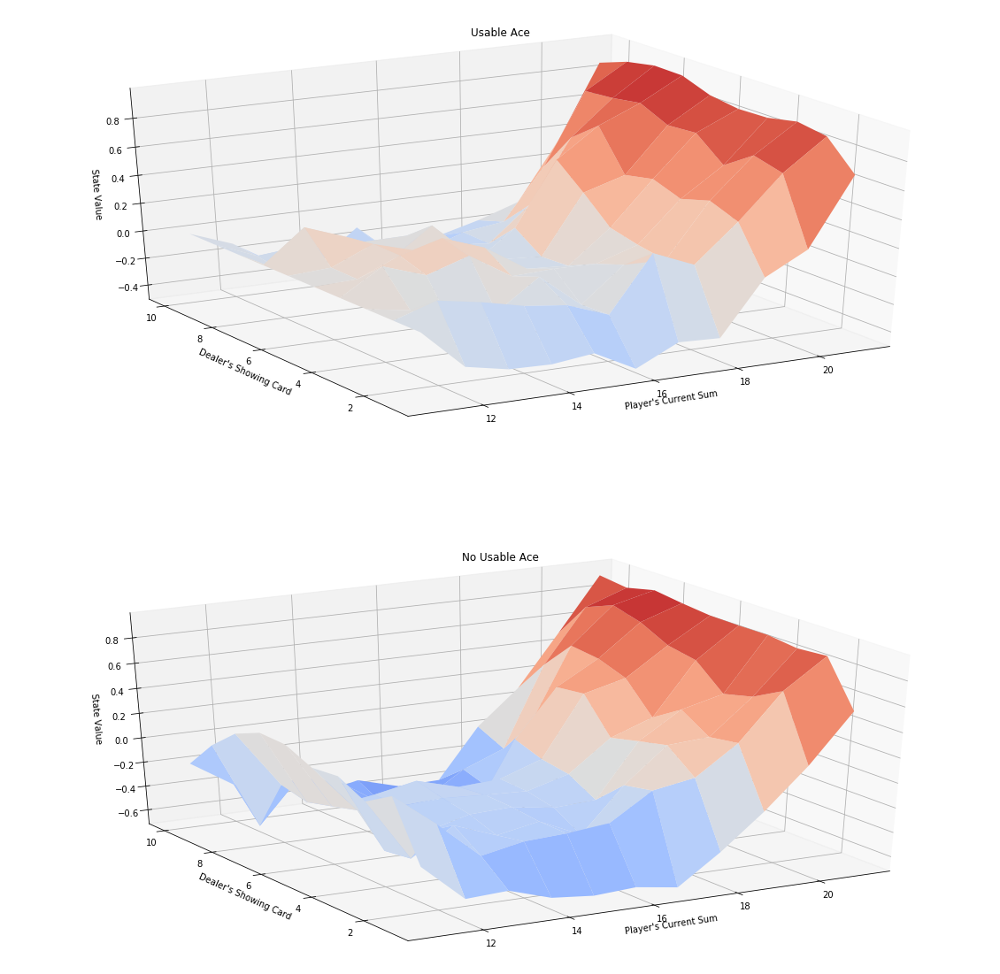

In [19]:
# obtain the corresponding state-value function
V = dict((k,np.max(v)) for k, v in Q.items())

# plot the state-value function
plot_blackjack_values(V)

Finally, we visualize the policy that is estimated to be optimal.

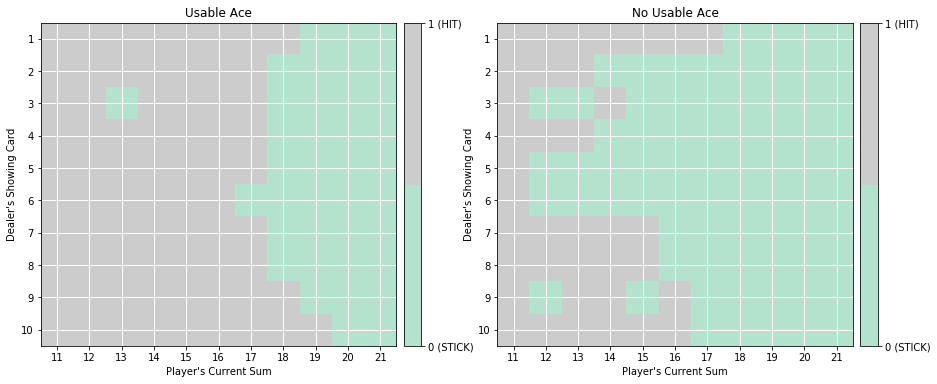

In [20]:
# plot the policy
plot_policy(policy)

The **true** optimal policy $\pi_*$ can be found in Figure 5.2 of the [textbook](http://go.udacity.com/rl-textbook) (and appears below).  Compare your final estimate to the optimal policy - how close are you able to get?  If you are not happy with the performance of your algorithm, take the time to tweak the decay rate of $\epsilon$, change the value of $\alpha$, and/or run the algorithm for more episodes to attain better results.

![True Optimal Policy](images/optimal.png)